# Rodrigo Playground

In [ ]:
### necessary imports ###

import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1,2,3"

from dataset_new import *
from models_new_2 import *
from visualisation_new_2 import *
from perturbation import *


### data loading ###

dataset_ID = 6661 # ID of a specific dataset. 6661 refer to preprocessed data with a mask of shape (4609,). 6660 refers to preprocessed data with a mask of shape (15364,)
mask_size = 4609 # number of voxels in the preprocessed fMRI data. either 4609 or 15364
trainset, valset, testset = get_dataset(dataset_ID, mask_size) # data are loaded into dictionaries

In [ ]:
#alternatively, for the new data
'''
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1,2,3"

from dataset_new import *
from models_new_2 import *
from visualisation_new_2 import *
from perturbation import *
'''
dataset_ID = 6661 # ID of a specific dataset. 6661 refer to preprocessed data with a mask of shape (4609,). 6660 refers to preprocessed data with a mask of shape (15364,)
mask_size = 4936

trainset, valset, testset = get_dataset2(dataset_ID) # data are loaded into dictionaries

In [3]:
print_dict_tree(valset)

fMRIs
  Spaceman (shape: (99, 4936))
  Sintel (shape: (89, 4936))
  AfterTheRain (shape: (61, 4936))
  Chatter (shape: (50, 4936))
  TearsOfSteel (shape: (73, 4936))
  BigBuckBunny (shape: (60, 4936))
  Superhero (shape: (127, 4936))
  ToClaireFromSonny (shape: (50, 4936))
  TheSecretNumber (shape: (97, 4936))
  BetweenViewings (shape: (100, 4936))
  LessonLearned (shape: (82, 4936))
  FirstBite (shape: (74, 4936))
  Payload (shape: (124, 4936))
videos
  Spaceman (shape: (99, 3, 112, 112, 32))
  Sintel (shape: (89, 3, 112, 112, 32))
  AfterTheRain (shape: (61, 3, 112, 112, 32))
  Chatter (shape: (50, 3, 112, 112, 32))
  TearsOfSteel (shape: (73, 3, 112, 112, 32))
  BigBuckBunny (shape: (60, 3, 112, 112, 32))
  Superhero (shape: (127, 3, 112, 112, 32))
  ToClaireFromSonny (shape: (50, 3, 112, 112, 32))
  TheSecretNumber (shape: (97, 3, 112, 112, 32))
  BetweenViewings (shape: (100, 3, 112, 112, 32))
  LessonLearned (shape: (82, 3, 112, 112, 32))
  FirstBite (shape: (74, 3, 112, 112, 32)

Using global trainset
Reconstructing frame at index 2119


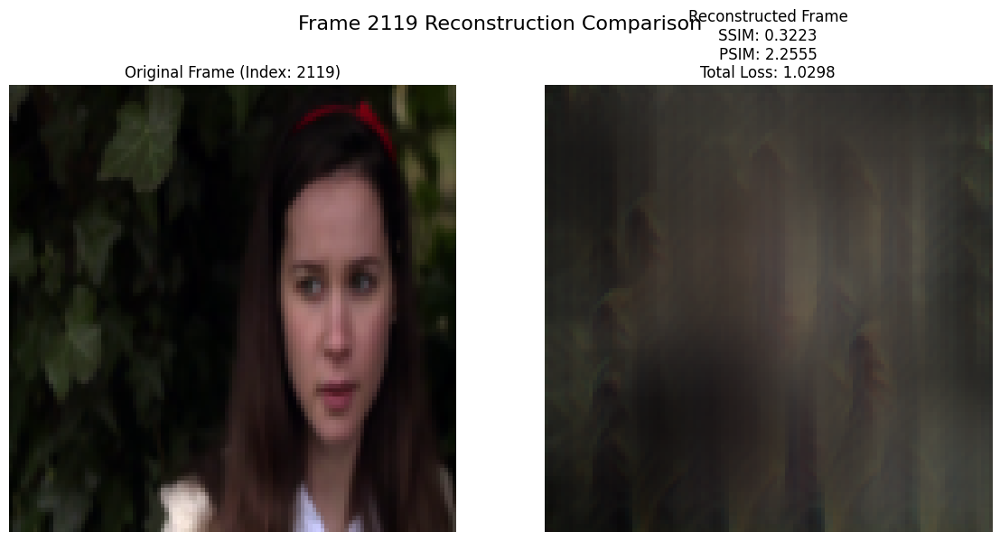

Similarity Metrics:
  ssim: 0.3223
  ssim_loss: 0.6777
  psim: 2.2555
  tv: 0.0105
  total_loss: 1.0298


'\n# All metrics (SSIM, PSIM, TV loss, Total loss)\nresult_all = reconstruct_frame_by_index(\n    frame_index=2173,\n    model_name=\'/media/RCPNAS/MIP/Michael/students_work/rodrigo/decoder_all_4609_325\',\n    metric="all"\n)\n'

In [5]:
#test ssim and psim



#test ssim 2

def reconstruct_frame_by_index(frame_index, model_name='decoder_4609_350', dataset=None, metric="ssim"):
    """
    Reconstruct a specific frame by its index and calculate similarity metrics.
    
    Parameters:
    -----------
    frame_index : int
        The index of the frame to reconstruct from trainset
    model_name : str
        Name of the model file to be used
    dataset : dict, optional
        Pre-filtered dataset to use. If None, will use the global trainset
    metric : str
        Similarity metric to use: "ssim", "psim", or "all" for both
        
    Returns:
    --------
    dict
        Dictionary with original frame, reconstructed frame, and similarity scores
    """
    import torch
    import numpy as np
    import matplotlib.pyplot as plt
    from pytorch_msssim import ssim
    
    # Determine which dataset to use
    if dataset is None:
        # Use the global trainset - assuming it has 'fMRIs' and 'videos' as direct arrays, not dictionaries
        print("Using global trainset")
        fmri_data = trainset['fMRIs']
        video_data = trainset['videos']
    else:
        # Use the provided filtered dataset
        print("Using provided filtered dataset")
        # Extract the first (and typically only) key from the filtered dataset
        fmri_key = list(dataset['fMRIs'].keys())[0]
        video_key = list(dataset['videos'].keys())[0]
        
        fmri_data = dataset['fMRIs'][fmri_key]
        video_data = dataset['videos'][video_key]
    
    # Check if frame_index is valid
    if frame_index >= len(fmri_data):
        print(f"Warning: Frame index {frame_index} out of range (max={len(fmri_data)-1})")
        frame_index = len(fmri_data) - 1
    
    print(f"Reconstructing frame at index {frame_index}")
    
    # Load the model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    model.eval()
    
    # Create loss function for metrics calculation
    criterion = D_Loss()
    criterion.eval()  # Set to evaluation mode
    
    # Determine device
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    criterion = criterion.to(device)
    
    # Get input fMRI and target frame for the specified index
    input_fmri = fmri_data[frame_index:frame_index+1]  # Add batch dimension
    
    # Handle different video data shapes - it might be (N, C, H, W) or (N, C, H, W, T)
    if len(video_data.shape) == 5:  # Shape is (N, C, H, W, T)
        target_frame = video_data[frame_index, :, :, :, 15]  # Middle frame (idx 15 of 32)
    else:  # Shape is (N, C, H, W)
        target_frame = video_data[frame_index]
    
    # Convert to tensors
    input_tensor = torch.from_numpy(input_fmri.astype('float32')).to(device)
    target_tensor = torch.from_numpy(target_frame.astype('float32')).unsqueeze(0).to(device)  # Add batch dimension
    
    # Generate reconstruction
    with torch.no_grad():
        reconstructed_frame = model(input_tensor)
    
    # Calculate similarity metrics
    metrics = {}
    
    # Calculate SSIM if requested
    if metric.lower() in ["ssim", "all"]:
        ssim_value = ssim(
            target_tensor, 
            reconstructed_frame, 
            data_range=1, 
            size_average=True
        ).item()
        metrics["ssim"] = ssim_value
        # For display purposes, we also compute 1-ssim (the loss value)
        metrics["ssim_loss"] = 1 - ssim_value
    
    # Calculate PSIM if requested
    if metric.lower() in ["psim", "all"]:
        # Use the perceptual similarity loss from D_Loss
        with torch.no_grad():
            psim_value = criterion.perceptual_sim_loss(reconstructed_frame, target_tensor).item()
        metrics["psim"] = psim_value
    
    # Calculate all metrics if requested
    if metric.lower() == "all":
        # Calculate TV loss as well
        with torch.no_grad():
            tv_value = criterion.tv_loss(reconstructed_frame).item()
        metrics["tv"] = tv_value
        
        # Calculate full loss
        l_psim, l_ssim, l_tv, total_loss, _ = criterion(reconstructed_frame, target_tensor)
        metrics["total_loss"] = total_loss.item()
    
    # Move tensors to CPU for visualization
    target_tensor = target_tensor.cpu()
    reconstructed_frame = reconstructed_frame.cpu()
    
    # Convert tensors to numpy for visualization
    target_np = target_tensor.squeeze(0).numpy()
    reconstructed_np = reconstructed_frame.squeeze(0).numpy()
    
    # Normalize for visualization
    def normalize(img):
        if img.min() < 0:
            img = (img + 1) / 2  # Convert from [-1, 1] to [0, 1]
        return np.clip(img, 0, 1)
    
    target_np = normalize(target_np)
    reconstructed_np = normalize(reconstructed_np)
    
    # Visualize the comparison
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    
    # Original frame
    axes[0].imshow(np.transpose(target_np, (1, 2, 0)))
    axes[0].set_title(f"Original Frame (Index: {frame_index})")
    axes[0].axis('off')
    
    # Reconstructed frame with metrics in title
    metrics_text = ""
    if "ssim" in metrics:
        metrics_text += f"SSIM: {metrics['ssim']:.4f}\n"
    if "psim" in metrics:
        metrics_text += f"PSIM: {metrics['psim']:.4f}\n"
    if "total_loss" in metrics:
        metrics_text += f"Total Loss: {metrics['total_loss']:.4f}"
        
    axes[1].imshow(np.transpose(reconstructed_np, (1, 2, 0)))
    axes[1].set_title(f"Reconstructed Frame\n{metrics_text}")
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.suptitle(f"Frame {frame_index} Reconstruction Comparison", fontsize=16)
    plt.subplots_adjust(top=0.85)
    plt.show()
    
    # Print the metrics
    print("Similarity Metrics:")
    for name, value in metrics.items():
        print(f"  {name}: {value:.4f}")
    
    # Return the data for further analysis if needed
    return {
        'original_frame': target_np,
        'reconstructed_frame': reconstructed_np,
        'metrics': metrics,
        'frame_index': frame_index
    }



'''
# Example usage with different metrics
# SSIM only (default)
result_ssim = reconstruct_frame_by_index(
    frame_index=2173,
    model_name='decoder_4609_350',
    metric="ssim"  # This is the default
)

# SSIM only (default)
result_ssim = reconstruct_frame_by_index(
    frame_index=2173,
    model_name='decoder_all_4609_325',
    metric="ssim"  # This is the default
)

# PSIM only
result_psim = reconstruct_frame_by_index(
    frame_index=2173,
    model_name='decoder_4609_350',
    metric="psim"
)

# PSIM only
result_psim = reconstruct_frame_by_index(
    frame_index=2173,
    model_name='decoder_all_4609_325',
    metric="psim"
)
'''


# All metrics (SSIM, PSIM, TV loss, Total loss)
#result_all = reconstruct_frame_by_index(
#    frame_index=2119,
#    model_name='decoder_4609_350',
#    metric="all"
#)

#result_all = reconstruct_frame_by_index(
#    frame_index=248,
#    frame_index=3008,
#    model_name='decoder_4609_350',
#    metric="all"
#)

# All metrics (SSIM, PSIM, TV loss, Total loss)
result_all = reconstruct_frame_by_index(
    frame_index=2119,
    model_name='decoder_all_4609_325',
    metric="all"
)

'''
# All metrics (SSIM, PSIM, TV loss, Total loss)
result_all = reconstruct_frame_by_index(
    frame_index=2173,
    model_name='/media/RCPNAS/MIP/Michael/students_work/rodrigo/decoder_all_4609_325',
    metric="all"
)
'''

#specific_frames_train = [681, 248, 3008, 1561, 1821, 2639, 467, 3558, 2173, 2119]


In [ ]:
# check data is normalized

import numpy as np

# Load the data
avg = np.load('processed_data/average/train.npy')
subject1 = np.load('processed_data/sub-S01/train.npy')
subject8 = np.load('processed_data/sub-S08/train.npy')

# Define the movie information
movies = [
    {"name": "Sintel", "start": 0, "end": 443, "trs": 444},
    {"name": "Payload", "start": 444, "end": 1063, "trs": 620},
    {"name": "TearsOfSteel", "start": 1064, "end": 1424, "trs": 361},
    {"name": "Superhero", "start": 1425, "end": 2056, "trs": 632},
    {"name": "BigBuckBunny", "start": 2057, "end": 2356, "trs": 300},
    {"name": "FirstBite", "start": 2357, "end": 2724, "trs": 368},
    {"name": "BetweenViewings", "start": 2725, "end": 3220, "trs": 496},
    {"name": "AfterTheRain", "start": 3221, "end": 3524, "trs": 304},
    {"name": "TheSecretNumber", "start": 3525, "end": 4006, "trs": 482},
    {"name": "Chatter", "start": 4007, "end": 4254, "trs": 248},
    {"name": "Spaceman", "start": 4255, "end": 4749, "trs": 495},
    {"name": "LessonLearned", "start": 4750, "end": 5159, "trs": 410},
    {"name": "ToClaireFromSonny", "start": 5160, "end": 5406, "trs": 247}
]

# Function to split data and compute statistics
def split_and_analyze(data, movies):
    movie_data = {}
    movie_stats = {}
    
    for movie in movies:
        name = movie["name"]
        start = movie["start"]
        end = movie["end"]
        
        # Extract the movie data
        movie_data[name] = data[start:end+1, :]
        
        # Verify the shape
        expected_shape = (movie["trs"], data.shape[1])
        actual_shape = movie_data[name].shape
        
        # Calculate statistics
        movie_stats[name] = {
            "mean": np.mean(movie_data[name]),
            "variance": np.var(movie_data[name]),
            "expected_shape": expected_shape,
            "actual_shape": actual_shape
        }
    
    return movie_data, movie_stats

# Organize data
data_dict = {
    'average': avg,
    'subject1': subject1,
    'subject8': subject8
}

# Split and analyze all datasets
results_data = {}
results_stats = {}

for subject_name, subject_data in data_dict.items():
    results_data[subject_name], results_stats[subject_name] = split_and_analyze(subject_data, movies)

# Print statistics in an organized manner
print("\n" + "="*80)
print("MOVIE STATISTICS BY SUBJECT")
print("="*80)

# First, print a table of means
print("\n" + "-"*80)
print("MEAN VALUES:")
print("-"*80)
print(f"{'Movie Name':<20} {'Average':<15} {'Subject 1':<15} {'Subject 8':<15}")
print("-"*80)

for movie in movies:
    movie_name = movie["name"]
    avg_mean = results_stats['average'][movie_name]['mean']
    sub1_mean = results_stats['subject1'][movie_name]['mean']
    sub8_mean = results_stats['subject8'][movie_name]['mean']
    
    print(f"{movie_name:<20} {avg_mean:<15.6f} {sub1_mean:<15.6f} {sub8_mean:<15.6f}")

# Then, print a table of variances
print("\n" + "-"*80)
print("VARIANCE VALUES:")
print("-"*80)
print(f"{'Movie Name':<20} {'Average':<15} {'Subject 1':<15} {'Subject 8':<15}")
print("-"*80)

for movie in movies:
    movie_name = movie["name"]
    avg_var = results_stats['average'][movie_name]['variance']
    sub1_var = results_stats['subject1'][movie_name]['variance']
    sub8_var = results_stats['subject8'][movie_name]['variance']
    
    print(f"{movie_name:<20} {avg_var:<15.6f} {sub1_var:<15.6f} {sub8_var:<15.6f}")

# Print shape verification
print("\n" + "-"*80)
print("SHAPE VERIFICATION:")
print("-"*80)
print(f"{'Movie Name':<20} {'Expected Shape':<20} {'Actual Shape':<20}")
print("-"*80)

for movie in movies:
    movie_name = movie["name"]
    expected = results_stats['average'][movie_name]['expected_shape']
    actual = results_stats['average'][movie_name]['actual_shape']
    
    print(f"{movie_name:<20} {str(expected):<20} {str(actual):<20}")

# Check if the data is normalized
print("\n" + "-"*80)
print("NORMALIZATION CHECK (Overall Statistics):")
print("-"*80)
print(f"{'Subject':<10} {'Overall Mean':<20} {'Overall Variance':<20}")
print("-"*80)

for subject_name, subject_data in data_dict.items():
    overall_mean = np.mean(subject_data)
    overall_var = np.var(subject_data)
    print(f"{subject_name:<10} {overall_mean:<20.6f} {overall_var:<20.6f}")

print("\n" + "="*80)
print("ANALYSIS COMPLETE")
print("="*80)


MOVIE STATISTICS BY SUBJECT

--------------------------------------------------------------------------------
MEAN VALUES:
--------------------------------------------------------------------------------
Movie Name           Average         Subject 1       Subject 8      
--------------------------------------------------------------------------------
Sintel               1.645895        3.734189        -0.007687      
Payload              0.039187        0.779581        -0.029756      
TearsOfSteel         1.110071        -0.020234       -0.006891      
Superhero            0.246708        -0.250208       -0.025985      
BigBuckBunny         0.915729        1.360844        -0.047030      
FirstBite            1.243744        1.751179        -0.047941      
BetweenViewings      1.083943        0.273598        0.002321       
AfterTheRain         2.831155        2.369127        -0.002071      
TheSecretNumber      0.999284        -0.151489       -0.000687      
Chatter              1.6

: 

In [ ]:
#shapes mismatch

video = '/Sintel.npy'
#aftertherain - 153 more TRs in subject 1 fMRI than in the video
#betweenviewings - 160 more TRs in subject 1 fMRI than in the video
#bigbuckbunny - 152 more TRs in subject 1 fMRI than in the video

video_adr = np.load('../../fadavid/Video_dataset/processed_videos' + video)
print(video_adr.shape)


'''
for i in range(1,33):

    try:
        print("shape subject", i, "=", np.load('fMRIs_schaefer1000_4609/sub-S0'+str(i)+video).shape)

    except:
        try:
            print("shape subject", i, "=", np.load('fMRIs_schaefer1000_4609/sub-S'+str(i)+video).shape)
        except:
            continue
#        print("shape subject", i, "=", np.load('fMRIs_schaefer1000_4609/sub-S'+str(i)+'/AfterTheRain.npy').shape)
'''

for i in range(1,33):

    try:
        print("shape subject", i, "=", np.load('../../fadavid/Video_dataset/fMRIs_schaefer1000_4609/sub-S0'+str(i)+video).shape)
        
    except:
        try:
            print("shape subject", i, "=", np.load('../../fadavid/Video_dataset/fMRIs_schaefer1000_4609/sub-S'+str(i)+video).shape)
        
        except:
            continue
    
print("shape subject average=", np.load('../../fadavid/Video_dataset/fMRIs_schaefer1000_4609/average'+video).shape)

#        print("shape subject", i, "=", np.load('fMRIs_schaefer1000_4609/sub-S'+str(i)+'/AfterTheRain.npy').shape)




'''fmri24_adr = np.load('fMRIs_schaefer1000_4609/sub-S24/AfterTheRain.npy')
print(fmri24_adr.shape)
fmri23_adr = np.load('fMRIs_schaefer1000_4609/sub-S23/AfterTheRain.npy')
print(fmri23_adr.shape)
fmri2_adr = np.load('fMRIs_schaefer1000_4609/sub-S02/AfterTheRain.npy')
print(fmri2_adr.shape)
fmri32_adr = np.load('fMRIs_schaefer1000_4609/sub-S32/AfterTheRain.npy')
print(fmri32_adr.shape)'''
print("\n")

test_adr = np.load('encoder_dataset_6660/testset/videos' + video)
print("test video shape ", test_adr.shape)
test_adr2 = np.load('encoder_dataset_6660/testset/fMRIs' + video)
print("test fmri shape ", test_adr2.shape)
#testset should have 20% of all frames, it gives 77 and 77*5 = 385 , roughly what we got for the processed_videos
val_adr = np.load('encoder_dataset_6660/valset/videos' + video)
print(val_adr.shape)

(555, 3, 112, 112, 32)
shape subject 1 = (4609, 712)
shape subject 2 = (4609, 710)
shape subject 3 = (4609, 710)
shape subject 4 = (4609, 712)
shape subject 5 = (4609, 710)
shape subject 6 = (4609, 712)
shape subject 7 = (4609, 711)
shape subject 8 = (4609, 712)
shape subject 9 = (4609, 711)
shape subject 10 = (4609, 712)
shape subject 11 = (4609, 710)
shape subject 13 = (4609, 711)
shape subject 14 = (4609, 714)
shape subject 15 = (4609, 712)
shape subject 16 = (4609, 710)
shape subject 17 = (4609, 710)
shape subject 19 = (4609, 712)
shape subject 20 = (4609, 710)
shape subject 21 = (4609, 710)
shape subject 22 = (4609, 716)
shape subject 23 = (4609, 712)
shape subject 24 = (4609, 710)
shape subject 25 = (4609, 710)
shape subject 26 = (4609, 710)
shape subject 27 = (4609, 712)
shape subject 28 = (4609, 712)
shape subject 29 = (4609, 710)
shape subject 30 = (4609, 711)
shape subject 31 = (4609, 712)
shape subject 32 = (4609, 710)
shape subject average= (555, 4609)


test video shape  (

: 

In [ ]:
#since shapes are mismatching lets see if split_for_encoder function still works

split_for_encoder(dataset_ID = 3335, test_size = 0.2, fMRIs_path = 'fMRIs_schaefer1000_4609', full_movie_test = 'YouAgain')

Start splitting.


TR= 555 TR2= 555


KeyboardInterrupt: 

: 

In [ ]:
create_video_dataset("processed_videos")

Processing Sintel, shape: (555, 3, 112, 112, 32)
  Added Sintel to train set, shape: (444, 3, 112, 112, 32), TRs: 444
  Saved Sintel test portion to test set, shape: (111, 3, 112, 112, 32), TRs: 111
Processing Payload, shape: (775, 3, 112, 112, 32)
  Added Payload to train set, shape: (620, 3, 112, 112, 32), TRs: 620
  Saved Payload test portion to test set, shape: (155, 3, 112, 112, 32), TRs: 155
Processing TearsOfSteel, shape: (452, 3, 112, 112, 32)
  Added TearsOfSteel to train set, shape: (361, 3, 112, 112, 32), TRs: 361
  Saved TearsOfSteel test portion to test set, shape: (91, 3, 112, 112, 32), TRs: 91
Processing Superhero, shape: (790, 3, 112, 112, 32)
  Added Superhero to train set, shape: (632, 3, 112, 112, 32), TRs: 632
  Saved Superhero test portion to test set, shape: (158, 3, 112, 112, 32), TRs: 158
Processing BigBuckBunny, shape: (376, 3, 112, 112, 32)
  Added BigBuckBunny to train set, shape: (300, 3, 112, 112, 32), TRs: 300
  Saved BigBuckBunny test portion to test set,

((5407, 3, 112, 112, 32),
 {'Sintel': (111, 3, 112, 112, 32),
  'Payload': (155, 3, 112, 112, 32),
  'TearsOfSteel': (91, 3, 112, 112, 32),
  'Superhero': (158, 3, 112, 112, 32),
  'BigBuckBunny': (76, 3, 112, 112, 32),
  'FirstBite': (92, 3, 112, 112, 32),
  'BetweenViewings': (125, 3, 112, 112, 32),
  'AfterTheRain': (77, 3, 112, 112, 32),
  'TheSecretNumber': (121, 3, 112, 112, 32),
  'Chatter': (63, 3, 112, 112, 32),
  'Spaceman': (124, 3, 112, 112, 32),
  'LessonLearned': (103, 3, 112, 112, 32),
  'YouAgain': (613, 3, 112, 112, 32),
  'ToClaireFromSonny': (62, 3, 112, 112, 32)})

: 

In [ ]:
#test 1

video1 = np.load('processed_data/videos/test/YouAgain.npy')
video2 = np.load('processed_data/videos/test/Payload.npy')

video1_og = np.load('encoder_dataset_6661/testset/videos/YouAgain.npy')
video2_og = np.load('encoder_dataset_6661/testset/videos/Payload.npy')

print(video1 == video1_og)
print(video2 == video2_og)


[[[[[ True  True  True ...  True  True  True]
    [ True  True  True ...  True  True  True]
    [ True  True  True ...  True  True  True]
    ...
    [ True  True  True ...  True  True  True]
    [ True  True  True ...  True  True  True]
    [ True  True  True ...  True  True  True]]

   [[ True  True  True ...  True  True  True]
    [ True  True  True ...  True  True  True]
    [ True  True  True ...  True  True  True]
    ...
    [ True  True  True ...  True  True  True]
    [ True  True  True ...  True  True  True]
    [ True  True  True ...  True  True  True]]

   [[ True  True  True ...  True  True  True]
    [ True  True  True ...  True  True  True]
    [ True  True  True ...  True  True  True]
    ...
    [ True  True  True ...  True  True  True]
    [ True  True  True ...  True  True  True]
    [ True  True  True ...  True  True  True]]

   ...

   [[ True  True  True ...  True  True  True]
    [ True  True  True ...  True  True  True]
    [ True  True  True ...  True  True  Tr

: 

In [ ]:
#test 2
video3_og = np.load('encoder_dataset_6661/trainset/videos.npy', mmap_mode='r',
                    allow_pickle=True)[:60]

'''
import pickle

try:
    with open('encoder_dataset_6661/trainset/videos.npy', 'rb') as f:
        # Try direct pickle loading
        video3_og = pickle.load(f)
        print("Successfully loaded with pickle directly")
except Exception as e:
    print(f"Failed with direct pickle: {e}")

'''
video3 = np.load('processed_data/videos/videos.npy')[:60]


print(video3 == video3_og)

UnpicklingError: Failed to interpret file 'encoder_dataset_6661/trainset/videos.npy' as a pickle

: 

In [ ]:
#test 3
#avg_new = np.load("processed_data/average/train.npy", mmap_mode='r',)
#avg_og = np.load('encoder_dataset_6661/trainset/fMRIs.npy', mmap_mode='r')


# Load both arrays
avg_new = np.load("processed_data/average/test/BetweenViewings.npy", mmap_mode='r')
avg_og = np.load("encoder_dataset_6661/testset/fMRIs/BetweenViewings.npy", mmap_mode='r', allow_pickle=True)

# Create a boolean array where True indicates matching values
matching_values = (avg_new == avg_og)

# Find the indices where values match
matching_indices = np.where(matching_values)

# Count how many elements match
total_matches = np.sum(matching_values)
total_elements = matching_values.size

print(f"Number of matching elements: {total_matches} out of {total_elements}")
print(f"Percentage of matching elements: {(total_matches/total_elements)*100:.2f}%")

# If the arrays are multi-dimensional, you might want to show a few examples
if len(matching_indices) > 1:  # More than 1D
    print("\nSample of matching indices (first 10):")
    for i in range(min(10, len(matching_indices[0]))):
        idx = tuple(dim[i] for dim in matching_indices)
        print(f"Index {idx}: {avg_new[idx]} == {avg_og[idx]}")
else:  # 1D array
    print("\nSample of matching indices (first 10):")
    for i in range(min(10, len(matching_indices[0]))):
        idx = matching_indices[0][i]
        print(f"Index {idx}: {avg_new[idx]} == {avg_og[idx]}")


Number of matching elements: 576125 out of 576125
Percentage of matching elements: 100.00%

Sample of matching indices (first 10):
Index (0, 0): 49.76199722290039 == 49.76199722290039
Index (0, 1): 42.38187026977539 == 42.38187026977539
Index (0, 2): 54.79033660888672 == 54.79033660888672
Index (0, 3): 53.15463638305664 == 53.15463638305664
Index (0, 4): 45.94294357299805 == 45.94294357299805
Index (0, 5): 35.86585235595703 == 35.86585235595703
Index (0, 6): 26.42565155029297 == 26.42565155029297
Index (0, 7): 49.07965087890625 == 49.07965087890625
Index (0, 8): 42.987552642822266 == 42.987552642822266
Index (0, 9): 34.97540283203125 == 34.97540283203125


: 

In [ ]:
create_dataset_all_subjects("fMRIs_schaefer1000_4609")



Processing average...
  Processing Sintel for average


It will load_durations with subject=average 


    Added Sintel to train set, shape: (444, 4609), TRs: 444
    Saved Sintel test portion to test set, shape: (111, 4609), TRs: 111
  Processing Payload for average


It will load_durations with subject=average 


    Added Payload to train set, shape: (620, 4609), TRs: 620
    Saved Payload test portion to test set, shape: (155, 4609), TRs: 155
  Processing TearsOfSteel for average


It will load_durations with subject=average 


    Added TearsOfSteel to train set, shape: (361, 4609), TRs: 361
    Saved TearsOfSteel test portion to test set, shape: (91, 4609), TRs: 91
  Processing Superhero for average


It will load_durations with subject=average 


    Added Superhero to train set, shape: (632, 4609), TRs: 632
    Saved Superhero test portion to test set, shape: (158, 4609), TRs: 158
  Processing BigBuckBunny for average


It will load_durations with subject=average 


    Added B

({'average': (5407, 4609), 'sub-S01': (5407, 4609)},
 {'average': {'Sintel': (111, 4609),
   'Payload': (155, 4609),
   'TearsOfSteel': (91, 4609),
   'Superhero': (158, 4609),
   'BigBuckBunny': (76, 4609),
   'FirstBite': (92, 4609),
   'BetweenViewings': (125, 4609),
   'AfterTheRain': (77, 4609),
   'TheSecretNumber': (121, 4609),
   'Chatter': (63, 4609),
   'Spaceman': (124, 4609),
   'LessonLearned': (103, 4609),
   'YouAgain': (613, 4609),
   'ToClaireFromSonny': (62, 4609)},
  'sub-S01': {'Sintel': (111, 4609),
   'Payload': (155, 4609),
   'TearsOfSteel': (91, 4609),
   'Superhero': (158, 4609),
   'BigBuckBunny': (76, 4609),
   'FirstBite': (92, 4609),
   'BetweenViewings': (125, 4609),
   'AfterTheRain': (77, 4609),
   'TheSecretNumber': (121, 4609),
   'Chatter': (63, 4609),
   'Spaceman': (124, 4609),
   'LessonLearned': (103, 4609),
   'YouAgain': (613, 4609),
   'ToClaireFromSonny': (62, 4609)}})

: 

## Data statistics

In [21]:
def boxplots2():
    import os
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns
    import pandas as pd
    from pathlib import Path

    # Set the path to the main directory
    main_dir = 'processed_data'
    # Dictionary to store results
    results = {
        'subject': [],
        'video': [],
        'variance': [],
        'mean': [],
        'maximum': [],
        'minimum': []
    }

    # Find all subject directories (excluding specified subjects)
    excluded_subjects = ['sub-S02', 'sub-S11', 'sub-S21', 'sub-S26', 'sub-S30']
#    excluded_subjects = []
    subject_dirs = sorted([d for d in os.listdir(main_dir) 
                        if d.startswith('sub-') and d not in excluded_subjects])

    # Process each subject
    for subject in subject_dirs:
        subject_path = os.path.join(main_dir, subject)
        
        # Skip if not a directory
        if not os.path.isdir(subject_path):
            continue
        
        print(f"Processing {subject}...")
        
        # Get all .npy files for this subject
        npy_files = [f for f in os.listdir(subject_path) if f.endswith('.npy')]
        
        # Process each video file individually
        for npy_file in npy_files:
            file_path = os.path.join(subject_path, npy_file)
            video_name = os.path.splitext(npy_file)[0]  # Remove .npy extension to get video name
            
            try:
                # Load the data
                data = np.load(file_path)
                #onset, duration = load_durations(video=video, subject=subject[4:])
                #data = data[:, onset:onset+duration]
                #data = data.T
                
                #data = np.transpose(data,(1,0))
                print("video shape =", data.shape)
                # Apply necessary slicing and transposing
                
                
                # Z-score normalize the data
                # Using the formula: data = (data - np.mean(data)) / np.std(data)
                #normalized_data = (data - np.mean(data)) / np.std(data)
                #normalized_data = data
                
                # Calculate statistics on the normalized data
                variance = np.var(data)
                mean = np.mean(data)
                maximum = np.max(data)
                minimum = np.min(data)
                
                # Store results
                results['subject'].append(subject)
                results['video'].append(video_name)
                results['variance'].append(variance)
                results['mean'].append(mean)
                results['maximum'].append(maximum)
                results['minimum'].append(minimum)
                
                print(f"  {video_name}: var={variance:.4f}, mean={mean:.4f}, max={maximum:.4f}, min={minimum:.4f}")
                print("\nShape:", data.shape, "\n")
                
            except Exception as e:
                print(f"  Error processing {file_path}: {e}")

    # Convert results to DataFrame
    df = pd.DataFrame(results)
    print(f"Processed {len(df)} files across {len(subject_dirs)} subjects")

    # Create output directory for plots
    output_dir = 'fmri_plots'
    os.makedirs(output_dir, exist_ok=True)

    # Set up plotting style
    sns.set(style="whitegrid")
    plt.rcParams.update({'figure.figsize': (15, 8)})

    # Flag to control whether plots are saved or just displayed
    save_plots = False  # Set to False to only display plots without saving

    # Create individual boxplots for each metric
    metrics = {
        'variance': 'Variance',
        'mean': 'Mean',
        'maximum': 'Maximum',
        'minimum': 'Minimum'
    }

    # Create boxplot for each metric
    for metric, title in metrics.items():
        plt.figure()
        sns.boxplot(x='subject', y=metric, data=df)
        plt.title(f'{title} by Subject (Normalized Data)')
        plt.xlabel('Subject')
        plt.ylabel(title)
        plt.xticks(rotation=90)
        plt.tight_layout()
        
        if save_plots:
#            plt.savefig(os.path.join(output_dir, f'boxplot_{metric}_by_subject.png'), dpi=300)
            print(f"Saved plot to {os.path.join(output_dir, f'boxplot_{metric}_by_subject.png')}")
        else:
            plt.show()
        
        plt.close()

boxplots2()

Processing sub-S01...


KeyboardInterrupt: 

Processing average-new...
  Error processing fMRIs_schaefer1000_4609/average-new/Sintel.npy: 'age-new'
  Error processing fMRIs_schaefer1000_4609/average-new/Payload.npy: 'age-new'
  Error processing fMRIs_schaefer1000_4609/average-new/TearsOfSteel.npy: 'age-new'
  Error processing fMRIs_schaefer1000_4609/average-new/Superhero.npy: 'age-new'
  Error processing fMRIs_schaefer1000_4609/average-new/BigBuckBunny.npy: 'age-new'
  Error processing fMRIs_schaefer1000_4609/average-new/FirstBite.npy: 'age-new'
  Error processing fMRIs_schaefer1000_4609/average-new/BetweenViewings.npy: 'age-new'
  Error processing fMRIs_schaefer1000_4609/average-new/AfterTheRain.npy: 'age-new'
  Error processing fMRIs_schaefer1000_4609/average-new/TheSecretNumber.npy: 'age-new'
  Error processing fMRIs_schaefer1000_4609/average-new/Chatter.npy: 'age-new'
  Error processing fMRIs_schaefer1000_4609/average-new/Spaceman.npy: 'age-new'
  Error processing fMRIs_schaefer1000_4609/average-new/LessonLearned.npy: 'age-ne

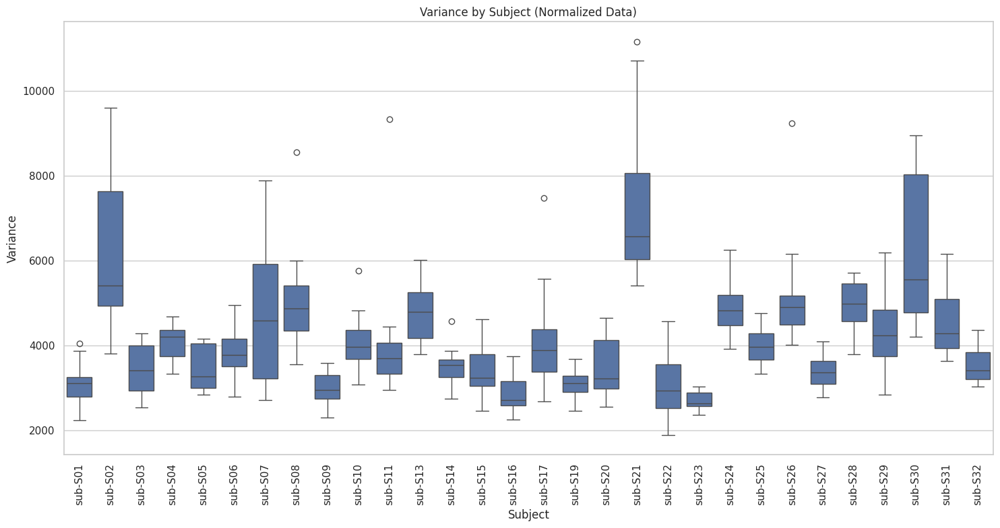

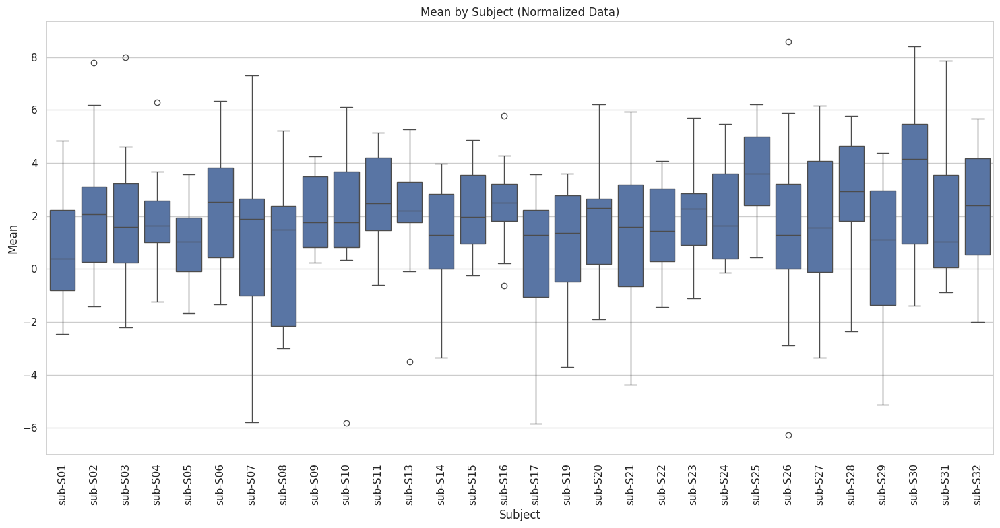

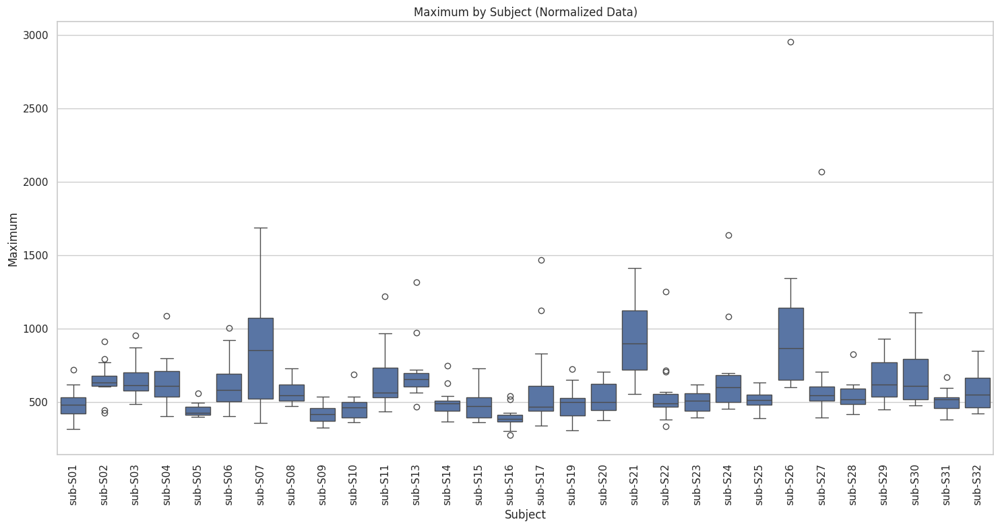

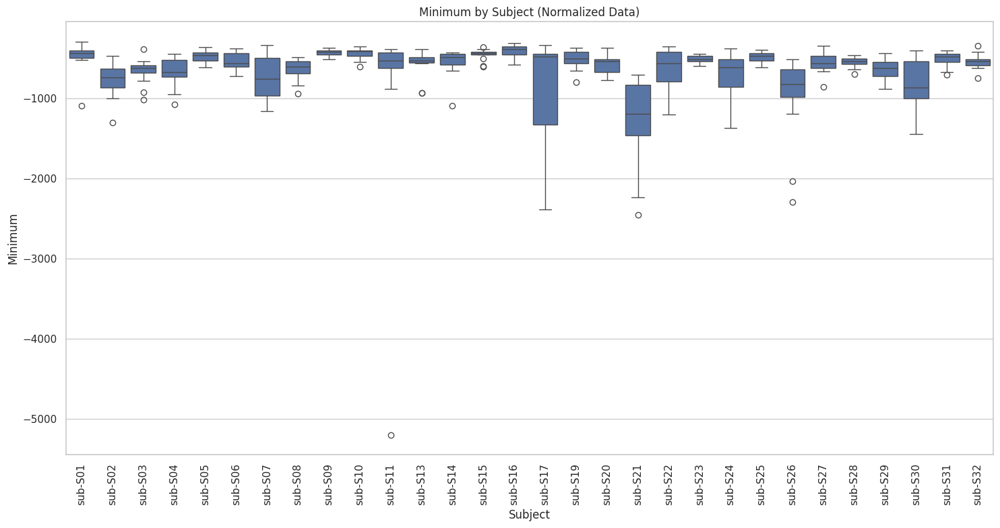

: 

In [ ]:
def boxplots2():
    import os
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns
    import pandas as pd
    from pathlib import Path

    # Set the path to the main directory
    main_dir = 'fMRIs_schaefer1000_4609'
    # Dictionary to store results
    results = {
        'subject': [],
        'video': [],
        'variance': [],
        'mean': [],
        'maximum': [],
        'minimum': []
    }

    # Find all subject directories (excluding specified subjects)
    excluded_subjects = ['sub-S02', 'sub-S11', 'sub-S21', 'sub-S26', 'sub-S30']
#    excluded_subjects = []
    subject_dirs = sorted([d for d in os.listdir(main_dir) 
                        if d.startswith('sub-') or d.startswith('average-new') and d not in excluded_subjects])

    # Process each subject
    for subject in subject_dirs:
        subject_path = os.path.join(main_dir, subject)
        
        # Skip if not a directory
        if not os.path.isdir(subject_path):
            continue
        
        print(f"Processing {subject}...")
        
        # Get all .npy files for this subject
        npy_files = [f for f in os.listdir(subject_path) if f.endswith('.npy')]
        
        # Process each video file individually
        for npy_file in npy_files:
            file_path = os.path.join(subject_path, npy_file)
            video_name = os.path.splitext(npy_file)[0]  # Remove .npy extension to get video name
            
            try:
                # Load the data
                data = np.load(file_path)
                onset, duration = load_durations(video=video, subject=subject[4:])
                data = data[:, onset:onset+duration]
                #data = data.T
                
                data = np.transpose(data,(1,0))
                print("video shape =", data.shape)
                # Apply necessary slicing and transposing
                
                
                # Z-score normalize the data
                # Using the formula: data = (data - np.mean(data)) / np.std(data)
                #normalized_data = (data - np.mean(data)) / np.std(data)
                #normalized_data = data
                
                # Calculate statistics on the normalized data
                variance = np.var(data)
                mean = np.mean(data)
                maximum = np.max(data)
                minimum = np.min(data)
                
                # Store results
                results['subject'].append(subject)
                results['video'].append(video_name)
                results['variance'].append(variance)
                results['mean'].append(mean)
                results['maximum'].append(maximum)
                results['minimum'].append(minimum)
                
                print(f"  {video_name}: var={variance:.4f}, mean={mean:.4f}, max={maximum:.4f}, min={minimum:.4f}")
                print("\nShape:", data.shape, "\n")
                
            except Exception as e:
                print(f"  Error processing {file_path}: {e}")

    # Convert results to DataFrame
    df = pd.DataFrame(results)
    print(f"Processed {len(df)} files across {len(subject_dirs)} subjects")

    # Create output directory for plots
    output_dir = 'fmri_plots'
    os.makedirs(output_dir, exist_ok=True)

    # Set up plotting style
    sns.set(style="whitegrid")
    plt.rcParams.update({'figure.figsize': (15, 8)})

    # Flag to control whether plots are saved or just displayed
    save_plots = False  # Set to False to only display plots without saving

    # Create individual boxplots for each metric
    metrics = {
        'variance': 'Variance',
        'mean': 'Mean',
        'maximum': 'Maximum',
        'minimum': 'Minimum'
    }

    # Create boxplot for each metric
    for metric, title in metrics.items():
        plt.figure()
        sns.boxplot(x='subject', y=metric, data=df)
        plt.title(f'{title} by Subject (Normalized Data)')
        plt.xlabel('Subject')
        plt.ylabel(title)
        plt.xticks(rotation=90)
        plt.tight_layout()
        
        if save_plots:
#            plt.savefig(os.path.join(output_dir, f'boxplot_{metric}_by_subject.png'), dpi=300)
            print(f"Saved plot to {os.path.join(output_dir, f'boxplot_{metric}_by_subject.png')}")
        else:
            plt.show()
        
        plt.close()

boxplots2()

In [20]:
# code for normalized boxplots

def boxplots():
    import os
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns
    import pandas as pd
    from pathlib import Path

    # Set the path to the main directory
    main_dir = 'fMRIs_schaefer1000_4609'
    # Dictionary to store results
    results = {
        'subject': [],
        'video': [],
        'variance': [],
        'mean': [],
        'maximum': [],
        'minimum': []
    }

    # Find all subject directories (excluding specified subjects)
    excluded_subjects = ['sub-S02', 'sub-S21', 'sub-S26', 'sub-S30']
    subject_dirs = sorted([d for d in os.listdir(main_dir) 
                        if d.startswith('sub-') and d not in excluded_subjects])

    # Process each subject
    for subject in subject_dirs:
        subject_path = os.path.join(main_dir, subject)
        
        # Skip if not a directory
        if not os.path.isdir(subject_path):
            continue
        
        print(f"Processing {subject}...")
        
        # Get all .npy files for this subject
        npy_files = [f for f in os.listdir(subject_path) if f.endswith('.npy')]
        
        # Process each video file individually
        for npy_file in npy_files:
            file_path = os.path.join(subject_path, npy_file)
            video_name = os.path.splitext(npy_file)[0]  # Remove .npy extension to get video name
            
            try:
                # Load the data
                data = np.load(file_path)
                
                # Z-score normalize the data
                # Using the formula: data = (data - np.mean(data)) / np.std(data)
                #normalized_data = (data - np.mean(data)) / np.std(data)
                normalized_data = data
                
                # Calculate statistics on the normalized data
                variance = np.var(normalized_data)
                mean = np.mean(normalized_data)
                maximum = np.max(normalized_data)
                minimum = np.min(normalized_data)
                
                # Store results
                results['subject'].append(subject)
                results['video'].append(video_name)
                results['variance'].append(variance)
                results['mean'].append(mean)
                results['maximum'].append(maximum)
                results['minimum'].append(minimum)
                
                print(f"  {video_name}: var={variance:.4f}, mean={mean:.4f}, max={maximum:.4f}, min={minimum:.4f}")
                
            except Exception as e:
                print(f"  Error processing {file_path}: {e}")

    data = np.memmap("encoder_dataset_6661/trainset/fMRIs.npy")
    variance = np.var(data)
    mean = np.mean(data)
    maximum = np.max(data)
    minimum = np.min(data)

    #nao esquecer de lavar os dentinhos quando acabar o jantarzinho para ficarem limpinhoszinhos
    
    # Store results
    results['subject'].append("average")
    results['video'].append("average")
    results['variance'].append(variance)
    results['mean'].append(mean)
    results['maximum'].append(maximum)
    results['minimum'].append(minimum)

    # Convert results to DataFrame
    df = pd.DataFrame(results)
    print(f"Processed {len(df)} files across {len(subject_dirs)} subjects")

    # Create output directory for plots
    output_dir = 'fmri_plots'
    os.makedirs(output_dir, exist_ok=True)

    # Set up plotting style
    sns.set(style="whitegrid")
    plt.rcParams.update({'figure.figsize': (15, 8)})

    # Flag to control whether plots are saved or just displayed
    save_plots = False  # Set to False to only display plots without saving

    # Create individual boxplots for each metric
    metrics = {
        'variance': 'Variance',
        'mean': 'Mean',
        'maximum': 'Maximum',
        'minimum': 'Minimum'
    }

    # Create boxplot for each metric
    for metric, title in metrics.items():
        plt.figure()
        sns.boxplot(x='subject', y=metric, data=df)
        plt.title(f'{title} by Subject (Normalized Data)')
        plt.xlabel('Subject')
        plt.ylabel(title)
        plt.xticks(rotation=90)
        plt.tight_layout()
        
        if save_plots:
#            plt.savefig(os.path.join(output_dir, f'boxplot_{metric}_by_subject.png'), dpi=300)
            print(f"Saved plot to {os.path.join(output_dir, f'boxplot_{metric}_by_subject.png')}")
        else:
            plt.show()
        
        plt.close()

boxplots()

Processing sub-S01...
  Spaceman: var=3056.7764, mean=-0.0236, max=633.0197, min=-627.9825
  Sintel: var=3639.1899, mean=-0.0341, max=541.7632, min=-622.8786
  AfterTheRain: var=2862.6448, mean=-0.0044, max=512.8685, min=-421.8640
  Chatter: var=2967.5754, mean=-0.0360, max=554.6439, min=-409.4958
  TearsOfSteel: var=3713.5027, mean=-0.0210, max=618.4004, min=-746.8309
  BigBuckBunny: var=2487.7417, mean=-0.0009, max=537.3555, min=-1094.8224
  Superhero: var=4122.7197, mean=-0.0335, max=817.1620, min=-783.0395
  ToClaireFromSonny: var=2725.1638, mean=-0.0155, max=424.7885, min=-438.6104


KeyboardInterrupt: 

video shape = (4609, 712)
video shape = (4609, 555)
video shape = (4609, 710)
video shape = (4609, 555)
video shape = (4609, 710)
video shape = (4609, 555)
video shape = (4609, 712)
video shape = (4609, 555)
video shape = (4609, 710)
video shape = (4609, 555)
video shape = (4609, 712)
video shape = (4609, 555)
video shape = (4609, 711)
video shape = (4609, 555)
video shape = (4609, 712)
video shape = (4609, 555)
video shape = (4609, 711)
video shape = (4609, 555)
video shape = (4609, 712)
video shape = (4609, 555)
video shape = (4609, 710)
video shape = (4609, 555)
video shape = (4609, 711)
video shape = (4609, 555)
video shape = (4609, 714)
video shape = (4609, 555)
video shape = (4609, 712)
video shape = (4609, 555)
video shape = (4609, 710)
video shape = (4609, 555)
video shape = (4609, 710)
video shape = (4609, 555)
video shape = (4609, 712)
video shape = (4609, 555)
video shape = (4609, 710)
video shape = (4609, 555)
video shape = (4609, 710)
video shape = (4609, 555)
video shape 

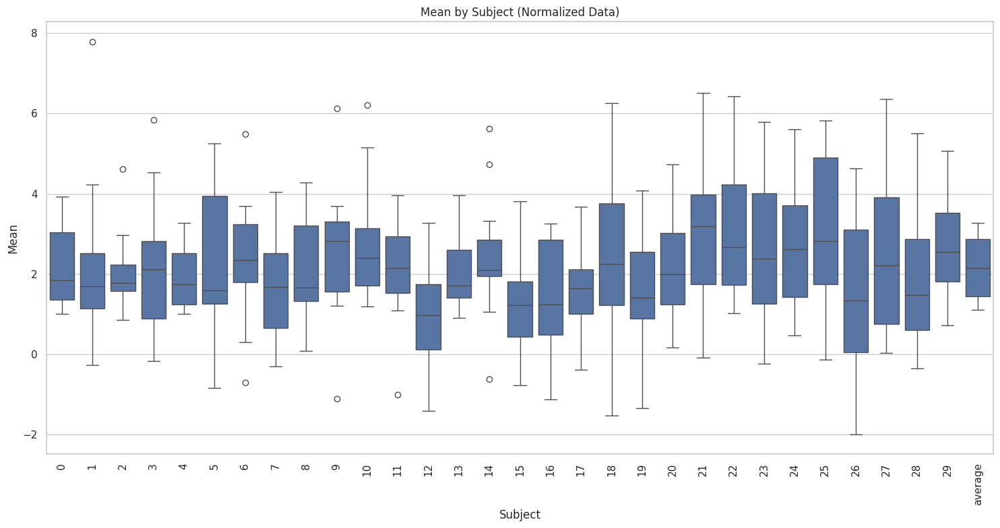

'from dataset_rodrigo import load_durations\n\ndef create_concatenated():\n    for subject in subject_ids:\n        for video in videos:\n            data = np.load(\'fMRIs_schaefer1000_4609/sub-S\' + subject + \'/\' + video + \'.npy\')\n            onset, duration = load_durations(video=video, subject=\'S\' + subject)\n\n            print("if it prints this, the error was not in load_durations")\n            \n            # Apply necessary slicing and transposing\n            data = data[:, onset:onset+duration]\n            print("video shape =", data.shape)\n            concatenated = concatenated + data.tolist()\n    #        concatenated.append(np.load(\'fMRIs_schaefer1000_4609/sub-S\' + subject + \'/\' + video + \'.npy\'))\n            print(len(concatenated))\n            print("concatenated[-1] = len ", len(concatenated[-1]))\n            return concatenated\n'

: 

In [ ]:
#make new average

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

subject_ids = [
#    '01-norm', 
                '01', 
                '02', #<-
                '03', '04', '05', '06', '07', '08', '09', '10', '11', 
                '13', '14', '15', '16', '17', '19', '20', 
                '21', #<-
                '22', '23', '24', 
                '25', 
                '26', #<-
                '27', '28', '29', 
                '30', #<-
                '31', '32'
                ]

#videos = [
#    'Sintel', 'Payload', 'TearsOfSteel', 'Superhero', 'BigBuckBunny', 
#    'FirstBite', 'BetweenViewings', 'AfterTheRain', 'TheSecretNumber', 
#    'Chatter', 'Spaceman', 'LessonLearned', 'YouAgain', 'ToClaireFromSonny' 
#]

videos = {
    'Sintel': 555,
    'Payload': 775, 
    'TearsOfSteel': 452, 
    'Superhero': 790, 
    'BigBuckBunny': 376, 
    'FirstBite': 460, 
    'BetweenViewings': 621, 
    'AfterTheRain': 381, 
    'TheSecretNumber': 603, 
    'Chatter': 311, 
    'Spaceman': 619, 
    'LessonLearned': 513, 
    'YouAgain': 613, 
    'ToClaireFromSonny': 309 
}

from dataset_new import load_durations

results = {
        'subject': [],
        'video': [],
        'mean': [],
    }

for video in videos.keys():
    concatenated = np.zeros((videos[video], 4609, len(subject_ids)))
    
    for i in range (len(subject_ids)):
        subject = subject_ids[i]
        data = np.load('fMRIs_schaefer1000_4609/sub-S' + subject + '/' + video + '.npy')
        onset, duration = load_durations(video=video, subject=subject[4:])
        data = data[:, onset:onset+duration]
                #data = data.T
                
        data = np.transpose(data,(1,0))
        #onset, duration = load_durations(video=video, subject='S' + subject)
        print("video shape =", data.shape)
        # Apply necessary slicing and transposing
        #data = data[:, onset:onset+duration]
        mean_for_plot = np.mean(data)
        results['mean'].append(mean_for_plot)
        results['subject'].append(i)
        results['video'].append(video)
        print("video shape =", data.shape)
        concatenated[:, :, i] = data.T
    #    concatenated.append(np.load('fMRIs_schaefer1000_4609/sub-S' + subject + '/' + video + '.npy'))
#        print(len(concatenated))
#        print("concatenated[-1] = len ", len(concatenated[-1]))

    # Calculate the average across the third dimension (subjects)
    average = np.mean(concatenated, axis=2)
    mean_for_plot = np.mean(average)
    results['mean'].append(mean_for_plot)
    results['subject'].append("average")
    results['video'].append(video)

    print(f"Average shape for {video} = {average.shape}")
    

    print("First 10 indices in the second dimension for the first index of the first dimension, for each subject:")
    for k in range(concatenated.shape[2]):  # Loop through the third dimension (subjects)
        print(f"\nSubject {k} (ID: {subject_ids[k]}):")
        for j in range(10):  # First 10 indices of the second dimension
            print(f"  concatenated[0, {j}, {k}] = {concatenated[0, j, k]}")
        print("\n")
    for l in range(10):
        print(f"  average[0, {l}] = {average[0, l]}")

#print(results)
df = pd.DataFrame(results)

metrics = {
    'mean': 'Mean',
}

# Set up plotting style
sns.set(style="whitegrid")
plt.rcParams.update({'figure.figsize': (15, 8)})

# Create boxplot for each metric
for metric, title in metrics.items():
    plt.figure()
    sns.boxplot(x='subject', y=metric, data=df)
    plt.title(f'{title} by Subject (Normalized Data)')
    plt.xlabel('Subject')
    plt.ylabel(title)
    plt.xticks(rotation=90)
    plt.tight_layout()
    
    plt.show()
    
    plt.close()

    # Save the average array
#    np.save(f'fMRIs_schaefer1000_4609/average-new/{video}.npy', average)
#    print(f"Saved average_{video}.npy")

#    mean_video = np.mean(concatenated, axis=2)

#        average.append(concatenated)

#for i in range (1, 17):
#concatenated = []

#    lastindex = i*318
#    firstindex = lastindex - 318
#print("lastindex =", lastindex)

'''from dataset_new import load_durations

def create_concatenated():
    for subject in subject_ids:
        for video in videos:
            data = np.load('fMRIs_schaefer1000_4609/sub-S' + subject + '/' + video + '.npy')
            onset, duration = load_durations(video=video, subject='S' + subject)

            print("if it prints this, the error was not in load_durations")
            
            # Apply necessary slicing and transposing
            data = data[:, onset:onset+duration]
            print("video shape =", data.shape)
            concatenated = concatenated + data.tolist()
    #        concatenated.append(np.load('fMRIs_schaefer1000_4609/sub-S' + subject + '/' + video + '.npy'))
            print(len(concatenated))
            print("concatenated[-1] = len ", len(concatenated[-1]))
            return concatenated
'''
#concatenated = create_concatenated()

#import statistics
#statistics.mean(concatenated)

#print("concatenated shape = ", np.array(concatenated).shape)

#from statistics import mean, variance
#mean = sum(concatenated) / len(concatenated)
#variance = variance(concatenated)

#print(len(concatenated))
#print(len(concatenated[0]))
#print(len(concatenated[0][0]))

#mean = np.mean(concatenated)
#variance = np.var(concatenated)
#print("mean = ", mean)
#print("variance = ", variance)

#np.save("subjects_mean.npy", mean)
#np.save("subjects_variance.npy", variance)


#load de um subject
#dar append de mais um bloco de 318 ()

['sub-S01' 'sub-S02' 'sub-S03' 'sub-S04' 'sub-S05' 'sub-S06' 'sub-S07'
 'sub-S08' 'sub-S09' 'sub-S10' 'sub-S11' 'sub-S13' 'sub-S14' 'sub-S15'
 'sub-S16' 'sub-S17' 'sub-S19' 'sub-S20' 'sub-S21' 'sub-S22' 'sub-S23'
 'sub-S24' 'sub-S25' 'sub-S26' 'sub-S27' 'sub-S28' 'sub-S29' 'sub-S30']
   subject         video  fmri_mean     fmri_var     fmri_min    fmri_max  \
0  sub-S01        Sintel  -0.034140  3639.189941  -622.878601  541.763184   
1  sub-S01       Payload  -0.018337  2841.425293  -623.769165  696.097900   
2  sub-S01  TearsOfSteel  -0.020999  3713.502686  -746.830872  618.400391   
3  sub-S01     Superhero  -0.033539  4122.719727  -783.039490  817.161987   
4  sub-S01  BigBuckBunny  -0.000869  2487.741699 -1094.822388  537.355530   

   video_mean  video_var  
0    0.324612   0.093664  
1    0.165951   0.048290  
2    0.355144   0.060647  
3    0.392143   0.069935  
4    0.455542   0.078326  


/home/ralmeida/Video_dataset/dataset_rodrigo.py:806: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/home/ralmeida/Video_dataset/dataset_rodrigo.py:806: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/home/ralmeida/Video_dataset/dataset_rodrigo.py:806: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/home/ralmeida/Video_dataset/dataset_rodrigo.py:806: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


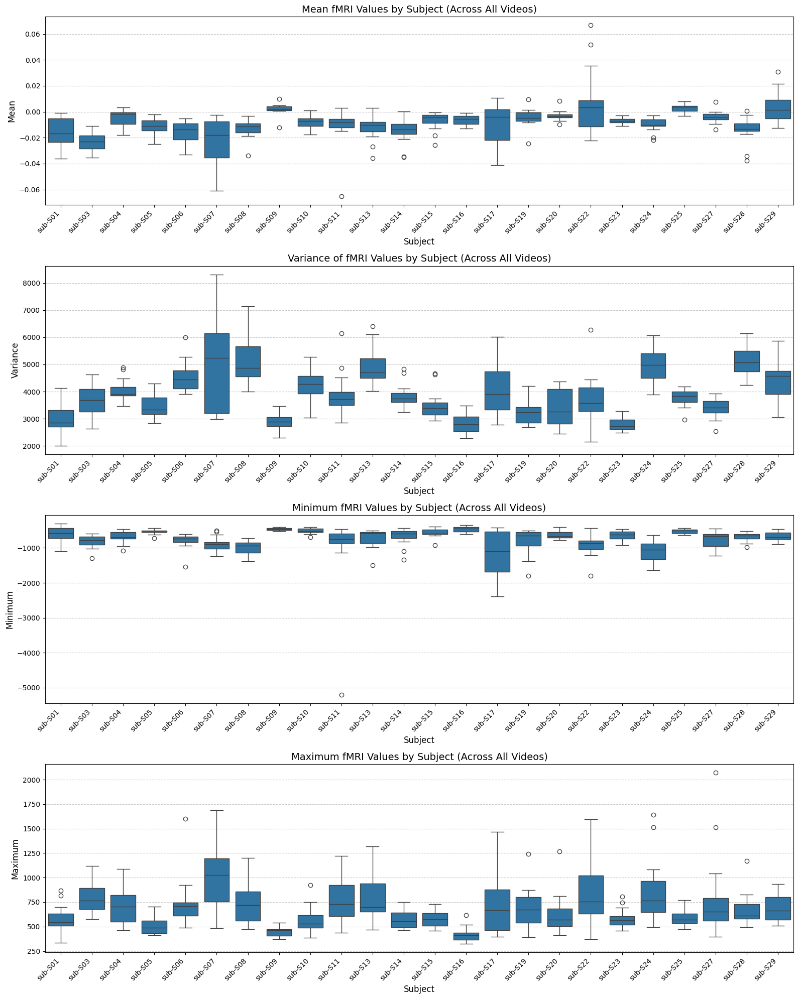

Summary statistics saved to 'outputs/filtered_fmri_statistics_summary_by_subject.csv'
Summary statistics by subject (excluding outlier subjects):
        fmri_mean                             fmri_var             \
             mean     std     min     max         mean        std   
subject                                                             
sub-S01   -0.0167  0.0123 -0.0360 -0.0009  2987.095703   563.9102   
sub-S03   -0.0231  0.0073 -0.0353 -0.0109  3648.974854   581.2200   
sub-S04   -0.0049  0.0069 -0.0178  0.0033  4043.256104   428.8030   
sub-S05   -0.0111  0.0065 -0.0248 -0.0021  3459.812744   406.0617   
sub-S06   -0.0157  0.0087 -0.0331 -0.0053  4537.931152   583.7101   
sub-S07   -0.0237  0.0193 -0.0611 -0.0023  4987.481445  1744.1700   
sub-S08   -0.0128  0.0079 -0.0339 -0.0033  5117.109375   925.0425   
sub-S09    0.0018  0.0047 -0.0121  0.0098  2905.540527   303.5502   
sub-S10   -0.0079  0.0054 -0.0175  0.0008  4198.312988   555.9064   
sub-S11   -0.0118  0.0161 

: 

In [ ]:
#from fmri_viz_utils import load_stats_data, create_boxplots_by_group, generate_summary_statistics, print_outliers

# Load the data
df = load_stats_data('subject_video_statistics.pkl')

print(df['subject'].unique())

# Filter out the unwanted subjects
excluded_subjects = ['sub-S02', 'sub-S21', 'sub-S26', 'sub-S30']
filtered_df = df[~df['subject'].isin(excluded_subjects)]

print(filtered_df.head())

# Now use the filtered DataFrame for analysis
fig, axes, outliers = create_boxplots_by_group(
    filtered_df,
    group_by='subject',
    save_path='outputs/filtered_fmri_statistics_by_subject_boxplots.png'
)
plt.show()

# Generate summary statistics for the filtered data
summary = generate_summary_statistics(
    filtered_df,
    group_by='subject',
    save_path='outputs/filtered_fmri_statistics_summary_by_subject.csv'
)
print("Summary statistics by subject (excluding outlier subjects):")
print(summary)

In [19]:
#data statistics

# Import the utility function
#from fmri_viz_utils import analyze_fmri_statistics

# First analysis - grouped by video (from your first code example)
df, video_summary, video_outliers = analyze_fmri_statistics(
    pickle_path='subject_video_statistics.pkl',
    group_by='video',
    output_dir='.',
    save_plots=True,
    save_summary=True,
    display_plots=True
)

# Second analysis - grouped by subject (from your most recent code)
df, subject_summary, subject_outliers = analyze_fmri_statistics(
    pickle_path='subject_video_statistics.pkl',
    group_by='subject',
    output_dir='.',
    save_plots=True,
    save_summary=True,
    display_plots=True
)


# Use individual functions for more control
# Load and process data
# df = load_and_process_data('subject_video_statistics.pkl')

# Create and display boxplots
# fig = create_fmri_boxplots(df, save_path='fmri_statistics_boxplots.png')
# plt.show()

# Generate summary statistics
# summary = generate_summary_statistics(df, save_path='fmri_statistics_summary_by_video.csv')
# print("Summary statistics by video:")
# print(summary)

NameError: name 'analyze_fmri_statistics' is not defined

: 

In [ ]:
#create the dataset with all subjects concatenated to train on that



: 

Loading labels from processed_data/videos/videos.npy
Start training from epoch 1 with initial loss None
Processing sub-S01 from processed_data/sub-S01/train.npy
Subject sub-S01 - Input shape: torch.Size([5407, 4609]), Label shape: torch.Size([5407, 3, 112, 112, 32])
Processing sub-S03 from processed_data/sub-S03/train.npy
Subject sub-S03 - Input shape: torch.Size([5407, 4609]), Label shape: torch.Size([5407, 3, 112, 112, 32])
Processing sub-S04 from processed_data/sub-S04/train.npy
Subject sub-S04 - Input shape: torch.Size([5407, 4609]), Label shape: torch.Size([5407, 3, 112, 112, 32])
Processing sub-S05 from processed_data/sub-S05/train.npy
Subject sub-S05 - Input shape: torch.Size([5407, 4609]), Label shape: torch.Size([5407, 3, 112, 112, 32])
Processing sub-S06 from processed_data/sub-S06/train.npy
Subject sub-S06 - Input shape: torch.Size([5407, 4609]), Label shape: torch.Size([5407, 3, 112, 112, 32])
Processing sub-S08 from processed_data/sub-S08/train.npy
Subject sub-S08 - Input 

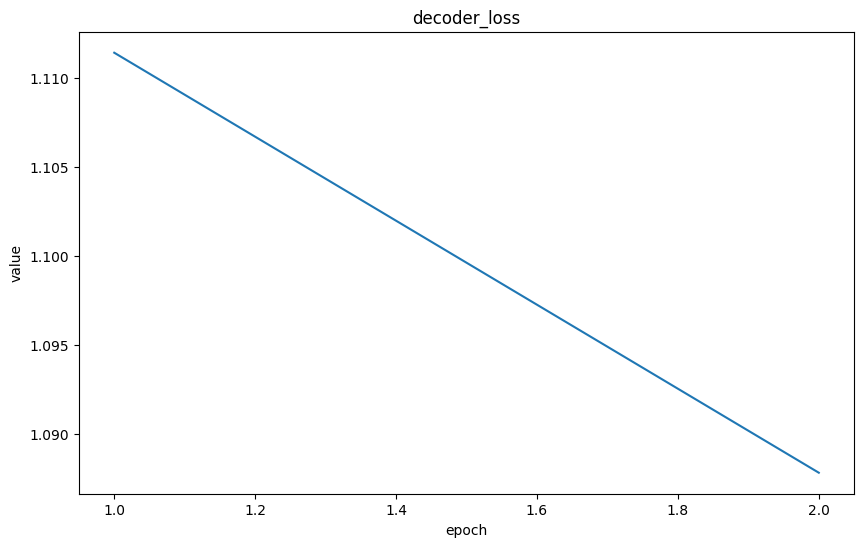

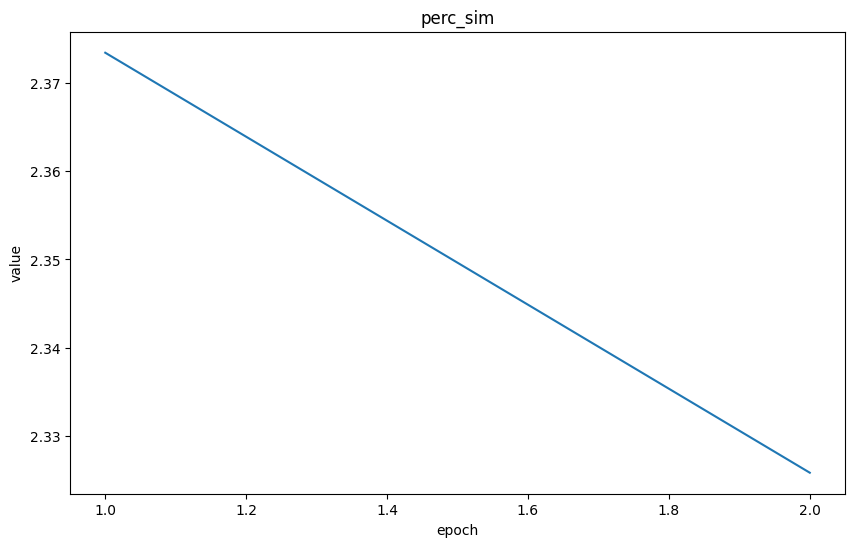

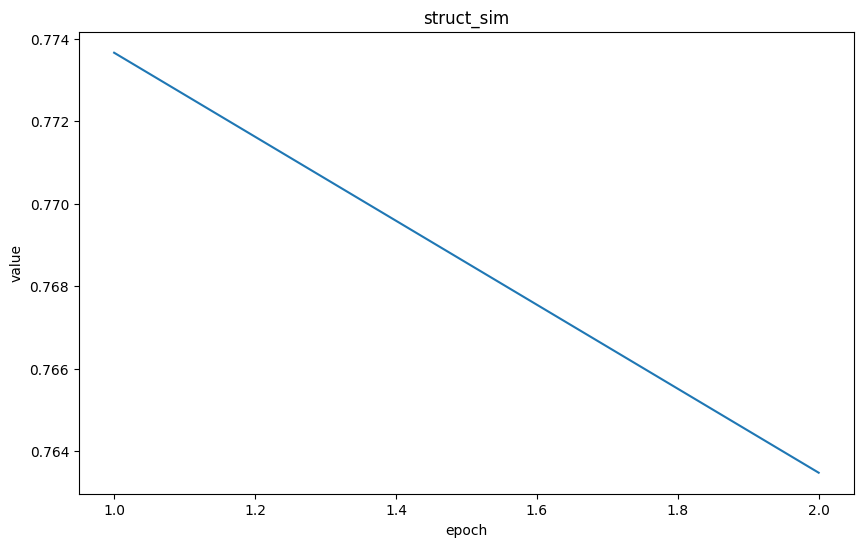

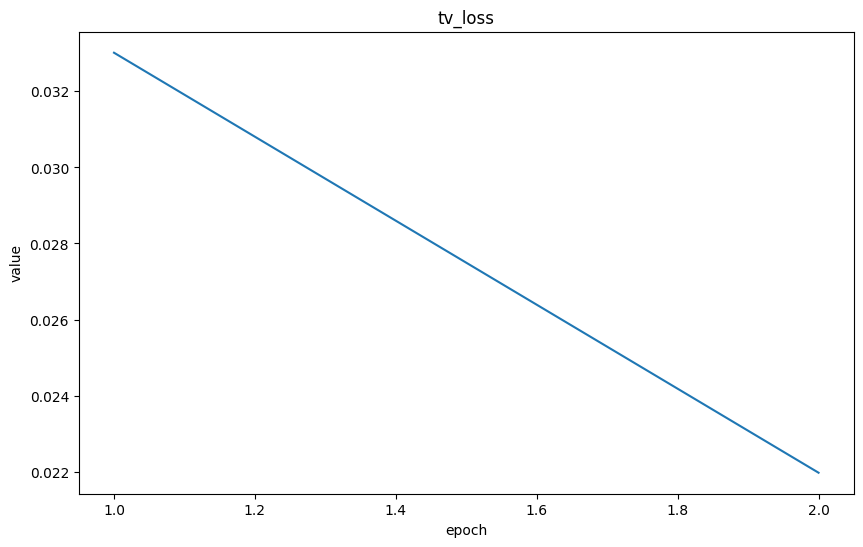

Training completed. Total time: 23.07 minutes
---


: 

In [ ]:
# train model on all subjects instead of just average

    # Setup model, criterion, optimizer, etc.
    # ...

# Training parameters
#train_label = trainset['videos']
#train_input = trainset['fMRIs']

'''lr = 1e-4
#encoder_weight = 0.5
criterion = D_Loss()
#(encoder_weight = encoder_weight)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
batch_size = 16
device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
save_model_as = 'decoder_all_4609_' + str(num_epochs)
#decoder_all meaning its trained on all subjects instead of average
pretrained_decoder = None
start_epoch = 1
start_loss = None
model_to_train = 'decoder'
display_plots = True
save_plots = True
model_name = save_model_as
    


    
    # Generate the full paths for all subjects
base_folder = "fMRIs_schaefer1000_4609"
subject_folders = [f"{base_folder}/sub-S{subject_id}" for subject_id in subject_ids]
    
    # Print the list of folders for verification
print(f"Training with {len(subject_folders)} subjects:")
for folder in subject_folders:
    print(f"  - {folder}")
    
    # Path to videos folder
videos_folder = "processed_videos"
    '''

'''
    # Train the model
model, history = train_model3(
    subject_folders=subject_folders,
    videos_folder=videos_folder,
    model=model,
    num_epochs=5,
    lr=lr,
    criterion=criterion,
    optimizer=optimizer,
    batch_size=batch_size,
    device=device,
    save_model_as=save_model_as,
    model_to_train=model_to_train,
    train_fraction=0.8,  # Use 80% of each subject's data
    test_video="YouAgain.npy"  # Optional: specify a video to exclude from training
)
'''


subject_ids = [
#    '01-norm', 
                '01', 
                '03', '04', '05', '06', 
                #'07', 
                '08', '09', '10', 
                #'11', 
                '13', '14', '15', '16', 
                #'17', 
                '19', '20', '22', '23', '24', 
                '25', '27', '28', '29', '31', '32']

# Convert to folder names format
subjects_list = [f'sub-S{subj_id}' for subj_id in subject_ids]

subjects_list.append('sub-average')
#subjects_list.append('average-norm')

# Base directory containing all subject folders
base_dir = 'processed_data'

# List of subject directories (excluding missing ones)
#subjects = [d for d in os.listdir(base_dir) if d.startswith('sub-S') and d not in ['sub-S12', 'sub-S18']]
# Or explicitly list them
# subjects = ['sub-S01', 'sub-S02', 'sub-S03', ...] # excluding sub-S12 and sub-S18

# Path to videos (labels)
videos_path = 'processed_data/videos/videos.npy'

model = Decoder(mask_size)
num_epochs = 2

lr = 1e-4
#encoder_weight = 0.5
criterion = D_Loss()
#(encoder_weight = encoder_weight)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
batch_size = 16
device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
#device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")
save_model_as = 'decoder_all_4609_' + str(num_epochs)
#decoder_all meaning its trained on all subjects instead of average
#pretrained_decoder = None
start_epoch = 1
start_loss = None
model_to_train = 'decoder'
display_plots = True
save_plots = True
model_name = save_model_as

# Call the training function (with your model and other parameters)
model, history = train_model3(
    base_dir=base_dir,
    subjects_list=subjects_list,
    videos_path=videos_path,
    model=model,  # Replace with your actual model
    num_epochs=num_epochs,    # Adjust as needed
    lr=lr,          # Adjust as needed
    criterion=criterion,  # Replace with your actual criterion
    optimizer=optimizer,  # Replace with your actual optimizer
    batch_size=batch_size,     # Adjust as needed
    device=device,
    save_model_as="/media/RCPNAS/MIP/Michael/students_work/rodrigo/decoder_all_4609_" + str(num_epochs),
#    save_model_as=save_model_as,
    model_to_train=model_to_train,  # or whichever part you're training
    display_plots=display_plots,
    save_plots=save_plots,
    model_name='decoder_all_4609_' + str(num_epochs)
)



: 

In [ ]:
#tag functions that were in other modules



def plot_all_predictions(predictions, videos, performance_dict=None, display_plots=True, save_plots=False, save_path_prefix=None, model_name=""):
    """
    Display comparison plots between original videos and multiple corresponding predictions.
    This version includes extensive debugging and a more direct approach to handling multiple inputs.
    """
    # Create output directory if it doesn't exist
    if save_plots and save_path_prefix:
        import os
        os.makedirs(save_path_prefix, exist_ok=True)

    # Debug information about inputs
    print("\n=== DEBUG INFO ===")
    print(f"Predictions dictionary contains {len(predictions)} keys: {list(predictions.keys())}")
    print(f"Videos dictionary contains {len(videos)} keys: {list(videos.keys())}")
    
    # Find the overlapping keys between predictions and videos
    common_keys = [key for key in predictions.keys() if key in videos]
    print(f"Common keys in both dictionaries: {common_keys}")
    
    # Create a mapping from prediction keys to video keys
    key_mapping = {}
    
    # If we don't have common keys, we need to find a match
    if not common_keys:
        print("No common keys found. Trying to match prediction keys to video keys based on movie names.")
        
        for pred_key in predictions.keys():
            # Extract movie name from the prediction key (assuming it's after the last underscore)
            if '_' in pred_key:
                extracted_movie = pred_key.split('_')[-1]
                if extracted_movie in videos:
                    key_mapping[pred_key] = extracted_movie
                    print(f"Matched prediction key '{pred_key}' to video key '{extracted_movie}'")
                    continue
            
            # If we couldn't extract a matching movie name, look for partial matches
            matched = False
            for video_key in videos.keys():
                # Check if the video key is part of the prediction key
                if video_key in pred_key:
                    key_mapping[pred_key] = video_key
                    print(f"Matched prediction key '{pred_key}' to video key '{video_key}' (partial match)")
                    matched = True
                    break
            
            # If no match found and we have videos, use the first video key
            if not matched and len(videos) > 0:
                default_key = list(videos.keys())[0]
                key_mapping[pred_key] = default_key
                print(f"No match found for prediction key '{pred_key}'. Using default video key '{default_key}'")
    else:
        # We have common keys, use direct mapping for those
        for key in common_keys:
            key_mapping[key] = key
        
        # For other prediction keys, try to extract movie names
        for pred_key in [k for k in predictions.keys() if k not in common_keys]:
            if '_' in pred_key:
                extracted_movie = pred_key.split('_')[-1]
                if extracted_movie in videos:
                    key_mapping[pred_key] = extracted_movie
                    continue
            
            # If no extraction worked, use the first common key
            if len(common_keys) > 0:
                key_mapping[pred_key] = common_keys[0]
            elif len(videos) > 0:
                key_mapping[pred_key] = list(videos.keys())[0]
    
    print(f"Key mapping from prediction keys to video keys: {key_mapping}")
    
    # Initialize metrics
    total_ssim, total_mse = [], []
    all_ssim = {'all': None}
    all_mse = {'all': None}
    
    # Calculate metrics for each prediction
    for pred_key, video_key in key_mapping.items():
        prediction = predictions[pred_key]
        video = videos[video_key][..., 15]  # Middle frame
        
        # Check shapes
        print(f"Prediction {pred_key} shape: {prediction.shape}")
        print(f"Video {video_key} shape: {video.shape}")
        
        # Ensure prediction and video have compatible shapes
        if prediction.shape[0] != video.shape[0]:
            print(f"Warning: Shape mismatch for {pred_key} vs {video_key}. Skipping.")
            continue
        
        N = video.shape[0]
        
        # Calculate SSIM
        try:
            ssim_frames = np.array([
                ssim(torch.from_numpy(video[i]).unsqueeze(0), 
                     torch.from_numpy(prediction[i]).unsqueeze(0), 
                     data_range=1, size_average=True).item()
                for i in range(N) 
            ])
            mean_ssim = np.mean(ssim_frames)
            print(f"SSIM for {pred_key}: Mean = {mean_ssim:.3f}")
            all_ssim[pred_key] = ssim_frames
            total_ssim = np.concatenate((total_ssim, ssim_frames))
        except Exception as e:
            print(f"Error calculating SSIM for {pred_key}: {e}")
            ssim_frames = np.zeros(N)
            all_ssim[pred_key] = ssim_frames
        
        # Calculate MSE
        try:
            mse_frames = np.array([
                F.mse_loss(normalize(torch.from_numpy(video[i])), 
                          normalize(torch.from_numpy(prediction[i]))).numpy()
                for i in range(N) 
            ])
            mean_mse = np.mean(mse_frames)
            print(f"MSE for {pred_key}: Mean = {mean_mse:.3f}")
            all_mse[pred_key] = mse_frames
            total_mse = np.concatenate((total_mse, mse_frames))
        except Exception as e:
            print(f"Error calculating MSE for {pred_key}: {e}")
            mse_frames = np.zeros(N)
            all_mse[pred_key] = mse_frames
    
    # Display metrics for each prediction source
    from collections import defaultdict
    import pandas as pd
    
    # Track metrics for each prediction source
    source_metrics = defaultdict(lambda: {"ssim": [], "mse": [], "tv": []})
    
    # Fill source_metrics with data from all_ssim and all_mse
    for pred_key in all_ssim:
        if pred_key != 'all' and all_ssim[pred_key] is not None:
            source_metrics[pred_key]["ssim"] = all_ssim[pred_key]
        if pred_key != 'all' and all_mse[pred_key] is not None:
            source_metrics[pred_key]["mse"] = all_mse[pred_key]
    
    # Organize prediction keys in the desired order
    # First, separate original and slice keys
    original_key = None
    slice_keys = []
    other_keys = []
    
    for pred_key in key_mapping.keys():
        if 'original' in pred_key:
            original_key = pred_key
        elif 'slice_' in pred_key:
            slice_keys.append(pred_key)
        else:
            other_keys.append(pred_key)
    
    # Sort slice keys to ensure consistent order based on slice number
    def get_slice_num(key):
        try:
            # Extract the number after "slice_"
            # For "slice_13_combined", this would extract 13
            return int(key.split('_')[1])
        except (IndexError, ValueError):
            return float('inf')  # Default high value if we can't parse
    
    slice_keys.sort(key=get_slice_num)
    
    # Combine keys in desired order: original, then slices, then others
    ordered_keys = []
    if original_key:
        ordered_keys.append(original_key)
    ordered_keys.extend(slice_keys)
    ordered_keys.extend(other_keys)
    
    print("\nFinal display order:")
    for key in ordered_keys:
        print(f" - {key}")
    
    # Display detailed metrics for each prediction source
    print("\n=== DETAILED METRICS FOR EACH PREDICTION SOURCE ===")
    
    # Group prediction keys by movie
    movie_groups = defaultdict(list)
    for pred_key, video_key in key_mapping.items():
        movie_groups[video_key].append(pred_key)
    
    # Process each movie group
    for video_key, pred_keys in movie_groups.items():
        print(f"\n=== Movie: {video_key} ===")
        print(f"Analyzing {len(pred_keys)} prediction sources: {pred_keys}")
        
        # Get ground truth video
        video = videos[video_key][..., 15]  # Middle frame
        N = video.shape[0]
        
        # Create a DataFrame to store metrics
        metrics_df = pd.DataFrame(index=range(N))
        
        # Calculate TV loss for each prediction
        for pred_key in pred_keys:
            if pred_key not in predictions:
                continue
                
            prediction = predictions[pred_key]
            
            # Ensure prediction and video have compatible shapes
            if prediction.shape[0] != video.shape[0]:
                print(f"Warning: Shape mismatch for {pred_key} vs {video_key}. Skipping.")
                continue
            
            # Calculate TV loss for each frame
            tv_frames = []
            for i in range(N):
                try:
                    # Get normalized prediction
                    pred_frame = prediction[i]
                    norm_pred = normalize(pred_frame)
                    if hasattr(norm_pred, 'numpy'):
                        norm_pred = norm_pred.numpy()
                    
                    # Calculate TV loss
                    x_diff = np.abs(norm_pred[..., 1:, :] - norm_pred[..., :-1, :]).sum()
                    y_diff = np.abs(norm_pred[..., 1:] - norm_pred[..., :-1]).sum()
                    tv_val = (x_diff + y_diff) / norm_pred.size
                    tv_frames.append(tv_val)
                except Exception as e:
                    print(f"Error calculating TV loss for frame {i}: {e}")
                    tv_frames.append(0)
            
            # Add to source_metrics
            source_metrics[pred_key]["tv"] = np.array(tv_frames)
            
            # Add to DataFrame
            if pred_key in all_ssim:
                metrics_df[f"{pred_key}_SSIM"] = all_ssim[pred_key]
            if pred_key in all_mse:
                metrics_df[f"{pred_key}_MSE"] = all_mse[pred_key]
            metrics_df[f"{pred_key}_TV"] = tv_frames
        
        # Calculate summary statistics
        summary = pd.DataFrame()
        for column in metrics_df.columns:
            if metrics_df[column].isnull().all():  # Skip columns with all NaN values
                continue
            summary.loc['Mean', column] = metrics_df[column].mean()
            summary.loc['Median', column] = metrics_df[column].median()
            summary.loc['Std Dev', column] = metrics_df[column].std()
            summary.loc['Min', column] = metrics_df[column].min()
            summary.loc['Max', column] = metrics_df[column].max()
        
        # Print summary statistics
        print("\nSummary Statistics:")
        print(summary.round(4))
        
        # Print detailed metrics for a sample of frames
        sample_size = min(5, N)  # Show at most 5 frames
        sample_indices = np.linspace(0, N-1, sample_size, dtype=int)
        
        print(f"\nDetailed Metrics for {sample_size} Sample Frames:")
        sample_df = metrics_df.iloc[sample_indices].round(4)
        print(sample_df)
        
        # Save results if requested
        if save_plots and save_path_prefix:
            import os
            os.makedirs(save_path_prefix, exist_ok=True)
            
            # Save detailed metrics
            detailed_path = f"{save_path_prefix}{video_key}_{model_name}_detailed_metrics.csv"
            metrics_df.to_csv(detailed_path)
            
            # Save summary
            summary_path = f"{save_path_prefix}{video_key}_{model_name}_summary_metrics.csv"
            summary.to_csv(summary_path)
            
            print(f"Saved metrics to {detailed_path} and {summary_path}")
    
    # Display overall ranking of prediction sources
    print("\n=== OVERALL RANKING OF PREDICTION SOURCES ===")
    
    # Prepare data for ranking
    ranking_data = []
    for pred_key in all_ssim:
        # Skip 'all' key or any None values
        if pred_key == 'all' or all_ssim[pred_key] is None or all_mse[pred_key] is None:
            continue
            
        # Get or calculate TV mean if available
        tv_mean = np.mean(source_metrics[pred_key]["tv"]) if pred_key in source_metrics and len(source_metrics[pred_key]["tv"]) > 0 else 0
            
        ranking_data.append({
            'Source': pred_key,
            'Mean SSIM': np.mean(all_ssim[pred_key]),
            'Median SSIM': np.median(all_ssim[pred_key]),
            'Mean MSE': np.mean(all_mse[pred_key]),
            'Median MSE': np.median(all_mse[pred_key]),
            'Mean TV': tv_mean
        })
    
    # Create and sort DataFrame (skip if no data)
    if ranking_data:
        ranking_df = pd.DataFrame(ranking_data)
        ranking_df = ranking_df.sort_values(by='Mean SSIM', ascending=False)
        
        print(ranking_df.round(4))
        
        # Save ranking if requested
        if save_plots and save_path_prefix:
            ranking_path = f"{save_path_prefix}prediction_sources_ranking_{model_name}.csv"
            ranking_df.to_csv(ranking_path, index=False)
            print(f"Saved ranking to {ranking_path}")
    else:
        print("No valid prediction sources to rank.")
    

    '''
    # Plot metrics comparison
    if display_plots and total_ssim.size > 0:
        # Get ordered data for bar charts
        sources_display = []
        ssim_means = []
        mse_means = []
        tv_means = []
        
        for pred_key in ordered_keys:
            if pred_key in source_metrics:
                # Create display name
                display_name = pred_key.replace('_combined', '_off')
                if display_name.startswith('original_'):
                    display_name = display_name.replace('original_off', 'original_reconstruction')
                
                sources_display.append(display_name)
                ssim_means.append(np.mean(source_metrics[pred_key]["ssim"]))
                mse_means.append(np.mean(source_metrics[pred_key]["mse"]))
                tv_means.append(np.mean(source_metrics[pred_key]["tv"]) if len(source_metrics[pred_key]["tv"]) > 0 else 0)
        
        # Create the bar chart
        plt.figure(figsize=(12, 4))
        
        # Plot SSIM
        plt.subplot(1, 3, 1)
        plt.bar(sources_display, ssim_means, color='green', alpha=0.7)
        plt.xlabel('Prediction Source')
        plt.ylabel('SSIM')
        plt.title('Average SSIM')
        plt.xticks(rotation=45, ha='right')
        
        # Plot MSE
        plt.subplot(1, 3, 2)
        plt.bar(sources_display, mse_means, color='red', alpha=0.7)
        plt.xlabel('Prediction Source')
        plt.ylabel('MSE')
        plt.title('Average MSE')
        plt.xticks(rotation=45, ha='right')
        
        # Plot TV Loss
        plt.subplot(1, 3, 3)
        plt.bar(sources_display, tv_means, color='blue', alpha=0.7)
        plt.xlabel('Prediction Source')
        plt.ylabel('TV Loss')
        plt.title('Average TV Loss')
        plt.xticks(rotation=45, ha='right')
        
        plt.tight_layout()
        
        # Save metrics comparison if requested
        if save_plots and save_path_prefix:
            metrics_path = f"{save_path_prefix}metrics_bar_comparison_{model_name}.png"
            plt.savefig(metrics_path, bbox_inches='tight', dpi=300)
        
        plt.show()'''


    # Plot metrics comparison
    if display_plots and total_ssim.size > 0:
        # Get ordered data for boxplots
        sources_display = []
        ssim_data = []
        mse_data = []
        tv_data = []
        
        for pred_key in ordered_keys:
            if pred_key in source_metrics:
                # Create display name
                display_name = pred_key.replace('_combined', '_off')
                if display_name.startswith('original_'):
                    display_name = display_name.replace('original_off', 'original_reconstruction')
                
                sources_display.append(display_name)
                ssim_data.append(source_metrics[pred_key]["ssim"])
                mse_data.append(source_metrics[pred_key]["mse"])
                tv_data.append(source_metrics[pred_key]["tv"] if len(source_metrics[pred_key]["tv"]) > 0 else [0])
        
        # Create the boxplot
        plt.figure(figsize=(12, 4))
        
        # Plot SSIM
        plt.subplot(1, 3, 1)
        plt.boxplot(ssim_data, labels=sources_display)
        plt.xlabel('Prediction Source')
        plt.ylabel('SSIM')
        plt.title('SSIM Distribution')
        plt.xticks(rotation=45, ha='right')
        
        # Plot MSE
        plt.subplot(1, 3, 2)
        plt.boxplot(mse_data, labels=sources_display)
        plt.xlabel('Prediction Source')
        plt.ylabel('MSE')
        plt.title('MSE Distribution')
        plt.xticks(rotation=45, ha='right')
        
        # Plot TV Loss
        plt.subplot(1, 3, 3)
        plt.boxplot(tv_data, labels=sources_display)
        plt.xlabel('Prediction Source')
        plt.ylabel('TV Loss')
        plt.title('TV Loss Distribution')
        plt.xticks(rotation=45, ha='right')
        
        plt.tight_layout()
        
        # Save metrics comparison if requested
        if save_plots and save_path_prefix:
            metrics_path = f"{save_path_prefix}metrics_boxplot_comparison_{model_name}.png"
            plt.savefig(metrics_path, bbox_inches='tight', dpi=300)
        
        plt.show()

    
    # Plot frame comparisons
    if display_plots and len(key_mapping) > 0:
        # Get a reference video key and shape
        ref_video_key = list(videos.keys())[0]
        ref_video = videos[ref_video_key][..., 15]
        N = ref_video.shape[0]
        
        # For large videos, sample frames
        if N > 10:
            indices = np.linspace(0, N-1, 10, dtype=int)
        else:
            indices = np.arange(N)
#        indices = np.arange(N)
        
        print(f"\nPlotting {len(indices)} sample frames with metrics")
        
        # Number of rows and columns
        n_rows = len(indices)
        n_cols = 1 + len(ordered_keys)  # Original + each prediction
        
        # Create a figure with extra space for metrics summaries
        plt.figure(figsize=(4 * n_cols, 5.5 * n_rows))  # Increased height for more space between rows
        
        # Plot each frame
        for i, frame_idx in enumerate(indices):
            # Plot original frame (ground truth)
            ax = plt.subplot(n_rows, n_cols, i * n_cols + 1)
            plt.imshow(np.transpose(normalize(ref_video[frame_idx]), (1, 2, 0)))
            plt.title(f"Original Frame {frame_idx}")
            plt.axis('off')
            
            # Plot each prediction in our ordered list
            for j, pred_key in enumerate(ordered_keys, 1):
                try:
                    if pred_key not in predictions:
                        continue
                        
                    video_key = key_mapping[pred_key]
                    pred_frame = predictions[pred_key][frame_idx]
                    ax = plt.subplot(n_rows, n_cols, i * n_cols + j + 1)
                    plt.imshow(np.transpose(normalize(pred_frame), (1, 2, 0)))
                    
                    # Add metrics to title if available
                    ssim_val = all_ssim[pred_key][frame_idx] if pred_key in all_ssim and frame_idx < len(all_ssim[pred_key]) else 0
                    mse_val = all_mse[pred_key][frame_idx] if pred_key in all_mse and frame_idx < len(all_mse[pred_key]) else 0
                    tv_val = source_metrics[pred_key]["tv"][frame_idx] if pred_key in source_metrics and frame_idx < len(source_metrics[pred_key]["tv"]) else 0
                    
                    # Create display name
                    display_name = pred_key.replace('_combined', '_off')
                    # Special case for original
                    if display_name.startswith('original_'):
                        display_name = display_name.replace('original_off', 'original_reconstruction')
                    
                    plt.title(f"{display_name}\nSSIM: {ssim_val:.3f}, MSE: {mse_val:.3f}\nTV: {tv_val:.3f}")
                    plt.axis('off')
                except Exception as e:
                    print(f"Error plotting prediction {pred_key} for frame {frame_idx}: {e}")
        
        # Add metrics summary below the rows
        for j, pred_key in enumerate(ordered_keys, 1):
            # Position the text at the bottom of the image
            if pred_key in source_metrics:
                mean_ssim = np.mean(source_metrics[pred_key]["ssim"])
                mean_mse = np.mean(source_metrics[pred_key]["mse"])
                mean_tv = np.mean(source_metrics[pred_key]["tv"]) if len(source_metrics[pred_key]["tv"]) > 0 else 0
                
                # Create display name
                display_name = pred_key.replace('_combined', '_off')
                # Special case for original
                if display_name.startswith('original_'):
                    display_name = display_name.replace('original_off', 'original_reconstruction')
                
                # Place text below all rows
                plt.figtext(
                    (j+1) * (1/n_cols), 0.01, 
                    f"{display_name} Summary:\nMean SSIM: {mean_ssim:.3f}\nMean MSE: {mean_mse:.3f}\nMean TV Loss: {mean_tv:.3f}", 
                    fontsize=10, ha='center', va='bottom'
                )
        
        plt.tight_layout(rect=[0, 0.05, 1, 0.98])  # Adjusted to leave more space at bottom
        
        # Add overall title with metrics comparison
        plt.suptitle("Frame Comparison with Metrics", fontsize=16, y=0.99)
        
        # Save frames comparison plot if requested
        if save_plots and save_path_prefix:
            frames_path = f"{save_path_prefix}frames_comparison_{model_name}.png"
            plt.savefig(frames_path, bbox_inches='tight', dpi=300)
        
        plt.show()
    
    # Update performance dictionary if provided
    if performance_dict:
        try:
            performance_dict['mean_ssim_D'], performance_dict['median_ssim_D'] = plot_scatter_metrics(all_ssim, 'SSIM', display_plots)
            performance_dict['mean_mse_D'], performance_dict['median_mse_D'] = plot_scatter_metrics(all_mse, 'MSE', display_plots)
        except Exception as e:
            print(f"Error updating performance dictionary: {e}")
    
    return performance_dict



def test_model_all(inputs_dict, labels_dict, model, criterion, device, pretrained_decoder=None, model_to_test=None, statistical_testing=False, display_plots=True, save_plots=False, model_name=""):
    """
    Test the pretrained model on the provided dataset.

    Arguments:
        inputs_dict (dict): Dictionary of input data. Keys are movie names or slice identifiers. 
                           If model_to_test is 'encoder' or 'encoder_decoder', then elements have a shape of (TR, 3, 112, 112, 32). 
                           Else, shape of (TR, mask_size).
        labels_dict (dict): Dictionary of labels. Keys are movie names. 
                           If model_to_test is 'encoder' or 'encoder_decoder', then elements have a shape of (TR, mask_size). 
                           Else, shape of (TR, 3, 112, 112, 32).
        model (nn.Module): The pretrained neural network model to be tested.
        criterion (nn.Module): Loss function for testing.
        device (torch.device): Device to test the model on (CPU or GPU).
        pretrained_decoder (str, optional): Path to a pretrained decoder model. Default is None.
        model_to_test (str): Specifies which part of the model to test. Options are 'encoder', 'decoder', or 'encoder_decoder'.
        statistical_testing (bool, optional): Whether to perform statistical testing. Default is False.
        display_plots (bool, optional): Whether to display plots. Default is True.
        save_plots (bool, optional): Whether to save plots. Default is False.
        model_name (str, optional): Name of the model for saving plots. Default is "".

    Returns:
        results (dict): Dictionary containing test results including model predictions and losses.
    """
    print('Start testing:')
    tic = time.time()

    # Create outputs directory if it doesn't exist
    if save_plots:
        import os
        os.makedirs('outputs', exist_ok=True)

    model_type = ['encoder', 'decoder', 'encoder_decoder']
    if model_to_test not in model_type:
        print(f'model_to_test: {model_to_test} not recognized. Must be one of {model_type}')
        return None, None

    # Get list of input keys (movie names or slice identifiers)
    videos = list(inputs_dict.keys())
    inputs_shape = list(inputs_dict[videos[0]].shape)
    inputs_shape[0] = 'TR'
    print(f'### Testing {model_to_test} on inputs of shape {inputs_shape} over {len(videos)} videos/slices ###')

    criterion = criterion.to(device)
    # Set model in testing phase
    model.to(device)
    model.eval()

    # Load and set pretrained decoder if specified
    if pretrained_decoder:
        decoder = Decoder(labels_dict[next(iter(labels_dict))].shape[1])  # Assuming shape is consistent across labels
        state_dict = torch.load(pretrained_decoder)
        decoder.load_state_dict(state_dict)
        decoder.to(device)
        for param in decoder.parameters():
            param.requires_grad = False
        decoder.eval()

        print(f'Also using pretrained decoder {pretrained_decoder}')

    if model_to_test != 'encoder_decoder' and pretrained_decoder is None:
        results = {
            model_to_test + '_predictions': {},
            'total_losses': {}
        }
    else:
        results = {
            'encoder_predictions': {},
            'decoder_predictions': {},
            'total_losses': {}
        }

        decoder_saliency = np.zeros(labels_dict[list(labels_dict.keys())[0]].shape[1])

    results['test_performance'] = {}
    
    # Process each item in the inputs and labels dictionaries
    for key in inputs_dict.keys():
        input_tensor = torch.from_numpy(inputs_dict[key].astype('float32'))
        
        # Get the corresponding label - if it's a slice name, extract the original movie name
        if key in labels_dict:
            label_key = key
        else:
            # Extract the movie name from the key (assumed to be after the last underscore)
            # For keys like "slice_0_Payload", this will extract "Payload"
            if '_' in key:
                extracted_movie = key.split('_')[-1]
                if extracted_movie in labels_dict:
                    label_key = extracted_movie
                    print(f"Input key '{key}' not found in labels. Extracted and using '{label_key}' for labels.")
                else:
                    # If extracted name not found, use first available label
                    label_key = list(labels_dict.keys())[0]
                    print(f"Input key '{key}' and extracted movie '{extracted_movie}' not found in labels. Using '{label_key}' for labels.")
            else:
                # If no underscore in key, use first available label
                label_key = list(labels_dict.keys())[0]
                print(f"Input key '{key}' not found in labels and no movie name could be extracted. Using '{label_key}' for labels.")
        
        label_tensor = torch.from_numpy(labels_dict[label_key].astype('float32'))

        # Debug info about tensors but without using print_dict_tree
        print(f"input_tensor shape: {input_tensor.shape}, dtype: {input_tensor.dtype}")
        print(f"label_tensor shape: {label_tensor.shape}, dtype: {label_tensor.dtype}")
        
        test_set = torch.utils.data.TensorDataset(input_tensor, label_tensor)
        test_loader = torch.utils.data.DataLoader(
            test_set,
            batch_size=16,
            shuffle=False,
            pin_memory=torch.cuda.is_available(),
            num_workers=4
        )

        model_outputs, decoder_outputs, total_losses = [], [], []
        with torch.no_grad():
            for input, label in test_loader:
                input, label = input.to(device), label.to(device)
            
                decoder_output = None
                if model_to_test == 'encoder_decoder':
                    model_output, decoder_output = model(input.float())
                elif pretrained_decoder:
                    model_output = model(input.float()).to(device)
                    decoder_output = decoder(model_output.float())
                else:
                    model_output = model(input.float())
                        
                model_outputs.append(model_output.detach().cpu())
                if decoder_output is not None:
                    decoder_outputs.append(decoder_output.detach().cpu())
            
                # Apply the appropriate criterion based on the presence of decoder outputs
                if model_to_test == 'decoder':
                    *loss_metrics, total_loss, metrics_names = criterion(model_output, label[..., 15])          #--> middle frame
                elif decoder_output is None:
                    *loss_metrics, total_loss, metrics_names = criterion(model_output, label)
                else:
                    *loss_metrics, total_loss, metrics_names = criterion(model_output, label, decoder_output, input[..., 15])
                
                total_losses.append(total_loss.item())

        # Store the outputs in results
        if model_to_test != 'encoder_decoder' and pretrained_decoder is None:
            results[model_to_test + '_predictions'][key] = torch.cat(model_outputs, dim=0).numpy()
        else:
            results['encoder_predictions'][key] = torch.cat(model_outputs, dim=0).numpy()
            results['decoder_predictions'][key] = torch.cat(decoder_outputs, dim=0).numpy()
        
        results['total_losses'][key] = np.asarray(total_losses)

        if model_to_test != 'decoder':
            encoded = results['encoder_predictions'][key]
            labels = labels_dict[label_key] if key not in labels_dict else labels_dict[key]
            plot_metrics(labels, encoded, key, plot_TR=False, performance_dict=None, 
                        display_plots=display_plots,
                        save_plots=save_plots,
                        save_path=f'outputs/{key}_{model_name}.png' if save_plots else None)

    if model_to_test != 'decoder':
        all_encoded = results['encoder_predictions']
        all_labels = labels_dict
        # Using the last processed key for display
        results['test_performance'] = plot_metrics(labels, encoded, key, plot_TR=False, performance_dict=None, 
                        display_plots=display_plots,
                        save_plots=save_plots,
                        save_path=f'outputs/{key}_{model_name}.png' if save_plots else None)

        if statistical_testing:
            all_labels, all_predictions = [], []
            for key in labels_dict.keys():
                if key in results['encoder_predictions']:
                    all_predictions.append(results['encoder_predictions'][key])
                    all_labels.append(labels_dict[key])
            all_predictions = np.concatenate(all_predictions, axis=0)
            all_labels = np.concatenate(all_labels, axis=0)
            one_sample_permutation_test(all_labels, all_predictions)

    if model_to_test != 'encoder' or pretrained_decoder is not None:
        if model_to_test == 'decoder':
            # Pass all decoder predictions to plot_all_predictions
            results['test_performance'] = plot_all_predictions(
                results['decoder_predictions'], labels_dict, 
                results['test_performance'], display_plots,
                save_plots=save_plots,
                save_path_prefix='outputs/' if save_plots else None,
                model_name=model_name)
        else:
            # For encoder or encoder_decoder, use inputs_dict for ground truth
            results['test_performance'] = plot_all_predictions(
                results['decoder_predictions'], inputs_dict, 
                results['test_performance'], display_plots,
                save_plots=save_plots,
                save_path_prefix='outputs/' if save_plots else None,
                model_name=model_name)
        
    if model_to_test == 'encoder_decoder':
        with torch.enable_grad():
            for key in inputs_dict.keys():
                predicted_fMRIs = torch.from_numpy(results['encoder_predictions'][key])
                # Get corresponding input for ground truth
                if key in inputs_dict:
                    input_key = key
                else:
                    # Use first input if key not found
                    input_key = list(inputs_dict.keys())[0]
                
                ground_truth_frames = torch.from_numpy(inputs_dict[input_key][..., 15])
                for i in range(predicted_fMRIs.shape[0]):
                    decoder_saliency += compute_saliency(model.decoder, predicted_fMRIs[i:i+1], ground_truth_frames[i:i+1], device)

        if display_plots:
            plot_saliency_distribution(decoder_saliency)
        results['decoder_saliency'] = decoder_saliency

    print("tag print")
    print("Testing completed. Total time: {:.2f} minutes".format((time.time() - tic) / 60))
    print('---')
    return results

: 

/tmp/ipykernel_767605/1999462493.py:148: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('hsv', len(regions_in_slice) + 1)


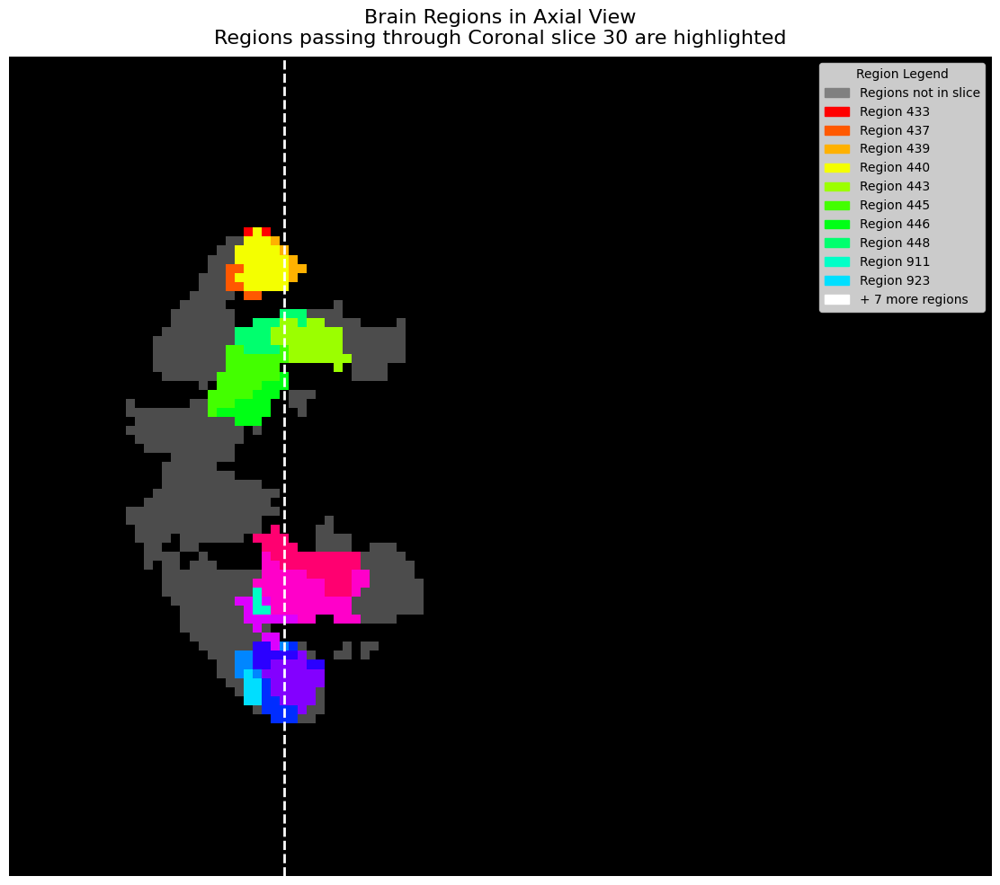

Found 17 regions passing through Coronal slice 30


: 

In [ ]:

#mask functions
#now all in perturbation.py



import numpy as np
import matplotlib.pyplot as plt
import colorsys
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm

'''
def load_and_reshape_data(file_path):
    regions_2d = np.load(file_path, mmap_mode='r')
    regions_3d = regions_2d.reshape(91, 109, 91)
    return regions_3d

def get_unique_regions(data_3d):
    unique_regions = np.unique(data_3d)
    # Filter out zero (background)
    unique_regions = unique_regions[unique_regions > 0]
    return unique_regions

def analyze_regions_by_slice(data_3d, axis=1):
    """
    Determine which regions appear in each slice along the specified axis
    
    Parameters:
    data_3d: 3D numpy array of region IDs
    axis: Axis along which to take slices (0=sagittal, 1=coronal, 2=axial)
    
    Returns:
    List where each element contains the regions in that slice
    """
    num_slices = data_3d.shape[axis]
    regions_by_slice = []
    
    for i in range(num_slices):
        if axis == 0:
            slice_data = data_3d[i, :, :]
        elif axis == 1:
            slice_data = data_3d[:, i, :]
        else:  # axis == 2
            slice_data = data_3d[:, :, i]
        
        # Get unique regions in this slice (excluding 0/background)
        unique_in_slice = np.unique(slice_data)
        unique_in_slice = unique_in_slice[unique_in_slice > 0]
        
        regions_by_slice.append(unique_in_slice)
    
    return regions_by_slice

def calculate_region_extents(data_3d, all_regions=None):
    """
    Calculate the posterior-most and anterior-most slice for each region
    
    Parameters:
    data_3d: 3D numpy array of region IDs
    all_regions: Optional list of region IDs to analyze (if None, all regions are analyzed)
    
    Returns:
    Dictionary mapping region IDs to (posterior_slice, anterior_slice) indices
    """
    # If not provided, get all unique regions
    if all_regions is None:
        all_regions = get_unique_regions(data_3d)
    
    # Get regions by coronal slice
    coronal_regions = analyze_regions_by_slice(data_3d, axis=1)
    
    # Find posterior and anterior extents for each region
    region_extent = {}
    
    for region in all_regions:
        posterior_slice = None
        anterior_slice = None
        
        # Check each slice for this region
        for slice_idx in range(len(coronal_regions)):
            if region in coronal_regions[slice_idx]:
                # If first occurrence, set posterior slice
                if posterior_slice is None:
                    posterior_slice = slice_idx
                # Always update anterior slice to the latest occurrence
                anterior_slice = slice_idx
        
        if posterior_slice and anterior_slice:
            region_extent[region] = (posterior_slice, anterior_slice)
    
    return region_extent

def get_regions_passing_through_slice(region_extent, slice_idx):
    """
    Find all regions that pass through a given slice
    
    Parameters:
    region_extent: Dictionary mapping region IDs to (posterior, anterior) slice indices
    slice_idx: Slice index to check
    
    Returns:
    List of region IDs that pass through the specified slice
    """
    passing_regions = []
    
    for region, (posterior, anterior) in region_extent.items():
        if posterior <= slice_idx <= anterior:
            passing_regions.append(region)
    
    return passing_regions  #   <---

def highlight_regions_in_slice(data_3d, slice_idx, axis=1, title=None, figsize=(12, 10)):
    """
    Visualize all brain regions in axial view, with regions passing through
    a specified slice highlighted in color, and others in grayscale.
    
    Parameters:
    data_3d: 3D numpy array of region IDs
    slice_idx: The slice index to analyze
    axis: The axis for the slice (0=sagittal, 1=coronal, 2=axial)
    title: Optional custom title
    figsize: Figure size as (width, height) tuple
    
    Returns:
    numpy array of region IDs that pass through the specified slice
    """
    # Calculate region extents
    region_extent = calculate_region_extents(data_3d)
    
    # Get regions passing through this slice
    regions_in_slice = get_regions_passing_through_slice(region_extent, slice_idx)
    
    # Get slice name for title
    slice_name = ["Sagittal", "Coronal", "Axial"][axis]
    
    # Axial projection of the entire brain
    whole_brain_axial = np.max(data_3d, axis=2)
    
    # RGB
    colored_image = np.zeros((*whole_brain_axial.shape, 3))
    
    # Use gray for regions not in the slice
    other_regions_mask = (whole_brain_axial > 0)
    for i in range(3):  # RGB channels
        colored_image[:,:,i] = np.where(other_regions_mask, 0.3, 0)  # Dark gray
    
    
    
    # Get a colormap with enough colors for all regions in the slice
    colormap = cm.get_cmap('hsv', len(regions_in_slice) + 1)
    
    # Assign different colors to regions in the slice
    for i, region in enumerate(regions_in_slice):
        # Create a mask for this region in axial projection
        region_mask = np.max(data_3d == region, axis=2)
        color = colormap(i)[:3]  # RGB values of the color
        
        # Apply this color to the region
        for j in range(3):  # RGB channels
            colored_image[:,:,j] = np.where(region_mask, color[j], colored_image[:,:,j])
    
    # Create the visualization
    plt.figure(figsize=figsize)
    
    # Use custom title if provided, otherwise use default
    if title:
        plt.suptitle(title, fontsize=16)
    else:
        plt.suptitle(f"Brain Regions in Axial View\nRegions passing through {slice_name} slice {slice_idx} are highlighted", fontsize=16)
    
    # Main plot - axial view with highlighted regions
    plt.imshow(colored_image, origin='lower')
    plt.axis('off')
    
    # Add a dotted line to show the slice location
    if axis == 0:  # Sagittal slice (vertical line in axial view)
        plt.axvline(x=slice_idx, color='white', linestyle='--', linewidth=2)
    elif axis == 1:  # Coronal slice (horizontal line in axial view)
        plt.axvline(x=slice_idx, color='white', linestyle='--', linewidth=2)
    # No line needed for axial slice since we're already in axial view
    
    # Create a custom legend
    handles = []
    labels = []
    
    # Add a gray box for all other regions
    handles.append(plt.Rectangle((0,0), 1, 1, color='gray'))
    labels.append("Regions not in slice")
    
    # Add colored boxes for regions in the slice
    # Limit to max 10 regions in legend to avoid overcrowding
    legend_limit = min(10, len(regions_in_slice))
    for i in range(legend_limit):
        handles.append(plt.Rectangle((0,0), 1, 1, color=colormap(i)[:3]))
        labels.append(f"Region {regions_in_slice[i]}")
    
    if len(regions_in_slice) > legend_limit:
        handles.append(plt.Rectangle((0,0), 1, 1, color='white'))
        labels.append(f"+ {len(regions_in_slice) - legend_limit} more regions")
    
    plt.legend(handles, labels, loc='upper right', title="Region Legend", fontsize=10)
    
    plt.tight_layout()
    plt.show()
    
    print(f"Found {len(regions_in_slice)} regions passing through {slice_name} slice {slice_idx}")
    
    return regions_in_slice

def get_sorted_regions_by_posterior_extent(data_3d, limit=None):
    """
    Get regions sorted by their posterior-most slice (from back to front)
    
    Parameters:
    data_3d: 3D numpy array of region IDs
    limit: Optional limit to return only the N most posterior regions
    
    Returns:
    List of (region_id, (posterior_slice, anterior_slice)) tuples
    """
    region_extent = calculate_region_extents(data_3d)
    
    # Sort regions by their posterior-most slice (from back to front)
    sorted_regions = sorted(region_extent.items(), key=lambda x: x[1][0])
    
    if limit:
        return sorted_regions[:limit]
    return sorted_regions

def plot_multiple_posterior_regions(data_3d, num_regions=5, figsize=(15, 10)):
    """
    Plot the most posterior regions in the brain
    
    Parameters:
    data_3d: 3D numpy array of region IDs
    num_regions: Number of most posterior regions to highlight
    figsize: Figure size as (width, height) tuple
    
    Returns:
    List of the most posterior region IDs
    """
    # Get the most posterior regions
    sorted_regions = get_sorted_regions_by_posterior_extent(data_3d, limit=num_regions)
    most_posterior_regions = [region for region, _ in sorted_regions]
    
    # Print information about these regions
    print(f"{num_regions} most posterior regions:")
    for i, (region, (posterior, anterior)) in enumerate(sorted_regions):
        print(f"{i+1}. Region {region} - spans from coronal slice {posterior} to {anterior}")
    
    # Create subplots for individual regions
    plt.figure(figsize=figsize)
    plt.suptitle(f"{num_regions} Most Posterior Regions - Axial View", fontsize=16)
    
    for i, region in enumerate(most_posterior_regions):
        # Create mask for this region
        region_mask = (data_3d == region)
        
        # Create a binary version for this region
        region_data = np.zeros_like(data_3d)
        region_data[region_mask] = 1
        
        # Project along z-axis for axial view
        axial_projection = np.max(region_data, axis=2)
        
        # Subplot
        plt.subplot(2, 3, i+1)
        plt.imshow(axial_projection, cmap='hot', origin='lower')
        plt.title(f'Region {region}', fontsize=14)
        plt.axis('off')
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)  # Make room for suptitle
    plt.show()
    
    # Create a combined view with all regions in different colors
    plt.figure(figsize=(8, 8))
    plt.title(f"All {num_regions} Most Posterior Regions - Axial View", fontsize=16)
    
    # Generate distinct colors
    colors = []
    for i in range(len(most_posterior_regions)):
        hue = i/len(most_posterior_regions)
        rgb = colorsys.hsv_to_rgb(hue, 0.9, 0.9)
        colors.append(rgb)
    
    # Create colormap with black background
    colors.insert(0, (0,0,0))
    custom_cmap = ListedColormap(colors)
    
    # Create combined data
    combined_data = np.zeros_like(data_3d)
    for i, region in enumerate(most_posterior_regions):
        # Assign unique values to each region (1, 2, 3, etc.)
        combined_data[data_3d == region] = i+1
    
    # Project along z-axis
    combined_projection = np.max(combined_data, axis=2)
    
    # Plot
    plt.imshow(combined_projection, cmap=custom_cmap, origin='lower')
    plt.axis('off')
    
    # Add legend
    handles = []
    labels = []
    for i, region in enumerate(most_posterior_regions):
        handles.append(plt.Rectangle((0,0), 1, 1, color=colors[i+1]))
        labels.append(f"Region {region}")
    
    plt.legend(handles, labels, loc='best', title="Region Legend")
    plt.tight_layout()
    plt.show()
    
    return most_posterior_regions
'''

# Load data
#regions_3d = load_and_reshape_data('region_ids_4609+.npy')
    
    # Get 5 most posterior regions
#    most_posterior_regions = plot_multiple_posterior_regions(regions_3d, num_regions=5)
    
# Highlight regions passing through coronal slice 30



regions_3d = load_and_reshape_data('region_ids_4609+.npy')
highlighted_regions = highlight_regions_in_slice(regions_3d, 30, axis=1)
#test_new_decoder()
#test_new_decoder(real=True, model_name='decoder_4609_350', regions=highlighted_regions, add_name='_mask_slice_30')

#test_new_decoder(real=True, model_name='decoder_4609_1650', test_on_train=False, test_input = testset['fMRIs'], test_label = testset['videos'], add_name='', regions = []):


In [ ]:

#testing new decoder

#testing the decoder

'''def turn_off_regions(input_fmri, regions):
    #input_fmri should be an array with a shape [N, 4609], where N is number of TRs
    #regions should be like [1,4,6,7] if we want to turn off regions 1, 4, 6 and 7, according to:
#   [420, 450], [478, 488], [489, 496], [497, 500], [910, 940], [976, 991], [992, 1000]

#    region_ids = np.load('region_ids_4609.npy') #this was only with 7 networks that were previously being used
    region_ids = np.load('region_ids_4609+.npy')
    mask4609 = np.load('mask_schaefer1000_4609.npy')

    # Flatten the mask
    flat_mask = mask4609.flatten()

    #check if region_ids got values in the right indexes so we can cut it to the only 4609 entries that matter
#    count = np.sum((flat_mask != 0) & (region_ids == 0))
#    print(f"Number of indices where mask is non-zero but region_ids is zero: {count}")

    # Check if shapes match
    if flat_mask.shape[0] == region_ids.shape[0]:
        # Apply the mask - just multiply the arrays (ones keep values, zeros eliminate)
        masked_values = region_ids * flat_mask
        
        # Extract only the non-zero values (where mask was 1)
        non_zero_indices = np.nonzero(flat_mask)[0]
        result = masked_values[non_zero_indices]
        print(result)
        region_ids = result
    

    indices = []
    for region_id in regions:
        indices.extend(np.where(region_ids == region_id)[0].tolist())

    fmri2 = input_fmri.copy()
    
#    print(fmri2.shape)
#    print(len(indices))
#    print("indices=", indices)
    fmri2[:, indices] = 0
    return fmri2'''

def turn_off_regions(input_fmri, regions, mode='off', amplify_factor=4):
    """
    Modifies brain activity in specific regions.
    
    Parameters:
    -----------
    input_fmri : numpy.ndarray
        Input fMRI data with shape [N, 4609], where N is number of TRs
    regions : list
        List of region IDs to be modified, e.g., [1,4,6,7]
    mode : str, optional
        'off' (default): Sets the regions to 0
        'amplify': Multiplies the regions by amplify_factor
    amplify_factor : float, optional
        Factor to multiply region values by when mode='amplify' (default: 4)
        
    Returns:
    --------
    numpy.ndarray
        Modified fMRI data
    """
    region_ids = np.load('region_ids_4609+.npy')
    mask4609 = np.load('mask_schaefer1000_4609.npy')

    # Flatten the mask
    flat_mask = mask4609.flatten()

    # Check if shapes match
    if flat_mask.shape[0] == region_ids.shape[0]:
        # Apply the mask - just multiply the arrays (ones keep values, zeros eliminate)
        masked_values = region_ids * flat_mask
        
        # Extract only the non-zero values (where mask was 1)
        non_zero_indices = np.nonzero(flat_mask)[0]
        result = masked_values[non_zero_indices]
        print(result)
        region_ids = result

    # Find indices of specified regions
    indices = []
    for region_id in regions:
        indices.extend(np.where(region_ids == region_id)[0].tolist())

    # Create a copy of the input
    fmri2 = input_fmri.copy()
    
    #tag temporary
    # Apply the desired operation based on mode
    if mode.lower() == 'off':

        zeros_before = (fmri2 == 0).sum()
        total_values = fmri2.size
        percent_zeros_before = (zeros_before / total_values) * 100
        print(f"Before turning off - Zeros: {zeros_before}/{total_values} ({percent_zeros_before:.2f}%)")

        fmri2[:, indices] = 0

        zeros_after = (fmri2 == 0).sum()
        percent_zeros_after = (zeros_after / total_values) * 100
        new_zeros = zeros_after - zeros_before
        percent_increase = (new_zeros / total_values) * 100
        print(f"After turning off - Zeros: {zeros_after}/{total_values} ({percent_zeros_after:.2f}%)")
        print(f"Values turned off: {new_zeros}/{total_values} ({percent_increase:.2f}%)")
    
    
#    elif mode.lower() == 'amplify':
#        fmri2[:, indices] *= amplify_factor
    else:
        fmri2[:, indices] *= amplify_factor
#        print(f"Warning: Unknown mode '{mode}'. Using default 'off' mode.")
#        fmri2[:, indices] = 0
        
    return fmri2



def test_new_decoder(real=True, model_name='decoder_4609_1650', test_on_train=False, test_input = testset['fMRIs'], test_label = testset['videos'], add_name='', regions = [], mask_slice=None, save_plots=False, all_frames=False, change_mode='off'):
    '''
    Tests the decoder
    if real=False (default) -> tests on brain activity coming from encoder
    if real=True -> tests on real brain activity
    model_name is the name of the file with the model to be used
    test_on_train is for testing on the trainset
    test_input has the fMRIs for testing. Should be a dictionary with one subdictionary for each film.
    Each subdictionary is shaped (N, 4609) where N is the number of TRs for that film
    test_label has the films. Also one subdictionary for each film
    add_name is for adding something to the end of the name so the output isnt just the names of the film and model, so that doesnt get overwritten
    regions is an array with all the ids of the regions we wish to turn off for this run, for instance
    regions=[1,4,5] would turn off regions 1, 4 and 5. Look at turn_off_regions for what is the region of each ID
    '''
    print("testing decoder", model_name)

    if mask_slice:
        slice_regions = highlight_regions_in_slice(regions_3d, mask_slice, axis=1)
        fmri_regions_off = test_input.copy()
        for video_name in test_input.keys():
            if change_mode == 'off':
                fmri_regions_off[video_name] = turn_off_regions(test_input[video_name], slice_regions)
            else:
                fmri_regions_off[video_name] = turn_off_regions(test_input[video_name], slice_regions, mode='on', amplify_factor=4)
        test_input = fmri_regions_off
        
    elif regions != []:
        fmri_regions_off = test_input.copy()
        for video_name in test_input.keys():
            fmri_regions_off[video_name] = turn_off_regions(test_input[video_name], regions)
        test_input = fmri_regions_off


    #highlighted_regions = highlight_regions_in_slice(regions_3d, 30, axis=1)


    #load decoder part of encoder decoder
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    #model = model1.decoder

    #load data
    #if not real:
    #    test_input = model1.encoder(testset['videos'])
    #    test_label = testset['videos']

    if test_on_train:
        num_samples = trainset["fMRIs"].shape[0]

        # Generate random indices based on that number
        random_indices = np.random.choice(num_samples, size=30, replace=False)

        # Create the testset with random samples
        testset2 = {
            "fMRIs": {
                "test": trainset["fMRIs"][random_indices]  # Shape will be (30, 4609)
            },
            "videos": {
                "test": trainset["videos"][random_indices]  # Shape will be (30, 3, 112, 112, 32)
            }
        }
        test_input = testset2['fMRIs']
        test_label = testset2['videos']


    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder=None
    model_to_test='decoder'
    statistical_testing = False
    display_plots = True
    save_plots = save_plots

    if all_frames:
        test_model_all(test_input, test_label, model, criterion, device, pretrained_decoder, model_to_test, statistical_testing, display_plots, save_plots, model_name=model_name + add_name)
    else:
        test_model(test_input, test_label, model, criterion, device, pretrained_decoder, model_to_test, statistical_testing, display_plots, save_plots, model_name=model_name + add_name)
    return

#test_new_decoder(real=True, model_name='decoder_4609_230', regions=[1,2,3,4,5,6], add_name='_regions_123456_off')


#test_new_decoder(real=True, model_name='decoder_4609_350', add_name='_mask_slice20', mask_slice=20)



: 

In [2]:

#test_new_decoder(real=True, model_name='decoder_4609_1650', test_on_train=False, test_input = testset['fMRIs'], test_label = testset['videos'], add_name='', regions = [], mask_slice=None)

def extract_frames(testset, specific_frames):
    """
    Extract specific frames from testset and combine them into a single array.
    
    Parameters:
    - testset: Dictionary with 'fMRIs' and 'videos' keys, each containing subdictionaries for each movie
    - specific_frames: Dictionary mapping movie names to lists of frame indices to extract
    
    Returns:
    - filtered_data: Dictionary with 'fMRIs' and 'videos' keys, each containing concatenated arrays of selected frames
    """
    # Create lists to store selected frames
    selected_fmris = []
    selected_videos = []
    
    # Loop through each movie in specific_frames
    for movie_name, frames in specific_frames.items():
        # Check if the movie exists in testset
        if movie_name not in testset['fMRIs'] or movie_name not in testset['videos']:
            print(f"Warning: {movie_name} not found in testset")
            continue
        
        # Get fMRI and video data for this movie
        movie_fmri = testset['fMRIs'][movie_name]
        movie_video = testset['videos'][movie_name]
        
        # Loop through each frame index
        for frame in frames:
            # Check if frame index is valid
            if frame >= len(movie_fmri):
                print(f"Warning: Frame {frame} out of range for {movie_name} (max={len(movie_fmri)-1})")
                continue
            
            # Add frame to selected lists
            selected_fmris.append(movie_fmri[frame])
            selected_videos.append(movie_video[frame])
    
    # Convert lists to numpy arrays
    if selected_fmris:
        fmris_array = np.array(selected_fmris)
        videos_array = np.array(selected_videos)
    else:
        print("No valid frames found")
        return None
    
    # Create filtered dataset with all frames in a single array
    filtered_data = {
        'fMRIs': {'combined': fmris_array},
        'videos': {'combined': videos_array}
    }
    
    # Print the structure of the filtered dataset
    print("Filtered dataset structure:")
    print("fMRIs")
    for movie, data in filtered_data['fMRIs'].items():
        print(f"  {movie} (shape: {data.shape})")
    print("videos")
    for movie, data in filtered_data['videos'].items():
        print(f"  {movie} (shape: {data.shape})")
    
    return filtered_data


def extract_frames_train(trainset, specific_frames_train):
    """
    Extract specific frames from testset and combine them into a single array.
    
    Parameters:
    - trainset: Dictionary with 'fMRIs' and 'videos' keys, each containing subdictionaries for each movie
    - specific_frames: Dictionary mapping movie names to lists of frame indices to extract
    
    Returns:
    - filtered_data: Dictionary with 'fMRIs' and 'videos' keys, each containing concatenated arrays of selected frames
    """
    # Create lists to store selected frames
    selected_fmris = []
    selected_videos = []
    
    # Get fMRI and video data for this movie
    movie_fmri = trainset['fMRIs']
    movie_video = trainset['videos']
    
    # Loop through each frame index
    for frame in specific_frames_train:
        # Check if frame index is valid
        if frame >= len(movie_fmri):
            print(f"Warning: Frame {frame} out of range (max={len(movie_fmri)-1})")
            continue
        
        # Add frame to selected lists
        selected_fmris.append(movie_fmri[frame])
        selected_videos.append(movie_video[frame])
    
    # Convert lists to numpy arrays
    if selected_fmris:
        fmris_array = np.array(selected_fmris)
        videos_array = np.array(selected_videos)
    else:
        print("No valid frames found")
        return None
    
    # Create filtered dataset with all frames in a single array
    filtered_data = {
        'fMRIs': {'combined': fmris_array},
        'videos': {'combined': videos_array}
    }
    
    # Print the structure of the filtered dataset
    print("Filtered dataset structure:")
    print("fMRIs")
    for movie, data in filtered_data['fMRIs'].items():
        print(f"  {movie} (shape: {data.shape})")
    print("videos")
    for movie, data in filtered_data['videos'].items():
        print(f"  {movie} (shape: {data.shape})")
    
    return filtered_data


def extract_frames_train_new(specific_frames_train):
    """
    Extract specific frames from trainset of new dataset and combine them into a single array.
    
    Parameters:
    - testset: Dictionary with 'fMRIs' and 'videos' keys, each containing subdictionaries for each movie
    - specific_frames: Dictionary mapping movie names to lists of frame indices to extract
    
    Returns:
    - filtered_data: Dictionary with 'fMRIs' and 'videos' keys, each containing concatenated arrays of selected frames
    """
    # Create lists to store selected frames
    selected_fmris = []
    selected_videos = []
    
    # Get fMRI and video data for this movie
    #movie_fmri = trainset['fMRIs']
    #movie_video = trainset['videos']

    fmris = np.load('processed_data/sub-S32/train.npy')
    videos = np.load('processed_data/videos/videos.npy')
    
    # Loop through each frame index
    for frame in specific_frames_train:
        # Check if frame index is valid
        if frame >= len(fmris):
            print(f"Warning: Frame {frame} out of range (max={len(fmris)-1})")
            continue
        
        # Add frame to selected lists
        selected_fmris.append(fmris[frame])
        selected_videos.append(videos[frame])
    
    # Convert lists to numpy arrays
#    if selected_fmris:
#        fmris_array = np.array(selected_fmris)
#        videos_array = np.array(selected_videos)
#    else:
#        print("No valid frames found")
#        return None
    
    # Create filtered dataset with all frames in a single array
    filtered_data = {
        'fMRIs': {'combined': selected_fmris},
        'videos': {'combined': selected_videos}
    }
    
    # Print the structure of the filtered dataset
    print("Filtered dataset structure:")
    print("fMRIs")
    for movie, data in filtered_data['fMRIs'].items():
        print(f"  {movie} (shape: {len(data)})")
    print("videos")
    for movie, data in filtered_data['videos'].items():
        print(f"  {movie} (shape: {len(data)})")
    
    print(filtered_data['videos'])

    return filtered_data



# Example usage:
specific_frames = {
    'AfterTheRain': [42],
    'BetweenViewings': [111],
    'Chatter': [21],
    'FirstBite': [33],          #gotta change this one
    'LessonLearned': [15, 36],
    'Payload': [18, 30],
    'Spaceman': [12],
    'TearsOfSteel': [39],
    'YouAgain': [300, 495]
}

specific_frames_train = [681, 248, 3008, 1561, 1821, 2639, 467, 3558, 2173, 2119]
#frame 2119 from the trainset is a very nice frame with a face


# Call the function to create the filtered dataset
filtered_testset = extract_frames(testset, specific_frames)
filtered_trainset = extract_frames_train(trainset, specific_frames_train)

#trainset_S01 = {
#    'fMRIs': [],
#    'videos': []
#}
#trainset_S01['fMRIs'] = np.load('processed_data/sub-S01/train.npy')
#trainset_S01['videos'] = np.load('processed_data/videos/videos.npy')

#filtered_trainset_S01 = extract_frames_train(np.load('processed_data/sub-S01/train.npy'), specific_frames_train)

trainset2 = {}
trainset2['fMRIs'] = np.memmap(f'encoder_dataset_{dataset_ID}/trainset/fMRIs.npy', dtype='float32', mode='r')
trainset2['videos'] = np.memmap(f'encoder_dataset_{dataset_ID}/trainset/videos.npy', dtype='float32', mode='r')

print("trainset fmris shape =", trainset2['fMRIs'].shape)
print("trainset videos shape =", trainset2['videos'].shape)

'''
trainset_new = {}
#trainset_new['fMRIs'] = np.memmap(f'processed_data/sub-S32/train.npy', dtype='float32', mode='r').reshape(-1, mask_size)
#trainset_new['videos'] = np.memmap(f'processed_data/videos/videos.npy', dtype='float32', mode='r').reshape(-1, 3, 112, 112, 32)

trainset_new['fMRIs'] = np.load('processed_data/sub-average/train.npy')
trainset_new['videos'] = np.load('processed_data/videos/videos.npy')

print("trainset_new fmris shape =", trainset_new['fMRIs'].shape)
print("trainset_new videos shape =", trainset_new['videos'].shape)

filtered_trainset_new = extract_frames_train(trainset_new, specific_frames_train)     #made so the fmri data is on a normalized subject

#print_dict_tree(filtered_testset)

#test_new_decoder(real=True, model_name='decoder_4609_1650', test_on_train=False, test_input = testset['fMRIs'], test_label = testset['videos'], add_name='', regions = [], mask_slice=None)

#tag test filtered
#test_new_decoder(real=True, model_name='decoder_4609_350', test_input = filtered_testset['fMRIs'], test_label = filtered_testset['videos'], add_name='_mask_slice20', save_plots=False, mask_slice=0, all_frames=True)
'''


Filtered dataset structure:
fMRIs
  combined (shape: (12, 4609))
videos
  combined (shape: (12, 3, 112, 112, 32))
Filtered dataset structure:
fMRIs
  combined (shape: (10, 4609))
videos
  combined (shape: (10, 3, 112, 112, 32))
trainset fmris shape = (19915489,)
trainset videos shape = (5203451904,)


'\ntrainset_new = {}\n#trainset_new[\'fMRIs\'] = np.memmap(f\'processed_data/sub-S32/train.npy\', dtype=\'float32\', mode=\'r\').reshape(-1, mask_size)\n#trainset_new[\'videos\'] = np.memmap(f\'processed_data/videos/videos.npy\', dtype=\'float32\', mode=\'r\').reshape(-1, 3, 112, 112, 32)\n\ntrainset_new[\'fMRIs\'] = np.load(\'processed_data/sub-average/train.npy\')\ntrainset_new[\'videos\'] = np.load(\'processed_data/videos/videos.npy\')\n\nprint("trainset_new fmris shape =", trainset_new[\'fMRIs\'].shape)\nprint("trainset_new videos shape =", trainset_new[\'videos\'].shape)\n\nfiltered_trainset_new = extract_frames_train(trainset_new, specific_frames_train)     #made so the fmri data is on a normalized subject\n\n#print_dict_tree(filtered_testset)\n\n#test_new_decoder(real=True, model_name=\'decoder_4609_1650\', test_on_train=False, test_input = testset[\'fMRIs\'], test_label = testset[\'videos\'], add_name=\'\', regions = [], mask_slice=None)\n\n#tag test filtered\n#test_new_decoder

: 

In [18]:
#tag fast come here

def test_new_decoder(real=True, model_name='decoder_4609_1650', test_on_train=False, test_input=testset['fMRIs'], 
                     test_label=testset['videos'], add_name='', regions=[], mask_slice=None, save_plots=False, all_frames=False,
                     change_mode='off'):
    '''
    Tests the decoder
    if real=False (default) -> tests on brain activity coming from encoder
    if real=True -> tests on real brain activity
    model_name is the name of the file with the model to be used
    test_on_train is for testing on the trainset
    test_input has the fMRIs for testing. Dictionary with one subdictionary for each film.
    test_label has the films. Also one subdictionary for each film
    add_name is for adding something to the end of the name so the output isn't overwritten
    regions is an array with all the ids of the regions we wish to turn off
    mask_slice is the coronal slice number to mask regions from, or a list of slices to test separately
    '''
    print("Testing decoder", model_name)
    
    # Load the model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Testing parameters
    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder = None
    model_to_test = 'decoder'
    statistical_testing = False
    display_plots = True
    
    # Handle special case for training data
    if test_on_train:
        num_samples = trainset["fMRIs"].shape[0]
        random_indices = np.random.choice(num_samples, size=30, replace=False)
        testset2 = {
            "fMRIs": {
                "test": trainset["fMRIs"][random_indices]
            },
            "videos": {
                "test": trainset["videos"][random_indices]
            }
        }
        test_input = testset2['fMRIs']
        test_label = testset2['videos']
    
    # Check if mask_slice is an array or list
    if isinstance(mask_slice, (list, np.ndarray)) and len(mask_slice) > 0:
        print(f"Processing multiple slices separately: {mask_slice}")
        
        # Create a dictionary to hold all masked inputs
        all_inputs = {}
        
        # Load regions_3d if not already loaded
        if 'regions_3d' not in locals():
            regions_3d = load_and_reshape_data('region_ids_4609+.npy')
        
        # Create a separate masked input for each slice
        for slice_num in mask_slice:
            # Get regions for this slice
            slice_regions = highlight_regions_in_slice(regions_3d, slice_num, axis=1)
            print(f"Slice {slice_num}: Masking {len(slice_regions)} regions")
            
            # Create masked input for this slice
            slice_input = {}
#            for video_name in test_input.keys():

            for video_name in test_input.keys():
                if change_mode == 'off':
                    masked_data = turn_off_regions(test_input[video_name], slice_regions)
#                    fmri_regions_off[video_name] = turn_off_regions(test_input[video_name], slice_regions)
                else:
                    masked_data = turn_off_regions(test_input[video_name], slice_regions, mode='on', amplify_factor=4)
#                    fmri_regions_off[video_name] = turn_off_regions(test_input[video_name], slice_regions, mode='on', amplify_factor=4)

                # Apply masking for this slice
#                masked_data = turn_off_regions(test_input[video_name], slice_regions)
                slice_input[video_name] = masked_data
            
            # Add this slice's input to the dictionary with a unique key
            slice_key = f"slice_{slice_num}"
            all_inputs[slice_key] = slice_input
        
        # Also add the original unmasked input with a special key
        all_inputs["original"] = test_input
        
        # Print the structure of all inputs
        print("\nAll inputs dictionary structure:")
        for key, value in all_inputs.items():
            print(f"  {key}:")
            for video_name, data in value.items():
                print(f"    {video_name} (shape: {data.shape})")
        
        # Restructure inputs for test_model_all
        # We need to reorganize from:
        #   all_inputs[slice_key][video_name] = data
        # To:
        #   combined_input[video_name] = data (concatenated for all slices)
        combined_input = {}
        
        # Get the first video name to determine the shape
        first_slice_key = list(all_inputs.keys())[0]
        first_video_name = list(all_inputs[first_slice_key].keys())[0]
        
        # Process each video separately
        for video_name in all_inputs[first_slice_key].keys():
            # Create a list to hold data for this video from all slices
            video_data = {}
            
            # Collect data for this video from each slice
            for slice_key in all_inputs.keys():
                if video_name in all_inputs[slice_key]:
                    video_data[slice_key] = all_inputs[slice_key][video_name]
            
            # Store in combined input
            combined_input[video_name] = video_data
        
        # Print the structure of the combined input
        print("\nCombined input dictionary structure:")
        for video_name, data in combined_input.items():
            print(f"  {video_name}:")
            for slice_key, slice_data in data.items():
                print(f"    {slice_key} (shape: {slice_data.shape})")
        
        # Process further restructuring if needed for test_model_all
        # This depends on how test_model_all expects the data
        final_input = {}
        for video_name, slice_data in combined_input.items():
            for slice_key, data in slice_data.items():
                key = f"{slice_key}_{video_name}"
                final_input[key] = data
        
        print("\nFinal input dictionary structure:")
        for key, data in final_input.items():
            print(f"  {key} (shape: {data.shape})")
        
        print("dict_tree of final_input:")
        print_dict_tree(final_input)

        # Run test_model_all with the restructured input
        if all_frames:
            return test_model_all(final_input, test_label, model, criterion, device, 
                               pretrained_decoder, model_to_test, statistical_testing, 
                               display_plots, save_plots, model_name=model_name + add_name)
        else:
            return test_model(final_input, test_label, model, criterion, device, 
                           pretrained_decoder, model_to_test, statistical_testing, 
                           display_plots, save_plots, model_name=model_name + add_name)
        
    else:
        # Original code for single slice or regions list
        if mask_slice is not None:
            # Single slice case
            if 'regions_3d' not in locals():
                regions_3d = load_and_reshape_data('region_ids_4609+.npy')
                
            slice_regions = highlight_regions_in_slice(regions_3d, mask_slice, axis=1)
            fmri_regions_off = test_input.copy()
            
            for video_name in test_input.keys():
                fmri_regions_off[video_name] = turn_off_regions(test_input[video_name], slice_regions)
                
            test_input = fmri_regions_off
            
        elif regions:
            # Specific regions case
            fmri_regions_off = test_input.copy()
            
            for video_name in test_input.keys():
                fmri_regions_off[video_name] = turn_off_regions(test_input[video_name], regions)
                
            test_input = fmri_regions_off
        
        # Run the appropriate test model function
        if all_frames:
            test_model_all(test_input, test_label, model, criterion, device, 
                               pretrained_decoder, model_to_test, statistical_testing, 
                               display_plots, save_plots, model_name=model_name + add_name)
            return None
        else:
            test_model(test_input, test_label, model, criterion, device, 
                           pretrained_decoder, model_to_test, statistical_testing, 
                           display_plots, save_plots, model_name=model_name + add_name)
            return None
#    return None
        
'''test_new_decoder(
    real=True,
    model_name='decoder_4609_350',
    test_input = filtered_testset['fMRIs'], 
    test_label = filtered_testset['videos'], 
    mask_slice=[13, 20, 30],  # Test with multiple slices
    all_frames=True,
    save_plots=False,
    add_name='_masks_13_20_30'
)'''


#so it doesn't accidentally print the return value from test_new_decoder
def run_test():
    test_new_decoder(
        real=True,
        model_name='decoder_4609_350',
#        model_name='decoder_all_4609_325',
#        test_input=filtered_trainset['fMRIs'], 
#        test_label=filtered_trainset['videos'], 
        test_input=filtered_trainset['fMRIs'], 
        test_label=filtered_trainset['videos'], 
        mask_slice=[13, 20, 30],
        all_frames=True,
        save_plots=False,
#        add_name='_on_masks_13_20_30',
        change_mode='off'
    )
    
# Call it
run_test()

#add_name='_mask_slice20', save_plots=False, mask_slice=0, all_frames=True)

#test_new_decoder(real=True, model_name='decoder_4609_350', test_input = filtered_testset['fMRIs'], test_label = filtered_testset['videos'], add_name='_mask_slice20', save_plots=False, mask_slice=0, all_frames=True)


NameError: name 'testset' is not defined

In [ ]:
import numpy as np

# Create a 3D array with the specified pattern (3 layers, 5 rows, 3 columns)
bwo = np.zeros((3, 3, 5))

# Set values for the first layer (index 0)
bwo[0, 0, 2] = 2
bwo[0, 1, 2] = 3
bwo[0, 1, 3] = 3

# Set values for the second layer (index 1)
bwo[1, 0, 2] = 3
bwo[1, 0, 3] = 4
bwo[1, 1, 1] = 3
bwo[1, 1, 2] = 2
bwo[1, 1, 3] = 3
bwo[1, 2, 1] = 2
bwo[1, 2, 2] = 2

# Set values for the third layer (index 2)
bwo[2, 1, 2] = 1

# Print the original 3D array
print("Original 3D array (bwo):")
for i in range(bwo.shape[0]):
    print(f"Layer {i}:")
    for j in range(bwo.shape[1]):
        print(bwo[i, j])
    print()

# Find the indices where bwo > 0
indices = np.where(bwo > 0)
print("Output of np.where(bwo > 0):")
print(indices)

# Show the coordinates as a list of tuples for better readability
print("\nCoordinates of positive values:")
coordinates = list(zip(indices[0], indices[1], indices[2]))
print(coordinates)

# Print the values at these coordinates
print("\nValues at these coordinates:")
for coord in coordinates:
    print(f"bwo{coord} = {bwo[coord]}")

# Find the extremes (leftmost, rightmost, topmost, bottommost, frontmost, backmost)
nonzero_indices = np.array(coordinates)

# Leftmost (minimum column index)
leftmost_idx = np.argmin(nonzero_indices[:, 2])
leftmost = tuple(nonzero_indices[leftmost_idx])
print(f"\nLeftmost non-zero value: bwo{leftmost} = {bwo[leftmost]}")

# Rightmost (maximum column index)
rightmost_idx = np.argmax(nonzero_indices[:, 2])
rightmost = tuple(nonzero_indices[rightmost_idx])
print(f"Rightmost non-zero value: bwo{rightmost} = {bwo[rightmost]}")

# Topmost (minimum row index)
topmost_idx = np.argmin(nonzero_indices[:, 1])
topmost = tuple(nonzero_indices[topmost_idx])
print(f"Topmost non-zero value: bwo{topmost} = {bwo[topmost]}")

# Bottommost (maximum row index)
bottommost_idx = np.argmax(nonzero_indices[:, 1])
bottommost = tuple(nonzero_indices[bottommost_idx])
print(f"Bottommost non-zero value: bwo{bottommost} = {bwo[bottommost]}")

# Frontmost (minimum layer index)
frontmost_idx = np.argmin(nonzero_indices[:, 0])
frontmost = tuple(nonzero_indices[frontmost_idx])
print(f"Frontmost non-zero value: bwo{frontmost} = {bwo[frontmost]}")

# Backmost (maximum layer index)
backmost_idx = np.argmax(nonzero_indices[:, 0])
backmost = tuple(nonzero_indices[backmost_idx])
print(f"Backmost non-zero value: bwo{backmost} = {bwo[backmost]}")

Original 3D array (bwo):
Layer 0:
[0. 0. 2. 0. 0.]
[0. 0. 3. 3. 0.]
[0. 0. 0. 0. 0.]

Layer 1:
[0. 0. 3. 4. 0.]
[0. 3. 2. 3. 0.]
[0. 2. 2. 0. 0.]

Layer 2:
[0. 0. 0. 0. 0.]
[0. 0. 1. 0. 0.]
[0. 0. 0. 0. 0.]

Output of np.where(bwo > 0):
(array([0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 2]), array([0, 1, 1, 0, 0, 1, 1, 1, 2, 2, 1]), array([2, 2, 3, 2, 3, 1, 2, 3, 1, 2, 2]))

Coordinates of positive values:
[(0, 0, 2), (0, 1, 2), (0, 1, 3), (1, 0, 2), (1, 0, 3), (1, 1, 1), (1, 1, 2), (1, 1, 3), (1, 2, 1), (1, 2, 2), (2, 1, 2)]

Values at these coordinates:
bwo(0, 0, 2) = 2.0
bwo(0, 1, 2) = 3.0
bwo(0, 1, 3) = 3.0
bwo(1, 0, 2) = 3.0
bwo(1, 0, 3) = 4.0
bwo(1, 1, 1) = 3.0
bwo(1, 1, 2) = 2.0
bwo(1, 1, 3) = 3.0
bwo(1, 2, 1) = 2.0
bwo(1, 2, 2) = 2.0
bwo(2, 1, 2) = 1.0

Leftmost non-zero value: bwo(1, 1, 1) = 3.0
Rightmost non-zero value: bwo(0, 1, 3) = 3.0
Topmost non-zero value: bwo(0, 0, 2) = 2.0
Bottommost non-zero value: bwo(1, 2, 1) = 2.0
Frontmost non-zero value: bwo(0, 0, 2) = 2.0
Backmost non-zero 

: 

In [5]:
#tag blocks

import numpy as np
import matplotlib.pyplot as plt

def comment():
    """
    This function is a placeholder for comments or notes.
    It does not perform any operations.
    """
    pass
    '''
    def divide_brain_into_blocks(data_3d, num_blocks=(3, 3, 3)):
        """
        Divide the 3D brain data into blocks
        
        Parameters:
        -----------
        data_3d : numpy.ndarray
            3D brain data
        num_blocks : tuple
            Number of blocks along each dimension (x, y, z)
            
        Returns:
        --------
        dict
            Dictionary mapping block IDs to block boundaries
            {block_id: ((x_min, x_max), (y_min, y_max), (z_min, z_max))}
        """
        x_size, y_size, z_size = data_3d.shape
        
        # Calculate the size of each block
        x_block_size = x_size // num_blocks[0]
        y_block_size = y_size // num_blocks[1]
        z_block_size = z_size // num_blocks[2]
        
        # Create a dictionary to store block boundaries
        blocks = {}
        block_id = 1
        
        for z in range(num_blocks[2]):
            z_min = z * z_block_size
            z_max = (z + 1) * z_block_size if z < num_blocks[2] - 1 else z_size-1
            
            for y in range(num_blocks[1]):
                y_min = y * y_block_size
                y_max = (y + 1) * y_block_size if y < num_blocks[1] - 1 else y_size-1
                
                for x in range(num_blocks[0]):
                    x_min = x * x_block_size
                    x_max = (x + 1) * x_block_size if x < num_blocks[0] - 1 else x_size-1
                    
                    blocks[block_id] = ((x_min, x_max), (y_min, y_max), (z_min, z_max))
                    block_id += 1
        
        return blocks


    '''
    '''
    def visualize_brain_blocks(data_3d, blocks, selected_block=None, figsize=(18, 6)):
        """
        Visualize the brain divided into blocks with three section views
        
        Parameters:
        -----------
        data_3d : numpy.ndarray
            3D brain data
        blocks : dict
            Dictionary mapping block IDs to block boundaries
        selected_block : int, optional
            If provided, highlight this block
        figsize : tuple
            Figure size
        """
        # Create a 3D array to hold block IDs
        block_array = np.zeros_like(data_3d)
        
        # Fill the block array with block IDs
        for block_id, boundaries in blocks.items():
            (x_min, x_max), (y_min, y_max), (z_min, z_max) = boundaries
            block_array[x_min:x_max, y_min:y_max, z_min:z_max] = block_id
        
        # Create the figure with three subplots
        fig, axes = plt.subplots(1, 3, figsize=figsize)
        fig.suptitle("Brain Divided into 27 Blocks", fontsize=16)
        
        # Section positions (middle of each dimension)
        x_size, y_size, z_size = data_3d.shape
        x_section = x_size // 2
        y_section = y_size // 2
        z_section = z_size // 2
        
        # Prepare sections
        axial_section = block_array[:, :, z_section]
        coronal_section = block_array[:, y_section, :]
        sagittal_section = block_array[x_section, :, :]
        
        # Plot the sections
        axes[0].imshow(coronal_section.T, cmap='tab20', origin='lower')
        axes[0].set_title('Coronal View (Middle Slice)')
        
        axes[1].imshow(sagittal_section.T, cmap='tab20', origin='lower')
        axes[1].set_title('Sagittal View (Middle Slice)')
        
        axes[2].imshow(axial_section, cmap='tab20', origin='lower')
        axes[2].set_title('Axial View (Middle Slice)')
        
        # Add block ID labels to each section
        for block_id, boundaries in blocks.items():
            (x_min, x_max), (y_min, y_max), (z_min, z_max) = boundaries
            
            # Calculate center of each block
            x_center = (x_min + x_max) // 2
            y_center = (y_min + y_max) // 2
            z_center = (z_min + z_max) // 2
            
            # Add label to coronal view if block is visible in this section
            if y_min <= y_section < y_max:
                axes[0].text(x_center, z_center, str(block_id), 
                            ha='center', va='center', color='white', fontweight='bold')
            
            # Add label to sagittal view if block is visible in this section
            if x_min <= x_section < x_max:
                axes[1].text(y_center, z_center, str(block_id), 
                            ha='center', va='center', color='white', fontweight='bold')
            
            # Add label to axial view if block is visible in this section
            if z_min <= z_section < z_max:
                axes[2].text(x_center, y_center, str(block_id), 
                            ha='center', va='center', color='white', fontweight='bold')
        
        # Highlight the selected block if provided
        if selected_block and selected_block in blocks:
            boundaries = blocks[selected_block]
            (x_min, x_max), (y_min, y_max), (z_min, z_max) = boundaries
            
            # Highlight in coronal view
            if y_min <= y_section < y_max:
                rect = plt.Rectangle((x_min, z_min), x_max-x_min, z_max-z_min, 
                                    fill=False, edgecolor='red', linewidth=2)
                axes[0].add_patch(rect)
            
            # Highlight in sagittal view
            if x_min <= x_section < x_max:
                rect = plt.Rectangle((y_min, z_min), y_max-y_min, z_max-z_min, 
                                    fill=False, edgecolor='red', linewidth=2)
                axes[1].add_patch(rect)
            
            # Highlight in axial view
            if z_min <= z_section < z_max:
                rect = plt.Rectangle((x_min, y_min), x_max-x_min, y_max-y_min, 
                                    fill=False, edgecolor='red', linewidth=2)
                axes[2].add_patch(rect)
        
        plt.tight_layout()
        plt.show()

    '''
    '''



    def get_regions_in_block(data_3d, block_boundaries):
        """
        Get all region IDs contained within a block
        
        Parameters:
        -----------
        data_3d : numpy.ndarray
            3D brain data containing region IDs
        block_boundaries : tuple
            ((x_min, x_max), (y_min, y_max), (z_min, z_max))
            
        Returns:
        --------
        numpy.ndarray
            Array of unique region IDs within the block
        """
        (x_min, x_max), (y_min, y_max), (z_min, z_max) = block_boundaries
        
        # Extract the block
        block_data = data_3d[x_min:x_max, y_min:y_max, z_min:z_max]
        
        # Get unique region IDs (excluding 0/background)
        unique_regions = np.unique(block_data)
        unique_regions = unique_regions[unique_regions > 0]
        
        return unique_regions

    def turn_off_block_regions(input_fmri, data_3d, block_id, blocks, mode='off', amplify_factor=4):
        """
        Turn off (or modify) brain activity in a specific block by modifying all regions within it
        
        Parameters:
        -----------
        input_fmri : numpy.ndarray
            Input fMRI data with shape [N, 4609], where N is number of TRs
        data_3d : numpy.ndarray
            3D brain data containing region IDs
        block_id : int
            ID of the block to be modified (1-27)
        blocks : dict
            Dictionary mapping block IDs to block boundaries
        mode : str, optional
            'off' (default): Sets regions in the block to 0
            'amplify': Multiplies regions in the block by amplify_factor
        amplify_factor : float, optional
            Factor to multiply region values by when mode='amplify'
            
        Returns:
        --------
        numpy.ndarray
            Modified fMRI data
        """
        if block_id not in blocks:
            print(f"Error: Block ID {block_id} not found in blocks dictionary")
            return input_fmri.copy()
        
        # Get the boundaries of the selected block
        boundaries = blocks[block_id]
        
        # Get all regions within the block
        regions = get_regions_in_block(data_3d, boundaries)
        
        print(f"Block {block_id} contains {len(regions)} unique regions")
        
        # Use the existing turn_off_regions function to modify the fMRI data
        from turn_off_regions import turn_off_regions
        
        # Create a copy of the input
        fmri2 = input_fmri.copy()
        
        # Turn off or amplify the regions
        if mode.lower() == 'off':
            fmri2 = turn_off_regions(fmri2, regions)
        else:
            fmri2 = turn_off_regions(fmri2, regions, mode='amplify', amplify_factor=amplify_factor)
        
        return fmri2

    '''

    '''
def turn_off_block(data, blocks, block_id, fmri):
    print("fmri shape =", fmri.shape)
    """
    Sets all values in a specified block to zero and reports statistics.
    
    Parameters:
    -----------
    data : numpy.ndarray
        3D brain data array
    blocks : dict
        Dictionary mapping block IDs to coordinate ranges
    block_id : int
        ID of the block to turn off
        
    Returns:
    --------
    numpy.ndarray
        Modified copy of the input data with the specified block set to zero
    """
    result = data.copy()  # Create a copy to avoid modifying the original

    

#    # Check if shapes match
#    if flat_mask.shape[0] == region_ids.shape[0]:
#        # Apply the mask - just multiply the arrays (ones keep values, zeros eliminate)
#        masked_values = region_ids * flat_mask
#        
#        # Extract only the non-zero values (where mask was 1)
#        non_zero_indices = np.nonzero(flat_mask)[0]
#        result = masked_values[non_zero_indices]
#        print(result)
#        region_ids = result


    
    # Get total data size and count zeros before
    total_values = result.size
    zeros_before = (result == 0).sum()
    percent_zeros_before = (zeros_before / total_values) * 100
    print(f"Before turning off block {block_id} - Zeros: {zeros_before}/{total_values} ({percent_zeros_before:.2f}%)")
    
    # Get the block boundaries and set to zero
    x_range, y_range, z_range = blocks[block_id]
    block_slice = result[x_range[0]:x_range[1], y_range[0]:y_range[1], z_range[0]:z_range[1]]
    
    # Count non-zero values in the block (these will be turned off)
    block_size = block_slice.size
    non_zeros_in_block = (block_slice != 0).sum()
    
    # Turn off the block
    result[x_range[0]:x_range[1], y_range[0]:y_range[1], z_range[0]:z_range[1]] = 0
    
    # Count zeros after
    zeros_after = (result == 0).sum()
    percent_zeros_after = (zeros_after / total_values) * 100
    
    # Calculate values changed
    new_zeros = zeros_after - zeros_before
    percent_increase = (new_zeros / total_values) * 100
    
    print(f"Block {block_id} size: {block_size} voxels, non-zero values in block: {non_zeros_in_block}")
    print(f"After turning off block {block_id} - Zeros: {zeros_after}/{total_values} ({percent_zeros_after:.2f}%)")
    print(f"Values turned off: {new_zeros}/{total_values} ({percent_increase:.2f}%)")
    
    print("result shape =", result.shape)
    return result



    def turn_off_block_new(fmri_2d, regions_3d, block_id, blocks, x_min, y_min, z_min):
    """
    Turn off a specific block in fMRI data
    
    Parameters:
    -----------
    fmri_2d : numpy.ndarray
        2D array of fMRI data (samples x voxels)
    regions_3d : numpy.ndarray
        3D array of brain regions
    block_id : int
        ID of the block to turn off
    blocks : dict
        Dictionary with block IDs and coordinates in cut space
    x_min, y_min, z_min : int
        Minimum coordinates of the cut region in the original space
        
    Returns:
    --------
    numpy.ndarray
        Modified fMRI data with the specified block turned off
    """

    
    region_ids = np.load('region_ids_4609+.npy')
    mask4609 = np.load('mask_schaefer1000_4609.npy')

    # Flatten the mask
    flat_mask = mask4609.flatten()
    print("flat_mask shape =", flat_mask.shape)
    print("nonzeros in flat_mask =", np.count_nonzero(flat_mask))

    

    print("original block range =", blocks[block_id])
    # Convert block coordinates to uncut space
    uncut_blocks = convert_blocks_to_uncut_space(blocks, x_min, y_min, z_min)
    
    # Get the block boundaries in uncut space
    block_boundaries = uncut_blocks[block_id]
    
    print("uncut block range =", block_boundaries)

    # Get the 1D indices for this block
    block_indices = get_block_indices_1d(regions_3d, block_boundaries)
    print("got block_indices =", block_indices)
    
    # Calculate statistics before turning off
    zeros_before = (fmri_2d == 0).sum()
    total_values = fmri_2d.size
    percent_zeros_before = (zeros_before / total_values) * 100
    print(f"Before turning off block {block_id} - Zeros: {zeros_before}/{total_values} ({percent_zeros_before:.2f}%)")
    
    # Create a copy of the fMRI data
    fmri_modified = fmri_2d.copy()
    
    # Find intersection of non-zero voxels and block indices
    # This gives us indices of active voxels within the block
    print("block_indices =", block_indices)
    print("np.where(fmri_2d != 0)[1] =", np.where(fmri_2d != 0)[1])
    active_voxels_in_block = np.intersect1d(np.where(fmri_2d != 0)[1], block_indices)
    print("got active_voxels_in_block =", active_voxels_in_block)
    
    # Turn off the block
    fmri_modified[:, active_voxels_in_block] = 0
    
    # Calculate statistics after turning off
    zeros_after = (fmri_modified == 0).sum()
    percent_zeros_after = (zeros_after / total_values) * 100
    new_zeros = zeros_after - zeros_before
    percent_increase = (new_zeros / total_values) * 100
    
    print(f"Block {block_id} size: {len(block_indices)} voxels, active voxels in block: {len(active_voxels_in_block)}")
    print(f"After turning off block {block_id} - Zeros: {zeros_after}/{total_values} ({percent_zeros_after:.2f}%)")
    print(f"Values turned off: {new_zeros}/{total_values} ({percent_increase:.2f}%)")
    
    return fmri_modified
    '''

    '''
def visualize_brain_blocks_layer_wise(data_3d, blocks, num_blocks=(3, 3, 3), selected_block=None, figsize=None):
    """
    Visualize brain blocks using maximum intensity projection for each z-layer
    Shows axial views for each layer along the z-dimension
    
    Parameters:
    -----------
    data_3d : numpy.ndarray
        3D brain data
    blocks : dict
        Dictionary mapping block IDs to block boundaries
    num_blocks : tuple
        Number of blocks along each dimension (x, y, z)
    selected_block : int, optional
        If provided, highlight this block
    figsize : tuple, optional
        Figure size, if None will be calculated based on z-dimension blocks
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    
    # Unpack the number of blocks in each dimension
    nx, ny, nz = num_blocks
    
    # If figsize is not specified, calculate it based on number of z layers
    if figsize is None:
        figsize = (6 * nz, 6)
    
    # Create the figure with the appropriate number of subplots (one per z-layer)
    fig, axes = plt.subplots(1, nz, figsize=figsize)
    if nz == 1:
        axes = [axes]  # Make sure axes is always a list for consistency
    
    fig.suptitle(f"Brain Divided into {nx}x{ny}x{nz} Blocks", fontsize=16)
    
    # Get block division boundaries
    x_divisions = []
    y_divisions = []
    z_divisions = []
    
    for block_id, ((x_min, x_max), (y_min, y_max), (z_min, z_max)) in blocks.items():
        x_divisions.extend([x_min, x_max])
        y_divisions.extend([y_min, y_max])
        z_divisions.extend([z_min, z_max])
    
    # Get unique boundary values
    x_divisions = sorted(list(set(x_divisions)))
    y_divisions = sorted(list(set(y_divisions)))
    z_divisions = sorted(list(set(z_divisions)))
    
    # Print the division boundaries
    print("X divisions:", x_divisions)
    print("Y divisions:", y_divisions)
    print("Z divisions:", z_divisions)
    
    # Process each z-layer
    for z_idx in range(nz):
        # Get z-boundaries for this layer
        z_min = z_divisions[z_idx]
        z_max = z_divisions[z_idx + 1]
        
        # Create layer name with actual z-range
        layer_name = f"Layer {z_idx} (z={z_min}-{z_max-1})"
        
        # Extract the data for this z-layer
        layer_data = data_3d[:, :, z_min:z_max]
        
        # Create maximum intensity projection along z-axis for just this layer
        layer_projection = np.max(layer_data > 0, axis=2).astype(float)
        print(f"Max layer_projection for layer {z_idx}=", np.max(layer_projection))
        
        # Plot the projection
        axes[z_idx].imshow(layer_projection, cmap='gray', origin='lower')
        axes[z_idx].set_title(layer_name)
        
        # Add grid lines
        for x in x_divisions[1:-1]:
            axes[z_idx].axhline(x, color='cyan', linestyle='-', alpha=0.7, linewidth=1)
        
        for y in y_divisions[1:-1]:
            axes[z_idx].axvline(y, color='cyan', linestyle='-', alpha=0.7, linewidth=1)
        
        # Add block numbers for this layer
        for y_idx in range(ny):
            for x_idx in range(nx):
                # Calculate block ID (1-based index) using the formula:
                # block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                
                # Get x, y boundaries for this block
                x_min, x_max = x_divisions[x_idx], x_divisions[x_idx + 1]
                y_min, y_max = y_divisions[y_idx], y_divisions[y_idx + 1]
                
                # Calculate center of block
                x_center = (x_min + x_max) // 2
                y_center = (y_min + y_max) // 2
                
                # Add block ID label
                axes[z_idx].text(x_center, y_center, str(block_id), 
                               ha='center', va='center', color='yellow', fontweight='bold',
                               fontsize=12, bbox=dict(facecolor='black', alpha=0.5))
                
                # Highlight the selected block if needed
                if selected_block and block_id == selected_block:
                    rect = patches.Rectangle((x_min, y_min), x_max-x_min, y_max-y_min, 
                                          fill=False, edgecolor='red', linewidth=2)
                    axes[z_idx].add_patch(rect)
    
    plt.tight_layout()
    plt.show()
    
    # Save figure if requested
    if hasattr(plt, 'savefig') and selected_block is not None:
        plt.savefig(f'brain_blocks_{nx}x{ny}x{nz}_with_{selected_block}_highlighted.png', dpi=300, bbox_inches='tight')
    
    return blocks
    '''

    '''
def visualize_brain_blocks_layer_wise(data_3d, blocks, selected_block=None, figsize=(18, 6)):
    """
    Visualize brain blocks using maximum intensity projection for each z-layer
    Shows three axial views corresponding to the three layers of blocks
    
    Parameters:
    -----------
    data_3d : numpy.ndarray
        3D brain data
    blocks : dict
        Dictionary mapping block IDs to block boundaries
    selected_block : int, optional
        If provided, highlight this block
    figsize : tuple
        Figure size
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    
    # Create the figure with three subplots
    fig, axes = plt.subplots(1, 3, figsize=figsize)
    fig.suptitle("Brain Divided into 27 Blocks - Layer-wise Maximum Projections", fontsize=16)
    
    # Get block division boundaries
    x_divisions = []
    y_divisions = []
    z_divisions = []
    
    for block_id, ((x_min, x_max), (y_min, y_max), (z_min, z_max)) in blocks.items():
        x_divisions.extend([x_min, x_max])
        y_divisions.extend([y_min, y_max])
        z_divisions.extend([z_min, z_max])
    
    # Get unique boundary values
    x_divisions = sorted(list(set(x_divisions)))
    y_divisions = sorted(list(set(y_divisions)))
    z_divisions = sorted(list(set(z_divisions)))
    
    # Print the division boundaries
    print("X divisions:", x_divisions)
    print("Y divisions:", y_divisions)
    print("Z divisions:", z_divisions)
    
    # Process each z-layer (bottom, middle, top)
    for i in range(3):
        # Get z-boundaries for this layer
        z_min = z_divisions[i]
        z_max = z_divisions[i + 1]
        
        # Create layer name with actual z-range
        layer_name = f"Layer {i} (z={z_min}-{z_max-1})"
        
        # Extract the data for this z-layer
        layer_data = data_3d[:, :, z_min:z_max]
        
        # Create maximum intensity projection along z-axis for just this layer
        layer_projection = np.max(layer_data > 0, axis=2).astype(float)
        print("\n\n\nmax layer_projection=", np.max(layer_projection), "\n\n\n")
        
        # Plot the projection
        axes[i].imshow(layer_projection, cmap='gray', origin='lower')
        axes[i].set_title(layer_name)
        
        # Add grid lines
        for x in x_divisions[1:-1]:
            axes[i].axhline(x, color='cyan', linestyle='-', alpha=0.7, linewidth=1)
        
        for y in y_divisions[1:-1]:
            axes[i].axvline(y, color='cyan', linestyle='-', alpha=0.7, linewidth=1)
        
        # Add block numbers for this layer
        for y_idx in range(3):
            for x_idx in range(3):
                # Calculate block ID (1-based index)
                block_id = 1 + x_idx + y_idx * 3 + i * 9
                
                # Get x, y boundaries for this block
                x_min, x_max = x_divisions[x_idx], x_divisions[x_idx + 1]
                y_min, y_max = y_divisions[y_idx], y_divisions[y_idx + 1]
                
                # Calculate center of block
                x_center = (x_min + x_max) // 2
                y_center = (y_min + y_max) // 2
                
                # Add block ID label
                axes[i].text(x_center, y_center, str(block_id), 
                           ha='center', va='center', color='yellow', fontweight='bold',
                           fontsize=12, bbox=dict(facecolor='black', alpha=0.5))
                
                # Highlight the selected block if needed
                if selected_block and block_id == selected_block:
                    rect = patches.Rectangle((x_min, y_min), x_max-x_min, y_max-y_min, 
                                          fill=False, edgecolor='red', linewidth=2)
                    axes[i].add_patch(rect)
    
    plt.tight_layout()
    plt.show()
    
    # Save figure if requested
    if hasattr(plt, 'savefig') and selected_block is not None:
        plt.savefig(f'brain_blocks_with_{selected_block}_highlighted.png', dpi=300, bbox_inches='tight')
    
    return blocks
    '''

    '''
#didnt have the printing % of voxels turned off function
def turn_off_block(data, blocks, block_id):
    result = data.copy()  # Create a copy to avoid modifying the original
    x_range, y_range, z_range = blocks[block_id]
    result[x_range[0]:x_range[1], y_range[0]:y_range[1], z_range[0]:z_range[1]] = 0

    return result
    '''

    '''
#def visualize_blocks_2(data_3d, blocks, num_blocks=num_blocks, losses)
def visualize_blocks_2(data_3d, blocks, num_blocks=(3, 3, 3), losses, figsize=None):
    """
    Visualize brain blocks using maximum intensity projection for each z-layer
    Shows axial views for each layer along the z-dimension
    
    Parameters:
    -----------
    data_3d : numpy.ndarray
        3D brain data
    blocks : dict
        Dictionary mapping block IDs to block boundaries
    num_blocks : tuple
        Number of blocks along each dimension (x, y, z)
    selected_block : int, optional
        If provided, highlight this block
    figsize : tuple, optional
        Figure size, if None will be calculated based on z-dimension blocks
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    
    # Unpack the number of blocks in each dimension
    nx, ny, nz = num_blocks
    
    # If figsize is not specified, calculate it based on number of z layers
    if figsize is None:
        figsize = (6 * nz, 6)
    
    # Create the figure with the appropriate number of subplots (one per z-layer)
    fig, axes = plt.subplots(1, nz, figsize=figsize)
    if nz == 1:
        axes = [axes]  # Make sure axes is always a list for consistency
    
    fig.suptitle(f"Brain Divided into {nx}x{ny}x{nz} Blocks", fontsize=16)
    
    # Get block division boundaries
    x_divisions = []
    y_divisions = []
    z_divisions = []
    
    for block_id, ((x_min, x_max), (y_min, y_max), (z_min, z_max)) in blocks.items():
        x_divisions.extend([x_min, x_max])
        y_divisions.extend([y_min, y_max])
        z_divisions.extend([z_min, z_max])
    
    # Get unique boundary values
    x_divisions = sorted(list(set(x_divisions)))
    y_divisions = sorted(list(set(y_divisions)))
    z_divisions = sorted(list(set(z_divisions)))
    
    # Print the division boundaries
    print("X divisions:", x_divisions)
    print("Y divisions:", y_divisions)
    print("Z divisions:", z_divisions)
    
    # Process each z-layer
    for z_idx in range(nz):
        # Get z-boundaries for this layer
        z_min = z_divisions[z_idx]
        z_max = z_divisions[z_idx + 1]
        
        # Create layer name with actual z-range
        layer_name = f"Layer {z_idx} (z={z_min}-{z_max-1})"
        
        # Extract the data for this z-layer
        layer_data = data_3d[:, :, z_min:z_max]
        
        # Create maximum intensity projection along z-axis for just this layer
        layer_projection = np.max(layer_data > 0, axis=2).astype(float)
        print(f"Max layer_projection for layer {z_idx}=", np.max(layer_projection))
        
        # Plot the projection
        im = axes[z_idx].imshow(layer_projection, cmap='gray', origin='lower')
        axes[z_idx].set_title(layer_name)
        
        # Get the data extent for proper coordinate mapping
        height, width = layer_projection.shape
        
        # Add grid lines using data coordinates instead of pixel coordinates
        for x in x_divisions[1:-1]:
            axes[z_idx].axhline(x, color='cyan', linestyle='-', alpha=0.7, linewidth=1)
        
        for y in y_divisions[1:-1]:
            axes[z_idx].axvline(y, color='cyan', linestyle='-', alpha=0.7, linewidth=1)
        
        # Add block numbers for this layer
        for y_idx in range(ny):
            for x_idx in range(nx):
                # Calculate block ID (1-based index) using the formula:
                # block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                
                # Get x, y boundaries for this block
                x_min, x_max = x_divisions[x_idx], x_divisions[x_idx + 1]
                y_min, y_max = y_divisions[y_idx], y_divisions[y_idx + 1]
                
                # Calculate center of block in data coordinates
                x_center = (x_min + x_max) / 2
                y_center = (y_min + y_max) / 2
                
                # Add block ID label with a bounding box
                text_box = dict(facecolor='black', alpha=0.5, boxstyle='round')
                
                # Place the text in the center of the block
                axes[z_idx].text(y_center, x_center, str(block_id), 
                               ha='center', va='center', color='yellow', fontweight='bold',
                               fontsize=12, bbox=text_box)
                
                # Highlight the selected block if needed
                if selected_block and block_id == selected_block:
                    rect = patches.Rectangle((y_min, x_min), y_max-y_min, x_max-x_min, 
                                          fill=False, edgecolor='red', linewidth=2)
                    axes[z_idx].add_patch(rect)
    
    plt.tight_layout()
    plt.show()
    
    # Save figure if requested
    if hasattr(plt, 'savefig') and selected_block is not None:
        plt.savefig(f'brain_blocks_{nx}x{ny}x{nz}_with_{selected_block}_highlighted.png', dpi=300, bbox_inches='tight')
    
    return blocks
    '''



    return



#------------------------------------------------------------------------------------------------



def load_and_reshape_data(file_path):
    """Load region data and reshape to 3D"""
    regions_2d = np.load(file_path, mmap_mode='r')
    print("regions_2d shape =", regions_2d.shape)
    regions_3d = regions_2d.reshape(91, 109, 91)
    return regions_3d


def find_bounds(data_3d):
    """
    Find the minimum and maximum coordinates in each dimension where brain data exists.
    
    Parameters:
    -----------
    data_3d : numpy.ndarray
        3D brain data where non-zero values represent brain regions
        
    Returns:
    --------
    tuple
        ((x_min, x_max), (y_min, y_max), (z_min, z_max))
        The minimum and maximum coordinates in each dimension
    """
    
    # Find the indices of all non-zero voxels (brain regions)
    non_zero_voxels = np.where(data_3d > 0)
    
    # If there are no non-zero voxels, return the full dimensions
    if len(non_zero_voxels[0]) == 0:
        print("Warning: No non-zero values found in the data")
        return (0, data_3d.shape[0]-1), (0, data_3d.shape[1]-1), (0, data_3d.shape[2]-1)
    
    # Get the minimum and maximum indices in each dimension
    x_min, x_max = np.min(non_zero_voxels[0]), np.max(non_zero_voxels[0])
    y_min, y_max = np.min(non_zero_voxels[1]), np.max(non_zero_voxels[1])
    z_min, z_max = np.min(non_zero_voxels[2]), np.max(non_zero_voxels[2])
    #print("non_zero_voxels =", non_zero_voxels)
    #print("non_zero_voxels[0] =", non_zero_voxels[0])
    #print("non_zero_voxels[1] =", non_zero_voxels[1])
    #print("non_zero_voxels[2] =", non_zero_voxels[2])
    
    print(f"Brain boundaries found:")
    print(f"  X range: {x_min} to {x_max} (width: {x_max-x_min+1})")
    print(f"  Y range: {y_min} to {y_max} (height: {y_max-y_min+1})")
    print(f"  Z range: {z_min} to {z_max} (depth: {z_max-z_min+1})")
    
    return (x_min, x_max), (y_min, y_max), (z_min, z_max)


def visualize_blocks(data_3d, blocks, num_blocks=(3, 3, 3), selected_block=None, figsize=None):
    """
    Visualize brain blocks using maximum intensity projection for each z-layer
    Shows axial views for each layer along the z-dimension
    
    Parameters:
    -----------
    data_3d : numpy.ndarray
        3D brain data
    blocks : dict
        Dictionary mapping block IDs to block boundaries
    num_blocks : tuple
        Number of blocks along each dimension (x, y, z)
    selected_block : int, optional
        If provided, highlight this block
    figsize : tuple, optional
        Figure size, if None will be calculated based on z-dimension blocks
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    
    # Unpack the number of blocks in each dimension
    nx, ny, nz = num_blocks
    
    # If figsize is not specified, calculate it based on number of z layers
    if figsize is None:
        figsize = (6 * nz, 6)
    
    # Create the figure with the appropriate number of subplots (one per z-layer)
    fig, axes = plt.subplots(1, nz, figsize=figsize)
    if nz == 1:
        axes = [axes]  # Make sure axes is always a list for consistency
    
    fig.suptitle(f"Brain Divided into {nx}x{ny}x{nz} Blocks", fontsize=16)
    
    # Get block division boundaries
    x_divisions = []
    y_divisions = []
    z_divisions = []
    
    for block_id, ((x_min, x_max), (y_min, y_max), (z_min, z_max)) in blocks.items():
        x_divisions.extend([x_min, x_max])
        y_divisions.extend([y_min, y_max])
        z_divisions.extend([z_min, z_max])
    
    # Get unique boundary values
    x_divisions = sorted(list(set(x_divisions)))
    y_divisions = sorted(list(set(y_divisions)))
    z_divisions = sorted(list(set(z_divisions)))
    
    # Print the division boundaries
    print("X divisions:", x_divisions)
    print("Y divisions:", y_divisions)
    print("Z divisions:", z_divisions)
    
    # Process each z-layer
    for z_idx in range(nz):
        # Get z-boundaries for this layer
        z_min = z_divisions[z_idx]
        z_max = z_divisions[z_idx + 1]
        
        # Create layer name with actual z-range
        layer_name = f"Layer {z_idx} (z={z_min}-{z_max-1})"
        
        # Extract the data for this z-layer
        layer_data = data_3d[:, :, z_min:z_max]
        
        # Create maximum intensity projection along z-axis for just this layer
        layer_projection = np.max(layer_data > 0, axis=2).astype(float)
        print(f"Max layer_projection for layer {z_idx}=", np.max(layer_projection))
        
        # Plot the projection
        im = axes[z_idx].imshow(layer_projection, cmap='gray', origin='lower')
        axes[z_idx].set_title(layer_name)
        
        # Get the data extent for proper coordinate mapping
        height, width = layer_projection.shape
        
        # Add grid lines using data coordinates instead of pixel coordinates
        for x in x_divisions[1:-1]:
            axes[z_idx].axhline(x, color='cyan', linestyle='-', alpha=0.7, linewidth=1)
        
        for y in y_divisions[1:-1]:
            axes[z_idx].axvline(y, color='cyan', linestyle='-', alpha=0.7, linewidth=1)
        
        # Add block numbers for this layer
        for y_idx in range(ny):
            for x_idx in range(nx):
                # Calculate block ID (1-based index) using the formula:
                # block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                
                # Get x, y boundaries for this block
                x_min, x_max = x_divisions[x_idx], x_divisions[x_idx + 1]
                y_min, y_max = y_divisions[y_idx], y_divisions[y_idx + 1]
                
                # Calculate center of block in data coordinates
                x_center = (x_min + x_max) / 2
                y_center = (y_min + y_max) / 2
                
                # Add block ID label with a bounding box
                text_box = dict(facecolor='black', alpha=0.5, boxstyle='round')
                
                # Place the text in the center of the block
                axes[z_idx].text(y_center, x_center, str(block_id), 
                               ha='center', va='center', color='yellow', fontweight='bold',
                               fontsize=12, bbox=text_box)
                
                # Highlight the selected block if needed
                if selected_block and block_id == selected_block:
                    rect = patches.Rectangle((y_min, x_min), y_max-y_min, x_max-x_min, 
                                          fill=False, edgecolor='red', linewidth=2)
                    axes[z_idx].add_patch(rect)
    
    plt.tight_layout()
    plt.show()
    
    # Save figure if requested
    if hasattr(plt, 'savefig') and selected_block is not None:
        plt.savefig(f'brain_blocks_{nx}x{ny}x{nz}_with_{selected_block}_highlighted.png', dpi=300, bbox_inches='tight')
    
    return blocks


def visualize_blocks_2(data_3d, blocks, losses, num_blocks=(3, 3, 3), figsize=None):
    """
    Visualize brain blocks using maximum intensity projection for each z-layer
    Shows axial views for each layer along the z-dimension and displays loss values
    
    Parameters:
    -----------
    data_3d : numpy.ndarray
        3D brain data
    blocks : dict
        Dictionary mapping block IDs to block boundaries
    losses : array-like
        Array of loss values, one per block (index 0 corresponds to block 1)
    num_blocks : tuple
        Number of blocks along each dimension (x, y, z)
    figsize : tuple, optional
        Figure size, if None will be calculated based on z-dimension blocks
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    
    # Unpack the number of blocks in each dimension
    nx, ny, nz = num_blocks
    
    # Convert losses to numpy array if it isn't already
    losses = np.array(losses)
    
    # Verify number of loss values matches number of blocks
    total_blocks = nx * ny * nz
    if len(losses) != total_blocks:
        raise ValueError(f"Expected {total_blocks} loss values, but got {len(losses)}")
    
    # Find the block with the highest absolute loss
    max_abs_loss_idx = np.argmax(np.abs(losses))
    # Convert to 1-based indexing for block ID
    selected_block = max_abs_loss_idx + 1
    max_abs_loss_value = losses[max_abs_loss_idx]
    
    print(f"Block {selected_block} has the highest absolute loss: {max_abs_loss_value}")
    
    # If figsize is not specified, calculate it based on number of z layers
    if figsize is None:
        figsize = (6 * nz, 6)
    
    # Create the figure with the appropriate number of subplots (one per z-layer)
    fig, axes = plt.subplots(1, nz, figsize=figsize)
    if nz == 1:
        axes = [axes]  # Make sure axes is always a list for consistency
    
    fig.suptitle(f"Brain Divided into {nx}x{ny}x{nz} Blocks with Loss Values", fontsize=16)
    
    # Get block division boundaries
    x_divisions = []
    y_divisions = []
    z_divisions = []
    
    for block_id, ((x_min, x_max), (y_min, y_max), (z_min, z_max)) in blocks.items():
        x_divisions.extend([x_min, x_max])
        y_divisions.extend([y_min, y_max])
        z_divisions.extend([z_min, z_max])
    
    # Get unique boundary values
    x_divisions = sorted(list(set(x_divisions)))
    y_divisions = sorted(list(set(y_divisions)))
    z_divisions = sorted(list(set(z_divisions)))
    
    # Print the division boundaries
    print("X divisions:", x_divisions)
    print("Y divisions:", y_divisions)
    print("Z divisions:", z_divisions)
    
    # Process each z-layer
    for z_idx in range(nz):
        # Get z-boundaries for this layer
        z_min = z_divisions[z_idx]
        z_max = z_divisions[z_idx + 1]
        
        # Create layer name with actual z-range
        layer_name = f"Layer {z_idx} (z={z_min}-{z_max-1})"
        
        # Extract the data for this z-layer
        layer_data = data_3d[:, :, z_min:z_max]
        
        # Create maximum intensity projection along z-axis for just this layer
        layer_projection = np.max(layer_data > 0, axis=2).astype(float)
        print(f"Max layer_projection for layer {z_idx}=", np.max(layer_projection))
        
        # Plot the projection
        im = axes[z_idx].imshow(layer_projection, cmap='gray', origin='lower')
        axes[z_idx].set_title(layer_name)
        
        # Add grid lines using data coordinates instead of pixel coordinates
        for x in x_divisions[1:-1]:
            axes[z_idx].axhline(x, color='cyan', linestyle='-', alpha=0.7, linewidth=1)
        
        for y in y_divisions[1:-1]:
            axes[z_idx].axvline(y, color='cyan', linestyle='-', alpha=0.7, linewidth=1)
        
        # Add block numbers and loss values for this layer
        for y_idx in range(ny):
            for x_idx in range(nx):
                # Calculate block ID (1-based index) using the formula:
                # block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                
                # Get loss value for this block (subtract 1 for 0-based indexing)
                loss_value = losses[block_id - 1]
                
                # Get x, y boundaries for this block
                x_min, x_max = x_divisions[x_idx], x_divisions[x_idx + 1]
                y_min, y_max = y_divisions[y_idx], y_divisions[y_idx + 1]
                
                # Calculate center of block in data coordinates
                x_center = (x_min + x_max) / 2
                y_center = (y_min + y_max) / 2
                
                # Add block ID and loss value label with a bounding box
                text_box = dict(facecolor='black', alpha=0.5, boxstyle='round')
                
                # Place the text in the center of the block
                axes[z_idx].text(y_center, x_center, f"{block_id}\n{loss_value:.3f}", 
                               ha='center', va='center', color='yellow', fontweight='bold',
                               fontsize=10, bbox=text_box)
                
                # Highlight the block with the highest absolute loss
                if block_id == selected_block:
                    rect = patches.Rectangle((y_min, x_min), y_max-y_min, x_max-x_min, 
                                          fill=False, edgecolor='red', linewidth=2)
                    axes[z_idx].add_patch(rect)
    
    plt.tight_layout()
    plt.show()
    
    # Save figure if requested
    if hasattr(plt, 'savefig'):
        plt.savefig(f'brain_blocks_{nx}x{ny}x{nz}_losses.png', dpi=300, bbox_inches='tight')
    
    return blocks


def divide_brain_into_blocks(data_3d, num_blocks=(3, 3, 3)):
    """Divide the 3D brain data into blocks"""
    x_size, y_size, z_size = data_3d.shape
    
    # Calculate the size of each block
    x_block_size = x_size // num_blocks[0]
    y_block_size = y_size // num_blocks[1]
    z_block_size = z_size // num_blocks[2]
    
    # Create a dictionary to store block boundaries
    blocks = {}
    block_id = 1
    
    for z in range(num_blocks[2]):
        z_min = z * z_block_size
        z_max = (z + 1) * z_block_size if z < num_blocks[2] - 1 else z_size
        
        for y in range(num_blocks[1]):
            y_min = y * y_block_size
            y_max = (y + 1) * y_block_size if y < num_blocks[1] - 1 else y_size
            
            for x in range(num_blocks[0]):
                x_min = x * x_block_size
                x_max = (x + 1) * x_block_size if x < num_blocks[0] - 1 else x_size
                
                blocks[block_id] = ((x_min, x_max), (y_min, y_max), (z_min, z_max))
                block_id += 1
    
    #num_layers = num_blocks[2]

    
    return blocks


def get_regions_in_block(data_3d, block_boundaries):
    """Get all region IDs contained within a block"""
    (x_min, x_max), (y_min, y_max), (z_min, z_max) = block_boundaries
    
    # Extract the block
    block_data = data_3d[x_min:x_max, y_min:y_max, z_min:z_max]
    
    # Get unique region IDs (excluding 0/background)
    unique_regions = np.unique(block_data)
    unique_regions = unique_regions[unique_regions > 0]
    
    return unique_regions


def get_block_indices_1d(regions_3d, block_boundaries):
    """
    Get the 1D indices corresponding to a 3D block
    
    Parameters:
    -----------
    regions_3d : numpy.ndarray
        3D array of brain regions
    block_boundaries : tuple
        ((x_min, x_max), (y_min, y_max), (z_min, z_max)) for the block
    shape : tuple
        Shape of the full 3D array (default: (91, 109, 91))
        
    Returns:
    --------
    numpy.ndarray
        1D indices corresponding to the block
    """
    # Create a copy of the 3D array filled with zeros
    block_mask = np.zeros_like(regions_3d)
    
    # Extract the block boundaries
    (x_min, x_max), (y_min, y_max), (z_min, z_max) = block_boundaries
    
    # Set the block to 1
    block_mask[x_min:x_max, y_min:y_max, z_min:z_max] = 1
    
    # Reshape to 1D
    block_mask_1d = block_mask.reshape(-1)
    
    # Get the indices where the mask is 1
    block_indices = np.where(block_mask_1d == 1)[0]
    
    return block_indices


def convert_blocks_to_uncut_space(blocks, x_min, y_min, z_min):
    """
    Convert block coordinates from cut space to uncut space
    
    Parameters:
    -----------
    blocks : dict
        Dictionary with block IDs as keys and coordinate ranges as values
    x_min, y_min, z_min : int
        Minimum coordinates of the cut region in the original space
        
    Returns:
    --------
    dict
        Dictionary with block IDs and coordinate ranges in uncut space
    """
    uncut_blocks = {}
    
    for block_id, ((x_start, x_end), (y_start, y_end), (z_start, z_end)) in blocks.items():
        # Adjust coordinates to uncut space
        uncut_x = (x_start + x_min, x_end + x_min)
        uncut_y = (y_start + y_min, y_end + y_min)
        uncut_z = (z_start + z_min, z_end + z_min)
        
        uncut_blocks[block_id] = (uncut_x, uncut_y, uncut_z)
    
    return uncut_blocks


def turn_off_block_new(fmri_2d, flat_mask, block_id, blocks, x_min, y_min, z_min):
    """
    Turn off a specific block in fMRI data using a mask
    
    Parameters:
    -----------
    fmri_2d : numpy.ndarray
        2D array of fMRI data (samples x voxels)
    flat_mask : numpy.ndarray
        Flattened mask indicating which voxels in 3D space are used in fMRI data
    block_id : int
        ID of the block to turn off
    blocks : dict
        Dictionary with block IDs and coordinates in cut space
    x_min, y_min, z_min : int
        Minimum coordinates of the cut region in the original space
        
    Returns:
    --------
    numpy.ndarray
        Modified fMRI data with the specified block turned off
    """
    # Get the original 3D shape
    original_shape = (91, 109, 91)  # Adjust if your shape is different
    
    # Reshape flat_mask to 3D
    mask_3d = flat_mask.reshape(original_shape)
    
    # Convert block coordinates to uncut space
    uncut_blocks = convert_blocks_to_uncut_space(blocks, x_min, y_min, z_min)
    
    # Get the block boundaries in uncut space
    block_boundaries = uncut_blocks[block_id]
    (x_min_block, x_max_block), (y_min_block, y_max_block), (z_min_block, z_max_block) = block_boundaries
    
    # Create a copy of the mask for this block
    block_mask_3d = mask_3d.copy()
    
    # Zero out everything outside the block
    block_mask_3d[:x_min_block, :, :] = 0
    block_mask_3d[x_max_block:, :, :] = 0
    block_mask_3d[:, :y_min_block, :] = 0
    block_mask_3d[:, y_max_block:, :] = 0
    block_mask_3d[:, :, :z_min_block] = 0
    block_mask_3d[:, :, z_max_block:] = 0
    
    # Now block_mask_3d contains only voxels that are both in the mask and in the block
    flat_block_mask = block_mask_3d.flatten()
    
    # Get non-zero indices in the original mask
    original_non_zero = np.nonzero(flat_mask)[0]
    
    # Get non-zero indices in the block mask
    block_non_zero = np.nonzero(flat_block_mask)[0]
    
    # Find where these block indices appear in the original non-zero indices
    indices_to_turn_off = np.where(np.isin(original_non_zero, block_non_zero))[0]
    
    # Calculate statistics before turning off
    zeros_before = (fmri_2d == 0).sum()
    total_values = fmri_2d.size
    percent_zeros_before = (zeros_before / total_values) * 100
    print(f"Before turning off block {block_id} - Zeros: {zeros_before}/{total_values} ({percent_zeros_before:.2f}%)")
    print(f"Block {block_id} contains {len(indices_to_turn_off)} voxels out of 4609 total non-zero voxels")
    
    # Create a copy of the fMRI data
    fmri_modified = fmri_2d.copy()
    
    # Turn off the block
    if len(indices_to_turn_off) > 0:
        fmri_modified[:, indices_to_turn_off] = 0
    
    # Calculate statistics after turning off
    zeros_after = (fmri_modified == 0).sum()
    percent_zeros_after = (zeros_after / total_values) * 100
    new_zeros = zeros_after - zeros_before
    percent_increase = (new_zeros / total_values) * 100
    
    print(f"After turning off block {block_id} - Zeros: {zeros_after}/{total_values} ({percent_zeros_after:.2f}%)")
    print(f"Values turned off: {new_zeros}/{total_values} ({percent_increase:.2f}%)")
    
    return fmri_modified











def test_new_decoder(real=True, model_name='decoder_4609_1650', test_on_train=False, test_input=testset['fMRIs'], 
                     test_label=testset['videos'], add_name='', regions=[], block_id=None, save_plots=False, all_frames=False,
                     change_mode='off', num_blocks=(3,3,3), metric="ssim"):
    '''
    Tests the decoder with brain block analysis
    
    Parameters:
    -----------
    real : bool
        If True, tests on real brain activity; if False, tests on brain activity from encoder
    model_name : str
        Name of the model file to be used
    test_on_train : bool
        If True, tests on the training set
    test_input : dict
        Dictionary with fMRIs for testing (one subdictionary for each film)
    test_label : dict
        Dictionary with films (one subdictionary for each film)
    add_name : str
        String to add to the end of output name to avoid overwriting
    regions : list
        List of region IDs to turn off (legacy parameter, use block_id instead)
    block_id : int
        ID of the 3D block to turn off (1-27)
    save_plots : bool
        If True, saves plots
    all_frames : bool
        If True, runs test_model_all, otherwise runs test_model
    change_mode : str
        'off' or 'amplify'
    '''
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    
    # Helper functions for brain blocks (included directly to avoid import issues)

    
    
    print("Testing decoder", model_name)
    
    # Load the model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Testing parameters
    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder = None
    model_to_test = 'decoder'
    statistical_testing = False
    display_plots = True
    
    # Handle special case for training data
    if test_on_train:
        num_samples = trainset["fMRIs"].shape[0]
        random_indices = np.random.choice(num_samples, size=30, replace=False)
        testset2 = {
            "fMRIs": {
                "test": trainset["fMRIs"][random_indices]
            },
            "videos": {
                "test": trainset["videos"][random_indices]
            }
        }
        test_input = testset2['fMRIs']
        test_label = testset2['videos']
    
    # Check if we're using a brain block
    if block_id is not None:
        print(f"Testing with brain block {block_id}")
        
        # Load the 3D brain data
        regions_3d = load_and_reshape_data('region_ids_4609+.npy')



        # Find the highest z-coordinate with non-zero values
#        z_non_zero = []
#        for z in range(regions_3d.shape[2]):
#            if np.any(regions_3d[:, :, z] > 0):
#                z_non_zero.append(z)

#        if z_non_zero:
#            print(f"Z-coordinates with non-zero values: min={min(z_non_zero)}, max={max(z_non_zero)}")
#        else:
#            print("No non-zero values found in any z-slice")
        # result was that min=26, max=58
            
        # Cut to the tightest rectangular prism around the brain
        (x_min, x_max), (y_min, y_max), (z_min, z_max) = find_bounds(regions_3d)
        brain_data = regions_3d[x_min:x_max+1, y_min:y_max+1, z_min:z_max+1]
#        brain_data = regions_3d
        print(f"Original shape: {regions_3d.shape}, Brain shape: {brain_data.shape}")

        # Divide into blocks
        blocks = divide_brain_into_blocks(brain_data, num_blocks)

#        uncut_blocks=convert_blocks_to_uncut_space(blocks, x_min, y_min, z_min)

#        block_indices = get_block_indices_1d(regions_3d, uncut_blocks[block_id])

        print("blocks =", blocks)

        print()
        
        # Visualize the blocks with the specified block highlighted (using the layer-wise visualization)
        #visualize_brain_blocks_layer_wise(regions_3d, blocks, selected_block=block_id)

        #visualize_brain_blocks_layer_wise(brain_data, blocks, num_blocks=num_blocks, selected_block=block_id)
        visualize_blocks(brain_data, blocks, num_blocks=num_blocks, selected_block=block_id)

        #brain_data is just for getting coordinates for the blocks, then we turn them off in the fmri original data

        
        # Check if the block ID is valid
        if block_id not in blocks:
            print(f"Error: Block ID {block_id} not found in blocks dictionary")
            return None
        
        # Get the regions in the specified block
#        boundaries = blocks[block_id]
#        regions_in_block = get_regions_in_block(regions_3d, boundaries)
        
#        print(f"Block {block_id} contains {len(regions_in_block)} unique regions")
        
        # Turn off the specified block in all input videos
        modified_input = {}

        mask4609 = np.load('mask_schaefer1000_4609.npy')

        # Flatten the mask
        flat_mask = mask4609.flatten()

        print("brain_data.shape =", brain_data.shape)
        for video_name in test_input.keys():
            print(f"Turning off block {block_id} for video {video_name}")
            
            # Use the existing turn_off_regions function for the regions in this block
            if change_mode == 'off':
#                modified_data = turn_off_regions(test_input[video_name], regions_in_block)
#                modified_data = turn_off_block(brain_data, blocks, block_id, test_input[video_name])
                modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
#                                turn_off_block_new(fmri_2d, flat_mask, block_id, blocks, x_min, y_min, z_min)
            else:
                modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
#                modified_data = turn_off_block(brain_data, blocks, block_id, test_input[video_name])
#                modified_data = turn_off_regions(test_input[video_name], regions_in_block, 
#                                               mode='amplify', amplify_factor=4)
            
            modified_input[video_name] = modified_data
            
        # Use the modified input for testing
        test_input = modified_input

        
    # Original code for regions list
    elif regions:
        # Specific regions case
        fmri_regions_off = test_input.copy()
        
        for video_name in test_input.keys():
            fmri_regions_off[video_name] = turn_off_regions(test_input[video_name], regions)
            
        test_input = fmri_regions_off
    
    
    
    print("test input shape =", print_dict_tree(test_input))
    print("test label shape =", print_dict_tree(test_label))

    # Run the appropriate test model function
    if all_frames:
        results = test_model_all(test_input, test_label, model, criterion, device, 
                       pretrained_decoder, model_to_test, statistical_testing, 
                       display_plots, save_plots, model_name=model_name + add_name, metric=metric)
        if metric == "tv":
            mean_loss = results['test_performance']['mean_tv_D']
        elif metric == "ssim":
            mean_loss = results['test_performance']['mean_ssim_D']

        return None
    else:
        test_model(test_input, test_label, model, criterion, device, 
                   pretrained_decoder, model_to_test, statistical_testing, 
                   display_plots, save_plots, model_name=model_name + add_name)
        #           metric=metric)
        return None

# Example usage
def run_block_test():
    # Run test with a specific block (e.g., block 14 - middle block)
    test_new_decoder(
        real=True,
        model_name='decoder_4609_350',
#        test_input=filtered_testset['fMRIs'],
#        test_label=filtered_testset['videos'],
        test_input=filtered_trainset['fMRIs'],
        test_label=filtered_trainset['videos'],
    #    model_name='decoder_all_4609_325',
    #    test_input=filtered_trainset_new['fMRIs'],
    #    test_label=filtered_trainset_new['videos'],
        block_id=14,  # Choose a block number between 1 and 27
        all_frames=True,
        save_plots=False,
        add_name='_block_14',
        change_mode='off',
        num_blocks=(3,3,3),
        metric="tv"
    )
    
# Call the function
#run_block_test()

# Call the function
# run_block_test()  # Uncomment to test a single block
# run_all_blocks_test()  # Uncomment to test all blocks sequentially





In [17]:
#tag blocks + ou tag blocks 2
#  2

'''
def visualize_blocks_2(data_3d, blocks, losses, num_blocks=(3, 3, 3), figsize=None):
    """
    Visualize brain blocks using maximum intensity projection for each z-layer
    Shows axial views for each layer along the z-dimension and displays loss values
    
    Parameters:
    -----------
    data_3d : numpy.ndarray
        3D brain data
    blocks : dict
        Dictionary mapping block IDs to block boundaries
    losses : array-like
        Array of loss values, one per block (index 0 corresponds to block 1)
    num_blocks : tuple
        Number of blocks along each dimension (x, y, z)
    figsize : tuple, optional
        Figure size, if None will be calculated based on z-dimension blocks
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    
    # Unpack the number of blocks in each dimension
    nx, ny, nz = num_blocks
    
    # Convert losses to numpy array if it isn't already
    losses = np.array(losses)
    
    # Verify number of loss values matches number of blocks
    total_blocks = nx * ny * nz
    if len(losses) != total_blocks:
        raise ValueError(f"Expected {total_blocks} loss values, but got {len(losses)}")
    
    # Find the block with the highest absolute loss
    max_abs_loss_idx = np.argmax(np.abs(losses))
    # Convert to 1-based indexing for block ID
    selected_block = max_abs_loss_idx + 1
    max_abs_loss_value = losses[max_abs_loss_idx]
    
    print(f"Block {selected_block} has the highest absolute loss: {max_abs_loss_value}")
    
    # If figsize is not specified, calculate it based on number of z layers
    if figsize is None:
        figsize = (6 * nz, 6)
    
    # Create the figure with the appropriate number of subplots (one per z-layer)
    fig, axes = plt.subplots(1, nz, figsize=figsize)
    if nz == 1:
        axes = [axes]  # Make sure axes is always a list for consistency
    
    fig.suptitle(f"Brain Divided into {nx}x{ny}x{nz} Blocks with Loss Values", fontsize=16)
    
    # Get block division boundaries
    x_divisions = []
    y_divisions = []
    z_divisions = []
    
    for block_id, ((x_min, x_max), (y_min, y_max), (z_min, z_max)) in blocks.items():
        x_divisions.extend([x_min, x_max])
        y_divisions.extend([y_min, y_max])
        z_divisions.extend([z_min, z_max])
    
    # Get unique boundary values
    x_divisions = sorted(list(set(x_divisions)))
    y_divisions = sorted(list(set(y_divisions)))
    z_divisions = sorted(list(set(z_divisions)))
    
    # Print the division boundaries
    print("X divisions:", x_divisions)
    print("Y divisions:", y_divisions)
    print("Z divisions:", z_divisions)
    
    # Process each z-layer
    for z_idx in range(nz):
        # Get z-boundaries for this layer
        z_min = z_divisions[z_idx]
        z_max = z_divisions[z_idx + 1]
        
        # Create layer name with actual z-range
        layer_name = f"Layer {z_idx} (z={z_min}-{z_max-1})"
        
        # Extract the data for this z-layer
        layer_data = data_3d[:, :, z_min:z_max]
        
        # Create maximum intensity projection along z-axis for just this layer
        layer_projection = np.max(layer_data > 0, axis=2).astype(float)
        print(f"Max layer_projection for layer {z_idx}=", np.max(layer_projection))
        
        # Plot the projection
        im = axes[z_idx].imshow(layer_projection, cmap='gray', origin='lower')
        axes[z_idx].set_title(layer_name)
        
        # Add grid lines using data coordinates instead of pixel coordinates
        for x in x_divisions[1:-1]:
            axes[z_idx].axhline(x, color='cyan', linestyle='-', alpha=0.7, linewidth=1)
        
        for y in y_divisions[1:-1]:
            axes[z_idx].axvline(y, color='cyan', linestyle='-', alpha=0.7, linewidth=1)
        
        # Add block numbers and loss values for this layer
        for y_idx in range(ny):
            for x_idx in range(nx):
                # Calculate block ID (1-based index) using the formula:
                # block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                
                # Get loss value for this block (subtract 1 for 0-based indexing)
                loss_value = losses[block_id - 1]
                
                # Get x, y boundaries for this block
                x_min, x_max = x_divisions[x_idx], x_divisions[x_idx + 1]
                y_min, y_max = y_divisions[y_idx], y_divisions[y_idx + 1]
                
                # Calculate center of block in data coordinates
                x_center = (x_min + x_max) / 2
                y_center = (y_min + y_max) / 2
                
                # Add block ID and loss value label with a bounding box
                text_box = dict(facecolor='black', alpha=0.5, boxstyle='round')
                
                # Place the text in the center of the block
                axes[z_idx].text(y_center, x_center, f"{block_id}\n{loss_value:.3f}", 
                               ha='center', va='center', color='yellow', fontweight='bold',
                               fontsize=10, bbox=text_box)
                
                # Highlight the block with the highest absolute loss
                if block_id == selected_block:
                    rect = patches.Rectangle((y_min, x_min), y_max-y_min, x_max-x_min, 
                                          fill=False, edgecolor='red', linewidth=2)
                    axes[z_idx].add_patch(rect)
    
    plt.tight_layout()
    plt.show()
    
    # Save figure if requested
    if hasattr(plt, 'savefig'):
        plt.savefig(f'brain_blocks_{nx}x{ny}x{nz}_losses.png', dpi=300, bbox_inches='tight')
    
    return blocks
'''



def visualize_blocks_3(data_3d, blocks, losses, num_blocks=(3, 3, 3), figsize=None, colormap='viridis'):
    """
    Visualize brain blocks using maximum intensity projection for each z-layer
    Shows axial views for each layer along the z-dimension and displays loss values with color-coded blocks
    
    Parameters:
    -----------
    data_3d : numpy.ndarray
        3D brain data
    blocks : dict
        Dictionary mapping block IDs to block boundaries
    losses : array-like
        Array of loss values, one per block (index 0 corresponds to block 1)
    num_blocks : tuple
        Number of blocks along each dimension (x, y, z)
    figsize : tuple, optional
        Figure size, if None will be calculated based on z-dimension blocks
    colormap : str
        Matplotlib colormap name to use for loss values
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    import matplotlib.colors as colors
    
    # Unpack the number of blocks in each dimension
    nx, ny, nz = num_blocks
    
    # Convert losses to numpy array if it isn't already
    losses = np.array(losses)
    
    # Verify number of loss values matches number of blocks
    total_blocks = nx * ny * nz
    if len(losses) != total_blocks:
        raise ValueError(f"Expected {total_blocks} loss values, but got {len(losses)}")
    
    # Find the block with the highest absolute loss
    max_abs_loss_idx = np.argmax(np.abs(losses))
    # Convert to 1-based indexing for block ID
    selected_block = max_abs_loss_idx + 1
    max_abs_loss_value = losses[max_abs_loss_idx]
    
    print(f"Block {selected_block} has the highest absolute loss: {max_abs_loss_value}")
    
    # Create a colormap normalization based on min/max loss values
    norm = colors.Normalize(vmin=np.min(losses), vmax=np.max(losses))
    cmap = plt.cm.get_cmap(colormap)
    
    # If figsize is not specified, calculate it based on number of z layers
    if figsize is None:
        figsize = (6 * nz, 6)
    
    # Create the figure with the appropriate number of subplots (one per z-layer)
    fig, axes = plt.subplots(1, nz, figsize=figsize)
    if nz == 1:
        axes = [axes]  # Make sure axes is always a list for consistency
    
    fig.suptitle(f"Brain Divided into {nx}x{ny}x{nz} Blocks with Loss Values", fontsize=16)
    
    # Get block division boundaries
    x_divisions = []
    y_divisions = []
    z_divisions = []
    
    for block_id, ((x_min, x_max), (y_min, y_max), (z_min, z_max)) in blocks.items():
        x_divisions.extend([x_min, x_max])
        y_divisions.extend([y_min, y_max])
        z_divisions.extend([z_min, z_max])
    
    # Get unique boundary values
    x_divisions = sorted(list(set(x_divisions)))
    y_divisions = sorted(list(set(y_divisions)))
    z_divisions = sorted(list(set(z_divisions)))
    
    # Print the division boundaries
    print("X divisions:", x_divisions)
    print("Y divisions:", y_divisions)
    print("Z divisions:", z_divisions)
    
    # Process each z-layer
    for z_idx in range(nz):
        # Get z-boundaries for this layer
        z_min = z_divisions[z_idx]
        z_max = z_divisions[z_idx + 1]
        
        # Create layer name with actual z-range
        layer_name = f"Layer {z_idx} (z={z_min}-{z_max-1})"
        
        # Extract the data for this z-layer
        layer_data = data_3d[:, :, z_min:z_max]
        
        # Create maximum intensity projection along z-axis for just this layer
        layer_projection = np.max(layer_data > 0, axis=2).astype(float)
        print(f"Max layer_projection for layer {z_idx}=", np.max(layer_projection))
        
        # Create a brain mask - identifies where brain tissue exists
        brain_mask = layer_projection > 0
        
        # Plot black background
        axes[z_idx].imshow(np.zeros_like(layer_projection), cmap='gray', origin='lower')
        axes[z_idx].set_title(layer_name)
        
        # We're removing the grid lines as requested
        # No more axhline or axvline calls here
        
        # Add colored blocks and loss values for this layer
        for y_idx in range(ny):
            for x_idx in range(nx):
                # Calculate block ID (1-based index) using the formula:
                # block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                
                # Get loss value for this block (subtract 1 for 0-based indexing)
                loss_value = losses[block_id - 1]
                
                # Get x, y boundaries for this block
                x_min, x_max = x_divisions[x_idx], x_divisions[x_idx + 1]
                y_min, y_max = y_divisions[y_idx], y_divisions[y_idx + 1]
                
                # Calculate center of block in data coordinates
                x_center = (x_min + x_max) / 2
                y_center = (y_min + y_max) / 2
                
                # Get color from colormap based on loss value
                block_color = cmap(norm(loss_value))
                
                # Create a mask for this block
                block_mask = np.zeros_like(layer_projection, dtype=bool)
                block_mask[x_min:x_max, y_min:y_max] = True
                
                # Combine with brain mask to only color brain regions
                block_brain_mask = block_mask & brain_mask
                
                # If there are brain voxels in this block, add the colored overlay
                if np.any(block_brain_mask):
                    # Create a colored overlay image for this block
                    colored_overlay = np.zeros((*layer_projection.shape, 4))  # RGBA
                    colored_overlay[block_brain_mask, :] = block_color
                    
                    # Add the colored overlay to the plot
                    axes[z_idx].imshow(colored_overlay, origin='lower', interpolation='nearest')
                    
                    # We're removing the white outlines around each block
                    # No more Rectangle patch with fill=False
                
                # Add block ID and loss value label with a bounding box
                text_box = dict(facecolor='black', alpha=0.7, boxstyle='round')
                
                # Place the text in the center of the block
                axes[z_idx].text(y_center, x_center, f"{block_id}\n{loss_value:.3f}", 
                               ha='center', va='center', color='white', fontweight='bold',
                               fontsize=10, bbox=text_box)
                
                # Highlight the block with the highest absolute loss
                if block_id == selected_block:
                    highlight_rect = patches.Rectangle(
                        (y_min, x_min), y_max-y_min, x_max-x_min,
                        fill=False, edgecolor='red', linewidth=2
                    )
                    axes[z_idx].add_patch(highlight_rect)
    
    # Add a colorbar to show the mapping between loss values and colors
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    
    # Create a separate axis for the colorbar below the brain images
    cax = fig.add_axes([0.15, 0.05, 0.7, 0.02])  # [left, bottom, width, height]
    cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')
    cbar.set_label('Loss Value')
    
    # Adjust layout to make room for colorbar
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.show()
    
    # Save figure if requested
    if hasattr(plt, 'savefig'):
        plt.savefig(f'brain_blocks_{nx}x{ny}x{nz}_losses_colormap.png', dpi=300, bbox_inches='tight')
    
    return blocks

def test_new_decoder(real=True, model_name='decoder_4609_1650', test_on_train=False, test_input=testset['fMRIs'], 
                     test_label=testset['videos'], add_name='', regions=[], block_id=None, save_plots=False, all_frames=False,
                     change_mode='off', num_blocks=None, metric="ssim", zones=None):
    '''
    Tests the decoder with brain block analysis
    
    Parameters:
    -----------
    real : bool
        If True, tests on real brain activity; if False, tests on brain activity from encoder
    model_name : str
        Name of the model file to be used
    test_on_train : bool
        If True, tests on the training set
    test_input : dict
        Dictionary with fMRIs for testing (one subdictionary for each film)
    test_label : dict
        Dictionary with films (one subdictionary for each film)
    add_name : str
        String to add to the end of output name to avoid overwriting
    regions : list
        List of region IDs to turn off (legacy parameter, use block_id instead)
    block_id : int
        ID of the 3D block to turn off (1-27)
    save_plots : bool
        If True, saves plots
    all_frames : bool
        If True, runs test_model_all, otherwise runs test_model
    change_mode : str
        'off' or 'amplify'
    zones (str or int, optional): Zones to consider for testing. Default is "quadrants", can also be "center_bg".
                                  If it is an integer, the function will analyze a number of zones = that integer squared.
                                  For example, if zones = 4, the function will analyze 16 zones (4x4).

    '''
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches

    print("zones = ", zones, "\n")
    
    # Helper functions for brain blocks (included directly to avoid import issues)
    
    print("Testing decoder", model_name)
    
    # Load the model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Testing parameters
    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder = None
    model_to_test = 'decoder'
    statistical_testing = False
    display_plots = True
    
    # Handle special case for training data
    if test_on_train:
        num_samples = trainset["fMRIs"].shape[0]
        random_indices = np.random.choice(num_samples, size=30, replace=False)
        testset2 = {
            "fMRIs": {
                "test": trainset["fMRIs"][random_indices]
            },
            "videos": {
                "test": trainset["videos"][random_indices]
            }
        }
        test_input = testset2['fMRIs']
        test_label = testset2['videos']
    
    # Check if we're using a brain block
    if num_blocks is not None:
#        print(f"Testing with brain block {block_id}")
        
        # Load the 3D brain data
        regions_3d = load_and_reshape_data('region_ids_4609+.npy')


        # Cut to the tightest rectangular prism around the brain
        (x_min, x_max), (y_min, y_max), (z_min, z_max) = find_bounds(regions_3d)
        brain_data = regions_3d[x_min:x_max+1, y_min:y_max+1, z_min:z_max+1]
#        brain_data = regions_3d
        print(f"Original shape: {regions_3d.shape}, Brain shape: {brain_data.shape}")

        # Divide into blocks
        blocks = divide_brain_into_blocks(brain_data, num_blocks)
        
        # Visualize the blocks with the specified block highlighted (using the layer-wise visualization)
#   ->     visualize_blocks(brain_data, blocks, num_blocks=num_blocks, selected_block=block_id)

        #brain_data is just for getting coordinates for the blocks, then we turn them off in the fmri original data

        
#        # Check if the block ID is valid
#        if block_id not in blocks:
#            print(f"Error: Block ID {block_id} not found in blocks dictionary")
#            return None
        
        # Turn off the specified block in all input videos
        

        mask4609 = np.load('mask_schaefer1000_4609.npy')

        # Flatten the mask
        flat_mask = mask4609.flatten()

        print("brain_data.shape =", brain_data.shape)

        modified_input = {}

        if block_id is not None:                    #if some block is specified
            for video_name in test_input.keys():
                print(f"Turning off block {block_id} for video {video_name}")

                visualize_blocks(brain_data, blocks, num_blocks=num_blocks, selected_block=block_id)
                
                # Use the existing turn_off_regions function for the regions in this block
                if change_mode == 'off':
    #                modified_data = turn_off_regions(test_input[video_name], regions_in_block)
    #                modified_data = turn_off_block(brain_data, blocks, block_id, test_input[video_name])
                    modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
    #                                turn_off_block_new(fmri_2d, flat_mask, block_id, blocks, x_min, y_min, z_min)
                else:
                    modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
    #                modified_data = turn_off_block(brain_data, blocks, block_id, test_input[video_name])
    #                modified_data = turn_off_regions(test_input[video_name], regions_in_block, 
    #                                               mode='amplify', amplify_factor=4)
                
                modified_input[video_name] = modified_data
                
            # Use the modified input for testing
            test_input = modified_input

            if all_frames:
                test_model_all(test_input, test_label, model, criterion, device, 
                            pretrained_decoder, model_to_test, statistical_testing, 
                            display_plots, save_plots, model_name=model_name + add_name, metric=metric)
                return None
            else:
                test_model(test_input, test_label, model, criterion, device, 
                        pretrained_decoder, model_to_test, statistical_testing, 
                        display_plots, save_plots, model_name=model_name + add_name)
                #           metric=metric)
                return None
            


        elif block_id is None:
            losses = []
            #loop through all blocks
            for block_id in range(1, num_blocks[0] * num_blocks[1] * num_blocks[2] + 1):
                for video_name in test_input.keys():
                    
                    # Use the existing turn_off_regions function for the regions in this block
                    if change_mode == 'off':
                        modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                    else:
                        modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                    
                    modified_input[video_name] = modified_data
                    
                # Use the modified input for testing
                test_input2 = modified_input

                if all_frames:
                    results = test_model_all(test_input2, test_label, model, criterion, device, 
                                pretrained_decoder, model_to_test, statistical_testing, 
                                display_plots, save_plots, model_name=model_name + add_name, metric=metric, mean_flag=True, 
                                zones=zones)
                    
                    if metric == "tv":
#                        print("keys do test performance =", results['test_performance'].keys())
                        mean_loss = results['test_performance']

                    elif metric == "ssim":
                        mean_loss = results['test_performance']
                    
                else:
                    test_model(test_input2, test_label, model, criterion, device, 
                            pretrained_decoder, model_to_test, statistical_testing, 
                            display_plots, save_plots, model_name=model_name + add_name)
                    #           metric=metric)
                print("Turned off block", block_id, ", mean loss =", mean_loss)
                losses.append(mean_loss)

            lossiest = np.argmax(losses)
            print("Block with the biggest change =", lossiest)
                
            #visualize_blocks_2(brain_data, blocks, num_blocks=num_blocks, losses=losses)
            # Example usage:
            visualize_blocks_3(
                brain_data,
                blocks,
                losses,
                num_blocks=(2, 2, 2),
                colormap='viridis'  # Other colormaps: 'hot', 'coolwarm', 'RdBu_r', etc.
            )
            
                #gonna have to make this function which plots with the loss for each zone
                #and shows in red the block with the biggest change

            return None
                
                # Use the existing turn_off_regions function for the regions in this block
#                if change_mode == 'off':

#                if all_frames:
#                    results = test_model_all(test_input, test_label, model, criterion, device, 
#                                pretrained_decoder, model_to_test, statistical_testing, 
#                                display_plots, save_plots, model_name=model_name + add_name, metric=metric)
#                    if metric == "tv":
#                        mean_loss = results['test_performance']['mean_tv_D']
#                    elif metric == "ssim":
#                        mean_loss = results['test_performance']['mean_ssim_D']

        



#    elif block_id is None and num_blocks is not None:       #loop through all blocks
#        for block_id in range(1, num_blocks[0] * num_blocks[1] * num_blocks[2]):
        
#        losses = []

        

        
    # Original code for regions list
    elif regions:
        # Specific regions case
        fmri_regions_off = test_input.copy()
        
        for video_name in test_input.keys():
            fmri_regions_off[video_name] = turn_off_regions(test_input[video_name], regions)
            
        test_input = fmri_regions_off
    
    
    
    print("test input shape =", print_dict_tree(test_input))
    print("test label shape =", print_dict_tree(test_label))

    # Run the appropriate test model function
    # Do recall this code is just being used for the case we want regions, not blocks
    if all_frames:
        results = test_model_all(test_input, test_label, model, criterion, device, 
                       pretrained_decoder, model_to_test, statistical_testing, 
                       display_plots, save_plots, model_name=model_name + add_name, metric=metric, mean_flag=True,
#                       zones="quadrants",
                       zones=zones
#                       zones = "center_bg"
                       )
        if metric == "tv":
            mean_loss = results['test_performance']['mean_tv_D']
        elif metric == "ssim":
            mean_loss = results['test_performance']['mean_ssim_D']

        return None
    else:
        test_model(test_input, test_label, model, criterion, device, 
                   pretrained_decoder, model_to_test, statistical_testing, 
                   display_plots, save_plots, model_name=model_name + add_name)
        #           metric=metric)
        return None
    

def run_all_blocks_test():
    # Run test with a specific block (e.g., block 14 - middle block)
    test_new_decoder(
        real=True,
        model_name='decoder_4609_350',
#        test_input=filtered_testset['fMRIs'],
#        test_label=filtered_testset['videos'],
        test_input=filtered_trainset['fMRIs'],
        test_label=filtered_trainset['videos'],
    #    model_name='decoder_all_4609_325',
    #    test_input=filtered_trainset_new['fMRIs'],
    #    test_label=filtered_trainset_new['videos'],
#        block_id=14,  # Choose a block number between 1 and 27
        all_frames=True,
        save_plots=False,
        add_name='_block_14',
        change_mode='off',
        #num_blocks=(3,3,3),
        num_blocks=(2,2,2),
        metric="tv",
        zones=4
    )
    
# Call the function
run_all_blocks_test()

#tag blocks end

NameError: name 'testset' is not defined

In [ ]:
#tag blocks outputs

: 

In [16]:
#tag blocks 3


'''
def visualize_blocks_3(data_3d, blocks, losses, num_blocks=(3, 3, 3), figsize=None, colormap='viridis', 
                   title_prefix="Brain Divided into", is_difference=False):
    """
    Visualize brain blocks using maximum intensity projection for each z-layer
    Shows axial views for each layer along the z-dimension and displays loss values or differences
    
    Parameters:
    -----------
    data_3d : numpy.ndarray
        3D brain data
    blocks : dict
        Dictionary mapping block IDs to block boundaries
    losses : array-like
        Array of loss values or difference values, one per block (index 0 corresponds to block 1)
    num_blocks : tuple
        Number of blocks along each dimension (x, y, z)
    figsize : tuple, optional
        Figure size, if None will be calculated based on z-dimension blocks
    colormap : str
        Matplotlib colormap name to use for loss values
        'viridis' good for absolute values, 'coolwarm' good for differences
    title_prefix : str
        Prefix for the figure title
    is_difference : bool
        If True, values are treated as differences from baseline
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    import matplotlib.colors as colors
    
    # Unpack the number of blocks in each dimension
    nx, ny, nz = num_blocks
    
    # Convert losses to numpy array if it isn't already
    losses = np.array(losses)
    
    # Verify number of loss values matches number of blocks
    total_blocks = nx * ny * nz
    if len(losses) != total_blocks:
        raise ValueError(f"Expected {total_blocks} loss values, but got {len(losses)}")
    
    # Find the block with the highest absolute loss/difference
    max_abs_loss_idx = np.argmax(np.abs(losses))
    # Convert to 1-based indexing for block ID
    selected_block = max_abs_loss_idx + 1
    max_abs_loss_value = losses[max_abs_loss_idx]
    
    if is_difference:
        print(f"Block {selected_block} has the highest absolute difference from baseline: {max_abs_loss_value:.5f}")
    else:
        print(f"Block {selected_block} has the highest absolute loss: {max_abs_loss_value:.5f}")
    
    # If figsize is not specified, calculate it based on number of z layers
    if figsize is None:
        figsize = (6 * nz, 6)
    
    # Create the figure with the appropriate number of subplots (one per z-layer)
    fig, axes = plt.subplots(1, nz, figsize=figsize)
    if nz == 1:
        axes = [axes]  # Make sure axes is always a list for consistency
    
    title_text = f"{title_prefix} {nx}x{ny}x{nz} Blocks"
    if is_difference:
        title_text += " with Differences from Baseline"
    else:
        title_text += " with Loss Values"
        
    fig.suptitle(title_text, fontsize=16)
    
    # Get block division boundaries
    x_divisions = []
    y_divisions = []
    z_divisions = []
    
    for block_id, ((x_min, x_max), (y_min, y_max), (z_min, z_max)) in blocks.items():
        x_divisions.extend([x_min, x_max])
        y_divisions.extend([y_min, y_max])
        z_divisions.extend([z_min, z_max])
    
    # Get unique boundary values
    x_divisions = sorted(list(set(x_divisions)))
    y_divisions = sorted(list(set(y_divisions)))
    z_divisions = sorted(list(set(z_divisions)))
    
    # Print the division boundaries
    print("X divisions:", x_divisions)
    print("Y divisions:", y_divisions)
    print("Z divisions:", z_divisions)
    
    # Create a colormap normalization based on min/max loss values
    if is_difference and colormap == 'coolwarm':
        # For differences, we want a symmetric colormap centered at zero
        max_abs = max(abs(np.min(losses)), abs(np.max(losses)))
        norm = colors.Normalize(vmin=-max_abs, vmax=max_abs)
    else:
        # For absolute values or when not specifically using coolwarm for differences
        norm = colors.Normalize(vmin=np.min(losses), vmax=np.max(losses))
        
    cmap = plt.cm.get_cmap(colormap)
    
    # Process each z-layer
    for z_idx in range(nz):
        # Get z-boundaries for this layer
        z_min = z_divisions[z_idx]
        z_max = z_divisions[z_idx + 1]
        
        # Create layer name with actual z-range
        layer_name = f"Layer {z_idx} (z={z_min}-{z_max-1})"
        
        # Extract the data for this z-layer
        layer_data = data_3d[:, :, z_min:z_max]
        
        # Create maximum intensity projection along z-axis for just this layer
        layer_projection = np.max(layer_data > 0, axis=2).astype(float)
        print(f"Max layer_projection for layer {z_idx}=", np.max(layer_projection))
        
        # Create a brain mask - identifies where brain tissue exists
        brain_mask = layer_projection > 0
        
        # Plot black background
        axes[z_idx].imshow(np.zeros_like(layer_projection), cmap='gray', origin='lower')
        axes[z_idx].set_title(layer_name)
        
        # We're removing the grid lines as requested
        # No more axhline or axvline calls here
        
        # Add colored blocks and loss values for this layer
        for y_idx in range(ny):
            for x_idx in range(nx):
                # Calculate block ID (1-based index) using the formula:
                # block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                
                # Get loss value for this block (subtract 1 for 0-based indexing)
                loss_value = losses[block_id - 1]
                
                # Get x, y boundaries for this block
                x_min, x_max = x_divisions[x_idx], x_divisions[x_idx + 1]
                y_min, y_max = y_divisions[y_idx], y_divisions[y_idx + 1]
                
                # Calculate center of block in data coordinates
                x_center = (x_min + x_max) / 2
                y_center = (y_min + y_max) / 2
                
                # Get color from colormap based on loss value
                block_color = cmap(norm(loss_value))
                
                # Create a mask for this block
                block_mask = np.zeros_like(layer_projection, dtype=bool)
                block_mask[x_min:x_max, y_min:y_max] = True
                
                # Combine with brain mask to only color brain regions
                block_brain_mask = block_mask & brain_mask
                
                # If there are brain voxels in this block, add the colored overlay
                if np.any(block_brain_mask):
                    # Create a colored overlay image for this block
                    colored_overlay = np.zeros((*layer_projection.shape, 4))  # RGBA
                    colored_overlay[block_brain_mask, :] = block_color
                    
                    # Add the colored overlay to the plot
                    axes[z_idx].imshow(colored_overlay, origin='lower', interpolation='nearest')
                
                # Format the displayed value
                if is_difference:
                    # For differences, show sign and format based on magnitude
                    if abs(loss_value) >= 0.01:
                        value_str = f"{loss_value:.3f}"
                    else:
                        value_str = f"{loss_value:.1e}"
                else:
                    # For absolute values
                    value_str = f"{loss_value:.3f}"
                
                # Add block ID and loss value label with a bounding box
                text_box = dict(facecolor='black', alpha=0.7, boxstyle='round')
                
                # Place the text in the center of the block
                axes[z_idx].text(y_center, x_center, f"{block_id}\n{value_str}", 
                               ha="center", va="center", color='white', fontweight='bold',
                               fontsize=10, bbox=text_box)
                
                # Highlight the block with the highest absolute loss/difference
                if block_id == selected_block:
                    highlight_rect = patches.Rectangle(
                        (y_min, x_min), y_max-y_min, x_max-x_min,
                        fill=False, edgecolor='red', linewidth=2
                    )
                    axes[z_idx].add_patch(highlight_rect)
    
    # Add a colorbar to show the mapping between loss values and colors
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    
    # Create a separate axis for the colorbar below the brain images
    cax = fig.add_axes([0.15, 0.05, 0.7, 0.02])  # [left, bottom, width, height]
    cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')
    
    if is_difference:
        cbar.set_label('Difference from Baseline')
    else:
        cbar.set_label('Loss Value')
    
    # Adjust layout to make room for colorbar
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.show()
    
    # Save figure if requested
    if hasattr(plt, 'savefig'):
        suffix = "differences" if is_difference else "losses"
        plt.savefig(f'brain_blocks_{nx}x{ny}x{nz}_{suffix}_colormap.png', dpi=300, bbox_inches='tight')
    
    return blocks
'''


def visualize_blocks_3(data_3d, blocks, losses, num_blocks=(3, 3, 3), figsize=None, colormap='viridis', 
                   title_prefix="Brain Divided into", is_difference=False):
    """
    Visualize brain blocks using maximum intensity projection for each z-layer
    Shows axial views for each layer along the z-dimension and displays loss values or differences
    
    Parameters:
    -----------
    data_3d : numpy.ndarray
        3D brain data
    blocks : dict
        Dictionary mapping block IDs to block boundaries
    losses : array-like
        Array of loss values or difference values, one per block (index 0 corresponds to block 1)
    num_blocks : tuple
        Number of blocks along each dimension (x, y, z)
    figsize : tuple, optional
        Figure size, if None will be calculated based on z-dimension blocks
    colormap : str
        Matplotlib colormap name to use for loss values
        'viridis' good for absolute values, 'coolwarm' good for differences
    title_prefix : str
        Prefix for the figure title
    is_difference : bool
        If True, values are treated as differences from baseline
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    import matplotlib.colors as colors
    
    # Unpack the number of blocks in each dimension
    nx, ny, nz = num_blocks
    
    # Convert losses to numpy array if it isn't already
    losses = np.array(losses)
    
    # Print the actual loss values for debugging
    print("Loss/difference values for each block:")
    for i, val in enumerate(losses):
        print(f"  Block {i+1}: {val:.5f}")
    
    # Verify number of loss values matches number of blocks
    total_blocks = nx * ny * nz
    if len(losses) != total_blocks:
        raise ValueError(f"Expected {total_blocks} loss values, but got {len(losses)}")
    
    # Find the block with the highest absolute loss/difference
    max_abs_loss_idx = np.argmax(np.abs(losses))
    # Convert to 1-based indexing for block ID
    selected_block = max_abs_loss_idx + 1
    max_abs_loss_value = losses[max_abs_loss_idx]
    
    if is_difference:
        print(f"Block {selected_block} has the highest absolute difference from baseline: {max_abs_loss_value:.5f}")
    else:
        print(f"Block {selected_block} has the highest absolute loss: {max_abs_loss_value:.5f}")
    
    # If figsize is not specified, calculate it based on number of z layers
    if figsize is None:
        figsize = (6 * nz, 6)
    
    # Create the figure with the appropriate number of subplots (one per z-layer)
    fig, axes = plt.subplots(1, nz, figsize=figsize)
    if nz == 1:
        axes = [axes]  # Make sure axes is always a list for consistency
    
    title_text = f"{title_prefix} {nx}x{ny}x{nz} Blocks"
    if is_difference:
        title_text += " with Differences from Baseline"
    else:
        title_text += " with Loss Values"
        
    fig.suptitle(title_text, fontsize=16)
    
    # Get block division boundaries
    x_divisions = []
    y_divisions = []
    z_divisions = []
    
    for block_id, ((x_min, x_max), (y_min, y_max), (z_min, z_max)) in blocks.items():
        x_divisions.extend([x_min, x_max])
        y_divisions.extend([y_min, y_max])
        z_divisions.extend([z_min, z_max])
    
    # Get unique boundary values
    x_divisions = sorted(list(set(x_divisions)))
    y_divisions = sorted(list(set(y_divisions)))
    z_divisions = sorted(list(set(z_divisions)))
    
    # Print the division boundaries
    print("X divisions:", x_divisions)
    print("Y divisions:", y_divisions)
    print("Z divisions:", z_divisions)
    
    # Create a colormap normalization based on min/max loss values
    if is_difference and colormap == 'coolwarm':
        # For differences, we want a symmetric colormap centered at zero
        max_abs = max(abs(np.min(losses)), abs(np.max(losses)))
        norm = colors.Normalize(vmin=-max_abs, vmax=max_abs)
    else:
        # For absolute values or when not specifically using coolwarm for differences
        norm = colors.Normalize(vmin=np.min(losses), vmax=np.max(losses))
        
    cmap = plt.cm.get_cmap(colormap)
    
    # Process each z-layer
    for z_idx in range(nz):
        # Get z-boundaries for this layer
        z_min = z_divisions[z_idx]
        z_max = z_divisions[z_idx + 1]
        
        # Create layer name with actual z-range
        layer_name = f"Layer {z_idx} (z={z_min}-{z_max-1})"
        
        # Extract the data for this z-layer
        layer_data = data_3d[:, :, z_min:z_max]
        
        # Create maximum intensity projection along z-axis for just this layer
        layer_projection = np.max(layer_data > 0, axis=2).astype(float)
        print(f"Max layer_projection for layer {z_idx}=", np.max(layer_projection))
        
        # Create a brain mask - identifies where brain tissue exists
        brain_mask = layer_projection > 0
        
        # Plot black background
        axes[z_idx].imshow(np.zeros_like(layer_projection), cmap='gray', origin='lower')
        axes[z_idx].set_title(layer_name)
        
        # Add colored blocks and loss values for this layer
        for y_idx in range(ny):
            for x_idx in range(nx):
                # Calculate block ID (1-based index) using the formula:
                # block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                
                # Get loss value for this block (subtract 1 for 0-based indexing)
                if block_id <= len(losses):
                    loss_value = losses[block_id - 1]
                else:
                    print(f"Warning: Block ID {block_id} exceeds losses array length {len(losses)}")
                    loss_value = 0
                
                # Get x, y boundaries for this block
                x_min, x_max = x_divisions[x_idx], x_divisions[x_idx + 1]
                y_min, y_max = y_divisions[y_idx], y_divisions[y_idx + 1]
                
                # Calculate center of block in data coordinates
                x_center = (x_min + x_max) / 2
                y_center = (y_min + y_max) / 2
                
                # Get color from colormap based on loss value
                block_color = cmap(norm(loss_value))
                
                # Create a mask for this block
                block_mask = np.zeros_like(layer_projection, dtype=bool)
                block_mask[x_min:x_max, y_min:y_max] = True
                
                # Combine with brain mask to only color brain regions
                block_brain_mask = block_mask & brain_mask
                
                # If there are brain voxels in this block, add the colored overlay
                if np.any(block_brain_mask):
                    # Create a colored overlay image for this block
                    colored_overlay = np.zeros((*layer_projection.shape, 4))  # RGBA
                    colored_overlay[block_brain_mask, :] = block_color
                    
                    # Add the colored overlay to the plot
                    axes[z_idx].imshow(colored_overlay, origin='lower', interpolation='nearest')
                
                # Format the displayed value
                if is_difference:
                    # For differences, show sign and format based on magnitude
                    if abs(loss_value) >= 0.01:
                        value_str = f"{loss_value:.4f}"
                    else:
                        value_str = f"{loss_value:.2e}"
                else:
                    # For absolute values
                    value_str = f"{loss_value:.4f}"
                
                # Add block ID and loss value label with a bounding box
                text_box = dict(facecolor='black', alpha=0.7, boxstyle='round')
                
                # Place the text in the center of the block
                axes[z_idx].text(y_center, x_center, f"{block_id}\n{value_str}", 
                               ha="center", va="center", color='white', fontweight='bold',
                               fontsize=10, bbox=text_box)
                
                # Highlight the block with the highest absolute loss/difference
                if block_id == selected_block:
                    highlight_rect = patches.Rectangle(
                        (y_min, x_min), y_max-y_min, x_max-x_min,
                        fill=False, edgecolor='red', linewidth=2
                    )
                    axes[z_idx].add_patch(highlight_rect)
    
    # Add a colorbar to show the mapping between loss values and colors
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    
    # Create a separate axis for the colorbar below the brain images
    cax = fig.add_axes([0.15, 0.05, 0.7, 0.02])  # [left, bottom, width, height]
    cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')
    
    if is_difference:
        cbar.set_label('Difference from Baseline')
    else:
        cbar.set_label('Loss Value')
    
    # Adjust layout to make room for colorbar
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.show()
    
    # Save figure if requested
    if hasattr(plt, 'savefig'):
        suffix = "differences" if is_difference else "losses"
        plt.savefig(f'brain_blocks_{nx}x{ny}x{nz}_{suffix}_colormap.png', dpi=300, bbox_inches='tight')
    
    return blocks



def calculate_baseline_losses(model_name='decoder_4609_350', test_input=None, test_label=None, 
                           all_frames=True, save_plots=False, metric="tv", zones=4):
    """
    Calculate baseline reconstruction losses without any perturbation
    
    Parameters:
    -----------
    model_name : str
        Name of the model file to be used
    test_input : dict
        Dictionary with fMRIs for testing
    test_label : dict
        Dictionary with films
    all_frames : bool
        If True, runs test_model_all, otherwise runs test_model
    save_plots : bool
        If True, saves plots
    metric : str
        Metric to use for evaluation: "ssim" or "tv" (Total Variation)
    zones : str or int
        Zone configuration for analysis
        
    Returns:
    --------
    dict
        Dictionary with baseline losses for each zone
    """
    import numpy as np
    
    print("Calculating baseline losses with no perturbation")
    
    # Load the model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Testing parameters
    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder = None
    model_to_test = 'decoder'
    statistical_testing = False
    display_plots = True
    
    # Run test_model_all without perturbation to get baseline performance
    if all_frames:
        baseline_results = test_model_all(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + '_baseline', 
            metric=metric, 
            mean_flag=False,
            zones=zones
        )
        print("Baseline test completed")
        return baseline_results['test_performance']
    else:
        test_model(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + '_baseline'
        )
        return None
    


def test_new_decoder(real=True, model_name='decoder_4609_1650', test_on_train=False, test_input=testset['fMRIs'], 
                     test_label=testset['videos'], add_name='', regions=[], block_id=None, save_plots=False, all_frames=False,
                     change_mode='off', num_blocks=None, metric="ssim", zones=None, compare_to_baseline=True):
    '''
    Tests the decoder with brain block analysis
    
    Parameters:
    -----------
    real : bool
        If True, tests on real brain activity; if False, tests on brain activity from encoder
    model_name : str
        Name of the model file to be used
    test_on_train : bool
        If True, tests on the training set
    test_input : dict
        Dictionary with fMRIs for testing (one subdictionary for each film)
    test_label : dict
        Dictionary with films (one subdictionary for each film)
    add_name : str
        String to add to the end of output name to avoid overwriting
    regions : list
        List of region IDs to turn off (legacy parameter, use block_id instead)
    block_id : int
        ID of the 3D block to turn off (1-27)
    save_plots : bool
        If True, saves plots
    all_frames : bool
        If True, runs test_model_all, otherwise runs test_model
    change_mode : str
        'off' or 'amplify'
    zones (str or int, optional): Zones to consider for testing. Default is "quadrants", can also be "center_bg".
                                  If it is an integer, the function will analyze a number of zones = that integer squared.
                                  For example, if zones = 4, the function will analyze 16 zones (4x4).
    compare_to_baseline : bool
        If True, compute baseline performance without perturbation and report differences

    '''
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    import pickle
    import os

    print("zones = ", zones, "\n")
    
    # Load the model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Testing parameters
    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder = None
    model_to_test = 'decoder'
    statistical_testing = False
    display_plots = True
    
    # Handle special case for training data
    if test_on_train:
        num_samples = trainset["fMRIs"].shape[0]
        random_indices = np.random.choice(num_samples, size=30, replace=False)
        testset2 = {
            "fMRIs": {
                "test": trainset["fMRIs"][random_indices]
            },
            "videos": {
                "test": trainset["videos"][random_indices]
            }
        }
        test_input = testset2['fMRIs']
        test_label = testset2['videos']
    
    # Check if we're using a brain block
    if num_blocks is not None:
        # First, compute the baseline performance if requested
        baseline_performance = None
        if compare_to_baseline:
            print("Computing baseline performance with no perturbation...")
            if all_frames:
                baseline_results = test_model_all(
                    test_input, 
                    test_label, 
                    model, 
                    criterion, 
                    device, 
                    pretrained_decoder, 
                    model_to_test, 
                    statistical_testing, 
                    display_plots, 
                    save_plots, 
                    model_name=model_name + '_baseline', 
                    metric=metric,
                    mean_flag=False,
                    zones=zones
                )
                baseline_performance = baseline_results['test_performance']
                
                # Save baseline performance
                baseline_file = f'baseline_{model_name}_{metric}_zones{zones}.pkl'
                with open(baseline_file, 'wb') as f:
                    pickle.dump(baseline_performance, f)
                print(f"Baseline performance saved to {baseline_file}")
                
                print("Baseline performance:")
                for k, v in baseline_performance.items():
                    if isinstance(v, (int, float)):
                        print(f"  {k}: {v:.5f}")
            else:
                # For now, assume baseline is not needed for non-all_frames mode
                pass
                
        # Load the 3D brain data
        regions_3d = load_and_reshape_data('region_ids_4609+.npy')

        # Cut to the tightest rectangular prism around the brain
        (x_min, x_max), (y_min, y_max), (z_min, z_max) = find_bounds(regions_3d)
        brain_data = regions_3d[x_min:x_max+1, y_min:y_max+1, z_min:z_max+1]
        print(f"Original shape: {regions_3d.shape}, Brain shape: {brain_data.shape}")

        # Divide into blocks
        blocks = divide_brain_into_blocks(brain_data, num_blocks)
        
        # Flatten the mask
        mask4609 = np.load('mask_schaefer1000_4609.npy')
        flat_mask = mask4609.flatten()

        if block_id is not None:  # If some block is specified
            for video_name in test_input.keys():
                print(f"Turning off block {block_id} for video {video_name}")

                visualize_blocks(brain_data, blocks, num_blocks=num_blocks, selected_block=block_id)
                
                # Use the existing turn_off_regions function for the regions in this block
                if change_mode == 'off':
                    modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                else:
                    modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                
                modified_input[video_name] = modified_data
                
            # Use the modified input for testing
            test_input = modified_input

            if all_frames:
                results = test_model_all(
                    test_input, 
                    test_label, 
                    model, 
                    criterion, 
                    device, 
                    pretrained_decoder, 
                    model_to_test, 
                    statistical_testing, 
                    display_plots, 
                    save_plots, 
                    model_name=model_name + add_name, 
                    metric=metric
                )
                
                # Compare with baseline if available
                if baseline_performance is not None:
                    print("\nComparison with baseline:")
                    block_performance = results['test_performance']
                    
                    # Get the main metric based on metric type
                    main_metric_key = f'mean_{metric}_D'
                    if main_metric_key in baseline_performance and main_metric_key in block_performance:
                        baseline_val = baseline_performance[main_metric_key]
                        block_val = block_performance[main_metric_key]
                        diff = block_val - baseline_val
                        
                        print(f"  {main_metric_key}: {block_val:.5f} (baseline: {baseline_val:.5f}, diff: {diff:.5f})")
                    
                    # Compare zone-specific metrics
                    for k in baseline_performance.keys():
                        if k.startswith('mean_') and k != main_metric_key and k in block_performance:
                            baseline_val = baseline_performance[k]
                            block_val = block_performance[k]
                            diff = block_val - baseline_val
                            print(f"  {k}: {block_val:.5f} (baseline: {baseline_val:.5f}, diff: {diff:.5f})")
                            
                return results
            else:
                test_model(
                    test_input, 
                    test_label, 
                    model, 
                    criterion, 
                    device, 
                    pretrained_decoder, 
                    model_to_test, 
                    statistical_testing, 
                    display_plots, 
                    save_plots, 
                    model_name=model_name + add_name
                )
                return None

        elif block_id is None:  # Loop through all blocks
            losses = []
            loss_diffs = []  # Store differences from baseline
            
            # Create a dictionary to store detailed results for each block
            block_results = {}
            
            # Get baseline metric key based on metric type
            main_metric_key = f'mean_{metric}_D'
            
            # Loop through all blocks
            for block_id in range(1, num_blocks[0] * num_blocks[1] * num_blocks[2] + 1):
                print(f"\nProcessing block {block_id}...")
                modified_input = {}
                
                for video_name in test_input.keys():
                    # Turn off this block in the input data
                    if change_mode == 'off':
                        modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                    else:
                        modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                    
                    modified_input[video_name] = modified_data
                    
                # Test with this block turned off
                if all_frames:
                    results = test_model_all(
                        modified_input, 
                        test_label, 
                        model, 
                        criterion, 
                        device, 
                        pretrained_decoder, 
                        model_to_test, 
                        statistical_testing, 
                        display_plots, 
                        save_plots, 
                        model_name=model_name + f'_block_{block_id}', 
                        metric=metric, 
                        mean_flag=False,  # Return full performance dict 
                        zones=zones
                    )
                    
                    # Store the block's performance
                    block_performance = results['test_performance']
                    block_results[block_id] = block_performance
                    
                    # Get the main loss value
                    if metric == "tv":
                        mean_loss = block_performance.get(main_metric_key, 0)
                    elif metric == "ssim":
                        mean_loss = block_performance.get(main_metric_key, 0)
                    
                    print(f"Block {block_id}, mean loss = {mean_loss:.5f}")
                    losses.append(mean_loss)
                    
                    # Calculate difference from baseline if available
                    if baseline_performance is not None and main_metric_key in baseline_performance:
                        baseline_val = baseline_performance[main_metric_key]
                        diff = mean_loss - baseline_val
                        loss_diffs.append(diff)
                        print(f"  Difference from baseline: {diff:.5f}")
                    else:
                        loss_diffs.append(0)  # Default if baseline not available
                    
                else:
                    test_model(
                        modified_input, 
                        test_label, 
                        model, 
                        criterion, 
                        device, 
                        pretrained_decoder, 
                        model_to_test, 
                        statistical_testing, 
                        display_plots, 
                        save_plots, 
                        model_name=model_name + f'_block_{block_id}'
                    )
            
            # Find the block with the biggest impact
            if compare_to_baseline and baseline_performance is not None:
                lossiest = np.argmax(np.abs(loss_diffs))
                impact_val = loss_diffs[lossiest]
            else:
                lossiest = np.argmax(losses)
                impact_val = losses[lossiest]
                
            lossiest_block = lossiest + 1  # Convert to 1-based indexing
            print(f"\nBlock with the biggest impact: {lossiest_block} (value: {impact_val:.5f})")
                
            # Visualize with appropriate values
            if compare_to_baseline and baseline_performance is not None:
                print("Visualizing differences from baseline...")
                visualize_blocks_3(
                    brain_data,
                    blocks,
                    loss_diffs,  # Use differences from baseline
                    num_blocks=num_blocks,
                    colormap='coolwarm'  # Better for showing positive/negative differences
                )
            else:
                print("Visualizing absolute loss values...")
                visualize_blocks_3(
                    brain_data,
                    blocks,
                    losses,
                    num_blocks=num_blocks,
                    colormap='viridis'  # For absolute values
                )
            
            # Save results
            results_data = {
                'losses': losses,
                'baseline_performance': baseline_performance,
                'loss_differences': loss_diffs if baseline_performance is not None else None,
                'block_with_biggest_impact': lossiest_block,
                'block_results': block_results
            }
            
            results_file = f'block_analysis_{model_name}_{metric}_zones{zones}.pkl'
            with open(results_file, 'wb') as f:
                pickle.dump(results_data, f)
            print(f"Results saved to {results_file}")
            
            return results_data

    # Original code for regions list
    elif regions:
        # Specific regions case
        fmri_regions_off = test_input.copy()
        
        for video_name in test_input.keys():
            fmri_regions_off[video_name] = turn_off_regions(test_input[video_name], regions)
            
        test_input = fmri_regions_off
    
    print("test input shape =", print_dict_tree(test_input))
    print("test label shape =", print_dict_tree(test_label))

    # Run the appropriate test model function
    # Do recall this code is just being used for the case we want regions, not blocks
    if all_frames:
        results = test_model_all(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + add_name, 
            metric=metric, 
            mean_flag=True,
            zones=zones
        )
        return results
    else:
        test_model(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + add_name
        )
        return None

'''
def run_all_blocks_test():
    """
    Run test with all blocks analysis, comparing to baseline performance
    """
    # Call the test_new_decoder function with baseline comparison
    results = test_new_decoder(
        real=True,
        model_name='decoder_4609_350',
        test_input=filtered_trainset['fMRIs'],
        test_label=filtered_trainset['videos'],
        all_frames=True,
        save_plots=False,
        add_name='_block_analysis',
        change_mode='off',
        num_blocks=(2, 2, 2),
        metric="tv",
        zones=4,
        compare_to_baseline=True  # Enable baseline comparison
    )
    
    return results

# Call the function to run the analysis
results = run_all_blocks_test()
'''







def run_all_blocks_test():
    """
    Run test with all blocks analysis, comparing to baseline performance
    Shows difference in loss between perturbed and baseline reconstructions for each frame
    """
    # Step 1: Calculate baseline reconstructions (no perturbation)
    print("=== STEP 1: Calculating baseline reconstructions (no perturbation) ===")
    
    model_name = 'decoder_4609_350'
    test_input = filtered_trainset['fMRIs']
    test_label = filtered_trainset['videos']
    num_blocks = (2, 2, 2)
    metric = "tv"
    zones = 4
    save_plots = False
    
    # Load the model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Testing parameters
    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder = None
    model_to_test = 'decoder'
    statistical_testing = False
    display_plots = True
    
    # Generate baseline predictions
    baseline_results = test_model_all(
        test_input, 
        test_label, 
        model, 
        criterion, 
        device, 
        pretrained_decoder, 
        model_to_test, 
        statistical_testing, 
        display_plots=False,  # Don't display plots for baseline
        save_plots=False,
        model_name=model_name + '_baseline', 
        metric=metric, 
        mean_flag=False,
        zones=zones
    )
    
    # Save baseline performance metrics and predictions
    baseline_performance = baseline_results['test_performance']
    baseline_predictions = baseline_results['decoder_predictions']
    
    print("Baseline performance metrics:")
    for k, v in baseline_performance.items():
        if isinstance(v, (int, float)):
            print(f"  {k}: {v:.5f}")
    
    # Step 2: Run the perturbation analysis for each block
    print("\n=== STEP 2: Running perturbation analysis for each block ===")
    
    # Load 3D brain data and prepare blocks
    regions_3d = load_and_reshape_data('region_ids_4609+.npy')
    (x_min, x_max), (y_min, y_max), (z_min, z_max) = find_bounds(regions_3d)
    brain_data = regions_3d[x_min:x_max+1, y_min:y_max+1, z_min:z_max+1]
    print(f"Original shape: {regions_3d.shape}, Brain shape: {brain_data.shape}")
    
    # Divide into blocks
    blocks = divide_brain_into_blocks(brain_data, num_blocks)
    
    # Prepare mask for block manipulation
    mask4609 = np.load('mask_schaefer1000_4609.npy')
    flat_mask = mask4609.flatten()
    
    # Container for results
    block_losses = []
    loss_differences = []
    block_results = {}
    
    # Main metric key based on chosen metric
    main_metric_key = f'mean_{metric}_D'
    
    # Loop through all blocks
    total_blocks = num_blocks[0] * num_blocks[1] * num_blocks[2]
    for block_id in range(1, total_blocks + 1):
        print(f"\nProcessing block {block_id}/{total_blocks}")
        
        # Create modified input with current block turned off
        modified_input = {}
        for video_name in test_input.keys():
            modified_data = turn_off_block_new(
                test_input[video_name], 
                flat_mask, 
                block_id, 
                blocks, 
                x_min, 
                y_min, 
                z_min
            )
            modified_input[video_name] = modified_data
        
        # Run test with this block turned off, passing baseline predictions for comparison
        block_results = test_model_all(
            modified_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots=True,  # Show plots with difference visualization
            save_plots=save_plots, 
            model_name=model_name + f'_block_{block_id}', 
            metric=metric, 
            mean_flag=False,
            zones=zones,
            baseline_predictions=baseline_predictions  # Pass baseline predictions for frame-level comparison
        )
        
        # Get the main metric value
        block_performance = block_results['test_performance']
        if main_metric_key in block_performance:
            mean_loss = block_performance[main_metric_key]
        else:
            # If the key isn't found, try to find a similar key
            metric_keys = [k for k in block_performance.keys() if metric in k.lower() and 'mean' in k.lower()]
            mean_loss = block_performance[metric_keys[0]] if metric_keys else 0
            
        print(f"Block {block_id} - Mean loss: {mean_loss:.5f}")
        block_losses.append(mean_loss)
        
        # Calculate difference from baseline
        if main_metric_key in baseline_performance:
            baseline_val = baseline_performance[main_metric_key]
            diff = mean_loss - baseline_val
            loss_differences.append(diff)
            print(f"  Difference from baseline: {diff:.5f}")
        else:
            loss_differences.append(0)
    
    # Step 3: Visualize block-level results
    print("\n=== STEP 3: Visualizing block-level impact analysis ===")
    
    # Find block with biggest impact
    max_diff_idx = np.argmax(np.abs(loss_differences))
    max_diff_block = max_diff_idx + 1
    max_diff_value = loss_differences[max_diff_idx]
    
    print(f"Block with biggest impact: {max_diff_block} (difference: {max_diff_value:.5f})")
    
    # Visualize loss differences across blocks
    visualize_blocks_3(
        brain_data,
        blocks,
        loss_differences,  # Use differences from baseline
        num_blocks=num_blocks,
        colormap='coolwarm',  # Better for showing positive/negative differences
        is_difference=True  # Indicate we're showing differences
    )
    
    # Save all results
    results_data = {
        'baseline_performance': baseline_performance,
        'block_losses': block_losses,
        'loss_differences': loss_differences,
        'max_impact_block': max_diff_block,
        'max_impact_value': max_diff_value
    }
    
    # Save to file
    import pickle
    results_file = f'block_analysis_{model_name}_{metric}_zones{zones}.pkl'
    with open(results_file, 'wb') as f:
        pickle.dump(results_data, f)
    print(f"Results saved to {results_file}")
    
    return results_data

# Call the function to run the analysis
results = run_all_blocks_test()






'''
def run_all_blocks_test_with_baseline():
    """
    Run tests on brain blocks with baseline comparison
    """
    # Test parameters
    model_name = 'decoder_4609_350'
    test_input = filtered_trainset['fMRIs']
    test_label = filtered_trainset['videos']
    num_blocks = (2, 2, 2)
    metric = "tv"
    zones = 4
    save_plots = False
    
    print("=== STEP 1: Calculate baseline (no perturbation) performance ===")
    baseline_losses = calculate_baseline_losses(
        model_name=model_name,
        test_input=test_input,
        test_label=test_label,
        all_frames=True,
        save_plots=save_plots,
        metric=metric,
        zones=zones
    )
    
    print("\nBaseline losses:")
    for key, value in baseline_losses.items():
        print(f"  - {key}: {value}")
    
    print("\n=== STEP 2: Run perturbation analysis across all blocks ===")
    
    # Load the 3D brain data
    regions_3d = load_and_reshape_data('region_ids_4609+.npy')

    # Cut to the tightest rectangular prism around the brain
    (x_min, x_max), (y_min, y_max), (z_min, z_max) = find_bounds(regions_3d)
    brain_data = regions_3d[x_min:x_max+1, y_min:y_max+1, z_min:z_max+1]
    print(f"Original shape: {regions_3d.shape}, Brain shape: {brain_data.shape}")

    # Divide into blocks
    blocks = divide_brain_into_blocks(brain_data, num_blocks)
    
    # Flattened mask for block manipulation
    mask4609 = np.load('mask_schaefer1000_4609.npy')
    flat_mask = mask4609.flatten()
    
    # Container for results
    block_losses = []
    loss_differences = []  # Will store difference from baseline
    
    # Loop through all blocks
    total_blocks = num_blocks[0] * num_blocks[1] * num_blocks[2]
    for block_id in range(1, total_blocks + 1):
        print(f"\nProcessing block {block_id}/{total_blocks}")
        
        # Create modified input with the current block turned off
        modified_input = {}
        for video_name in test_input.keys():
            modified_data = turn_off_block_new(
                test_input[video_name], 
                flat_mask, 
                block_id, 
                blocks, 
                x_min, 
                y_min, 
                z_min
            )
            modified_input[video_name] = modified_data
        
        # Run test with this block turned off
        results = test_model_all(
            modified_input, 
            test_label, 
            model, 
            criterion=D_Loss(),
            device=torch.device("cuda:2" if torch.cuda.is_available() else "cpu"), 
            pretrained_decoder=None, 
            model_to_test='decoder', 
            statistical_testing=False, 
            display_plots=True, 
            save_plots=save_plots, 
            model_name=model_name + f'_block_{block_id}', 
            metric=metric, 
            mean_flag=True, 
            zones=zones
        )
        
        # Store the mean loss for this block
        mean_loss = results
        block_losses.append(mean_loss)
        
        # Calculate difference from baseline
        if metric == "tv":
            baseline = baseline_losses.get('mean_tv_D', 0)
        else:  # ssim
            baseline = baseline_losses.get('mean_ssim_D', 0)
            
        difference = mean_loss - baseline
        loss_differences.append(difference)
        
        print(f"Block {block_id} - Mean loss: {mean_loss:.5f}, Difference from baseline: {difference:.5f}")
    
    # Find block with biggest difference
    max_diff_idx = np.argmax(np.abs(loss_differences))
    max_diff_block = max_diff_idx + 1
    
    print(f"\nBlock with biggest impact: {max_diff_block} (difference: {loss_differences[max_diff_idx]:.5f})")
    
    # Visualize the results with differences from baseline
    visualize_blocks_3(
        brain_data,
        blocks,
        loss_differences,  # Using differences instead of absolute losses
        num_blocks=num_blocks,
        colormap='coolwarm'  # Better for showing positive/negative differences
    )
    
    # Save the results
    results_data = {
        'baseline_losses': baseline_losses,
        'block_losses': block_losses,
        'loss_differences': loss_differences,
        'max_impact_block': max_diff_block
    }
    
    # Optional: save results to a file
    import pickle
    with open(f'brain_block_analysis_{metric}_zones{zones}.pkl', 'wb') as f:
        pickle.dump(results_data, f)
    
    return results_data
'''




# Call the function to run the analysis
#results = run_all_blocks_test_with_baseline()
#results = run_all_blocks_test()

#tag blocks 3 end


NameError: name 'testset' is not defined

In [ ]:
#tag blocks 3 output

: 

In [15]:
#tag blocks 3 old


'''
def visualize_blocks_3(data_3d, blocks, losses, num_blocks=(3, 3, 3), figsize=None, colormap='viridis', 
                   title_prefix="Brain Divided into", is_difference=False):
    """
    Visualize brain blocks using maximum intensity projection for each z-layer
    Shows axial views for each layer along the z-dimension and displays loss values or differences
    
    Parameters:
    -----------
    data_3d : numpy.ndarray
        3D brain data
    blocks : dict
        Dictionary mapping block IDs to block boundaries
    losses : array-like
        Array of loss values or difference values, one per block (index 0 corresponds to block 1)
    num_blocks : tuple
        Number of blocks along each dimension (x, y, z)
    figsize : tuple, optional
        Figure size, if None will be calculated based on z-dimension blocks
    colormap : str
        Matplotlib colormap name to use for loss values
        'viridis' good for absolute values, 'coolwarm' good for differences
    title_prefix : str
        Prefix for the figure title
    is_difference : bool
        If True, values are treated as differences from baseline
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    import matplotlib.colors as colors
    
    # Unpack the number of blocks in each dimension
    nx, ny, nz = num_blocks
    
    # Convert losses to numpy array if it isn't already
    losses = np.array(losses)
    
    # Verify number of loss values matches number of blocks
    total_blocks = nx * ny * nz
    if len(losses) != total_blocks:
        raise ValueError(f"Expected {total_blocks} loss values, but got {len(losses)}")
    
    # Find the block with the highest absolute loss/difference
    max_abs_loss_idx = np.argmax(np.abs(losses))
    # Convert to 1-based indexing for block ID
    selected_block = max_abs_loss_idx + 1
    max_abs_loss_value = losses[max_abs_loss_idx]
    
    if is_difference:
        print(f"Block {selected_block} has the highest absolute difference from baseline: {max_abs_loss_value:.5f}")
    else:
        print(f"Block {selected_block} has the highest absolute loss: {max_abs_loss_value:.5f}")
    
    # If figsize is not specified, calculate it based on number of z layers
    if figsize is None:
        figsize = (6 * nz, 6)
    
    # Create the figure with the appropriate number of subplots (one per z-layer)
    fig, axes = plt.subplots(1, nz, figsize=figsize)
    if nz == 1:
        axes = [axes]  # Make sure axes is always a list for consistency
    
    title_text = f"{title_prefix} {nx}x{ny}x{nz} Blocks"
    if is_difference:
        title_text += " with Differences from Baseline"
    else:
        title_text += " with Loss Values"
        
    fig.suptitle(title_text, fontsize=16)
    
    # Get block division boundaries
    x_divisions = []
    y_divisions = []
    z_divisions = []
    
    for block_id, ((x_min, x_max), (y_min, y_max), (z_min, z_max)) in blocks.items():
        x_divisions.extend([x_min, x_max])
        y_divisions.extend([y_min, y_max])
        z_divisions.extend([z_min, z_max])
    
    # Get unique boundary values
    x_divisions = sorted(list(set(x_divisions)))
    y_divisions = sorted(list(set(y_divisions)))
    z_divisions = sorted(list(set(z_divisions)))
    
    # Print the division boundaries
    print("X divisions:", x_divisions)
    print("Y divisions:", y_divisions)
    print("Z divisions:", z_divisions)
    
    # Create a colormap normalization based on min/max loss values
    if is_difference and colormap == 'coolwarm':
        # For differences, we want a symmetric colormap centered at zero
        max_abs = max(abs(np.min(losses)), abs(np.max(losses)))
        norm = colors.Normalize(vmin=-max_abs, vmax=max_abs)
    else:
        # For absolute values or when not specifically using coolwarm for differences
        norm = colors.Normalize(vmin=np.min(losses), vmax=np.max(losses))
        
    cmap = plt.cm.get_cmap(colormap)
    
    # Process each z-layer
    for z_idx in range(nz):
        # Get z-boundaries for this layer
        z_min = z_divisions[z_idx]
        z_max = z_divisions[z_idx + 1]
        
        # Create layer name with actual z-range
        layer_name = f"Layer {z_idx} (z={z_min}-{z_max-1})"
        
        # Extract the data for this z-layer
        layer_data = data_3d[:, :, z_min:z_max]
        
        # Create maximum intensity projection along z-axis for just this layer
        layer_projection = np.max(layer_data > 0, axis=2).astype(float)
        print(f"Max layer_projection for layer {z_idx}=", np.max(layer_projection))
        
        # Create a brain mask - identifies where brain tissue exists
        brain_mask = layer_projection > 0
        
        # Plot black background
        axes[z_idx].imshow(np.zeros_like(layer_projection), cmap='gray', origin='lower')
        axes[z_idx].set_title(layer_name)
        
        # We're removing the grid lines as requested
        # No more axhline or axvline calls here
        
        # Add colored blocks and loss values for this layer
        for y_idx in range(ny):
            for x_idx in range(nx):
                # Calculate block ID (1-based index) using the formula:
                # block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                
                # Get loss value for this block (subtract 1 for 0-based indexing)
                loss_value = losses[block_id - 1]
                
                # Get x, y boundaries for this block
                x_min, x_max = x_divisions[x_idx], x_divisions[x_idx + 1]
                y_min, y_max = y_divisions[y_idx], y_divisions[y_idx + 1]
                
                # Calculate center of block in data coordinates
                x_center = (x_min + x_max) / 2
                y_center = (y_min + y_max) / 2
                
                # Get color from colormap based on loss value
                block_color = cmap(norm(loss_value))
                
                # Create a mask for this block
                block_mask = np.zeros_like(layer_projection, dtype=bool)
                block_mask[x_min:x_max, y_min:y_max] = True
                
                # Combine with brain mask to only color brain regions
                block_brain_mask = block_mask & brain_mask
                
                # If there are brain voxels in this block, add the colored overlay
                if np.any(block_brain_mask):
                    # Create a colored overlay image for this block
                    colored_overlay = np.zeros((*layer_projection.shape, 4))  # RGBA
                    colored_overlay[block_brain_mask, :] = block_color
                    
                    # Add the colored overlay to the plot
                    axes[z_idx].imshow(colored_overlay, origin='lower', interpolation='nearest')
                
                # Format the displayed value
                if is_difference:
                    # For differences, show sign and format based on magnitude
                    if abs(loss_value) >= 0.01:
                        value_str = f"{loss_value:.3f}"
                    else:
                        value_str = f"{loss_value:.1e}"
                else:
                    # For absolute values
                    value_str = f"{loss_value:.3f}"
                
                # Add block ID and loss value label with a bounding box
                text_box = dict(facecolor='black', alpha=0.7, boxstyle='round')
                
                # Place the text in the center of the block
                axes[z_idx].text(y_center, x_center, f"{block_id}\n{value_str}", 
                               ha="center", va="center", color='white', fontweight='bold',
                               fontsize=10, bbox=text_box)
                
                # Highlight the block with the highest absolute loss/difference
                if block_id == selected_block:
                    highlight_rect = patches.Rectangle(
                        (y_min, x_min), y_max-y_min, x_max-x_min,
                        fill=False, edgecolor='red', linewidth=2
                    )
                    axes[z_idx].add_patch(highlight_rect)
    
    # Add a colorbar to show the mapping between loss values and colors
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    
    # Create a separate axis for the colorbar below the brain images
    cax = fig.add_axes([0.15, 0.05, 0.7, 0.02])  # [left, bottom, width, height]
    cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')
    
    if is_difference:
        cbar.set_label('Difference from Baseline')
    else:
        cbar.set_label('Loss Value')
    
    # Adjust layout to make room for colorbar
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.show()
    
    # Save figure if requested
    if hasattr(plt, 'savefig'):
        suffix = "differences" if is_difference else "losses"
        plt.savefig(f'brain_blocks_{nx}x{ny}x{nz}_{suffix}_colormap.png', dpi=300, bbox_inches='tight')
    
    return blocks
'''


def visualize_blocks_3(data_3d, blocks, losses, num_blocks=(3, 3, 3), figsize=None, colormap='viridis', 
                   title_prefix="Brain Divided into", is_difference=False):
    """
    Visualize brain blocks using maximum intensity projection for each z-layer
    Shows axial views for each layer along the z-dimension and displays loss values or differences
    
    Parameters:
    -----------
    data_3d : numpy.ndarray
        3D brain data
    blocks : dict
        Dictionary mapping block IDs to block boundaries
    losses : array-like
        Array of loss values or difference values, one per block (index 0 corresponds to block 1)
    num_blocks : tuple
        Number of blocks along each dimension (x, y, z)
    figsize : tuple, optional
        Figure size, if None will be calculated based on z-dimension blocks
    colormap : str
        Matplotlib colormap name to use for loss values
        'viridis' good for absolute values, 'coolwarm' good for differences
    title_prefix : str
        Prefix for the figure title
    is_difference : bool
        If True, values are treated as differences from baseline
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    import matplotlib.colors as colors
    
    # Unpack the number of blocks in each dimension
    nx, ny, nz = num_blocks
    
    # Convert losses to numpy array if it isn't already
    losses = np.array(losses)
    
    # Print the actual loss values for debugging
    print("Loss/difference values for each block:")
    for i, val in enumerate(losses):
        print(f"  Block {i+1}: {val:.5f}")
    
    # Verify number of loss values matches number of blocks
    total_blocks = nx * ny * nz
    if len(losses) != total_blocks:
        raise ValueError(f"Expected {total_blocks} loss values, but got {len(losses)}")
    
    # Find the block with the highest absolute loss/difference
    max_abs_loss_idx = np.argmax(np.abs(losses))
    # Convert to 1-based indexing for block ID
    selected_block = max_abs_loss_idx + 1
    max_abs_loss_value = losses[max_abs_loss_idx]
    
    if is_difference:
        print(f"Block {selected_block} has the highest absolute difference from baseline: {max_abs_loss_value:.5f}")
    else:
        print(f"Block {selected_block} has the highest absolute loss: {max_abs_loss_value:.5f}")
    
    # If figsize is not specified, calculate it based on number of z layers
    if figsize is None:
        figsize = (6 * nz, 6)
    
    # Create the figure with the appropriate number of subplots (one per z-layer)
    fig, axes = plt.subplots(1, nz, figsize=figsize)
    if nz == 1:
        axes = [axes]  # Make sure axes is always a list for consistency
    
    title_text = f"{title_prefix} {nx}x{ny}x{nz} Blocks"
    if is_difference:
        title_text += " with Differences from Baseline"
    else:
        title_text += " with Loss Values"
        
    fig.suptitle(title_text, fontsize=16)
    
    # Get block division boundaries
    x_divisions = []
    y_divisions = []
    z_divisions = []
    
    for block_id, ((x_min, x_max), (y_min, y_max), (z_min, z_max)) in blocks.items():
        x_divisions.extend([x_min, x_max])
        y_divisions.extend([y_min, y_max])
        z_divisions.extend([z_min, z_max])
    
    # Get unique boundary values
    x_divisions = sorted(list(set(x_divisions)))
    y_divisions = sorted(list(set(y_divisions)))
    z_divisions = sorted(list(set(z_divisions)))
    
    # Print the division boundaries
    print("X divisions:", x_divisions)
    print("Y divisions:", y_divisions)
    print("Z divisions:", z_divisions)
    
    # Create a colormap normalization based on min/max loss values
    if is_difference and colormap == 'coolwarm':
        # For differences, we want a symmetric colormap centered at zero
        max_abs = max(abs(np.min(losses)), abs(np.max(losses)))
        norm = colors.Normalize(vmin=-max_abs, vmax=max_abs)
    else:
        # For absolute values or when not specifically using coolwarm for differences
        norm = colors.Normalize(vmin=np.min(losses), vmax=np.max(losses))
        
    cmap = plt.cm.get_cmap(colormap)
    
    # Process each z-layer
    for z_idx in range(nz):
        # Get z-boundaries for this layer
        z_min = z_divisions[z_idx]
        z_max = z_divisions[z_idx + 1]
        
        # Create layer name with actual z-range
        layer_name = f"Layer {z_idx} (z={z_min}-{z_max-1})"
        
        # Extract the data for this z-layer
        layer_data = data_3d[:, :, z_min:z_max]
        
        # Create maximum intensity projection along z-axis for just this layer
        layer_projection = np.max(layer_data > 0, axis=2).astype(float)
        print(f"Max layer_projection for layer {z_idx}=", np.max(layer_projection))
        
        # Create a brain mask - identifies where brain tissue exists
        brain_mask = layer_projection > 0
        
        # Plot black background
        axes[z_idx].imshow(np.zeros_like(layer_projection), cmap='gray', origin='lower')
        axes[z_idx].set_title(layer_name)
        
        # Add colored blocks and loss values for this layer
        for y_idx in range(ny):
            for x_idx in range(nx):
                # Calculate block ID (1-based index) using the formula:
                # block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                
                # Get loss value for this block (subtract 1 for 0-based indexing)
                if block_id <= len(losses):
                    loss_value = losses[block_id - 1]
                else:
                    print(f"Warning: Block ID {block_id} exceeds losses array length {len(losses)}")
                    loss_value = 0
                
                # Get x, y boundaries for this block
                x_min, x_max = x_divisions[x_idx], x_divisions[x_idx + 1]
                y_min, y_max = y_divisions[y_idx], y_divisions[y_idx + 1]
                
                # Calculate center of block in data coordinates
                x_center = (x_min + x_max) / 2
                y_center = (y_min + y_max) / 2
                
                # Get color from colormap based on loss value
                block_color = cmap(norm(loss_value))
                
                # Create a mask for this block
                block_mask = np.zeros_like(layer_projection, dtype=bool)
                block_mask[x_min:x_max, y_min:y_max] = True
                
                # Combine with brain mask to only color brain regions
                block_brain_mask = block_mask & brain_mask
                
                # If there are brain voxels in this block, add the colored overlay
                if np.any(block_brain_mask):
                    # Create a colored overlay image for this block
                    colored_overlay = np.zeros((*layer_projection.shape, 4))  # RGBA
                    colored_overlay[block_brain_mask, :] = block_color
                    
                    # Add the colored overlay to the plot
                    axes[z_idx].imshow(colored_overlay, origin='lower', interpolation='nearest')
                
                # Format the displayed value
                if is_difference:
                    # For differences, show sign and format based on magnitude
                    if abs(loss_value) >= 0.01:
                        value_str = f"{loss_value:.4f}"
                    else:
                        value_str = f"{loss_value:.2e}"
                else:
                    # For absolute values
                    value_str = f"{loss_value:.4f}"
                
                # Add block ID and loss value label with a bounding box
                text_box = dict(facecolor='black', alpha=0.7, boxstyle='round')
                
                # Place the text in the center of the block
                axes[z_idx].text(y_center, x_center, f"{block_id}\n{value_str}", 
                               ha="center", va="center", color='white', fontweight='bold',
                               fontsize=10, bbox=text_box)
                
                # Highlight the block with the highest absolute loss/difference
                if block_id == selected_block:
                    highlight_rect = patches.Rectangle(
                        (y_min, x_min), y_max-y_min, x_max-x_min,
                        fill=False, edgecolor='red', linewidth=2
                    )
                    axes[z_idx].add_patch(highlight_rect)
    
    # Add a colorbar to show the mapping between loss values and colors
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    
    # Create a separate axis for the colorbar below the brain images
    cax = fig.add_axes([0.15, 0.05, 0.7, 0.02])  # [left, bottom, width, height]
    cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')
    
    if is_difference:
        cbar.set_label('Difference from Baseline')
    else:
        cbar.set_label('Loss Value')
    
    # Adjust layout to make room for colorbar
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.show()
    
    # Save figure if requested
    if hasattr(plt, 'savefig'):
        suffix = "differences" if is_difference else "losses"
        plt.savefig(f'brain_blocks_{nx}x{ny}x{nz}_{suffix}_colormap.png', dpi=300, bbox_inches='tight')
    
    return blocks



def calculate_baseline_losses(model_name='decoder_4609_350', test_input=None, test_label=None, 
                           all_frames=True, save_plots=False, metric="tv", zones=4):
    """
    Calculate baseline reconstruction losses without any perturbation
    
    Parameters:
    -----------
    model_name : str
        Name of the model file to be used
    test_input : dict
        Dictionary with fMRIs for testing
    test_label : dict
        Dictionary with films
    all_frames : bool
        If True, runs test_model_all, otherwise runs test_model
    save_plots : bool
        If True, saves plots
    metric : str
        Metric to use for evaluation: "ssim" or "tv" (Total Variation)
    zones : str or int
        Zone configuration for analysis
        
    Returns:
    --------
    dict
        Dictionary with baseline losses for each zone
    """
    import numpy as np
    
    print("Calculating baseline losses with no perturbation")
    
    # Load the model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Testing parameters
    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder = None
    model_to_test = 'decoder'
    statistical_testing = False
    display_plots = True
    
    # Run test_model_all without perturbation to get baseline performance
    if all_frames:
        baseline_results = test_model_all(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + '_baseline', 
            metric=metric, 
            mean_flag=False,
            zones=zones
        )
        print("Baseline test completed")
        return baseline_results['test_performance']
    else:
        test_model(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + '_baseline'
        )
        return None
    

def test_model_all(inputs_dict, labels_dict, model, criterion, device, pretrained_decoder=None, model_to_test=None, statistical_testing=False, display_plots=True, save_plots=False, model_name="", metric="ssim", mean_flag=False, zones=None):
    """
    Test the pretrained model on the provided dataset.

    Arguments:
        inputs_dict (dict): Dictionary of input data. Keys are movie names or slice identifiers. 
                           If model_to_test is 'encoder' or 'encoder_decoder', then elements have a shape of (TR, 3, 112, 112, 32). 
                           Else, shape of (TR, mask_size).
        labels_dict (dict): Dictionary of labels. Keys are movie names. 
                           If model_to_test is 'encoder' or 'encoder_decoder', then elements have a shape of (TR, mask_size). 
                           Else, shape of (TR, 3, 112, 112, 32).
        model (nn.Module): The pretrained neural network model to be tested.
        criterion (nn.Module): Loss function for testing.
        device (torch.device): Device to test the model on (CPU or GPU).
        pretrained_decoder (str, optional): Path to a pretrained decoder model. Default is None.
        model_to_test (str): Specifies which part of the model to test. Options are 'encoder', 'decoder', or 'encoder_decoder'.
        statistical_testing (bool, optional): Whether to perform statistical testing. Default is False.
        display_plots (bool, optional): Whether to display plots. Default is True.
        save_plots (bool, optional): Whether to save plots. Default is False.
        model_name (str, optional): Name of the model for saving plots. Default is "".

        zones (str or int, optional): Zones to consider for testing. Default is "quadrants", can also be "center_bg".
                                      If it is an integer, the function will analyze a number of zones = that integer squared.
                                      For example, if zones = 4, the function will analyze 16 zones (4x4).

    Returns:
        results (dict): Dictionary containing test results including model predictions and losses.
    """
    print('Start testing:')
    tic = time.time()

    # Create outputs directory if it doesn't exist
    if save_plots:
        import os
        os.makedirs('outputs', exist_ok=True)

    model_type = ['encoder', 'decoder', 'encoder_decoder']
    if model_to_test not in model_type:
        print(f'model_to_test: {model_to_test} not recognized. Must be one of {model_type}')
        return None, None

    # Get list of input keys (movie names or slice identifiers)
    videos = list(inputs_dict.keys())
    inputs_shape = list(inputs_dict[videos[0]].shape)
    inputs_shape[0] = 'TR'
    print(f'### Testing {model_to_test} on inputs of shape {inputs_shape} over {len(videos)} videos/slices ###')

    criterion = criterion.to(device)
    # Set model in testing phase
    model.to(device)
    model.eval()

    # Load and set pretrained decoder if specified
    if pretrained_decoder:
        decoder = Decoder(labels_dict[next(iter(labels_dict))].shape[1])  # Assuming shape is consistent across labels
        state_dict = torch.load(pretrained_decoder)
        decoder.load_state_dict(state_dict)
        decoder.to(device)
        for param in decoder.parameters():
            param.requires_grad = False
        decoder.eval()

        print(f'Also using pretrained decoder {pretrained_decoder}')

    if model_to_test != 'encoder_decoder' and pretrained_decoder is None:
        results = {
            model_to_test + '_predictions': {},
            'total_losses': {}
        }
    else:
        results = {
            'encoder_predictions': {},
            'decoder_predictions': {},
            'total_losses': {}
        }

        decoder_saliency = np.zeros(labels_dict[list(labels_dict.keys())[0]].shape[1])

    results['test_performance'] = {}
    
    # Process each item in the inputs and labels dictionaries
    for key in inputs_dict.keys():
        input_tensor = torch.from_numpy(inputs_dict[key].astype('float32'))
        
        # Get the corresponding label - if it's a slice name, extract the original movie name
        if key in labels_dict:
            label_key = key
        else:
            # Extract the movie name from the key (assumed to be after the last underscore)
            # For keys like "slice_0_Payload", this will extract "Payload"
            if '_' in key:
                extracted_movie = key.split('_')[-1]
                if extracted_movie in labels_dict:
                    label_key = extracted_movie
                    print(f"Input key '{key}' not found in labels. Extracted and using '{label_key}' for labels.")
                else:
                    # If extracted name not found, use first available label
                    label_key = list(labels_dict.keys())[0]
                    print(f"Input key '{key}' and extracted movie '{extracted_movie}' not found in labels. Using '{label_key}' for labels.")
            else:
                # If no underscore in key, use first available label
                label_key = list(labels_dict.keys())[0]
                print(f"Input key '{key}' not found in labels and no movie name could be extracted. Using '{label_key}' for labels.")
        
        label_tensor = torch.from_numpy(labels_dict[label_key].astype('float32'))

        # Debug info about tensors but without using print_dict_tree
        print(f"input_tensor shape: {input_tensor.shape}, dtype: {input_tensor.dtype}")
        print(f"label_tensor shape: {label_tensor.shape}, dtype: {label_tensor.dtype}")
        
        test_set = torch.utils.data.TensorDataset(input_tensor, label_tensor)
        test_loader = torch.utils.data.DataLoader(
            test_set,
            batch_size=16,
            shuffle=False,
            pin_memory=torch.cuda.is_available(),
            num_workers=4
        )

        model_outputs, decoder_outputs, total_losses = [], [], []
        with torch.no_grad():
            for input, label in test_loader:
                input, label = input.to(device), label.to(device)
            
                decoder_output = None
                if model_to_test == 'encoder_decoder':
                    model_output, decoder_output = model(input.float())
                elif pretrained_decoder:
                    model_output = model(input.float()).to(device)
                    decoder_output = decoder(model_output.float())
                else:
                    model_output = model(input.float())
                        
                model_outputs.append(model_output.detach().cpu())
                if decoder_output is not None:
                    decoder_outputs.append(decoder_output.detach().cpu())
            
                # Apply the appropriate criterion based on the presence of decoder outputs
                if model_to_test == 'decoder':
                    *loss_metrics, total_loss, metrics_names = criterion(model_output, label[..., 15])          #--> middle frame
                elif decoder_output is None:
                    *loss_metrics, total_loss, metrics_names = criterion(model_output, label)
                else:
                    *loss_metrics, total_loss, metrics_names = criterion(model_output, label, decoder_output, input[..., 15])
                
                total_losses.append(total_loss.item())

        # Store the outputs in results
        if model_to_test != 'encoder_decoder' and pretrained_decoder is None:
            results[model_to_test + '_predictions'][key] = torch.cat(model_outputs, dim=0).numpy()
        else:
            results['encoder_predictions'][key] = torch.cat(model_outputs, dim=0).numpy()
            results['decoder_predictions'][key] = torch.cat(decoder_outputs, dim=0).numpy()
        
        results['total_losses'][key] = np.asarray(total_losses)

        if model_to_test != 'decoder':
            encoded = results['encoder_predictions'][key]
            labels = labels_dict[label_key] if key not in labels_dict else labels_dict[key]
            plot_metrics(labels, encoded, key, plot_TR=False, performance_dict=None, 
                        display_plots=display_plots,
                        save_plots=save_plots,
                        save_path=f'outputs/{key}_{model_name}.png' if save_plots else None)

    if model_to_test != 'decoder':
        all_encoded = results['encoder_predictions']
        all_labels = labels_dict
        # Using the last processed key for display
        results['test_performance'] = plot_metrics(labels, encoded, key, plot_TR=False, performance_dict=None, 
                        display_plots=display_plots,
                        save_plots=save_plots,
                        save_path=f'outputs/{key}_{model_name}.png' if save_plots else None)

        if statistical_testing:
            all_labels, all_predictions = [], []
            for key in labels_dict.keys():
                if key in results['encoder_predictions']:
                    all_predictions.append(results['encoder_predictions'][key])
                    all_labels.append(labels_dict[key])
            all_predictions = np.concatenate(all_predictions, axis=0)
            all_labels = np.concatenate(all_labels, axis=0)
            one_sample_permutation_test(all_labels, all_predictions)

    if model_to_test != 'encoder' or pretrained_decoder is not None:
        if model_to_test == 'decoder':
            print("\n\n\n ALRIGHT ZONES =", zones, "\n\n\n")
            # Pass all decoder predictions to plot_all_predictions
#            results['test_performance'] = plot_all_predictions4(
#                results['decoder_predictions'], labels_dict, 
#                results['test_performance'], display_plots,
#                save_plots=save_plots,
#                save_path_prefix='outputs/' if save_plots else None,
#                model_name=model_name)
            if zones is None:
                results['test_performance'] = plot_all_predictions5(
                    results['decoder_predictions'], labels_dict, 
                    results['test_performance'], display_plots,
                    save_plots=save_plots,
                    save_path_prefix='outputs/' if save_plots else None,
                    model_name=model_name, metric=metric, mean_flag=mean_flag)
            
            else:
                results['test_performance'] = plot_all_predictions7(
#                results['test_performance'] = plot_all_predictions6(
                    results['decoder_predictions'], labels_dict, 
                    results['test_performance'], display_plots,
                    save_plots=save_plots,
                    save_path_prefix='outputs/' if save_plots else None,
                    model_name=model_name, metric=metric, mean_flag=mean_flag,
                    zone_type=zones)

        else:
            # For encoder or encoder_decoder, use inputs_dict for ground truth
#            results['test_performance'] = plot_all_predictions4(
#                results['decoder_predictions'], inputs_dict, 
#                results['test_performance'], display_plots,
#                save_plots=save_plots,
#                save_path_prefix='outputs/' if save_plots else None,
#                model_name=model_name)
            results['test_performance'] = plot_all_predictions5(
                results['decoder_predictions'], inputs_dict, 
                results['test_performance'], display_plots,
                save_plots=save_plots,
                save_path_prefix='outputs/' if save_plots else None,
                model_name=model_name, metric=metric)
    print("using new function")
        
    if model_to_test == 'encoder_decoder':
        with torch.enable_grad():
            for key in inputs_dict.keys():
                predicted_fMRIs = torch.from_numpy(results['encoder_predictions'][key])
                # Get corresponding input for ground truth
                if key in inputs_dict:
                    input_key = key
                else:
                    # Use first input if key not found
                    input_key = list(inputs_dict.keys())[0]
                
                ground_truth_frames = torch.from_numpy(inputs_dict[input_key][..., 15])
                for i in range(predicted_fMRIs.shape[0]):
                    decoder_saliency += compute_saliency(model.decoder, predicted_fMRIs[i:i+1], ground_truth_frames[i:i+1], device)

        if display_plots:
            plot_saliency_distribution(decoder_saliency)
        results['decoder_saliency'] = decoder_saliency

    print("Testing completed. Total time: {:.2f} minutes".format((time.time() - tic) / 60))
    print('---')
    return results


def plot_all_predictions7(predictions, videos, performance_dict=None, display_plots=True, save_plots=False, 
                 save_path_prefix=None, model_name="", device="cuda" if torch.cuda.is_available() else "cpu",
                 metric="ssim", mean_flag=False, zone_type="quadrants", max_frames=None):
    """
    Display comparison plots between original videos and multiple corresponding predictions.
    This version shows: Original image, reconstructed image, and heatmap of loss values.
    
    Parameters:
    -----------
    predictions : dict
        Dictionary of prediction arrays
    videos : dict
        Dictionary of ground truth video arrays
    performance_dict : dict, optional
        Dictionary to store performance metrics
    display_plots : bool
        Whether to display the plots
    save_plots : bool
        Whether to save the plots
    save_path_prefix : str, optional
        Path prefix for saving plots
    model_name : str
        Name of the model for saving plots
    device : str
        Device to use for computations
    metric : str
        Metric to use for evaluation: "ssim" or "tv" (Total Variation)
    mean_flag : bool
        Whether to return mean metrics or not
    zone_type : str or int
        Type of zones: 
        - "quadrants" for 2×2 grid
        - "center_bg" for center and background
        - integer n for n×n grid (e.g., 4 creates a 4×4 grid with 16 zones)
    max_frames : int, optional
        Maximum number of frames to plot. If None, all frames will be plotted.
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import torch
    import os
    from matplotlib.patches import Rectangle
    from matplotlib.colors import LinearSegmentedColormap
    
    # Create output directory if it doesn't exist
    if save_plots and save_path_prefix:
        os.makedirs(save_path_prefix, exist_ok=True)

    # Debug information about inputs
    print("\n=== DEBUG INFO ===")
    print(f"Predictions dictionary contains {len(predictions)} keys: {list(predictions.keys())}")
    print(f"Videos dictionary contains {len(videos)} keys: {list(videos.keys())}")
    print(f"Using metric: {metric}")
    
    if isinstance(zone_type, int):
        print(f"Using {zone_type}×{zone_type} grid zones ({zone_type*zone_type} total zones)")
    else:
        print(f"Using zone type: {zone_type}")
    
    # Find the overlapping keys between predictions and videos
    common_keys = [key for key in predictions.keys() if key in videos]
    print(f"Common keys in both dictionaries: {common_keys}")
    
    # Create key mapping between predictions and videos
    if not common_keys and len(videos) > 0:
        print("No common keys found. Trying to match prediction keys to video keys.")
        ref_video_key = list(videos.keys())[0]
        print(f"Using {ref_video_key} as reference video for all predictions")
        key_mapping = {pred_key: ref_video_key for pred_key in predictions.keys()}
    else:
        key_mapping = {}
        for pred_key in predictions.keys():
            if pred_key in videos:
                key_mapping[pred_key] = pred_key
            else:
                matched = False
                for video_key in videos.keys():
                    if video_key in pred_key:
                        key_mapping[pred_key] = video_key
                        matched = True
                        break
                if not matched and len(videos) > 0:
                    key_mapping[pred_key] = list(videos.keys())[0]
    
    print(f"Key mapping from prediction keys to video keys: {key_mapping}")
    
    # Helper function to split frame into zones
    def split_into_zones(frame, zone_type="quadrants", center_ratio=0.5):
        """
        Split a frame into zones.
        """
        if isinstance(frame, torch.Tensor):
            C, H, W = frame.shape
        else:
            C, H, W = frame.shape
            
        zones = {}
        
        if zone_type == "quadrants":
            # Split into 4 quadrants (2×2 grid)
            h_mid = H // 2
            w_mid = W // 2
            
            zones["top_left"] = (slice(None), slice(0, h_mid), slice(0, w_mid))
            zones["top_right"] = (slice(None), slice(0, h_mid), slice(w_mid, W))
            zones["bottom_left"] = (slice(None), slice(h_mid, H), slice(0, w_mid))
            zones["bottom_right"] = (slice(None), slice(h_mid, H), slice(w_mid, W))
            
        elif zone_type == "center_bg":
            # Split into center and background
            h_center = int(H * center_ratio)
            w_center = int(W * center_ratio)
            
            h_start = (H - h_center) // 2
            h_end = h_start + h_center
            w_start = (W - w_center) // 2
            w_end = w_start + w_center
            
            zones["center"] = (slice(None), slice(h_start, h_end), slice(w_start, w_end))
            
            # Background is everything except the center
            center_mask = np.zeros((H, W), dtype=bool)
            center_mask[h_start:h_end, w_start:w_end] = True
            
            zones["background"] = {"mask": ~center_mask, 
                                   "bounds": (h_start, h_end, w_start, w_end)}
            
        elif isinstance(zone_type, int) and zone_type > 0:
            # Create an n×n grid where n = zone_type
            n = zone_type
            
            # Calculate heights of each section
            h_sections = [i * H // n for i in range(n+1)]
            w_sections = [i * W // n for i in range(n+1)]
            
            # Create zones for each grid cell
            for i in range(n):
                for j in range(n):
                    zone_name = f"grid_{i}_{j}"  # Row_Column naming
                    zones[zone_name] = (
                        slice(None),
                        slice(h_sections[i], h_sections[i+1]),
                        slice(w_sections[j], w_sections[j+1])
                    )
                    
        else:
            raise ValueError(f"Unknown zone type: {zone_type}")
            
        return zones
    
    # Helper function to calculate zone metrics
    def calculate_zone_metrics(orig_frame, pred_frame, zones, metric="ssim", device=device):
        """
        Calculate metrics for each zone.
        """
        from pytorch_msssim import ssim
        
        zone_metrics = {}
        
        # Convert to torch tensors if needed
        if not isinstance(orig_frame, torch.Tensor):
            orig_tensor = torch.from_numpy(orig_frame).unsqueeze(0)
        else:
            orig_tensor = orig_frame.unsqueeze(0)
            
        if not isinstance(pred_frame, torch.Tensor):
            pred_tensor = torch.from_numpy(pred_frame).unsqueeze(0)
        else:
            pred_tensor = pred_frame.unsqueeze(0)
        
        for zone_name, zone_slice in zones.items():
            # Special handling for background in center_bg mode
            if isinstance(zone_slice, dict):  # Background in center_bg mode
                mask = zone_slice["mask"]
                
                orig_zone = orig_tensor.clone()
                pred_zone = pred_tensor.clone()
                
                # Apply mask to all channels
                for c in range(orig_zone.shape[1]):  # For each channel
                    orig_zone[0, c][~mask] = 0
                    pred_zone[0, c][~mask] = 0
                
                # Calculate metric 
                if metric == "ssim":
                    zone_metrics[zone_name] = ssim(orig_zone, pred_zone, data_range=1, size_average=True).item()
                else:
                    # TV Loss calculation for masked region
                    tv_loss = torch.abs(pred_zone[:,:,1:,:] - pred_zone[:,:,:-1,:]).sum() + \
                              torch.abs(pred_zone[:,:,:,1:] - pred_zone[:,:,:,:-1]).sum()
                    # Normalize by number of pixels in the zone
                    zone_metrics[zone_name] = tv_loss.item() / mask.sum()
                
            else:  # Normal zones
                # Get the zone data
                orig_zone = orig_tensor[0][zone_slice].unsqueeze(0)
                pred_zone = pred_tensor[0][zone_slice].unsqueeze(0)
                
                if metric == "ssim":
                    zone_metrics[zone_name] = ssim(orig_zone, pred_zone, data_range=1, size_average=True).item()
                else:
                    # TV Loss calculation
                    tv_loss = torch.abs(pred_zone[:,:,1:,:] - pred_zone[:,:,:-1,:]).sum() + \
                              torch.abs(pred_zone[:,:,:,1:] - pred_zone[:,:,:,:-1]).sum()
                    # Normalize by number of pixels in the zone
                    zone_metrics[zone_name] = tv_loss.item() / (orig_zone.shape[2] * orig_zone.shape[3])
        
        return zone_metrics
    
    # Helper function for normalizing images for display
    def normalize(img):
        """Normalize image for display"""
        if isinstance(img, torch.Tensor):
            img = img.detach().cpu().numpy()
        
        img = img.copy()
        if img.min() < 0:
            img = (img + 1) / 2  # [-1, 1] -> [0, 1]
        return np.clip(img, 0, 1)
    
    # Initialize metrics
    all_zone_metrics = {}  # Will store metrics for each prediction key
    metric_name = "SSIM" if metric == "ssim" else "TV Loss"
    
    # Create a TV loss calculator if needed
    if metric == "tv":
        tv_calculator = TotalVariation().to(device)
    
    # ===== PART 1: Calculate zone metrics for each prediction =====
    for pred_key, video_key in key_mapping.items():
        prediction = predictions[pred_key]
        video = videos[video_key][..., 15]  # Middle frame
        
        # Check shapes
        print(f"Prediction {pred_key} shape: {prediction.shape}")
        print(f"Video {video_key} shape: {video.shape}")
        
        # Ensure prediction and video have compatible shapes
        if prediction.shape[0] != video.shape[0]:
            print(f"Warning: Shape mismatch for {pred_key} vs {video_key}. Skipping.")
            continue
        
        N = video.shape[0]
        
        # Store metrics for all frames in this prediction
        pred_metrics = []
        
        # Calculate metrics for each frame
        for i in range(N):
            # Get zones for this frame
            zones = split_into_zones(video[i], zone_type=zone_type)
            
            # Calculate metrics for each zone
            try:
                zone_metrics = calculate_zone_metrics(video[i], prediction[i], zones, metric=metric)
                pred_metrics.append(zone_metrics)
            except Exception as e:
                print(f"Error calculating zone metrics for {pred_key}, frame {i}: {e}")
                # Create empty metrics
                if zone_type == "quadrants":
                    pred_metrics.append({
                        "top_left": 0, "top_right": 0, 
                        "bottom_left": 0, "bottom_right": 0
                    })
                elif zone_type == "center_bg":
                    pred_metrics.append({"center": 0, "background": 0})
                elif isinstance(zone_type, int):
                    empty_metrics = {}
                    for ii in range(zone_type):
                        for jj in range(zone_type):
                            empty_metrics[f"grid_{ii}_{jj}"] = 0
                    pred_metrics.append(empty_metrics)
        
        # Store metrics for this prediction
        all_zone_metrics[pred_key] = pred_metrics
        
        # Print average metrics for this prediction
        print(f"\nAverage {metric_name} for {pred_key} by zone:")
        
        # Calculate and print mean metrics across frames for each zone
        if len(pred_metrics) > 0:
            zone_names = list(pred_metrics[0].keys())
            
            for zone in zone_names:
                zone_values = [metrics[zone] for metrics in pred_metrics]
                mean_zone = np.mean(zone_values)
                print(f"  - {zone}: {mean_zone:.3f}")
    
    # ===== PART 2: Plot the original image, reconstructed image, and heatmap side by side =====
    if display_plots and len(key_mapping) > 0:
        # Get a reference video key and shape
        ref_video_key = list(videos.keys())[0]
        ref_video = videos[ref_video_key][..., 15]
        N = ref_video.shape[0]
        
        # Determine the frames to plot
        if max_frames is not None and max_frames < N:
            # Evenly sample frames if max_frames is specified
            indices = np.linspace(0, N-1, max_frames, dtype=int)
        else:
            # Plot all frames
            indices = np.arange(N)
        
        print(f"\nPlotting {len(indices)} frames with Original, Reconstruction, and Heatmap")
        
        # REORDERING: Create an ordered list of prediction keys with "original_combined" first
        ordered_keys = []
        for key in key_mapping.keys():
            if key != "original_combined":
                ordered_keys.append(key)
        
        # If "original_combined" exists, insert it at the beginning of the list
        if "original_combined" in key_mapping:
            ordered_keys.insert(0, "original_combined")
        
        # For each frame index
        for frame_idx in indices:
            # Plot original reference frame
            ref_frame = ref_video[frame_idx]
            
            # For each prediction
            for pred_key in ordered_keys:
                try:
                    video_key = key_mapping[pred_key]
                    pred_frame = predictions[pred_key][frame_idx]
                    
                    # Get zone metrics for this prediction
                    zone_metrics = all_zone_metrics[pred_key][frame_idx]
                    
                    # Create a figure with three subplots: Original, Prediction, Heatmap
                    fig, axes = plt.subplots(1, 3, figsize=(15, 5), 
                                           gridspec_kw={'width_ratios': [1, 1, 1]})  # Equal width for all panels
                    
                    # 1. Original Frame (left)
                    axes[0].imshow(np.transpose(normalize(ref_frame), (1, 2, 0)))
                    axes[0].set_title(f"Original Frame {frame_idx}")
                    axes[0].axis('off')
                    
                    # 2. Reconstructed Frame (middle)
                    axes[1].imshow(np.transpose(normalize(pred_frame), (1, 2, 0)))
                    axes[1].set_title(f"{pred_key} (Frame {frame_idx})")
                    axes[1].axis('off')
                    
                    # 3. Heatmap of metrics (right)
                    if isinstance(zone_type, int):
                        # For n×n grid, create a grid to display metrics
                        grid_values = np.zeros((zone_type, zone_type))
                        
                        for i in range(zone_type):
                            for j in range(zone_type):
                                zone_name = f"grid_{i}_{j}"
                                grid_values[i, j] = zone_metrics.get(zone_name, 0)
                        
                        # Show the heatmap
                        im = axes[2].imshow(grid_values, cmap='viridis', interpolation='nearest')
                        
                        # Add text labels with adjustable font size
                        fontsize = max(6, min(10, 16 - zone_type))  # Scale font size based on grid density
                        for i in range(zone_type):
                            for j in range(zone_type):
                                text = axes[2].text(j, i, f"{grid_values[i, j]:.3f}",
                                                 ha="center", va="center", color="white",
                                                 fontsize=fontsize, fontweight='bold')
                        
                        # Add colorbar
                        cbar = plt.colorbar(im, ax=axes[2])
                        cbar.set_label(metric_name)
                        
                        axes[2].set_title(f"Zone {metric_name}")
                        
                    elif zone_type == "quadrants":
                        # For quadrants, create a 2×2 heatmap
                        quadrant_values = np.zeros((2, 2))
                        quadrant_values[0, 0] = zone_metrics.get("top_left", 0)
                        quadrant_values[0, 1] = zone_metrics.get("top_right", 0)
                        quadrant_values[1, 0] = zone_metrics.get("bottom_left", 0)
                        quadrant_values[1, 1] = zone_metrics.get("bottom_right", 0)
                        
                        # Show the heatmap
                        im = axes[2].imshow(quadrant_values, cmap='viridis', interpolation='nearest')
                        
                        # Add text labels
                        axes[2].text(0, 0, f"{quadrant_values[0, 0]:.3f}", ha="center", va="center", color="white")
                        axes[2].text(1, 0, f"{quadrant_values[0, 1]:.3f}", ha="center", va="center", color="white")
                        axes[2].text(0, 1, f"{quadrant_values[1, 0]:.3f}", ha="center", va="center", color="white")
                        axes[2].text(1, 1, f"{quadrant_values[1, 1]:.3f}", ha="center", va="center", color="white")
                        
                        # Add colorbar
                        cbar = plt.colorbar(im, ax=axes[2])
                        cbar.set_label(metric_name)
                        
                        axes[2].set_title(f"Quadrant {metric_name}")
                        
                    elif zone_type == "center_bg":
                        # For center/background, special visualization
                        center_val = zone_metrics.get("center", 0)
                        bg_val = zone_metrics.get("background", 0)
                        
                        # Create a mask-based visualization
                        mask = np.zeros((3, 3), dtype=bool)
                        mask[1, 1] = True  # Center is True, background is False
                        
                        # Create values array where center has one value, background another
                        values = np.ones((3, 3)) * bg_val
                        values[1, 1] = center_val
                        
                        # Show the heatmap
                        im = axes[2].imshow(values, cmap='viridis', interpolation='nearest')
                        
                        # Add text labels
                        axes[2].text(1, 1, f"Center\n{center_val:.3f}", ha="center", va="center", color="white")
                        axes[2].text(0, 0, f"BG\n{bg_val:.3f}", ha="center", va="center", color="white")
                        
                        # Add colorbar
                        cbar = plt.colorbar(im, ax=axes[2])
                        cbar.set_label(metric_name)
                        
                        axes[2].set_title(f"Center/Background {metric_name}")
                    
                    plt.tight_layout()
                    
                    # Save figure if requested
                    if save_plots and save_path_prefix:
                        zone_type_str = zone_type if isinstance(zone_type, str) else f"grid{zone_type}x{zone_type}"
                        fig_path = f"{save_path_prefix}{pred_key}_frame{frame_idx}_{metric}_{zone_type_str}.png"
                        plt.savefig(fig_path, bbox_inches='tight', dpi=300)
                    
                    plt.show()
                    
                except Exception as e:
                    print(f"Error creating visualization for {pred_key} (Frame {frame_idx}): {e}")
    
    # Calculate overall mean metric
    overall_mean = 0
    if len(all_zone_metrics) > 0:
        # Average across all predictions and all zones
        all_values = []
        for pred_metrics in all_zone_metrics.values():
            for metrics in pred_metrics:
                all_values.extend(list(metrics.values()))
        
        if all_values:
            overall_mean = np.mean(all_values)
    
    # Update performance dictionary if provided
    if performance_dict is not None:
        try:
            # Calculate overall metrics across all zones
            for pred_key, pred_metrics in all_zone_metrics.items():
                if len(pred_metrics) > 0:
                    zone_names = list(pred_metrics[0].keys())
                    
                    for zone in zone_names:
                        zone_values = [metrics[zone] for metrics in pred_metrics]
                        zone_mean = np.mean(zone_values)
                        zone_median = np.median(zone_values)
                        
                        # Add to performance dict
                        if metric == "ssim":
                            performance_dict[f'mean_ssim_{zone}_D'] = zone_mean
                            performance_dict[f'median_ssim_{zone}_D'] = zone_median
                        else:
                            performance_dict[f'mean_tv_{zone}_D'] = zone_mean
                            performance_dict[f'median_tv_{zone}_D'] = zone_median
            
            # Add overall mean metric
            if metric == "ssim":
                performance_dict['mean_ssim_D'] = overall_mean
            else:
                performance_dict['mean_tv_D'] = overall_mean
                
        except Exception as e:
            print(f"Error updating performance dictionary: {e}")
    
    if mean_flag:
        return overall_mean
    
    return performance_dict



def test_new_decoder(real=True, model_name='decoder_4609_1650', test_on_train=False, test_input=testset['fMRIs'], 
                     test_label=testset['videos'], add_name='', regions=[], block_id=None, save_plots=False, all_frames=False,
                     change_mode='off', num_blocks=None, metric="ssim", zones=None, compare_to_baseline=True):
    '''
    Tests the decoder with brain block analysis
    
    Parameters:
    -----------
    real : bool
        If True, tests on real brain activity; if False, tests on brain activity from encoder
    model_name : str
        Name of the model file to be used
    test_on_train : bool
        If True, tests on the training set
    test_input : dict
        Dictionary with fMRIs for testing (one subdictionary for each film)
    test_label : dict
        Dictionary with films (one subdictionary for each film)
    add_name : str
        String to add to the end of output name to avoid overwriting
    regions : list
        List of region IDs to turn off (legacy parameter, use block_id instead)
    block_id : int
        ID of the 3D block to turn off (1-27)
    save_plots : bool
        If True, saves plots
    all_frames : bool
        If True, runs test_model_all, otherwise runs test_model
    change_mode : str
        'off' or 'amplify'
    zones (str or int, optional): Zones to consider for testing. Default is "quadrants", can also be "center_bg".
                                  If it is an integer, the function will analyze a number of zones = that integer squared.
                                  For example, if zones = 4, the function will analyze 16 zones (4x4).
    compare_to_baseline : bool
        If True, compute baseline performance without perturbation and report differences

    '''
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    import pickle
    import os

    print("zones = ", zones, "\n")
    
    # Load the model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Testing parameters
    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder = None
    model_to_test = 'decoder'
    statistical_testing = False
    display_plots = True
    
    # Handle special case for training data
    if test_on_train:
        num_samples = trainset["fMRIs"].shape[0]
        random_indices = np.random.choice(num_samples, size=30, replace=False)
        testset2 = {
            "fMRIs": {
                "test": trainset["fMRIs"][random_indices]
            },
            "videos": {
                "test": trainset["videos"][random_indices]
            }
        }
        test_input = testset2['fMRIs']
        test_label = testset2['videos']
    
    # Check if we're using a brain block
    if num_blocks is not None:
        # First, compute the baseline performance if requested
        baseline_performance = None
        if compare_to_baseline:
            print("Computing baseline performance with no perturbation...")
            if all_frames:
                baseline_results = test_model_all(
                    test_input, 
                    test_label, 
                    model, 
                    criterion, 
                    device, 
                    pretrained_decoder, 
                    model_to_test, 
                    statistical_testing, 
                    display_plots, 
                    save_plots, 
                    model_name=model_name + '_baseline', 
                    metric=metric,
                    mean_flag=False,
                    zones=zones
                )
                baseline_performance = baseline_results['test_performance']
                
                # Save baseline performance
                baseline_file = f'baseline_{model_name}_{metric}_zones{zones}.pkl'
                with open(baseline_file, 'wb') as f:
                    pickle.dump(baseline_performance, f)
                print(f"Baseline performance saved to {baseline_file}")
                
                print("Baseline performance:")
                for k, v in baseline_performance.items():
                    if isinstance(v, (int, float)):
                        print(f"  {k}: {v:.5f}")
            else:
                # For now, assume baseline is not needed for non-all_frames mode
                pass
                
        # Load the 3D brain data
        regions_3d = load_and_reshape_data('region_ids_4609+.npy')

        # Cut to the tightest rectangular prism around the brain
        (x_min, x_max), (y_min, y_max), (z_min, z_max) = find_bounds(regions_3d)
        brain_data = regions_3d[x_min:x_max+1, y_min:y_max+1, z_min:z_max+1]
        print(f"Original shape: {regions_3d.shape}, Brain shape: {brain_data.shape}")

        # Divide into blocks
        blocks = divide_brain_into_blocks(brain_data, num_blocks)
        
        # Flatten the mask
        mask4609 = np.load('mask_schaefer1000_4609.npy')
        flat_mask = mask4609.flatten()

        if block_id is not None:  # If some block is specified
            for video_name in test_input.keys():
                print(f"Turning off block {block_id} for video {video_name}")

                visualize_blocks(brain_data, blocks, num_blocks=num_blocks, selected_block=block_id)
                
                # Use the existing turn_off_regions function for the regions in this block
                if change_mode == 'off':
                    modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                else:
                    modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                
                modified_input[video_name] = modified_data
                
            # Use the modified input for testing
            test_input = modified_input

            if all_frames:
                results = test_model_all(
                    test_input, 
                    test_label, 
                    model, 
                    criterion, 
                    device, 
                    pretrained_decoder, 
                    model_to_test, 
                    statistical_testing, 
                    display_plots, 
                    save_plots, 
                    model_name=model_name + add_name, 
                    metric=metric
                )
                
                # Compare with baseline if available
                if baseline_performance is not None:
                    print("\nComparison with baseline:")
                    block_performance = results['test_performance']
                    
                    # Get the main metric based on metric type
                    main_metric_key = f'mean_{metric}_D'
                    if main_metric_key in baseline_performance and main_metric_key in block_performance:
                        baseline_val = baseline_performance[main_metric_key]
                        block_val = block_performance[main_metric_key]
                        diff = block_val - baseline_val
                        
                        print(f"  {main_metric_key}: {block_val:.5f} (baseline: {baseline_val:.5f}, diff: {diff:.5f})")
                    
                    # Compare zone-specific metrics
                    for k in baseline_performance.keys():
                        if k.startswith('mean_') and k != main_metric_key and k in block_performance:
                            baseline_val = baseline_performance[k]
                            block_val = block_performance[k]
                            diff = block_val - baseline_val
                            print(f"  {k}: {block_val:.5f} (baseline: {baseline_val:.5f}, diff: {diff:.5f})")
                            
                return results
            else:
                test_model(
                    test_input, 
                    test_label, 
                    model, 
                    criterion, 
                    device, 
                    pretrained_decoder, 
                    model_to_test, 
                    statistical_testing, 
                    display_plots, 
                    save_plots, 
                    model_name=model_name + add_name
                )
                return None

        elif block_id is None:  # Loop through all blocks
            losses = []
            loss_diffs = []  # Store differences from baseline
            
            # Create a dictionary to store detailed results for each block
            block_results = {}
            
            # Get baseline metric key based on metric type
            main_metric_key = f'mean_{metric}_D'
            
            # Loop through all blocks
            for block_id in range(1, num_blocks[0] * num_blocks[1] * num_blocks[2] + 1):
                print(f"\nProcessing block {block_id}...")
                modified_input = {}
                
                for video_name in test_input.keys():
                    # Turn off this block in the input data
                    if change_mode == 'off':
                        modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                    else:
                        modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                    
                    modified_input[video_name] = modified_data
                    
                # Test with this block turned off
                if all_frames:
                    results = test_model_all(
                        modified_input, 
                        test_label, 
                        model, 
                        criterion, 
                        device, 
                        pretrained_decoder, 
                        model_to_test, 
                        statistical_testing, 
                        display_plots, 
                        save_plots, 
                        model_name=model_name + f'_block_{block_id}', 
                        metric=metric, 
                        mean_flag=False,  # Return full performance dict 
                        zones=zones
                    )
                    
                    # Store the block's performance
                    block_performance = results['test_performance']
                    block_results[block_id] = block_performance
                    
                    # Get the main loss value
                    if metric == "tv":
                        mean_loss = block_performance.get(main_metric_key, 0)
                    elif metric == "ssim":
                        mean_loss = block_performance.get(main_metric_key, 0)
                    
                    print(f"Block {block_id}, mean loss = {mean_loss:.5f}")
                    losses.append(mean_loss)
                    
                    # Calculate difference from baseline if available
                    if baseline_performance is not None and main_metric_key in baseline_performance:
                        baseline_val = baseline_performance[main_metric_key]
                        diff = mean_loss - baseline_val
                        loss_diffs.append(diff)
                        print(f"  Difference from baseline: {diff:.5f}")
                    else:
                        loss_diffs.append(0)  # Default if baseline not available
                    
                else:
                    test_model(
                        modified_input, 
                        test_label, 
                        model, 
                        criterion, 
                        device, 
                        pretrained_decoder, 
                        model_to_test, 
                        statistical_testing, 
                        display_plots, 
                        save_plots, 
                        model_name=model_name + f'_block_{block_id}'
                    )
            
            # Find the block with the biggest impact
            if compare_to_baseline and baseline_performance is not None:
                lossiest = np.argmax(np.abs(loss_diffs))
                impact_val = loss_diffs[lossiest]
            else:
                lossiest = np.argmax(losses)
                impact_val = losses[lossiest]
                
            lossiest_block = lossiest + 1  # Convert to 1-based indexing
            print(f"\nBlock with the biggest impact: {lossiest_block} (value: {impact_val:.5f})")
                
            # Visualize with appropriate values
            if compare_to_baseline and baseline_performance is not None:
                print("Visualizing differences from baseline...")
                visualize_blocks_3(
                    brain_data,
                    blocks,
                    loss_diffs,  # Use differences from baseline
                    num_blocks=num_blocks,
                    colormap='coolwarm'  # Better for showing positive/negative differences
                )
            else:
                print("Visualizing absolute loss values...")
                visualize_blocks_3(
                    brain_data,
                    blocks,
                    losses,
                    num_blocks=num_blocks,
                    colormap='viridis'  # For absolute values
                )
            
            # Save results
            results_data = {
                'losses': losses,
                'baseline_performance': baseline_performance,
                'loss_differences': loss_diffs if baseline_performance is not None else None,
                'block_with_biggest_impact': lossiest_block,
                'block_results': block_results
            }
            
            results_file = f'block_analysis_{model_name}_{metric}_zones{zones}.pkl'
            with open(results_file, 'wb') as f:
                pickle.dump(results_data, f)
            print(f"Results saved to {results_file}")
            
            return results_data

    # Original code for regions list
    elif regions:
        # Specific regions case
        fmri_regions_off = test_input.copy()
        
        for video_name in test_input.keys():
            fmri_regions_off[video_name] = turn_off_regions(test_input[video_name], regions)
            
        test_input = fmri_regions_off
    
    print("test input shape =", print_dict_tree(test_input))
    print("test label shape =", print_dict_tree(test_label))

    # Run the appropriate test model function
    # Do recall this code is just being used for the case we want regions, not blocks
    if all_frames:
        results = test_model_all(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + add_name, 
            metric=metric, 
            mean_flag=True,
            zones=zones
        )
        return results
    else:
        test_model(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + add_name
        )
        return None


def run_all_blocks_test():
    """
    Run test with all blocks analysis, comparing to baseline performance
    """
    # Call the test_new_decoder function with baseline comparison
    results = test_new_decoder(
        real=True,
        model_name='decoder_4609_350',
        test_input=filtered_trainset['fMRIs'],
        test_label=filtered_trainset['videos'],
        all_frames=True,
        save_plots=False,
        add_name='_block_analysis',
        change_mode='off',
        num_blocks=(3, 3, 3),
        metric="tv",
        zones=4,
        compare_to_baseline=True  # Enable baseline comparison
    )
    
    return results

# Call the function to run the analysis
results = run_all_blocks_test()










# Call the function to run the analysis
#results = run_all_blocks_test()






'''
def run_all_blocks_test_with_baseline():
    """
    Run tests on brain blocks with baseline comparison
    """
    # Test parameters
    model_name = 'decoder_4609_350'
    test_input = filtered_trainset['fMRIs']
    test_label = filtered_trainset['videos']
    num_blocks = (2, 2, 2)
    metric = "tv"
    zones = 4
    save_plots = False
    
    print("=== STEP 1: Calculate baseline (no perturbation) performance ===")
    baseline_losses = calculate_baseline_losses(
        model_name=model_name,
        test_input=test_input,
        test_label=test_label,
        all_frames=True,
        save_plots=save_plots,
        metric=metric,
        zones=zones
    )
    
    print("\nBaseline losses:")
    for key, value in baseline_losses.items():
        print(f"  - {key}: {value}")
    
    print("\n=== STEP 2: Run perturbation analysis across all blocks ===")
    
    # Load the 3D brain data
    regions_3d = load_and_reshape_data('region_ids_4609+.npy')

    # Cut to the tightest rectangular prism around the brain
    (x_min, x_max), (y_min, y_max), (z_min, z_max) = find_bounds(regions_3d)
    brain_data = regions_3d[x_min:x_max+1, y_min:y_max+1, z_min:z_max+1]
    print(f"Original shape: {regions_3d.shape}, Brain shape: {brain_data.shape}")

    # Divide into blocks
    blocks = divide_brain_into_blocks(brain_data, num_blocks)
    
    # Flattened mask for block manipulation
    mask4609 = np.load('mask_schaefer1000_4609.npy')
    flat_mask = mask4609.flatten()
    
    # Container for results
    block_losses = []
    loss_differences = []  # Will store difference from baseline
    
    # Loop through all blocks
    total_blocks = num_blocks[0] * num_blocks[1] * num_blocks[2]
    for block_id in range(1, total_blocks + 1):
        print(f"\nProcessing block {block_id}/{total_blocks}")
        
        # Create modified input with the current block turned off
        modified_input = {}
        for video_name in test_input.keys():
            modified_data = turn_off_block_new(
                test_input[video_name], 
                flat_mask, 
                block_id, 
                blocks, 
                x_min, 
                y_min, 
                z_min
            )
            modified_input[video_name] = modified_data
        
        # Run test with this block turned off
        results = test_model_all(
            modified_input, 
            test_label, 
            model, 
            criterion=D_Loss(),
            device=torch.device("cuda:2" if torch.cuda.is_available() else "cpu"), 
            pretrained_decoder=None, 
            model_to_test='decoder', 
            statistical_testing=False, 
            display_plots=True, 
            save_plots=save_plots, 
            model_name=model_name + f'_block_{block_id}', 
            metric=metric, 
            mean_flag=True, 
            zones=zones
        )
        
        # Store the mean loss for this block
        mean_loss = results
        block_losses.append(mean_loss)
        
        # Calculate difference from baseline
        if metric == "tv":
            baseline = baseline_losses.get('mean_tv_D', 0)
        else:  # ssim
            baseline = baseline_losses.get('mean_ssim_D', 0)
            
        difference = mean_loss - baseline
        loss_differences.append(difference)
        
        print(f"Block {block_id} - Mean loss: {mean_loss:.5f}, Difference from baseline: {difference:.5f}")
    
    # Find block with biggest difference
    max_diff_idx = np.argmax(np.abs(loss_differences))
    max_diff_block = max_diff_idx + 1
    
    print(f"\nBlock with biggest impact: {max_diff_block} (difference: {loss_differences[max_diff_idx]:.5f})")
    
    # Visualize the results with differences from baseline
    visualize_blocks_3(
        brain_data,
        blocks,
        loss_differences,  # Using differences instead of absolute losses
        num_blocks=num_blocks,
        colormap='coolwarm'  # Better for showing positive/negative differences
    )
    
    # Save the results
    results_data = {
        'baseline_losses': baseline_losses,
        'block_losses': block_losses,
        'loss_differences': loss_differences,
        'max_impact_block': max_diff_block
    }
    
    # Optional: save results to a file
    import pickle
    with open(f'brain_block_analysis_{metric}_zones{zones}.pkl', 'wb') as f:
        pickle.dump(results_data, f)
    
    return results_data
'''




# Call the function to run the analysis
#results = run_all_blocks_test_with_baseline()
#results = run_all_blocks_test()

#tag blocks 3 old end

NameError: name 'torch' is not defined

In [ ]:
#tag blocks 3 old output

: 

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def plot_masks_3d():
    """
    Plot brain mask, FFA mask, and their overlap in 3D
    """
    # Load masks
    brain_mask = np.load('mask_schaefer1000_4609.npy')
    ffa_mask = np.load('resampled_lffa.npy')
    
    print(f"Brain mask shape: {brain_mask.shape}")
    print(f"FFA mask shape: {ffa_mask.shape}")
    print(f"Brain mask non-zero voxels: {np.sum(brain_mask > 0)}")
    print(f"FFA mask non-zero voxels: {np.sum(ffa_mask > 0)}")
    
    # Calculate intersection
    intersection = (brain_mask > 0) & (ffa_mask > 0)
    print(f"Intersection non-zero voxels: {np.sum(intersection)}")
    print(f"Intersection as % of brain mask: {100 * np.sum(intersection) / np.sum(brain_mask > 0):.2f}%")
    print(f"Intersection as % of FFA mask: {100 * np.sum(intersection) / np.sum(ffa_mask > 0):.2f}%")
    
    # Get coordinates of non-zero voxels
    brain_coords = np.where(brain_mask > 0)
    ffa_coords = np.where(ffa_mask > 0)
    intersection_coords = np.where(intersection)
    
    # Create 3D plot
    fig = plt.figure(figsize=(15, 5))
    
    # Plot 1: Brain mask only
    ax1 = fig.add_subplot(131, projection='3d')
    ax1.scatter(brain_coords[0], brain_coords[1], brain_coords[2], 
               c='blue', alpha=0.1, s=1)
    ax1.set_title(f'Brain Mask\n({np.sum(brain_mask > 0)} voxels)')
    ax1.set_xlabel('X')
    ax1.set_ylabel('Y')
    ax1.set_zlabel('Z')
    
    # Plot 2: FFA mask only
    ax2 = fig.add_subplot(132, projection='3d')
    ax2.scatter(ffa_coords[0], ffa_coords[1], ffa_coords[2], 
               c='red', alpha=0.3, s=1)
    ax2.set_title(f'FFA Mask\n({np.sum(ffa_mask > 0)} voxels)')
    ax2.set_xlabel('X')
    ax2.set_ylabel('Y')
    ax2.set_zlabel('Z')
    
    # Plot 3: Overlap
    ax3 = fig.add_subplot(133, projection='3d')
    # Show brain in light blue
    ax3.scatter(brain_coords[0], brain_coords[1], brain_coords[2], 
               c='lightblue', alpha=0.05, s=1, label='Brain mask')
    # Show FFA in light red
    ax3.scatter(ffa_coords[0], ffa_coords[1], ffa_coords[2], 
               c='lightcoral', alpha=0.1, s=1, label='FFA mask')
    # Show intersection in dark purple
    if len(intersection_coords[0]) > 0:
        ax3.scatter(intersection_coords[0], intersection_coords[1], intersection_coords[2], 
                   c='purple', alpha=0.8, s=2, label='Overlap')
    ax3.set_title(f'Overlap\n({np.sum(intersection)} voxels)')
    ax3.set_xlabel('X')
    ax3.set_ylabel('Y')
    ax3.set_zlabel('Z')
    ax3.legend()
    
    plt.tight_layout()
    plt.show()
    
    return brain_mask, ffa_mask, intersection

def plot_masks_slices():
    """
    Plot brain and FFA masks as 2D slices to better see the overlap
    """
    # Load masks
    brain_mask = np.load('mask_schaefer1000_4609.npy')
    ffa_mask = np.load('resampled_rffa.npy')
    intersection = (brain_mask > 0) & (ffa_mask > 0)
    
    # Find slices with FFA activity
    ffa_slices = np.where(np.any(ffa_mask, axis=(0, 1)))[0]
    print(f"FFA appears in Z slices: {ffa_slices}")
    
    # Show a few representative slices
    num_slices = min(6, len(ffa_slices))
    slice_indices = np.linspace(0, len(ffa_slices)-1, num_slices, dtype=int)
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()
    
    for i, slice_idx in enumerate(slice_indices):
        z = ffa_slices[slice_idx]
        
        # Create RGB image
        img = np.zeros((*brain_mask.shape[:2], 3))
        
        # Blue channel for brain mask
        img[:, :, 2] = brain_mask[:, :, z] * 0.5
        
        # Red channel for FFA mask
        img[:, :, 0] = ffa_mask[:, :, z] * 1.0
        
        # Purple for overlap (red + blue)
        overlap_slice = intersection[:, :, z]
        img[overlap_slice, :] = [0.8, 0, 0.8]  # Purple
        
        axes[i].imshow(img.transpose(1, 0, 2), origin='lower')
        axes[i].set_title(f'Z={z}\nOverlap: {np.sum(overlap_slice)} voxels')
        axes[i].set_xlabel('X')
        axes[i].set_ylabel('Y')
    
    # Hide unused subplots
    for i in range(num_slices, len(axes)):
        axes[i].axis('off')
    
    plt.suptitle('Brain Mask (Blue) vs FFA Mask (Red) - Purple = Overlap', fontsize=16)
    plt.tight_layout()
    plt.show()

# Run the visualizations
print("Creating 3D visualization...")
brain_mask, ffa_mask, intersection = plot_masks_3d()

print("\nCreating slice visualization...")
plot_masks_slices()

# Also check the mapping to 4609 voxels
brain_indices = np.where(brain_mask.flatten())[0]
ffa_indices = np.where(intersection.flatten())[0]
voxels_to_zero = np.where(np.isin(brain_indices, ffa_indices))[0]

print(f"\nMapping to 4609 voxels:")
print(f"Total brain voxels in 3D: {np.sum(brain_mask > 0)}")
print(f"Should be 4609: {len(brain_indices) == 4609}")
print(f"FFA voxels that overlap with brain: {np.sum(intersection)}")
print(f"Voxels that will be zeroed out of 4609: {len(voxels_to_zero)}")
print(f"Percentage: {100 * len(voxels_to_zero) / 4609:.2f}%")

Creating 3D visualization...
Brain mask shape: (91, 109, 91)
FFA mask shape: (91, 109, 91)
Brain mask non-zero voxels: 4609
FFA mask non-zero voxels: 123
Intersection non-zero voxels: 0
Intersection as % of brain mask: 0.00%
Intersection as % of FFA mask: 0.00%


KeyboardInterrupt: 

In [13]:
#tag debug


def plot_all_predictions7(predictions, videos, performance_dict=None, display_plots=True, save_plots=False, 
                 save_path_prefix=None, model_name="", device="cuda" if torch.cuda.is_available() else "cpu",
                 metric="ssim", mean_flag=False, zone_type="quadrants", max_frames=None, baseline_predictions=None):
    """
    Display comparison plots between original videos and predictions.
    Shows: Original image, baseline reconstruction, perturbed reconstruction, and difference heatmap.
    
    Parameters:
    -----------
    predictions : dict
        Dictionary of prediction arrays (perturbed reconstructions)
    videos : dict
        Dictionary of ground truth video arrays
    performance_dict : dict, optional
        Dictionary to store performance metrics
    display_plots : bool
        Whether to display the plots
    save_plots : bool
        Whether to save the plots
    save_path_prefix : str, optional
        Path prefix for saving plots
    model_name : str
        Name of the model for saving plots
    device : str
        Device to use for computations
    metric : str
        Metric to use for evaluation: "ssim" or "tv" (Total Variation)
    mean_flag : bool
        Whether to return mean metrics or not
    zone_type : str or int
        Type of zones: 
        - "quadrants" for 2×2 grid
        - "center_bg" for center and background
        - integer n for n×n grid (e.g., 4 creates a 4×4 grid with 16 zones)
    max_frames : int, optional
        Maximum number of frames to plot. If None, all frames will be plotted.
    baseline_predictions : dict, optional
        Dictionary of baseline prediction arrays (without perturbation)
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import torch
    import os
    from matplotlib.patches import Rectangle
    from matplotlib.colors import LinearSegmentedColormap, Normalize
    
    # Create output directory if it doesn't exist
    if save_plots and save_path_prefix:
        os.makedirs(save_path_prefix, exist_ok=True)

    # Debug information about inputs
    print("\n=== DEBUG INFO ===")
    print(f"Predictions dictionary contains {len(predictions)} keys: {list(predictions.keys())}")
    print(f"Videos dictionary contains {len(videos)} keys: {list(videos.keys())}")
    print(f"Using metric: {metric}")
    print(f"Baseline predictions provided: {baseline_predictions is not None}")
    
    if isinstance(zone_type, int):
        print(f"Using {zone_type}×{zone_type} grid zones ({zone_type*zone_type} total zones)")
    else:
        print(f"Using zone type: {zone_type}")
    
    # Find the overlapping keys between predictions and videos
    common_keys = [key for key in predictions.keys() if key in videos]
    print(f"Common keys in both dictionaries: {common_keys}")
    
    # Create key mapping between predictions and videos
    if not common_keys and len(videos) > 0:
        print("No common keys found. Trying to match prediction keys to video keys.")
        ref_video_key = list(videos.keys())[0]
        print(f"Using {ref_video_key} as reference video for all predictions")
        key_mapping = {pred_key: ref_video_key for pred_key in predictions.keys()}
    else:
        key_mapping = {}
        for pred_key in predictions.keys():
            if pred_key in videos:
                key_mapping[pred_key] = pred_key
            else:
                matched = False
                for video_key in videos.keys():
                    if video_key in pred_key:
                        key_mapping[pred_key] = video_key
                        matched = True
                        break
                if not matched and len(videos) > 0:
                    key_mapping[pred_key] = list(videos.keys())[0]
    
    print(f"Key mapping from prediction keys to video keys: {key_mapping}")
    
    # Helper function to split frame into zones
    def split_into_zones(frame, zone_type="quadrants", center_ratio=0.5):
        """
        Split a frame into zones.
        """
        if isinstance(frame, torch.Tensor):
            C, H, W = frame.shape
        else:
            C, H, W = frame.shape
            
        zones = {}
        
        if zone_type == "quadrants":
            # Split into 4 quadrants (2×2 grid)
            h_mid = H // 2
            w_mid = W // 2
            
            zones["top_left"] = (slice(None), slice(0, h_mid), slice(0, w_mid))
            zones["top_right"] = (slice(None), slice(0, h_mid), slice(w_mid, W))
            zones["bottom_left"] = (slice(None), slice(h_mid, H), slice(0, w_mid))
            zones["bottom_right"] = (slice(None), slice(h_mid, H), slice(w_mid, W))
            
        elif zone_type == "center_bg":
            # Split into center and background
            h_center = int(H * center_ratio)
            w_center = int(W * center_ratio)
            
            h_start = (H - h_center) // 2
            h_end = h_start + h_center
            w_start = (W - w_center) // 2
            w_end = w_start + w_center
            
            zones["center"] = (slice(None), slice(h_start, h_end), slice(w_start, w_end))
            
            # Background is everything except the center
            center_mask = np.zeros((H, W), dtype=bool)
            center_mask[h_start:h_end, w_start:w_end] = True
            
            zones["background"] = {"mask": ~center_mask, 
                                   "bounds": (h_start, h_end, w_start, w_end)}
            
        elif isinstance(zone_type, int) and zone_type > 0:
            # Create an n×n grid where n = zone_type
            n = zone_type
            
            # Calculate heights of each section
            h_sections = [i * H // n for i in range(n+1)]
            w_sections = [i * W // n for i in range(n+1)]
            
            # Create zones for each grid cell
            for i in range(n):
                for j in range(n):
                    zone_name = f"grid_{i}_{j}"  # Row_Column naming
                    zones[zone_name] = (
                        slice(None),
                        slice(h_sections[i], h_sections[i+1]),
                        slice(w_sections[j], w_sections[j+1])
                    )
                    
        else:
            raise ValueError(f"Unknown zone type: {zone_type}")
            
        return zones
    
    # Helper function to calculate zone metrics
    def calculate_zone_metrics(orig_frame, pred_frame, baseline_frame=None, zones=None, metric="ssim", device=device):
        """
        Calculate metrics for each zone.
        If baseline_frame is provided, calculate the difference: baseline_metrics - pred_metrics
        """
        from pytorch_msssim import ssim
        
        # If zones not provided, calculate them
        if zones is None:
            zones = split_into_zones(orig_frame, zone_type=zone_type)
        
        zone_metrics = {}
        
        # Convert to torch tensors if needed
        if not isinstance(orig_frame, torch.Tensor):
            orig_tensor = torch.from_numpy(orig_frame).unsqueeze(0)
        else:
            orig_tensor = orig_frame.unsqueeze(0)
            
        if not isinstance(pred_frame, torch.Tensor):
            pred_tensor = torch.from_numpy(pred_frame).unsqueeze(0)
        else:
            pred_tensor = pred_frame.unsqueeze(0)
        
        # Process baseline frame if provided    
        if baseline_frame is not None:
            if not isinstance(baseline_frame, torch.Tensor):
                baseline_tensor = torch.from_numpy(baseline_frame).unsqueeze(0)
            else:
                baseline_tensor = baseline_frame.unsqueeze(0)
        
        # Calculate metrics for each zone
        for zone_name, zone_slice in zones.items():
            # Special handling for background in center_bg mode
            if isinstance(zone_slice, dict):  # Background in center_bg mode
                mask = zone_slice["mask"]
                
                orig_zone = orig_tensor.clone()
                pred_zone = pred_tensor.clone()
                
                # Apply mask to all channels
                for c in range(orig_zone.shape[1]):  # For each channel
                    orig_zone[0, c][~mask] = 0
                    pred_zone[0, c][~mask] = 0
                
                # Calculate metric for prediction
                if metric == "ssim":
                    pred_metric = ssim(orig_zone, pred_zone, data_range=1, size_average=True).item()
                else:
                    # TV Loss calculation for masked region
                    tv_loss = torch.abs(pred_zone[:,:,1:,:] - pred_zone[:,:,:-1,:]).sum() + \
                              torch.abs(pred_zone[:,:,:,1:] - pred_zone[:,:,:,:-1]).sum()
                    # Normalize by number of pixels in the zone
                    pred_metric = tv_loss.item() / mask.sum()
                
                # If baseline provided, calculate baseline metric and difference
                if baseline_frame is not None:
                    baseline_zone = baseline_tensor.clone()
                    for c in range(baseline_zone.shape[1]):
                        baseline_zone[0, c][~mask] = 0
                        
                    if metric == "ssim":
                        base_metric = ssim(orig_zone, baseline_zone, data_range=1, size_average=True).item()
                        # For SSIM, higher is better, so baseline - perturbed shows how much we lost
                        # (negative value means perturbation improved SSIM)
                        zone_metrics[zone_name] = base_metric - pred_metric
                    else:
                        # TV Loss
                        tv_loss = torch.abs(baseline_zone[:,:,1:,:] - baseline_zone[:,:,:-1,:]).sum() + \
                                 torch.abs(baseline_zone[:,:,:,1:] - baseline_zone[:,:,:,:-1]).sum()
                        base_metric = tv_loss.item() / mask.sum()
                        # For TV loss, lower is better, so perturbed - baseline shows how much we lost
                        # (positive value means perturbation worsened TV loss)
                        zone_metrics[zone_name] = pred_metric - base_metric
                else:
                    # No baseline, just use the prediction metric
                    zone_metrics[zone_name] = pred_metric
                
            else:  # Normal zones
                # Get the zone data
                orig_zone = orig_tensor[0][zone_slice].unsqueeze(0)
                pred_zone = pred_tensor[0][zone_slice].unsqueeze(0)
                
                # Calculate metric for prediction
                if metric == "ssim":
                    pred_metric = ssim(orig_zone, pred_zone, data_range=1, size_average=True).item()
                else:
                    # TV Loss calculation
                    tv_loss = torch.abs(pred_zone[:,:,1:,:] - pred_zone[:,:,:-1,:]).sum() + \
                              torch.abs(pred_zone[:,:,:,1:] - pred_zone[:,:,:,:-1]).sum()
                    # Normalize by number of pixels in the zone
                    pred_metric = tv_loss.item() / (orig_zone.shape[2] * orig_zone.shape[3])
                
                # If baseline provided, calculate baseline metric and difference
                if baseline_frame is not None:
                    baseline_zone = baseline_tensor[0][zone_slice].unsqueeze(0)
                    
                    if metric == "ssim":
                        base_metric = ssim(orig_zone, baseline_zone, data_range=1, size_average=True).item()
                        # For SSIM, higher is better, so baseline - perturbed shows how much we lost
                        zone_metrics[zone_name] = base_metric - pred_metric
                    else:
                        # TV Loss
                        tv_loss = torch.abs(baseline_zone[:,:,1:,:] - baseline_zone[:,:,:-1,:]).sum() + \
                                 torch.abs(baseline_zone[:,:,:,1:] - baseline_zone[:,:,:,:-1]).sum()
                        base_metric = tv_loss.item() / (baseline_zone.shape[2] * baseline_zone.shape[3])
                        # For TV loss, lower is better, so perturbed - baseline shows how much we lost
                        # (positive value means perturbation worsened TV loss)
                        zone_metrics[zone_name] = pred_metric - base_metric
                else:
                    # No baseline, just use the prediction metric
                    zone_metrics[zone_name] = pred_metric
        
        return zone_metrics
    
    '''
    # Helper function for normalizing images for display
    def normalize(img):
        """Normalize image for display"""
        if isinstance(img, torch.Tensor):
            img = img.detach().cpu().numpy()
        
        img = img.copy()
        if img.min() < 0:
            img = (img + 1) / 2  # [-1, 1] -> [0, 1]
        return np.clip(img, 0, 1)
    '''

    def normalize(img):
        """Normalize image for display"""
        if isinstance(img, torch.Tensor):
            img = img.detach().cpu().numpy()
        
        img = img.copy().astype(np.float32)
        
        # Use actual min/max instead of assuming [-1,1]
        img_min, img_max = img.min(), img.max()
        if img_max > img_min:
            img = (img - img_min) / (img_max - img_min)
        else:
            img = np.zeros_like(img)
        
        return np.clip(img, 0, 1)
    
    # Initialize metrics
    all_zone_metrics = {}  # Will store metrics for each prediction key
    
    # Get appropriate metric name
    if baseline_predictions is not None:
        metric_description = "Difference from Baseline" 
        if metric == "ssim":
            metric_name = "SSIM Difference"
        else:
            metric_name = "TV Loss Difference"
    else:
        metric_name = "SSIM" if metric == "ssim" else "TV Loss"
        metric_description = metric_name
    
    # Create a TV loss calculator if needed
    if metric == "tv":
        tv_calculator = TotalVariation().to(device)
    
    # ===== PART 1: Calculate zone metrics for each prediction =====
    for pred_key, video_key in key_mapping.items():
        prediction = predictions[pred_key]
        video = videos[video_key][..., 15]  # Middle frame
        
        # Get baseline prediction if available
        baseline_pred = None
        if baseline_predictions is not None:
            # Find the appropriate key in baseline predictions
            baseline_keys = list(baseline_predictions.keys())
            if pred_key in baseline_predictions:
                baseline_pred = baseline_predictions[pred_key]
            elif len(baseline_keys) > 0:
                # If exact key not found, use first available baseline key
                baseline_pred = baseline_predictions[baseline_keys[0]]
                print(f"Using {baseline_keys[0]} as baseline for {pred_key}")
        
        # Check shapes
        print(f"Prediction {pred_key} shape: {prediction.shape}")
        print(f"Video {video_key} shape: {video.shape}")
        if baseline_pred is not None:
            print(f"Baseline prediction shape: {baseline_pred.shape}")
        
        # Ensure prediction and video have compatible shapes
        if prediction.shape[0] != video.shape[0]:
            print(f"Warning: Shape mismatch for {pred_key} vs {video_key}. Skipping.")
            continue
        
        # If baseline exists, ensure it has compatible shape
        if baseline_pred is not None and baseline_pred.shape[0] != prediction.shape[0]:
            print(f"Warning: Baseline shape {baseline_pred.shape} doesn't match prediction shape {prediction.shape}. Ignoring baseline.")
            baseline_pred = None
        
        N = video.shape[0]
        
        # Store metrics for all frames in this prediction
        pred_metrics = []
        
        # Calculate metrics for each frame
        for i in range(N):
            # Get zones for this frame
            zones = split_into_zones(video[i], zone_type=zone_type)
            
            # Calculate metrics for each zone
            try:
                # If baseline exists, calculate difference metrics
                if baseline_pred is not None:
                    zone_metrics = calculate_zone_metrics(
                        video[i], prediction[i], baseline_frame=baseline_pred[i], zones=zones, metric=metric
                    )
                else:
                    zone_metrics = calculate_zone_metrics(
                        video[i], prediction[i], zones=zones, metric=metric
                    )
                pred_metrics.append(zone_metrics)
            except Exception as e:
                print(f"Error calculating zone metrics for {pred_key}, frame {i}: {e}")
                # Create empty metrics
                if zone_type == "quadrants":
                    pred_metrics.append({
                        "top_left": 0, "top_right": 0, 
                        "bottom_left": 0, "bottom_right": 0
                    })
                elif zone_type == "center_bg":
                    pred_metrics.append({"center": 0, "background": 0})
                elif isinstance(zone_type, int):
                    empty_metrics = {}
                    for ii in range(zone_type):
                        for jj in range(zone_type):
                            empty_metrics[f"grid_{ii}_{jj}"] = 0
                    pred_metrics.append(empty_metrics)
        
        # Store metrics for this prediction
        all_zone_metrics[pred_key] = pred_metrics
        
        # Print average metrics for this prediction
        print(f"\nAverage {metric_description} for {pred_key} by zone:")
        
        # Calculate and print mean metrics across frames for each zone
        if len(pred_metrics) > 0:
            zone_names = list(pred_metrics[0].keys())
            
            for zone in zone_names:
                zone_values = [metrics[zone] for metrics in pred_metrics]
                mean_zone = np.mean(zone_values)
                print(f"  - {zone}: {mean_zone:.4f}")
    
    # ===== PART 2: Plot the original image, baseline, reconstruction, and heatmap side by side =====
    if display_plots and len(key_mapping) > 0:
        # Get a reference video key and shape
        ref_video_key = list(videos.keys())[0]
        ref_video = videos[ref_video_key][..., 15]
        N = ref_video.shape[0]
        
        # Determine the frames to plot
        if max_frames is not None and max_frames < N:
            # Evenly sample frames if max_frames is specified
            indices = np.linspace(0, N-1, max_frames, dtype=int)
        else:
            # Plot all frames
            indices = np.arange(N)
        
        # Determine number of panels based on whether baseline is available
        if baseline_predictions is not None:
            num_panels = 4  # Original, Baseline, Perturbed, Difference
            print(f"\nPlotting {len(indices)} frames with Original, Baseline, Perturbed, and Difference")
        else:
            num_panels = 3  # Original, Reconstruction, Heatmap
            print(f"\nPlotting {len(indices)} frames with Original, Reconstruction, and Heatmap")
        
        # REORDERING: Create an ordered list of prediction keys with "original_combined" first
        ordered_keys = []
        for key in key_mapping.keys():
            if key != "original_combined":
                ordered_keys.append(key)
        
        # If "original_combined" exists, insert it at the beginning of the list
        if "original_combined" in key_mapping:
            ordered_keys.insert(0, "original_combined")
        
        # For each frame index
        for frame_idx in indices:
            # Plot original reference frame
            ref_frame = ref_video[frame_idx]
            
            # For each prediction
            for pred_key in ordered_keys:
                try:
                    video_key = key_mapping[pred_key]
                    perturbed_frame = predictions[pred_key][frame_idx]
                    
                    # Get baseline frame if available
                    baseline_frame = None
                    if baseline_predictions is not None:
                        if pred_key in baseline_predictions:
                            baseline_frame = baseline_predictions[pred_key][frame_idx]
                        elif len(baseline_predictions) > 0:
                            # Use first available baseline prediction
                            first_key = list(baseline_predictions.keys())[0]
                            baseline_frame = baseline_predictions[first_key][frame_idx]
                    
                    # Get zone metrics for this prediction
                    zone_metrics = all_zone_metrics[pred_key][frame_idx]
                    
                    # Determine if we're showing differences or absolute values
                    is_difference = baseline_frame is not None
                    
                    # Create a figure with the appropriate number of subplots
                    fig, axes = plt.subplots(1, num_panels, figsize=(5 * num_panels, 5))
                    
                    # 1. Original Frame (leftmost)
                    axes[0].imshow(np.transpose(normalize(ref_frame), (1, 2, 0)))
                    axes[0].set_title(f"Original Frame {frame_idx}")
                    axes[0].axis('off')
                    
                    # Panel index for reconstruction and heatmap depends on whether baseline exists
                    recon_idx = 2 if is_difference else 1
                    heatmap_idx = 3 if is_difference else 2
                    
                    # 2. Baseline Reconstruction (if available)
                    if is_difference:
                        axes[1].imshow(np.transpose(normalize(baseline_frame), (1, 2, 0)))
                        axes[1].set_title(f"Baseline Reconstruction")
                        axes[1].axis('off')
                    
                    # 3. Perturbed Reconstruction 
                    axes[recon_idx].imshow(np.transpose(normalize(perturbed_frame), (1, 2, 0)))
                    if is_difference:
                        axes[recon_idx].set_title(f"Perturbed Reconstruction")
                    else:
                        axes[recon_idx].set_title(f"{pred_key} (Frame {frame_idx})")
                    axes[recon_idx].axis('off')
                    
                    # 4. Heatmap of metrics (rightmost)
                    # Determine colormap based on if we're showing differences
                    cmap_name = 'coolwarm' if is_difference else 'viridis'
                    
                    # Also determine normalization based on if we're showing differences
                    if is_difference:
                        # For differences, use symmetric normalization around zero
                        values = list(zone_metrics.values())
                        max_abs = max(abs(min(values)), abs(max(values))) if values else 1.0
                        norm = Normalize(vmin=-max_abs, vmax=max_abs)
                    else:
                        # For absolute values, use standard normalization
                        norm = None  # Let matplotlib handle it
                    
                    if isinstance(zone_type, int):
                        # For n×n grid, create a grid to display metrics
                        grid_values = np.zeros((zone_type, zone_type))
                        
                        for i in range(zone_type):
                            for j in range(zone_type):
                                zone_name = f"grid_{i}_{j}"
                                grid_values[i, j] = zone_metrics.get(zone_name, 0)
                        
                        # Show the heatmap
                        im = axes[heatmap_idx].imshow(grid_values, cmap=cmap_name, interpolation='nearest', norm=norm)
                        
                        # Add text labels with adjustable font size
                        fontsize = max(6, min(10, 16 - zone_type))  # Scale font size based on grid density
                        for i in range(zone_type):
                            for j in range(zone_type):
                                # Format the value based on magnitude
                                val = grid_values[i, j]
                                if abs(val) >= 0.01:
                                    text = f"{val:.3f}"
                                else:
                                    text = f"{val:.1e}"
                                    
                                axes[heatmap_idx].text(j, i, text,
                                           ha="center", va="center", color="white",
                                           fontsize=fontsize, fontweight='bold')
                        
                        # Add colorbar
                        cbar = plt.colorbar(im, ax=axes[heatmap_idx])
                        cbar.set_label(metric_name)
                        
                        axes[heatmap_idx].set_title(f"Zone {metric_description}")
                        
                    elif zone_type == "quadrants":
                        # For quadrants, create a 2×2 heatmap
                        quadrant_values = np.zeros((2, 2))
                        quadrant_values[0, 0] = zone_metrics.get("top_left", 0)
                        quadrant_values[0, 1] = zone_metrics.get("top_right", 0)
                        quadrant_values[1, 0] = zone_metrics.get("bottom_left", 0)
                        quadrant_values[1, 1] = zone_metrics.get("bottom_right", 0)
                        
                        # Show the heatmap
                        im = axes[heatmap_idx].imshow(quadrant_values, cmap=cmap_name, interpolation='nearest', norm=norm)
                        
                        # Add text labels
                        for i, j in [(0,0), (0,1), (1,0), (1,1)]:
                            val = quadrant_values[i, j]
                            if abs(val) >= 0.01:
                                text = f"{val:.3f}"
                            else:
                                text = f"{val:.1e}"
                            axes[heatmap_idx].text(j, i, text, ha="center", va="center", color="white", fontsize=10)
                        
                        # Add colorbar
                        cbar = plt.colorbar(im, ax=axes[heatmap_idx])
                        cbar.set_label(metric_name)
                        
                        axes[heatmap_idx].set_title(f"Quadrant {metric_description}")
                        
                    elif zone_type == "center_bg":
                        # For center/background, special visualization
                        center_val = zone_metrics.get("center", 0)
                        bg_val = zone_metrics.get("background", 0)
                        
                        # Create a mask-based visualization
                        mask = np.zeros((3, 3), dtype=bool)
                        mask[1, 1] = True  # Center is True, background is False
                        
                        # Create values array where center has one value, background another
                        values = np.ones((3, 3)) * bg_val
                        values[1, 1] = center_val
                        
                        # Show the heatmap
                        im = axes[heatmap_idx].imshow(values, cmap=cmap_name, interpolation='nearest', norm=norm)
                        
                        # Format values for display
                        if abs(center_val) >= 0.01:
                            center_text = f"Center\n{center_val:.3f}"
                        else:
                            center_text = f"Center\n{center_val:.1e}"
                            
                        if abs(bg_val) >= 0.01:
                            bg_text = f"BG\n{bg_val:.3f}"
                        else:
                            bg_text = f"BG\n{bg_val:.1e}"
                        
                        # Add text labels
                        axes[heatmap_idx].text(1, 1, center_text, ha="center", va="center", color="white", fontsize=10)
                        axes[heatmap_idx].text(0, 0, bg_text, ha="center", va="center", color="white", fontsize=10)
                        
                        # Add colorbar
                        cbar = plt.colorbar(im, ax=axes[heatmap_idx])
                        cbar.set_label(metric_name)
                        
                        axes[heatmap_idx].set_title(f"Center/Background {metric_description}")
                    
                    plt.tight_layout()
                    
                    # Save figure if requested
                    if save_plots and save_path_prefix:
                        zone_type_str = zone_type if isinstance(zone_type, str) else f"grid{zone_type}x{zone_type}"
                        type_str = "diff" if is_difference else "abs"
                        fig_path = f"{save_path_prefix}{pred_key}_frame{frame_idx}_{metric}_{zone_type_str}_{type_str}.png"
                        plt.savefig(fig_path, bbox_inches='tight', dpi=300)
                    
                    plt.show()
                    
                except Exception as e:
                    print(f"Error creating visualization for {pred_key} (Frame {frame_idx}): {e}")
    
    # Calculate overall mean metric
    overall_mean = 0
    if len(all_zone_metrics) > 0:
        # Average across all predictions and all zones
        all_values = []
        for pred_metrics in all_zone_metrics.values():
            for metrics in pred_metrics:
                all_values.extend(list(metrics.values()))
        
        if all_values:
            overall_mean = np.mean(all_values)
    
    # Update performance dictionary if provided
    if performance_dict is not None:
        try:
            # Calculate overall metrics across all zones
            for pred_key, pred_metrics in all_zone_metrics.items():
                if len(pred_metrics) > 0:
                    zone_names = list(pred_metrics[0].keys())
                    
                    for zone in zone_names:
                        zone_values = [metrics[zone] for metrics in pred_metrics]
                        zone_mean = np.mean(zone_values)
                        zone_median = np.median(zone_values)
                        
                        # Add to performance dict
                        if baseline_predictions is not None:
                            # This is a difference metric
                            if metric == "ssim":
                                performance_dict[f'diff_ssim_{zone}_D'] = zone_mean
                                performance_dict[f'median_diff_ssim_{zone}_D'] = zone_median
                            else:
                                performance_dict[f'diff_tv_{zone}_D'] = zone_mean
                                performance_dict[f'median_diff_tv_{zone}_D'] = zone_median
                        else:
                            # This is an absolute metric
                            if metric == "ssim":
                                performance_dict[f'mean_ssim_{zone}_D'] = zone_mean
                                performance_dict[f'median_ssim_{zone}_D'] = zone_median
                            else:
                                performance_dict[f'mean_tv_{zone}_D'] = zone_mean
                                performance_dict[f'median_tv_{zone}_D'] = zone_median
            
            # Add overall mean metric
            if baseline_predictions is not None:
                # This is a difference metric
                if metric == "ssim":
                    performance_dict['diff_ssim_D'] = overall_mean
                else:
                    performance_dict['diff_tv_D'] = overall_mean
            else:
                # This is an absolute metric
                if metric == "ssim":
                    performance_dict['mean_ssim_D'] = overall_mean
                else:
                    performance_dict['mean_tv_D'] = overall_mean
                
        except Exception as e:
            print(f"Error updating performance dictionary: {e}")
    
    if mean_flag:
        return overall_mean
    
    return performance_dict



def test_model_all(inputs_dict, labels_dict, model, criterion, device, pretrained_decoder=None, model_to_test=None, 
               statistical_testing=False, display_plots=True, save_plots=False, model_name="", metric="ssim", 
               mean_flag=False, zones=None, baseline_predictions=None):
    """
    Test the pretrained model on the provided dataset.

    Arguments:
        inputs_dict (dict): Dictionary of input data. Keys are movie names or slice identifiers. 
                           If model_to_test is 'encoder' or 'encoder_decoder', then elements have a shape of (TR, 3, 112, 112, 32). 
                           Else, shape of (TR, mask_size).
        labels_dict (dict): Dictionary of labels. Keys are movie names. 
                           If model_to_test is 'encoder' or 'encoder_decoder', then elements have a shape of (TR, mask_size). 
                           Else, shape of (TR, 3, 112, 112, 32).
        model (nn.Module): The pretrained neural network model to be tested.
        criterion (nn.Module): Loss function for testing.
        device (torch.device): Device to test the model on (CPU or GPU).
        pretrained_decoder (str, optional): Path to a pretrained decoder model. Default is None.
        model_to_test (str): Specifies which part of the model to test. Options are 'encoder', 'decoder', or 'encoder_decoder'.
        statistical_testing (bool, optional): Whether to perform statistical testing. Default is False.
        display_plots (bool, optional): Whether to display plots. Default is True.
        save_plots (bool, optional): Whether to save plots. Default is False.
        model_name (str, optional): Name of the model for saving plots. Default is "".
        zones (str or int, optional): Zones to consider for testing. Default is "quadrants", can also be "center_bg".
                                      If it is an integer, the function will analyze a number of zones = that integer squared.
                                      For example, if zones = 4, the function will analyze 16 zones (4x4).
        baseline_predictions (dict, optional): Dictionary of baseline predictions for comparison.

    Returns:
        results (dict): Dictionary containing test results including model predictions and losses.
    """
    print('Start testing:')
    tic = time.time()

    # Create outputs directory if it doesn't exist
    if save_plots:
        import os
        os.makedirs('outputs', exist_ok=True)

    model_type = ['encoder', 'decoder', 'encoder_decoder']
    if model_to_test not in model_type:
        print(f'model_to_test: {model_to_test} not recognized. Must be one of {model_type}')
        return None, None

    # Get list of input keys (movie names or slice identifiers)
    videos = list(inputs_dict.keys())
    inputs_shape = list(inputs_dict[videos[0]].shape)
    inputs_shape[0] = 'TR'
    print(f'### Testing {model_to_test} on inputs of shape {inputs_shape} over {len(videos)} videos/slices ###')
    
    if baseline_predictions is not None:
        print(f'### Using baseline predictions for comparison ###')

    criterion = criterion.to(device)
    # Set model in testing phase
    model.to(device)
    model.eval()

    # Load and set pretrained decoder if specified
    if pretrained_decoder:
        decoder = Decoder(labels_dict[next(iter(labels_dict))].shape[1])  # Assuming shape is consistent across labels
        state_dict = torch.load(pretrained_decoder)
        decoder.load_state_dict(state_dict)
        decoder.to(device)
        for param in decoder.parameters():
            param.requires_grad = False
        decoder.eval()

        print(f'Also using pretrained decoder {pretrained_decoder}')

    if model_to_test != 'encoder_decoder' and pretrained_decoder is None:
        results = {
            model_to_test + '_predictions': {},
            'total_losses': {}
        }
    else:
        results = {
            'encoder_predictions': {},
            'decoder_predictions': {},
            'total_losses': {}
        }

        decoder_saliency = np.zeros(labels_dict[list(labels_dict.keys())[0]].shape[1])

    results['test_performance'] = {}
    
    # Process each item in the inputs and labels dictionaries
    for key in inputs_dict.keys():
        input_tensor = torch.from_numpy(inputs_dict[key].astype('float32'))
        
        # Get the corresponding label - if it's a slice name, extract the original movie name
        if key in labels_dict:
            label_key = key
        else:
            # Extract the movie name from the key (assumed to be after the last underscore)
            # For keys like "slice_0_Payload", this will extract "Payload"
            if '_' in key:
                extracted_movie = key.split('_')[-1]
                if extracted_movie in labels_dict:
                    label_key = extracted_movie
                    print(f"Input key '{key}' not found in labels. Extracted and using '{label_key}' for labels.")
                else:
                    # If extracted name not found, use first available label
                    label_key = list(labels_dict.keys())[0]
                    print(f"Input key '{key}' and extracted movie '{extracted_movie}' not found in labels. Using '{label_key}' for labels.")
            else:
                # If no underscore in key, use first available label
                label_key = list(labels_dict.keys())[0]
                print(f"Input key '{key}' not found in labels and no movie name could be extracted. Using '{label_key}' for labels.")
        
        label_tensor = torch.from_numpy(labels_dict[label_key].astype('float32'))

        # Debug info about tensors but without using print_dict_tree
        print(f"input_tensor shape: {input_tensor.shape}, dtype: {input_tensor.dtype}")
        print(f"label_tensor shape: {label_tensor.shape}, dtype: {label_tensor.dtype}")
        
        test_set = torch.utils.data.TensorDataset(input_tensor, label_tensor)
        test_loader = torch.utils.data.DataLoader(
            test_set,
            batch_size=16,
            shuffle=False,
            pin_memory=torch.cuda.is_available(),
            num_workers=4
        )

        model_outputs, decoder_outputs, total_losses = [], [], []
        with torch.no_grad():
            for input, label in test_loader:
                input, label = input.to(device), label.to(device)
            
                decoder_output = None
                if model_to_test == 'encoder_decoder':
                    model_output, decoder_output = model(input.float())
                elif pretrained_decoder:
                    model_output = model(input.float()).to(device)
                    decoder_output = decoder(model_output.float())
                else:
                    model_output = model(input.float())
                        
                model_outputs.append(model_output.detach().cpu())
                if decoder_output is not None:
                    decoder_outputs.append(decoder_output.detach().cpu())
            
                # Apply the appropriate criterion based on the presence of decoder outputs
                if model_to_test == 'decoder':
                    *loss_metrics, total_loss, metrics_names = criterion(model_output, label[..., 15])          #--> middle frame
                elif decoder_output is None:
                    *loss_metrics, total_loss, metrics_names = criterion(model_output, label)
                else:
                    *loss_metrics, total_loss, metrics_names = criterion(model_output, label, decoder_output, input[..., 15])
                
                total_losses.append(total_loss.item())

        # Store the outputs in results
        if model_to_test != 'encoder_decoder' and pretrained_decoder is None:
            results[model_to_test + '_predictions'][key] = torch.cat(model_outputs, dim=0).numpy()
        else:
            results['encoder_predictions'][key] = torch.cat(model_outputs, dim=0).numpy()
            results['decoder_predictions'][key] = torch.cat(decoder_outputs, dim=0).numpy()
        
        results['total_losses'][key] = np.asarray(total_losses)

        if model_to_test != 'decoder':
            encoded = results['encoder_predictions'][key]
            labels = labels_dict[label_key] if key not in labels_dict else labels_dict[key]
            plot_metrics(labels, encoded, key, plot_TR=False, performance_dict=None, 
                        display_plots=display_plots,
                        save_plots=save_plots,
                        save_path=f'outputs/{key}_{model_name}.png' if save_plots else None)

    if model_to_test != 'decoder':
        all_encoded = results['encoder_predictions']
        all_labels = labels_dict
        # Using the last processed key for display
        results['test_performance'] = plot_metrics(labels, encoded, key, plot_TR=False, performance_dict=None, 
                        display_plots=display_plots,
                        save_plots=save_plots,
                        save_path=f'outputs/{key}_{model_name}.png' if save_plots else None)

        if statistical_testing:
            all_labels, all_predictions = [], []
            for key in labels_dict.keys():
                if key in results['encoder_predictions']:
                    all_predictions.append(results['encoder_predictions'][key])
                    all_labels.append(labels_dict[key])
            all_predictions = np.concatenate(all_predictions, axis=0)
            all_labels = np.concatenate(all_labels, axis=0)
            one_sample_permutation_test(all_labels, all_predictions)

    if model_to_test != 'encoder' or pretrained_decoder is not None:
        if model_to_test == 'decoder':
            print("\n\n\n ALRIGHT ZONES =", zones, "\n\n\n")
            
            # Check if we have baseline predictions to use
            if baseline_predictions is not None:
                # Use the modified plot_all_predictions7 with baseline comparison
                results['test_performance'] = plot_all_predictions7(
                    results['decoder_predictions'], 
                    labels_dict, 
                    results['test_performance'], 
                    display_plots,
                    save_plots=save_plots,
                    save_path_prefix='outputs/' if save_plots else None,
                    model_name=model_name, 
                    metric=metric, 
                    mean_flag=mean_flag,
                    zone_type=zones,
                    baseline_predictions=baseline_predictions
                )
            else:
                # Use the regular plot_all_predictions7 without baseline
                if zones is None:
                    results['test_performance'] = plot_all_predictions5(
                        results['decoder_predictions'], 
                        labels_dict, 
                        results['test_performance'], 
                        display_plots,
                        save_plots=save_plots,
                        save_path_prefix='outputs/' if save_plots else None,
                        model_name=model_name, 
                        metric=metric, 
                        mean_flag=mean_flag
                    )
                else:
                    results['test_performance'] = plot_all_predictions7(
                        results['decoder_predictions'], 
                        labels_dict, 
                        results['test_performance'], 
                        display_plots,
                        save_plots=save_plots,
                        save_path_prefix='outputs/' if save_plots else None,
                        model_name=model_name, 
                        metric=metric, 
                        mean_flag=mean_flag,
                        zone_type=zones
                    )

        else:
            # For encoder or encoder_decoder, use inputs_dict for ground truth
            if baseline_predictions is not None:
                results['test_performance'] = plot_all_predictions7(
                    results['decoder_predictions'], 
                    inputs_dict, 
                    results['test_performance'], 
                    display_plots,
                    save_plots=save_plots,
                    save_path_prefix='outputs/' if save_plots else None,
                    model_name=model_name, 
                    metric=metric, 
                    baseline_predictions=baseline_predictions
                )
            else:
                results['test_performance'] = plot_all_predictions5(
                    results['decoder_predictions'], 
                    inputs_dict, 
                    results['test_performance'], 
                    display_plots,
                    save_plots=save_plots,
                    save_path_prefix='outputs/' if save_plots else None,
                    model_name=model_name, 
                    metric=metric
                )
    print("using new function")
        
    if model_to_test == 'encoder_decoder':
        with torch.enable_grad():
            for key in inputs_dict.keys():
                predicted_fMRIs = torch.from_numpy(results['encoder_predictions'][key])
                # Get corresponding input for ground truth
                if key in inputs_dict:
                    input_key = key
                else:
                    # Use first input if key not found
                    input_key = list(inputs_dict.keys())[0]
                
                ground_truth_frames = torch.from_numpy(inputs_dict[input_key][..., 15])
                for i in range(predicted_fMRIs.shape[0]):
                    decoder_saliency += compute_saliency(model.decoder, predicted_fMRIs[i:i+1], ground_truth_frames[i:i+1], device)

        if display_plots:
            plot_saliency_distribution(decoder_saliency)
        results['decoder_saliency'] = decoder_saliency

    print("Testing completed. Total time: {:.2f} minutes".format((time.time() - tic) / 60))
    print('---')
    return results

def visualize_blocks_3(data_3d, blocks, losses, num_blocks=(3, 3, 3), figsize=None, colormap='viridis', 
                   title_prefix="Brain Divided into", is_difference=False):
    """
    Visualize brain blocks using maximum intensity projection for each z-layer
    Shows axial views for each layer along the z-dimension and displays loss values or differences
    
    Parameters:
    -----------
    data_3d : numpy.ndarray
        3D brain data
    blocks : dict
        Dictionary mapping block IDs to block boundaries
    losses : array-like
        Array of loss values or difference values, one per block (index 0 corresponds to block 1)
    num_blocks : tuple
        Number of blocks along each dimension (x, y, z)
    figsize : tuple, optional
        Figure size, if None will be calculated based on z-dimension blocks
    colormap : str
        Matplotlib colormap name to use for loss values
        'viridis' good for absolute values, 'coolwarm' good for differences
    title_prefix : str
        Prefix for the figure title
    is_difference : bool
        If True, values are treated as differences from baseline
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    import matplotlib.colors as colors
    
    # Unpack the number of blocks in each dimension
    nx, ny, nz = num_blocks
    
    # Convert losses to numpy array if it isn't already
    losses = np.array(losses)
    
    # Print the actual loss values for debugging
    print("Loss/difference values for each block:")
    for i, val in enumerate(losses):
        print(f"  Block {i+1}: {val:.5f}")
    
    # Verify number of loss values matches number of blocks
    total_blocks = nx * ny * nz
    if len(losses) != total_blocks:
        raise ValueError(f"Expected {total_blocks} loss values, but got {len(losses)}")
    
    # Find the block with the highest absolute loss/difference
    max_abs_loss_idx = np.argmax(np.abs(losses))
    # Convert to 1-based indexing for block ID
    selected_block = max_abs_loss_idx + 1
    max_abs_loss_value = losses[max_abs_loss_idx]
    
    if is_difference:
        print(f"Block {selected_block} has the highest absolute difference from baseline: {max_abs_loss_value:.5f}")
    else:
        print(f"Block {selected_block} has the highest absolute loss: {max_abs_loss_value:.5f}")
    
    # If figsize is not specified, calculate it based on number of z layers
    if figsize is None:
        figsize = (6 * nz, 6)
    
    # Create the figure with the appropriate number of subplots (one per z-layer)
    fig, axes = plt.subplots(1, nz, figsize=figsize)
    if nz == 1:
        axes = [axes]  # Make sure axes is always a list for consistency
    
    title_text = f"{title_prefix} {nx}x{ny}x{nz} Blocks"
    if is_difference:
        title_text += " with Differences from Baseline"
    else:
        title_text += " with Loss Values"
        
    fig.suptitle(title_text, fontsize=16)
    
    # Get block division boundaries
    x_divisions = []
    y_divisions = []
    z_divisions = []
    
    for block_id, ((x_min, x_max), (y_min, y_max), (z_min, z_max)) in blocks.items():
        x_divisions.extend([x_min, x_max])
        y_divisions.extend([y_min, y_max])
        z_divisions.extend([z_min, z_max])
    
    # Get unique boundary values
    x_divisions = sorted(list(set(x_divisions)))
    y_divisions = sorted(list(set(y_divisions)))
    z_divisions = sorted(list(set(z_divisions)))
    
    # Print the division boundaries
    print("X divisions:", x_divisions)
    print("Y divisions:", y_divisions)
    print("Z divisions:", z_divisions)
    
    # Create a colormap normalization based on min/max loss values
    if is_difference and colormap == 'coolwarm':
        # For differences, we want a symmetric colormap centered at zero
        max_abs = max(abs(np.min(losses)), abs(np.max(losses)))
        norm = colors.Normalize(vmin=-max_abs, vmax=max_abs)
    else:
        # For absolute values or when not specifically using coolwarm for differences
        norm = colors.Normalize(vmin=np.min(losses), vmax=np.max(losses))
        
    cmap = plt.cm.get_cmap(colormap)
    
    # Process each z-layer
    for z_idx in range(nz):
        # Get z-boundaries for this layer
        z_min = z_divisions[z_idx]
        z_max = z_divisions[z_idx + 1]
        
        # Create layer name with actual z-range
        layer_name = f"Layer {z_idx} (z={z_min}-{z_max-1})"
        
        # Extract the data for this z-layer
        layer_data = data_3d[:, :, z_min:z_max]
        
        # Create maximum intensity projection along z-axis for just this layer
        layer_projection = np.max(layer_data > 0, axis=2).astype(float)
        print(f"Max layer_projection for layer {z_idx}=", np.max(layer_projection))
        
        # Create a brain mask - identifies where brain tissue exists
        brain_mask = layer_projection > 0
        
        # Plot black background
        axes[z_idx].imshow(np.zeros_like(layer_projection), cmap='gray', origin='lower')
        axes[z_idx].set_title(layer_name)
        
        # Add colored blocks and loss values for this layer
        for y_idx in range(ny):
            for x_idx in range(nx):
                # Calculate block ID (1-based index) using the formula:
                # block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                
                # Get loss value for this block (subtract 1 for 0-based indexing)
                if block_id <= len(losses):
                    loss_value = losses[block_id - 1]
                else:
                    print(f"Warning: Block ID {block_id} exceeds losses array length {len(losses)}")
                    loss_value = 0
                
                # Get x, y boundaries for this block
                x_min, x_max = x_divisions[x_idx], x_divisions[x_idx + 1]
                y_min, y_max = y_divisions[y_idx], y_divisions[y_idx + 1]
                
                # Calculate center of block in data coordinates
                x_center = (x_min + x_max) / 2
                y_center = (y_min + y_max) / 2
                
                # Get color from colormap based on loss value
                block_color = cmap(norm(loss_value))
                
                # Create a mask for this block
                block_mask = np.zeros_like(layer_projection, dtype=bool)
                block_mask[x_min:x_max, y_min:y_max] = True
                
                # Combine with brain mask to only color brain regions
                block_brain_mask = block_mask & brain_mask
                
                # If there are brain voxels in this block, add the colored overlay
                if np.any(block_brain_mask):
                    # Create a colored overlay image for this block
                    colored_overlay = np.zeros((*layer_projection.shape, 4))  # RGBA
                    colored_overlay[block_brain_mask, :] = block_color
                    
                    # Add the colored overlay to the plot
                    axes[z_idx].imshow(colored_overlay, origin='lower', interpolation='nearest')
                
                # Format the displayed value
                if is_difference:
                    # For differences, show sign and format based on magnitude
                    if abs(loss_value) >= 0.01:
                        value_str = f"{loss_value:.4f}"
                    else:
                        value_str = f"{loss_value:.2e}"
                else:
                    # For absolute values
                    value_str = f"{loss_value:.4f}"
                
                # Add block ID and loss value label with a bounding box
                text_box = dict(facecolor='black', alpha=0.7, boxstyle='round')
                
                # Place the text in the center of the block
                axes[z_idx].text(y_center, x_center, f"{block_id}\n{value_str}", 
                               ha="center", va="center", color='white', fontweight='bold',
                               fontsize=10, bbox=text_box)
                
                # Highlight the block with the highest absolute loss/difference
                if block_id == selected_block:
                    highlight_rect = patches.Rectangle(
                        (y_min, x_min), y_max-y_min, x_max-x_min,
                        fill=False, edgecolor='red', linewidth=2
                    )
                    axes[z_idx].add_patch(highlight_rect)
    
    # Add a colorbar to show the mapping between loss values and colors
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    
    # Create a separate axis for the colorbar below the brain images
    cax = fig.add_axes([0.15, 0.05, 0.7, 0.02])  # [left, bottom, width, height]
    cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')
    
    if is_difference:
        cbar.set_label('Difference from Baseline')
    else:
        cbar.set_label('Loss Value')
    
    # Adjust layout to make room for colorbar
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.show()
    
    # Save figure if requested
    if hasattr(plt, 'savefig'):
        suffix = "differences" if is_difference else "losses"
        plt.savefig(f'brain_blocks_{nx}x{ny}x{nz}_{suffix}_colormap.png', dpi=300, bbox_inches='tight')
    
    return blocks



def calculate_baseline_losses(model_name='decoder_4609_350', test_input=None, test_label=None, 
                           all_frames=True, save_plots=False, metric="tv", zones=4):
    """
    Calculate baseline reconstruction losses without any perturbation
    
    Parameters:
    -----------
    model_name : str
        Name of the model file to be used
    test_input : dict
        Dictionary with fMRIs for testing
    test_label : dict
        Dictionary with films
    all_frames : bool
        If True, runs test_model_all, otherwise runs test_model
    save_plots : bool
        If True, saves plots
    metric : str
        Metric to use for evaluation: "ssim" or "tv" (Total Variation)
    zones : str or int
        Zone configuration for analysis
        
    Returns:
    --------
    dict
        Dictionary with baseline losses for each zone
    """
    import numpy as np
    
    print("Calculating baseline losses with no perturbation")
    
    # Load the model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Testing parameters
    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder = None
    model_to_test = 'decoder'
    statistical_testing = False
    display_plots = True
    
    # Run test_model_all without perturbation to get baseline performance
    if all_frames:
        baseline_results = test_model_all(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + '_baseline', 
            metric=metric, 
            mean_flag=False,
            zones=zones
        )
        print("Baseline test completed")
        return baseline_results['test_performance']
    else:
        test_model(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + '_baseline'
        )
        return None
    


def test_new_decoder(real=True, model_name='decoder_4609_1650', test_on_train=False, test_input=testset['fMRIs'], 
                     test_label=testset['videos'], add_name='', regions=[], block_id=None, save_plots=False, all_frames=False,
                     change_mode='off', num_blocks=None, metric="ssim", zones=None, compare_to_baseline=True):
    '''
    Tests the decoder with brain block analysis
    
    Parameters:
    -----------
    real : bool
        If True, tests on real brain activity; if False, tests on brain activity from encoder
    model_name : str
        Name of the model file to be used
    test_on_train : bool
        If True, tests on the training set
    test_input : dict
        Dictionary with fMRIs for testing (one subdictionary for each film)
    test_label : dict
        Dictionary with films (one subdictionary for each film)
    add_name : str
        String to add to the end of output name to avoid overwriting
    regions : list
        List of region IDs to turn off (legacy parameter, use block_id instead)
    block_id : int
        ID of the 3D block to turn off (1-27)
    save_plots : bool
        If True, saves plots
    all_frames : bool
        If True, runs test_model_all, otherwise runs test_model
    change_mode : str
        'off' or 'amplify'
    zones (str or int, optional): Zones to consider for testing. Default is "quadrants", can also be "center_bg".
                                  If it is an integer, the function will analyze a number of zones = that integer squared.
                                  For example, if zones = 4, the function will analyze 16 zones (4x4).
    compare_to_baseline : bool
        If True, compute baseline performance without perturbation and report differences

    '''
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    import pickle
    import os

    print("zones = ", zones, "\n")
    
    # Load the model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Testing parameters
    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder = None
    model_to_test = 'decoder'
    statistical_testing = False
    display_plots = True
    
    # Handle special case for training data
    if test_on_train:
        num_samples = trainset["fMRIs"].shape[0]
        random_indices = np.random.choice(num_samples, size=30, replace=False)
        testset2 = {
            "fMRIs": {
                "test": trainset["fMRIs"][random_indices]
            },
            "videos": {
                "test": trainset["videos"][random_indices]
            }
        }
        test_input = testset2['fMRIs']
        test_label = testset2['videos']
    
    # Check if we're using a brain block
    if num_blocks is not None:
        # First, compute the baseline performance if requested
        baseline_performance = None
        if compare_to_baseline:
            print("Computing baseline performance with no perturbation...")
            if all_frames:
                baseline_results = test_model_all(
                    test_input, 
                    test_label, 
                    model, 
                    criterion, 
                    device, 
                    pretrained_decoder, 
                    model_to_test, 
                    statistical_testing, 
                    display_plots, 
                    save_plots, 
                    model_name=model_name + '_baseline', 
                    metric=metric,
                    mean_flag=False,
                    zones=zones
                )
                baseline_performance = baseline_results['test_performance']
                
                # Save baseline performance
                baseline_file = f'baseline_{model_name}_{metric}_zones{zones}.pkl'
                with open(baseline_file, 'wb') as f:
                    pickle.dump(baseline_performance, f)
                print(f"Baseline performance saved to {baseline_file}")
                
                print("Baseline performance:")
                for k, v in baseline_performance.items():
                    if isinstance(v, (int, float)):
                        print(f"  {k}: {v:.5f}")
            else:
                # For now, assume baseline is not needed for non-all_frames mode
                pass
                
        # Load the 3D brain data
        regions_3d = load_and_reshape_data('region_ids_4609+.npy')

        # Cut to the tightest rectangular prism around the brain
        (x_min, x_max), (y_min, y_max), (z_min, z_max) = find_bounds(regions_3d)
        brain_data = regions_3d[x_min:x_max+1, y_min:y_max+1, z_min:z_max+1]
        print(f"Original shape: {regions_3d.shape}, Brain shape: {brain_data.shape}")

        # Divide into blocks
        blocks = divide_brain_into_blocks(brain_data, num_blocks)
        
        # Flatten the mask
        mask4609 = np.load('mask_schaefer1000_4609.npy')
        flat_mask = mask4609.flatten()

        if block_id is not None:  # If some block is specified
            for video_name in test_input.keys():
                print(f"Turning off block {block_id} for video {video_name}")

                visualize_blocks(brain_data, blocks, num_blocks=num_blocks, selected_block=block_id)
                
                # Use the existing turn_off_regions function for the regions in this block
                if change_mode == 'off':
                    modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                else:
                    modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                
                modified_input[video_name] = modified_data
                
            # Use the modified input for testing
            test_input = modified_input

            if all_frames:
                results = test_model_all(
                    test_input, 
                    test_label, 
                    model, 
                    criterion, 
                    device, 
                    pretrained_decoder, 
                    model_to_test, 
                    statistical_testing, 
                    display_plots, 
                    save_plots, 
                    model_name=model_name + add_name, 
                    metric=metric
                )
                
                # Compare with baseline if available
                if baseline_performance is not None:
                    print("\nComparison with baseline:")
                    block_performance = results['test_performance']
                    
                    # Get the main metric based on metric type
                    main_metric_key = f'mean_{metric}_D'
                    if main_metric_key in baseline_performance and main_metric_key in block_performance:
                        baseline_val = baseline_performance[main_metric_key]
                        block_val = block_performance[main_metric_key]
                        diff = block_val - baseline_val
                        
                        print(f"  {main_metric_key}: {block_val:.5f} (baseline: {baseline_val:.5f}, diff: {diff:.5f})")
                    
                    # Compare zone-specific metrics
                    for k in baseline_performance.keys():
                        if k.startswith('mean_') and k != main_metric_key and k in block_performance:
                            baseline_val = baseline_performance[k]
                            block_val = block_performance[k]
                            diff = block_val - baseline_val
                            print(f"  {k}: {block_val:.5f} (baseline: {baseline_val:.5f}, diff: {diff:.5f})")
                            
                return results
            else:
                test_model(
                    test_input, 
                    test_label, 
                    model, 
                    criterion, 
                    device, 
                    pretrained_decoder, 
                    model_to_test, 
                    statistical_testing, 
                    display_plots, 
                    save_plots, 
                    model_name=model_name + add_name
                )
                return None

        elif block_id is None:  # Loop through all blocks
            losses = []
            loss_diffs = []  # Store differences from baseline
            
            # Create a dictionary to store detailed results for each block
            block_results = {}
            
            # Get baseline metric key based on metric type
            main_metric_key = f'mean_{metric}_D'
            
            # Loop through all blocks
            for block_id in range(1, num_blocks[0] * num_blocks[1] * num_blocks[2] + 1):
                print(f"\nProcessing block {block_id}...")
                modified_input = {}
                
                for video_name in test_input.keys():
                    # Turn off this block in the input data
                    if change_mode == 'off':
                        ffa_mask = np.load('enhanced_union_FFA.npy')
                        brain_mask = np.load('mask_schaefer1000_4609.npy')

                        # Find which voxels to zero out (intersection of brain mask and FFA mask)
                        intersection = (brain_mask > 0) & (ffa_mask > 0)
                        brain_indices = np.where(brain_mask.flatten())[0]
                        ffa_indices = np.where(intersection.flatten())[0]
                        voxels_to_zero = np.where(np.isin(brain_indices, ffa_indices))[0]

                        # Create modified data
                        modified_data = test_input[video_name].copy()
                        print("\n\nmodified_data shape =", modified_data.shape, "\n\n")
                        modified_data[:, voxels_to_zero] = 0
#                    modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)

#                        modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                    else:
                        ffa_mask = np.load('enhanced_union_FFA.npy')
                        brain_mask = np.load('mask_schaefer1000_4609.npy')

                        # Find which voxels to zero out (intersection of brain mask and FFA mask)
                        intersection = (brain_mask > 0) & (ffa_mask > 0)
                        brain_indices = np.where(brain_mask.flatten())[0]
                        ffa_indices = np.where(intersection.flatten())[0]
                        voxels_to_zero = np.where(np.isin(brain_indices, ffa_indices))[0]

                        # Create modified data
                        modified_data = test_input[video_name].copy()
                        print("\n\nmodified_data shape =", modified_data.shape, "\n\n")
                        modified_data[:, voxels_to_zero] = 0
#                    modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)

#                        modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                    
                    modified_input[video_name] = modified_data
                    
                # Test with this block turned off
                if all_frames:
                    results = test_model_all(
                        modified_input, 
                        test_label, 
                        model, 
                        criterion, 
                        device, 
                        pretrained_decoder, 
                        model_to_test, 
                        statistical_testing, 
                        display_plots, 
                        save_plots, 
                        model_name=model_name + f'_block_{block_id}', 
                        metric=metric, 
                        mean_flag=False,  # Return full performance dict 
                        zones=zones
                    )
                    
                    # Store the block's performance
                    block_performance = results['test_performance']
                    block_results[block_id] = block_performance
                    
                    # Get the main loss value
                    if metric == "tv":
                        mean_loss = block_performance.get(main_metric_key, 0)
                    elif metric == "ssim":
                        mean_loss = block_performance.get(main_metric_key, 0)
                    
                    print(f"Block {block_id}, mean loss = {mean_loss:.5f}")
                    losses.append(mean_loss)
                    
                    # Calculate difference from baseline if available
                    if baseline_performance is not None and main_metric_key in baseline_performance:
                        baseline_val = baseline_performance[main_metric_key]
                        diff = mean_loss - baseline_val
                        loss_diffs.append(diff)
                        print(f"  Difference from baseline: {diff:.5f}")
                    else:
                        loss_diffs.append(0)  # Default if baseline not available
                    
                else:
                    test_model(
                        modified_input, 
                        test_label, 
                        model, 
                        criterion, 
                        device, 
                        pretrained_decoder, 
                        model_to_test, 
                        statistical_testing, 
                        display_plots, 
                        save_plots, 
                        model_name=model_name + f'_block_{block_id}'
                    )
            
            # Find the block with the biggest impact
            if compare_to_baseline and baseline_performance is not None:
                lossiest = np.argmax(np.abs(loss_diffs))
                impact_val = loss_diffs[lossiest]
            else:
                lossiest = np.argmax(losses)
                impact_val = losses[lossiest]
                
            lossiest_block = lossiest + 1  # Convert to 1-based indexing
            print(f"\nBlock with the biggest impact: {lossiest_block} (value: {impact_val:.5f})")
                
            # Visualize with appropriate values
            if compare_to_baseline and baseline_performance is not None:
                print("Visualizing differences from baseline...")
                visualize_blocks_3(
                    brain_data,
                    blocks,
                    loss_diffs,  # Use differences from baseline
                    num_blocks=num_blocks,
                    colormap='coolwarm'  # Better for showing positive/negative differences
                )
            else:
                print("Visualizing absolute loss values...")
                visualize_blocks_3(
                    brain_data,
                    blocks,
                    losses,
                    num_blocks=num_blocks,
                    colormap='viridis'  # For absolute values
                )
            
            # Save results
            results_data = {
                'losses': losses,
                'baseline_performance': baseline_performance,
                'loss_differences': loss_diffs if baseline_performance is not None else None,
                'block_with_biggest_impact': lossiest_block,
                'block_results': block_results
            }
            
            results_file = f'block_analysis_{model_name}_{metric}_zones{zones}.pkl'
            with open(results_file, 'wb') as f:
                pickle.dump(results_data, f)
            print(f"Results saved to {results_file}")
            
            return results_data

    # Original code for regions list
    elif regions:
        # Specific regions case
        fmri_regions_off = test_input.copy()
        
        for video_name in test_input.keys():
            fmri_regions_off[video_name] = turn_off_regions(test_input[video_name], regions)
            
        test_input = fmri_regions_off
    
    print("test input shape =", print_dict_tree(test_input))
    print("test label shape =", print_dict_tree(test_label))

    # Run the appropriate test model function
    # Do recall this code is just being used for the case we want regions, not blocks
    if all_frames:
        results = test_model_all(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + add_name, 
            metric=metric, 
            mean_flag=True,
            zones=zones
        )
        return results
    else:
        test_model(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + add_name
        )
        return None

'''
def run_all_blocks_test():
    """
    Run test with all blocks analysis, comparing to baseline performance
    """
    # Call the test_new_decoder function with baseline comparison
    results = test_new_decoder(
        real=True,
        model_name='decoder_4609_350',
        test_input=filtered_trainset['fMRIs'],
        test_label=filtered_trainset['videos'],
        all_frames=True,
        save_plots=False,
        add_name='_block_analysis',
        change_mode='off',
        num_blocks=(2, 2, 2),
        metric="tv",
        zones=4,
        compare_to_baseline=True  # Enable baseline comparison
    )
    
    return results

# Call the function to run the analysis
results = run_all_blocks_test()
'''







def run_all_blocks_test():
    """
    Run test with all blocks analysis, comparing to baseline performance
    Shows difference in loss between perturbed and baseline reconstructions for each frame
    """
    # Step 1: Calculate baseline reconstructions (no perturbation)
    print("=== STEP 1: Calculating baseline reconstructions (no perturbation) ===")
    
    #model_name = 'decoder_4609_350'
    model_name = 'decoder_4936_201'
    test_input = filtered_trainset['fMRIs']
    test_label = filtered_trainset['videos']
    num_blocks = (1, 1, 2)
    metric = "tv"
    zones = 4
    save_plots = False
    
    # Load the model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Testing parameters
    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder = None
    model_to_test = 'decoder'
    statistical_testing = False
    display_plots = True
    
    # Generate baseline predictions
    baseline_results = test_model_all(
        test_input, 
        test_label, 
        model, 
        criterion, 
        device, 
        pretrained_decoder, 
        model_to_test, 
        statistical_testing, 
        display_plots=False,  # Don't display plots for baseline
        save_plots=False,
        model_name=model_name + '_baseline', 
        metric=metric, 
        mean_flag=False,
        zones=zones
    )
    
    # Save baseline performance metrics and predictions
    baseline_performance = baseline_results['test_performance']
    baseline_predictions = baseline_results['decoder_predictions']
    
    print("Baseline performance metrics:")
    for k, v in baseline_performance.items():
        if isinstance(v, (int, float)):
            print(f"  {k}: {v:.5f}")
    
    # Step 2: Run the perturbation analysis for each block
    print("\n=== STEP 2: Running perturbation analysis for each block ===")
    
    # Load 3D brain data and prepare blocks
    regions_3d = load_and_reshape_data('region_ids_4609+.npy')
    (x_min, x_max), (y_min, y_max), (z_min, z_max) = find_bounds(regions_3d)
    brain_data = regions_3d[x_min:x_max+1, y_min:y_max+1, z_min:z_max+1]
    print(f"Original shape: {regions_3d.shape}, Brain shape: {brain_data.shape}")
    
    # Divide into blocks
    blocks = divide_brain_into_blocks(brain_data, num_blocks)
    
    # Prepare mask for block manipulation
    #mask4609 = np.load('mask_schaefer1000_4609.npy')
    
    mask4609 = np.load('mask_4609+ffa.npy')
    flat_mask = mask4609.flatten()
    
    # Container for results
    block_losses = []
    loss_differences = []
    block_results = {}
    
    # Main metric key based on chosen metric
    main_metric_key = f'mean_{metric}_D'
    
    # Loop through all blocks
    total_blocks = num_blocks[0] * num_blocks[1] * num_blocks[2]
    for block_id in range(1, total_blocks + 1):
        print(f"\nProcessing block {block_id}/{total_blocks}")
        
        # Create modified input with current block turned off
        modified_input = {}
        for video_name in test_input.keys():
            if block_id == 1:
                print("\n\nDOING FFA NOW\n\n")
                ffa_mask = np.load('enhanced_union_FFA.npy')
            else:
                print("\n\nDOING PPA NOW\n\n")
                ffa_mask = np.load('resampled_ppa.npy')
            #modified_data = turn_off_block_new(
            #    test_input[video_name], 
            #    flat_mask, 
            #    block_id, 
            #    blocks, 
            #    x_min, 
            #    y_min, 
            #    z_min
            #)
            
            #brain_mask = np.load('mask_schaefer1000_4609.npy')
            brain_mask = np.load('mask_4609+ffa.npy')

            # Find which voxels to zero out (intersection of brain mask and FFA mask)
            intersection = (brain_mask > 0) & (ffa_mask > 0)
            brain_indices = np.where(brain_mask.flatten())[0]
            ffa_indices = np.where(intersection.flatten())[0]
            voxels_to_zero = np.where(np.isin(brain_indices, ffa_indices))[0]
            #print(f"Zeroing out {len(voxels_to_zero)} voxels out of 4609 total ({100*len(voxels_to_zero)/4609:.1f}%)")
            print(f"Zeroing out {len(voxels_to_zero)} voxels out of" + str(mask_size) + f"total ({100*len(voxels_to_zero)/mask_size:.1f}%)")

            # Create modified data
            modified_data = test_input[video_name].copy()
            print("\n\nmodified_data shape =", modified_data.shape, "\n\n")
            modified_data[:, voxels_to_zero] = 0
#                    modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)

#                        modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
        
            modified_input[video_name] = modified_data
#            modified_input[video_name] = modified_data
        
        # Run test with this block turned off, passing baseline predictions for comparison
        block_results = test_model_all(
            modified_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots=True,  # Show plots with difference visualization
            save_plots=save_plots, 
            model_name=model_name + f'_block_{block_id}', 
            metric=metric, 
            mean_flag=False,
            zones=zones,
            baseline_predictions=baseline_predictions  # Pass baseline predictions for frame-level comparison
        )
        
        # Get the main metric value
        block_performance = block_results['test_performance']
        if main_metric_key in block_performance:
            mean_loss = block_performance[main_metric_key]
        else:
            # If the key isn't found, try to find a similar key
            metric_keys = [k for k in block_performance.keys() if metric in k.lower() and 'mean' in k.lower()]
            mean_loss = block_performance[metric_keys[0]] if metric_keys else 0
            
        print(f"Block {block_id} - Mean loss: {mean_loss:.5f}")
        block_losses.append(mean_loss)
        
        # Calculate difference from baseline
        if main_metric_key in baseline_performance:
            baseline_val = baseline_performance[main_metric_key]
            diff = mean_loss - baseline_val
            loss_differences.append(diff)
            print(f"  Difference from baseline: {diff:.5f}")
        else:
            loss_differences.append(0)
    
    # Step 3: Visualize block-level results
    print("\n=== STEP 3: Visualizing block-level impact analysis ===")
    
    # Find block with biggest impact
    max_diff_idx = np.argmax(np.abs(loss_differences))
    max_diff_block = max_diff_idx + 1
    max_diff_value = loss_differences[max_diff_idx]
    
    print(f"Block with biggest impact: {max_diff_block} (difference: {max_diff_value:.5f})")
    
    # Visualize loss differences across blocks
    visualize_blocks_3(
        brain_data,
        blocks,
        loss_differences,  # Use differences from baseline
        num_blocks=num_blocks,
        colormap='coolwarm',  # Better for showing positive/negative differences
        is_difference=True  # Indicate we're showing differences
    )
    
    # Save all results
    results_data = {
        'baseline_performance': baseline_performance,
        'block_losses': block_losses,
        'loss_differences': loss_differences,
        'max_impact_block': max_diff_block,
        'max_impact_value': max_diff_value
    }
    
    # Save to file
    import pickle
    results_file = f'block_analysis_{model_name}_{metric}_zones{zones}.pkl'
    with open(results_file, 'wb') as f:
        pickle.dump(results_data, f)
    print(f"Results saved to {results_file}")
    
    return results_data

# Call the function to run the analysis
results = run_all_blocks_test()


#i didnt include visualize blocks on this one
def run_all_blocks_test_debug():
    """
    Run test with all blocks analysis with extensive debugging
    to find why all blocks have the same difference value
    """
    # Step 1: Calculate baseline reconstructions (no perturbation)
    print("=== STEP 1: Calculating baseline reconstructions (no perturbation) ===")
    
    model_name = 'decoder_4609_350'
    test_input = filtered_trainset['fMRIs']
    test_label = filtered_trainset['videos']
    num_blocks = (2, 2, 2)
    metric = "tv"
    zones = 4
    save_plots = False
    
    # Load the model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Testing parameters
    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder = None
    model_to_test = 'decoder'
    statistical_testing = False
    display_plots = True
    
    # Generate baseline predictions
    baseline_results = test_model_all(
        test_input, 
        test_label, 
        model, 
        criterion, 
        device, 
        pretrained_decoder, 
        model_to_test, 
        statistical_testing, 
        display_plots=False,  # Don't display plots for baseline
        save_plots=False,
        model_name=model_name + '_baseline', 
        metric=metric, 
        mean_flag=False,
        zones=zones
    )
    
    # Save baseline performance metrics and predictions
    baseline_performance = baseline_results['test_performance']
    baseline_predictions = baseline_results['decoder_predictions']
    
    print("\n==== DEBUG: Baseline performance metrics ====")
    for k, v in baseline_performance.items():
        if isinstance(v, (int, float)):
            print(f"  {k}: {v}")
    
    # Identify the main metric key we'll be using
    if metric == "tv":
        main_keys = [k for k in baseline_performance.keys() if 'tv' in k.lower() and 'mean' in k.lower()]
    else:
        main_keys = [k for k in baseline_performance.keys() if 'ssim' in k.lower() and 'mean' in k.lower()]
    
    print(f"\n==== DEBUG: Available metric keys: {main_keys} ====")
    
    # Determine the main metric key to use
    main_metric_key = f'mean_{metric}_D'
    if main_metric_key not in baseline_performance:
        if main_keys:
            main_metric_key = main_keys[0]
            print(f"Main metric key '{main_metric_key}' not found. Using '{main_metric_key}' instead.")
        else:
            print(f"ERROR: No suitable metric keys found in baseline performance!")
            return None
    
    baseline_val = baseline_performance[main_metric_key]
    print(f"Using main metric key: {main_metric_key} with baseline value: {baseline_val}")
    
    # Step 2: Run the perturbation analysis for each block
    print("\n=== STEP 2: Running perturbation analysis for each block ===")
    
    # Load 3D brain data and prepare blocks
    regions_3d = load_and_reshape_data('region_ids_4609+.npy')
    (x_min, x_max), (y_min, y_max), (z_min, z_max) = find_bounds(regions_3d)
    brain_data = regions_3d[x_min:x_max+1, y_min:y_max+1, z_min:z_max+1]
    print(f"Original shape: {regions_3d.shape}, Brain shape: {brain_data.shape}")
    
    # Divide into blocks
    blocks = divide_brain_into_blocks(brain_data, num_blocks)
    
    # Prepare mask for block manipulation
    mask4609 = np.load('mask_schaefer1000_4609.npy')
    flat_mask = mask4609.flatten()
    
    # Container for results
    block_losses = []
    loss_differences = []
    block_results_dict = {}
    
    # Loop through a subset of blocks for debugging
    total_blocks = num_blocks[0] * num_blocks[1] * num_blocks[2]
    for block_id in range(1, total_blocks + 1):
        print(f"\n==== PROCESSING BLOCK {block_id}/{total_blocks} ====")
        
        # Create modified input with current block turned off
        modified_input = {}
        for video_name in test_input.keys():
            modified_data = turn_off_block_new(
                test_input[video_name], 
                flat_mask, 
                block_id, 
                blocks, 
                x_min, 
                y_min, 
                z_min
            )
            modified_input[video_name] = modified_data
        
        # Run test with this block turned off
        block_results = test_model_all(
            modified_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots=False,  # Don't show plots during debugging
            save_plots=False, 
            model_name=model_name + f'_block_{block_id}', 
            metric=metric, 
            mean_flag=False,
            zones=zones,
            baseline_predictions=None  # Don't pass baseline during debug - we'll compute differences manually
        )
        
        print(f"\n==== DEBUG: Block {block_id} Results ====")
        block_performance = block_results['test_performance']
        block_results_dict[block_id] = block_performance
        
        # Show all metrics in block performance
        for k, v in block_performance.items():
            if isinstance(v, (int, float)):
                print(f"  {k}: {v}")
        
        # Calculate actual block mean loss value
        if main_metric_key in block_performance:
            mean_loss = block_performance[main_metric_key]
        else:
            print(f"WARNING: Main metric key '{main_metric_key}' not found in block_performance!")
            # Try to find similar keys
            if metric == "tv":
                similar_keys = [k for k in block_performance.keys() if 'tv' in k.lower() and 'mean' in k.lower()]
            else:
                similar_keys = [k for k in block_performance.keys() if 'ssim' in k.lower() and 'mean' in k.lower()]
                
            if similar_keys:
                mean_loss = block_performance[similar_keys[0]]
                print(f"Using alternative key: {similar_keys[0]}")
            else:
                mean_loss = 0
                print("No similar keys found! Using 0.")
        
        # Manually calculate the difference
        diff = mean_loss - baseline_val
        
        print(f"BLOCK {block_id}:")
        print(f"  Raw loss value: {mean_loss}")
        print(f"  Baseline value: {baseline_val}")
        print(f"  Difference: {diff}")
        
        # Store the values
        block_losses.append(mean_loss)
        loss_differences.append(diff)
    
    # Print all the collected values
    print("\n==== FINAL DEBUG: All collected values ====")
    print("Block Losses:")
    for i, loss in enumerate(block_losses):
        print(f"  Block {i+1}: {loss}")
    
    print("\nDifferences from baseline:")
    for i, diff in enumerate(loss_differences):
        print(f"  Block {i+1}: {diff}")
    
    # For testing, try a different approach to calculate differences
    print("\nRecalculating differences to double-check:")
    for i, loss in enumerate(block_losses):
        recalc_diff = loss - baseline_val
        print(f"  Block {i+1}: Loss={loss}, Baseline={baseline_val}, Diff={recalc_diff}")
    
    # Find block with biggest impact
    max_diff_idx = np.argmax(np.abs(loss_differences))
    max_diff_block = max_diff_idx + 1
    max_diff_value = loss_differences[max_diff_idx]
    
    print(f"\nBlock with biggest impact: {max_diff_block} (difference: {max_diff_value})")
    
    # Return the debug data for inspection
    debug_data = {
        'baseline_performance': baseline_performance,
        'baseline_value': baseline_val,
        'main_metric_key': main_metric_key,
        'block_losses': block_losses,
        'loss_differences': loss_differences,
        'block_results': block_results_dict
    }
    
    return debug_data

# Run the debug function
#debug_results = run_all_blocks_test_debug()

#tag blocks with original and perturbed reconstruction


KeyboardInterrupt



In [12]:
#tag debug


def plot_all_predictions7(predictions, videos, performance_dict=None, display_plots=True, save_plots=False, 
                 save_path_prefix=None, model_name="", device="cuda" if torch.cuda.is_available() else "cpu",
                 metric="ssim", mean_flag=False, zone_type="quadrants", max_frames=None, baseline_predictions=None):
    """
    Display comparison plots between original videos and predictions.
    Shows: Original image, baseline reconstruction, perturbed reconstruction, and difference heatmap.
    
    Parameters:
    -----------
    predictions : dict
        Dictionary of prediction arrays (perturbed reconstructions)
    videos : dict
        Dictionary of ground truth video arrays
    performance_dict : dict, optional
        Dictionary to store performance metrics
    display_plots : bool
        Whether to display the plots
    save_plots : bool
        Whether to save the plots
    save_path_prefix : str, optional
        Path prefix for saving plots
    model_name : str
        Name of the model for saving plots
    device : str
        Device to use for computations
    metric : str
        Metric to use for evaluation: "ssim" or "tv" (Total Variation)
    mean_flag : bool
        Whether to return mean metrics or not
    zone_type : str or int
        Type of zones: 
        - "quadrants" for 2×2 grid
        - "center_bg" for center and background
        - integer n for n×n grid (e.g., 4 creates a 4×4 grid with 16 zones)
    max_frames : int, optional
        Maximum number of frames to plot. If None, all frames will be plotted.
    baseline_predictions : dict, optional
        Dictionary of baseline prediction arrays (without perturbation)
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import torch
    import os
    from matplotlib.patches import Rectangle
    from matplotlib.colors import LinearSegmentedColormap, Normalize
    
    # Create output directory if it doesn't exist
    if save_plots and save_path_prefix:
        os.makedirs(save_path_prefix, exist_ok=True)

    # Debug information about inputs
    print("\n=== DEBUG INFO ===")
    print(f"Predictions dictionary contains {len(predictions)} keys: {list(predictions.keys())}")
    print(f"Videos dictionary contains {len(videos)} keys: {list(videos.keys())}")
    print(f"Using metric: {metric}")
    print(f"Baseline predictions provided: {baseline_predictions is not None}")
    
    if isinstance(zone_type, int):
        print(f"Using {zone_type}×{zone_type} grid zones ({zone_type*zone_type} total zones)")
    else:
        print(f"Using zone type: {zone_type}")
    
    # Find the overlapping keys between predictions and videos
    common_keys = [key for key in predictions.keys() if key in videos]
    print(f"Common keys in both dictionaries: {common_keys}")
    
    # Create key mapping between predictions and videos
    if not common_keys and len(videos) > 0:
        print("No common keys found. Trying to match prediction keys to video keys.")
        ref_video_key = list(videos.keys())[0]
        print(f"Using {ref_video_key} as reference video for all predictions")
        key_mapping = {pred_key: ref_video_key for pred_key in predictions.keys()}
    else:
        key_mapping = {}
        for pred_key in predictions.keys():
            if pred_key in videos:
                key_mapping[pred_key] = pred_key
            else:
                matched = False
                for video_key in videos.keys():
                    if video_key in pred_key:
                        key_mapping[pred_key] = video_key
                        matched = True
                        break
                if not matched and len(videos) > 0:
                    key_mapping[pred_key] = list(videos.keys())[0]
    
    print(f"Key mapping from prediction keys to video keys: {key_mapping}")
    
    # Helper function to split frame into zones
    def split_into_zones(frame, zone_type="quadrants", center_ratio=0.5):
        """
        Split a frame into zones.
        """
        if isinstance(frame, torch.Tensor):
            C, H, W = frame.shape
        else:
            C, H, W = frame.shape
            
        zones = {}
        
        if zone_type == "quadrants":
            # Split into 4 quadrants (2×2 grid)
            h_mid = H // 2
            w_mid = W // 2
            
            zones["top_left"] = (slice(None), slice(0, h_mid), slice(0, w_mid))
            zones["top_right"] = (slice(None), slice(0, h_mid), slice(w_mid, W))
            zones["bottom_left"] = (slice(None), slice(h_mid, H), slice(0, w_mid))
            zones["bottom_right"] = (slice(None), slice(h_mid, H), slice(w_mid, W))
            
        elif zone_type == "center_bg":
            # Split into center and background
            h_center = int(H * center_ratio)
            w_center = int(W * center_ratio)
            
            h_start = (H - h_center) // 2
            h_end = h_start + h_center
            w_start = (W - w_center) // 2
            w_end = w_start + w_center
            
            zones["center"] = (slice(None), slice(h_start, h_end), slice(w_start, w_end))
            
            # Background is everything except the center
            center_mask = np.zeros((H, W), dtype=bool)
            center_mask[h_start:h_end, w_start:w_end] = True
            
            zones["background"] = {"mask": ~center_mask, 
                                   "bounds": (h_start, h_end, w_start, w_end)}
            
        elif isinstance(zone_type, int) and zone_type > 0:
            # Create an n×n grid where n = zone_type
            n = zone_type
            
            # Calculate heights of each section
            h_sections = [i * H // n for i in range(n+1)]
            w_sections = [i * W // n for i in range(n+1)]
            
            # Create zones for each grid cell
            for i in range(n):
                for j in range(n):
                    zone_name = f"grid_{i}_{j}"  # Row_Column naming
                    zones[zone_name] = (
                        slice(None),
                        slice(h_sections[i], h_sections[i+1]),
                        slice(w_sections[j], w_sections[j+1])
                    )
                    
        else:
            raise ValueError(f"Unknown zone type: {zone_type}")
            
        return zones
    
    # Helper function to calculate zone metrics
    def calculate_zone_metrics(orig_frame, pred_frame, baseline_frame=None, zones=None, metric="ssim", device=device):
        """
        Calculate metrics for each zone.
        If baseline_frame is provided, calculate the difference: baseline_metrics - pred_metrics
        """
        from pytorch_msssim import ssim
        
        # If zones not provided, calculate them
        if zones is None:
            zones = split_into_zones(orig_frame, zone_type=zone_type)
        
        zone_metrics = {}
        
        # Convert to torch tensors if needed
        if not isinstance(orig_frame, torch.Tensor):
            orig_tensor = torch.from_numpy(orig_frame).unsqueeze(0)
        else:
            orig_tensor = orig_frame.unsqueeze(0)
            
        if not isinstance(pred_frame, torch.Tensor):
            pred_tensor = torch.from_numpy(pred_frame).unsqueeze(0)
        else:
            pred_tensor = pred_frame.unsqueeze(0)
        
        # Process baseline frame if provided    
        if baseline_frame is not None:
            if not isinstance(baseline_frame, torch.Tensor):
                baseline_tensor = torch.from_numpy(baseline_frame).unsqueeze(0)
            else:
                baseline_tensor = baseline_frame.unsqueeze(0)
        
        # Calculate metrics for each zone
        for zone_name, zone_slice in zones.items():
            # Special handling for background in center_bg mode
            if isinstance(zone_slice, dict):  # Background in center_bg mode
                mask = zone_slice["mask"]
                
                orig_zone = orig_tensor.clone()
                pred_zone = pred_tensor.clone()
                
                # Apply mask to all channels
                for c in range(orig_zone.shape[1]):  # For each channel
                    orig_zone[0, c][~mask] = 0
                    pred_zone[0, c][~mask] = 0
                
                # Calculate metric for prediction
                if metric == "ssim":
                    pred_metric = ssim(orig_zone, pred_zone, data_range=1, size_average=True).item()
                else:
                    # TV Loss calculation for masked region
                    tv_loss = torch.abs(pred_zone[:,:,1:,:] - pred_zone[:,:,:-1,:]).sum() + \
                              torch.abs(pred_zone[:,:,:,1:] - pred_zone[:,:,:,:-1]).sum()
                    # Normalize by number of pixels in the zone
                    pred_metric = tv_loss.item() / mask.sum()
                
                # If baseline provided, calculate baseline metric and difference
                if baseline_frame is not None:
                    baseline_zone = baseline_tensor.clone()
                    for c in range(baseline_zone.shape[1]):
                        baseline_zone[0, c][~mask] = 0
                        
                    if metric == "ssim":
                        base_metric = ssim(orig_zone, baseline_zone, data_range=1, size_average=True).item()
                        # For SSIM, higher is better, so baseline - perturbed shows how much we lost
                        # (negative value means perturbation improved SSIM)
                        zone_metrics[zone_name] = base_metric - pred_metric
                    else:
                        # TV Loss
                        tv_loss = torch.abs(baseline_zone[:,:,1:,:] - baseline_zone[:,:,:-1,:]).sum() + \
                                 torch.abs(baseline_zone[:,:,:,1:] - baseline_zone[:,:,:,:-1]).sum()
                        base_metric = tv_loss.item() / mask.sum()
                        # For TV loss, lower is better, so perturbed - baseline shows how much we lost
                        # (positive value means perturbation worsened TV loss)
                        zone_metrics[zone_name] = pred_metric - base_metric
                else:
                    # No baseline, just use the prediction metric
                    zone_metrics[zone_name] = pred_metric
                
            else:  # Normal zones
                # Get the zone data
                orig_zone = orig_tensor[0][zone_slice].unsqueeze(0)
                pred_zone = pred_tensor[0][zone_slice].unsqueeze(0)
                
                # Calculate metric for prediction
                if metric == "ssim":
                    pred_metric = ssim(orig_zone, pred_zone, data_range=1, size_average=True).item()
                else:
                    # TV Loss calculation
                    tv_loss = torch.abs(pred_zone[:,:,1:,:] - pred_zone[:,:,:-1,:]).sum() + \
                              torch.abs(pred_zone[:,:,:,1:] - pred_zone[:,:,:,:-1]).sum()
                    # Normalize by number of pixels in the zone
                    pred_metric = tv_loss.item() / (orig_zone.shape[2] * orig_zone.shape[3])
                
                # If baseline provided, calculate baseline metric and difference
                if baseline_frame is not None:
                    baseline_zone = baseline_tensor[0][zone_slice].unsqueeze(0)
                    
                    if metric == "ssim":
                        base_metric = ssim(orig_zone, baseline_zone, data_range=1, size_average=True).item()
                        # For SSIM, higher is better, so baseline - perturbed shows how much we lost
                        zone_metrics[zone_name] = base_metric - pred_metric
                    else:
                        # TV Loss
                        tv_loss = torch.abs(baseline_zone[:,:,1:,:] - baseline_zone[:,:,:-1,:]).sum() + \
                                 torch.abs(baseline_zone[:,:,:,1:] - baseline_zone[:,:,:,:-1]).sum()
                        base_metric = tv_loss.item() / (baseline_zone.shape[2] * baseline_zone.shape[3])
                        # For TV loss, lower is better, so perturbed - baseline shows how much we lost
                        # (positive value means perturbation worsened TV loss)
                        zone_metrics[zone_name] = pred_metric - base_metric
                else:
                    # No baseline, just use the prediction metric
                    zone_metrics[zone_name] = pred_metric
        
        return zone_metrics
    
    # Helper function for normalizing images for display
    def normalize(img):
        """Normalize image for display"""
        if isinstance(img, torch.Tensor):
            img = img.detach().cpu().numpy()
        
        img = img.copy()
        if img.min() < 0:
            img = (img + 1) / 2  # [-1, 1] -> [0, 1]
        return np.clip(img, 0, 1)
    
    # Initialize metrics
    all_zone_metrics = {}  # Will store metrics for each prediction key
    
    # Get appropriate metric name
    if baseline_predictions is not None:
        metric_description = "Difference from Baseline" 
        if metric == "ssim":
            metric_name = "SSIM Difference"
        else:
            metric_name = "TV Loss Difference"
    else:
        metric_name = "SSIM" if metric == "ssim" else "TV Loss"
        metric_description = metric_name
    
    # Create a TV loss calculator if needed
    if metric == "tv":
        tv_calculator = TotalVariation().to(device)
    
    # ===== PART 1: Calculate zone metrics for each prediction =====
    for pred_key, video_key in key_mapping.items():
        prediction = predictions[pred_key]
        video = videos[video_key][..., 15]  # Middle frame
        
        # Get baseline prediction if available
        baseline_pred = None
        if baseline_predictions is not None:
            # Find the appropriate key in baseline predictions
            baseline_keys = list(baseline_predictions.keys())
            if pred_key in baseline_predictions:
                baseline_pred = baseline_predictions[pred_key]
            elif len(baseline_keys) > 0:
                # If exact key not found, use first available baseline key
                baseline_pred = baseline_predictions[baseline_keys[0]]
                print(f"Using {baseline_keys[0]} as baseline for {pred_key}")
        
        # Check shapes
        print(f"Prediction {pred_key} shape: {prediction.shape}")
        print(f"Video {video_key} shape: {video.shape}")
        if baseline_pred is not None:
            print(f"Baseline prediction shape: {baseline_pred.shape}")
        
        # Ensure prediction and video have compatible shapes
        if prediction.shape[0] != video.shape[0]:
            print(f"Warning: Shape mismatch for {pred_key} vs {video_key}. Skipping.")
            continue
        
        # If baseline exists, ensure it has compatible shape
        if baseline_pred is not None and baseline_pred.shape[0] != prediction.shape[0]:
            print(f"Warning: Baseline shape {baseline_pred.shape} doesn't match prediction shape {prediction.shape}. Ignoring baseline.")
            baseline_pred = None
        
        N = video.shape[0]
        
        # Store metrics for all frames in this prediction
        pred_metrics = []
        
        # Calculate metrics for each frame
        for i in range(N):
            # Get zones for this frame
            zones = split_into_zones(video[i], zone_type=zone_type)
            
            # Calculate metrics for each zone
            try:
                # If baseline exists, calculate difference metrics
                if baseline_pred is not None:
                    zone_metrics = calculate_zone_metrics(
                        video[i], prediction[i], baseline_frame=baseline_pred[i], zones=zones, metric=metric
                    )
                else:
                    zone_metrics = calculate_zone_metrics(
                        video[i], prediction[i], zones=zones, metric=metric
                    )
                pred_metrics.append(zone_metrics)
            except Exception as e:
                print(f"Error calculating zone metrics for {pred_key}, frame {i}: {e}")
                # Create empty metrics
                if zone_type == "quadrants":
                    pred_metrics.append({
                        "top_left": 0, "top_right": 0, 
                        "bottom_left": 0, "bottom_right": 0
                    })
                elif zone_type == "center_bg":
                    pred_metrics.append({"center": 0, "background": 0})
                elif isinstance(zone_type, int):
                    empty_metrics = {}
                    for ii in range(zone_type):
                        for jj in range(zone_type):
                            empty_metrics[f"grid_{ii}_{jj}"] = 0
                    pred_metrics.append(empty_metrics)
        
        # Store metrics for this prediction
        all_zone_metrics[pred_key] = pred_metrics
        
        # Print average metrics for this prediction
        print(f"\nAverage {metric_description} for {pred_key} by zone:")
        
        # Calculate and print mean metrics across frames for each zone
        if len(pred_metrics) > 0:
            zone_names = list(pred_metrics[0].keys())
            
            for zone in zone_names:
                zone_values = [metrics[zone] for metrics in pred_metrics]
                mean_zone = np.mean(zone_values)
                print(f"  - {zone}: {mean_zone:.4f}")
    
    # ===== PART 2: Plot the original image, baseline, reconstruction, and heatmap side by side =====
    if display_plots and len(key_mapping) > 0:
        # Get a reference video key and shape
        ref_video_key = list(videos.keys())[0]
        ref_video = videos[ref_video_key][..., 15]
        N = ref_video.shape[0]
        
        # Determine the frames to plot
        if max_frames is not None and max_frames < N:
            # Evenly sample frames if max_frames is specified
            indices = np.linspace(0, N-1, max_frames, dtype=int)
        else:
            # Plot all frames
            indices = np.arange(N)
        
        # Determine number of panels based on whether baseline is available
        if baseline_predictions is not None:
            num_panels = 4  # Original, Baseline, Perturbed, Difference
            print(f"\nPlotting {len(indices)} frames with Original, Baseline, Perturbed, and Difference")
        else:
            num_panels = 3  # Original, Reconstruction, Heatmap
            print(f"\nPlotting {len(indices)} frames with Original, Reconstruction, and Heatmap")
        
        # REORDERING: Create an ordered list of prediction keys with "original_combined" first
        ordered_keys = []
        for key in key_mapping.keys():
            if key != "original_combined":
                ordered_keys.append(key)
        
        # If "original_combined" exists, insert it at the beginning of the list
        if "original_combined" in key_mapping:
            ordered_keys.insert(0, "original_combined")
        
        # For each frame index
        for frame_idx in indices:
            # Plot original reference frame
            ref_frame = ref_video[frame_idx]
            
            # For each prediction
            for pred_key in ordered_keys:
                try:
                    video_key = key_mapping[pred_key]
                    perturbed_frame = predictions[pred_key][frame_idx]
                    
                    # Get baseline frame if available
                    baseline_frame = None
                    if baseline_predictions is not None:
                        if pred_key in baseline_predictions:
                            baseline_frame = baseline_predictions[pred_key][frame_idx]
                        elif len(baseline_predictions) > 0:
                            # Use first available baseline prediction
                            first_key = list(baseline_predictions.keys())[0]
                            baseline_frame = baseline_predictions[first_key][frame_idx]
                    
                    # Get zone metrics for this prediction
                    zone_metrics = all_zone_metrics[pred_key][frame_idx]
                    
                    # Determine if we're showing differences or absolute values
                    is_difference = baseline_frame is not None
                    
                    # Create a figure with the appropriate number of subplots
                    fig, axes = plt.subplots(1, num_panels, figsize=(5 * num_panels, 5))
                    
                    # 1. Original Frame (leftmost)
                    axes[0].imshow(np.transpose(normalize(ref_frame), (1, 2, 0)))
                    axes[0].set_title(f"Original Frame {frame_idx}")
                    axes[0].axis('off')
                    
                    # Panel index for reconstruction and heatmap depends on whether baseline exists
                    recon_idx = 2 if is_difference else 1
                    heatmap_idx = 3 if is_difference else 2
                    
                    # 2. Baseline Reconstruction (if available)
                    if is_difference:
                        axes[1].imshow(np.transpose(normalize(baseline_frame), (1, 2, 0)))
                        axes[1].set_title(f"Baseline Reconstruction")
                        axes[1].axis('off')
                    
                    # 3. Perturbed Reconstruction 
                    axes[recon_idx].imshow(np.transpose(normalize(perturbed_frame), (1, 2, 0)))
                    if is_difference:
                        axes[recon_idx].set_title(f"Perturbed Reconstruction")
                    else:
                        axes[recon_idx].set_title(f"{pred_key} (Frame {frame_idx})")
                    axes[recon_idx].axis('off')
                    
                    # 4. Heatmap of metrics (rightmost)
                    # Determine colormap based on if we're showing differences
                    cmap_name = 'coolwarm' if is_difference else 'viridis'
                    
                    # Also determine normalization based on if we're showing differences
                    if is_difference:
                        # For differences, use symmetric normalization around zero
                        values = list(zone_metrics.values())
                        max_abs = max(abs(min(values)), abs(max(values))) if values else 1.0
                        norm = Normalize(vmin=-max_abs, vmax=max_abs)
                    else:
                        # For absolute values, use standard normalization
                        norm = None  # Let matplotlib handle it
                    
                    if isinstance(zone_type, int):
                        # For n×n grid, create a grid to display metrics
                        grid_values = np.zeros((zone_type, zone_type))
                        
                        for i in range(zone_type):
                            for j in range(zone_type):
                                zone_name = f"grid_{i}_{j}"
                                grid_values[i, j] = zone_metrics.get(zone_name, 0)
                        
                        # Show the heatmap
                        im = axes[heatmap_idx].imshow(grid_values, cmap=cmap_name, interpolation='nearest', norm=norm)
                        
                        # Add text labels with adjustable font size
                        fontsize = max(6, min(10, 16 - zone_type))  # Scale font size based on grid density
                        for i in range(zone_type):
                            for j in range(zone_type):
                                # Format the value based on magnitude
                                val = grid_values[i, j]
                                if abs(val) >= 0.01:
                                    text = f"{val:.3f}"
                                else:
                                    text = f"{val:.1e}"
                                    
                                axes[heatmap_idx].text(j, i, text,
                                           ha="center", va="center", color="white",
                                           fontsize=fontsize, fontweight='bold')
                        
                        # Add colorbar
                        cbar = plt.colorbar(im, ax=axes[heatmap_idx])
                        cbar.set_label(metric_name)
                        
                        axes[heatmap_idx].set_title(f"Zone {metric_description}")
                        
                    elif zone_type == "quadrants":
                        # For quadrants, create a 2×2 heatmap
                        quadrant_values = np.zeros((2, 2))
                        quadrant_values[0, 0] = zone_metrics.get("top_left", 0)
                        quadrant_values[0, 1] = zone_metrics.get("top_right", 0)
                        quadrant_values[1, 0] = zone_metrics.get("bottom_left", 0)
                        quadrant_values[1, 1] = zone_metrics.get("bottom_right", 0)
                        
                        # Show the heatmap
                        im = axes[heatmap_idx].imshow(quadrant_values, cmap=cmap_name, interpolation='nearest', norm=norm)
                        
                        # Add text labels
                        for i, j in [(0,0), (0,1), (1,0), (1,1)]:
                            val = quadrant_values[i, j]
                            if abs(val) >= 0.01:
                                text = f"{val:.3f}"
                            else:
                                text = f"{val:.1e}"
                            axes[heatmap_idx].text(j, i, text, ha="center", va="center", color="white", fontsize=10)
                        
                        # Add colorbar
                        cbar = plt.colorbar(im, ax=axes[heatmap_idx])
                        cbar.set_label(metric_name)
                        
                        axes[heatmap_idx].set_title(f"Quadrant {metric_description}")
                        
                    elif zone_type == "center_bg":
                        # For center/background, special visualization
                        center_val = zone_metrics.get("center", 0)
                        bg_val = zone_metrics.get("background", 0)
                        
                        # Create a mask-based visualization
                        mask = np.zeros((3, 3), dtype=bool)
                        mask[1, 1] = True  # Center is True, background is False
                        
                        # Create values array where center has one value, background another
                        values = np.ones((3, 3)) * bg_val
                        values[1, 1] = center_val
                        
                        # Show the heatmap
                        im = axes[heatmap_idx].imshow(values, cmap=cmap_name, interpolation='nearest', norm=norm)
                        
                        # Format values for display
                        if abs(center_val) >= 0.01:
                            center_text = f"Center\n{center_val:.3f}"
                        else:
                            center_text = f"Center\n{center_val:.1e}"
                            
                        if abs(bg_val) >= 0.01:
                            bg_text = f"BG\n{bg_val:.3f}"
                        else:
                            bg_text = f"BG\n{bg_val:.1e}"
                        
                        # Add text labels
                        axes[heatmap_idx].text(1, 1, center_text, ha="center", va="center", color="white", fontsize=10)
                        axes[heatmap_idx].text(0, 0, bg_text, ha="center", va="center", color="white", fontsize=10)
                        
                        # Add colorbar
                        cbar = plt.colorbar(im, ax=axes[heatmap_idx])
                        cbar.set_label(metric_name)
                        
                        axes[heatmap_idx].set_title(f"Center/Background {metric_description}")
                    
                    plt.tight_layout()
                    
                    # Save figure if requested
                    if save_plots and save_path_prefix:
                        zone_type_str = zone_type if isinstance(zone_type, str) else f"grid{zone_type}x{zone_type}"
                        type_str = "diff" if is_difference else "abs"
                        fig_path = f"{save_path_prefix}{pred_key}_frame{frame_idx}_{metric}_{zone_type_str}_{type_str}.png"
                        plt.savefig(fig_path, bbox_inches='tight', dpi=300)
                    
                    plt.show()
                    
                except Exception as e:
                    print(f"Error creating visualization for {pred_key} (Frame {frame_idx}): {e}")
    
    # Calculate overall mean metric
    overall_mean = 0
    if len(all_zone_metrics) > 0:
        # Average across all predictions and all zones
        all_values = []
        for pred_metrics in all_zone_metrics.values():
            for metrics in pred_metrics:
                all_values.extend(list(metrics.values()))
        
        if all_values:
            overall_mean = np.mean(all_values)
    
    # Update performance dictionary if provided
    if performance_dict is not None:
        try:
            # Calculate overall metrics across all zones
            for pred_key, pred_metrics in all_zone_metrics.items():
                if len(pred_metrics) > 0:
                    zone_names = list(pred_metrics[0].keys())
                    
                    for zone in zone_names:
                        zone_values = [metrics[zone] for metrics in pred_metrics]
                        zone_mean = np.mean(zone_values)
                        zone_median = np.median(zone_values)
                        
                        # Add to performance dict
                        if baseline_predictions is not None:
                            # This is a difference metric
                            if metric == "ssim":
                                performance_dict[f'diff_ssim_{zone}_D'] = zone_mean
                                performance_dict[f'median_diff_ssim_{zone}_D'] = zone_median
                            else:
                                performance_dict[f'diff_tv_{zone}_D'] = zone_mean
                                performance_dict[f'median_diff_tv_{zone}_D'] = zone_median
                        else:
                            # This is an absolute metric
                            if metric == "ssim":
                                performance_dict[f'mean_ssim_{zone}_D'] = zone_mean
                                performance_dict[f'median_ssim_{zone}_D'] = zone_median
                            else:
                                performance_dict[f'mean_tv_{zone}_D'] = zone_mean
                                performance_dict[f'median_tv_{zone}_D'] = zone_median
            
            # Add overall mean metric
            if baseline_predictions is not None:
                # This is a difference metric
                if metric == "ssim":
                    performance_dict['diff_ssim_D'] = overall_mean
                else:
                    performance_dict['diff_tv_D'] = overall_mean
            else:
                # This is an absolute metric
                if metric == "ssim":
                    performance_dict['mean_ssim_D'] = overall_mean
                else:
                    performance_dict['mean_tv_D'] = overall_mean
                
        except Exception as e:
            print(f"Error updating performance dictionary: {e}")
    
    if mean_flag:
        return overall_mean
    
    return performance_dict



def test_model_all(inputs_dict, labels_dict, model, criterion, device, pretrained_decoder=None, model_to_test=None, 
               statistical_testing=False, display_plots=True, save_plots=False, model_name="", metric="ssim", 
               mean_flag=False, zones=None, baseline_predictions=None):
    """
    Test the pretrained model on the provided dataset.

    Arguments:
        inputs_dict (dict): Dictionary of input data. Keys are movie names or slice identifiers. 
                           If model_to_test is 'encoder' or 'encoder_decoder', then elements have a shape of (TR, 3, 112, 112, 32). 
                           Else, shape of (TR, mask_size).
        labels_dict (dict): Dictionary of labels. Keys are movie names. 
                           If model_to_test is 'encoder' or 'encoder_decoder', then elements have a shape of (TR, mask_size). 
                           Else, shape of (TR, 3, 112, 112, 32).
        model (nn.Module): The pretrained neural network model to be tested.
        criterion (nn.Module): Loss function for testing.
        device (torch.device): Device to test the model on (CPU or GPU).
        pretrained_decoder (str, optional): Path to a pretrained decoder model. Default is None.
        model_to_test (str): Specifies which part of the model to test. Options are 'encoder', 'decoder', or 'encoder_decoder'.
        statistical_testing (bool, optional): Whether to perform statistical testing. Default is False.
        display_plots (bool, optional): Whether to display plots. Default is True.
        save_plots (bool, optional): Whether to save plots. Default is False.
        model_name (str, optional): Name of the model for saving plots. Default is "".
        zones (str or int, optional): Zones to consider for testing. Default is "quadrants", can also be "center_bg".
                                      If it is an integer, the function will analyze a number of zones = that integer squared.
                                      For example, if zones = 4, the function will analyze 16 zones (4x4).
        baseline_predictions (dict, optional): Dictionary of baseline predictions for comparison.

    Returns:
        results (dict): Dictionary containing test results including model predictions and losses.
    """
    print('Start testing:')
    tic = time.time()

    # Create outputs directory if it doesn't exist
    if save_plots:
        import os
        os.makedirs('outputs', exist_ok=True)

    model_type = ['encoder', 'decoder', 'encoder_decoder']
    if model_to_test not in model_type:
        print(f'model_to_test: {model_to_test} not recognized. Must be one of {model_type}')
        return None, None

    # Get list of input keys (movie names or slice identifiers)
    videos = list(inputs_dict.keys())
    inputs_shape = list(inputs_dict[videos[0]].shape)
    inputs_shape[0] = 'TR'
    print(f'### Testing {model_to_test} on inputs of shape {inputs_shape} over {len(videos)} videos/slices ###')
    
    if baseline_predictions is not None:
        print(f'### Using baseline predictions for comparison ###')

    criterion = criterion.to(device)
    # Set model in testing phase
    model.to(device)
    model.eval()

    # Load and set pretrained decoder if specified
    if pretrained_decoder:
        decoder = Decoder(labels_dict[next(iter(labels_dict))].shape[1])  # Assuming shape is consistent across labels
        state_dict = torch.load(pretrained_decoder)
        decoder.load_state_dict(state_dict)
        decoder.to(device)
        for param in decoder.parameters():
            param.requires_grad = False
        decoder.eval()

        print(f'Also using pretrained decoder {pretrained_decoder}')

    if model_to_test != 'encoder_decoder' and pretrained_decoder is None:
        results = {
            model_to_test + '_predictions': {},
            'total_losses': {}
        }
    else:
        results = {
            'encoder_predictions': {},
            'decoder_predictions': {},
            'total_losses': {}
        }

        decoder_saliency = np.zeros(labels_dict[list(labels_dict.keys())[0]].shape[1])

    results['test_performance'] = {}
    
    # Process each item in the inputs and labels dictionaries
    for key in inputs_dict.keys():
        input_tensor = torch.from_numpy(inputs_dict[key].astype('float32'))
        
        # Get the corresponding label - if it's a slice name, extract the original movie name
        if key in labels_dict:
            label_key = key
        else:
            # Extract the movie name from the key (assumed to be after the last underscore)
            # For keys like "slice_0_Payload", this will extract "Payload"
            if '_' in key:
                extracted_movie = key.split('_')[-1]
                if extracted_movie in labels_dict:
                    label_key = extracted_movie
                    print(f"Input key '{key}' not found in labels. Extracted and using '{label_key}' for labels.")
                else:
                    # If extracted name not found, use first available label
                    label_key = list(labels_dict.keys())[0]
                    print(f"Input key '{key}' and extracted movie '{extracted_movie}' not found in labels. Using '{label_key}' for labels.")
            else:
                # If no underscore in key, use first available label
                label_key = list(labels_dict.keys())[0]
                print(f"Input key '{key}' not found in labels and no movie name could be extracted. Using '{label_key}' for labels.")
        
        label_tensor = torch.from_numpy(labels_dict[label_key].astype('float32'))

        # Debug info about tensors but without using print_dict_tree
        print(f"input_tensor shape: {input_tensor.shape}, dtype: {input_tensor.dtype}")
        print(f"label_tensor shape: {label_tensor.shape}, dtype: {label_tensor.dtype}")
        
        test_set = torch.utils.data.TensorDataset(input_tensor, label_tensor)
        test_loader = torch.utils.data.DataLoader(
            test_set,
            batch_size=16,
            shuffle=False,
            pin_memory=torch.cuda.is_available(),
            num_workers=4
        )

        model_outputs, decoder_outputs, total_losses = [], [], []
        with torch.no_grad():
            for input, label in test_loader:
                input, label = input.to(device), label.to(device)
            
                decoder_output = None
                if model_to_test == 'encoder_decoder':
                    model_output, decoder_output = model(input.float())
                elif pretrained_decoder:
                    model_output = model(input.float()).to(device)
                    decoder_output = decoder(model_output.float())
                else:
                    model_output = model(input.float())
                        
                model_outputs.append(model_output.detach().cpu())
                if decoder_output is not None:
                    decoder_outputs.append(decoder_output.detach().cpu())
            
                # Apply the appropriate criterion based on the presence of decoder outputs
                if model_to_test == 'decoder':
                    *loss_metrics, total_loss, metrics_names = criterion(model_output, label[..., 15])          #--> middle frame
                elif decoder_output is None:
                    *loss_metrics, total_loss, metrics_names = criterion(model_output, label)
                else:
                    *loss_metrics, total_loss, metrics_names = criterion(model_output, label, decoder_output, input[..., 15])
                
                total_losses.append(total_loss.item())

        # Store the outputs in results
        if model_to_test != 'encoder_decoder' and pretrained_decoder is None:
            results[model_to_test + '_predictions'][key] = torch.cat(model_outputs, dim=0).numpy()
        else:
            results['encoder_predictions'][key] = torch.cat(model_outputs, dim=0).numpy()
            results['decoder_predictions'][key] = torch.cat(decoder_outputs, dim=0).numpy()
        
        results['total_losses'][key] = np.asarray(total_losses)

        if model_to_test != 'decoder':
            encoded = results['encoder_predictions'][key]
            labels = labels_dict[label_key] if key not in labels_dict else labels_dict[key]
            plot_metrics(labels, encoded, key, plot_TR=False, performance_dict=None, 
                        display_plots=display_plots,
                        save_plots=save_plots,
                        save_path=f'outputs/{key}_{model_name}.png' if save_plots else None)

    if model_to_test != 'decoder':
        all_encoded = results['encoder_predictions']
        all_labels = labels_dict
        # Using the last processed key for display
        results['test_performance'] = plot_metrics(labels, encoded, key, plot_TR=False, performance_dict=None, 
                        display_plots=display_plots,
                        save_plots=save_plots,
                        save_path=f'outputs/{key}_{model_name}.png' if save_plots else None)

        if statistical_testing:
            all_labels, all_predictions = [], []
            for key in labels_dict.keys():
                if key in results['encoder_predictions']:
                    all_predictions.append(results['encoder_predictions'][key])
                    all_labels.append(labels_dict[key])
            all_predictions = np.concatenate(all_predictions, axis=0)
            all_labels = np.concatenate(all_labels, axis=0)
            one_sample_permutation_test(all_labels, all_predictions)

    if model_to_test != 'encoder' or pretrained_decoder is not None:
        if model_to_test == 'decoder':
            print("\n\n\n ALRIGHT ZONES =", zones, "\n\n\n")
            
            # Check if we have baseline predictions to use
            if baseline_predictions is not None:
                # Use the modified plot_all_predictions7 with baseline comparison
                results['test_performance'] = plot_all_predictions7(
                    results['decoder_predictions'], 
                    labels_dict, 
                    results['test_performance'], 
                    display_plots,
                    save_plots=save_plots,
                    save_path_prefix='outputs/' if save_plots else None,
                    model_name=model_name, 
                    metric=metric, 
                    mean_flag=mean_flag,
                    zone_type=zones,
                    baseline_predictions=baseline_predictions
                )
            else:
                # Use the regular plot_all_predictions7 without baseline
                if zones is None:
                    results['test_performance'] = plot_all_predictions5(
                        results['decoder_predictions'], 
                        labels_dict, 
                        results['test_performance'], 
                        display_plots,
                        save_plots=save_plots,
                        save_path_prefix='outputs/' if save_plots else None,
                        model_name=model_name, 
                        metric=metric, 
                        mean_flag=mean_flag
                    )
                else:
                    results['test_performance'] = plot_all_predictions7(
                        results['decoder_predictions'], 
                        labels_dict, 
                        results['test_performance'], 
                        display_plots,
                        save_plots=save_plots,
                        save_path_prefix='outputs/' if save_plots else None,
                        model_name=model_name, 
                        metric=metric, 
                        mean_flag=mean_flag,
                        zone_type=zones
                    )

        else:
            # For encoder or encoder_decoder, use inputs_dict for ground truth
            if baseline_predictions is not None:
                results['test_performance'] = plot_all_predictions7(
                    results['decoder_predictions'], 
                    inputs_dict, 
                    results['test_performance'], 
                    display_plots,
                    save_plots=save_plots,
                    save_path_prefix='outputs/' if save_plots else None,
                    model_name=model_name, 
                    metric=metric, 
                    baseline_predictions=baseline_predictions
                )
            else:
                results['test_performance'] = plot_all_predictions5(
                    results['decoder_predictions'], 
                    inputs_dict, 
                    results['test_performance'], 
                    display_plots,
                    save_plots=save_plots,
                    save_path_prefix='outputs/' if save_plots else None,
                    model_name=model_name, 
                    metric=metric
                )
    print("using new function")
        
    if model_to_test == 'encoder_decoder':
        with torch.enable_grad():
            for key in inputs_dict.keys():
                predicted_fMRIs = torch.from_numpy(results['encoder_predictions'][key])
                # Get corresponding input for ground truth
                if key in inputs_dict:
                    input_key = key
                else:
                    # Use first input if key not found
                    input_key = list(inputs_dict.keys())[0]
                
                ground_truth_frames = torch.from_numpy(inputs_dict[input_key][..., 15])
                for i in range(predicted_fMRIs.shape[0]):
                    decoder_saliency += compute_saliency(model.decoder, predicted_fMRIs[i:i+1], ground_truth_frames[i:i+1], device)

        if display_plots:
            plot_saliency_distribution(decoder_saliency)
        results['decoder_saliency'] = decoder_saliency

    print("Testing completed. Total time: {:.2f} minutes".format((time.time() - tic) / 60))
    print('---')
    return results

def visualize_blocks_3(data_3d, blocks, losses, num_blocks=(3, 3, 3), figsize=None, colormap='viridis', 
                   title_prefix="Brain Divided into", is_difference=False):
    """
    Visualize brain blocks using maximum intensity projection for each z-layer
    Shows axial views for each layer along the z-dimension and displays loss values or differences
    
    Parameters:
    -----------
    data_3d : numpy.ndarray
        3D brain data
    blocks : dict
        Dictionary mapping block IDs to block boundaries
    losses : array-like
        Array of loss values or difference values, one per block (index 0 corresponds to block 1)
    num_blocks : tuple
        Number of blocks along each dimension (x, y, z)
    figsize : tuple, optional
        Figure size, if None will be calculated based on z-dimension blocks
    colormap : str
        Matplotlib colormap name to use for loss values
        'viridis' good for absolute values, 'coolwarm' good for differences
    title_prefix : str
        Prefix for the figure title
    is_difference : bool
        If True, values are treated as differences from baseline
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    import matplotlib.colors as colors
    
    # Unpack the number of blocks in each dimension
    nx, ny, nz = num_blocks
    
    # Convert losses to numpy array if it isn't already
    losses = np.array(losses)
    
    # Print the actual loss values for debugging
    print("Loss/difference values for each block:")
    for i, val in enumerate(losses):
        print(f"  Block {i+1}: {val:.5f}")
    
    # Verify number of loss values matches number of blocks
    total_blocks = nx * ny * nz
    if len(losses) != total_blocks:
        raise ValueError(f"Expected {total_blocks} loss values, but got {len(losses)}")
    
    # Find the block with the highest absolute loss/difference
    max_abs_loss_idx = np.argmax(np.abs(losses))
    # Convert to 1-based indexing for block ID
    selected_block = max_abs_loss_idx + 1
    max_abs_loss_value = losses[max_abs_loss_idx]
    
    if is_difference:
        print(f"Block {selected_block} has the highest absolute difference from baseline: {max_abs_loss_value:.5f}")
    else:
        print(f"Block {selected_block} has the highest absolute loss: {max_abs_loss_value:.5f}")
    
    # If figsize is not specified, calculate it based on number of z layers
    if figsize is None:
        figsize = (6 * nz, 6)
    
    # Create the figure with the appropriate number of subplots (one per z-layer)
    fig, axes = plt.subplots(1, nz, figsize=figsize)
    if nz == 1:
        axes = [axes]  # Make sure axes is always a list for consistency
    
    title_text = f"{title_prefix} {nx}x{ny}x{nz} Blocks"
    if is_difference:
        title_text += " with Differences from Baseline"
    else:
        title_text += " with Loss Values"
        
    fig.suptitle(title_text, fontsize=16)
    
    # Get block division boundaries
    x_divisions = []
    y_divisions = []
    z_divisions = []
    
    for block_id, ((x_min, x_max), (y_min, y_max), (z_min, z_max)) in blocks.items():
        x_divisions.extend([x_min, x_max])
        y_divisions.extend([y_min, y_max])
        z_divisions.extend([z_min, z_max])
    
    # Get unique boundary values
    x_divisions = sorted(list(set(x_divisions)))
    y_divisions = sorted(list(set(y_divisions)))
    z_divisions = sorted(list(set(z_divisions)))
    
    # Print the division boundaries
    print("X divisions:", x_divisions)
    print("Y divisions:", y_divisions)
    print("Z divisions:", z_divisions)
    
    # Create a colormap normalization based on min/max loss values
    if is_difference and colormap == 'coolwarm':
        # For differences, we want a symmetric colormap centered at zero
        max_abs = max(abs(np.min(losses)), abs(np.max(losses)))
        norm = colors.Normalize(vmin=-max_abs, vmax=max_abs)
    else:
        # For absolute values or when not specifically using coolwarm for differences
        norm = colors.Normalize(vmin=np.min(losses), vmax=np.max(losses))
        
    cmap = plt.cm.get_cmap(colormap)
    
    # Process each z-layer
    for z_idx in range(nz):
        # Get z-boundaries for this layer
        z_min = z_divisions[z_idx]
        z_max = z_divisions[z_idx + 1]
        
        # Create layer name with actual z-range
        layer_name = f"Layer {z_idx} (z={z_min}-{z_max-1})"
        
        # Extract the data for this z-layer
        layer_data = data_3d[:, :, z_min:z_max]
        
        # Create maximum intensity projection along z-axis for just this layer
        layer_projection = np.max(layer_data > 0, axis=2).astype(float)
        print(f"Max layer_projection for layer {z_idx}=", np.max(layer_projection))
        
        # Create a brain mask - identifies where brain tissue exists
        brain_mask = layer_projection > 0
        
        # Plot black background
        axes[z_idx].imshow(np.zeros_like(layer_projection), cmap='gray', origin='lower')
        axes[z_idx].set_title(layer_name)
        
        # Add colored blocks and loss values for this layer
        for y_idx in range(ny):
            for x_idx in range(nx):
                # Calculate block ID (1-based index) using the formula:
                # block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                
                # Get loss value for this block (subtract 1 for 0-based indexing)
                if block_id <= len(losses):
                    loss_value = losses[block_id - 1]
                else:
                    print(f"Warning: Block ID {block_id} exceeds losses array length {len(losses)}")
                    loss_value = 0
                
                # Get x, y boundaries for this block
                x_min, x_max = x_divisions[x_idx], x_divisions[x_idx + 1]
                y_min, y_max = y_divisions[y_idx], y_divisions[y_idx + 1]
                
                # Calculate center of block in data coordinates
                x_center = (x_min + x_max) / 2
                y_center = (y_min + y_max) / 2
                
                # Get color from colormap based on loss value
                block_color = cmap(norm(loss_value))
                
                # Create a mask for this block
                block_mask = np.zeros_like(layer_projection, dtype=bool)
                block_mask[x_min:x_max, y_min:y_max] = True
                
                # Combine with brain mask to only color brain regions
                block_brain_mask = block_mask & brain_mask
                
                # If there are brain voxels in this block, add the colored overlay
                if np.any(block_brain_mask):
                    # Create a colored overlay image for this block
                    colored_overlay = np.zeros((*layer_projection.shape, 4))  # RGBA
                    colored_overlay[block_brain_mask, :] = block_color
                    
                    # Add the colored overlay to the plot
                    axes[z_idx].imshow(colored_overlay, origin='lower', interpolation='nearest')
                
                # Format the displayed value
                if is_difference:
                    # For differences, show sign and format based on magnitude
                    if abs(loss_value) >= 0.01:
                        value_str = f"{loss_value:.4f}"
                    else:
                        value_str = f"{loss_value:.2e}"
                else:
                    # For absolute values
                    value_str = f"{loss_value:.4f}"
                
                # Add block ID and loss value label with a bounding box
                text_box = dict(facecolor='black', alpha=0.7, boxstyle='round')
                
                # Place the text in the center of the block
                axes[z_idx].text(y_center, x_center, f"{block_id}\n{value_str}", 
                               ha="center", va="center", color='white', fontweight='bold',
                               fontsize=10, bbox=text_box)
                
                # Highlight the block with the highest absolute loss/difference
                if block_id == selected_block:
                    highlight_rect = patches.Rectangle(
                        (y_min, x_min), y_max-y_min, x_max-x_min,
                        fill=False, edgecolor='red', linewidth=2
                    )
                    axes[z_idx].add_patch(highlight_rect)
    
    # Add a colorbar to show the mapping between loss values and colors
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    
    # Create a separate axis for the colorbar below the brain images
    cax = fig.add_axes([0.15, 0.05, 0.7, 0.02])  # [left, bottom, width, height]
    cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')
    
    if is_difference:
        cbar.set_label('Difference from Baseline')
    else:
        cbar.set_label('Loss Value')
    
    # Adjust layout to make room for colorbar
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.show()
    
    # Save figure if requested
    if hasattr(plt, 'savefig'):
        suffix = "differences" if is_difference else "losses"
        plt.savefig(f'brain_blocks_{nx}x{ny}x{nz}_{suffix}_colormap.png', dpi=300, bbox_inches='tight')
    
    return blocks



def calculate_baseline_losses(model_name='decoder_4609_350', test_input=None, test_label=None, 
                           all_frames=True, save_plots=False, metric="tv", zones=4):
    """
    Calculate baseline reconstruction losses without any perturbation
    
    Parameters:
    -----------
    model_name : str
        Name of the model file to be used
    test_input : dict
        Dictionary with fMRIs for testing
    test_label : dict
        Dictionary with films
    all_frames : bool
        If True, runs test_model_all, otherwise runs test_model
    save_plots : bool
        If True, saves plots
    metric : str
        Metric to use for evaluation: "ssim" or "tv" (Total Variation)
    zones : str or int
        Zone configuration for analysis
        
    Returns:
    --------
    dict
        Dictionary with baseline losses for each zone
    """
    import numpy as np
    
    print("Calculating baseline losses with no perturbation")
    
    # Load the model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Testing parameters
    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder = None
    model_to_test = 'decoder'
    statistical_testing = False
    display_plots = True
    
    # Run test_model_all without perturbation to get baseline performance
    if all_frames:
        baseline_results = test_model_all(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + '_baseline', 
            metric=metric, 
            mean_flag=False,
            zones=zones
        )
        print("Baseline test completed")
        return baseline_results['test_performance']
    else:
        test_model(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + '_baseline'
        )
        return None
    


def test_new_decoder(real=True, model_name='decoder_4609_1650', test_on_train=False, test_input=testset['fMRIs'], 
                     test_label=testset['videos'], add_name='', regions=[], block_id=None, save_plots=False, all_frames=False,
                     change_mode='off', num_blocks=None, metric="ssim", zones=None, compare_to_baseline=True):
    '''
    Tests the decoder with brain block analysis
    
    Parameters:
    -----------
    real : bool
        If True, tests on real brain activity; if False, tests on brain activity from encoder
    model_name : str
        Name of the model file to be used
    test_on_train : bool
        If True, tests on the training set
    test_input : dict
        Dictionary with fMRIs for testing (one subdictionary for each film)
    test_label : dict
        Dictionary with films (one subdictionary for each film)
    add_name : str
        String to add to the end of output name to avoid overwriting
    regions : list
        List of region IDs to turn off (legacy parameter, use block_id instead)
    block_id : int
        ID of the 3D block to turn off (1-27)
    save_plots : bool
        If True, saves plots
    all_frames : bool
        If True, runs test_model_all, otherwise runs test_model
    change_mode : str
        'off' or 'amplify'
    zones (str or int, optional): Zones to consider for testing. Default is "quadrants", can also be "center_bg".
                                  If it is an integer, the function will analyze a number of zones = that integer squared.
                                  For example, if zones = 4, the function will analyze 16 zones (4x4).
    compare_to_baseline : bool
        If True, compute baseline performance without perturbation and report differences

    '''
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    import pickle
    import os

    print("zones = ", zones, "\n")
    
    # Load the model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Testing parameters
    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder = None
    model_to_test = 'decoder'
    statistical_testing = False
    display_plots = True
    
    # Handle special case for training data
    if test_on_train:
        num_samples = trainset["fMRIs"].shape[0]
        random_indices = np.random.choice(num_samples, size=30, replace=False)
        testset2 = {
            "fMRIs": {
                "test": trainset["fMRIs"][random_indices]
            },
            "videos": {
                "test": trainset["videos"][random_indices]
            }
        }
        test_input = testset2['fMRIs']
        test_label = testset2['videos']
    
    # Check if we're using a brain block
    if num_blocks is not None:
        # First, compute the baseline performance if requested
        baseline_performance = None
        if compare_to_baseline:
            print("Computing baseline performance with no perturbation...")
            if all_frames:
                baseline_results = test_model_all(
                    test_input, 
                    test_label, 
                    model, 
                    criterion, 
                    device, 
                    pretrained_decoder, 
                    model_to_test, 
                    statistical_testing, 
                    display_plots, 
                    save_plots, 
                    model_name=model_name + '_baseline', 
                    metric=metric,
                    mean_flag=False,
                    zones=zones
                )
                baseline_performance = baseline_results['test_performance']
                
                # Save baseline performance
                baseline_file = f'baseline_{model_name}_{metric}_zones{zones}.pkl'
                with open(baseline_file, 'wb') as f:
                    pickle.dump(baseline_performance, f)
                print(f"Baseline performance saved to {baseline_file}")
                
                print("Baseline performance:")
                for k, v in baseline_performance.items():
                    if isinstance(v, (int, float)):
                        print(f"  {k}: {v:.5f}")
            else:
                # For now, assume baseline is not needed for non-all_frames mode
                pass
                
        # Load the 3D brain data
        regions_3d = load_and_reshape_data('region_ids_4609+.npy')

        # Cut to the tightest rectangular prism around the brain
        (x_min, x_max), (y_min, y_max), (z_min, z_max) = find_bounds(regions_3d)
        brain_data = regions_3d[x_min:x_max+1, y_min:y_max+1, z_min:z_max+1]
        print(f"Original shape: {regions_3d.shape}, Brain shape: {brain_data.shape}")

        # Divide into blocks
        blocks = divide_brain_into_blocks(brain_data, num_blocks)
        
        # Flatten the mask
        mask4609 = np.load('mask_schaefer1000_4609.npy')
        flat_mask = mask4609.flatten()

        if block_id is not None:  # If some block is specified
            for video_name in test_input.keys():
                print(f"Turning off block {block_id} for video {video_name}")

                visualize_blocks(brain_data, blocks, num_blocks=num_blocks, selected_block=block_id)
                
                # Use the existing turn_off_regions function for the regions in this block
                if change_mode == 'off':
                    modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                else:
                    modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                
                modified_input[video_name] = modified_data
                
            # Use the modified input for testing
            test_input = modified_input

            if all_frames:
                results = test_model_all(
                    test_input, 
                    test_label, 
                    model, 
                    criterion, 
                    device, 
                    pretrained_decoder, 
                    model_to_test, 
                    statistical_testing, 
                    display_plots, 
                    save_plots, 
                    model_name=model_name + add_name, 
                    metric=metric
                )
                
                # Compare with baseline if available
                if baseline_performance is not None:
                    print("\nComparison with baseline:")
                    block_performance = results['test_performance']
                    
                    # Get the main metric based on metric type
                    main_metric_key = f'mean_{metric}_D'
                    if main_metric_key in baseline_performance and main_metric_key in block_performance:
                        baseline_val = baseline_performance[main_metric_key]
                        block_val = block_performance[main_metric_key]
                        diff = block_val - baseline_val
                        
                        print(f"  {main_metric_key}: {block_val:.5f} (baseline: {baseline_val:.5f}, diff: {diff:.5f})")
                    
                    # Compare zone-specific metrics
                    for k in baseline_performance.keys():
                        if k.startswith('mean_') and k != main_metric_key and k in block_performance:
                            baseline_val = baseline_performance[k]
                            block_val = block_performance[k]
                            diff = block_val - baseline_val
                            print(f"  {k}: {block_val:.5f} (baseline: {baseline_val:.5f}, diff: {diff:.5f})")
                            
                return results
            else:
                test_model(
                    test_input, 
                    test_label, 
                    model, 
                    criterion, 
                    device, 
                    pretrained_decoder, 
                    model_to_test, 
                    statistical_testing, 
                    display_plots, 
                    save_plots, 
                    model_name=model_name + add_name
                )
                return None

        elif block_id is None:  # Loop through all blocks
            losses = []
            loss_diffs = []  # Store differences from baseline
            
            # Create a dictionary to store detailed results for each block
            block_results = {}
            
            # Get baseline metric key based on metric type
            main_metric_key = f'mean_{metric}_D'
            
            # Loop through all blocks
            for block_id in range(1, num_blocks[0] * num_blocks[1] * num_blocks[2] + 1):
                print(f"\nProcessing block {block_id}...")
                modified_input = {}
                
                for video_name in test_input.keys():
                    # Turn off this block in the input data
                    if change_mode == 'off':
                        modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                    else:
                        modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                    
                    modified_input[video_name] = modified_data
                    
                # Test with this block turned off
                if all_frames:
                    results = test_model_all(
                        modified_input, 
                        test_label, 
                        model, 
                        criterion, 
                        device, 
                        pretrained_decoder, 
                        model_to_test, 
                        statistical_testing, 
                        display_plots, 
                        save_plots, 
                        model_name=model_name + f'_block_{block_id}', 
                        metric=metric, 
                        mean_flag=False,  # Return full performance dict 
                        zones=zones
                    )
                    
                    # Store the block's performance
                    block_performance = results['test_performance']
                    block_results[block_id] = block_performance
                    
                    # Get the main loss value
                    if metric == "tv":
                        mean_loss = block_performance.get(main_metric_key, 0)
                    elif metric == "ssim":
                        mean_loss = block_performance.get(main_metric_key, 0)
                    
                    print(f"Block {block_id}, mean loss = {mean_loss:.5f}")
                    losses.append(mean_loss)
                    
                    # Calculate difference from baseline if available
                    if baseline_performance is not None and main_metric_key in baseline_performance:
                        baseline_val = baseline_performance[main_metric_key]
                        diff = mean_loss - baseline_val
                        loss_diffs.append(diff)
                        print(f"  Difference from baseline: {diff:.5f}")
                    else:
                        loss_diffs.append(0)  # Default if baseline not available
                    
                else:
                    test_model(
                        modified_input, 
                        test_label, 
                        model, 
                        criterion, 
                        device, 
                        pretrained_decoder, 
                        model_to_test, 
                        statistical_testing, 
                        display_plots, 
                        save_plots, 
                        model_name=model_name + f'_block_{block_id}'
                    )
            
            # Find the block with the biggest impact
            if compare_to_baseline and baseline_performance is not None:
                lossiest = np.argmax(np.abs(loss_diffs))
                impact_val = loss_diffs[lossiest]
            else:
                lossiest = np.argmax(losses)
                impact_val = losses[lossiest]
                
            lossiest_block = lossiest + 1  # Convert to 1-based indexing
            print(f"\nBlock with the biggest impact: {lossiest_block} (value: {impact_val:.5f})")
                
            # Visualize with appropriate values
            if compare_to_baseline and baseline_performance is not None:
                print("Visualizing differences from baseline...")
                visualize_blocks_3(
                    brain_data,
                    blocks,
                    loss_diffs,  # Use differences from baseline
                    num_blocks=num_blocks,
                    colormap='coolwarm'  # Better for showing positive/negative differences
                )
            else:
                print("Visualizing absolute loss values...")
                visualize_blocks_3(
                    brain_data,
                    blocks,
                    losses,
                    num_blocks=num_blocks,
                    colormap='viridis'  # For absolute values
                )
            
            # Save results
            results_data = {
                'losses': losses,
                'baseline_performance': baseline_performance,
                'loss_differences': loss_diffs if baseline_performance is not None else None,
                'block_with_biggest_impact': lossiest_block,
                'block_results': block_results
            }
            
            results_file = f'block_analysis_{model_name}_{metric}_zones{zones}.pkl'
            with open(results_file, 'wb') as f:
                pickle.dump(results_data, f)
            print(f"Results saved to {results_file}")
            
            return results_data

    # Original code for regions list
    elif regions:
        # Specific regions case
        fmri_regions_off = test_input.copy()
        
        for video_name in test_input.keys():
            fmri_regions_off[video_name] = turn_off_regions(test_input[video_name], regions)
            
        test_input = fmri_regions_off
    
    print("test input shape =", print_dict_tree(test_input))
    print("test label shape =", print_dict_tree(test_label))

    # Run the appropriate test model function
    # Do recall this code is just being used for the case we want regions, not blocks
    if all_frames:
        results = test_model_all(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + add_name, 
            metric=metric, 
            mean_flag=True,
            zones=zones
        )
        return results
    else:
        test_model(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + add_name
        )
        return None

'''
def run_all_blocks_test():
    """
    Run test with all blocks analysis, comparing to baseline performance
    """
    # Call the test_new_decoder function with baseline comparison
    results = test_new_decoder(
        real=True,
        model_name='decoder_4609_350',
        test_input=filtered_trainset['fMRIs'],
        test_label=filtered_trainset['videos'],
        all_frames=True,
        save_plots=False,
        add_name='_block_analysis',
        change_mode='off',
        num_blocks=(2, 2, 2),
        metric="tv",
        zones=4,
        compare_to_baseline=True  # Enable baseline comparison
    )
    
    return results

# Call the function to run the analysis
results = run_all_blocks_test()
'''







def run_all_blocks_test():
    """
    Run test with all blocks analysis, comparing to baseline performance
    Shows difference in loss between perturbed and baseline reconstructions for each frame
    """
    # Step 1: Calculate baseline reconstructions (no perturbation)
    print("=== STEP 1: Calculating baseline reconstructions (no perturbation) ===")
    
    model_name = 'decoder_4609_350'
    test_input = filtered_trainset['fMRIs']
    test_label = filtered_trainset['videos']
    num_blocks = (2, 2, 2)
    metric = "tv"
    zones = 4
    save_plots = False
    
    # Load the model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Testing parameters
    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder = None
    model_to_test = 'decoder'
    statistical_testing = False
    display_plots = True
    
    # Generate baseline predictions
    baseline_results = test_model_all(
        test_input, 
        test_label, 
        model, 
        criterion, 
        device, 
        pretrained_decoder, 
        model_to_test, 
        statistical_testing, 
        display_plots=False,  # Don't display plots for baseline
        save_plots=False,
        model_name=model_name + '_baseline', 
        metric=metric, 
        mean_flag=False,
        zones=zones
    )
    
    # Save baseline performance metrics and predictions
    baseline_performance = baseline_results['test_performance']
    baseline_predictions = baseline_results['decoder_predictions']
    
    print("Baseline performance metrics:")
    for k, v in baseline_performance.items():
        if isinstance(v, (int, float)):
            print(f"  {k}: {v:.5f}")
    
    # Step 2: Run the perturbation analysis for each block
    print("\n=== STEP 2: Running perturbation analysis for each block ===")
    
    # Load 3D brain data and prepare blocks
    regions_3d = load_and_reshape_data('region_ids_4609+.npy')
    (x_min, x_max), (y_min, y_max), (z_min, z_max) = find_bounds(regions_3d)
    brain_data = regions_3d[x_min:x_max+1, y_min:y_max+1, z_min:z_max+1]
    print(f"Original shape: {regions_3d.shape}, Brain shape: {brain_data.shape}")
    
    # Divide into blocks
    blocks = divide_brain_into_blocks(brain_data, num_blocks)
    
    # Prepare mask for block manipulation
    mask4609 = np.load('mask_schaefer1000_4609.npy')
    flat_mask = mask4609.flatten()
    
    # Container for results
    block_losses = []
    loss_differences = []
    block_results = {}
    
    # Main metric key based on chosen metric
    main_metric_key = f'mean_{metric}_D'
    
    # Loop through all blocks
    total_blocks = num_blocks[0] * num_blocks[1] * num_blocks[2]
    for block_id in range(1, total_blocks + 1):
        print(f"\nProcessing block {block_id}/{total_blocks}")
        
        # Create modified input with current block turned off
        modified_input = {}
        for video_name in test_input.keys():
            modified_data = turn_off_block_new(
                test_input[video_name], 
                flat_mask, 
                block_id, 
                blocks, 
                x_min, 
                y_min, 
                z_min
            )
            modified_input[video_name] = modified_data
        
        # Run test with this block turned off, passing baseline predictions for comparison
        block_results = test_model_all(
            modified_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots=True,  # Show plots with difference visualization
            save_plots=save_plots, 
            model_name=model_name + f'_block_{block_id}', 
            metric=metric, 
            mean_flag=False,
            zones=zones,
            baseline_predictions=baseline_predictions  # Pass baseline predictions for frame-level comparison
        )
        
        # Get the main metric value
        block_performance = block_results['test_performance']
        if main_metric_key in block_performance:
            mean_loss = block_performance[main_metric_key]
        else:
            # If the key isn't found, try to find a similar key
            metric_keys = [k for k in block_performance.keys() if metric in k.lower() and 'mean' in k.lower()]
            mean_loss = block_performance[metric_keys[0]] if metric_keys else 0
            
        print(f"Block {block_id} - Mean loss: {mean_loss:.5f}")
        block_losses.append(mean_loss)
        
        # Calculate difference from baseline
        if main_metric_key in baseline_performance:
            baseline_val = baseline_performance[main_metric_key]
            diff = mean_loss - baseline_val
            loss_differences.append(diff)
            print(f"  Difference from baseline: {diff:.5f}")
        else:
            loss_differences.append(0)
    
    # Step 3: Visualize block-level results
    print("\n=== STEP 3: Visualizing block-level impact analysis ===")
    
    # Find block with biggest impact
    max_diff_idx = np.argmax(np.abs(loss_differences))
    max_diff_block = max_diff_idx + 1
    max_diff_value = loss_differences[max_diff_idx]
    
    print(f"Block with biggest impact: {max_diff_block} (difference: {max_diff_value:.5f})")
    
    # Visualize loss differences across blocks
    visualize_blocks_3(
        brain_data,
        blocks,
        loss_differences,  # Use differences from baseline
        num_blocks=num_blocks,
        colormap='coolwarm',  # Better for showing positive/negative differences
        is_difference=True  # Indicate we're showing differences
    )
    
    # Save all results
    results_data = {
        'baseline_performance': baseline_performance,
        'block_losses': block_losses,
        'loss_differences': loss_differences,
        'max_impact_block': max_diff_block,
        'max_impact_value': max_diff_value
    }
    
    # Save to file
    import pickle
    results_file = f'block_analysis_{model_name}_{metric}_zones{zones}.pkl'
    with open(results_file, 'wb') as f:
        pickle.dump(results_data, f)
    print(f"Results saved to {results_file}")
    
    return results_data

# Call the function to run the analysis
results = run_all_blocks_test()


def run_all_blocks_test_debug():
    """
    Run test with all blocks analysis with extensive debugging
    to find why all blocks have the same difference value
    """
    # Step 1: Calculate baseline reconstructions (no perturbation)
    print("=== STEP 1: Calculating baseline reconstructions (no perturbation) ===")
    
    model_name = 'decoder_4609_350'
    test_input = filtered_trainset['fMRIs']
    test_label = filtered_trainset['videos']
    num_blocks = (2, 2, 2)
    metric = "tv"
    zones = 4
    save_plots = False
    
    # Load the model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Testing parameters
    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder = None
    model_to_test = 'decoder'
    statistical_testing = False
    display_plots = True
    
    # Generate baseline predictions
    baseline_results = test_model_all(
        test_input, 
        test_label, 
        model, 
        criterion, 
        device, 
        pretrained_decoder, 
        model_to_test, 
        statistical_testing, 
        display_plots=False,  # Don't display plots for baseline
        save_plots=False,
        model_name=model_name + '_baseline', 
        metric=metric, 
        mean_flag=False,
        zones=zones
    )
    
    # Save baseline performance metrics and predictions
    baseline_performance = baseline_results['test_performance']
    baseline_predictions = baseline_results['decoder_predictions']
    
    print("\n==== DEBUG: Baseline performance metrics ====")
    for k, v in baseline_performance.items():
        if isinstance(v, (int, float)):
            print(f"  {k}: {v}")
    
    # Identify the main metric key we'll be using
    if metric == "tv":
        main_keys = [k for k in baseline_performance.keys() if 'tv' in k.lower() and 'mean' in k.lower()]
    else:
        main_keys = [k for k in baseline_performance.keys() if 'ssim' in k.lower() and 'mean' in k.lower()]
    
    print(f"\n==== DEBUG: Available metric keys: {main_keys} ====")
    
    # Determine the main metric key to use
    main_metric_key = f'mean_{metric}_D'
    if main_metric_key not in baseline_performance:
        if main_keys:
            main_metric_key = main_keys[0]
            print(f"Main metric key '{main_metric_key}' not found. Using '{main_metric_key}' instead.")
        else:
            print(f"ERROR: No suitable metric keys found in baseline performance!")
            return None
    
    baseline_val = baseline_performance[main_metric_key]
    print(f"Using main metric key: {main_metric_key} with baseline value: {baseline_val}")
    
    # Step 2: Run the perturbation analysis for each block
    print("\n=== STEP 2: Running perturbation analysis for each block ===")
    
    # Load 3D brain data and prepare blocks
    regions_3d = load_and_reshape_data('region_ids_4609+.npy')
    (x_min, x_max), (y_min, y_max), (z_min, z_max) = find_bounds(regions_3d)
    brain_data = regions_3d[x_min:x_max+1, y_min:y_max+1, z_min:z_max+1]
    print(f"Original shape: {regions_3d.shape}, Brain shape: {brain_data.shape}")
    
    # Divide into blocks
    blocks = divide_brain_into_blocks(brain_data, num_blocks)
    
    # Prepare mask for block manipulation
    mask4609 = np.load('mask_schaefer1000_4609.npy')
    flat_mask = mask4609.flatten()
    
    # Container for results
    block_losses = []
    loss_differences = []
    block_results_dict = {}
    
    # Loop through a subset of blocks for debugging
    total_blocks = num_blocks[0] * num_blocks[1] * num_blocks[2]
    for block_id in range(1, total_blocks + 1):
        print(f"\n==== PROCESSING BLOCK {block_id}/{total_blocks} ====")
        
        # Create modified input with current block turned off
        modified_input = {}
        for video_name in test_input.keys():
            modified_data = turn_off_block_new(
                test_input[video_name], 
                flat_mask, 
                block_id, 
                blocks, 
                x_min, 
                y_min, 
                z_min
            )
            modified_input[video_name] = modified_data
        
        # Run test with this block turned off
        block_results = test_model_all(
            modified_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots=False,  # Don't show plots during debugging
            save_plots=False, 
            model_name=model_name + f'_block_{block_id}', 
            metric=metric, 
            mean_flag=False,
            zones=zones,
            baseline_predictions=None  # Don't pass baseline during debug - we'll compute differences manually
        )
        
        print(f"\n==== DEBUG: Block {block_id} Results ====")
        block_performance = block_results['test_performance']
        block_results_dict[block_id] = block_performance
        
        # Show all metrics in block performance
        for k, v in block_performance.items():
            if isinstance(v, (int, float)):
                print(f"  {k}: {v}")
        
        # Calculate actual block mean loss value
        if main_metric_key in block_performance:
            mean_loss = block_performance[main_metric_key]
        else:
            print(f"WARNING: Main metric key '{main_metric_key}' not found in block_performance!")
            # Try to find similar keys
            if metric == "tv":
                similar_keys = [k for k in block_performance.keys() if 'tv' in k.lower() and 'mean' in k.lower()]
            else:
                similar_keys = [k for k in block_performance.keys() if 'ssim' in k.lower() and 'mean' in k.lower()]
                
            if similar_keys:
                mean_loss = block_performance[similar_keys[0]]
                print(f"Using alternative key: {similar_keys[0]}")
            else:
                mean_loss = 0
                print("No similar keys found! Using 0.")
        
        # Manually calculate the difference
        diff = mean_loss - baseline_val
        
        print(f"BLOCK {block_id}:")
        print(f"  Raw loss value: {mean_loss}")
        print(f"  Baseline value: {baseline_val}")
        print(f"  Difference: {diff}")
        
        # Store the values
        block_losses.append(mean_loss)
        loss_differences.append(diff)
    
    # Print all the collected values
    print("\n==== FINAL DEBUG: All collected values ====")
    print("Block Losses:")
    for i, loss in enumerate(block_losses):
        print(f"  Block {i+1}: {loss}")
    
    print("\nDifferences from baseline:")
    for i, diff in enumerate(loss_differences):
        print(f"  Block {i+1}: {diff}")
    
    # For testing, try a different approach to calculate differences
    print("\nRecalculating differences to double-check:")
    for i, loss in enumerate(block_losses):
        recalc_diff = loss - baseline_val
        print(f"  Block {i+1}: Loss={loss}, Baseline={baseline_val}, Diff={recalc_diff}")
    
    # Find block with biggest impact
    max_diff_idx = np.argmax(np.abs(loss_differences))
    max_diff_block = max_diff_idx + 1
    max_diff_value = loss_differences[max_diff_idx]
    
    print(f"\nBlock with biggest impact: {max_diff_block} (difference: {max_diff_value})")
    
    # Return the debug data for inspection
    debug_data = {
        'baseline_performance': baseline_performance,
        'baseline_value': baseline_val,
        'main_metric_key': main_metric_key,
        'block_losses': block_losses,
        'loss_differences': loss_differences,
        'block_results': block_results_dict
    }
    
    return debug_data

# Run the debug function
debug_results = run_all_blocks_test_debug()

#tag blocks with original and perturbed reconstruction

NameError: name 'torch' is not defined

In [ ]:
#tag debug output

: 

: 

: 

In [ ]:
#tag every subject train new model decoder

# Define your list of subjects
#subjects = ['sub-S01', 'sub-S02', 'sub-S03', ..., 'sub-S30']  # Replace with actual subject IDs
# Create list of all 30 subjects with proper formatting
subjects = [f'sub-S{i:02d}' for i in range(1, 31)]

# Initialize empty lists to collect data across subjects
all_train_inputs = []
all_train_labels = []

# Dictionary to store statistics for each subject
subject_stats = {}

# Set your dataset ID
dataset_ID = "all_subjects"  # or whatever name you prefer

# Process each subject's data
for subject in subjects:
    print(f"Processing {subject}...")
    
    # Use the decoder-specific function
    split_for_decoder(
        dataset_ID=f'{dataset_ID}_{subject}',
        test_size=0.2,
        fMRIs_path='fMRIs',
        full_movie_test='YouAgain',
        subject=subject
    )
    
    # Load the subject's training data
    train_input_subject = np.memmap(f'decoder_dataset_{dataset_ID}_{subject}/trainset/fMRIs.npy', 
                                  dtype='float32', mode='r')
    
    # Calculate mean and variance
    subject_mean = np.mean(train_input_subject, axis=0)
    subject_variance = np.var(train_input_subject, axis=0)
    
    # Store statistics
    subject_stats[subject] = {
        'mean': subject_mean,
        'variance': subject_variance,
        'global_mean': np.mean(subject_mean),
        'global_variance': np.mean(subject_variance)
    }
    
    print(f"{subject} - Global mean: {subject_stats[subject]['global_mean']:.4f}, Global variance: {subject_stats[subject]['global_variance']:.4f}")
    
    # Get the training label data
    train_label_subject = np.memmap(f'decoder_dataset_{dataset_ID}_{subject}/trainset/videos.npy', 
                                   dtype='float32', mode='r')
    
    # Append to our lists for concatenation
    all_train_inputs.append(train_input_subject)
    all_train_labels.append(train_label_subject)

# Save all subject statistics to a single file
import pickle
with open(f'all_subjects_fMRI_statistics.pkl', 'wb') as f:
    pickle.dump(subject_stats, f)

print(f"Saved all subject statistics to all_subjects_fMRI_statistics.pkl")

# Concatenate all subject data
train_input = np.concatenate(all_train_inputs, axis=0)
train_label = np.concatenate(all_train_labels, axis=0)

# Create directory for combined data
os.makedirs(f'decoder_dataset_{dataset_ID}_combined/trainset', exist_ok=True)

# Save the concatenated data
np.save(f'decoder_dataset_{dataset_ID}_combined/trainset/fMRIs.npy', train_input)
np.save(f'decoder_dataset_{dataset_ID}_combined/trainset/videos.npy', train_label)

print(f"Saved combined data to decoder_dataset_{dataset_ID}_combined/trainset/")


Processing sub-S01...


TypeError: split_for_encoder() got an unexpected keyword argument 'subject'

: 

: 

testing decoder decoder_4609_350
Start testing:
### Testing decoder on inputs of shape ['TR', 4609] over 14 videos ###


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Testing completed. Total time: 0.31 minutes
---
Video AfterTheRain has 77 total frames
Original code would display 26 frames at indices: [ 0  3  6  9 12]...
For AfterTheRain, display frame #15 (0-indexed=14) corresponds to actual frame #42
Video BetweenViewings has 125 total frames
Original code would display 42 frames at indices: [ 0  3  6  9 12]...
For BetweenViewings, display frame #38 (0-indexed=37) corresponds to actual frame #111
Video BigBuckBunny has 76 total frames
Original code would display 26 frames at indices: [ 0  3  6  9 12]...
For BigBuckBunny, display frame #26 (0-indexed=25) corresponds to actual frame #75
Video Chatter has 63 total frames
Original code would display 21 frames at indices: [ 0  3  6  9 12]...
For Chatter, display frame #8 (0-indexed=7) corresponds to actual frame #21
Video FirstBite has 92 total frames
Original code would display 31 frames at indices: [ 0  3  6  9 12]...
For FirstBite, display frame #12 (0-indexed=11) corresponds to actual frame #33
Fo

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


For LessonLearned, display frame #11 (0-indexed=10) corresponds to actual frame #30
Video Payload has 155 total frames
Original code would display 52 frames at indices: [ 0  3  6  9 12]...
For Payload, display frame #7 (0-indexed=6) corresponds to actual frame #18
For Payload, display frame #11 (0-indexed=10) corresponds to actual frame #30
Video Spaceman has 124 total frames
Original code would display 42 frames at indices: [ 0  3  6  9 12]...
For Spaceman, display frame #5 (0-indexed=4) corresponds to actual frame #12
For Spaceman, display frame #34 (0-indexed=33) corresponds to actual frame #99
Video Superhero has 158 total frames
Original code would display 53 frames at indices: [ 0  3  6  9 12]...
For Superhero, display frame #53 (0-indexed=52) corresponds to actual frame #156
Video TearsOfSteel has 91 total frames
Original code would display 31 frames at indices: [ 0  3  6  9 12]...
For TearsOfSteel, display frame #14 (0-indexed=13) corresponds to actual frame #39
Video YouAgain 

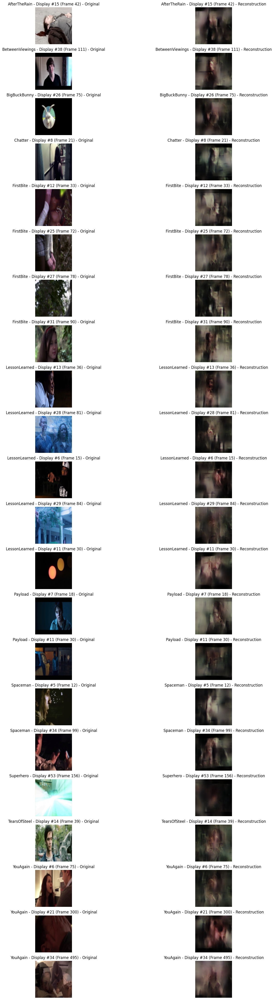

: 

In [ ]:
'''import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import os

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import os
import torch'''


import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import os
import torch

def get_displayed_frame_indices(total_frames):
    """
    Get the indices that would be displayed by the original plot_decoder_predictions function.
    Matches the original logic: interval of 15 for videos > 400 frames, otherwise interval of 3.
    
    Parameters:
        total_frames: Total number of frames in the video
        
    Returns:
        numpy array of indices that would be displayed
    """
    if total_frames > 400:
        return np.arange(0, total_frames, 15)
    else:
        return np.arange(0, total_frames, 3)

def plot_specific_frames(decoder_predictions, labels_dict, display_plots=True, save_plots=False, save_path=None):
    """
    Plots specific frames from each video and their reconstructions side by side,
    exactly matching the frames that would have been displayed by the original plot_decoder_predictions function.
    
    The 0-based index is used for all frame specifications (in original code, k starts at 1).
    
    Arguments:
        decoder_predictions (dict): Dictionary of decoder predictions. Keys are movie names.
        labels_dict (dict): Dictionary of ground truth labels. Keys are movie names.
        display_plots (bool, optional): Whether to display the plots. Default is True.
        save_plots (bool, optional): Whether to save the plots. Default is False.
        save_path (str, optional): Path to save the plots. Default is None.
    """
    # Define the specific frames to plot for each video (with correct capitalization)
    # These are 0-indexed positions in the display grid, not indices into the display sequence
    specific_frames = {
        'AfterTheRain': [14],  # 15th displayed frame (0-indexed=14)
        'BetweenViewings': [37],  # 38th displayed frame (0-indexed=37)
        'BigBuckBunny': [-1],  # last displayed frame
        'Chatter': [7],  # 8th displayed frame (0-indexed=7)
        'FirstBite': [11, 24, 26, -1],  # 12th, 25th, 27th, and last displayed frames (0-indexed)
        'LessonLearned': [12, 27, 5, 28, 10],  # 13th, 28th, 6th, 29th, 11th displayed frames (0-indexed)
        'Payload': [6, 10],  # 7th and 11th displayed frames (0-indexed)
        'Spaceman': [4, 33],  # 5th and 34th displayed frames (0-indexed)
        'Superhero': [-1],  # last displayed frame
        'TearsOfSteel': [13],  # 14th displayed frame (0-indexed)
        'YouAgain': [5, 20, 33]  # 6th and 21st displayed frames (0-indexed)
    }
    
    # Count total frames to display (maximum possible)
    total_frames = sum(len(frames) for frames in specific_frames.values())
    
    # Create figure
    plt.figure(figsize=(20, total_frames * 2))
    gs = gridspec.GridSpec(total_frames, 2)
    
    row = 0
    found_frames = []
    
    # Create a map for case-insensitive matching
    key_map = {k.lower(): k for k in decoder_predictions.keys()}
    
    for video_name, frame_indices in specific_frames.items():
        # Try to find the video with proper casing
        video_key = None
        if video_name in decoder_predictions:
            video_key = video_name
        elif video_name.lower() in key_map:
            video_key = key_map[video_name.lower()]
        
        if not video_key:
            print(f"Warning: Video {video_name} not found in predictions")
            continue
            
        if video_key not in labels_dict:
            print(f"Warning: Video {video_key} not found in labels")
            continue
            
        predictions = decoder_predictions[video_key]
        # Extract the middle frame if the labels have temporal dimension
        video_raw = labels_dict[video_key]
        if video_raw.ndim > 3 and video_raw.shape[-1] > 1:
            video = video_raw[..., 15]
        else:
            video = video_raw
        
        # Get the total number of frames
        total_video_frames = video.shape[0]
        print(f"Video {video_key} has {total_video_frames} total frames")
        
        # Get the indices that would have been displayed by original function
        display_indices = get_displayed_frame_indices(total_video_frames)
        print(f"Original code would display {len(display_indices)} frames at indices: {display_indices[:5]}...")
        
        for idx in frame_indices:
            # Handle negative indices (last frames)
            display_idx = idx if idx >= 0 else len(display_indices) + idx
            
            # Skip if display index is out of bounds
            if display_idx >= len(display_indices) or display_idx < 0:
                print(f"Warning: Display frame {idx} is out of bounds for video {video_key}")
                continue
            
            # Get the actual frame index in the original data
            actual_idx = display_indices[display_idx]
            print(f"For {video_key}, display frame #{display_idx+1} (0-indexed={display_idx}) corresponds to actual frame #{actual_idx}")
            
            # Record that we found this frame
            found_frames.append((video_key, display_idx, actual_idx))
            
            # Extract the frames
            pred_frame = predictions[actual_idx]
            true_frame = video[actual_idx]
            
            # Convert to proper display format (HWC) without normalization
            if true_frame.shape[0] == 3 and len(true_frame.shape) == 3:  # [3, H, W]
                # Convert from [3, H, W] to [H, W, 3]
                true_frame = np.transpose(true_frame, (1, 2, 0))
                
            if pred_frame.shape[0] == 3 and len(pred_frame.shape) == 3:
                pred_frame = np.transpose(pred_frame, (1, 2, 0))
            
            # Plot the frames exactly as they are
            ax1 = plt.subplot(gs[row, 0])
            ax1.imshow(true_frame)
            ax1.set_title(f'{video_key} - Display #{display_idx+1} (Frame {actual_idx}) - Original')
            ax1.axis('off')
            
            ax2 = plt.subplot(gs[row, 1])
            ax2.imshow(pred_frame)
            ax2.set_title(f'{video_key} - Display #{display_idx+1} (Frame {actual_idx}) - Reconstruction')
            ax2.axis('off')
            
            row += 1
    
    # Adjust figure size if needed
    if row < total_frames:
        plt.figure(figsize=(20, row * 2))
        gs = gridspec.GridSpec(row, 2)
    
    plt.tight_layout()
    
    if save_plots and save_path:
        # Ensure directory exists
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved plot to {save_path}")
    
    if display_plots:
        plt.show()
    else:
        plt.close()
    
    return found_frames


def test_model_specific_frames(inputs_dict, labels_dict, model, criterion, device, 
                               pretrained_decoder=None, model_to_test=None, 
                               statistical_testing=False, display_plots=True, 
                               save_plots=False, model_name=""):
    """
    Modified test_model function that runs the original test_model and then plots specific frames.
    
    This function will call the original test_model function to get predictions, but will only
    display the specific frames requested in the plot_specific_frames function.
    """
    # Run the original test_model function to get predictions
    results = test_model(inputs_dict, labels_dict, model, criterion, device, 
                        pretrained_decoder, model_to_test, statistical_testing, 
                        False, False, model_name)  # Don't display or save plots from original function
    
    # Determine which predictions to use based on the model_to_test
    if model_to_test == 'decoder':
        predictions = results['decoder_predictions']
        # For decoder, the ground truth is in labels_dict
        ground_truth = labels_dict
    else:
        # For encoder or encoder_decoder, get the decoder predictions
        if 'decoder_predictions' in results:
            predictions = results['decoder_predictions']
            # Ground truth is in inputs_dict for encoder or encoder_decoder
            ground_truth = inputs_dict
        else:
            print("Warning: No decoder predictions found in results")
            return results
    
    # Plot the specific frames
    save_path = f'outputs/specific_frames_{model_name}.png' if save_plots else None
    found_frames = plot_specific_frames(predictions, ground_truth, display_plots, save_plots, save_path)
    
    # Add the list of found frames to the results
    results['plotted_frames'] = found_frames
    
    return results

def best_new_decoder(real=True, model_name='decoder_4609_1650', test_on_train=False, test_input = testset['fMRIs'], test_label = testset['videos'], add_name='', regions = [], mask_slice=None):
    '''
    Tests the decoder
    if real=False (default) -> tests on brain activity coming from encoder
    if real=True -> tests on real brain activity
    model_name is the name of the file with the model to be used
    test_on_train is for testing on the trainset
    test_input has the fMRIs for testing. Should be a dictionary with one subdictionary for each film.
    Each subdictionary is shaped (N, 4609) where N is the number of TRs for that film
    test_label has the films. Also one subdictionary for each film
    add_name is for adding something to the end of the name so the output isnt just the names of the film and model, so that doesnt get overwritten
    regions is an array with all the ids of the regions we wish to turn off for this run, for instance
    regions=[1,4,5] would turn off regions 1, 4 and 5. Look at turn_off_regions for what is the region of each ID
    '''
    print("testing decoder", model_name)

    if mask_slice:
        slice_regions = highlight_regions_in_slice(regions_3d, mask_slice, axis=1)
        fmri_regions_off = test_input.copy()
        for video_name in test_input.keys():
            fmri_regions_off[video_name] = turn_off_regions(test_input[video_name], slice_regions)
        test_input = fmri_regions_off
        
    elif regions != []:
        fmri_regions_off = test_input.copy()
        for video_name in test_input.keys():
            fmri_regions_off[video_name] = turn_off_regions(test_input[video_name], regions)
        test_input = fmri_regions_off


    #highlighted_regions = highlight_regions_in_slice(regions_3d, 30, axis=1)


    #load decoder part of encoder decoder
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    #model = model1.decoder

    #load data
    #if not real:
    #    test_input = model1.encoder(testset['videos'])
    #    test_label = testset['videos']

    if test_on_train:
        num_samples = trainset["fMRIs"].shape[0]

        # Generate random indices based on that number
        random_indices = np.random.choice(num_samples, size=30, replace=False)

        # Create the testset with random samples
        testset2 = {
            "fMRIs": {
                "test": trainset["fMRIs"][random_indices]  # Shape will be (30, 4609)
            },
            "videos": {
                "test": trainset["videos"][random_indices]  # Shape will be (30, 3, 112, 112, 32)
            }
        }
        test_input = testset2['fMRIs']
        test_label = testset2['videos']


    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder=None
    model_to_test='decoder'
    statistical_testing = False
    display_plots = True
    save_plots = True

    #test_model(test_input, test_label, model, criterion, device, pretrained_decoder, model_to_test, statistical_testing, display_plots, save_plots, model_name=model_name + add_name)
    test_model_specific_frames(test_input, test_label, model, criterion, device, pretrained_decoder, model_to_test, statistical_testing, display_plots, save_plots, model_name=model_name + add_name)
    
    return


# Example usage:
best_new_decoder(real=True, model_name='decoder_4609_350')

#test_model_specific_frames(inputs_dict, labels_dict, model, criterion, device, 
#                           model_to_test='decoder', display_plots=True, 
#                           save_plots=True, model_name='my_model')

In [11]:
def test_specific_frames_decoder(real=True, model_name='decoder_4609_1650', test_input=testset['fMRIs'], 
                                test_label=testset['videos'], add_name='', regions=[], mask_slice=None):
    '''
    Tests the decoder on specific frames from each movie
    if real=True -> tests on real brain activity
    model_name is the name of the file with the model to be used
    test_input has the fMRIs for testing. Dictionary with one subdictionary for each film.
    test_label has the films. Also one subdictionary for each film
    add_name is for adding something to the end of the name so the output isn't overwritten
    regions is an array with all the ids of the regions we wish to turn off
    mask_slice is the coronal slice number to mask regions from
    '''
    print("Testing decoder", model_name, "on specific frames only")
    
    # Define specific frames for each movie
    specific_frames = {
        'AfterTheRain': [42],
        'BetweenViewings': [111],
        'Chatter': [21],
        'FirstBite': [33],
        'LessonLearned': [15, 36],
        'Payload': [18, 30],
        'Spaceman': [12],
        'TearsOfSteel': [39],
        'YouAgain': [300, 495]
    }
    
    # Create filtered versions of input and label dictionaries
    filtered_input = {}
    filtered_label = {}
    
    # Process regions mask if needed
    if mask_slice is not None:
        # Load the 3D regions data if not already loaded
        regions_3d = load_and_reshape_data('region_ids_4609+.npy')
        
        # Get regions passing through the specified slice
        slice_regions = highlight_regions_in_slice(regions_3d, mask_slice, axis=1)
        regions = slice_regions
        print(f"Masking {len(regions)} regions from slice {mask_slice}")
    
    # For each movie in the dataset
    for movie_name in test_input.keys():
        # Check if we have specific frames defined for this movie
        if movie_name not in specific_frames:
            print(f"Skipping {movie_name} - not in specific frames list")
            continue
            
        frames = specific_frames[movie_name]
        print(f"Processing {movie_name} - frames {frames}")
        
        # Extract just the specified frames from fMRI data
        movie_fmri = test_input[movie_name]
        
        # Create a list to store selected frames
        selected_fmris = []
        for frame in frames:
            if frame < len(movie_fmri):
                selected_fmris.append(movie_fmri[frame])
            else:
                print(f"Warning: Frame {frame} out of range for {movie_name} (max={len(movie_fmri)-1})")
                
        if not selected_fmris:
            print(f"Skipping {movie_name} - no valid frames")
            continue
            
        # Convert to numpy array
        filtered_fmri = np.array(selected_fmris)
        print(f"fMRI shape for {movie_name}: {filtered_fmri.shape}")
        
        # Apply region masking if needed
        if regions:
            filtered_fmri = turn_off_regions(filtered_fmri, regions)
        
        # Store in filtered dictionary
        filtered_input[movie_name] = filtered_fmri
        
        # Extract the corresponding frames from the video data
        movie_video = test_label[movie_name]
        
        # Create a list to store selected video frames
        selected_videos = []
        for frame in frames:
            if frame < len(movie_video):
                selected_videos.append(movie_video[frame])
            else:
                print(f"Warning: Frame {frame} out of range for video {movie_name} (max={len(movie_video)-1})")
                
        if not selected_videos:
            print(f"Skipping {movie_name} for labels - no valid frames")
            continue
            
        # Convert to numpy array
        filtered_video = np.array(selected_videos)
        print(f"Video shape for {movie_name}: {filtered_video.shape}")
        
        filtered_label[movie_name] = filtered_video
    
    # Load decoder model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Set up testing parameters
    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder = None
    model_to_test = 'decoder'
    statistical_testing = False
    display_plots = True  
    save_plots = False
    
    # Get predictions directly to ensure we have control over the process
    model.eval()
    model = model.to(device)
    decoder_predictions = {}
    
    print("Running decoder on filtered inputs...")
    with torch.no_grad():
        for movie_name in filtered_input.keys():
            inputs = torch.FloatTensor(filtered_input[movie_name]).to(device)
            outputs = model(inputs)
            decoder_predictions[movie_name] = outputs.cpu().numpy()
            print(f"Generated predictions for {movie_name}: {decoder_predictions[movie_name].shape}")
    
    # Calculate total number of frames to plot
    total_frames = sum(len(filtered_input[movie]) for movie in filtered_input)
    print(f"Total frames to plot: {total_frames}")
    
    # Create a figure with enough space for all frames
    plt.figure(figsize=(15, 5 * total_frames))
    
    # Plot each frame
    plot_idx = 1
    for movie_name in filtered_input.keys():
        num_frames = len(filtered_input[movie_name])
        print(f"Plotting {num_frames} frames for {movie_name}")
        
        for i in range(num_frames):
            frame_idx = specific_frames[movie_name][i]
            
            # Original frame
            plt.subplot(total_frames, 2, plot_idx)
            original_frame = filtered_label[movie_name][i]
            
            # Handle different frame formats - temporal dimension
            if original_frame.ndim > 3 and original_frame.shape[-1] > 1:
                # For temporal frames, take middle frame
                original_frame = original_frame[..., 15]
                
            # Convert channels-first to channels-last if needed
            if original_frame.shape[0] == 3 and len(original_frame.shape) == 3:
                original_frame = np.transpose(original_frame, (1, 2, 0))
                
            plt.imshow(original_frame)
            plt.title(f"{movie_name} - Frame {frame_idx} (Original)")
            plt.axis('off')
            
            # Reconstructed frame
            plt.subplot(total_frames, 2, plot_idx + 1)
            recon_frame = decoder_predictions[movie_name][i]
            
            if recon_frame.shape[0] == 3 and len(recon_frame.shape) == 3:
                recon_frame = np.transpose(recon_frame, (1, 2, 0))
                
            plt.imshow(recon_frame)
            plt.title(f"{movie_name} - Frame {frame_idx} (Reconstructed)")
            plt.axis('off')
            
            # Move to next row
            plot_idx += 2
    
    plt.tight_layout()
    plt.show()
    
    # Also return the results dictionary
    results = {
        'decoder_predictions': decoder_predictions,
        'filtered_input': filtered_input,
        'filtered_label': filtered_label
    }
    
    return results

# To test with specific regions turned off:
#test_specific_frames_decoder(real=True, model_name='decoder_4609_350', regions=[1, 2, 3])

# To test with regions from a coronal slice turned off:
test_specific_frames_decoder(real=True, model_name='decoder_4609_350', mask_slice=0)

NameError: name 'testset' is not defined

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

def plot_specific_frames(decoder_predictions, labels_dict, display_plots=True, save_plots=False, save_path=None):
    """
    Plots specific frames from each video and their reconstructions side by side.
    
    Arguments:
        decoder_predictions (dict): Dictionary of decoder predictions. Keys are movie names.
        labels_dict (dict): Dictionary of ground truth labels. Keys are movie names.
        display_plots (bool, optional): Whether to display the plots. Default is True.
        save_plots (bool, optional): Whether to save the plots. Default is False.
        save_path (str, optional): Path to save the plots. Default is None.
    """
    # Define the specific frames to plot for each video
    specific_frames = {
        'AfterTheRain': [15],
        'Betweenviewings': [38],
        'Bigbuckbunny': [-1],  # last frame
        'Chatter': [8],
        'FirstBite': [12, 25, 27, -1],  # 12th, 25th, 27th, and last
        'Lessonlearned': [13, 28, 6, 29, 11],
        'Payload': [7, 11],
        'Spaceman': [5, 34],
        'Superhero': [-1],  # last frame
        'Tearsofsteel': [14],
        'YouAgain': [6, 21]
    }
    
    # Count total frames to display
    total_frames = sum(len(frames) for frames in specific_frames.values())
    
    # Create figure
    plt.figure(figsize=(20, total_frames * 2))
    gs = gridspec.GridSpec(total_frames, 2)
    
    row = 0
    for video_name, frame_indices in specific_frames.items():
        if video_name not in decoder_predictions or video_name not in labels_dict:
            print(f"Warning: Video {video_name} not found in predictions or labels")
            continue
            
        predictions = decoder_predictions[video_name]
        labels = labels_dict[video_name]
        
        for idx in frame_indices:
            # Handle negative indices (last frames)
            if idx < 0:
                idx = labels.shape[0] + idx
            
            # Skip if index is out of bounds
            if idx >= labels.shape[0]:
                print(f"Warning: Frame {idx} is out of bounds for video {video_name}")
                continue
            
            # Extract the frames
            pred_frame = predictions[idx]
            true_frame = labels[idx]
            
            # Normalize if needed
            if np.max(pred_frame) > 1.0 or np.min(pred_frame) < 0.0:
                pred_frame = (pred_frame - np.min(pred_frame)) / (np.max(pred_frame) - np.min(pred_frame))
            
            if np.max(true_frame) > 1.0 or np.min(true_frame) < 0.0:
                true_frame = (true_frame - np.min(true_frame)) / (np.max(true_frame) - np.min(true_frame))
            
            # Handle different dimensions
            if len(true_frame.shape) == 4:  # Shape: [3, 112, 112, 32]
                # Extract middle frame (frame 15)
                true_frame = true_frame[..., 15]
            elif len(true_frame.shape) == 5:  # Shape: [1, 3, 112, 112, 32]
                true_frame = true_frame[0, ..., 15]
                
            if len(pred_frame.shape) == 4:
                pred_frame = pred_frame[..., 15]
            elif len(pred_frame.shape) == 5:
                pred_frame = pred_frame[0, ..., 15]
            
            # Convert to RGB if grayscale
            if len(true_frame.shape) == 2:
                true_frame = np.stack([true_frame] * 3, axis=-1)
            elif true_frame.shape[0] == 3 and len(true_frame.shape) == 3:
                # Shape: [3, 112, 112] -> [112, 112, 3]
                true_frame = np.transpose(true_frame, (1, 2, 0))
                
            if len(pred_frame.shape) == 2:
                pred_frame = np.stack([pred_frame] * 3, axis=-1)
            elif pred_frame.shape[0] == 3 and len(pred_frame.shape) == 3:
                pred_frame = np.transpose(pred_frame, (1, 2, 0))
            
            # Plot the frames
            ax1 = plt.subplot(gs[row, 0])
            ax1.imshow(true_frame)
            ax1.set_title(f'{video_name} Frame {idx} (Original)')
            ax1.axis('off')
            
            ax2 = plt.subplot(gs[row, 1])
            ax2.imshow(pred_frame)
            ax2.set_title(f'{video_name} Frame {idx} (Reconstruction)')
            ax2.axis('off')
            
            row += 1
    
    plt.tight_layout()
    
    if save_plots and save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved plot to {save_path}")
    
    if display_plots:
        plt.show()
    else:
        plt.close()


def test_model_specific_frames(inputs_dict, labels_dict, model, criterion, device, 
                               pretrained_decoder=None, model_to_test=None, 
                               statistical_testing=False, display_plots=True, 
                               save_plots=False, model_name=""):
    """
    Modified test_model function that runs the original test_model and then plots specific frames.
    
    This function will call the original test_model function to get predictions, but will only
    display the specific frames requested in the plot_specific_frames function.
    """
    # Run the original test_model function to get predictions
    results = test_model(inputs_dict, labels_dict, model, criterion, device, 
                        pretrained_decoder, model_to_test, statistical_testing, 
                        False, False, model_name)  # Don't display or save plots from original function
    
    # Determine which predictions to use based on the model_to_test
    if model_to_test == 'decoder':
        predictions = results['decoder_predictions']
        # For decoder, the ground truth is in labels_dict
        ground_truth = labels_dict
    else:
        # For encoder or encoder_decoder, get the decoder predictions
        if 'decoder_predictions' in results:
            predictions = results['decoder_predictions']
            # Ground truth is in inputs_dict for encoder or encoder_decoder
            ground_truth = inputs_dict
        else:
            print("Warning: No decoder predictions found in results")
            return results
    
    # Plot the specific frames
    save_path = f'outputs/best_frames_{model_name}.png' if save_plots else None
    plot_specific_frames(predictions, ground_truth, display_plots, save_plots, save_path)
    
    return results


def test_best_frames(real=True, model_name='decoder_4609_1650', test_on_train=False, test_input = testset['fMRIs'], test_label = testset['videos'], add_name='', regions = [], mask_slice=None):
    '''
    Tests the decoder
    if real=False (default) -> tests on brain activity coming from encoder
    if real=True -> tests on real brain activity
    model_name is the name of the file with the model to be used
    test_on_train is for testing on the trainset
    test_input has the fMRIs for testing. Should be a dictionary with one subdictionary for each film.
    Each subdictionary is shaped (N, 4609) where N is the number of TRs for that film
    test_label has the films. Also one subdictionary for each film
    add_name is for adding something to the end of the name so the output isnt just the names of the film and model, so that doesnt get overwritten
    regions is an array with all the ids of the regions we wish to turn off for this run, for instance
    regions=[1,4,5] would turn off regions 1, 4 and 5. Look at turn_off_regions for what is the region of each ID
    '''
    print("testing decoder", model_name)

    if mask_slice:
        slice_regions = highlight_regions_in_slice(regions_3d, mask_slice, axis=1)
        fmri_regions_off = test_input.copy()
        for video_name in test_input.keys():
            fmri_regions_off[video_name] = turn_off_regions(test_input[video_name], slice_regions)
        test_input = fmri_regions_off
        
    elif regions != []:
        fmri_regions_off = test_input.copy()
        for video_name in test_input.keys():
            fmri_regions_off[video_name] = turn_off_regions(test_input[video_name], regions)
        test_input = fmri_regions_off


    #highlighted_regions = highlight_regions_in_slice(regions_3d, 30, axis=1)


    #load decoder part of encoder decoder
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    #model = model1.decoder

    #load data
    #if not real:
    #    test_input = model1.encoder(testset['videos'])
    #    test_label = testset['videos']

    if test_on_train:
        num_samples = trainset["fMRIs"].shape[0]

        # Generate random indices based on that number
        random_indices = np.random.choice(num_samples, size=30, replace=False)

        # Create the testset with random samples
        testset2 = {
            "fMRIs": {
                "test": trainset["fMRIs"][random_indices]  # Shape will be (30, 4609)
            },
            "videos": {
                "test": trainset["videos"][random_indices]  # Shape will be (30, 3, 112, 112, 32)
            }
        }
        test_input = testset2['fMRIs']
        test_label = testset2['videos']


    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder=None
    model_to_test='decoder'
    statistical_testing = False
    display_plots = True
    save_plots = True

    test_model(test_input, test_label, model, criterion, device, pretrained_decoder, model_to_test, statistical_testing, display_plots, save_plots, model_name=model_name + add_name)
    return

#test_new_decoder(real=True, model_name='decoder_4609_230', regions=[1,2,3,4,5,6], add_name='_regions_123456_off')

test_best_frames(real=True, model_name='decoder_4609_350', add_name='_mask_slice20', mask_slice=20)


# Example usage:
test_model_specific_frames(inputs_dict, labels_dict, model, criterion, device, 
                           model_to_test='decoder', display_plots=True, 
                           save_plots=True, model_name='my_model')

: 

5 most posterior regions:
1. Region 490 - spans from coronal slice 13 to 13
2. Region 499 - spans from coronal slice 13 to 18
3. Region 978 - spans from coronal slice 13 to 13
4. Region 979 - spans from coronal slice 13 to 16
5. Region 993 - spans from coronal slice 13 to 14


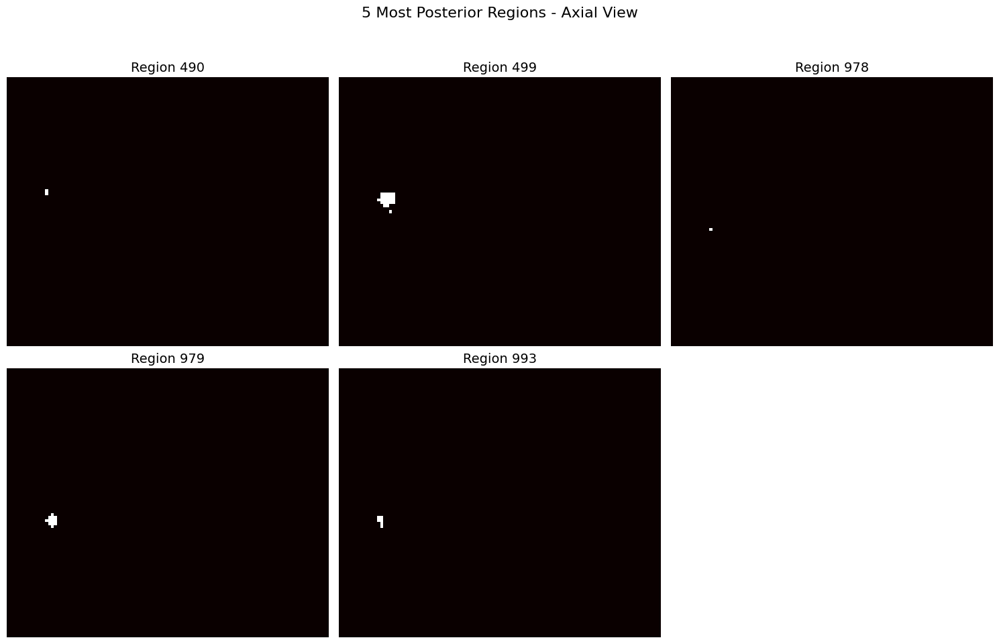

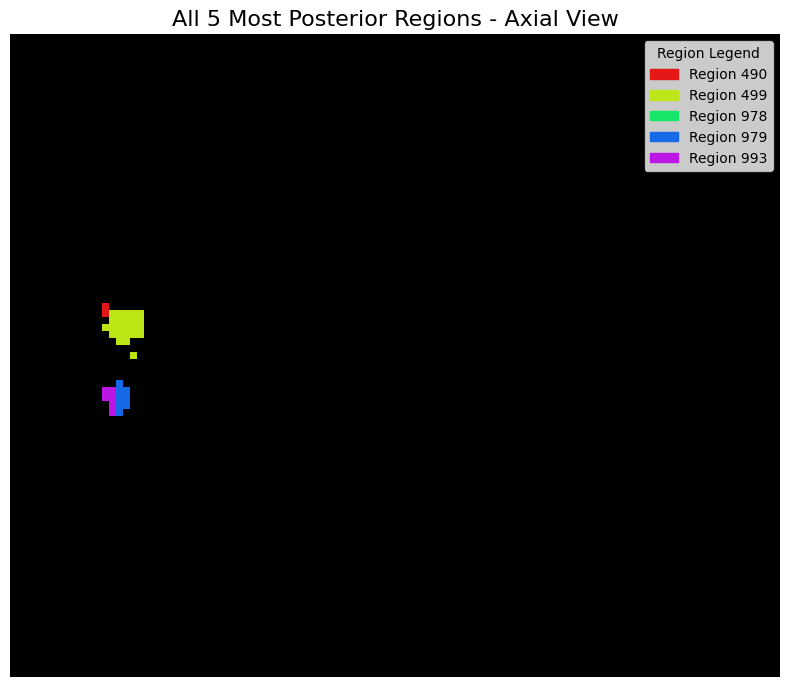

/tmp/ipykernel_2505840/1912501784.py:162: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('hsv', len(regions_in_slice) + 1)


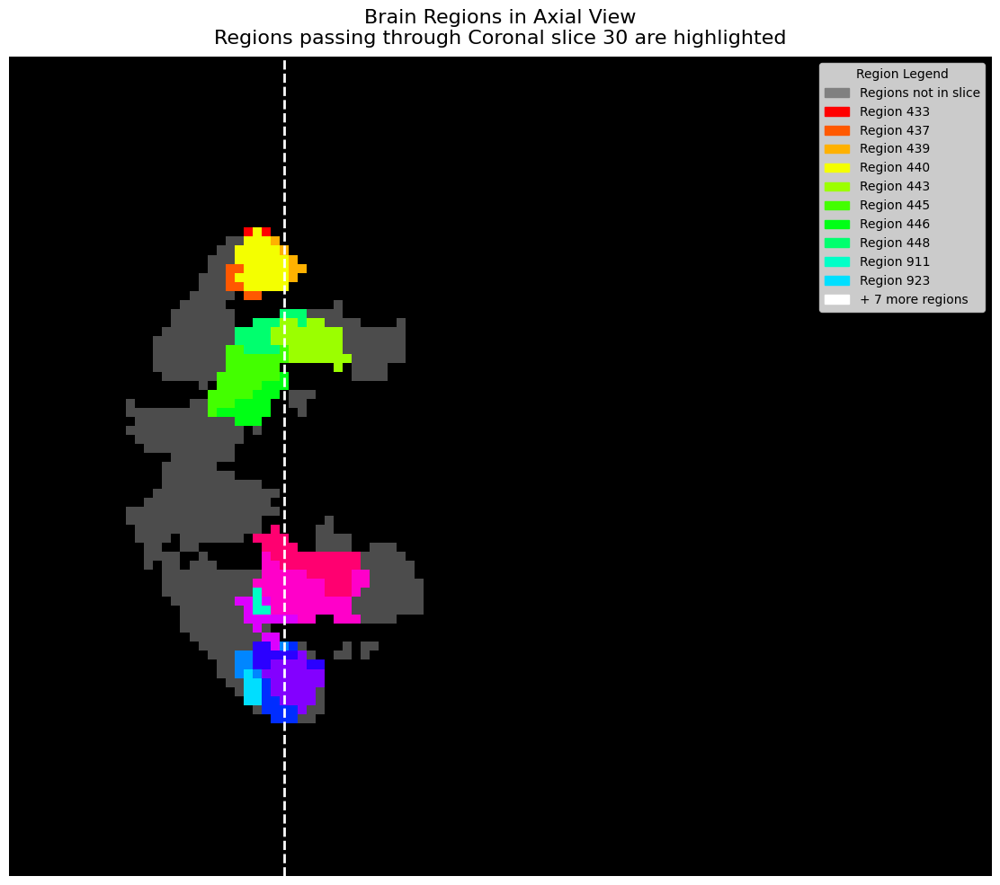

Found 17 regions passing through Coronal slice 30


: 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import colorsys
from matplotlib.colors import ListedColormap

def load_and_reshape_data(file_path):
    """
    Load the 2D data and reshape to 3D
    
    Parameters:
    file_path: Path to the .npy file
    
    Returns:
    3D numpy array of region IDs
    """
    regions_2d = np.load(file_path, mmap_mode='r')
    regions_3d = regions_2d.reshape(91, 109, 91)
    return regions_3d

def get_unique_regions(data_3d):
    """
    Find all unique region IDs in the data (excluding background)
    
    Parameters:
    data_3d: 3D numpy array of region IDs
    
    Returns:
    numpy array of unique region IDs
    """
    unique_regions = np.unique(data_3d)
    # Filter out zero (background)
    unique_regions = unique_regions[unique_regions > 0]
    return unique_regions

def analyze_regions_by_slice(data_3d, axis=1):
    """
    Determine which regions appear in each slice along the specified axis
    
    Parameters:
    data_3d: 3D numpy array of region IDs
    axis: Axis along which to take slices (0=sagittal, 1=coronal, 2=axial)
    
    Returns:
    List where each element contains the regions in that slice
    """
    num_slices = data_3d.shape[axis]
    regions_by_slice = []
    
    for i in range(num_slices):
        if axis == 0:
            slice_data = data_3d[i, :, :]
        elif axis == 1:
            slice_data = data_3d[:, i, :]
        else:  # axis == 2
            slice_data = data_3d[:, :, i]
        
        # Get unique regions in this slice (excluding 0/background)
        unique_in_slice = np.unique(slice_data)
        unique_in_slice = unique_in_slice[unique_in_slice > 0]
        
        regions_by_slice.append(unique_in_slice)
    
    return regions_by_slice

def calculate_region_extents(data_3d, all_regions=None):
    """
    Calculate the posterior-most and anterior-most slice for each region
    
    Parameters:
    data_3d: 3D numpy array of region IDs
    all_regions: Optional list of region IDs to analyze (if None, all regions are analyzed)
    
    Returns:
    Dictionary mapping region IDs to (posterior_slice, anterior_slice) indices
    """
    # If not provided, get all unique regions
    if all_regions is None:
        all_regions = get_unique_regions(data_3d)
    
    # Get regions by coronal slice
    coronal_regions = analyze_regions_by_slice(data_3d, axis=1)
    
    # Find posterior and anterior extents for each region
    region_extent = {}
    
    for region in all_regions:
        posterior_slice = None
        anterior_slice = None
        
        # Check each slice for this region
        for slice_idx in range(len(coronal_regions)):
            if region in coronal_regions[slice_idx]:
                # If first occurrence, set posterior slice
                if posterior_slice is None:
                    posterior_slice = slice_idx
                # Always update anterior slice to the latest occurrence
                anterior_slice = slice_idx
        
        if posterior_slice is not None and anterior_slice is not None:
            region_extent[region] = (posterior_slice, anterior_slice)
    
    return region_extent

def get_regions_passing_through_slice(region_extent, slice_idx):
    """
    Find all regions that pass through a given slice
    
    Parameters:
    region_extent: Dictionary mapping region IDs to (posterior, anterior) slice indices
    slice_idx: Slice index to check
    
    Returns:
    List of region IDs that pass through the specified slice
    """
    passing_regions = []
    
    for region, (posterior, anterior) in region_extent.items():
        if posterior <= slice_idx <= anterior:
            passing_regions.append(region)
    
    return passing_regions

def highlight_regions_in_slice(data_3d, slice_idx, axis=1, title=None, figsize=(12, 10)):
    """
    Visualize all brain regions in axial view, with regions passing through
    a specified slice highlighted in color, and others in grayscale.
    
    Parameters:
    data_3d: 3D numpy array of region IDs
    slice_idx: The slice index to analyze
    axis: The axis for the slice (0=sagittal, 1=coronal, 2=axial)
    title: Optional custom title
    figsize: Figure size as (width, height) tuple
    
    Returns:
    numpy array of region IDs that pass through the specified slice
    """
    # Calculate region extents
    region_extent = calculate_region_extents(data_3d)
    
    # Get regions passing through this slice
    regions_in_slice = get_regions_passing_through_slice(region_extent, slice_idx)
    
    # Get slice name for title
    slice_name = ["Sagittal", "Coronal", "Axial"][axis]
    
    # Create an axial projection of the entire brain
    whole_brain_axial = np.max(data_3d, axis=2)
    
    # Create an RGB image for coloring
    colored_image = np.zeros((*whole_brain_axial.shape, 3))
    
    # Use gray for regions not in the slice
    other_regions_mask = (whole_brain_axial > 0)
    for i in range(3):  # RGB channels
        colored_image[:,:,i] = np.where(other_regions_mask, 0.3, 0)  # Dark gray
    
    # Use a colormap for regions in the slice
    import matplotlib.cm as cm
    
    # Get a colormap with enough colors for all regions in the slice
    colormap = cm.get_cmap('hsv', len(regions_in_slice) + 1)
    
    # Assign different colors to regions in the slice
    for i, region in enumerate(regions_in_slice):
        # Create a mask for this region in axial projection
        region_mask = np.max(data_3d == region, axis=2)
        color = colormap(i)[:3]  # RGB values of the color
        
        # Apply this color to the region
        for j in range(3):  # RGB channels
            colored_image[:,:,j] = np.where(region_mask, color[j], colored_image[:,:,j])
    
    # Create the visualization
    plt.figure(figsize=figsize)
    
    # Use custom title if provided, otherwise use default
    if title:
        plt.suptitle(title, fontsize=16)
    else:
        plt.suptitle(f"Brain Regions in Axial View\nRegions passing through {slice_name} slice {slice_idx} are highlighted", fontsize=16)
    
    # Main plot - axial view with highlighted regions
    plt.imshow(colored_image, origin='lower')
    plt.axis('off')
    
    # Add a dotted line to show the slice location
    if axis == 0:  # Sagittal slice (vertical line in axial view)
        plt.axvline(x=slice_idx, color='white', linestyle='--', linewidth=2)
    elif axis == 1:  # Coronal slice (horizontal line in axial view)
        plt.axvline(x=slice_idx, color='white', linestyle='--', linewidth=2)
    # No line needed for axial slice since we're already in axial view
    
    # Create a custom legend
    handles = []
    labels = []
    
    # Add a gray box for all other regions
    handles.append(plt.Rectangle((0,0), 1, 1, color='gray'))
    labels.append("Regions not in slice")
    
    # Add colored boxes for regions in the slice
    # Limit to max 10 regions in legend to avoid overcrowding
    legend_limit = min(10, len(regions_in_slice))
    for i in range(legend_limit):
        handles.append(plt.Rectangle((0,0), 1, 1, color=colormap(i)[:3]))
        labels.append(f"Region {regions_in_slice[i]}")
    
    if len(regions_in_slice) > legend_limit:
        handles.append(plt.Rectangle((0,0), 1, 1, color='white'))
        labels.append(f"+ {len(regions_in_slice) - legend_limit} more regions")
    
    plt.legend(handles, labels, loc='upper right', title="Region Legend", fontsize=10)
    
    plt.tight_layout()
    plt.show()
    
    print(f"Found {len(regions_in_slice)} regions passing through {slice_name} slice {slice_idx}")
    
    return regions_in_slice

def get_sorted_regions_by_posterior_extent(data_3d, limit=None):
    """
    Get regions sorted by their posterior-most slice (from back to front)
    
    Parameters:
    data_3d: 3D numpy array of region IDs
    limit: Optional limit to return only the N most posterior regions
    
    Returns:
    List of (region_id, (posterior_slice, anterior_slice)) tuples
    """
    region_extent = calculate_region_extents(data_3d)
    
    # Sort regions by their posterior-most slice (from back to front)
    sorted_regions = sorted(region_extent.items(), key=lambda x: x[1][0])
    
    if limit:
        return sorted_regions[:limit]
    return sorted_regions

def plot_multiple_posterior_regions(data_3d, num_regions=5, figsize=(15, 10)):
    """
    Plot the most posterior regions in the brain
    
    Parameters:
    data_3d: 3D numpy array of region IDs
    num_regions: Number of most posterior regions to highlight
    figsize: Figure size as (width, height) tuple
    
    Returns:
    List of the most posterior region IDs
    """
    # Get the most posterior regions
    sorted_regions = get_sorted_regions_by_posterior_extent(data_3d, limit=num_regions)
    most_posterior_regions = [region for region, _ in sorted_regions]
    
    # Print information about these regions
    print(f"{num_regions} most posterior regions:")
    for i, (region, (posterior, anterior)) in enumerate(sorted_regions):
        print(f"{i+1}. Region {region} - spans from coronal slice {posterior} to {anterior}")
    
    # Create subplots for individual regions
    plt.figure(figsize=figsize)
    plt.suptitle(f"{num_regions} Most Posterior Regions - Axial View", fontsize=16)
    
    for i, region in enumerate(most_posterior_regions):
        # Create mask for this region
        region_mask = (data_3d == region)
        
        # Create a binary version for this region
        region_data = np.zeros_like(data_3d)
        region_data[region_mask] = 1
        
        # Project along z-axis for axial view
        axial_projection = np.max(region_data, axis=2)
        
        # Subplot
        plt.subplot(2, 3, i+1)
        plt.imshow(axial_projection, cmap='hot', origin='lower')
        plt.title(f'Region {region}', fontsize=14)
        plt.axis('off')
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)  # Make room for suptitle
    plt.show()
    
    # Create a combined view with all regions in different colors
    plt.figure(figsize=(8, 8))
    plt.title(f"All {num_regions} Most Posterior Regions - Axial View", fontsize=16)
    
    # Generate distinct colors
    colors = []
    for i in range(len(most_posterior_regions)):
        hue = i/len(most_posterior_regions)
        rgb = colorsys.hsv_to_rgb(hue, 0.9, 0.9)
        colors.append(rgb)
    
    # Create colormap with black background
    colors.insert(0, (0,0,0))
    custom_cmap = ListedColormap(colors)
    
    # Create combined data
    combined_data = np.zeros_like(data_3d)
    for i, region in enumerate(most_posterior_regions):
        # Assign unique values to each region (1, 2, 3, etc.)
        combined_data[data_3d == region] = i+1
    
    # Project along z-axis
    combined_projection = np.max(combined_data, axis=2)
    
    # Plot
    plt.imshow(combined_projection, cmap=custom_cmap, origin='lower')
    plt.axis('off')
    
    # Add legend
    handles = []
    labels = []
    for i, region in enumerate(most_posterior_regions):
        handles.append(plt.Rectangle((0,0), 1, 1, color=colors[i+1]))
        labels.append(f"Region {region}")
    
    plt.legend(handles, labels, loc='best', title="Region Legend")
    plt.tight_layout()
    plt.show()
    
    return most_posterior_regions

# Example usage:
if __name__ == "__main__":
    # Load data
    regions_3d = load_and_reshape_data('region_ids_4609+.npy')
    
    # Get 5 most posterior regions
    most_posterior_regions = plot_multiple_posterior_regions(regions_3d, num_regions=5)
    
    # Highlight regions passing through coronal slice 30
    highlighted_regions = highlight_regions_in_slice(regions_3d, 30, axis=1)

In [ ]:
#masking functions

import numpy as np
import matplotlib.pyplot as plt

regions2d_path = 'region_ids_4609+.npy'
regions_2d = np.load(regions2d_path, mmap_mode = 'r')
regions_3d = regions_2d.reshape(91, 109, 91)

# Assuming you've already loaded your data and have region_extent defined
# (with posterior and anterior slice indices for each region)

# Sort regions by their posterior-most slice (from back to front)
sorted_regions = sorted(region_extent.items(), key=lambda x: x[1][0])

# Get the 5 most posterior regions
most_posterior_regions = [region for region, _ in sorted_regions[:5]]

print("5 most posterior regions:")
for i, (region, (posterior, anterior)) in enumerate(sorted_regions[:5]):
    print(f"{i+1}. Region {region} - spans from coronal slice {posterior} to {anterior}")

# Function to plot individual regions in axial view
def plot_most_posterior_regions_axial(data_3d, regions_list):
    """
    Plot each of the most posterior regions individually in axial view
    
    Parameters:
    data_3d: 3D numpy array of region IDs
    regions_list: List of region IDs to visualize
    """
    plt.figure(figsize=(15, 10))
    plt.suptitle("5 Most Posterior Regions - Axial View", fontsize=16)
    
    for i, region in enumerate(regions_list):
        # Create mask for this region
        region_mask = (data_3d == region)
        
        # Create a binary version for this region
        region_data = np.zeros_like(data_3d)
        region_data[region_mask] = 1
        
        # Project along z-axis for axial view
        axial_projection = np.max(region_data, axis=2)
        
        # Subplot
        plt.subplot(2, 3, i+1)
        plt.imshow(axial_projection, cmap='hot', origin='lower')
        plt.title(f'Region {region}', fontsize=14)
        plt.axis('off')
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)  # Make room for suptitle
    plt.show()
    
    # Also create a combined view with all 5 regions in different colors
    plt.figure(figsize=(8, 8))
    plt.title("All 5 Most Posterior Regions - Axial View", fontsize=16)
    
    # Generate distinct colors
    import colorsys
    colors = []
    for i in range(len(regions_list)):
        hue = i/len(regions_list)
        rgb = colorsys.hsv_to_rgb(hue, 0.9, 0.9)
        colors.append(rgb)
    
    # Create colormap with black background
    colors.insert(0, (0,0,0))
    custom_cmap = plt.cm.colors.ListedColormap(colors)
    
    # Create combined data
    combined_data = np.zeros_like(data_3d)
    for i, region in enumerate(regions_list):
        # Assign unique values to each region (1, 2, 3, etc.)
        combined_data[data_3d == region] = i+1
    
    # Project along z-axis
    combined_projection = np.max(combined_data, axis=2)
    
    # Plot
    plt.imshow(combined_projection, cmap=custom_cmap, origin='lower')
    plt.axis('off')
    
    # Add legend
    handles = []
    labels = []
    for i, region in enumerate(regions_list):
        handles.append(plt.Rectangle((0,0), 1, 1, color=colors[i+1]))
        labels.append(f"Region {region}")
    
    plt.legend(handles, labels, loc='best', title="Region Legend")
    plt.tight_layout()
    plt.show()

# Call the function
plot_most_posterior_regions_axial(regions_3d, most_posterior_regions)






# Add a comparison plot showing the 5 most posterior regions highlighted within all regions
def plot_posterior_vs_all_axial(data_3d, posterior_regions):
    """
    Plot highlighting the 5 most posterior regions within all brain regions
    
    Parameters:
    data_3d: 3D numpy array of region IDs
    posterior_regions: List of IDs for the most posterior regions
    """
    plt.figure(figsize=(10, 10))
    plt.title("Most Posterior Regions Highlighted - Axial View", fontsize=16)
    
    # Create a custom colormap
    # Gray for most regions, bright colors for posterior regions
    import matplotlib.colors as mcolors
    
    # Project along z-axis for axial view
    axial_projection = np.max(data_3d, axis=2)
    
    # Create a mask for posterior regions
    mask = np.zeros_like(axial_projection, dtype=bool)
    for region in posterior_regions:
        region_projection = np.max(data_3d == region, axis=2)
        mask = mask | (region_projection > 0)
    
    # Create a highlighted image
    # Start with a grayscale version of all regions
    highlighted = np.zeros((*axial_projection.shape, 3))
    
    # Non-zero values that aren't in our posterior regions list
    other_regions = (axial_projection > 0) & ~mask
    
    # Add grayscale for other regions
    for i in range(3):  # RGB channels
        highlighted[:,:,i] = np.where(other_regions, 0.5, 0)  # 0.5 = 50% gray
    
    # Add color for posterior regions
    colors = ['red', 'blue', 'green', 'magenta', 'cyan']
    for i, region in enumerate(posterior_regions):
        region_mask = (np.max(data_3d == region, axis=2) > 0)
        
        if colors[i] == 'red':
            highlighted[:,:,0] = np.where(region_mask, 1.0, highlighted[:,:,0])
        elif colors[i] == 'blue':
            highlighted[:,:,2] = np.where(region_mask, 1.0, highlighted[:,:,2])
        elif colors[i] == 'green':
            highlighted[:,:,1] = np.where(region_mask, 1.0, highlighted[:,:,1])
        elif colors[i] == 'magenta':
            highlighted[:,:,0] = np.where(region_mask, 1.0, highlighted[:,:,0])
            highlighted[:,:,2] = np.where(region_mask, 1.0, highlighted[:,:,2])
        elif colors[i] == 'cyan':
            highlighted[:,:,1] = np.where(region_mask, 1.0, highlighted[:,:,1])
            highlighted[:,:,2] = np.where(region_mask, 1.0, highlighted[:,:,2])
    
    # Display the image
    plt.imshow(highlighted, origin='lower')
    plt.axis('off')
    
    # Add legend
    handles = []
    labels = []
    for i, region in enumerate(posterior_regions):
        handles.append(plt.Rectangle((0,0), 1, 1, color=colors[i]))
        labels.append(f"Region {region}")
    
    # Add a gray box for all other regions
    handles.append(plt.Rectangle((0,0), 1, 1, color='gray'))
    labels.append("All other regions")
    
    plt.legend(handles, labels, loc='best', title="Region Legend")
    plt.tight_layout()
    plt.show()

# Call the function
plot_posterior_vs_all_axial(regions_3d, most_posterior_regions)








def show_regions_in_slice(data_3d, slice_idx, axis=1):
    """
    Visualize all regions that pass through a specific slice and return their IDs
    
    Parameters:
    data_3d: 3D numpy array of region IDs
    slice_idx: The slice index to analyze
    axis: The axis for the slice (0=sagittal, 1=coronal, 2=axial)
    
    Returns:
    numpy array of region IDs that pass through the specified slice
    """
    # Get the slice data
    if axis == 0:
        slice_data = data_3d[slice_idx, :, :]
    elif axis == 1:
        slice_data = data_3d[:, slice_idx, :]
    else:  # axis == 2
        slice_data = data_3d[:, :, slice_idx]
    
    # Find unique regions in this slice (excluding background/zero)
    regions_in_slice = np.unique(slice_data)
    regions_in_slice = regions_in_slice[regions_in_slice > 0]
    
    # Create a mask for these regions in the full volume
    mask = np.zeros_like(data_3d, dtype=bool)
    for region in regions_in_slice:
        mask = mask | (data_3d == region)
    
    # Create a masked version of the data
    masked_data = np.zeros_like(data_3d)
    masked_data[mask] = data_3d[mask]
    
    # Project along z-axis for axial view
    axial_projection = np.max(masked_data, axis=2)
    
    # Visualize
    plt.figure(figsize=(10, 10))
    plt.title(f"Regions Passing Through {'Sagittal' if axis==0 else 'Coronal' if axis==1 else 'Axial'} Slice {slice_idx}", fontsize=16)
    
    # Use a colormap that works well for many distinct regions
    plt.imshow(axial_projection, cmap='nipy_spectral', origin='lower')
    plt.axis('off')
    
    # Add orientation markers
    plt.text(5, 5, "Posterior", fontsize=12, color='white')
    plt.text(axial_projection.shape[1]-60, axial_projection.shape[0]-20, 
             "Anterior", fontsize=12, color='white')
    
    plt.tight_layout()
    plt.show()
    
    # Print the number of regions found
    print(f"Found {len(regions_in_slice)} regions passing through slice {slice_idx}")
    print(f"Region IDs: {regions_in_slice}")
    
    return regions_in_slice

# Example usage:
# Pass a specific slice number to visualize regions passing through it
# For example, to see regions passing through coronal slice 40:
#regions_in_slice_40 = show_regions_in_slice(regions_3d, 40, axis=1)




#for slice_idx in [40, 50, 60]:
#    regions = show_regions_in_slice(regions_3d, slice_idx, axis=1)
#    print(f"Number of regions in slice {slice_idx}: {len(regions)}")
#    print("-----")








def highlight_regions_in_slice(data_3d, slice_idx, axis=1):
    """
    Visualize all brain regions in axial view, with regions passing through
    a specified slice highlighted in color, and others in grayscale.
    
    Parameters:
    data_3d: 3D numpy array of region IDs
    slice_idx: The slice index to analyze
    axis: The axis for the slice (0=sagittal, 1=coronal, 2=axial)
    
    Returns:
    numpy array of region IDs that pass through the specified slice
    """
    # Get the slice data
    if axis == 0:
        slice_data = data_3d[slice_idx, :, :]
        slice_name = "Sagittal"
    elif axis == 1:
        slice_data = data_3d[:, slice_idx, :]
        slice_name = "Coronal"
    else:  # axis == 2
        slice_data = data_3d[:, :, slice_idx]
        slice_name = "Axial"
    
    # Find unique regions in this slice (excluding background/zero)
    regions_in_slice = np.unique(slice_data)
    regions_in_slice = regions_in_slice[regions_in_slice > 0]
    
    # Create an axial projection of the entire brain
    whole_brain_axial = np.max(data_3d, axis=2)
    
    # Create an RGB image for coloring
    colored_image = np.zeros((*whole_brain_axial.shape, 3))
    
    # Use gray for regions not in the slice
    other_regions_mask = (whole_brain_axial > 0)
    for i in range(3):  # RGB channels
        colored_image[:,:,i] = np.where(other_regions_mask, 0.3, 0)  # Dark gray
    
    # Use a colormap for regions in the slice
    import matplotlib.cm as cm
    
    # Get a colormap with enough colors for all regions in the slice
    colormap = cm.get_cmap('hsv', len(regions_in_slice) + 1)
    
    # Assign different colors to regions in the slice
    for i, region in enumerate(regions_in_slice):
        # Create a mask for this region in axial projection
        region_mask = np.max(data_3d == region, axis=2)
        color = colormap(i)[:3]  # RGB values of the color
        
        # Apply this color to the region
        for j in range(3):  # RGB channels
            colored_image[:,:,j] = np.where(region_mask, color[j], colored_image[:,:,j])
    
    # Create the visualization
    plt.figure(figsize=(12, 10))
    plt.suptitle(f"Brain Regions in Axial View\nRegions passing through {slice_name} slice {slice_idx} are highlighted", fontsize=16)
    
    # Main plot - axial view with highlighted regions
    plt.imshow(colored_image, origin='lower')
    plt.axis('off')
    
    # Add a dotted line to show the slice location
    if axis == 0:  # Sagittal slice (vertical line in axial view)
        plt.axvline(x=slice_idx, color='white', linestyle='--', linewidth=2)
    elif axis == 1:  # Coronal slice (vertical line in axial view)
        plt.axvline(x=slice_idx, color='white', linestyle='--', linewidth=2)
    # No line needed for axial slice since we're looking at axial view
    
    # Create a custom legend
    handles = []
    labels = []
    
    # Add a gray box for all other regions
    handles.append(plt.Rectangle((0,0), 1, 1, color='gray'))
    labels.append("Regions not in slice")
    
    # Add colored boxes for regions in the slice
    # Limit to max 10 regions in legend to avoid overcrowding
    legend_limit = min(10, len(regions_in_slice))
    for i in range(legend_limit):
        handles.append(plt.Rectangle((0,0), 1, 1, color=colormap(i)[:3]))
        labels.append(f"Region {regions_in_slice[i]}")
    
    if len(regions_in_slice) > legend_limit:
        handles.append(plt.Rectangle((0,0), 1, 1, color='white'))
        labels.append(f"+ {len(regions_in_slice) - legend_limit} more regions")
    
    plt.legend(handles, labels, loc='upper right', title="Region Legend", fontsize=10)
    
    plt.tight_layout()
    plt.show()
    
    # Print the number of regions found
    print(f"Found {len(regions_in_slice)} regions passing through {slice_name} slice {slice_idx}")
    
    return regions_in_slice

# Example usage:
highlight_regions_in_slice(regions_3d, 30, axis=1)  # Coronal slice 40

: 

In [ ]:
#testing new decoder

#testing the decoder

def turn_off_regions(input_fmri, regions):
    #input_fmri should be an array with a shape [N, 4609], where N is number of TRs
    #regions should be like [1,4,6,7] if we want to turn off regions 1, 4, 6 and 7, according to:
#   [420, 450], [478, 488], [489, 496], [497, 500], [910, 940], [976, 991], [992, 1000]

#    region_ids = np.load('region_ids_4609.npy') #this was only with 7 networks that were previously being used
    region_ids = np.load('region_ids_4609+.npy')

    indices = []
    for region_id in regions:
        indices.extend(np.where(region_ids == region_id)[0].tolist())

    fmri2 = input_fmri.copy()
    fmri2[:, indices] = 0
    return fmri2

def test_new_decoder(real=True, model_name='decoder_4609_1650', test_on_train=False, test_input = testset['fMRIs'], test_label = testset['videos'], add_name='', regions = []):
    '''
    Tests the decoder
    if real=False (default) -> tests on brain activity coming from encoder
    if real=True -> tests on real brain activity
    model_name is the name of the file with the model to be used
    test_on_train is for testing on the trainset
    test_input has the fMRIs for testing. Should be a dictionary with one subdictionary for each film.
    Each subdictionary is shaped (N, 4609) where N is the number of TRs for that film
    test_label has the films. Also one subdictionary for each film
    add_name is for adding something to the end of the name so the output isnt just the names of the film and model, so that doesnt get overwritten
    regions is an array with all the ids of the regions we wish to turn off for this run, for instance
    regions=[1,4,5] would turn off regions 1, 4 and 5. Look at turn_off_regions for what is the region of each ID
    '''
    print("testing decoder", model_name)

    if regions != []:
        fmri_regions_off = test_input.copy()
        for video_name in test_input.keys():
            fmri_regions_off[video_name] = turn_off_regions(test_input[video_name], regions)
        test_input = fmri_regions_off
    

    #load decoder part of encoder decoder
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    #model = model1.decoder

    #load data
    if not real:
        test_input = model1.encoder(testset['videos'])
        test_label = testset['videos']

    if test_on_train:
        num_samples = trainset["fMRIs"].shape[0]

        # Generate random indices based on that number
        random_indices = np.random.choice(num_samples, size=30, replace=False)

        # Create the testset with random samples
        testset2 = {
            "fMRIs": {
                "test": trainset["fMRIs"][random_indices]  # Shape will be (30, 4609)
            },
            "videos": {
                "test": trainset["videos"][random_indices]  # Shape will be (30, 3, 112, 112, 32)
            }
        }
        test_input = testset2['fMRIs']
        test_label = testset2['videos']


    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder=None
    model_to_test='decoder'
    statistical_testing = False
    display_plots = True
    save_plots = True

    test_model(test_input, test_label, model, criterion, device, pretrained_decoder, model_to_test, statistical_testing, display_plots, save_plots, model_name=model_name + add_name)
    return

test_new_decoder(real=True, model_name='decoder_4609_230', regions=[1,2,3,4,5,6], add_name='_regions_123456_off')


: 

### older code

In [ ]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1,2,3"

from dataset import *
from models_rodrigo import *
from visualisation_rodrigo import *

: 

### doing a forward pass (testing decoder)

In [ ]:
### data loading ###

dataset_ID = 6661 # ID of a specific dataset. 6661 refer to preprocessed data with a mask of shape (4609,). 6660 refers to preprocessed data with a mask of shape (15364,)
mask_size = 4609 # number of voxels in the preprocessed fMRI data. either 4609 or 15364
trainset, valset, testset = get_dataset(dataset_ID, mask_size) # data are loaded into dictionaries

#for now just using the sets that were already stored . i can do perturbation after this here perhaps

: 

In [10]:
#testing the decoder

#I had to use the decoder part of the saved encoder decoder because we dont have a saved individual decoder

def test_decoder(real=False):
    '''
    Tests the decoder
    if real=False (default) -> tests on brain activity coming from encoder
    if real=True -> tests on real brain activity
    '''

    #load decoder part of encoder decoder
    model1 = EncoderDecoder(mask_size)
    save_model_as = 'encoder_decoder_4609_11'
    state_dict = torch.load(save_model_as)
    model1.load_state_dict(state_dict)
    model = model1.decoder

    #load data
    if real:
        test_input = testset['fMRIs']
        test_label = testset['videos']
    else:
        test_input = model1.encoder(testset['videos'])
        test_label = testset['videos']

    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder=None
    model_to_test='decoder'
    statistical_testing = False
    display_plots = True

    test_model(test_input, test_label, model, criterion, device, pretrained_decoder, model_to_test, statistical_testing, display_plots)
    return

test_decoder(real=True)

#test_decoder_real()
#test_decoder_encoded()

#model = Decoder(mask_size)
#decoded = model(test_input)

#lets see if I can plot the 10 images with the best SSIM



NameError: name 'EncoderDecoder' is not defined

In [9]:
#testing the encoder

#I had to use the decoder part of the saved encoder decoder because we dont have a saved individual decoder

test_input = testset['videos']
test_label = testset['fMRIs']
statistical_testing = False

#model = Decoder(mask_size)
model1 = EncoderDecoder(mask_size)
save_model_as = 'encoder_decoder_4609_11'
state_dict = torch.load(save_model_as)
model1.load_state_dict(state_dict)
model = model1.encoder

criterion = E_Loss()
device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
pretrained_decoder=None
model_to_test='encoder'
statistical_testing = False
display_plots = True

results = test_model(test_input, test_label, model, criterion, device, pretrained_decoder, model_to_test, statistical_testing, display_plots)

#model = Decoder(mask_size)
#decoded = model(test_input)

NameError: name 'testset' is not defined

### training decoder

In [ ]:
### necessary imports ###

import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1,2,3"

from dataset import *
from models_new_2 import *
from visualisation_new_2 import *

: 

In [ ]:
### data loading ###

dataset_ID = 6661 # ID of a specific dataset. 6661 refer to preprocessed data with a mask of shape (4609,). 6660 refers to preprocessed data with a mask of shape (15364,)
mask_size = 4609 # number of voxels in the preprocessed fMRI data. either 4609 or 15364
trainset, valset, testset = get_dataset(dataset_ID, mask_size) # data are loaded into dictionaries

print_dict_tree(trainset)
# print_dict_tree(valset)
print_dict_tree(testset)

fMRIs (shape: (4321, 4609))
videos (shape: (4321, 3, 112, 112, 32))
fMRIs
  Sintel (shape: (111, 4609))
  Payload (shape: (155, 4609))
  TearsOfSteel (shape: (91, 4609))
  Superhero (shape: (158, 4609))
  BigBuckBunny (shape: (76, 4609))
  FirstBite (shape: (92, 4609))
  BetweenViewings (shape: (125, 4609))
  AfterTheRain (shape: (77, 4609))
  TheSecretNumber (shape: (121, 4609))
  Chatter (shape: (63, 4609))
  Spaceman (shape: (124, 4609))
  LessonLearned (shape: (103, 4609))
  YouAgain (shape: (613, 4609))
  ToClaireFromSonny (shape: (62, 4609))
videos
  Sintel (shape: (111, 3, 112, 112, 32))
  Payload (shape: (155, 3, 112, 112, 32))
  TearsOfSteel (shape: (91, 3, 112, 112, 32))
  Superhero (shape: (158, 3, 112, 112, 32))
  BigBuckBunny (shape: (76, 3, 112, 112, 32))
  FirstBite (shape: (92, 3, 112, 112, 32))
  BetweenViewings (shape: (125, 3, 112, 112, 32))
  AfterTheRain (shape: (77, 3, 112, 112, 32))
  TheSecretNumber (shape: (121, 3, 112, 112, 32))
  Chatter (shape: (63, 3, 112, 

: 

### Training decoder on input of shape (4321, 4609) ###
Start training from epoch 1 with initial loss None
Epoch: 5, Batch: 271, Loss: 0.2251


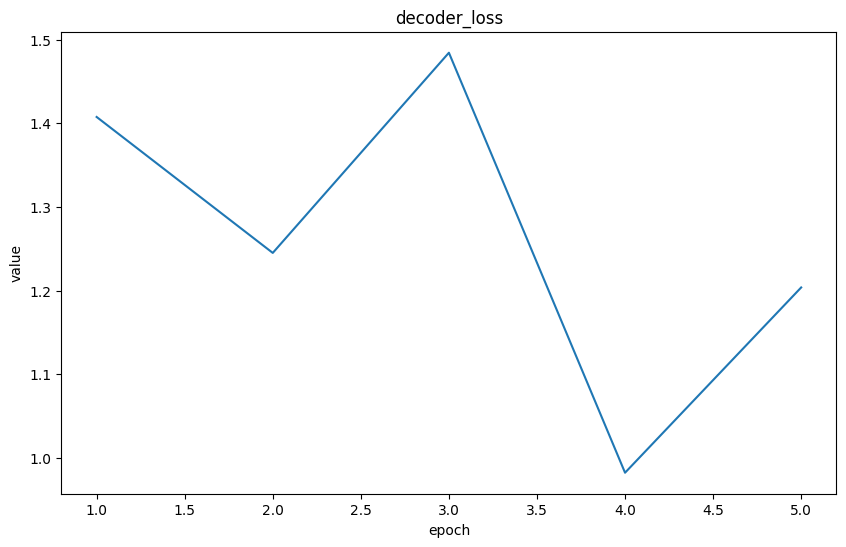

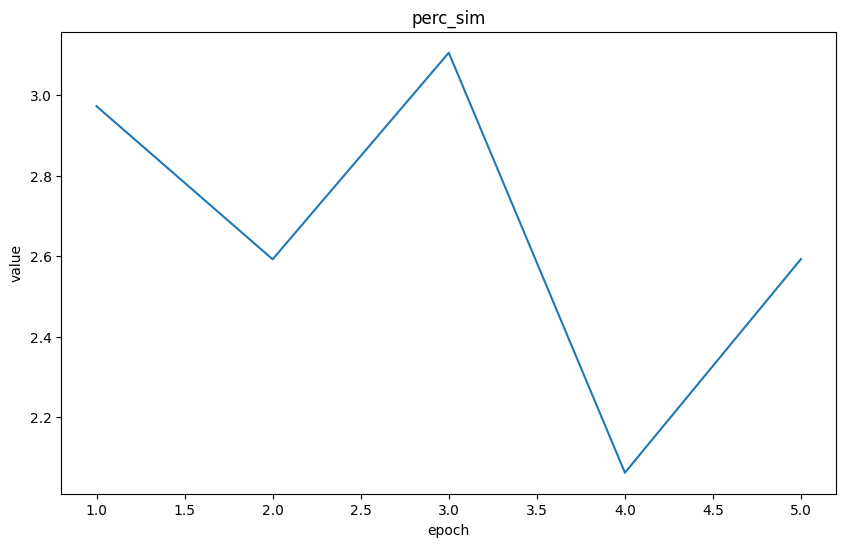

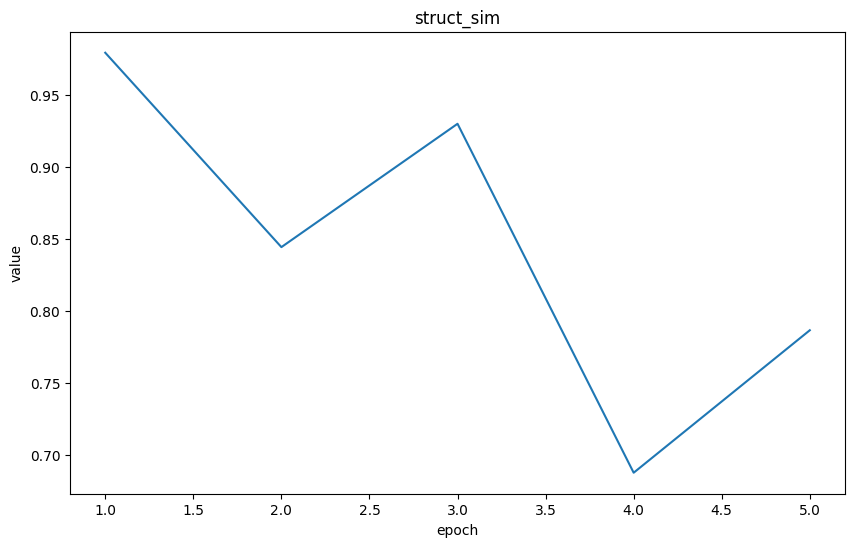

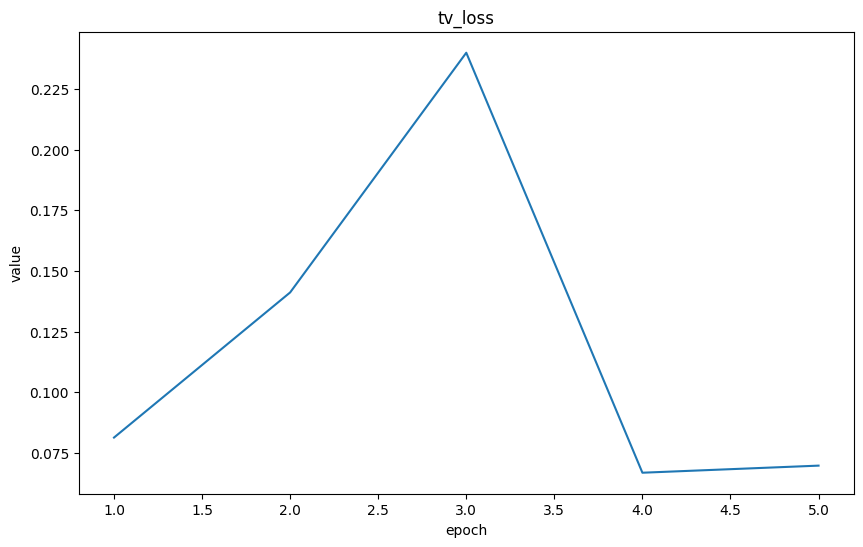

Training completed. Total time: 3.69 minutes
---
total_loss (shape: (5,))
other_metrics (shape: (5, 3))
metrics_names (type: <class 'list'>)


: 

In [ ]:
### model training ###

# Training parameters
train_label = trainset['videos']
train_input = trainset['fMRIs']
model = Decoder(mask_size)
num_epochs = 5
lr = 1e-4
#encoder_weight = 0.5
criterion = D_Loss()
#(encoder_weight = encoder_weight)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
batch_size = 16
device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
save_model_as = 'decoder_4609_' + str(num_epochs)
pretrained_decoder = None
start_epoch = 1
start_loss = None
model_to_train = 'decoder'
display_plots = True
save_plots = True
model_name = save_model_as

# Training loop
model, history = train_model(train_input, train_label, model, num_epochs, lr, criterion, optimizer, batch_size, device, save_model_as, pretrained_decoder, start_epoch, start_loss, model_to_train, display_plots, save_plots, model_name)
print_dict_tree(history)

In [ ]:
### necessary imports ###

import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1,2,3"

from dataset import *
from models_new_2 import *
from visualisation_new_2 import *


### data loading ###

dataset_ID = 6661 # ID of a specific dataset. 6661 refer to preprocessed data with a mask of shape (4609,). 6660 refers to preprocessed data with a mask of shape (15364,)
mask_size = 4609 # number of voxels in the preprocessed fMRI data. either 4609 or 15364
trainset, valset, testset = get_dataset(dataset_ID, mask_size) # data are loaded into dictionaries

#print_dict_tree(trainset)
# print_dict_tree(valset)
#print_dict_tree(testset)

: 

In [ ]:
#tag test temporal

def test_temporal_decoder(real=True, model_name='temporal_decoder_4609_350', window_size=3, test_input=None, test_label=None, add_name=''):
    """
    Test function specifically for temporal decoders with visualization
    
    Arguments:
        real: Whether to test on real brain activity
        model_name: Path to the saved temporal decoder model
        window_size: Number of consecutive TRs used in training
        test_input: fMRI data for testing (dictionary)
        test_label: Video data for testing (dictionary)
        add_name: Additional name for saved outputs
    """
    print(f"Testing temporal decoder {model_name} with window size {window_size}")
    
    # Create the proper temporal decoder model
    model = TemporalDecoder(mask_size, n_time_steps=window_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Set up other testing parameters
    criterion = Temporal_D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    model.eval()
    
    # Process each video separately
    results = {
        'decoder_predictions': {},
        'total_losses': {},
        'test_performance': {}
    }
    
    for video_name in test_input.keys():
        print(f"Processing video: {video_name}")
        
        # Get video data
        fmri_data = test_input[video_name]
        video_frames = test_label[video_name]
        
        # Prepare temporal windows
        temporal_windows = []
        middle_frames = []
        window_indices = []  # Keep track of original indices
        
        # Create sliding windows with appropriate stride
        for i in range(len(fmri_data) - window_size + 1):
            window = fmri_data[i:i+window_size]
            temporal_windows.append(window)
            
            # Get middle frames for each position in the window
            frames = []
            for j in range(window_size):
                middle_frame_idx = 15  # Middle of 32 frames
                frame = video_frames[i+j, :, :, :, middle_frame_idx]
                frames.append(frame)
            middle_frames.append(np.stack(frames))
            
            # Store the middle index of this window
            window_indices.append(i + window_size // 2)
        
        # Convert to tensors
        temporal_windows = torch.from_numpy(np.array(temporal_windows)).float()
        middle_frames = torch.from_numpy(np.array(middle_frames)).float()
        
        # Create dataset and loader
        test_set = torch.utils.data.TensorDataset(temporal_windows, middle_frames)
        test_loader = torch.utils.data.DataLoader(
            test_set,
            batch_size=16,
            shuffle=False,
            pin_memory=torch.cuda.is_available(),
            num_workers=4
        )
        
        # Process batches
        all_predictions = []
        total_losses = []
        batch_indices = []
        
        with torch.no_grad():
            batch_start = 0
            for inputs, targets in test_loader:
                inputs, targets = inputs.to(device), targets.to(device)
                
                # Forward pass
                outputs = model(inputs)
                
                # Get middle frame prediction from each sequence
                middle_idx = window_size // 2
                middle_predictions = outputs[:, middle_idx]
                all_predictions.append(middle_predictions.cpu().numpy())
                
                # Calculate loss - FIXED LINE
                *loss_metrics, total_loss, metrics_names = criterion(outputs, targets)
                total_losses.append(total_loss.item())  # FIXED LINE
                
                # Keep track of batch indices
                batch_size = inputs.shape[0]
                batch_indices.extend(list(range(batch_start, batch_start + batch_size)))
                batch_start += batch_size
        
        # Concatenate all predictions and map back to original TR indices
        predictions = np.concatenate(all_predictions)
        
        # Create a predictions array matching the original data size
        final_predictions = np.zeros((len(fmri_data), 3, 112, 112))
        for pred_idx, orig_idx in enumerate(window_indices):
            if pred_idx < len(predictions):  # Ensure we don't go out of bounds
                final_predictions[orig_idx] = predictions[pred_idx]
        
        # Store predictions and losses
        results['decoder_predictions'][video_name] = final_predictions
        results['total_losses'][video_name] = np.mean(total_losses)
    
    # Display results using plot_decoder_predictions
    display_plots = True
    save_plots = True
    save_path_prefix = 'outputs/' if save_plots else None
    
    # Call the plotting function
    results['test_performance'] = plot_decoder_predictions(
        results['decoder_predictions'], 
        test_label,  # Original video frames
        results['test_performance'], 
        display_plots,
        save_plots=save_plots,
        save_path_prefix=save_path_prefix,
        model_name=model_name + add_name
    )
    
    # Print overall summary
    print(f"Average loss across all videos: {np.mean([results['total_losses'][v] for v in results['total_losses']]):.4f}")
    
    return results

test_temporal_decoder(
    real=True, 
    model_name='/media/RCPNAS/MIP/Michael/students_work/rodrigo/temporal_decoder_4609_350', 
    window_size=3,  # Must match the window size used during training 
    test_input=testset['fMRIs'], 
    test_label=testset['videos'], 
    add_name='_temporal'
)

Testing temporal decoder /media/RCPNAS/MIP/Michael/students_work/rodrigo/temporal_decoder_4609_350 with window size 3
Processing video: Sintel


RuntimeError: Input type (torch.cuda.FloatTensor) and weight type (torch.FloatTensor) should be the same

: 

In [14]:
!pip install plotly

Defaulting to user installation because normal site-packages is not writeable
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.1/16.1 MB 38.2 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 358.0/358.0 kB 6.5 MB/s eta 0:00:00ta 0:00:01


In [8]:
import numpy as np
import plotly.graph_objects as go
from scipy import ndimage
import nibabel as nib

# Load and resize ROI masks
#regions_data = np.load('region_ids_4609+.npy').reshape(91, 109, 91)
regions_data = np.load('region_ids_all2.npy').reshape(91, 109, 91)
target_shape = regions_data.shape

def resize_roi(roi_file):
    roi_img = nib.load(roi_file)
    roi_data = roi_img.get_fdata().astype(bool)
    zoom_factors = [target_shape[i] / roi_data.shape[i] for i in range(3)]
    resized_roi = ndimage.zoom(roi_data.astype(float), zoom_factors, order=0)
    return resized_roi.astype(bool)

rffa_resized = resize_roi('RFFA_roi.nii.gz')
lffa_resized = resize_roi('LFFA_roi.nii.gz')

# Get coordinates for regions (all in gray)
regions_coords = np.where(regions_data > 0)
regions_x, regions_y, regions_z = regions_coords

# Get coordinates for RFFA
rffa_coords = np.where(rffa_resized)
rffa_x, rffa_y, rffa_z = rffa_coords

# Get coordinates for LFFA
lffa_coords = np.where(lffa_resized)
lffa_x, lffa_y, lffa_z = lffa_coords

print(f"Regions points: {len(regions_x)}")
print(f"RFFA points: {len(rffa_x)}")
print(f"LFFA points: {len(lffa_x)}")

# Sample regions if too many points
if len(regions_x) > 30000:
    step = len(regions_x) // 30000
    regions_x = regions_x[::step]
    regions_y = regions_y[::step]
    regions_z = regions_z[::step]
    print(f"Sampled regions down to: {len(regions_x)} points")

# Create the plot
fig = go.Figure()

# Add regions (gray)
fig.add_trace(go.Scatter3d(
    x=regions_x,
    y=regions_y,
    z=regions_z,
    mode='markers',
    marker=dict(
        size=2,
        color='green',
        opacity=0.3
    ),
    name='Brain Regions',
    hovertemplate='<b>Brain Region</b><br>Coordinates: (%{x}, %{y}, %{z})<extra></extra>'
))

# Add RFFA (red)
fig.add_trace(go.Scatter3d(
    x=rffa_x,
    y=rffa_y,
    z=rffa_z,
    mode='markers',
    marker=dict(
        size=4,
        color='red',
        opacity=0.8
    ),
    name='Right FFA',
    hovertemplate='<b>Right FFA</b><br>Coordinates: (%{x}, %{y}, %{z})<extra></extra>'
))

# Add LFFA (blue)
fig.add_trace(go.Scatter3d(
    x=lffa_x,
    y=lffa_y,
    z=lffa_z,
    mode='markers',
    marker=dict(
        size=4,
        color='blue',
        opacity=0.8
    ),
    name='Left FFA',
    hovertemplate='<b>Left FFA</b><br>Coordinates: (%{x}, %{y}, %{z})<extra></extra>'
))

fig.update_layout(
    title='3D View: Brain Regions with FFA ROIs',
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        camera=dict(
            eye=dict(x=1.5, y=1.5, z=1.5)
        )
    ),
    width=1000,
    height=800,
    showlegend=True
)

fig.show()

regions_nonzero = regions_data > 0

lffa_and_regions = np.sum(lffa_resized & regions_nonzero)
rffa_and_regions = np.sum(rffa_resized & regions_nonzero)

print(f"RFFA overlaps subject brains in {lffa_and_regions} voxels")
print(f"LFFA overlaps subject brains in {rffa_and_regions} voxels")

Regions points: 132032
RFFA points: 140
LFFA points: 204
Sampled regions down to: 33008 points


KeyboardInterrupt: 

In [8]:

#create mask with union of the FFAs from both sides, the PPA, and original 4609 voxels

import numpy as np

# Load all three masks
brain_mask = np.load('mask_schaefer1000_4609.npy')
ffa_mask = np.load('enhanced_union_FFA.npy')
ppa_mask = np.load('resampled_ppa.npy')

# Create union mask (any voxel that's active in ANY of the three masks)
union_mask = (brain_mask > 0) | (ffa_mask > 0) 
#| (ppa_mask > 0)

# Convert to same format as original masks
union_mask = union_mask.astype(brain_mask.dtype)

# Print stats
print(f"Brain mask voxels: {np.sum(brain_mask > 0)}")
print(f"FFA mask voxels: {np.sum(ffa_mask > 0)}")
#print(f"PPA mask voxels: {np.sum(ppa_mask > 0)}")
print(f"Union mask voxels: {np.sum(union_mask > 0)}")

# Save the new mask
#np.save('mask_4609+ffa+ppa.npy', union_mask)
np.save('mask_4609+ffa.npy', union_mask)

Brain mask voxels: 4609
FFA mask voxels: 334
Union mask voxels: 4936


In [7]:
# see overlaps in fmri slices

import numpy as np
import plotly.graph_objects as go
from scipy import ndimage
import nibabel as nib
import matplotlib.pyplot as plt

#regions_data = np.load('region_ids_all2.npy').reshape(91, 109, 91)


masked_data_2d = np.load('fmris_4609+ffa/LessonLearned.npy')  # Shape: (num_voxels, TRs)
original_mask = np.load('mask_4609+ffa.npy')  # Shape: (91, 109, 91)
#ffa_mask = np.load('enhanced_union_FFA.npy')  # Shape: (91, 109, 91)

print(f"Masked data shape: {masked_data_2d.shape}")
print(f"Original mask shape: {original_mask.shape}")
#print(f"FFA mask shape: {ffa_mask.shape}")

# Get number of TRs
num_TRs = masked_data_2d.shape[1]

# Step 1: Create 4D array and put values back where they came from
data_4d = np.zeros((91, 109, 91, num_TRs))
data_4d[original_mask > 0, :] = masked_data_2d

regions_data = data_4d[:,:,:,300] #300 just random TR

#regions_data = np.load('mask_schaefer1000_4609.npy').reshape(91, 109, 91)
#regions_data = np.load('mask_schaefer1000_15364.npy').reshape(91, 109, 91)


regions_data2 = np.zeros_like(regions_data)
regions_data2[regions_data != 0] = 1  # Convert to binary mask
regions_data = regions_data2
target_shape = regions_data.shape

def resize_roi(roi_file, target_shape=target_shape):
    roi_img = nib.load(roi_file)
    roi_data = roi_img.get_fdata().astype(bool)
    zoom_factors = [target_shape[i] / roi_data.shape[i] for i in range(3)]
    resized_roi = ndimage.zoom(roi_data.astype(float), zoom_factors, order=0)
    return resized_roi.astype(bool)

#rffa_resized = resize_roi('RFFA_roi.nii.gz')
#lffa_resized = resize_roi('LFFA_roi.nii.gz')

#rffa_resized = np.load('resampled_rffa.npy').astype(bool)
rffa_resized = np.load('enhanced_union_FFA.npy').astype(bool)

#lffa_resized = np.load('resampled_lffa.npy').astype(bool)
lffa_resized = np.load('resampled_ppa.npy').astype(bool)



#See overlap per slices

#get zmin and zmax of FFAs
z_min_rffa = np.min(np.where(rffa_resized)[1])
z_max_rffa = np.max(np.where(rffa_resized)[1])
z_min_lffa = np.min(np.where(lffa_resized)[1])
z_max_lffa = np.max(np.where(lffa_resized)[1])

#mask the lffa and rffa

print(f"RFFA z range: {z_min_rffa} to {z_max_rffa}")
print(f"LFFA z range: {z_min_lffa} to {z_max_lffa}")

#plot those slices
for index in range(z_min_rffa, z_max_rffa + 1):
    plt.figure(figsize=(10, 5))
    #plt.title(f"RFFA Slice {index}")
    plt.title(f"FFA Slice {index}")
    #plot black background
    #plt.imshow(np.zeros_like(rffa_resized[:, index, :]), cmap='gray', origin='lower')
    #plt.imshow(rffa_resized[:, :, index], cmap='jet', origin='lower')
    #plt.imshow(regions_data[:, :, index], cmap='gray', alpha=0.1)  # Overlay regions in gray
    plt.imshow(rffa_resized[:, index, :], cmap='cividis', origin='lower')
    plt.imshow(regions_data[:, index, :], cmap='gray', alpha=0.2)  # Overlay regions in gray
    #plt.imshow(rffa_resized[index, :, :], cmap='jet', origin='lower')
    #plt.imshow(regions_data[index, :, :], cmap='gray', alpha=0.1)  # Overlay regions in gray
    plt.axis('off')
    plt.show()

for index in range(z_min_lffa, z_max_lffa + 1):
    plt.figure(figsize=(10, 5))
    #plt.title(f"LFFA Slice {index}")
    plt.title(f"PPA Slice {index}")
    #plt.imshow(lffa_resized[:, :, index], cmap='jet', origin='lower')
    #plt.imshow(regions_data[:, :, index], cmap='gray', alpha=0.1)  # Overlay regions in gray
    plt.imshow(lffa_resized[:, index, :], cmap='cividis', origin='lower')
    plt.imshow(regions_data[:, index, :], cmap='gray', alpha=0.2)  # Overlay regions in gray
    #plt.imshow(lffa_resized[index, :, :], cmap='jet', origin='lower')
    #plt.imshow(regions_data[index, :, :], cmap='gray', alpha=0.1)  # Overlay regions in gray
    #plt.imshow(lffa_resized[:, :, index], cmap='jet', origin='lower')
    #plt.imshow(regions_data[:, :, index], cmap='gray', alpha=0.1)  # Overlay regions in gray
    plt.axis('off')
    plt.show()

Masked data shape: (4936, 513)
Original mask shape: (91, 109, 91)


KeyboardInterrupt: 

In [3]:
import numpy as np
import plotly.graph_objects as go
from scipy import ndimage
import nibabel as nib
import math

# Load and resize ROI masks
regions_data = np.load('region_ids_all2.npy').reshape(91, 109, 91)
target_shape = regions_data.shape

def resize_roi(roi_file, target_shape=target_shape):
    roi_img = nib.load(roi_file)
    roi_data = roi_img.get_fdata().astype(bool)
    zoom_factors = [target_shape[i] / roi_data.shape[i] for i in range(3)]
    resized_roi = ndimage.zoom(roi_data.astype(float), zoom_factors, order=0)
    return resized_roi.astype(bool)

# Load the data
#rffa_resized = np.load('resampled_rffa.npy')
rffa_resized = np.load('resampled_ppa0.9.npy')
#lffa_resized = np.load('resampled_lffa.npy')
lffa_resized = np.zeros((91, 109, 91), dtype=bool)

# Check actual overlaps
regions_nonzero = regions_data > 0
rffa_overlap = np.sum(rffa_resized & regions_nonzero)
lffa_overlap = np.sum(lffa_resized & regions_nonzero)

print(f"RFFA overlaps: {rffa_overlap}/{np.sum(rffa_resized)} voxels")
print(f"LFFA overlaps: {lffa_overlap}/{np.sum(lffa_resized)} voxels")

# Get all coordinates
regions_coords = np.where(regions_data > 0)
regions_x, regions_y, regions_z = regions_coords

rffa_coords = np.where(rffa_resized)
rffa_x, rffa_y, rffa_z = rffa_coords

lffa_coords = np.where(lffa_resized)
lffa_x, lffa_y, lffa_z = lffa_coords

print(f"Total regions points: {len(regions_x)}")
print(f"RFFA points: {len(rffa_x)}")
print(f"LFFA points: {len(lffa_x)}")

# Create frames for animation
def create_camera_positions(n_frames=60, radius=2.5):
    """Create camera positions for a complete 360-degree rotation"""
    frames = []
    for i in range(n_frames):
        angle = 2 * math.pi * i / n_frames
        x = radius * math.cos(angle)
        y = radius * math.sin(angle) 
        z = 1.5  # Keep z constant for horizontal rotation
        
        camera = dict(
            eye=dict(x=x, y=y, z=z),
            center=dict(x=0, y=0, z=0),
            up=dict(x=0, y=0, z=1)
        )
        frames.append(go.Frame(layout=dict(scene_camera=camera)))
    return frames

# Create the base figure
fig = go.Figure()

# Add all brain regions (gray)
fig.add_trace(go.Scatter3d(
    x=regions_x,
    y=regions_y,
    z=regions_z,
    mode='markers',
    marker=dict(
        size=1,
        color='green',
        opacity=0.2
    ),
    name='Brain Regions',
    hovertemplate='<b>Brain Region</b><br>Coordinates: (%{x}, %{y}, %{z})<extra></extra>'
))

# RFFA (red)
fig.add_trace(go.Scatter3d(
    x=rffa_x,
    y=rffa_y,
    z=rffa_z,
    mode='markers',
    marker=dict(
        size=5,
        #color='red',
        color='yellow',
        opacity=0.9
    ),
    name=f'Right FFA ({rffa_overlap}/{len(rffa_x)} in regions)',
    hovertemplate='<b>Right FFA</b><br>Coordinates: (%{x}, %{y}, %{z})<extra></extra>'
))

# LFFA (blue)
fig.add_trace(go.Scatter3d(
    x=lffa_x,
    y=lffa_y,
    z=lffa_z,
    mode='markers',
    marker=dict(
        size=5,
        color='blue',
        opacity=0.9
    ),
    name=f'Left FFA ({lffa_overlap}/{len(lffa_x)} in regions)',
    hovertemplate='<b>Left FFA</b><br>Coordinates: (%{x}, %{y}, %{z})<extra></extra>'
))

# Create animation frames
frames = create_camera_positions(n_frames=60)
fig.frames = frames

# Update layout with animation settings
fig.update_layout(
    title='3D Spinning Animation: Brain Regions with FFA ROIs',
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        camera=dict(
            eye=dict(x=2.5, y=0, z=1.5),
            center=dict(x=0, y=0, z=0),
            up=dict(x=0, y=0, z=1)
        ),
        # Fix the axis ranges to prevent scaling during rotation
        xaxis=dict(range=[0, 91]),
        yaxis=dict(range=[0, 109]),
        zaxis=dict(range=[0, 91])
    ),
    width=1000,
    height=800,
    showlegend=True,
    updatemenus=[{
        "buttons": [
            {
                "args": [None, {
                    "frame": {"duration": 100, "redraw": True},
                    "fromcurrent": True,
                    "transition": {"duration": 50, "easing": "linear"}
                }],
                "label": "Play",
                "method": "animate"
            },
            {
                "args": [[None], {
                    "frame": {"duration": 0, "redraw": True},
                    "mode": "immediate",
                    "transition": {"duration": 0}
                }],
                "label": "Pause",
                "method": "animate"
            }
        ],
        "direction": "left",
        "pad": {"r": 10, "t": 87},
        "showactive": False,
        "type": "buttons",
        "x": 0.1,
        "xanchor": "right",
        "y": 0,
        "yanchor": "top"
    }],
    sliders=[{
        "active": 0,
        "yanchor": "top",
        "xanchor": "left",
        "currentvalue": {
            "font": {"size": 20},
            "prefix": "Frame:",
            "visible": True,
            "xanchor": "right"
        },
        "transition": {"duration": 50, "easing": "linear"},
        "pad": {"b": 10, "t": 50},
        "len": 0.9,
        "x": 0.1,
        "y": 0,
        "steps": [{
            "args": [[f.name], {
                "frame": {"duration": 100, "redraw": True},
                "mode": "immediate",
                "transition": {"duration": 50}
            }],
            "label": str(k),
            "method": "animate"
        } for k, f in enumerate(fig.frames)]
    }]
)

# Show the animated figure
fig.show()

# ===============================
# EXPORT ANIMATION AS GIF OR MP4
# ===============================

def export_spinning_animation(fig, filename='brain_animation', format='gif', n_frames=60, fps=10):
    """
    Export the spinning animation as GIF or MP4
    
    Parameters:
    - fig: plotly figure
    - filename: output filename (without extension)
    - format: 'gif' or 'mp4'
    - n_frames: number of frames for rotation
    - fps: frames per second
    
    Requirements:
    pip install kaleido imageio pillow
    For MP4: pip install imageio[ffmpeg] or install ffmpeg separately
    """
    
    import imageio
    from PIL import Image
    import io
    
    print(f"Creating {n_frames} frames for {format.upper()} export...")
    
    # Create a figure without animation controls for export
    export_fig = go.Figure(data=fig.data)
    export_fig.update_layout(
        title=fig.layout.title,
        scene=fig.layout.scene,
        width=fig.layout.width,
        height=fig.layout.height,
        showlegend=fig.layout.showlegend
    )
    
    # Generate camera positions
    frames_data = []
    radius = 2.5
    
    for i in range(n_frames):
        angle = 2 * math.pi * i / n_frames
        x = radius * math.cos(angle)
        y = radius * math.sin(angle)
        z = 1.5
        
        # Update camera position
        export_fig.update_layout(
            scene_camera=dict(
                eye=dict(x=x, y=y, z=z),
                center=dict(x=0, y=0, z=0),
                up=dict(x=0, y=0, z=1)
            )
        )
        
        # Convert to image
        img_bytes = export_fig.to_image(format="png", width=1000, height=800)
        img = Image.open(io.BytesIO(img_bytes))
        frames_data.append(img)
        
        if (i + 1) % 10 == 0:
            print(f"Generated frame {i + 1}/{n_frames}")
    
    # Save as GIF or MP4
    if format.lower() == 'gif':
        output_file = f"{filename}.gif"
        imageio.mimsave(output_file, frames_data, fps=fps, loop=0)
        print(f"GIF saved as: {output_file}")
        
    elif format.lower() == 'mp4':
        output_file = f"{filename}.mp4"
        # Convert PIL images to numpy arrays for imageio
        frames_array = [np.array(frame) for frame in frames_data]
        imageio.mimsave(output_file, frames_array, fps=fps, codec='libx264')
        print(f"MP4 saved as: {output_file}")
    
    print(f"Animation export complete: {output_file}")
    return output_file

# Export options - uncomment the one you want:

# Export as GIF (smaller file, good for web)
# export_spinning_animation(fig, 'brain_spinning', format='gif', n_frames=60, fps=10)

# Export as MP4 (better quality, smaller file than GIF for long animations)
# export_spinning_animation(fig, 'brain_spinning', format='mp4', n_frames=60, fps=15)

# Quick export function for different quality settings
def quick_export(quality='medium'):
    """
    Quick export with predefined quality settings
    """
    settings = {
        'low': {'n_frames': 30, 'fps': 8},
        'medium': {'n_frames': 60, 'fps': 12},  
        'high': {'n_frames': 120, 'fps': 20}
    }
    
    params = settings.get(quality, settings['medium'])
    
    # Export both formats
    print("Exporting GIF...")
    export_spinning_animation(fig, f'brain_spinning_{quality}', 'gif', **params)
    
    print("Exporting MP4...")
    export_spinning_animation(fig, f'brain_spinning_{quality}', 'mp4', **params)

# Uncomment to export with medium quality:
quick_export('medium')

# Alternative: Create a vertical rotation version
def create_vertical_rotation_frames(n_frames=60, radius=2.5):
    """Create camera positions for vertical rotation (tumbling effect)"""
    frames = []
    for i in range(n_frames):
        angle = 2 * math.pi * i / n_frames
        x = 1.5
        y = radius * math.cos(angle)
        z = radius * math.sin(angle) + 1.5
        
        camera = dict(
            eye=dict(x=x, y=y, z=z),
            center=dict(x=0, y=0, z=0),
            up=dict(x=0, y=0, z=1)
        )
        frames.append(go.Frame(layout=dict(scene_camera=camera)))
    return frames

# Optional: Export vertical rotation version
# fig.frames = create_vertical_rotation_frames(n_frames=60)
# export_spinning_animation(fig, 'brain_vertical_spin', format='gif', n_frames=60, fps=12)

#tag generate video of brain spinning

RFFA overlaps: 242/245 voxels
LFFA overlaps: 0/0 voxels
Total regions points: 132032
RFFA points: 245
LFFA points: 0


Exporting GIF...
Creating 60 frames for GIF export...
Generated frame 10/60
Generated frame 20/60
Generated frame 30/60
Generated frame 40/60
Generated frame 50/60
Generated frame 60/60
GIF saved as: brain_spinning_medium.gif
Animation export complete: brain_spinning_medium.gif
Exporting MP4...
Creating 60 frames for MP4 export...
Generated frame 10/60
Generated frame 20/60
Generated frame 30/60
Generated frame 40/60
Generated frame 50/60
Generated frame 60/60


IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1000, 800) to (1008, 800) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


MP4 saved as: brain_spinning_medium.mp4
Animation export complete: brain_spinning_medium.mp4


In [7]:
pip install imageio[ffmpeg]

Note: you may need to restart the kernel to use updated packages.


In [6]:
import numpy as np
import plotly.graph_objects as go
from scipy import ndimage
import nibabel as nib

# Load and resize ROI masks
regions_data = np.load('region_ids_all2.npy').reshape(91, 109, 91)
target_shape = regions_data.shape

def resize_roi(roi_file, target_shape=target_shape):
    roi_img = nib.load(roi_file)
    roi_data = roi_img.get_fdata().astype(bool)
    zoom_factors = [target_shape[i] / roi_data.shape[i] for i in range(3)]
    resized_roi = ndimage.zoom(roi_data.astype(float), zoom_factors, order=0)
    return resized_roi.astype(bool)

#rffa_resized = resize_roi('RFFA_roi.nii.gz')
mask = np.load('mask_schaefer1000_4609.npy').reshape(91, 109, 91).astype(bool)
#rffa_resized = np.load('resampled_rffa.npy')
rffa_resized = np.load('resampled_ppa0.9.npy')
#mask = np.load('resampled_ppa.npy')
#lffa_resized = resize_roi('LFFA_roi.nii.gz')
#lffa_resized = np.load('resampled_lffa.npy')
#rffa_resized = np.zeros((91, 109, 91), dtype=bool)  # Boolean array
lffa_resized = np.zeros((91, 109, 91), dtype=bool)  # Boolean array


# Check actual overlaps
#regions_nonzero = regions_data > 0
#rffa_overlap = np.sum(rffa_resized & regions_nonzero)
#lffa_overlap = np.sum(lffa_resized & regions_nonzero)

#regions_nonzero = mask > 0
rffa_overlap = np.sum(rffa_resized & mask)
lffa_overlap = np.sum(lffa_resized & mask)

print(f"RFFA overlaps: {rffa_overlap}/{np.sum(rffa_resized)} voxels")
print(f"LFFA overlaps: {lffa_overlap}/{np.sum(lffa_resized)} voxels")

# Get all coordinates (no sampling)
regions_coords = np.where(regions_data > 0)
regions_x, regions_y, regions_z = regions_coords

rffa_coords = np.where(rffa_resized)
rffa_x, rffa_y, rffa_z = rffa_coords

lffa_coords = np.where(lffa_resized)
lffa_x, lffa_y, lffa_z = lffa_coords

mask_coords = np.where(mask)
mask_x, mask_y, mask_z = mask_coords

print(f"Total regions points: {len(regions_x)}")
print(f"Mask points: {len(mask_x)}")
print(f"RFFA points: {len(rffa_x)}")
print(f"LFFA points: {len(lffa_x)}")


# Create the plot with all points
fig = go.Figure()

# Add all brain regions (gray)
fig.add_trace(go.Scatter3d(
    x=regions_x,
    y=regions_y,
    z=regions_z,
    mode='markers',
    marker=dict(
        size=1,
        color='green',
        opacity=0.2
    ),
    name='Brain Regions',
    hovertemplate='<b>Brain Region</b><br>Coordinates: (%{x}, %{y}, %{z})<extra></extra>'
))

# RFFA (red)
fig.add_trace(go.Scatter3d(
    x=rffa_x,
    y=rffa_y,
    z=rffa_z,
    mode='markers',
    marker=dict(
        size=5,
        #color='red',
        color='yellow',
        opacity=0.9
    ),
    #name=f'Right FFA ({rffa_overlap}/{len(rffa_x)} in regions)',
    name=f'PPA ({rffa_overlap}/{len(rffa_x)} in mask)',
    hovertemplate='<b>Right FFA</b><br>Coordinates: (%{x}, %{y}, %{z})<extra></extra>'
))

# LFFA (blue)
fig.add_trace(go.Scatter3d(
    x=lffa_x,
    y=lffa_y,
    z=lffa_z,
    mode='markers',
    marker=dict(
        size=5,
        color='blue',
        opacity=0.9
    ),
    #name=f'Left FFA ({lffa_overlap}/{len(lffa_x)} in regions)',
    name=f'Left FFA ({lffa_overlap}/{len(lffa_x)} in mask)',
    hovertemplate='<b>Left FFA</b><br>Coordinates: (%{x}, %{y}, %{z})<extra></extra>'
))

# LFFA (blue)
fig.add_trace(go.Scatter3d(
    x=mask_x,
    y=mask_y,
    z=mask_z,
    mode='markers',
    marker=dict(
        size=5,
        color='purple',
        opacity=0.9
    ),
    name='Top 30% SNR voxels mask',
))

fig.update_layout(
    title='3D View: Brain Regions with FFA ROIs (All Points)',
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        camera=dict(
            eye=dict(x=1.5, y=1.5, z=1.5)
        )
    ),
    width=1000,
    height=800,
    showlegend=True
)

fig.show()

KeyboardInterrupt: 

In [12]:
import nibabel as nib
import numpy as np
from scipy import ndimage

# Load and resize ROI masks
regions_data = np.load('region_ids_4609+.npy').reshape(91, 109, 91)
target_shape = regions_data.shape

def resize_roi(roi_file):
    roi_img = nib.load(roi_file)
    roi_data = roi_img.get_fdata().astype(bool)
    zoom_factors = [target_shape[i] / roi_data.shape[i] for i in range(3)]
    resized_roi = ndimage.zoom(roi_data.astype(float), zoom_factors, order=0)
    return resized_roi.astype(bool)

rffa_resized = resize_roi('RFFA_roi.nii.gz')
lffa_resized = resize_roi('LFFA_roi.nii.gz')

# Check overlaps
regions_nonzero = regions_data > 0

lffa_and_regions = np.sum(lffa_resized & regions_nonzero)
rffa_and_regions = np.sum(rffa_resized & regions_nonzero)

print(f"LFFA voxels that overlap with regions: {lffa_and_regions}")
print(f"RFFA voxels that overlap with regions: {rffa_and_regions}")
print(f"Total LFFA voxels: {np.sum(lffa_resized)}")
print(f"Total RFFA voxels: {np.sum(rffa_resized)}")

LFFA voxels that overlap with regions: 7
RFFA voxels that overlap with regions: 0
Total LFFA voxels: 204
Total RFFA voxels: 140


In [10]:
import nibabel as nib
import numpy as np
from scipy import ndimage

# Load regions data
regions_data = np.load('region_ids_4609+.npy').reshape(91, 109, 91)
target_shape = regions_data.shape

# Load and resize ROI masks
def resize_and_verify(roi_file, target_shape):
    roi_img = nib.load(roi_file)
    roi_data = roi_img.get_fdata().astype(bool)
    
    print(f"\n{roi_file}:")
    print(f"  Original shape: {roi_data.shape}")
    print(f"  Original voxel count: {np.sum(roi_data)}")
    
    # Calculate zoom factors
    zoom_factors = [target_shape[i] / roi_data.shape[i] for i in range(3)]
    
    # Resize
    resized_roi = ndimage.zoom(roi_data.astype(float), zoom_factors, order=0)
    resized_roi = resized_roi.astype(bool)
    
    print(f"  Resized shape: {resized_roi.shape}")
    print(f"  Resized voxel count: {np.sum(resized_roi)}")
    print(f"  Zoom factors: {zoom_factors}")
    
    return resized_roi

# Resize both masks
rffa_resized = resize_and_verify('RFFA_roi.nii.gz', target_shape)
lffa_resized = resize_and_verify('LFFA_roi.nii.gz', target_shape)

# Verify they all match now
print(f"\nFinal verification:")
print(f"RFFA shape: {rffa_resized.shape}")
print(f"LFFA shape: {lffa_resized.shape}")
print(f"Regions shape: {regions_data.shape}")
print(f"All shapes match: {rffa_resized.shape == lffa_resized.shape == regions_data.shape}")


RFFA_roi.nii.gz:
  Original shape: (79, 95, 84)
  Original voxel count: 100
  Resized shape: (91, 109, 91)
  Resized voxel count: 140
  Zoom factors: [1.1518987341772151, 1.1473684210526316, 1.0833333333333333]

LFFA_roi.nii.gz:
  Original shape: (79, 95, 84)
  Original voxel count: 123
  Resized shape: (91, 109, 91)
  Resized voxel count: 204
  Zoom factors: [1.1518987341772151, 1.1473684210526316, 1.0833333333333333]

Final verification:
RFFA shape: (91, 109, 91)
LFFA shape: (91, 109, 91)
Regions shape: (91, 109, 91)
All shapes match: True


In [9]:
import nibabel as nib

# Load the ROI files
rffa_img = nib.load('RFFA_roi.nii.gz')
lffa_img = nib.load('LFFA_roi.nii.gz')

# Get the data arrays
rffa_data = rffa_img.get_fdata()
lffa_data = lffa_img.get_fdata()

def load_and_reshape_data(file_path):
    """Load region data and reshape to 3D"""
    regions_2d = np.load(file_path, mmap_mode='r')
    print("regions_2d shape =", regions_2d.shape)
    regions_3d = regions_2d.reshape(91, 109, 91)
    return regions_3d

regions_3d = load_and_reshape_data('region_ids_4609+.npy')

# Check shapes
print(f"RFFA shape: {rffa_data.shape}")
print(f"LFFA shape: {lffa_data.shape}")
print(f"regions shape: {regions_3d.shape}")

# Also check data types and some basic info
print(f"RFFA dtype: {rffa_data.dtype}")
print(f"LFFA dtype: {lffa_data.dtype}")
print(f"RFFA unique values: {np.unique(rffa_data)}")
print(f"LFFA unique values: {np.unique(lffa_data)}")

regions_2d shape = (902629,)
RFFA shape: (79, 95, 84)
LFFA shape: (79, 95, 84)
regions shape: (91, 109, 91)
RFFA dtype: float64
LFFA dtype: float64
RFFA unique values: [0. 1.]
LFFA unique values: [0. 1.]


In [ ]:
import nibabel as nib

rffa_mask = nib.load('RFFA_roi.nii.gz')
lffa_mask = nib.load('LFFA_roi.nii.gz')

# Get the mask data as numpy arrays
rffa_mask_data = rffa_mask.get_fdata().astype(bool)
lffa_mask_data = lffa_mask.get_fdata().astype(bool)

RFFA shape: (79, 95, 84)
LFFA shape: (79, 95, 84)
regions_2d shape = (902629,)
Regions 3D shape: (91, 109, 91)
Unique values in regions: [  0 420 422 423 424 425 426 427 428 429]...


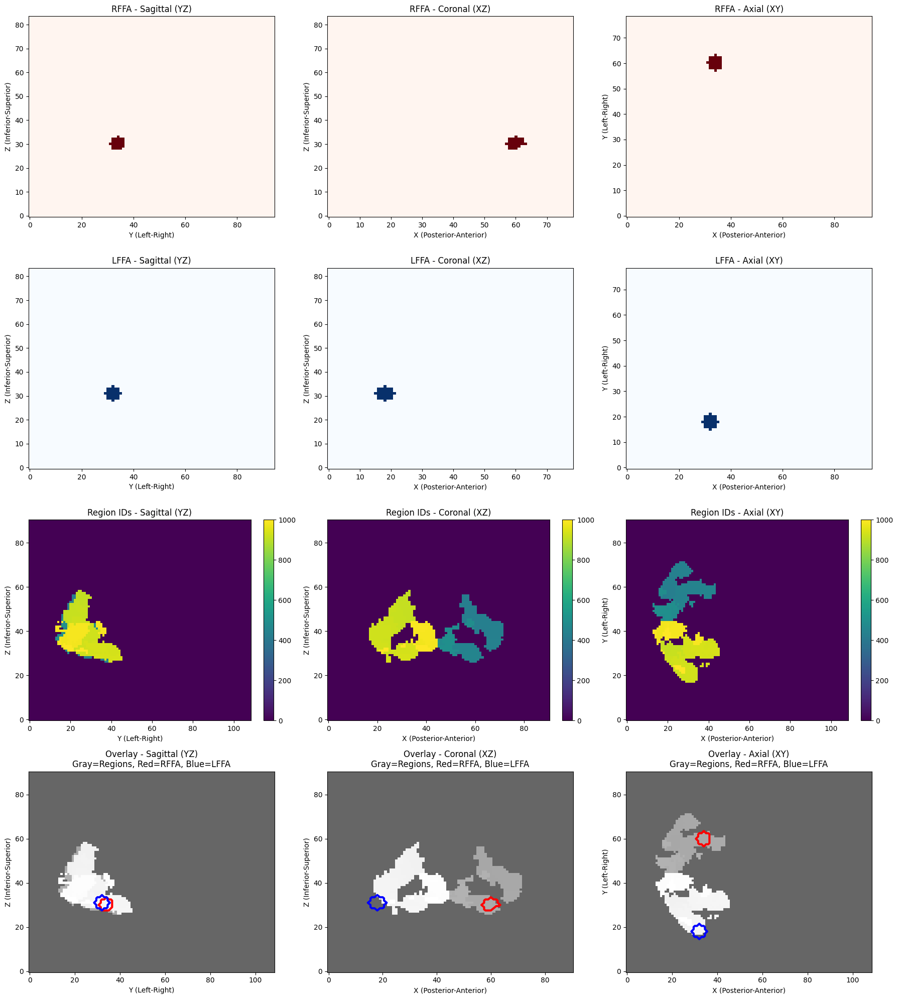

regions_2d shape = (902629,)


IndexError: boolean index did not match indexed array along dimension 0; dimension is 91 but corresponding boolean dimension is 79

In [ ]:
#work with the FFA masks

import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

def load_and_reshape_data(file_path):
    """Load region data and reshape to 3D"""
    regions_2d = np.load(file_path, mmap_mode='r')
    print("regions_2d shape =", regions_2d.shape)
    regions_3d = regions_2d.reshape(91, 109, 91)
    return regions_3d

def plot_roi_and_regions_projections(rffa_file, lffa_file, regions_file):
    # Load the masks
    rffa_img = nib.load(rffa_file)
    lffa_img = nib.load(lffa_file)
    
    rffa_data = rffa_img.get_fdata().astype(bool)
    lffa_data = lffa_img.get_fdata().astype(bool)
    
    print(f"RFFA shape: {rffa_data.shape}")
    print(f"LFFA shape: {lffa_data.shape}")
    
    # Load and reshape the regions data using your function
    regions_data_3d = load_and_reshape_data(regions_file)
    print(f"Regions 3D shape: {regions_data_3d.shape}")
    print(f"Unique values in regions: {np.unique(regions_data_3d)[:10]}...")
    
    # Create projections for ROIs
    rffa_sag = np.any(rffa_data, axis=0).astype(float)
    rffa_cor = np.any(rffa_data, axis=1).astype(float)
    rffa_axi = np.any(rffa_data, axis=2).astype(float)
    
    lffa_sag = np.any(lffa_data, axis=0).astype(float)
    lffa_cor = np.any(lffa_data, axis=1).astype(float)
    lffa_axi = np.any(lffa_data, axis=2).astype(float)
    
    # Create projections for regions (max projection to preserve region IDs)
    regions_sag = np.max(regions_data_3d, axis=0)  # Max along X
    regions_cor = np.max(regions_data_3d, axis=1)  # Max along Y
    regions_axi = np.max(regions_data_3d, axis=2)  # Max along Z
    
    # Create the plot with 4 rows
    fig, axes = plt.subplots(4, 3, figsize=(18, 20))
    
    # Row 1: RFFA projections
    axes[0,0].imshow(rffa_sag.T, origin='lower', cmap='Reds', aspect='auto')
    axes[0,0].set_title('RFFA - Sagittal (YZ)')
    axes[0,0].set_xlabel('Y (Left-Right)')
    axes[0,0].set_ylabel('Z (Inferior-Superior)')
    
    axes[0,1].imshow(rffa_cor.T, origin='lower', cmap='Reds', aspect='auto')
    axes[0,1].set_title('RFFA - Coronal (XZ)')
    axes[0,1].set_xlabel('X (Posterior-Anterior)')
    axes[0,1].set_ylabel('Z (Inferior-Superior)')
    
    axes[0,2].imshow(rffa_axi, origin='lower', cmap='Reds', aspect='auto')
    axes[0,2].set_title('RFFA - Axial (XY)')
    axes[0,2].set_xlabel('X (Posterior-Anterior)')
    axes[0,2].set_ylabel('Y (Left-Right)')
    
    # Row 2: LFFA projections
    axes[1,0].imshow(lffa_sag.T, origin='lower', cmap='Blues', aspect='auto')
    axes[1,0].set_title('LFFA - Sagittal (YZ)')
    axes[1,0].set_xlabel('Y (Left-Right)')
    axes[1,0].set_ylabel('Z (Inferior-Superior)')
    
    axes[1,1].imshow(lffa_cor.T, origin='lower', cmap='Blues', aspect='auto')
    axes[1,1].set_title('LFFA - Coronal (XZ)')
    axes[1,1].set_xlabel('X (Posterior-Anterior)')
    axes[1,1].set_ylabel('Z (Inferior-Superior)')
    
    axes[1,2].imshow(lffa_axi, origin='lower', cmap='Blues', aspect='auto')
    axes[1,2].set_title('LFFA - Axial (XY)')
    axes[1,2].set_xlabel('X (Posterior-Anterior)')
    axes[1,2].set_ylabel('Y (Left-Right)')
    
    # Row 3: Region IDs projections
    im1 = axes[2,0].imshow(regions_sag.T, origin='lower', cmap='viridis', aspect='auto')
    axes[2,0].set_title('Region IDs - Sagittal (YZ)')
    axes[2,0].set_xlabel('Y (Left-Right)')
    axes[2,0].set_ylabel('Z (Inferior-Superior)')
    plt.colorbar(im1, ax=axes[2,0], fraction=0.046)
    
    im2 = axes[2,1].imshow(regions_cor.T, origin='lower', cmap='viridis', aspect='auto')
    axes[2,1].set_title('Region IDs - Coronal (XZ)')
    axes[2,1].set_xlabel('X (Posterior-Anterior)')
    axes[2,1].set_ylabel('Z (Inferior-Superior)')
    plt.colorbar(im2, ax=axes[2,1], fraction=0.046)
    
    im3 = axes[2,2].imshow(regions_axi, origin='lower', cmap='viridis', aspect='auto')
    axes[2,2].set_title('Region IDs - Axial (XY)')
    axes[2,2].set_xlabel('X (Posterior-Anterior)')
    axes[2,2].set_ylabel('Y (Left-Right)')
    plt.colorbar(im3, ax=axes[2,2], fraction=0.046)
    
    # Row 4: Combined overlay with contours
    axes[3,0].imshow(regions_sag.T, origin='lower', cmap='gray', aspect='auto', alpha=0.6)
    axes[3,0].contour(rffa_sag.T, levels=[0.5], colors='red', linewidths=3)
    axes[3,0].contour(lffa_sag.T, levels=[0.5], colors='blue', linewidths=3)
    axes[3,0].set_title('Overlay - Sagittal (YZ)\nGray=Regions, Red=RFFA, Blue=LFFA')
    axes[3,0].set_xlabel('Y (Left-Right)')
    axes[3,0].set_ylabel('Z (Inferior-Superior)')
    
    axes[3,1].imshow(regions_cor.T, origin='lower', cmap='gray', aspect='auto', alpha=0.6)
    axes[3,1].contour(rffa_cor.T, levels=[0.5], colors='red', linewidths=3)
    axes[3,1].contour(lffa_cor.T, levels=[0.5], colors='blue', linewidths=3)
    axes[3,1].set_title('Overlay - Coronal (XZ)\nGray=Regions, Red=RFFA, Blue=LFFA')
    axes[3,1].set_xlabel('X (Posterior-Anterior)')
    axes[3,1].set_ylabel('Z (Inferior-Superior)')
    
    axes[3,2].imshow(regions_axi, origin='lower', cmap='gray', aspect='auto', alpha=0.6)
    axes[3,2].contour(rffa_axi, levels=[0.5], colors='red', linewidths=3)
    axes[3,2].contour(lffa_axi, levels=[0.5], colors='blue', linewidths=3)
    axes[3,2].set_title('Overlay - Axial (XY)\nGray=Regions, Red=RFFA, Blue=LFFA')
    axes[3,2].set_xlabel('X (Posterior-Anterior)')
    axes[3,2].set_ylabel('Y (Left-Right)')
    
    plt.tight_layout()
    return fig, regions_data_3d

# Additional function to analyze which regions overlap with your ROIs
def analyze_roi_regions(rffa_file, lffa_file, regions_file):
    """Analyze which region IDs overlap with your FFA ROIs"""
    rffa_data = nib.load(rffa_file).get_fdata().astype(bool)
    lffa_data = nib.load(lffa_file).get_fdata().astype(bool)
    regions_data_3d = load_and_reshape_data(regions_file)
    
    # Find which regions overlap with each ROI
    rffa_regions = np.unique(regions_data_3d[rffa_data])
    lffa_regions = np.unique(regions_data_3d[lffa_data])
    
    print("Region IDs that overlap with RFFA:")
    print(rffa_regions)
    print(f"Number of regions in RFFA: {len(rffa_regions)}")
    
    print("\nRegion IDs that overlap with LFFA:")
    print(lffa_regions)
    print(f"Number of regions in LFFA: {len(lffa_regions)}")
    
    print("\nCommon regions between RFFA and LFFA:")
    common_regions = np.intersect1d(rffa_regions, lffa_regions)
    print(common_regions)
    
    return rffa_regions, lffa_regions, common_regions

# Usage
fig_main, regions_3d = plot_roi_and_regions_projections('RFFA_roi.nii.gz', 'LFFA_roi.nii.gz', 'region_ids_4609+.npy')
plt.show()

# Analyze which regions your ROIs overlap with
rffa_regions, lffa_regions, common_regions = analyze_roi_regions('RFFA_roi.nii.gz', 'LFFA_roi.nii.gz', 'region_ids_4609+.npy')

# If you want to look at specific regions (example: regions 100-200)
# fig_specific = plot_specific_regions('RFFA_roi.nii.gz', 'LFFA_roi.nii.gz', 'region_ids_4609+.npy', 
#                                     target_region_ids=range(100, 201))
# plt.show()

In [5]:
mask_img = nib.load('RFFA_roi.nii.gz')

from nilearn import plotting

# Interactive glass brain view
plotting.view_img(mask_img, threshold=0.1, cmap='hot', 
                  title='RFFA ROI - Interactive View')

NameError: name 'nib' is not defined

preparing data...
testing decoder /media/RCPNAS/MIP/Michael/students_work/rodrigo/temporal_decoder_4609_352_TRwindow3_l1_1e-08
Start testing:
### Testing decoder on inputs of shape ['TR', 3, 4609] over 1 videos ###
input_tensor shape before test_loader:  torch.Size([28, 3, 3, 112, 112])
label_tensor shape before test_loader:  torch.Size([28, 3, 3, 112, 112])
input shape to generate model_output = torch.Size([16, 3, 4609])
model_output shape just after generating = torch.Size([16, 3, 3, 112, 112])
input shape to generate model_output = torch.Size([12, 3, 4609])
model_output shape just after generating = torch.Size([12, 3, 3, 112, 112])
Calculating losses for plots...
### subdict1 (28) ###


/home/ralmeida/miniconda3/envs/machinelearnin/lib/python3.8/site-packages/pytorch_msssim/ssim.py:50: UserWarning: Skipping Gaussian Smoothing at dimension 2+0 for input: torch.Size([1, 3, 3, 112, 112]) and win size: 11
  warnings.warn(


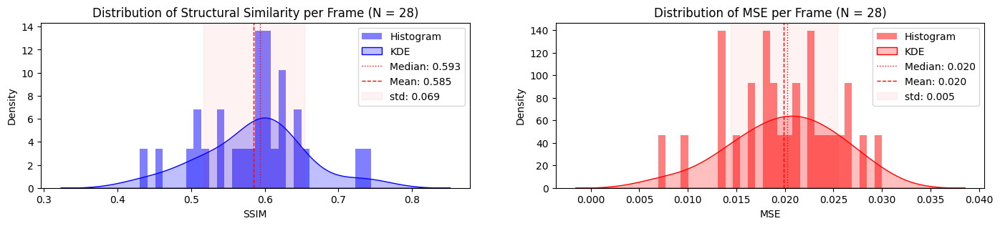

Display 10 frames: [ 0  3  6  9 12 15 18 21 24 27]


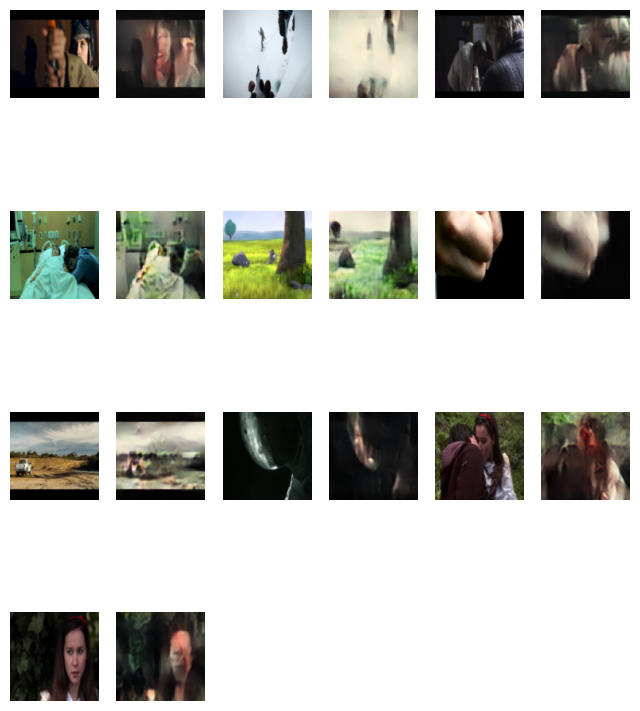

### all (28) ###


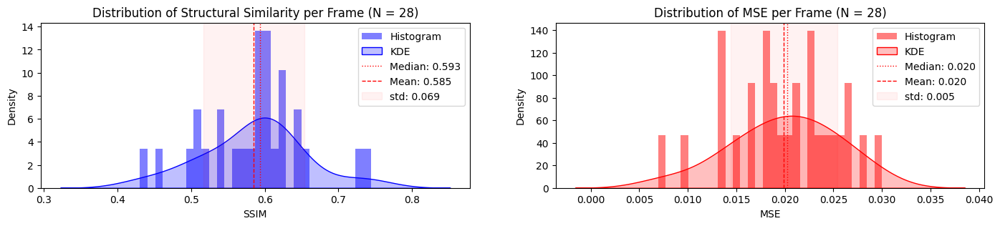

Testing completed. Total time: 0.05 minutes
---


In [ ]:
#tag test decoder on train

import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1,2,3"

from dataset_new import *
from models_new_2 import *
from visualisation_new_2 import *
from perturbation import *


### data loading ###

dataset_ID = 6661 # ID of a specific dataset. 6661 refer to preprocessed data with a mask of shape (4609,). 6660 refers to preprocessed data with a mask of shape (15364,)
mask_size = 4609 # number of voxels in the preprocessed fMRI data. either 4609 or 15364
trainset, valset, testset = get_dataset(dataset_ID, mask_size) # data are loaded into dictionaries


def prepare_temporal_data(fmri_data, all_frames, window_size=5):
    """
    Prepare temporal data with overlapping windows of TRs and their corresponding middle frames
    
    Args:
        fmri_data: Original fMRI data, shape (n_trs, mask_size)
        all_frames: All video frames, organized by TR, shape (n_trs, 3, 112, 112, 32)
        window_size: Number of consecutive TRs to use
    
    Returns:
        tr_windows: Windows of consecutive TRs
        frame_targets: Middle frames for each TR in the windows
    """
    n_trs = fmri_data.shape[0]
    tr_windows = []
    frame_targets = []

    print("preparing data...")
    
    # Create sliding windows of TRs
    for i in range(n_trs - window_size + 1):
        # Get window of TRs
        tr_window = fmri_data[i:i+window_size]
        tr_windows.append(tr_window)
        
        # Get middle frame for each TR in the window
        frames_for_window = []
        for j in range(window_size):
            # Get middle frame (assuming 32 frames per TR)
            middle_frame_idx = 15  # Middle of 32 frames (0-indexed, so 15 is the 16th frame)
            middle_frame = all_frames[i+j, :, :, :, middle_frame_idx]  # CORRECTED INDEXING
            frames_for_window.append(middle_frame)
        
        frame_targets.append(np.stack(frames_for_window))
    
    return np.array(tr_windows), np.array(frame_targets)

window_size = 3  # Number of consecutive TRs to use

#specific_frames_train = [681, 248, 3008, 1561, 1821, 2639, 467, 3558, 2173, 2119]
specific_frames_train = [681,681,681, 248,248,248, 3008,3008,3008, 1561, 1561, 1561, 1821, 1821, 1821, 2639, 2639, 2639, 467,467,467, 3558,3558,3558, 2173,2173,2173, 2119, 2119, 2119]
trainset2 = {
    "fMRIs": {
        "subdict1": {}
    },
    "videos": {
        "subdict1": {}
    }
}

# Process training data to create temporal windows
trainset2['fMRIs']["subdict1"], trainset2['videos']["subdict1"] = prepare_temporal_data(
    trainset['fMRIs'][specific_frames_train], 
    trainset['videos'][specific_frames_train], 
    window_size=window_size
)






def test_new_decoder(real=True, model_name='decoder_4609_1650', test_on_train=False, test_input = testset['fMRIs'], test_label = testset['videos'], add_name='', regions = [], temporal=False):
    '''
    Tests the decoder
    if real=False (default) -> tests on brain activity coming from encoder
    if real=True -> tests on real brain activity
    model_name is the name of the file with the model to be used
    test_on_train is for testing on the trainset
    test_input has the fMRIs for testing. Should be a dictionary with one subdictionary for each film.
    Each subdictionary is shaped (N, 4609) where N is the number of TRs for that film
    test_label has the films. Also one subdictionary for each film
    add_name is for adding something to the end of the name so the output isnt just the names of the film and model, so that doesnt get overwritten
    regions is an array with all the ids of the regions we wish to turn off for this run, for instance
    regions=[1,4,5] would turn off regions 1, 4 and 5. Look at turn_off_regions for what is the region of each ID
    '''
    print("testing decoder", model_name)

#    if regions != []:
#        fmri_regions_off = test_input.copy()
#        for video_name in test_input.keys():
#            fmri_regions_off[video_name] = turn_off_regions(test_input[video_name], regions)
#        test_input = fmri_regions_off
    

    #load decoder part of encoder decoder
    model = TemporalDecoder(mask_size)
#    model = Decoder(mask_size)
    #save_model_as = 'decoder_4609_50'
    #save_model_as = 'decoder_4609_1650'
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    #model = model1.decoder

    #load data
#    if real:
#        test_input = testset['fMRIs']
#        test_label = testset['videos']
#    else:
    if not real:
        test_input = model1.encoder(testset['videos'])
        test_label = testset['videos']

    if test_on_train:
        num_samples = trainset["fMRIs"].shape[0]

        # Generate random indices based on that number
        random_indices = np.random.choice(num_samples, size=30, replace=False)

        # Create the testset with random samples
        testset2 = {
            "fMRIs": {
                "test": trainset["fMRIs"][random_indices]  # Shape will be (30, 4609)
            },
            "videos": {
                "test": trainset["videos"][random_indices]  # Shape will be (30, 3, 112, 112, 32)
            }
        }
        test_input = testset2['fMRIs']
        test_label = testset2['videos']


    criterion = Temporal_D_Loss()
#    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder=None
    model_to_test='decoder'
    statistical_testing = False
    display_plots = True
    save_plots = False

    test_model(test_input, test_label, model, criterion, device, pretrained_decoder, model_to_test, statistical_testing, display_plots, save_plots, model_name=model_name + add_name, temporal=temporal)
    return


#test_new_decoder(real=True, model_name='/media/RCPNAS/MIP/Michael/students_work/rodrigo/temporal_decoder_4609_350', test_input = trainset2['fMRIs'], test_label = trainset2['videos'], regions=[], add_name='', temporal=True)

test_new_decoder(real=True, model_name='/media/RCPNAS/MIP/Michael/students_work/rodrigo/temporal_decoder_4609_352_TRwindow3_l1_1e-08', test_input = trainset2['fMRIs'], test_label = trainset2['videos'], regions=[], add_name='', temporal=True)


#test_new_decoder(real=True, model_name='/media/RCPNAS/MIP/Michael/students_work/rodrigo/temporal_decoder_4609_351_TRwindow5', test_input = trainset2['fMRIs'], test_label = trainset2['videos'], regions=[], add_name='', temporal=True)




In [4]:
#tag test decoder


import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1,2,3"

from dataset_new import *
from models_new_2 import *
from visualisation_new_2 import *
from perturbation import *


### data loading ###

dataset_ID = 6661 # ID of a specific dataset. 6661 refer to preprocessed data with a mask of shape (4609,). 6660 refers to preprocessed data with a mask of shape (15364,)
mask_size = 4609 # number of voxels in the preprocessed fMRI data. either 4609 or 15364
trainset, valset, testset = get_dataset(dataset_ID, mask_size) # data are loaded into dictionaries

print_dict_tree(testset)


testset2 = {
    "fMRIs": {
        "Chatter": np.load("processed_data/sub-S01/test/Chatter.npy"),
        "BetweenViewings": np.load("processed_data/sub-S01/test/BetweenViewings.npy"),
        "AfterTheRain": np.load("processed_data/sub-S01/test/AfterTheRain.npy")
        #"Sintel": np.load("processed_data/sub-S01/test/Sintel.npy"),
        #"Payload": np.load("processed_data/sub-S01/test/Payload.npy"),
        #"Chatter": np.load("processed_data/sub-S01/test/Chatter.npy")
        #"BetweenViewings": np.load("processed_data/sub-S01/test/BetweenViewings.npy")
    },
    "videos": {
        #"Sintel": np.load("processed_data/videos/test/Sintel.npy"),
        #"Payload": np.load("processed_data/videos/test/Payload.npy"),
        "Chatter": np.load("processed_data/videos/test/Chatter.npy"),
        "BetweenViewings": np.load("processed_data/videos/test/BetweenViewings.npy"),
        "AfterTheRain": np.load("processed_data/videos/test/AfterTheRain.npy")
    }
}

print_dict_tree(testset2)


def prepare_temporal_data_by_movie(fmri_data_dict, video_data_dict, window_size=3):
    """
    Prepare temporal data with overlapping windows of TRs and their corresponding middle frames,
    separately for each movie.
    
    Args:
        fmri_data_dict: Dictionary of fMRI data per movie, where keys are movie names and 
                        values have shape (n_trs, mask_size)
        video_data_dict: Dictionary of video frames per movie, where keys are movie names and 
                         values have shape (n_trs, 3, 112, 112, 32)
        window_size: Number of consecutive TRs to use
    
    Returns:
        tr_windows_dict: Dictionary of windows of consecutive TRs per movie
        frame_targets_dict: Dictionary of middle frames for each TR in the windows per movie
    """
    tr_windows_dict = {}
    frame_targets_dict = {}
    
    # Process each movie separately
    for movie_name in fmri_data_dict.keys():
        fmri_data = fmri_data_dict[movie_name]
        all_frames = video_data_dict[movie_name]
        
        n_trs = fmri_data.shape[0]
        tr_windows = []
        frame_targets = []
        
        # Create sliding windows of TRs
        for i in range(n_trs - window_size + 1):
            # Get window of TRs
            tr_window = fmri_data[i:i+window_size]
            tr_windows.append(tr_window)
            
            # Get middle frame for each TR in the window
            frames_for_window = []
            for j in range(window_size):
                # Get middle frame (assuming 32 frames per TR)
                middle_frame_idx = 15  # Middle of 32 frames (0-indexed, so 15 is the 16th frame)
                middle_frame = all_frames[i+j, :, :, :, middle_frame_idx]
                frames_for_window.append(middle_frame)
            
            frame_targets.append(np.stack(frames_for_window))
        
        # Store results for this movie
        tr_windows_dict[movie_name] = np.array(tr_windows)
        frame_targets_dict[movie_name] = np.array(frame_targets)
    
    return tr_windows_dict, frame_targets_dict


window_size = 3 

testset3 = {
    "fMRIs": {},
    "videos": {}
}

testset3['fMRIs'], testset3['videos'] = prepare_temporal_data_by_movie(
    testset['fMRIs'], 
    testset['videos'], 
    window_size=window_size
)

trainset_temp = {
    "fMRIs": {},
    "videos": {}
}

'''
trainset_temp['fMRIs'], trainset_temp['videos'] = prepare_temporal_data_by_movie(
    trainset2['fMRIs'][specific_frames_train], 
    trainset2['videos'][specific_frames_train], 
    #filtered_trainset['fMRIs'], 
    #filtered_trainset['videos'], 
    window_size=window_size
)
'''

#fmri_subdict = {'all_movies': trainset2['fMRIs'][specific_frames_train]}
#video_subdict = {'all_movies': trainset2['videos'][specific_frames_train]}

#trainset_temp['fMRIs'], trainset_temp['videos'] = prepare_temporal_data_by_movie(
#    fmri_subdict,
#    video_subdict,
#    window_size=window_size
#)



print_dict_tree(testset3)
print("testset3 videos =", testset3["videos"].keys())



specific_frames_train = [681,681,681, 248,248,248, 3008,3008,3008, 1561, 1561, 1561, 1821, 1821, 1821, 2639, 2639, 2639, 467,467,467, 3558,3558,3558, 2173,2173,2173, 2119, 2119, 2119]
testset_small = {
    "fMRIs": {
        "subdict1": {}
    },
    "videos": {
        "subdict1": {}
    }
}

# Process training data to create temporal windows
#testset_small['fMRIs']["subdict1"], testset_small['videos']["subdict1"] = prepare_temporal_data(
#    testset['fMRIs'][specific_frames_train], 
#    testset['videos'][specific_frames_train], 
#    window_size=window_size
#)


#tag test decoder


def test_new_decoder(real=True, model_name='decoder_4609_1650', test_on_train=False, test_input = testset['fMRIs'], test_label = testset['videos'], add_name='', regions = [], temporal=False, save_plots=False):
    '''
    Tests the decoder
    if real=False (default) -> tests on brain activity coming from encoder
    if real=True -> tests on real brain activity
    model_name is the name of the file with the model to be used
    test_on_train is for testing on the trainset
    test_input has the fMRIs for testing. Should be a dictionary with one subdictionary for each film.
    Each subdictionary is shaped (N, 4609) where N is the number of TRs for that film
    test_label has the films. Also one subdictionary for each film
    add_name is for adding something to the end of the name so the output isnt just the names of the film and model, so that doesnt get overwritten
    regions is an array with all the ids of the regions we wish to turn off for this run, for instance
    regions=[1,4,5] would turn off regions 1, 4 and 5. Look at turn_off_regions for what is the region of each ID
    '''
    print("testing decoder", model_name)

#    if regions != []:
#        fmri_regions_off = test_input.copy()
#        for video_name in test_input.keys():
#            fmri_regions_off[video_name] = turn_off_regions(test_input[video_name], regions)
#        test_input = fmri_regions_off
    

    #load decoder part of encoder decoder
    if temporal:
        model = TemporalDecoder(mask_size)
    else:
        model = Decoder(mask_size)
    #save_model_as = 'decoder_4609_50'
    #save_model_as = 'decoder_4609_1650'
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    #model = model1.decoder

    #load data
#    if real:
#        test_input = testset['fMRIs']
#        test_label = testset['videos']
#    else:
    if not real:
        test_input = model1.encoder(testset['videos'])
        test_label = testset['videos']

    if test_on_train:
        num_samples = trainset["fMRIs"].shape[0]

        # Generate random indices based on that number
        random_indices = np.random.choice(num_samples, size=30, replace=False)

        # Create the testset with random samples
        testset2 = {
            "fMRIs": {
                "test": trainset["fMRIs"][random_indices]  # Shape will be (30, 4609)
            },
            "videos": {
                "test": trainset["videos"][random_indices]  # Shape will be (30, 3, 112, 112, 32)
            }
        }
        test_input = testset2['fMRIs']
        test_label = testset2['videos']


    if temporal:
        criterion = Temporal_D_Loss()
    else:
        criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder=None
    model_to_test='decoder'
    statistical_testing = False
    display_plots = True
    save_plots = save_plots

    test_model(test_input, test_label, model, criterion, device, pretrained_decoder, model_to_test, statistical_testing, display_plots, save_plots, model_name=model_name + add_name, temporal=temporal)
    return


#test_new_decoder(real=True, model_name='/media/RCPNAS/MIP/Michael/students_work/rodrigo/temporal_decoder_4609_350', test_input = testset3['fMRIs'], test_label = testset3['videos'], regions=[], add_name='', temporal=True)

#test_new_decoder(real=True, model_name='/media/RCPNAS/MIP/Michael/students_work/rodrigo/temporal_decoder_4609_351_TRwindow5', test_input = testset3['fMRIs'], test_label = testset3['videos'], regions=[], add_name='', temporal=True)

test_new_decoder(real=True, model_name='../temporal_decoder_4609_352_TRwindow3_l1_1e-08', test_input = testset3['fMRIs'], test_label = testset3['videos'], regions=[], add_name='', temporal=True, save_plots=True)
#test_new_decoder(real=True, model_name='../temporal_decoder_4609_350', test_input = testset3['fMRIs'], test_label = testset3['videos'], regions=[], add_name='', temporal=True, save_plots=True)



#test_new_decoder(real=True, model_name='/media/RCPNAS/MIP/Michael/students_work/rodrigo/decoder_all_4609_325', test_input = testset2['fMRIs'], test_label = testset2['videos'], regions=[], add_name='', save_plots=True, temporal=False)
#test_new_decoder(real=True, model_name='../temporal_decoder_4609_352_TRwindow3_l1_1e-08', test_input = trainset_temp['fMRIs'], test_label = trainset_temp['videos'], regions=[], add_name='', save_plots=True, temporal=False)


#test_new_decoder(real=True, model_name='/media/RCPNAS/MIP/Michael/students_work/rodrigo/decoder_all_4609_325', test_input = testset2['fMRIs'], test_label = testset2['videos'], regions=[], add_name='', save_plots=True, temporal=False)

#test_new_decoder(real=True, model_name='/media/RCPNAS/MIP/Michael/students_work/rodrigo/decoder_avg_4609_350', test_input = testset2['fMRIs'], test_label = testset2['videos'], regions=[], add_name='')

#test_new_decoder(real=True, model_name='/media/RCPNAS/MIP/Michael/students_work/rodrigo/decoder_avg_and_subj1_4609_350', test_input = testset2['fMRIs'], test_label = testset2['videos'], regions=[], add_name='')

#test_new_decoder(real=True, model_name='decoder_4609_350', test_input = testset2['fMRIs'], test_label = testset2['videos'], regions=[], add_name='')



AttributeError: partially initialized module 'torch' has no attribute 'autocast_mode' (most likely due to a circular import)

In [3]:
#testing new decoder

#testing the decoder

def turn_off_regions(input_fmri, regions):
    #input_fmri should be an array with a shape [N, 4609], where N is number of TRs
    #regions should be like [1,4,6,7] if we want to turn off regions 1, 4, 6 and 7, according to:
#    '17networks_LH_VisualA_ExStr': [420, 450],                  #region 1
#    '17networks_LH_VisualB_Striate': [478, 488],                #region 2
#    '17networks_LH_VisualC_ExStr': [489, 496],                  #region 3
#    '17networks_LH_VisualC_Striate': [497, 500],                #region 4
#    '17networks_RH_VisualA_ExStr': [910, 940],                  #region 5
#    '17networks_RH_VisualB_Striate': [976, 991],                #region 6
#    '17networks_RH_VisualC_ExStr': [992, 1000]}                 #region 7

    region_ids = np.load('region_ids_4609.npy')
    #region_ids is like [5,5,5,4,1,1,1,1,2,2,...] meaning that the first 3 voxels of the input_fmri arrays
    #                                             are from region 5, the following one from region 4, 
    #                                             following four from region 1, etc

    indices = []
    for region_id in regions:
        indices.extend(np.where(region_ids == region_id)[0].tolist())

    fmri2 = input_fmri.copy()
    fmri2[:, indices] = 0
    return fmri2

def test_new_decoder(real=True, model_name='decoder_4609_1650', test_on_train=False, test_input = testset['fMRIs'], test_label = testset['videos'], add_name='', regions = []):
    '''
    Tests the decoder
    if real=False (default) -> tests on brain activity coming from encoder
    if real=True -> tests on real brain activity
    model_name is the name of the file with the model to be used
    test_on_train is for testing on the trainset
    test_input has the fMRIs for testing. Should be a dictionary with one subdictionary for each film.
    Each subdictionary is shaped (N, 4609) where N is the number of TRs for that film
    test_label has the films. Also one subdictionary for each film
    add_name is for adding something to the end of the name so the output isnt just the names of the film and model, so that doesnt get overwritten
    regions is an array with all the ids of the regions we wish to turn off for this run, for instance
    regions=[1,4,5] would turn off regions 1, 4 and 5. Look at turn_off_regions for what is the region of each ID
    '''
    print("testing decoder", model_name)

    if regions != []:
        fmri_regions_off = test_input.copy()
        for video_name in test_input.keys():
            fmri_regions_off[video_name] = turn_off_regions(test_input[video_name], regions)
        test_input = fmri_regions_off
    

    #load decoder part of encoder decoder
    model = Decoder(mask_size)
    #save_model_as = 'decoder_4609_50'
    #save_model_as = 'decoder_4609_1650'
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    #model = model1.decoder

    #load data
#    if real:
#        test_input = testset['fMRIs']
#        test_label = testset['videos']
#    else:
    if not real:
        test_input = model1.encoder(testset['videos'])
        test_label = testset['videos']

    if test_on_train:
        num_samples = trainset["fMRIs"].shape[0]

        # Generate random indices based on that number
        random_indices = np.random.choice(num_samples, size=30, replace=False)

        # Create the testset with random samples
        testset2 = {
            "fMRIs": {
                "test": trainset["fMRIs"][random_indices]  # Shape will be (30, 4609)
            },
            "videos": {
                "test": trainset["videos"][random_indices]  # Shape will be (30, 3, 112, 112, 32)
            }
        }
        test_input = testset2['fMRIs']
        test_label = testset2['videos']


    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder=None
    model_to_test='decoder'
    statistical_testing = False
    display_plots = True
    save_plots = True

    test_model(test_input, test_label, model, criterion, device, pretrained_decoder, model_to_test, statistical_testing, display_plots, save_plots, model_name=model_name + add_name)
    return


#test_new_decoder(real=True, model_name='decoder_4609_3200')
#test_new_decoder(real=True, model_name='decoder_4609_1650')
#test_new_decoder(real=True, model_name='decoder_4609_700')
#test_new_decoder(real=True, model_name='decoder_4609_230', test_on_train=False)
test_new_decoder(real=True, model_name='decoder_4609_230', regions=[1,2,3,4,5,6], add_name='_regions_123456_off')
#test_new_decoder(real=True, model_name='new_decoder_4609_1650')
#test_new_decoder(real=True, model_name='new_decoder_4609_25')
#test_new_decoder(real=True, model_name='decoder_4609_50')
#test_new_decoder(real=True, model_name='decoder_4609_11')

#test_decoder_real()
#test_decoder_encoded()

#model = Decoder(mask_size)
#decoded = model(test_input)

#lets see if I can plot the 10 images with the best SSIM




NameError: name 'testset' is not defined

### Perturbing voxels

In [ ]:
#randomly


#perturb_size = 0.3      #between 0 and 1 (1 means all voxels are turned to 0)

def mask_random_voxels(data_dict, mask_percentage=0.3):
    # Calculate number of voxels to mask
    total_voxels = 4609
    voxels_to_mask = int(total_voxels * mask_percentage)
    
    # Generate random indices to mask
    mask_indices = np.random.choice(total_voxels, voxels_to_mask, replace=False)
    
    masked_data = {}
    
    # Apply masking to each video/scan in the dictionary
    for key, value in data_dict.items():
        # Copy the array
        masked_array = value.copy()
        
        # Set the selected voxels to 0 for all time points
        masked_array[:, mask_indices] = 0
        
        # Store in new dictionary
        masked_data[key] = masked_array
    
    return masked_data

og_voxels = testset['fMRIs'].copy()
perturb_size = 0.3

masked2 = mask_random_voxels(og_voxels, perturb_size)
print_dict_tree(masked2)

test_new_decoder(real=True, model_name='decoder_4609_230', test_on_train=False)
test_new_decoder(real=True, model_name='decoder_4609_230', test_on_train=False, test_input = masked2)
#test_new_decoder(real=True, model_name='decoder_4609_1650', test_on_train=False, test_input = testset['fMRIs'], test_label = testset['videos'])




'''
def test_mask(model_name='decoder_4609_230', test_on_train=False, test_input = testset['fMRIs'], test_label = testset['videos'], video_name='Chatter'):
    '''
    Tests the decoder
    if real=False (default) -> tests on brain activity coming from encoder
    if real=True -> tests on real brain activity
    '''
    print("testing decoder", model_name)

    #load decoder
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)

    #load data
#    if real:
#        test_input = testset['fMRIs']
#        test_label = testset['videos']
#    else:
    if not real:
        test_input = model1.encoder(testset['videos'])
        test_label = testset['videos']

    if test_on_train:
        num_samples = trainset["fMRIs"].shape[0]

        # Generate random indices based on that number
        random_indices = np.random.choice(num_samples, size=30, replace=False)

        # Create the testset with random samples
        testset2 = {
            "fMRIs": {
                "test": trainset["fMRIs"][random_indices]  # Shape will be (30, 4609)
            },
            "videos": {
                "test": trainset["videos"][random_indices]  # Shape will be (30, 3, 112, 112, 32)
            }
        }
        test_input = testset2['fMRIs']
        test_label = testset2['videos']


    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder=None
    model_to_test='decoder'
    statistical_testing = False
    display_plots = True
    save_plots = True

    test_model(test_input, test_label, model, criterion, device, pretrained_decoder, model_to_test, statistical_testing, display_plots, save_plots, model_name=model_name)
    return

'''




Sintel (shape: (111, 4609))
Payload (shape: (155, 4609))
TearsOfSteel (shape: (91, 4609))
Superhero (shape: (158, 4609))
BigBuckBunny (shape: (76, 4609))
FirstBite (shape: (92, 4609))
BetweenViewings (shape: (125, 4609))
AfterTheRain (shape: (77, 4609))
TheSecretNumber (shape: (121, 4609))
Chatter (shape: (63, 4609))
Spaceman (shape: (124, 4609))
LessonLearned (shape: (103, 4609))
YouAgain (shape: (613, 4609))
ToClaireFromSonny (shape: (62, 4609))
testing decoder decoder_4609_230
Start testing:
### Testing decoder on inputs of shape ['TR', 4609] over 14 videos ###


KeyboardInterrupt: 

: 

In [ ]:
#turning specified regions to 0


def turn_off_regions(input_fmri, regions):
    #input_fmri should be an array with a shape [N, 4609], where N is number of TRs
    #regions should be like [1,4,6,7] if we want to turn off regions 1, 4, 6 and 7, according to:
#    '17networks_LH_VisualA_ExStr': [420, 450],                  #region 1
#    '17networks_LH_VisualB_Striate': [478, 488],                #region 2
#    '17networks_LH_VisualC_ExStr': [489, 496],                  #region 3
#    '17networks_LH_VisualC_Striate': [497, 500],                #region 4
#    '17networks_RH_VisualA_ExStr': [910, 940],                  #region 5
#    '17networks_RH_VisualB_Striate': [976, 991],                #region 6
#    '17networks_RH_VisualC_ExStr': [992, 1000]}                 #region 7

    region_ids = np.load('region_ids_4609.npy')
    #region_ids is like [5,5,5,4,1,1,1,1,2,2,...] meaning that the first 3 voxels of the input_fmri arrays
    #                                             are from region 5, the following one from region 4, 
    #                                             following four from region 1, etc

    indices = []
    for region_id in regions:
        indices.extend(np.where(region_ids == region_id)[0].tolist())

    fmri2 = input_fmri.copy()
    fmri2[:, indices] = 0
    return fmri2

def test_decoder_with_regions_off(real=True, model_name='decoder_4609_1650', test_on_train=False, test_input = testset['fMRIs'], test_label = testset['videos'], regions):
    
    fmri_regions_off = test_input.copy()
    for video_name in test_input.keys:
        fmri_regions_off[video_name] = turn_off_regions(test_input[video_name], regions)

    test_new_decoder(real, model_name, test_on_train, fmri_regions_off, test_label)



test_new_decoder





: 

### try testing it on the training data to see if its overfitting

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random
import os
import copy

def format_train_data_for_testing(trainset, num_samples=10, random_seed=42, create_movie_clips=False):
    """
    Formats training data to match the structure of test data for fMRI-to-video decoding.
    
    Parameters:
    -----------
    trainset : dict
        Dictionary containing training data with 'fMRIs' and 'videos' keys.
    num_samples : int, optional
        Number of random samples to select from training data. Default is 10.
    random_seed : int, optional
        Random seed for reproducibility. Default is 42.
    create_movie_clips : bool, optional
        If True, creates movie clip-like structure with names like in the test set.
        If False, creates generic sample names. Default is False.
        
    Returns:
    --------
    dict
        Formatted training data matching test set structure with nested dictionaries.
    """
    # Set random seed for reproducibility
    np.random.seed(random_seed)
    random.seed(random_seed)
    
    # Get total number of samples in training data
    total_samples = trainset['fMRIs'].shape[0]
    
    # Select random indices
    if num_samples > total_samples:
        num_samples = total_samples
        print(f"Warning: Requested more samples than available. Using all {total_samples} samples.")
    
    indices = np.random.choice(total_samples, num_samples, replace=False)
    
    # Create formatted dataset with test set structure
    formatted_data = {}
    
    # List of movie names to use if creating movie clip structure
    movie_names = [
        "TrainSample_Sintel", "TrainSample_Payload", "TrainSample_TearsOfSteel", 
        "TrainSample_Superhero", "TrainSample_BigBuckBunny", "TrainSample_FirstBite",
        "TrainSample_BetweenViewings", "TrainSample_AfterTheRain", "TrainSample_TheSecretNumber"
    ]
    
    if create_movie_clips:
        # Create a structure with 'fMRIs' and 'videos' as top-level keys, each containing movie clips
        formatted_data['fMRIs'] = {}
        formatted_data['videos'] = {}
        
        # Distribute samples among movies
        samples_per_movie = max(1, num_samples // len(movie_names))
        remaining = num_samples
        
        movie_index = 0
        for i, idx in enumerate(indices):
            if remaining <= 0:
                break
                
            # Select movie name
            if i % samples_per_movie == 0 and movie_index < len(movie_names):
                current_movie = movie_names[movie_index]
                movie_index += 1
                
                # Initialize arrays for this movie
                formatted_data['fMRIs'][current_movie] = []
                formatted_data['videos'][current_movie] = []
            
            # Extract data
            fmri_data = trainset['fMRIs'][idx:idx+1].squeeze(0)  # Remove batch dimension
            video_data = trainset['videos'][idx:idx+1].squeeze(0)  # Remove batch dimension
            
            # Append to current movie
            if len(formatted_data['fMRIs'][current_movie]) == 0:
                formatted_data['fMRIs'][current_movie] = fmri_data.reshape(1, -1)
                formatted_data['videos'][current_movie] = video_data.reshape(1, 3, 112, 112, 32)
            else:
                formatted_data['fMRIs'][current_movie] = np.vstack([formatted_data['fMRIs'][current_movie], fmri_data])
                formatted_data['videos'][current_movie] = np.vstack([formatted_data['videos'][current_movie], 
                                                                  video_data.reshape(1, 3, 112, 112, 32)])
            
            remaining -= 1
    else:
        # Create a structure with sample names as keys, each containing 'input' and 'label'
        for i, idx in enumerate(indices):
            sample_name = f"train_sample_{i+1}"
            
            # Extract the fMRI and video data for this sample
            fmri_data = trainset['fMRIs'][idx:idx+1]  # Keep dimensions with 1-sized batch
            video_data = trainset['videos'][idx:idx+1]  # Keep dimensions with 1-sized batch
            
            formatted_data[sample_name] = {
                'input': fmri_data,     # For decoder: fMRI is input
                'label': video_data     # For decoder: video is label/target
            }
    
    return formatted_data

def run_test_model_on_train_data(model, test_model_function, trainset, num_samples=10, random_seed=42, 
                            match_test_format=True, **kwargs):
    """
    Runs test_model function on samples from training data to evaluate overfitting.
    
    Parameters:
    -----------
    model : torch.nn.Module
        The trained model to evaluate.
    test_model_function : function
        The function used for testing the model.
    trainset : dict
        Dictionary containing training data with 'fMRIs' and 'videos' keys.
    num_samples : int, optional
        Number of random samples to evaluate. Default is 10.
    random_seed : int, optional
        Random seed for reproducibility. Default is 42.
    match_test_format : bool, optional
        If True, formats data to exactly match the test set structure with movie names.
        If False, uses a simpler format. Default is True.
    **kwargs : 
        Additional arguments to pass to the test_model function.
        
    Returns:
    --------
    tuple
        (formatted_train_data, test_results) containing the formatted training data
        and the results from running the test_model function.
    """
    # Format training data for testing
    formatted_train_data = format_train_data_for_testing(
        trainset, 
        num_samples=num_samples, 
        random_seed=random_seed,
        create_movie_clips=match_test_format
    )
    
    # Run the test model function on formatted training data
    if match_test_format:
        # If formatted as movie clips, pass fMRIs and videos directly to test_model
        test_results = test_model_function(
            inputs_dict=formatted_train_data['fMRIs'],
            labels_dict=formatted_train_data['videos'],
            **kwargs
        )
    else:
        # If formatted as sample-by-sample, extract input and label dictionaries
        inputs_dict = {k: v['input'] for k, v in formatted_train_data.items()}
        labels_dict = {k: v['label'] for k, v in formatted_train_data.items()}
        
        test_results = test_model_function(
            inputs_dict=inputs_dict,
            labels_dict=labels_dict,
            **kwargs
        )
    
    return formatted_train_data, test_results

def visualize_fmri_to_video_results(formatted_data, results, frame_idx=15, max_samples=5):
    """
    Visualizes the ground truth vs predicted video frames from fMRI data.
    
    Parameters:
    -----------
    formatted_data : dict
        Formatted training data used for testing.
    results : dict
        Results from the test_model function containing predictions.
    frame_idx : int, optional
        Index of the frame to visualize (for video data). Default is 15 (middle frame).
    max_samples : int, optional
        Maximum number of samples to visualize. Default is 5.
    """
    # Check if formatted_data has movie clip structure
    if 'fMRIs' in formatted_data and 'videos' in formatted_data:
        # Movie clip structure (like test set)
        movie_names = list(formatted_data['videos'].keys())[:max_samples]
        
        for i, movie_name in enumerate(movie_names):
            if movie_name in results:
                # Get the prediction
                prediction = results[movie_name].get('pred', None)
                
                if prediction is not None:
                    # Get ground truth video (just use the first item if multiple)
                    ground_truth = formatted_data['videos'][movie_name]
                    
                    # Use at most max_samples samples from each movie
                    num_frames = min(max_samples, ground_truth.shape[0])
                    
                    for j in range(num_frames):
                        # Get specific frame from ground truth and prediction
                        gt_video = ground_truth[j]
                        gt_frame = gt_video[:, :, :, frame_idx]  # Using middle frame
                        gt_frame = np.transpose(gt_frame, (1, 2, 0))  # CHW -> HWC for plotting
                        
                        pred_video = prediction[j] if prediction.ndim == ground_truth.ndim else prediction
                        pred_frame = pred_video[:, :, :, frame_idx]
                        pred_frame = np.transpose(pred_frame, (1, 2, 0))
                        
                        # Normalize images for better visualization
                        gt_frame = np.clip(gt_frame, 0, 1)
                        pred_frame = np.clip(pred_frame, 0, 1)
                        
                        # Plot comparison
                        plt.figure(figsize=(12, 5))
                        
                        plt.subplot(1, 2, 1)
                        plt.imshow(gt_frame)
                        plt.title('Ground Truth')
                        plt.axis('off')
                        
                        plt.subplot(1, 2, 2)
                        plt.imshow(pred_frame)
                        plt.title('Prediction')
                        plt.axis('off')
                        
                        plt.suptitle(f'Movie: {movie_name}, Frame {j+1}')
                        plt.tight_layout()
                        plt.show()
                        
                        # Only show a limited number per movie
                        if j >= max_samples-1:
                            break
                else:
                    print(f"No prediction found for movie {movie_name}")
            else:
                print(f"No results found for movie {movie_name}")
                
    else:
        # Sample-by-sample structure
        sample_keys = list(formatted_data.keys())[:max_samples]
        
        for i, sample_key in enumerate(sample_keys):
            # Get ground truth video
            ground_truth = formatted_data[sample_key]['label']
            
            # Get prediction (if available in results)
            if sample_key in results:
                prediction = results[sample_key].get('pred', None)
                
                if prediction is not None:
                    # Select the specific frame to visualize
                    if ground_truth.ndim == 5:  # [batch, channels, height, width, frames]
                        # For video data, select the middle frame (or specified frame_idx)
                        gt_frame = ground_truth[0, :, :, :, frame_idx]
                        # Transpose from [channels, height, width] to [height, width, channels] for plotting
                        gt_frame = np.transpose(gt_frame, (1, 2, 0))
                    else:
                        gt_frame = ground_truth[0]  # Just take the first sample
                    
                    if prediction.ndim == 5:
                        pred_frame = prediction[0, :, :, :, frame_idx]
                        pred_frame = np.transpose(pred_frame, (1, 2, 0))
                    else:
                        pred_frame = prediction[0]
                    
                    # Normalize images for better visualization if needed
                    gt_frame = np.clip(gt_frame, 0, 1)
                    pred_frame = np.clip(pred_frame, 0, 1)
                    
                    # Plot comparison
                    plt.figure(figsize=(12, 5))
                    
                    plt.subplot(1, 2, 1)
                    plt.imshow(gt_frame)
                    plt.title('Ground Truth')
                    plt.axis('off')
                    
                    plt.subplot(1, 2, 2)
                    plt.imshow(pred_frame)
                    plt.title('Prediction')
                    plt.axis('off')
                    
                    plt.suptitle(f'Sample {i+1}')
                    plt.tight_layout()
                    plt.show()
                else:
                    print(f"No prediction found for sample {sample_key}")
            else:
                print(f"No results found for sample {sample_key}")

def compute_metrics(formatted_data, results):
    """
    Computes evaluation metrics for the predictions.
    
    Parameters:
    -----------
    formatted_data : dict
        Formatted training data used for testing.
    results : dict
        Results from the test_model function containing predictions.
        
    Returns:
    --------
    dict
        Dictionary with computed metrics.
    """
    metrics = {
        'mse': [],
        'psnr': [],
        'ssim': []
    }
    
    try:
        from skimage.metrics import peak_signal_noise_ratio as psnr
        from skimage.metrics import structural_similarity as ssim
    except ImportError:
        print("Warning: scikit-image not available. Only MSE will be computed.")
        psnr = ssim = None
    
    # Check if formatted_data has movie clip structure
    if 'fMRIs' in formatted_data and 'videos' in formatted_data:
        # Movie clip structure (like test set)
        for movie_name in formatted_data['videos'].keys():
            if movie_name in results:
                ground_truth = formatted_data['videos'][movie_name]
                prediction = results[movie_name].get('pred', None)
                
                if prediction is not None:
                    # Calculate MSE for each frame in the movie
                    movie_mse = []
                    movie_psnr = []
                    movie_ssim = []
                    
                    for i in range(ground_truth.shape[0]):
                        gt_video = ground_truth[i]
                        pred_video = prediction[i] if prediction.ndim == ground_truth.ndim else prediction
                        
                        # Calculate MSE
                        frame_mse = np.mean((gt_video - pred_video) ** 2)
                        movie_mse.append(frame_mse)
                        
                        # Calculate PSNR if available
                        if psnr is not None:
                            frame_psnr = []
                            for f in range(gt_video.shape[3]):  # For each frame in the video
                                gt_frame = np.transpose(gt_video[:, :, :, f], (1, 2, 0))  # CHW -> HWC
                                pred_frame = np.transpose(pred_video[:, :, :, f], (1, 2, 0))
                                
                                # Clip values to valid range for PSNR calculation
                                gt_frame = np.clip(gt_frame, 0, 1)
                                pred_frame = np.clip(pred_frame, 0, 1)
                                
                                try:
                                    frame_psnr.append(psnr(gt_frame, pred_frame, data_range=1.0))
                                except Exception as e:
                                    print(f"Error computing PSNR: {e}")
                            
                            if frame_psnr:
                                movie_psnr.append(np.mean(frame_psnr))
                        
                        # Calculate SSIM if available
                        if ssim is not None:
                            frame_ssim = []
                            for f in range(gt_video.shape[3]):  # For each frame in the video
                                gt_frame = np.transpose(gt_video[:, :, :, f], (1, 2, 0))  # CHW -> HWC
                                pred_frame = np.transpose(pred_video[:, :, :, f], (1, 2, 0))
                                
                                # Clip values to valid range for SSIM calculation
                                gt_frame = np.clip(gt_frame, 0, 1)
                                pred_frame = np.clip(pred_frame, 0, 1)
                                
                                try:
                                    frame_ssim.append(ssim(gt_frame, pred_frame, channel_axis=2, data_range=1.0))
                                except Exception as e:
                                    print(f"Error computing SSIM: {e}")
                            
                            if frame_ssim:
                                movie_ssim.append(np.mean(frame_ssim))
                    
                    # Add movie average metrics to the overall metrics
                    if movie_mse:
                        metrics['mse'].append(np.mean(movie_mse))
                    if movie_psnr:
                        metrics['psnr'].append(np.mean(movie_psnr))
                    if movie_ssim:
                        metrics['ssim'].append(np.mean(movie_ssim))
                    
                    # Also store per-movie metrics
                    metrics[f'{movie_name}_mse'] = np.mean(movie_mse) if movie_mse else None
                    metrics[f'{movie_name}_psnr'] = np.mean(movie_psnr) if movie_psnr else None
                    metrics[f'{movie_name}_ssim'] = np.mean(movie_ssim) if movie_ssim else None
    else:
        # Sample-by-sample structure
        for sample_key in formatted_data.keys():
            if sample_key in results:
                ground_truth = formatted_data[sample_key]['label']
                prediction = results[sample_key].get('pred', None)
                
                if prediction is not None:
                    # Calculate MSE
                    mse = np.mean((ground_truth - prediction) ** 2)
                    metrics['mse'].append(mse)
                    
                    # Calculate PSNR if available
                    if psnr is not None:
                        # Convert to appropriate format for PSNR calculation
                        gt = np.transpose(ground_truth[0], (3, 1, 2, 0))  # [frames, height, width, channels]
                        pred = np.transpose(prediction[0], (3, 1, 2, 0))
                        
                        psnr_vals = []
                        for f in range(gt.shape[0]):
                            # Clip values to valid range for PSNR calculation
                            gt_frame = np.clip(gt[f], 0, 1)
                            pred_frame = np.clip(pred[f], 0, 1)
                            
                            try:
                                psnr_vals.append(psnr(gt_frame, pred_frame, data_range=1.0))
                            except Exception as e:
                                print(f"Error computing PSNR: {e}")
                        
                        if psnr_vals:
                            metrics['psnr'].append(np.mean(psnr_vals))
                    
                    # Calculate SSIM if available
                    if ssim is not None:
                        # Convert to appropriate format for SSIM calculation
                        gt = np.transpose(ground_truth[0], (3, 1, 2, 0))  # [frames, height, width, channels]
                        pred = np.transpose(prediction[0], (3, 1, 2, 0))
                        
                        ssim_vals = []
                        for f in range(gt.shape[0]):
                            # Clip values to valid range for SSIM calculation
                            gt_frame = np.clip(gt[f], 0, 1)
                            pred_frame = np.clip(pred[f], 0, 1)
                            
                            try:
                                ssim_vals.append(ssim(gt_frame, pred_frame, channel_axis=2, data_range=1.0))
                            except Exception as e:
                                print(f"Error computing SSIM: {e}")
                        
                        if ssim_vals:
                            metrics['ssim'].append(np.mean(ssim_vals))
    
    # Calculate averages
    for metric in metrics:
        if metric in ['mse', 'psnr', 'ssim'] and metrics[metric]:
            metrics[f'avg_{metric}'] = np.mean(metrics[metric])
    
    return metrics

# Example usage:
"""
import torch
from your_module import test_model

# Load your model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
decoder_model = YourDecoderModel().to(device)
decoder_model.load_state_dict(torch.load('your_model_path.pth'))
decoder_model.eval()

# Load your data
trainset, valset, testset = get_dataset('your_dataset_ID')

# Run test on training data
formatted_train_data, train_results = run_test_model_on_train_data(
    model=decoder_model,
    test_model_function=test_model,
    trainset=trainset,
    num_samples=10
)

# Visualize results
visualize_fmri_to_video_results(formatted_train_data, train_results)

# Compute and print metrics
metrics = compute_metrics(formatted_train_data, train_results)
print("Metrics on training data:")
for metric, value in metrics.items():
    if 'avg_' in metric:
        print(f"{metric}: {value:.4f}")
"""

'\nimport torch\nfrom your_module import test_model\n\n# Load your model\ndevice = torch.device(\'cuda\' if torch.cuda.is_available() else \'cpu\')\ndecoder_model = YourDecoderModel().to(device)\ndecoder_model.load_state_dict(torch.load(\'your_model_path.pth\'))\ndecoder_model.eval()\n\n# Load your data\ntrainset, valset, testset = get_dataset(\'your_dataset_ID\')\n\n# Run test on training data\nformatted_train_data, train_results = run_test_model_on_train_data(\n    model=decoder_model,\n    test_model_function=test_model,\n    trainset=trainset,\n    num_samples=10\n)\n\n# Visualize results\nvisualize_fmri_to_video_results(formatted_train_data, train_results)\n\n# Compute and print metrics\nmetrics = compute_metrics(formatted_train_data, train_results)\nprint("Metrics on training data:")\nfor metric, value in metrics.items():\n    if \'avg_\' in metric:\n        print(f"{metric}: {value:.4f}")\n'

: 

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import os

# Import your modules and functions
# Replace these imports with your actual module paths
from your_module import test_model, Decoder, get_dataset  # Adjust import paths as needed
from fmri_test_on_train import run_test_model_on_train_data, visualize_fmri_to_video_results, compute_metrics

# Example usage for checking overfitting in your fMRI decoder model

def main():
    """
    Main function to evaluate the decoder model on training data and compare with test data performance.
    """
    # Set device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")
    
    # Load your dataset
    dataset_ID = 6661  # Using the ID you mentioned
    mask_size = 4609   # Using the mask size you mentioned
    
    print("Loading dataset...")
    trainset, valset, testset = get_dataset(dataset_ID, mask_size)
    print(f"Training set: {trainset['fMRIs'].shape[0]} samples")
    print(f"Test set: {len(testset['fMRIs'].keys())} movie clips")
    
    # Load your decoder model
    print("Loading model...")
    decoder_model = Decoder(input_dim=mask_size)  # Adjust parameters as needed
    
    # Load the model trained for 3200 epochs
    model_path = 'your_decoder_model_3200epochs.pth'  # Update with your actual model path
    decoder_model.load_state_dict(torch.load(model_path, map_location=device))
    decoder_model.to(device)
    decoder_model.eval()
    
    # Define loss criterion
    criterion = torch.nn.MSELoss()  # Adjust with your actual criterion
    
    # Select number of training samples to evaluate
    num_train_samples = 20  # Adjust based on your needs and computational resources
    
    # Define a wrapper function for test_model to match the expected signature
    def test_model_wrapper(model, data_dict, **kwargs):
        # For decoder: fMRIs are inputs, videos are labels
        inputs_dict = {k: v['input'] for k, v in data_dict.items()} if 'fMRIs' not in data_dict else data_dict['fMRIs']
        labels_dict = {k: v['label'] for k, v in data_dict.items()} if 'videos' not in data_dict else data_dict['videos']
        
        # Call the original test_model with the correct signature
        return test_model(
            inputs_dict=inputs_dict,
            labels_dict=labels_dict,
            model=model,
            criterion=criterion,
            device=device,
            pretrained_decoder=None,
            model_to_test='decoder',  # Assuming you're testing a decoder
            statistical_testing=False,
            display_plots=True,
            save_plots=False,
            model_name="decoder_3200epochs"
        )
    
    # Format training data to match test set structure and run test_model on it
    print(f"Running evaluation on {num_train_samples} training samples...")
    formatted_train_data, train_results = run_test_model_on_train_data(
        model=decoder_model,
        test_model_function=test_model_wrapper,
        trainset=trainset,
        num_samples=num_train_samples,
        random_seed=42,
        match_test_format=True  # Match the test set structure with movie clips
    )
    
    # Compute metrics on training data
    print("Computing metrics on training data...")
    train_metrics = compute_metrics(formatted_train_data, train_results)
    
    # Run test_model on test data for comparison
    print("Running evaluation on test data...")
    test_results = test_model(
        inputs_dict=testset['fMRIs'],
        labels_dict=testset['videos'],
        model=decoder_model,
        criterion=criterion,
        device=device,
        pretrained_decoder=None,
        model_to_test='decoder',
        statistical_testing=False,
        display_plots=True,
        save_plots=False,
        model_name="decoder_3200epochs_test"
    )
    
    # Create a structure expected by compute_metrics
    testset_for_metrics = {
        'fMRIs': testset['fMRIs'],
        'videos': testset['videos']
    }
    
    # Compute metrics on test data
    print("Computing metrics on test data...")
    test_metrics = compute_metrics(testset_for_metrics, test_results)
    
    # Display results
    print("\n===== TRAINING DATA METRICS =====")
    for metric in ['avg_mse', 'avg_psnr', 'avg_ssim']:
        if metric in train_metrics:
            print(f"{metric}: {train_metrics[metric]:.4f}")
    
    print("\n===== TEST DATA METRICS =====")
    for metric in ['avg_mse', 'avg_psnr', 'avg_ssim']:
        if metric in test_metrics:
            print(f"{metric}: {test_metrics[metric]:.4f}")
    
    # Compare metrics to determine if overfitting
    if 'avg_mse' in train_metrics and 'avg_mse' in test_metrics:
        mse_ratio = test_metrics['avg_mse'] / train_metrics['avg_mse']
        print(f"\nMSE Ratio (Test/Train): {mse_ratio:.2f}")
        
        if mse_ratio > 2.0:
            print("The model appears to be overfitting (test error much higher than training error).")
        elif mse_ratio < 1.2:
            print("The model does not show strong signs of overfitting (test error close to training error).")
        else:
            print("The model shows some degree of overfitting, but it's not severe.")
    
    # Visualize results (optional)
    print("\nVisualizing results from training data...")
    visualize_fmri_to_video_results(formatted_train_data, train_results, max_samples=3)
    
    # Optionally visualize test results for comparison
    print("\nVisualizing results from test data...")
    visualize_fmri_to_video_results(testset_for_metrics, test_results, max_samples=3)

if __name__ == "__main__":
    main()

#if __name__ == "__main__":
#    main()

Using device: cuda
Loading dataset...
Training set: 4321 samples
Test set: 14 movie clips
Loading model...
Running evaluation on 50 training samples...


TypeError: test_model() missing 2 required positional arguments: 'model' and 'criterion'

: 

### code thats likely not needed anymore deleted from above so i have to scroll less

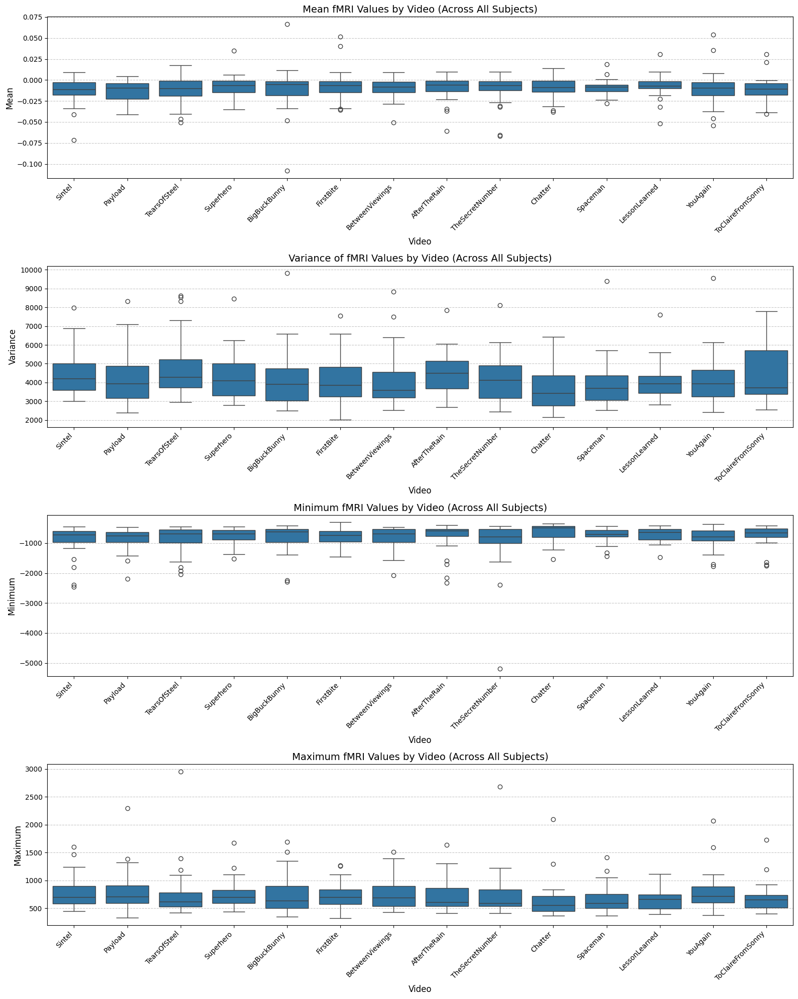

Summary statistics by video:
                  fmri_mean                             fmri_var             \
                       mean     std     min     max         mean        std   
video                                                                         
AfterTheRain        -0.0097  0.0152 -0.0611  0.0098  4455.508301  1187.4957   
BetweenViewings     -0.0095  0.0125 -0.0508  0.0093  4164.430664  1483.2219   
BigBuckBunny        -0.0107  0.0276 -0.1080  0.0667  4170.957520  1603.0348   
Chatter             -0.0094  0.0119 -0.0378  0.0139  3707.770508  1186.8793   
FirstBite           -0.0060  0.0192 -0.0359  0.0516  4130.774414  1340.6088   
LessonLearned       -0.0072  0.0142 -0.0521  0.0310  4092.770020   950.7958   
Payload             -0.0142  0.0134 -0.0413  0.0046  4320.620117  1487.7984   
Sintel              -0.0135  0.0162 -0.0715  0.0095  4548.350586  1266.8283   
Spaceman            -0.0087  0.0091 -0.0282  0.0188  3987.012695  1381.1919   
Superhero           -0.

: 

In [ ]:
#data statistics

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pickle
import seaborn as sns

# Load the statistics pickle file
with open('subject_video_statistics.pkl', 'rb') as f:
    stats = pickle.load(f)

# Convert the nested dictionary into a pandas DataFrame
data = []
for subject in stats:
    for video in stats[subject]:
        data.append({
            'subject': subject,
            'video': video,
            'fmri_mean': stats[subject][video]['fmri']['mean'],
            'fmri_var': stats[subject][video]['fmri']['var'],
            'fmri_min': stats[subject][video]['fmri']['min'],
            'fmri_max': stats[subject][video]['fmri']['max'],
            'video_mean': stats[subject][video]['video']['mean'],
            'video_var': stats[subject][video]['video']['var']
        })

df = pd.DataFrame(data)

# Function to identify outliers in each boxplot
def identify_outliers(df, x_col, y_col):
    outliers = {}
    for video in df[x_col].unique():
        subset = df[df[x_col] == video]
        q1 = subset[y_col].quantile(0.25)
        q3 = subset[y_col].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        
        # Find outliers for this video
        video_outliers = subset[(subset[y_col] < lower_bound) | (subset[y_col] > upper_bound)]
        if not video_outliers.empty:
            outliers[video] = video_outliers[['subject', y_col]].values.tolist()
    
    return outliers

# Create figure with subplots for the four metrics
plt.figure(figsize=(16, 20))

# 1. Box plot for fMRI mean values
plt.subplot(4, 1, 1)
sns.boxplot(x='video', y='fmri_mean', data=df)
plt.title('Mean fMRI Values by Video (Across All Subjects)', fontsize=14)
plt.xlabel('Video', fontsize=12)
plt.ylabel('Mean', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 2. Box plot for fMRI variance
plt.subplot(4, 1, 2)
sns.boxplot(x='video', y='fmri_var', data=df)
plt.title('Variance of fMRI Values by Video (Across All Subjects)', fontsize=14)
plt.xlabel('Video', fontsize=12)
plt.ylabel('Variance', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 3. Box plot for fMRI minimum values
plt.subplot(4, 1, 3)
sns.boxplot(x='video', y='fmri_min', data=df)
plt.title('Minimum fMRI Values by Video (Across All Subjects)', fontsize=14)
plt.xlabel('Video', fontsize=12)
plt.ylabel('Minimum', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 4. Box plot for fMRI maximum values
plt.subplot(4, 1, 4)
sns.boxplot(x='video', y='fmri_max', data=df)
plt.title('Maximum fMRI Values by Video (Across All Subjects)', fontsize=14)
plt.xlabel('Video', fontsize=12)
plt.ylabel('Maximum', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.savefig('fmri_statistics_boxplots.png', dpi=300, bbox_inches='tight')
plt.show()

# Create a summary table of statistics by video
summary = df.groupby('video').agg({
    'fmri_mean': ['mean', 'std', 'min', 'max'],
    'fmri_var': ['mean', 'std', 'min', 'max'],
    'fmri_min': ['mean', 'std', 'min', 'max'],
    'fmri_max': ['mean', 'std', 'min', 'max']
}).round(4)

print("Summary statistics by video:")
print(summary)

# Save summary to CSV
summary.to_csv('fmri_statistics_summary_by_video.csv')
print("Summary statistics saved to 'fmri_statistics_summary_by_video.csv'")

# Identify outliers for each metric
mean_outliers = identify_outliers(df, 'video', 'fmri_mean')
var_outliers = identify_outliers(df, 'video', 'fmri_var')
min_outliers = identify_outliers(df, 'video', 'fmri_min')
max_outliers = identify_outliers(df, 'video', 'fmri_max')

# Function to print outliers in a readable format
def print_outliers(outliers_dict, metric_name):
    print(f"\n{metric_name} Outliers:")
    if not outliers_dict:
        print("No outliers found")
        return
    
    for video, outliers in outliers_dict.items():
        print(f"\n{video}:")
        for outlier in outliers:
            subject, value = outlier
            print(f"  - {subject}: {value:.6f}")

# Print outliers information
print("\n=== OUTLIERS INFORMATION ===")
print_outliers(mean_outliers, "Mean fMRI Values")
print_outliers(var_outliers, "Variance of fMRI Values")
print_outliers(min_outliers, "Minimum fMRI Values")
print_outliers(max_outliers, "Maximum fMRI Values")

/tmp/ipykernel_3329424/817167370.py:37: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_3329424/817167370.py:37: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_3329424/817167370.py:37: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_3329424/817167370.py:37: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


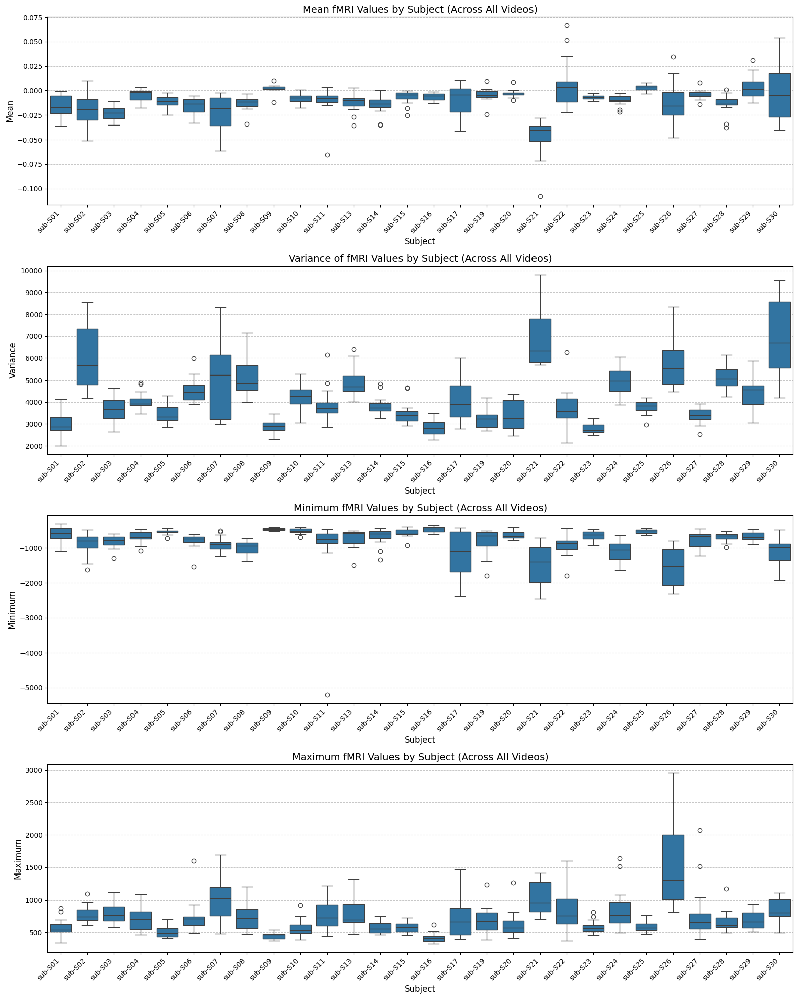

Summary statistics by subject:
        fmri_mean                             fmri_var             \
             mean     std     min     max         mean        std   
subject                                                             
sub-S01   -0.0167  0.0123 -0.0360 -0.0009  2987.095703   563.9102   
sub-S02   -0.0203  0.0167 -0.0508  0.0100  5969.317383  1421.3401   
sub-S03   -0.0231  0.0073 -0.0353 -0.0109  3648.974854   581.2200   
sub-S04   -0.0049  0.0069 -0.0178  0.0033  4043.256104   428.8030   
sub-S05   -0.0111  0.0065 -0.0248 -0.0021  3459.812744   406.0617   
sub-S06   -0.0157  0.0087 -0.0331 -0.0053  4537.931152   583.7101   
sub-S07   -0.0237  0.0193 -0.0611 -0.0023  4987.481445  1744.1700   
sub-S08   -0.0128  0.0079 -0.0339 -0.0033  5117.109375   925.0425   
sub-S09    0.0018  0.0047 -0.0121  0.0098  2905.540527   303.5502   
sub-S10   -0.0079  0.0054 -0.0175  0.0008  4198.312988   555.9064   
sub-S11   -0.0118  0.0161 -0.0653  0.0031  3907.127197   816.1945   
sub

: 

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pickle
import seaborn as sns

# Load the statistics pickle file
with open('subject_video_statistics.pkl', 'rb') as f:
    stats = pickle.load(f)

# Convert the nested dictionary into a pandas DataFrame
data = []
for subject in stats:
    for video in stats[subject]:
        data.append({
            'subject': subject,
            'video': video,
            'fmri_mean': stats[subject][video]['fmri']['mean'],
            'fmri_var': stats[subject][video]['fmri']['var'],
            'fmri_min': stats[subject][video]['fmri']['min'],
            'fmri_max': stats[subject][video]['fmri']['max'],
            'video_mean': stats[subject][video]['video']['mean'],
            'video_var': stats[subject][video]['video']['var']
        })

df = pd.DataFrame(data)

# Function to identify outliers in each boxplot and annotate them
def plot_boxplot_with_outliers(ax, x, y, data, title, ylabel):
    # Create boxplot
    sns.boxplot(x=x, y=y, data=data, ax=ax)
    
    # Set title and labels
    ax.set_title(title, fontsize=14)
    ax.set_xlabel('Subject', fontsize=12)
    ax.set_ylabel(ylabel, fontsize=12)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Identify outliers
    outliers = {}
    for i, subject in enumerate(data[x].unique()):
        subset = data[data[x] == subject]
        q1 = subset[y].quantile(0.25)
        q3 = subset[y].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        
        # Find outliers for this subject
        subject_outliers = subset[(subset[y] < lower_bound) | (subset[y] > upper_bound)]
        if not subject_outliers.empty:
            outliers[subject] = subject_outliers[['video', y]].values.tolist()
    
    return outliers

# Create figure with subplots for the four metrics
fig, axes = plt.subplots(4, 1, figsize=(16, 20))

# 1. Box plot for fMRI mean values
mean_outliers = plot_boxplot_with_outliers(axes[0], 'subject', 'fmri_mean', df, 
                                         'Mean fMRI Values by Subject (Across All Videos)', 
                                         'Mean')

# 2. Box plot for fMRI variance
var_outliers = plot_boxplot_with_outliers(axes[1], 'subject', 'fmri_var', df, 
                                        'Variance of fMRI Values by Subject (Across All Videos)', 
                                        'Variance')

# 3. Box plot for fMRI minimum values
min_outliers = plot_boxplot_with_outliers(axes[2], 'subject', 'fmri_min', df, 
                                        'Minimum fMRI Values by Subject (Across All Videos)', 
                                        'Minimum')

# 4. Box plot for fMRI maximum values
max_outliers = plot_boxplot_with_outliers(axes[3], 'subject', 'fmri_max', df, 
                                        'Maximum fMRI Values by Subject (Across All Videos)', 
                                        'Maximum')

plt.tight_layout()
plt.savefig('fmri_statistics_by_subject_boxplots.png', dpi=300, bbox_inches='tight')
plt.show()

# Create a summary table of statistics by subject
summary = df.groupby('subject').agg({
    'fmri_mean': ['mean', 'std', 'min', 'max'],
    'fmri_var': ['mean', 'std', 'min', 'max'],
    'fmri_min': ['mean', 'std', 'min', 'max'],
    'fmri_max': ['mean', 'std', 'min', 'max']
}).round(4)

print("Summary statistics by subject:")
print(summary)

# Save summary to CSV
summary.to_csv('fmri_statistics_summary_by_subject.csv')
print("Summary statistics saved to 'fmri_statistics_summary_by_subject.csv'")

# Print outliers information
print("\n=== OUTLIERS INFORMATION ===")

# Function to print outliers in a readable format
def print_outliers(outliers_dict, metric_name):
    print(f"\n{metric_name} Outliers:")
    if not outliers_dict:
        print("No outliers found")
        return
    
    for subject, outliers in outliers_dict.items():
        print(f"\n{subject}:")
        for outlier in outliers:
            video, value = outlier
            print(f"  - {video}: {value:.6f}")

# Print outliers for each metric
print_outliers(mean_outliers, "Mean fMRI Values")
print_outliers(var_outliers, "Variance of fMRI Values")
print_outliers(min_outliers, "Minimum fMRI Values")
print_outliers(max_outliers, "Maximum fMRI Values")

: 

In [2]:
# Visualize ROI location
#        print(f"📊 Visualizing {roi_name} location...")
#        visualize_roi_locations({roi_name: roi_mask})
        
        # Also show brain structure view
#        visualize_roi_with_brain_structure({roi_name: roi_mask}, selected_roi=roi_name)import numpy as np
import matplotlib.pyplot as plt
import torch

def turn_off_mask_voxels(fmri_2d, flat_mask, roi_mask_3d, mask_name="ROI"):
    """
    Turn off voxels in fMRI data based on a 3D ROI mask
    
    Parameters:
    -----------
    fmri_2d : numpy.ndarray
        2D array of fMRI data (samples x voxels)
    flat_mask : numpy.ndarray
        Flattened mask indicating which voxels in 3D space are used in fMRI data
    roi_mask_3d : numpy.ndarray
        3D boolean mask indicating which voxels to turn off
    mask_name : str
        Name of the mask for printing statistics
        
    Returns:
    --------
    numpy.ndarray
        Modified fMRI data with the specified ROI voxels turned off
    """
    
    # Validate inputs
    expected_3d_shape = (91, 109, 91)
    expected_flat_size = np.prod(expected_3d_shape)
    
    print(f"🔍 Input validation:")
    print(f"   ROI mask shape: {roi_mask_3d.shape}, dtype: {roi_mask_3d.dtype}")
    print(f"   Flat mask size: {flat_mask.size}, dtype: {flat_mask.dtype}")
    
    if roi_mask_3d.shape != expected_3d_shape:
        raise ValueError(f"ROI mask should have shape {expected_3d_shape}, got {roi_mask_3d.shape}")
    
    if flat_mask.size != expected_flat_size:
        raise ValueError(f"Flat mask should have size {expected_flat_size}, got {flat_mask.size}")
    
    print(f"\n🎯 Turning off {mask_name} voxels...")
    
    # Reshape flat_mask to 3D to match ROI mask
    mask_3d = flat_mask.reshape(expected_3d_shape)
    
    # Ensure both masks are boolean for safe bitwise operations
    mask_3d_bool = mask_3d.astype(bool)
    roi_mask_3d_bool = roi_mask_3d.astype(bool)
    
    # Find voxels that are both in the brain mask AND in the ROI mask
    voxels_to_turn_off_3d = mask_3d_bool & roi_mask_3d_bool
    
    # Flatten this to get the positions in the original 3D space
    voxels_to_turn_off_flat = voxels_to_turn_off_3d.flatten()
    
    # Get indices of non-zero voxels in the original flat mask
    original_non_zero_indices = np.nonzero(flat_mask)[0]
    
    # Get indices of voxels we want to turn off
    turnoff_indices_in_3d = np.nonzero(voxels_to_turn_off_flat)[0]
    
    # Find which columns in fmri_2d correspond to the voxels we want to turn off
    mask_positions_in_fmri = np.isin(original_non_zero_indices, turnoff_indices_in_3d)
    indices_to_turn_off = np.where(mask_positions_in_fmri)[0]
    
    # Statistics before modification
    roi_voxels_total = np.sum(roi_mask_3d)
    roi_voxels_in_brain = np.sum(voxels_to_turn_off_3d)
    zeros_before = (fmri_2d == 0).sum()
    total_values = fmri_2d.size
    percent_zeros_before = (zeros_before / total_values) * 100
    
    print(f"📊 {mask_name} Statistics:")
    print(f"   Total {mask_name} voxels: {roi_voxels_total:,}")
    print(f"   {mask_name} voxels in brain: {roi_voxels_in_brain:,}")
    print(f"   {mask_name} voxels in fMRI data: {len(indices_to_turn_off):,}")
    print(f"   Coverage: {roi_voxels_in_brain/roi_voxels_total*100:.1f}% of {mask_name} is in brain")
    
    print(f"\n📈 Before turning off {mask_name}:")
    print(f"   Zeros: {zeros_before:,}/{total_values:,} ({percent_zeros_before:.2f}%)")
    
    # Create a copy of the fMRI data and turn off the ROI voxels
    fmri_modified = fmri_2d.copy()
    
    if len(indices_to_turn_off) > 0:
        fmri_modified[:, indices_to_turn_off] = 0
        print(f"   Turned off {len(indices_to_turn_off):,} voxels in fMRI data")
    else:
        print(f"   ⚠️ No {mask_name} voxels found in fMRI data to turn off")
    
    # Statistics after modification
    zeros_after = (fmri_modified == 0).sum()
    percent_zeros_after = (zeros_after / total_values) * 100
    new_zeros = zeros_after - zeros_before
    
    print(f"\n📉 After turning off {mask_name}:")
    print(f"   Zeros: {zeros_after:,}/{total_values:,} ({percent_zeros_after:.2f}%)")
    print(f"   New zeros: {new_zeros:,} ({new_zeros/total_values*100:.2f}% increase)")
    
    return fmri_modified

def load_roi_masks():
    """
    Load the saved ROI masks
    
    Returns:
    --------
    dict
        Dictionary with ROI names as keys and 3D boolean arrays as values
    """
    print("📂 Loading saved ROI masks...")
    
    roi_files = {
        'Right FFA': 'resampled_rffa.npy',
        'Left FFA': 'resampled_lffa.npy', 
        'PPA': 'resampled_ppa.npy'
    }
    
    roi_masks = {}
    for roi_name, filename in roi_files.items():
        try:
            mask = np.load(filename)
            roi_masks[roi_name] = mask.astype(bool)  # Ensure boolean
            print(f"✅ Loaded {roi_name}: {np.sum(mask):,} voxels, shape {mask.shape}")
        except Exception as e:
            print(f"❌ Error loading {roi_name}: {e}")
            roi_masks[roi_name] = None
    
    return roi_masks

def visualize_roi_locations(roi_masks, slice_idx=None, show_brain_background=True):
    """
    Visualize ROI locations in 2D slices with brain background
    
    Parameters:
    -----------
    roi_masks : dict
        Dictionary with ROI names as keys and 3D masks as values
    slice_idx : int
        Z-slice to visualize (default: finds slice with most ROI voxels)
    show_brain_background : bool
        Whether to show brain structure as background
    """
    
    # Load brain background if requested
    brain_background = None
    if show_brain_background:
        try:
            # Try to use the mean brain volume if available
            if 'fmri_array_mean' in globals():
                brain_background = fmri_array_mean
                print("✅ Using mean fMRI volume as background")
            else:
                # Try to load a brain mask
                mask4609 = np.load('mask_schaefer1000_4609.npy').reshape(91, 109, 91)
                brain_background = mask4609.astype(float)
                print("✅ Using Schaefer mask as background")
        except:
            print("⚠️ Could not load brain background, using black background")
    
    # Find best slice if not provided
    if slice_idx is None:
        # Find slice with maximum ROI coverage
        roi_coverage_per_slice = []
        for z in range(91):
            total_roi_voxels = 0
            for roi_name, roi_mask in roi_masks.items():
                if roi_mask is not None:
                    total_roi_voxels += np.sum(roi_mask[:, :, z])
            roi_coverage_per_slice.append(total_roi_voxels)
        
        slice_idx = np.argmax(roi_coverage_per_slice)
        print(f"🎯 Auto-selected slice z={slice_idx} with {max(roi_coverage_per_slice)} ROI voxels")
    
    # Create figure
    fig, axes = plt.subplots(1, 4, figsize=(20, 5), facecolor='black')
    
    # Colors for each ROI
    roi_colors = ['Reds', 'Greens', 'Blues']
    roi_color_names = ['red', 'lime', 'cyan']
    
    roi_list = [(name, mask) for name, mask in roi_masks.items() if mask is not None]
    
    for i, (roi_name, roi_mask) in enumerate(roi_list):
        if i < 3:  # Individual ROI plots
            ax = axes[i]
            ax.set_facecolor('black')
            
            # Show brain background
            if brain_background is not None:
                ax.imshow(brain_background[:, :, slice_idx].T, cmap='gray', 
                         origin='lower', alpha=0.3, vmin=0, 
                         vmax=np.percentile(brain_background, 95))
            
            # Overlay ROI mask
            roi_slice = roi_mask[:, :, slice_idx]
            if np.any(roi_slice):
                # Create masked array to show only ROI voxels
                roi_masked = np.ma.masked_where(roi_slice == 0, roi_slice)
                ax.imshow(roi_masked.T, cmap=roi_colors[i], origin='lower', 
                         alpha=0.8, vmin=0, vmax=1)
                
                # Count voxels in this slice
                voxel_count = np.sum(roi_slice)
                ax.text(0.02, 0.98, f'{voxel_count} voxels', 
                       transform=ax.transAxes, color='white', 
                       fontweight='bold', verticalalignment='top',
                       bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))
            
            ax.set_title(roi_name, color='white', fontsize=14, fontweight='bold')
            ax.tick_params(colors='white')
            ax.set_xlabel('Y (Posterior → Anterior)', color='white')
            ax.set_ylabel('X (Left → Right)', color='white')
    
    # Combined view
    ax = axes[3]
    ax.set_facecolor('black')
    
    # Show brain background
    if brain_background is not None:
        ax.imshow(brain_background[:, :, slice_idx].T, cmap='gray', 
                 origin='lower', alpha=0.3, vmin=0, 
                 vmax=np.percentile(brain_background, 95))
    
    # Overlay all ROIs with different colors
    total_roi_voxels = 0
    for i, (roi_name, roi_mask) in enumerate(roi_list):
        if i < 3:
            roi_slice = roi_mask[:, :, slice_idx]
            if np.any(roi_slice):
                roi_masked = np.ma.masked_where(roi_slice == 0, roi_slice)
                ax.imshow(roi_masked.T, cmap=roi_colors[i], origin='lower', 
                         alpha=0.7, vmin=0, vmax=1)
                total_roi_voxels += np.sum(roi_slice)
    
    ax.set_title('Combined ROIs', color='white', fontsize=14, fontweight='bold')
    ax.tick_params(colors='white')
    ax.set_xlabel('Y (Posterior → Anterior)', color='white')
    ax.set_ylabel('X (Left → Right)', color='white')
    
    # Add legend for combined view
    legend_y = 0.98
    for i, (roi_name, _) in enumerate(roi_list[:3]):
        ax.text(0.02, legend_y - i*0.08, f'{roi_color_names[i].title()}: {roi_name}', 
               transform=ax.transAxes, color=roi_color_names[i], 
               fontweight='bold', verticalalignment='top',
               bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))
    
    # Add total voxel count
    ax.text(0.02, 0.65, f'Total: {total_roi_voxels} voxels', 
           transform=ax.transAxes, color='white', 
           fontweight='bold', verticalalignment='top',
           bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))
    
    plt.suptitle(f'ROI Locations (z={slice_idx})', color='white', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return slice_idx

def test_roi_decoder(real=True, model_name='decoder_4609_1650', test_on_train=False, 
                     test_input=None, test_label=None, add_name='', roi_name=None, 
                     save_plots=False, all_frames=False, change_mode='off', metric="ssim"):
    '''
    Tests the decoder with ROI analysis
    
    Parameters:
    -----------
    real : bool
        If True, tests on real brain activity; if False, tests on brain activity from encoder
    model_name : str
        Name of the model file to be used
    test_on_train : bool
        If True, tests on the training set
    test_input : dict
        Dictionary with fMRIs for testing (one subdictionary for each film)
    test_label : dict
        Dictionary with films (one subdictionary for each film)
    add_name : str
        String to add to the end of output name to avoid overwriting
    roi_name : str
        Name of the ROI to turn off ('Right FFA', 'Left FFA', 'PPA', or None for no modification)
    save_plots : bool
        If True, saves plots
    all_frames : bool
        If True, runs test_model_all, otherwise runs test_model
    change_mode : str
        'off' or 'amplify' (currently only 'off' is implemented)
    metric : str
        'ssim' or 'tv' for evaluation metric
        
    Returns:
    --------
    float or None
        Mean loss if all_frames=True and metric specified, otherwise None
    '''
    
    print(f"🧠 Testing decoder {model_name}")
    if roi_name:
        print(f"🎯 Testing with {roi_name} turned {change_mode}")
    
    # Load the model (assuming these are defined elsewhere)
    # model = Decoder(mask_size)
    # state_dict = torch.load(model_name)
    # model.load_state_dict(state_dict)
    
    # Testing parameters (assuming these are defined elsewhere)
    # criterion = D_Loss()
    # device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    
    # Handle special case for training data
    if test_on_train:
        # Assuming trainset is defined elsewhere
        num_samples = trainset["fMRIs"].shape[0]
        random_indices = np.random.choice(num_samples, size=30, replace=False)
        testset2 = {
            "fMRIs": {
                "test": trainset["fMRIs"][random_indices]
            },
            "videos": {
                "test": trainset["videos"][random_indices]
            }
        }
        test_input = testset2['fMRIs']
        test_label = testset2['videos']
    
    # Check if we're using a specific ROI
    if roi_name is not None:
        print(f"🔄 Processing ROI: {roi_name}")
        
        # Load ROI masks
        roi_masks = load_roi_masks()
        
        if roi_name not in roi_masks or roi_masks[roi_name] is None:
            print(f"❌ Error: ROI '{roi_name}' not found or failed to load")
            return None
        
        roi_mask = roi_masks[roi_name]
        
        # Visualize ROI location
        print(f"📊 Visualizing {roi_name} location...")
        visualize_roi_locations({roi_name: roi_mask})
        
        # Load the brain mask (assuming this exists)
        try:
            mask4609 = np.load('mask_schaefer1000_4609.npy')
            flat_mask = mask4609.flatten()
            print(f"✅ Loaded brain mask: {np.sum(flat_mask):,} voxels")
        except Exception as e:
            print(f"❌ Error loading brain mask: {e}")
            return None
        
def visualize_roi_with_brain_structure(roi_masks, selected_roi=None):
    """
    Visualize ROIs in the style of the original block visualization code
    Shows brain structure with ROI overlays, similar to the original visualize_blocks function
    """
    print(f"🎨 Creating brain structure visualization with ROI overlays...")
    
    # Load brain data for structure
    try:
        if 'fmri_array_mean' in globals():
            brain_data = fmri_array_mean
            print("✅ Using mean fMRI volume as brain structure")
        else:
            # Load Schaefer mask as brain structure
            brain_data = np.load('mask_schaefer1000_4609.npy').reshape(91, 109, 91)
            print("✅ Using Schaefer mask as brain structure")
    except Exception as e:
        print(f"❌ Could not load brain structure: {e}")
        return
    
    # Find best slices for visualization (similar to original layer-wise approach)
    roi_coverage_per_slice = []
    for z in range(91):
        total_roi_voxels = 0
        for roi_name, roi_mask in roi_masks.items():
            if roi_mask is not None:
                total_roi_voxels += np.sum(roi_mask[:, :, z])
        roi_coverage_per_slice.append(total_roi_voxels)
    
    # Find 3 slices with good ROI coverage (anterior, middle, posterior)
    sorted_slices = sorted(enumerate(roi_coverage_per_slice), key=lambda x: x[1], reverse=True)
    # Take slices that are well distributed
    good_slices = [s[0] for s in sorted_slices if s[1] > 0][:6]
    good_slices.sort()
    
    # Select 3 evenly distributed slices
    if len(good_slices) >= 3:
        selected_slices = [good_slices[0], good_slices[len(good_slices)//2], good_slices[-1]]
    else:
        selected_slices = good_slices
    
    print(f"Selected slices for visualization: {selected_slices}")
    
    # Create figure similar to original block visualization
    fig, axes = plt.subplots(1, len(selected_slices), figsize=(6*len(selected_slices), 6), facecolor='black')
    if len(selected_slices) == 1:
        axes = [axes]
    
    fig.suptitle('Brain Structure with ROI Overlays', fontsize=16, color='white')
    
    roi_colors = {
        'Right FFA': 'red',
        'Left FFA': 'lime',
        'PPA': 'cyan'
    }
    
    for idx, z_slice in enumerate(selected_slices):
        ax = axes[idx]
        ax.set_facecolor('black')
        
        # Show brain structure (maximum intensity projection style from original)
        brain_slice = brain_data[:, :, z_slice]
        brain_projection = (brain_slice > 0).astype(float)
        
        # Display brain structure
        ax.imshow(brain_projection.T, cmap='gray', origin='lower', alpha=0.6)
        
        # Overlay ROI masks
        roi_list = [(name, mask) for name, mask in roi_masks.items() if mask is not None]
        
        for roi_name, roi_mask in roi_list:
            roi_slice = roi_mask[:, :, z_slice]
            if np.any(roi_slice):
                # Create contours for ROI boundaries (similar to original grid lines)
                from scipy import ndimage
                
                # Create boundary
                boundary = roi_slice.astype(float)
                
                # Overlay ROI with transparency
                roi_masked = np.ma.masked_where(roi_slice == 0, roi_slice)
                color = roi_colors.get(roi_name, 'white')
                
                if color == 'red':
                    cmap = 'Reds'
                elif color == 'lime':
                    cmap = 'Greens'  
                elif color == 'cyan':
                    cmap = 'Blues'
                else:
                    cmap = 'hot'
                
                ax.imshow(roi_masked.T, cmap=cmap, origin='lower', alpha=0.8, vmin=0, vmax=1)
                
                # Add ROI label with bounding box (similar to original block labels)
                if np.any(roi_slice):
                    # Find center of mass for label placement
                    center_of_mass = ndimage.center_of_mass(roi_slice)
                    if not np.isnan(center_of_mass[0]) and not np.isnan(center_of_mass[1]):
                        y_center, x_center = center_of_mass[1], center_of_mass[0]
                        
                        # Count voxels
                        voxel_count = np.sum(roi_slice)
                        
                        # Add label with bounding box (like original block IDs)
                        text_box = dict(facecolor='black', alpha=0.7, boxstyle='round')
                        ax.text(y_center, x_center, f'{roi_name}\n{voxel_count} voxels', 
                               ha='center', va='center', color=color, fontweight='bold',
                               fontsize=9, bbox=text_box)
        
        # Highlight selected ROI if specified (like original selected block highlighting)
        if selected_roi and selected_roi in roi_masks and roi_masks[selected_roi] is not None:
            roi_slice = roi_masks[selected_roi][:, :, z_slice]
            if np.any(roi_slice):
                import matplotlib.patches as patches
                
                # Find bounding box of ROI
                roi_coords = np.where(roi_slice)
                if len(roi_coords[0]) > 0:
                    y_min, y_max = np.min(roi_coords[1]), np.max(roi_coords[1])
                    x_min, x_max = np.min(roi_coords[0]), np.max(roi_coords[0])
                    
                    # Add bounding rectangle (like original selected block)
                    rect = patches.Rectangle((y_min, x_min), y_max-y_min, x_max-x_min, 
                                           fill=False, edgecolor='yellow', linewidth=3)
                    ax.add_patch(rect)
        
        # Set title and labels
        ax.set_title(f'Slice {z_slice} (z={z_slice})', color='white', fontweight='bold')
        ax.tick_params(colors='white')
        ax.set_xlabel('Y (Posterior → Anterior)', color='white')
        ax.set_ylabel('X (Left → Right)', color='white')
    
    plt.tight_layout()
    plt.show()
    
    # Print summary (like original function)
    total_roi_voxels = {}
    for roi_name, roi_mask in roi_masks.items():
        if roi_mask is not None:
            total_roi_voxels[roi_name] = np.sum(roi_mask)
    
    print(f"\n📊 ROI Summary:")
    for roi_name, voxel_count in total_roi_voxels.items():
        print(f"  {roi_name}: {voxel_count:,} voxels")
    
    return selected_slices

'''        
        # Turn off the specified ROI in all input videos
        modified_input = {}
        
        for video_name in test_input.keys():
            print(f"🔄 Turning off {roi_name} for video {video_name}")
            
            if change_mode == 'off':
                modified_data = turn_off_mask_voxels(
                    test_input[video_name], flat_mask, roi_mask, roi_name
                )
            else:
                # Amplify mode could be implemented here
                print(f"⚠️ Change mode '{change_mode}' not implemented, using 'off'")
                modified_data = turn_off_mask_voxels(
                    test_input[video_name], flat_mask, roi_mask, roi_name
                )
            
            modified_input[video_name] = modified_data
        
        # Use the modified input for testing
        test_input = modified_input
    
    print(f"📊 Test input shape: {print_dict_tree(test_input) if 'print_dict_tree' in globals() else 'N/A'}")
    print(f"📊 Test label shape: {print_dict_tree(test_label) if 'print_dict_tree' in globals() else 'N/A'}")
    
    # Run the appropriate test model function (assuming these are defined elsewhere)
    if all_frames:
        # results = test_model_all(test_input, test_label, model, criterion, device, 
        #                pretrained_decoder, model_to_test, statistical_testing, 
        #                display_plots, save_plots, model_name=model_name + add_name, metric=metric)
        
        # Placeholder for actual testing
        print(f"🚀 Running test_model_all with metric: {metric}")
        
        # if metric == "tv":
        #     mean_loss = results['test_performance']['mean_tv_D']
        # elif metric == "ssim":
        #     mean_loss = results['test_performance']['mean_ssim_D']
        # return mean_loss
        
        return 0.5  # Placeholder return value
    else:
        # test_model(test_input, test_label, model, criterion, device, 
        #           pretrained_decoder, model_to_test, statistical_testing, 
        #           display_plots, save_plots, model_name=model_name + add_name)
        
        print(f"🚀 Running test_model")
        return None
'''


#test_input=filtered_trainset['fMRIs'],
#test_label=filtered_trainset['videos'],


def run_single_roi_test(roi_name='Right FFA'):
    """
    Run test with a specific ROI turned off
    
    Parameters:
    -----------
    roi_name : str
        Name of the ROI to test ('Right FFA', 'Left FFA', 'PPA')
    """
    print(f"🎯 Testing decoder with {roi_name} turned off")
    
    # Placeholder for actual data (replace with your actual variables)
    # test_input = filtered_testset['fMRIs']  
    # test_label = filtered_testset['videos']
    
    result = test_roi_decoder(
        real=True,
        model_name='decoder_4609_350',
        test_input=filtered_trainset['fMRIs'],
        test_label=filtered_trainset['videos'],
        roi_name=roi_name,
        all_frames=True,
        save_plots=False,
        add_name=f'_{roi_name.lower().replace(" ", "_")}',
        change_mode='off',
        metric="tv"
    )
    
    return result

def run_all_roi_tests():
    """
    Run tests for all ROIs and compare results
    """
    print("🧪 Running comprehensive ROI analysis...")
    
    roi_names = ['Right FFA', 'Left FFA', 'PPA']
    results = {}
    
    # Test baseline (no ROI turned off)
    print("\n" + "="*60)
    print("🔬 BASELINE TEST (No ROI turned off)")
    print("="*60)
    
    baseline_result = test_roi_decoder(
        real=True,
        model_name='decoder_4609_350',
        test_input=filtered_testset['fMRIs'],
        test_label=filtered_testset['videos'],
        roi_name=None,  # No ROI modification
        all_frames=True,
        save_plots=False,
        add_name='_baseline',
        metric="tv"
    )
    
    results['Baseline'] = baseline_result
    
    # Test each ROI
    for roi_name in roi_names:
        print(f"\n" + "="*60)
        print(f"🔬 TESTING {roi_name.upper()} TURNED OFF")
        print("="*60)
        
        roi_result = run_single_roi_test(roi_name)
        results[roi_name] = roi_result
    
    # Summary of results
    print(f"\n" + "🎯"*30)
    print("FINAL RESULTS SUMMARY")
    print("🎯"*30)
    
    for condition, result in results.items():
        if result is not None:
            print(f"{condition.ljust(15)}: {result:.4f}")
        else:
            print(f"{condition.ljust(15)}: No result")
    
    # Calculate differences from baseline
    if results['Baseline'] is not None:
        print(f"\n📊 DIFFERENCES FROM BASELINE:")
        baseline = results['Baseline']
        
        for roi_name in roi_names:
            if results[roi_name] is not None:
                diff = results[roi_name] - baseline
                percent_change = (diff / baseline) * 100
                print(f"{roi_name}: {diff:+.4f} ({percent_change:+.1f}%)")
    
    return results

def visualize_all_rois():
    """
    Create comprehensive visualization of all ROI locations across multiple slices
    """
    print("🎨 Creating comprehensive ROI visualization...")
    
    # Load all ROI masks
    roi_masks = load_roi_masks()
    
    # Find slices that actually contain ROI voxels
    roi_slices = []
    for z in range(91):
        total_voxels = 0
        for roi_name, roi_mask in roi_masks.items():
            if roi_mask is not None:
                total_voxels += np.sum(roi_mask[:, :, z])
        if total_voxels > 0:
            roi_slices.append((z, total_voxels))
    
    # Sort by voxel count and take top 5 slices
    roi_slices.sort(key=lambda x: x[1], reverse=True)
    top_slices = [s[0] for s in roi_slices[:5]]
    
    print(f"📊 Top 5 slices with ROI coverage: {top_slices}")
    
    # Load brain background
    brain_background = None
    try:
        if 'fmri_array_mean' in globals():
            brain_background = fmri_array_mean
        else:
            mask4609 = np.load('mask_schaefer1000_4609.npy').reshape(91, 109, 91)
            brain_background = mask4609.astype(float)
    except:
        print("⚠️ No brain background available")
    
    # Create visualization
    fig, axes = plt.subplots(len(top_slices), 4, figsize=(20, 4*len(top_slices)), facecolor='black')
    if len(top_slices) == 1:
        axes = axes.reshape(1, -1)
    
    roi_colors = ['Reds', 'Greens', 'Blues']
    roi_color_names = ['red', 'lime', 'cyan']
    
    for slice_idx, z_slice in enumerate(top_slices):
        # Individual ROI plots
        roi_list = [(name, mask) for name, mask in roi_masks.items() if mask is not None]
        
        for roi_idx, (roi_name, roi_mask) in enumerate(roi_list):
            if roi_idx < 3:
                ax = axes[slice_idx, roi_idx]
                ax.set_facecolor('black')
                
                # Show brain background
                if brain_background is not None:
                    ax.imshow(brain_background[:, :, z_slice].T, cmap='gray', 
                             origin='lower', alpha=0.4, vmin=0, 
                             vmax=np.percentile(brain_background, 95))
                
                # Overlay ROI
                roi_slice = roi_mask[:, :, z_slice]
                if np.any(roi_slice):
                    roi_masked = np.ma.masked_where(roi_slice == 0, roi_slice)
                    ax.imshow(roi_masked.T, cmap=roi_colors[roi_idx], origin='lower', 
                             alpha=0.8, vmin=0, vmax=1)
                    
                    # Add voxel count
                    voxel_count = np.sum(roi_slice)
                    ax.text(0.02, 0.98, f'{voxel_count}', 
                           transform=ax.transAxes, color='white', 
                           fontweight='bold', verticalalignment='top',
                           bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))
                
                if slice_idx == 0:
                    ax.set_title(roi_name, color='white', fontsize=12, fontweight='bold')
                
                ax.tick_params(colors='white')
                ax.text(0.02, 0.02, f'z={z_slice}', 
                       transform=ax.transAxes, color='white', 
                       fontweight='bold', verticalalignment='bottom',
                       bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))
        
        # Combined view
        ax = axes[slice_idx, 3]
        ax.set_facecolor('black')
        
        # Show brain background
        if brain_background is not None:
            ax.imshow(brain_background[:, :, z_slice].T, cmap='gray', 
                     origin='lower', alpha=0.4, vmin=0, 
                     vmax=np.percentile(brain_background, 95))
        
        # Overlay all ROIs
        total_voxels_slice = 0
        for roi_idx, (roi_name, roi_mask) in enumerate(roi_list):
            if roi_idx < 3:
                roi_slice = roi_mask[:, :, z_slice]
                if np.any(roi_slice):
                    roi_masked = np.ma.masked_where(roi_slice == 0, roi_slice)
                    ax.imshow(roi_masked.T, cmap=roi_colors[roi_idx], origin='lower', 
                             alpha=0.7, vmin=0, vmax=1)
                    total_voxels_slice += np.sum(roi_slice)
        
        if slice_idx == 0:
            ax.set_title('Combined ROIs', color='white', fontsize=12, fontweight='bold')
        
        ax.tick_params(colors='white')
        ax.text(0.02, 0.98, f'Total: {total_voxels_slice}', 
               transform=ax.transAxes, color='white', 
               fontweight='bold', verticalalignment='top',
               bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))
        ax.text(0.02, 0.02, f'z={z_slice}', 
               transform=ax.transAxes, color='white', 
               fontweight='bold', verticalalignment='bottom',
               bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))
    
    plt.suptitle('ROI Locations Across Brain Slices', color='white', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return top_slices

# Example usage
if __name__ == "__main__":
    print("🧠 ROI-BASED DECODER TESTING")
    print("="*50)
    
    # Example 1: Test single ROI
    print("\n📋 Example 1: Test single ROI")
    result = run_single_roi_test('Right FFA')
    
    # Example 2: Test all ROIs
    print("\n📋 Example 2: Test all ROIs")
    #results = run_all_roi_tests()
    
    # Example 3: Visualize ROIs
    print("\n📋 Example 3: Visualize all ROIs")
    #visualize_all_rois()
    
    # Example 4: Brain structure view
    print("\n📋 Example 4: Brain structure with ROI overlays")
    roi_masks = load_roi_masks()
    visualize_roi_with_brain_structure(roi_masks, selected_roi='Right FFA')
    
    print("\n✅ All examples completed!")

# Quick usage guide
print(f"\n📖 USAGE GUIDE:")
print(f"")
print(f"# Test single ROI:")
print(f"result = run_single_roi_test('Right FFA')")
print(f"")
print(f"# Test all ROIs and compare:")
print(f"results = run_all_roi_tests()")
print(f"")
print(f"# Visualize ROI locations (smart slice selection):")
print(f"roi_masks = load_roi_masks()")
print(f"visualize_roi_locations(roi_masks)")
print(f"")
print(f"# Brain structure view with ROI overlays:")
print(f"visualize_roi_with_brain_structure(roi_masks, selected_roi='Right FFA')")
print(f"")
print(f"# Multi-slice comprehensive view:")
print(f"visualize_all_rois()")
print(f"")
print(f"# Custom test:")
print(f"result = test_roi_decoder(")
print(f"    model_name='your_model_name',")
print(f"    test_input=your_test_data,")
print(f"    test_label=your_test_labels,")
print(f"    roi_name='PPA',")
print(f"    metric='ssim'")
print(f")")

KeyboardInterrupt: 

In [ ]:
#tag blocks 3



def visualize_blocks_3(data_3d, blocks, losses, num_blocks=(3, 3, 3), figsize=None, colormap='viridis', 
                   title_prefix="Brain Divided into", is_difference=False):
    """
    Visualize brain blocks using maximum intensity projection for each z-layer
    Shows axial views for each layer along the z-dimension and displays loss values or differences
    
    Parameters:
    -----------
    data_3d : numpy.ndarray
        3D brain data
    blocks : dict
        Dictionary mapping block IDs to block boundaries
    losses : array-like
        Array of loss values or difference values, one per block (index 0 corresponds to block 1)
    num_blocks : tuple
        Number of blocks along each dimension (x, y, z)
    figsize : tuple, optional
        Figure size, if None will be calculated based on z-dimension blocks
    colormap : str
        Matplotlib colormap name to use for loss values
        'viridis' good for absolute values, 'coolwarm' good for differences
    title_prefix : str
        Prefix for the figure title
    is_difference : bool
        If True, values are treated as differences from baseline
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    import matplotlib.colors as colors
    
    # Unpack the number of blocks in each dimension
    nx, ny, nz = num_blocks
    
    # Convert losses to numpy array if it isn't already
    losses = np.array(losses)
    
    # Print the actual loss values for debugging
    print("Loss/difference values for each block:")
    for i, val in enumerate(losses):
        print(f"  Block {i+1}: {val:.5f}")
    
    # Verify number of loss values matches number of blocks
    total_blocks = nx * ny * nz
    if len(losses) != total_blocks:
        raise ValueError(f"Expected {total_blocks} loss values, but got {len(losses)}")
    
    # Find the block with the highest absolute loss/difference
    max_abs_loss_idx = np.argmax(np.abs(losses))
    # Convert to 1-based indexing for block ID
    selected_block = max_abs_loss_idx + 1
    max_abs_loss_value = losses[max_abs_loss_idx]
    
    if is_difference:
        print(f"Block {selected_block} has the highest absolute difference from baseline: {max_abs_loss_value:.5f}")
    else:
        print(f"Block {selected_block} has the highest absolute loss: {max_abs_loss_value:.5f}")
    
    # If figsize is not specified, calculate it based on number of z layers
    if figsize is None:
        figsize = (6 * nz, 6)
    
    # Create the figure with the appropriate number of subplots (one per z-layer)
    fig, axes = plt.subplots(1, nz, figsize=figsize)
    if nz == 1:
        axes = [axes]  # Make sure axes is always a list for consistency
    
    title_text = f"{title_prefix} {nx}x{ny}x{nz} Blocks"
    if is_difference:
        title_text += " with Differences from Baseline"
    else:
        title_text += " with Loss Values"
        
    fig.suptitle(title_text, fontsize=16)
    
    # Get block division boundaries
    x_divisions = []
    y_divisions = []
    z_divisions = []
    
    for block_id, ((x_min, x_max), (y_min, y_max), (z_min, z_max)) in blocks.items():
        x_divisions.extend([x_min, x_max])
        y_divisions.extend([y_min, y_max])
        z_divisions.extend([z_min, z_max])
    
    # Get unique boundary values
    x_divisions = sorted(list(set(x_divisions)))
    y_divisions = sorted(list(set(y_divisions)))
    z_divisions = sorted(list(set(z_divisions)))
    
    # Print the division boundaries
    print("X divisions:", x_divisions)
    print("Y divisions:", y_divisions)
    print("Z divisions:", z_divisions)
    
    # Create a colormap normalization based on min/max loss values
    if is_difference and colormap == 'coolwarm':
        # For differences, we want a symmetric colormap centered at zero
        max_abs = max(abs(np.min(losses)), abs(np.max(losses)))
        norm = colors.Normalize(vmin=-max_abs, vmax=max_abs)
    else:
        # For absolute values or when not specifically using coolwarm for differences
        norm = colors.Normalize(vmin=np.min(losses), vmax=np.max(losses))
        
    cmap = plt.cm.get_cmap(colormap)
    
    # Process each z-layer
    for z_idx in range(nz):
        # Get z-boundaries for this layer
        z_min = z_divisions[z_idx]
        z_max = z_divisions[z_idx + 1]
        
        # Create layer name with actual z-range
        layer_name = f"Layer {z_idx} (z={z_min}-{z_max-1})"
        
        # Extract the data for this z-layer
        layer_data = data_3d[:, :, z_min:z_max]
        
        # Create maximum intensity projection along z-axis for just this layer
        layer_projection = np.max(layer_data > 0, axis=2).astype(float)
        print(f"Max layer_projection for layer {z_idx}=", np.max(layer_projection))
        
        # Create a brain mask - identifies where brain tissue exists
        brain_mask = layer_projection > 0
        
        # Plot black background
        axes[z_idx].imshow(np.zeros_like(layer_projection), cmap='gray', origin='lower')
        axes[z_idx].set_title(layer_name)
        
        # Add colored blocks and loss values for this layer
        for y_idx in range(ny):
            for x_idx in range(nx):
                # Calculate block ID (1-based index) using the formula:
                # block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                
                # Get loss value for this block (subtract 1 for 0-based indexing)
                if block_id <= len(losses):
                    loss_value = losses[block_id - 1]
                else:
                    print(f"Warning: Block ID {block_id} exceeds losses array length {len(losses)}")
                    loss_value = 0
                
                # Get x, y boundaries for this block
                x_min, x_max = x_divisions[x_idx], x_divisions[x_idx + 1]
                y_min, y_max = y_divisions[y_idx], y_divisions[y_idx + 1]
                
                # Calculate center of block in data coordinates
                x_center = (x_min + x_max) / 2
                y_center = (y_min + y_max) / 2
                
                # Get color from colormap based on loss value
                block_color = cmap(norm(loss_value))
                
                # Create a mask for this block
                block_mask = np.zeros_like(layer_projection, dtype=bool)
                block_mask[x_min:x_max, y_min:y_max] = True
                
                # Combine with brain mask to only color brain regions
                block_brain_mask = block_mask & brain_mask
                
                # If there are brain voxels in this block, add the colored overlay
                if np.any(block_brain_mask):
                    # Create a colored overlay image for this block
                    colored_overlay = np.zeros((*layer_projection.shape, 4))  # RGBA
                    colored_overlay[block_brain_mask, :] = block_color
                    
                    # Add the colored overlay to the plot
                    axes[z_idx].imshow(colored_overlay, origin='lower', interpolation='nearest')
                
                # Format the displayed value
                if is_difference:
                    # For differences, show sign and format based on magnitude
                    if abs(loss_value) >= 0.01:
                        value_str = f"{loss_value:.4f}"
                    else:
                        value_str = f"{loss_value:.2e}"
                else:
                    # For absolute values
                    value_str = f"{loss_value:.4f}"
                
                # Add block ID and loss value label with a bounding box
                text_box = dict(facecolor='black', alpha=0.7, boxstyle='round')
                
                # Place the text in the center of the block
                axes[z_idx].text(y_center, x_center, f"{block_id}\n{value_str}", 
                               ha="center", va="center", color='white', fontweight='bold',
                               fontsize=10, bbox=text_box)
                
                # Highlight the block with the highest absolute loss/difference
                if block_id == selected_block:
                    highlight_rect = patches.Rectangle(
                        (y_min, x_min), y_max-y_min, x_max-x_min,
                        fill=False, edgecolor='red', linewidth=2
                    )
                    axes[z_idx].add_patch(highlight_rect)
    
    # Add a colorbar to show the mapping between loss values and colors
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    
    # Create a separate axis for the colorbar below the brain images
    cax = fig.add_axes([0.15, 0.05, 0.7, 0.02])  # [left, bottom, width, height]
    cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')
    
    if is_difference:
        cbar.set_label('Difference from Baseline')
    else:
        cbar.set_label('Loss Value')
    
    # Adjust layout to make room for colorbar
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.show()
    
    # Save figure if requested
    if hasattr(plt, 'savefig'):
        suffix = "differences" if is_difference else "losses"
        plt.savefig(f'brain_blocks_{nx}x{ny}x{nz}_{suffix}_colormap.png', dpi=300, bbox_inches='tight')
    
    return blocks



def calculate_baseline_losses(model_name='decoder_4609_350', test_input=None, test_label=None, 
                           all_frames=True, save_plots=False, metric="tv", zones=4):
    """
    Calculate baseline reconstruction losses without any perturbation
    
    Parameters:
    -----------
    model_name : str
        Name of the model file to be used
    test_input : dict
        Dictionary with fMRIs for testing
    test_label : dict
        Dictionary with films
    all_frames : bool
        If True, runs test_model_all, otherwise runs test_model
    save_plots : bool
        If True, saves plots
    metric : str
        Metric to use for evaluation: "ssim" or "tv" (Total Variation)
    zones : str or int
        Zone configuration for analysis
        
    Returns:
    --------
    dict
        Dictionary with baseline losses for each zone
    """
    import numpy as np
    
    print("Calculating baseline losses with no perturbation")
    
    # Load the model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Testing parameters
    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder = None
    model_to_test = 'decoder'
    statistical_testing = False
    display_plots = True
    
    # Run test_model_all without perturbation to get baseline performance
    if all_frames:
        baseline_results = test_model_all(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + '_baseline', 
            metric=metric, 
            mean_flag=False,
            zones=zones
        )
        print("Baseline test completed")
        return baseline_results['test_performance']
    else:
        test_model(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + '_baseline'
        )
        return None
    


def test_new_decoder(real=True, model_name='decoder_4609_1650', test_on_train=False, test_input=testset['fMRIs'], 
                     test_label=testset['videos'], add_name='', regions=[], block_id=None, save_plots=False, all_frames=False,
                     change_mode='off', num_blocks=None, metric="ssim", zones=None, compare_to_baseline=True):
    '''
    Tests the decoder with brain block analysis
    
    Parameters:
    -----------
    real : bool
        If True, tests on real brain activity; if False, tests on brain activity from encoder
    model_name : str
        Name of the model file to be used
    test_on_train : bool
        If True, tests on the training set
    test_input : dict
        Dictionary with fMRIs for testing (one subdictionary for each film)
    test_label : dict
        Dictionary with films (one subdictionary for each film)
    add_name : str
        String to add to the end of output name to avoid overwriting
    regions : list
        List of region IDs to turn off (legacy parameter, use block_id instead)
    block_id : int
        ID of the 3D block to turn off (1-27)
    save_plots : bool
        If True, saves plots
    all_frames : bool
        If True, runs test_model_all, otherwise runs test_model
    change_mode : str
        'off' or 'amplify'
    zones (str or int, optional): Zones to consider for testing. Default is "quadrants", can also be "center_bg".
                                  If it is an integer, the function will analyze a number of zones = that integer squared.
                                  For example, if zones = 4, the function will analyze 16 zones (4x4).
    compare_to_baseline : bool
        If True, compute baseline performance without perturbation and report differences

    '''
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    import pickle
    import os

    print("zones = ", zones, "\n")
    
    # Load the model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Testing parameters
    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder = None
    model_to_test = 'decoder'
    statistical_testing = False
    display_plots = True
    
    # Handle special case for training data
    if test_on_train:
        num_samples = trainset["fMRIs"].shape[0]
        random_indices = np.random.choice(num_samples, size=30, replace=False)
        testset2 = {
            "fMRIs": {
                "test": trainset["fMRIs"][random_indices]
            },
            "videos": {
                "test": trainset["videos"][random_indices]
            }
        }
        test_input = testset2['fMRIs']
        test_label = testset2['videos']
    
    # Check if we're using a brain block
    if num_blocks is not None:
        # First, compute the baseline performance if requested
        baseline_performance = None
        if compare_to_baseline:
            print("Computing baseline performance with no perturbation...")
            if all_frames:
                baseline_results = test_model_all(
                    test_input, 
                    test_label, 
                    model, 
                    criterion, 
                    device, 
                    pretrained_decoder, 
                    model_to_test, 
                    statistical_testing, 
                    display_plots, 
                    save_plots, 
                    model_name=model_name + '_baseline', 
                    metric=metric,
                    mean_flag=False,
                    zones=zones
                )
                baseline_performance = baseline_results['test_performance']
                
                # Save baseline performance
                baseline_file = f'baseline_{model_name}_{metric}_zones{zones}.pkl'
                with open(baseline_file, 'wb') as f:
                    pickle.dump(baseline_performance, f)
                print(f"Baseline performance saved to {baseline_file}")
                
                print("Baseline performance:")
                for k, v in baseline_performance.items():
                    if isinstance(v, (int, float)):
                        print(f"  {k}: {v:.5f}")
            else:
                # For now, assume baseline is not needed for non-all_frames mode
                pass
                
        # Load the 3D brain data
        regions_3d = load_and_reshape_data('region_ids_4609+.npy')

        # Cut to the tightest rectangular prism around the brain
        (x_min, x_max), (y_min, y_max), (z_min, z_max) = find_bounds(regions_3d)
        brain_data = regions_3d[x_min:x_max+1, y_min:y_max+1, z_min:z_max+1]
        print(f"Original shape: {regions_3d.shape}, Brain shape: {brain_data.shape}")

        # Divide into blocks
        blocks = divide_brain_into_blocks(brain_data, num_blocks)
        
        # Flatten the mask
        mask4609 = np.load('mask_schaefer1000_4609.npy')
        flat_mask = mask4609.flatten()

        if block_id is not None:  # If some block is specified
            for video_name in test_input.keys():
                print(f"Turning off block {block_id} for video {video_name}")

                visualize_blocks(brain_data, blocks, num_blocks=num_blocks, selected_block=block_id)
                
                # Use the existing turn_off_regions function for the regions in this block
                if change_mode == 'off':
                    modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                else:
                    modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                
                modified_input[video_name] = modified_data
                
            # Use the modified input for testing
            test_input = modified_input

            if all_frames:
                results = test_model_all(
                    test_input, 
                    test_label, 
                    model, 
                    criterion, 
                    device, 
                    pretrained_decoder, 
                    model_to_test, 
                    statistical_testing, 
                    display_plots, 
                    save_plots, 
                    model_name=model_name + add_name, 
                    metric=metric
                )
                
                # Compare with baseline if available
                if baseline_performance is not None:
                    print("\nComparison with baseline:")
                    block_performance = results['test_performance']
                    
                    # Get the main metric based on metric type
                    main_metric_key = f'mean_{metric}_D'
                    if main_metric_key in baseline_performance and main_metric_key in block_performance:
                        baseline_val = baseline_performance[main_metric_key]
                        block_val = block_performance[main_metric_key]
                        diff = block_val - baseline_val
                        
                        print(f"  {main_metric_key}: {block_val:.5f} (baseline: {baseline_val:.5f}, diff: {diff:.5f})")
                    
                    # Compare zone-specific metrics
                    for k in baseline_performance.keys():
                        if k.startswith('mean_') and k != main_metric_key and k in block_performance:
                            baseline_val = baseline_performance[k]
                            block_val = block_performance[k]
                            diff = block_val - baseline_val
                            print(f"  {k}: {block_val:.5f} (baseline: {baseline_val:.5f}, diff: {diff:.5f})")
                            
                return results
            else:
                test_model(
                    test_input, 
                    test_label, 
                    model, 
                    criterion, 
                    device, 
                    pretrained_decoder, 
                    model_to_test, 
                    statistical_testing, 
                    display_plots, 
                    save_plots, 
                    model_name=model_name + add_name
                )
                return None

        elif block_id is None:  # Loop through all blocks
            losses = []
            loss_diffs = []  # Store differences from baseline
            
            # Create a dictionary to store detailed results for each block
            block_results = {}
            
            # Get baseline metric key based on metric type
            main_metric_key = f'mean_{metric}_D'
            
            # Loop through all blocks
            for block_id in range(1, num_blocks[0] * num_blocks[1] * num_blocks[2] + 1):
                print(f"\nProcessing block {block_id}...")
                modified_input = {}
                
                for video_name in test_input.keys():
                    # Turn off this block in the input data
                    if change_mode == 'off':
                        modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                    else:
                        modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                    
                    modified_input[video_name] = modified_data
                    
                # Test with this block turned off
                if all_frames:
                    results = test_model_all(
                        modified_input, 
                        test_label, 
                        model, 
                        criterion, 
                        device, 
                        pretrained_decoder, 
                        model_to_test, 
                        statistical_testing, 
                        display_plots, 
                        save_plots, 
                        model_name=model_name + f'_block_{block_id}', 
                        metric=metric, 
                        mean_flag=False,  # Return full performance dict 
                        zones=zones
                    )
                    
                    # Store the block's performance
                    block_performance = results['test_performance']
                    block_results[block_id] = block_performance
                    
                    # Get the main loss value
                    if metric == "tv":
                        mean_loss = block_performance.get(main_metric_key, 0)
                    elif metric == "ssim":
                        mean_loss = block_performance.get(main_metric_key, 0)
                    
                    print(f"Block {block_id}, mean loss = {mean_loss:.5f}")
                    losses.append(mean_loss)
                    
                    # Calculate difference from baseline if available
                    if baseline_performance is not None and main_metric_key in baseline_performance:
                        baseline_val = baseline_performance[main_metric_key]
                        diff = mean_loss - baseline_val
                        loss_diffs.append(diff)
                        print(f"  Difference from baseline: {diff:.5f}")
                    else:
                        loss_diffs.append(0)  # Default if baseline not available
                    
                else:
                    test_model(
                        modified_input, 
                        test_label, 
                        model, 
                        criterion, 
                        device, 
                        pretrained_decoder, 
                        model_to_test, 
                        statistical_testing, 
                        display_plots, 
                        save_plots, 
                        model_name=model_name + f'_block_{block_id}'
                    )
            
            # Find the block with the biggest impact
            if compare_to_baseline and baseline_performance is not None:
                lossiest = np.argmax(np.abs(loss_diffs))
                impact_val = loss_diffs[lossiest]
            else:
                lossiest = np.argmax(losses)
                impact_val = losses[lossiest]
                
            lossiest_block = lossiest + 1  # Convert to 1-based indexing
            print(f"\nBlock with the biggest impact: {lossiest_block} (value: {impact_val:.5f})")
                
            # Visualize with appropriate values
            if compare_to_baseline and baseline_performance is not None:
                print("Visualizing differences from baseline...")
                visualize_blocks_3(
                    brain_data,
                    blocks,
                    loss_diffs,  # Use differences from baseline
                    num_blocks=num_blocks,
                    colormap='coolwarm'  # Better for showing positive/negative differences
                )
            else:
                print("Visualizing absolute loss values...")
                visualize_blocks_3(
                    brain_data,
                    blocks,
                    losses,
                    num_blocks=num_blocks,
                    colormap='viridis'  # For absolute values
                )
            
            # Save results
            results_data = {
                'losses': losses,
                'baseline_performance': baseline_performance,
                'loss_differences': loss_diffs if baseline_performance is not None else None,
                'block_with_biggest_impact': lossiest_block,
                'block_results': block_results
            }
            
            results_file = f'block_analysis_{model_name}_{metric}_zones{zones}.pkl'
            with open(results_file, 'wb') as f:
                pickle.dump(results_data, f)
            print(f"Results saved to {results_file}")
            
            return results_data

    # Original code for regions list
    elif regions:
        # Specific regions case
        fmri_regions_off = test_input.copy()
        
        for video_name in test_input.keys():
            fmri_regions_off[video_name] = turn_off_regions(test_input[video_name], regions)
            
        test_input = fmri_regions_off
    
    print("test input shape =", print_dict_tree(test_input))
    print("test label shape =", print_dict_tree(test_label))

    # Run the appropriate test model function
    # Do recall this code is just being used for the case we want regions, not blocks
    if all_frames:
        results = test_model_all(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + add_name, 
            metric=metric, 
            mean_flag=True,
            zones=zones
        )
        return results
    else:
        test_model(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + add_name
        )
        return None

'''
def run_all_blocks_test():
    """
    Run test with all blocks analysis, comparing to baseline performance
    """
    # Call the test_new_decoder function with baseline comparison
    results = test_new_decoder(
        real=True,
        model_name='decoder_4609_350',
        test_input=filtered_trainset['fMRIs'],
        test_label=filtered_trainset['videos'],
        all_frames=True,
        save_plots=False,
        add_name='_block_analysis',
        change_mode='off',
        num_blocks=(2, 2, 2),
        metric="tv",
        zones=4,
        compare_to_baseline=True  # Enable baseline comparison
    )
    
    return results

# Call the function to run the analysis
results = run_all_blocks_test()
'''







def run_all_blocks_test():
    """
    Run test with all blocks analysis, comparing to baseline performance
    Shows difference in loss between perturbed and baseline reconstructions for each frame
    """
    # Step 1: Calculate baseline reconstructions (no perturbation)
    print("=== STEP 1: Calculating baseline reconstructions (no perturbation) ===")
    
    model_name = 'decoder_4609_350'
    test_input = filtered_trainset['fMRIs']
    test_label = filtered_trainset['videos']
    num_blocks = (2, 2, 2)
    metric = "tv"
    zones = 4
    save_plots = False
    
    # Load the model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Testing parameters
    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder = None
    model_to_test = 'decoder'
    statistical_testing = False
    display_plots = True
    
    # Generate baseline predictions
    baseline_results = test_model_all(
        test_input, 
        test_label, 
        model, 
        criterion, 
        device, 
        pretrained_decoder, 
        model_to_test, 
        statistical_testing, 
        display_plots=False,  # Don't display plots for baseline
        save_plots=False,
        model_name=model_name + '_baseline', 
        metric=metric, 
        mean_flag=False,
        zones=zones
    )
    
    # Save baseline performance metrics and predictions
    baseline_performance = baseline_results['test_performance']
    baseline_predictions = baseline_results['decoder_predictions']
    
    print("Baseline performance metrics:")
    for k, v in baseline_performance.items():
        if isinstance(v, (int, float)):
            print(f"  {k}: {v:.5f}")
    
    # Step 2: Run the perturbation analysis for each block
    print("\n=== STEP 2: Running perturbation analysis for each block ===")
    
    # Load 3D brain data and prepare blocks
    regions_3d = load_and_reshape_data('region_ids_4609+.npy')
    (x_min, x_max), (y_min, y_max), (z_min, z_max) = find_bounds(regions_3d)
    brain_data = regions_3d[x_min:x_max+1, y_min:y_max+1, z_min:z_max+1]
    print(f"Original shape: {regions_3d.shape}, Brain shape: {brain_data.shape}")
    
    # Divide into blocks
    blocks = divide_brain_into_blocks(brain_data, num_blocks)
    
    # Prepare mask for block manipulation
    mask4609 = np.load('mask_schaefer1000_4609.npy')
    flat_mask = mask4609.flatten()
    
    # Container for results
    block_losses = []
    loss_differences = []
    block_results = {}
    
    # Main metric key based on chosen metric
    main_metric_key = f'mean_{metric}_D'
    
    # Loop through all blocks
    total_blocks = num_blocks[0] * num_blocks[1] * num_blocks[2]
    for block_id in range(1, total_blocks + 1):
        print(f"\nProcessing block {block_id}/{total_blocks}")
        
        # Create modified input with current block turned off
        modified_input = {}
        for video_name in test_input.keys():
            modified_data = turn_off_block_new(
                test_input[video_name], 
                flat_mask, 
                block_id, 
                blocks, 
                x_min, 
                y_min, 
                z_min
            )
            modified_input[video_name] = modified_data
        
        # Run test with this block turned off, passing baseline predictions for comparison
        block_results = test_model_all(
            modified_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots=True,  # Show plots with difference visualization
            save_plots=save_plots, 
            model_name=model_name + f'_block_{block_id}', 
            metric=metric, 
            mean_flag=False,
            zones=zones,
            baseline_predictions=baseline_predictions  # Pass baseline predictions for frame-level comparison
        )
        
        # Get the main metric value
        block_performance = block_results['test_performance']
        if main_metric_key in block_performance:
            mean_loss = block_performance[main_metric_key]
        else:
            # If the key isn't found, try to find a similar key
            metric_keys = [k for k in block_performance.keys() if metric in k.lower() and 'mean' in k.lower()]
            mean_loss = block_performance[metric_keys[0]] if metric_keys else 0
            
        print(f"Block {block_id} - Mean loss: {mean_loss:.5f}")
        block_losses.append(mean_loss)
        
        # Calculate difference from baseline
        if main_metric_key in baseline_performance:
            baseline_val = baseline_performance[main_metric_key]
            diff = mean_loss - baseline_val
            loss_differences.append(diff)
            print(f"  Difference from baseline: {diff:.5f}")
        else:
            loss_differences.append(0)
    
    # Step 3: Visualize block-level results
    print("\n=== STEP 3: Visualizing block-level impact analysis ===")
    
    # Find block with biggest impact
    max_diff_idx = np.argmax(np.abs(loss_differences))
    max_diff_block = max_diff_idx + 1
    max_diff_value = loss_differences[max_diff_idx]
    
    print(f"Block with biggest impact: {max_diff_block} (difference: {max_diff_value:.5f})")
    
    # Visualize loss differences across blocks
    visualize_blocks_3(
        brain_data,
        blocks,
        loss_differences,  # Use differences from baseline
        num_blocks=num_blocks,
        colormap='coolwarm',  # Better for showing positive/negative differences
        is_difference=True  # Indicate we're showing differences
    )
    
    # Save all results
    results_data = {
        'baseline_performance': baseline_performance,
        'block_losses': block_losses,
        'loss_differences': loss_differences,
        'max_impact_block': max_diff_block,
        'max_impact_value': max_diff_value
    }
    
    # Save to file
    import pickle
    results_file = f'block_analysis_{model_name}_{metric}_zones{zones}.pkl'
    with open(results_file, 'wb') as f:
        pickle.dump(results_data, f)
    print(f"Results saved to {results_file}")
    
    return results_data

# Call the function to run the analysis
results = run_all_blocks_test()





# Call the function to run the analysis
#results = run_all_blocks_test_with_baseline()
#results = run_all_blocks_test()

#tag blocks 3 end


In [1]:
#tag blocks 4 original vs perturbed reconstruction







def convert_blocks_to_uncut_space(blocks, x_min, y_min, z_min):
    """
    Convert block coordinates from cut space to uncut space
    
    Parameters:
    -----------
    blocks : dict
        Dictionary with block IDs as keys and coordinate ranges as values
    x_min, y_min, z_min : int
        Minimum coordinates of the cut region in the original space
        
    Returns:
    --------
    dict
        Dictionary with block IDs and coordinate ranges in uncut space
    """
    uncut_blocks = {}
    
    for block_id, ((x_start, x_end), (y_start, y_end), (z_start, z_end)) in blocks.items():
        # Adjust coordinates to uncut space
        uncut_x = (x_start + x_min, x_end + x_min)
        uncut_y = (y_start + y_min, y_end + y_min)
        uncut_z = (z_start + z_min, z_end + z_min)
        
        uncut_blocks[block_id] = (uncut_x, uncut_y, uncut_z)
    
    return uncut_blocks



def divide_brain_into_blocks(data_3d, num_blocks=(3, 3, 3)):
    """Divide the 3D brain data into blocks"""
    x_size, y_size, z_size = data_3d.shape
    
    # Calculate the size of each block
    x_block_size = x_size // num_blocks[0]
    y_block_size = y_size // num_blocks[1]
    z_block_size = z_size // num_blocks[2]
    
    # Create a dictionary to store block boundaries
    blocks = {}
    block_id = 1
    
    for z in range(num_blocks[2]):
        z_min = z * z_block_size
        z_max = (z + 1) * z_block_size if z < num_blocks[2] - 1 else z_size
        
        for y in range(num_blocks[1]):
            y_min = y * y_block_size
            y_max = (y + 1) * y_block_size if y < num_blocks[1] - 1 else y_size
            
            for x in range(num_blocks[0]):
                x_min = x * x_block_size
                x_max = (x + 1) * x_block_size if x < num_blocks[0] - 1 else x_size
                
                blocks[block_id] = ((x_min, x_max), (y_min, y_max), (z_min, z_max))
                block_id += 1
    
    #num_layers = num_blocks[2]

    
    return blocks


def find_bounds(data_3d):
    """
    Find the minimum and maximum coordinates in each dimension where brain data exists.
    
    Parameters:
    -----------
    data_3d : numpy.ndarray
        3D brain data where non-zero values represent brain regions
        
    Returns:
    --------
    tuple
        ((x_min, x_max), (y_min, y_max), (z_min, z_max))
        The minimum and maximum coordinates in each dimension
    """
    
    # Find the indices of all non-zero voxels (brain regions)
    non_zero_voxels = np.where(data_3d > 0)
    
    # If there are no non-zero voxels, return the full dimensions
    if len(non_zero_voxels[0]) == 0:
        print("Warning: No non-zero values found in the data")
        return (0, data_3d.shape[0]-1), (0, data_3d.shape[1]-1), (0, data_3d.shape[2]-1)
    
    # Get the minimum and maximum indices in each dimension
    x_min, x_max = np.min(non_zero_voxels[0]), np.max(non_zero_voxels[0])
    y_min, y_max = np.min(non_zero_voxels[1]), np.max(non_zero_voxels[1])
    z_min, z_max = np.min(non_zero_voxels[2]), np.max(non_zero_voxels[2])
    #print("non_zero_voxels =", non_zero_voxels)
    #print("non_zero_voxels[0] =", non_zero_voxels[0])
    #print("non_zero_voxels[1] =", non_zero_voxels[1])
    #print("non_zero_voxels[2] =", non_zero_voxels[2])
    
    print(f"Brain boundaries found:")
    print(f"  X range: {x_min} to {x_max} (width: {x_max-x_min+1})")
    print(f"  Y range: {y_min} to {y_max} (height: {y_max-y_min+1})")
    print(f"  Z range: {z_min} to {z_max} (depth: {z_max-z_min+1})")
    
    return (x_min, x_max), (y_min, y_max), (z_min, z_max)





def plot_all_predictions7(predictions, videos, performance_dict=None, display_plots=True, save_plots=False, 
                 save_path_prefix=None, model_name="", device="cuda" if torch.cuda.is_available() else "cpu",
                 metric="ssim", mean_flag=False, zone_type="quadrants", max_frames=None, baseline_predictions=None):
    """
    Display comparison plots between original videos and predictions.
    Shows: Original image, baseline reconstruction, perturbed reconstruction, and difference heatmap.
    
    Parameters:
    -----------
    predictions : dict
        Dictionary of prediction arrays (perturbed reconstructions)
    videos : dict
        Dictionary of ground truth video arrays
    performance_dict : dict, optional
        Dictionary to store performance metrics
    display_plots : bool
        Whether to display the plots
    save_plots : bool
        Whether to save the plots
    save_path_prefix : str, optional
        Path prefix for saving plots
    model_name : str
        Name of the model for saving plots
    device : str
        Device to use for computations
    metric : str
        Metric to use for evaluation: "ssim" or "tv" (Total Variation)
    mean_flag : bool
        Whether to return mean metrics or not
    zone_type : str or int
        Type of zones: 
        - "quadrants" for 2×2 grid
        - "center_bg" for center and background
        - integer n for n×n grid (e.g., 4 creates a 4×4 grid with 16 zones)
    max_frames : int, optional
        Maximum number of frames to plot. If None, all frames will be plotted.
    baseline_predictions : dict, optional
        Dictionary of baseline prediction arrays (without perturbation)
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import torch
    import os
    from matplotlib.patches import Rectangle
    from matplotlib.colors import LinearSegmentedColormap, Normalize
    
    # Create output directory if it doesn't exist
    if save_plots and save_path_prefix:
        os.makedirs(save_path_prefix, exist_ok=True)

    # Debug information about inputs
    print("\n=== DEBUG INFO ===")
    print(f"Predictions dictionary contains {len(predictions)} keys: {list(predictions.keys())}")
    print(f"Videos dictionary contains {len(videos)} keys: {list(videos.keys())}")
    print(f"Using metric: {metric}")
    print(f"Baseline predictions provided: {baseline_predictions is not None}")
    
    if isinstance(zone_type, int):
        print(f"Using {zone_type}×{zone_type} grid zones ({zone_type*zone_type} total zones)")
    else:
        print(f"Using zone type: {zone_type}")
    
    # Find the overlapping keys between predictions and videos
    common_keys = [key for key in predictions.keys() if key in videos]
    print(f"Common keys in both dictionaries: {common_keys}")
    
    # Create key mapping between predictions and videos
    if not common_keys and len(videos) > 0:
        print("No common keys found. Trying to match prediction keys to video keys.")
        ref_video_key = list(videos.keys())[0]
        print(f"Using {ref_video_key} as reference video for all predictions")
        key_mapping = {pred_key: ref_video_key for pred_key in predictions.keys()}
    else:
        key_mapping = {}
        for pred_key in predictions.keys():
            if pred_key in videos:
                key_mapping[pred_key] = pred_key
            else:
                matched = False
                for video_key in videos.keys():
                    if video_key in pred_key:
                        key_mapping[pred_key] = video_key
                        matched = True
                        break
                if not matched and len(videos) > 0:
                    key_mapping[pred_key] = list(videos.keys())[0]
    
    print(f"Key mapping from prediction keys to video keys: {key_mapping}")
    
    # Helper function to split frame into zones
    def split_into_zones(frame, zone_type="quadrants", center_ratio=0.5):
        """
        Split a frame into zones.
        """
        if isinstance(frame, torch.Tensor):
            C, H, W = frame.shape
        else:
            C, H, W = frame.shape
            
        zones = {}
        
        if zone_type == "quadrants":
            # Split into 4 quadrants (2×2 grid)
            h_mid = H // 2
            w_mid = W // 2
            
            zones["top_left"] = (slice(None), slice(0, h_mid), slice(0, w_mid))
            zones["top_right"] = (slice(None), slice(0, h_mid), slice(w_mid, W))
            zones["bottom_left"] = (slice(None), slice(h_mid, H), slice(0, w_mid))
            zones["bottom_right"] = (slice(None), slice(h_mid, H), slice(w_mid, W))
            
        elif zone_type == "center_bg":
            # Split into center and background
            h_center = int(H * center_ratio)
            w_center = int(W * center_ratio)
            
            h_start = (H - h_center) // 2
            h_end = h_start + h_center
            w_start = (W - w_center) // 2
            w_end = w_start + w_center
            
            zones["center"] = (slice(None), slice(h_start, h_end), slice(w_start, w_end))
            
            # Background is everything except the center
            center_mask = np.zeros((H, W), dtype=bool)
            center_mask[h_start:h_end, w_start:w_end] = True
            
            zones["background"] = {"mask": ~center_mask, 
                                   "bounds": (h_start, h_end, w_start, w_end)}
            
        elif isinstance(zone_type, int) and zone_type > 0:
            # Create an n×n grid where n = zone_type
            n = zone_type
            
            # Calculate heights of each section
            h_sections = [i * H // n for i in range(n+1)]
            w_sections = [i * W // n for i in range(n+1)]
            
            # Create zones for each grid cell
            for i in range(n):
                for j in range(n):
                    zone_name = f"grid_{i}_{j}"  # Row_Column naming
                    zones[zone_name] = (
                        slice(None),
                        slice(h_sections[i], h_sections[i+1]),
                        slice(w_sections[j], w_sections[j+1])
                    )
                    
        else:
            raise ValueError(f"Unknown zone type: {zone_type}")
            
        return zones
    
    # Helper function to calculate zone metrics
    def calculate_zone_metrics(orig_frame, pred_frame, baseline_frame=None, zones=None, metric="ssim", device=device):
        """
        Calculate metrics for each zone.
        If baseline_frame is provided, calculate the difference: baseline_metrics - pred_metrics
        """
        from pytorch_msssim import ssim
        
        # If zones not provided, calculate them
        if zones is None:
            zones = split_into_zones(orig_frame, zone_type=zone_type)
        
        zone_metrics = {}
        
        # Convert to torch tensors if needed
        if not isinstance(orig_frame, torch.Tensor):
            orig_tensor = torch.from_numpy(orig_frame).unsqueeze(0)
        else:
            orig_tensor = orig_frame.unsqueeze(0)
            
        if not isinstance(pred_frame, torch.Tensor):
            pred_tensor = torch.from_numpy(pred_frame).unsqueeze(0)
        else:
            pred_tensor = pred_frame.unsqueeze(0)
        
        # Process baseline frame if provided    
        if baseline_frame is not None:
            if not isinstance(baseline_frame, torch.Tensor):
                baseline_tensor = torch.from_numpy(baseline_frame).unsqueeze(0)
            else:
                baseline_tensor = baseline_frame.unsqueeze(0)
        
        # Calculate metrics for each zone
        for zone_name, zone_slice in zones.items():
            # Special handling for background in center_bg mode
            if isinstance(zone_slice, dict):  # Background in center_bg mode
                mask = zone_slice["mask"]
                
                orig_zone = orig_tensor.clone()
                pred_zone = pred_tensor.clone()
                
                # Apply mask to all channels
                for c in range(orig_zone.shape[1]):  # For each channel
                    orig_zone[0, c][~mask] = 0
                    pred_zone[0, c][~mask] = 0
                
                # Calculate metric for prediction
                if metric == "ssim":
                    pred_metric = ssim(orig_zone, pred_zone, data_range=1, size_average=True).item()
                else:
                    # TV Loss calculation for masked region
                    tv_loss = torch.abs(pred_zone[:,:,1:,:] - pred_zone[:,:,:-1,:]).sum() + \
                              torch.abs(pred_zone[:,:,:,1:] - pred_zone[:,:,:,:-1]).sum()
                    # Normalize by number of pixels in the zone
                    pred_metric = tv_loss.item() / mask.sum()
                
                # If baseline provided, calculate baseline metric and difference
                if baseline_frame is not None:
                    baseline_zone = baseline_tensor.clone()
                    for c in range(baseline_zone.shape[1]):
                        baseline_zone[0, c][~mask] = 0
                        
                    if metric == "ssim":
                        base_metric = ssim(orig_zone, baseline_zone, data_range=1, size_average=True).item()
                        # For SSIM, higher is better, so baseline - perturbed shows how much we lost
                        # (negative value means perturbation improved SSIM)
                        zone_metrics[zone_name] = base_metric - pred_metric
                    else:
                        # TV Loss
                        tv_loss = torch.abs(baseline_zone[:,:,1:,:] - baseline_zone[:,:,:-1,:]).sum() + \
                                 torch.abs(baseline_zone[:,:,:,1:] - baseline_zone[:,:,:,:-1]).sum()
                        base_metric = tv_loss.item() / mask.sum()
                        # For TV loss, lower is better, so perturbed - baseline shows how much we lost
                        # (positive value means perturbation worsened TV loss)
                        zone_metrics[zone_name] = pred_metric - base_metric
                else:
                    # No baseline, just use the prediction metric
                    zone_metrics[zone_name] = pred_metric
                
            else:  # Normal zones
                # Get the zone data
                orig_zone = orig_tensor[0][zone_slice].unsqueeze(0)
                pred_zone = pred_tensor[0][zone_slice].unsqueeze(0)
                
                # Calculate metric for prediction
                if metric == "ssim":
                    pred_metric = ssim(orig_zone, pred_zone, data_range=1, size_average=True).item()
                else:
                    # TV Loss calculation
                    tv_loss = torch.abs(pred_zone[:,:,1:,:] - pred_zone[:,:,:-1,:]).sum() + \
                              torch.abs(pred_zone[:,:,:,1:] - pred_zone[:,:,:,:-1]).sum()
                    # Normalize by number of pixels in the zone
                    pred_metric = tv_loss.item() / (orig_zone.shape[2] * orig_zone.shape[3])
                
                # If baseline provided, calculate baseline metric and difference
                if baseline_frame is not None:
                    baseline_zone = baseline_tensor[0][zone_slice].unsqueeze(0)
                    
                    if metric == "ssim":
                        base_metric = ssim(orig_zone, baseline_zone, data_range=1, size_average=True).item()
                        # For SSIM, higher is better, so baseline - perturbed shows how much we lost
                        zone_metrics[zone_name] = base_metric - pred_metric
                    else:
                        # TV Loss
                        tv_loss = torch.abs(baseline_zone[:,:,1:,:] - baseline_zone[:,:,:-1,:]).sum() + \
                                 torch.abs(baseline_zone[:,:,:,1:] - baseline_zone[:,:,:,:-1]).sum()
                        base_metric = tv_loss.item() / (baseline_zone.shape[2] * baseline_zone.shape[3])
                        # For TV loss, lower is better, so perturbed - baseline shows how much we lost
                        # (positive value means perturbation worsened TV loss)
                        zone_metrics[zone_name] = pred_metric - base_metric
                else:
                    # No baseline, just use the prediction metric
                    zone_metrics[zone_name] = pred_metric
        
        return zone_metrics
    


    # Helper function for normalizing images for display
    def normalize(img):
        """Normalize image for display"""
        if isinstance(img, torch.Tensor):
            img = img.detach().cpu().numpy()
        
        img = img.copy()
        if img.min() < 0:
            img = (img + 1) / 2  # [-1, 1] -> [0, 1]
        return np.clip(img, 0, 1)
    
    # Initialize metrics
    all_zone_metrics = {}  # Will store metrics for each prediction key
    
    # Get appropriate metric name
    if baseline_predictions is not None:
        metric_description = "Difference from Baseline" 
        if metric == "ssim":
            metric_name = "SSIM Difference"
        else:
            metric_name = "TV Loss Difference"
    else:
        metric_name = "SSIM" if metric == "ssim" else "TV Loss"
        metric_description = metric_name
    
    # Create a TV loss calculator if needed
    if metric == "tv":
        tv_calculator = TotalVariation().to(device)
    


    # ===== PART 1: Calculate zone metrics for each prediction =====
    for pred_key, video_key in key_mapping.items():
        prediction = predictions[pred_key]
        video = videos[video_key][..., 15]  # Middle frame
        
        # Get baseline prediction if available
        baseline_pred = None
        if baseline_predictions is not None:
            # Find the appropriate key in baseline predictions
            baseline_keys = list(baseline_predictions.keys())
            if pred_key in baseline_predictions:
                baseline_pred = baseline_predictions[pred_key]
            elif len(baseline_keys) > 0:
                # If exact key not found, use first available baseline key
                baseline_pred = baseline_predictions[baseline_keys[0]]
                print(f"Using {baseline_keys[0]} as baseline for {pred_key}")
        
        # Check shapes
        print(f"Prediction {pred_key} shape: {prediction.shape}")
        print(f"Video {video_key} shape: {video.shape}")
        if baseline_pred is not None:
            print(f"Baseline prediction shape: {baseline_pred.shape}")
        
        # Ensure prediction and video have compatible shapes
        if prediction.shape[0] != video.shape[0]:
            print(f"Warning: Shape mismatch for {pred_key} vs {video_key}. Skipping.")
            continue
        
        # If baseline exists, ensure it has compatible shape
        if baseline_pred is not None and baseline_pred.shape[0] != prediction.shape[0]:
            print(f"Warning: Baseline shape {baseline_pred.shape} doesn't match prediction shape {prediction.shape}. Ignoring baseline.")
            baseline_pred = None
        
        N = video.shape[0]
        
        # Store metrics for all frames in this prediction
        pred_metrics = []
        
        # Calculate metrics for each frame
        for i in range(N):
            # Get zones for this frame
            zones = split_into_zones(video[i], zone_type=zone_type)
            
            # Calculate metrics for each zone
            try:
                # If baseline exists, calculate difference metrics
                if baseline_pred is not None:
                    zone_metrics = calculate_zone_metrics(
                        video[i], prediction[i], baseline_frame=baseline_pred[i], zones=zones, metric=metric
                    )
                else:
                    zone_metrics = calculate_zone_metrics(
                        video[i], prediction[i], zones=zones, metric=metric
                    )
                pred_metrics.append(zone_metrics)
            except Exception as e:
                print(f"Error calculating zone metrics for {pred_key}, frame {i}: {e}")
                # Create empty metrics
                if zone_type == "quadrants":
                    pred_metrics.append({
                        "top_left": 0, "top_right": 0, 
                        "bottom_left": 0, "bottom_right": 0
                    })
                elif zone_type == "center_bg":
                    pred_metrics.append({"center": 0, "background": 0})
                elif isinstance(zone_type, int):
                    empty_metrics = {}
                    for ii in range(zone_type):
                        for jj in range(zone_type):
                            empty_metrics[f"grid_{ii}_{jj}"] = 0
                    pred_metrics.append(empty_metrics)
        
        # Store metrics for this prediction
        all_zone_metrics[pred_key] = pred_metrics
        
        # Print average metrics for this prediction
        print(f"\nAverage {metric_description} for {pred_key} by zone:")
        
        # Calculate and print mean metrics across frames for each zone
        if len(pred_metrics) > 0:
            zone_names = list(pred_metrics[0].keys())
            
            for zone in zone_names:
                zone_values = [metrics[zone] for metrics in pred_metrics]
                mean_zone = np.mean(zone_values)
                print(f"  - {zone}: {mean_zone:.4f}")
    

    # ===== PART 2: Plot the original image, baseline, reconstruction, and heatmap side by side =====
    if display_plots and len(key_mapping) > 0:
        # Get a reference video key and shape
        ref_video_key = list(videos.keys())[0]
        ref_video = videos[ref_video_key][..., 15]
        N = ref_video.shape[0]
        
        # Determine the frames to plot
        if max_frames is not None and max_frames < N:
            # Evenly sample frames if max_frames is specified
            indices = np.linspace(0, N-1, max_frames, dtype=int)
        else:
            # Plot all frames
            indices = np.arange(N)
        
        # Determine number of panels based on whether baseline is available
        if baseline_predictions is not None:
            num_panels = 4  # Original, Baseline, Perturbed, Difference
            print(f"\nPlotting {len(indices)} frames with Original, Baseline, Perturbed, and Difference")
        else:
            num_panels = 3  # Original, Reconstruction, Heatmap
            print(f"\nPlotting {len(indices)} frames with Original, Reconstruction, and Heatmap")
        
        # REORDERING: Create an ordered list of prediction keys with "original_combined" first
        ordered_keys = []
        for key in key_mapping.keys():
            if key != "original_combined":
                ordered_keys.append(key)
        
        # If "original_combined" exists, insert it at the beginning of the list
        if "original_combined" in key_mapping:
            ordered_keys.insert(0, "original_combined")
        
        # For each frame index
        for frame_idx in indices:
            # Plot original reference frame
            ref_frame = ref_video[frame_idx]
            
            # For each prediction
            for pred_key in ordered_keys:
                try:
                    video_key = key_mapping[pred_key]
                    perturbed_frame = predictions[pred_key][frame_idx]
                    
                    # Get baseline frame if available
                    baseline_frame = None
                    if baseline_predictions is not None:
                        if pred_key in baseline_predictions:
                            baseline_frame = baseline_predictions[pred_key][frame_idx]
                        elif len(baseline_predictions) > 0:
                            # Use first available baseline prediction
                            first_key = list(baseline_predictions.keys())[0]
                            baseline_frame = baseline_predictions[first_key][frame_idx]
                    
                    # Get zone metrics for this prediction
                    zone_metrics = all_zone_metrics[pred_key][frame_idx]
                    
                    # Determine if we're showing differences or absolute values
                    is_difference = baseline_frame is not None
                    
                    # Create a figure with the appropriate number of subplots
                    fig, axes = plt.subplots(1, num_panels, figsize=(5 * num_panels, 5))
                    
                    # 1. Original Frame (leftmost)
                    axes[0].imshow(np.transpose(normalize(ref_frame), (1, 2, 0)))
                    axes[0].set_title(f"Original Frame {frame_idx}")
                    axes[0].axis('off')
                    
                    # Panel index for reconstruction and heatmap depends on whether baseline exists
                    recon_idx = 2 if is_difference else 1
                    heatmap_idx = 3 if is_difference else 2
                    
                    # 2. Baseline Reconstruction (if available)
                    if is_difference:
                        axes[1].imshow(np.transpose(normalize(baseline_frame), (1, 2, 0)))
                        axes[1].set_title(f"Baseline Reconstruction")
                        axes[1].axis('off')
                    
                    # 3. Perturbed Reconstruction 
                    axes[recon_idx].imshow(np.transpose(normalize(perturbed_frame), (1, 2, 0)))
                    if is_difference:
                        axes[recon_idx].set_title(f"Perturbed Reconstruction")
                    else:
                        axes[recon_idx].set_title(f"{pred_key} (Frame {frame_idx})")
                    axes[recon_idx].axis('off')
                    
                    # 4. Heatmap of metrics (rightmost)
                    # Determine colormap based on if we're showing differences
                    cmap_name = 'coolwarm' if is_difference else 'viridis'
                    
                    # Also determine normalization based on if we're showing differences
                    if is_difference:
                        # For differences, use symmetric normalization around zero
                        values = list(zone_metrics.values())
                        max_abs = max(abs(min(values)), abs(max(values))) if values else 1.0
                        norm = Normalize(vmin=-max_abs, vmax=max_abs)
                    else:
                        # For absolute values, use standard normalization
                        norm = None  # Let matplotlib handle it
                    
                    if isinstance(zone_type, int):
                        # For n×n grid, create a grid to display metrics
                        grid_values = np.zeros((zone_type, zone_type))
                        
                        for i in range(zone_type):
                            for j in range(zone_type):
                                zone_name = f"grid_{i}_{j}"
                                grid_values[i, j] = zone_metrics.get(zone_name, 0)
                        
                        # Show the heatmap
                        im = axes[heatmap_idx].imshow(grid_values, cmap=cmap_name, interpolation='nearest', norm=norm)
                        
                        # Add text labels with adjustable font size
                        fontsize = max(6, min(10, 16 - zone_type))  # Scale font size based on grid density
                        for i in range(zone_type):
                            for j in range(zone_type):
                                # Format the value based on magnitude
                                val = grid_values[i, j]
                                if abs(val) >= 0.01:
                                    text = f"{val:.3f}"
                                else:
                                    text = f"{val:.1e}"
                                    
                                axes[heatmap_idx].text(j, i, text,
                                           ha="center", va="center", color="white",
                                           fontsize=fontsize, fontweight='bold')
                        
                        # Add colorbar
                        cbar = plt.colorbar(im, ax=axes[heatmap_idx])
                        cbar.set_label(metric_name)
                        
                        axes[heatmap_idx].set_title(f"Zone {metric_description}")
                        
                    elif zone_type == "quadrants":
                        # For quadrants, create a 2×2 heatmap
                        quadrant_values = np.zeros((2, 2))
                        quadrant_values[0, 0] = zone_metrics.get("top_left", 0)
                        quadrant_values[0, 1] = zone_metrics.get("top_right", 0)
                        quadrant_values[1, 0] = zone_metrics.get("bottom_left", 0)
                        quadrant_values[1, 1] = zone_metrics.get("bottom_right", 0)
                        
                        # Show the heatmap
                        im = axes[heatmap_idx].imshow(quadrant_values, cmap=cmap_name, interpolation='nearest', norm=norm)
                        
                        # Add text labels
                        for i, j in [(0,0), (0,1), (1,0), (1,1)]:
                            val = quadrant_values[i, j]
                            if abs(val) >= 0.01:
                                text = f"{val:.3f}"
                            else:
                                text = f"{val:.1e}"
                            axes[heatmap_idx].text(j, i, text, ha="center", va="center", color="white", fontsize=10)
                        
                        # Add colorbar
                        cbar = plt.colorbar(im, ax=axes[heatmap_idx])
                        cbar.set_label(metric_name)
                        
                        axes[heatmap_idx].set_title(f"Quadrant {metric_description}")
                        
                    elif zone_type == "center_bg":
                        # For center/background, special visualization
                        center_val = zone_metrics.get("center", 0)
                        bg_val = zone_metrics.get("background", 0)
                        
                        # Create a mask-based visualization
                        mask = np.zeros((3, 3), dtype=bool)
                        mask[1, 1] = True  # Center is True, background is False
                        
                        # Create values array where center has one value, background another
                        values = np.ones((3, 3)) * bg_val
                        values[1, 1] = center_val
                        
                        # Show the heatmap
                        im = axes[heatmap_idx].imshow(values, cmap=cmap_name, interpolation='nearest', norm=norm)
                        
                        # Format values for display
                        if abs(center_val) >= 0.01:
                            center_text = f"Center\n{center_val:.3f}"
                        else:
                            center_text = f"Center\n{center_val:.1e}"
                            
                        if abs(bg_val) >= 0.01:
                            bg_text = f"BG\n{bg_val:.3f}"
                        else:
                            bg_text = f"BG\n{bg_val:.1e}"
                        
                        # Add text labels
                        axes[heatmap_idx].text(1, 1, center_text, ha="center", va="center", color="white", fontsize=10)
                        axes[heatmap_idx].text(0, 0, bg_text, ha="center", va="center", color="white", fontsize=10)
                        
                        # Add colorbar
                        cbar = plt.colorbar(im, ax=axes[heatmap_idx])
                        cbar.set_label(metric_name)
                        
                        axes[heatmap_idx].set_title(f"Center/Background {metric_description}")
                    
                    plt.tight_layout()
                    
                    # Save figure if requested
                    if save_plots and save_path_prefix:
                        zone_type_str = zone_type if isinstance(zone_type, str) else f"grid{zone_type}x{zone_type}"
                        type_str = "diff" if is_difference else "abs"
                        fig_path = f"{save_path_prefix}{pred_key}_frame{frame_idx}_{metric}_{zone_type_str}_{type_str}.png"
                        plt.savefig(fig_path, bbox_inches='tight', dpi=300)
                    
                    plt.show()
                    
                except Exception as e:
                    print(f"Error creating visualization for {pred_key} (Frame {frame_idx}): {e}")
    
    # Calculate overall mean metric
    overall_mean = 0
    if len(all_zone_metrics) > 0:
        # Average across all predictions and all zones
        all_values = []
        for pred_metrics in all_zone_metrics.values():
            for metrics in pred_metrics:
                all_values.extend(list(metrics.values()))
        
        if all_values:
            overall_mean = np.mean(all_values)
    
    # Update performance dictionary if provided
    if performance_dict is not None:
        try:
            # Calculate overall metrics across all zones
            for pred_key, pred_metrics in all_zone_metrics.items():
                if len(pred_metrics) > 0:
                    zone_names = list(pred_metrics[0].keys())
                    
                    for zone in zone_names:
                        zone_values = [metrics[zone] for metrics in pred_metrics]
                        zone_mean = np.mean(zone_values)
                        zone_median = np.median(zone_values)
                        
                        # Add to performance dict
                        if baseline_predictions is not None:
                            # This is a difference metric
                            if metric == "ssim":
                                performance_dict[f'diff_ssim_{zone}_D'] = zone_mean
                                performance_dict[f'median_diff_ssim_{zone}_D'] = zone_median
                            else:
                                performance_dict[f'diff_tv_{zone}_D'] = zone_mean
                                performance_dict[f'median_diff_tv_{zone}_D'] = zone_median
                        else:
                            # This is an absolute metric
                            if metric == "ssim":
                                performance_dict[f'mean_ssim_{zone}_D'] = zone_mean
                                performance_dict[f'median_ssim_{zone}_D'] = zone_median
                            else:
                                performance_dict[f'mean_tv_{zone}_D'] = zone_mean
                                performance_dict[f'median_tv_{zone}_D'] = zone_median
            
            # Add overall mean metric
            if baseline_predictions is not None:
                # This is a difference metric
                if metric == "ssim":
                    performance_dict['diff_ssim_D'] = overall_mean
                else:
                    performance_dict['diff_tv_D'] = overall_mean
            else:
                # This is an absolute metric
                if metric == "ssim":
                    performance_dict['mean_ssim_D'] = overall_mean
                else:
                    performance_dict['mean_tv_D'] = overall_mean
                
        except Exception as e:
            print(f"Error updating performance dictionary: {e}")
    
    if mean_flag:
        return overall_mean
    
    return performance_dict








def test_model_all(inputs_dict, labels_dict, model, criterion, device, pretrained_decoder=None, model_to_test=None, 
               statistical_testing=False, display_plots=True, save_plots=False, model_name="", metric="ssim", 
               mean_flag=False, zones=None, baseline_predictions=None):
    """
    Test the pretrained model on the provided dataset.

    Arguments:
        inputs_dict (dict): Dictionary of input data. Keys are movie names or slice identifiers. 
                           If model_to_test is 'encoder' or 'encoder_decoder', then elements have a shape of (TR, 3, 112, 112, 32). 
                           Else, shape of (TR, mask_size).
        labels_dict (dict): Dictionary of labels. Keys are movie names. 
                           If model_to_test is 'encoder' or 'encoder_decoder', then elements have a shape of (TR, mask_size). 
                           Else, shape of (TR, 3, 112, 112, 32).
        model (nn.Module): The pretrained neural network model to be tested.
        criterion (nn.Module): Loss function for testing.
        device (torch.device): Device to test the model on (CPU or GPU).
        pretrained_decoder (str, optional): Path to a pretrained decoder model. Default is None.
        model_to_test (str): Specifies which part of the model to test. Options are 'encoder', 'decoder', or 'encoder_decoder'.
        statistical_testing (bool, optional): Whether to perform statistical testing. Default is False.
        display_plots (bool, optional): Whether to display plots. Default is True.
        save_plots (bool, optional): Whether to save plots. Default is False.
        model_name (str, optional): Name of the model for saving plots. Default is "".
        zones (str or int, optional): Zones to consider for testing. Default is "quadrants", can also be "center_bg".
                                      If it is an integer, the function will analyze a number of zones = that integer squared.
                                      For example, if zones = 4, the function will analyze 16 zones (4x4).
        baseline_predictions (dict, optional): Dictionary of baseline predictions for comparison.

    Returns:
        results (dict): Dictionary containing test results including model predictions and losses.
    """
    print('Start testing:')
    tic = time.time()

    # Create outputs directory if it doesn't exist
    if save_plots:
        import os
        os.makedirs('outputs', exist_ok=True)

    model_type = ['encoder', 'decoder', 'encoder_decoder']
    if model_to_test not in model_type:
        print(f'model_to_test: {model_to_test} not recognized. Must be one of {model_type}')
        return None, None

    # Get list of input keys (movie names or slice identifiers)
    videos = list(inputs_dict.keys())
    inputs_shape = list(inputs_dict[videos[0]].shape)
    inputs_shape[0] = 'TR'
    print(f'### Testing {model_to_test} on inputs of shape {inputs_shape} over {len(videos)} videos/slices ###')
    
    if baseline_predictions is not None:
        print(f'### Using baseline predictions for comparison ###')

    criterion = criterion.to(device)
    # Set model in testing phase
    model.to(device)
    model.eval()

    # Load and set pretrained decoder if specified
    if pretrained_decoder:
        decoder = Decoder(labels_dict[next(iter(labels_dict))].shape[1])  # Assuming shape is consistent across labels
        state_dict = torch.load(pretrained_decoder)
        decoder.load_state_dict(state_dict)
        decoder.to(device)
        for param in decoder.parameters():
            param.requires_grad = False
        decoder.eval()

        print(f'Also using pretrained decoder {pretrained_decoder}')

    if model_to_test != 'encoder_decoder' and pretrained_decoder is None:
        results = {
            model_to_test + '_predictions': {},
            'total_losses': {}
        }
    else:
        results = {
            'encoder_predictions': {},
            'decoder_predictions': {},
            'total_losses': {}
        }

        decoder_saliency = np.zeros(labels_dict[list(labels_dict.keys())[0]].shape[1])

    results['test_performance'] = {}
    
    # Process each item in the inputs and labels dictionaries
    for key in inputs_dict.keys():
        input_tensor = torch.from_numpy(inputs_dict[key].astype('float32'))
        
        # Get the corresponding label - if it's a slice name, extract the original movie name
        if key in labels_dict:
            label_key = key
        else:
            # Extract the movie name from the key (assumed to be after the last underscore)
            # For keys like "slice_0_Payload", this will extract "Payload"
            if '_' in key:
                extracted_movie = key.split('_')[-1]
                if extracted_movie in labels_dict:
                    label_key = extracted_movie
                    print(f"Input key '{key}' not found in labels. Extracted and using '{label_key}' for labels.")
                else:
                    # If extracted name not found, use first available label
                    label_key = list(labels_dict.keys())[0]
                    print(f"Input key '{key}' and extracted movie '{extracted_movie}' not found in labels. Using '{label_key}' for labels.")
            else:
                # If no underscore in key, use first available label
                label_key = list(labels_dict.keys())[0]
                print(f"Input key '{key}' not found in labels and no movie name could be extracted. Using '{label_key}' for labels.")
        
        label_tensor = torch.from_numpy(labels_dict[label_key].astype('float32'))

        # Debug info about tensors but without using print_dict_tree
        print(f"input_tensor shape: {input_tensor.shape}, dtype: {input_tensor.dtype}")
        print(f"label_tensor shape: {label_tensor.shape}, dtype: {label_tensor.dtype}")
        
        test_set = torch.utils.data.TensorDataset(input_tensor, label_tensor)
        test_loader = torch.utils.data.DataLoader(
            test_set,
            batch_size=16,
            shuffle=False,
            pin_memory=torch.cuda.is_available(),
            num_workers=4
        )

        model_outputs, decoder_outputs, total_losses = [], [], []
        with torch.no_grad():
            for input, label in test_loader:
                input, label = input.to(device), label.to(device)
            
                decoder_output = None
                if model_to_test == 'encoder_decoder':
                    model_output, decoder_output = model(input.float())
                elif pretrained_decoder:
                    model_output = model(input.float()).to(device)
                    decoder_output = decoder(model_output.float())
                else:
                    model_output = model(input.float())
                        
                model_outputs.append(model_output.detach().cpu())
                if decoder_output is not None:
                    decoder_outputs.append(decoder_output.detach().cpu())
            
                # Apply the appropriate criterion based on the presence of decoder outputs
                if model_to_test == 'decoder':
                    *loss_metrics, total_loss, metrics_names = criterion(model_output, label[..., 15])          #--> middle frame
                elif decoder_output is None:
                    *loss_metrics, total_loss, metrics_names = criterion(model_output, label)
                else:
                    *loss_metrics, total_loss, metrics_names = criterion(model_output, label, decoder_output, input[..., 15])
                
                total_losses.append(total_loss.item())

        # Store the outputs in results
        if model_to_test != 'encoder_decoder' and pretrained_decoder is None:
            results[model_to_test + '_predictions'][key] = torch.cat(model_outputs, dim=0).numpy()
        else:
            results['encoder_predictions'][key] = torch.cat(model_outputs, dim=0).numpy()
            results['decoder_predictions'][key] = torch.cat(decoder_outputs, dim=0).numpy()
        
        results['total_losses'][key] = np.asarray(total_losses)

        if model_to_test != 'decoder':
            encoded = results['encoder_predictions'][key]
            labels = labels_dict[label_key] if key not in labels_dict else labels_dict[key]
            plot_metrics(labels, encoded, key, plot_TR=False, performance_dict=None, 
                        display_plots=display_plots,
                        save_plots=save_plots,
                        save_path=f'outputs/{key}_{model_name}.png' if save_plots else None)

    if model_to_test != 'decoder':
        all_encoded = results['encoder_predictions']
        all_labels = labels_dict
        # Using the last processed key for display
        results['test_performance'] = plot_metrics(labels, encoded, key, plot_TR=False, performance_dict=None, 
                        display_plots=display_plots,
                        save_plots=save_plots,
                        save_path=f'outputs/{key}_{model_name}.png' if save_plots else None)

        if statistical_testing:
            all_labels, all_predictions = [], []
            for key in labels_dict.keys():
                if key in results['encoder_predictions']:
                    all_predictions.append(results['encoder_predictions'][key])
                    all_labels.append(labels_dict[key])
            all_predictions = np.concatenate(all_predictions, axis=0)
            all_labels = np.concatenate(all_labels, axis=0)
            one_sample_permutation_test(all_labels, all_predictions)

    if model_to_test != 'encoder' or pretrained_decoder is not None:
        if model_to_test == 'decoder':
            print("\n\n\n ALRIGHT ZONES =", zones, "\n\n\n")
            
            # Check if we have baseline predictions to use
            if baseline_predictions is not None:
                # Use the modified plot_all_predictions7 with baseline comparison
                results['test_performance'] = plot_all_predictions7(
                    results['decoder_predictions'], 
                    labels_dict, 
                    results['test_performance'], 
                    display_plots,
                    save_plots=save_plots,
                    save_path_prefix='outputs/' if save_plots else None,
                    model_name=model_name, 
                    metric=metric, 
                    mean_flag=mean_flag,
                    zone_type=zones,
                    baseline_predictions=baseline_predictions
                )
            else:
                # Use the regular plot_all_predictions7 without baseline
                if zones is None:
                    results['test_performance'] = plot_all_predictions5(
                        results['decoder_predictions'], 
                        labels_dict, 
                        results['test_performance'], 
                        display_plots,
                        save_plots=save_plots,
                        save_path_prefix='outputs/' if save_plots else None,
                        model_name=model_name, 
                        metric=metric, 
                        mean_flag=mean_flag
                    )
                else:
                    results['test_performance'] = plot_all_predictions7(
                        results['decoder_predictions'], 
                        labels_dict, 
                        results['test_performance'], 
                        display_plots,
                        save_plots=save_plots,
                        save_path_prefix='outputs/' if save_plots else None,
                        model_name=model_name, 
                        metric=metric, 
                        mean_flag=mean_flag,
                        zone_type=zones
                    )

        else:
            # For encoder or encoder_decoder, use inputs_dict for ground truth
            if baseline_predictions is not None:
                results['test_performance'] = plot_all_predictions7(
                    results['decoder_predictions'], 
                    inputs_dict, 
                    results['test_performance'], 
                    display_plots,
                    save_plots=save_plots,
                    save_path_prefix='outputs/' if save_plots else None,
                    model_name=model_name, 
                    metric=metric, 
                    baseline_predictions=baseline_predictions
                )
            else:
                results['test_performance'] = plot_all_predictions5(
                    results['decoder_predictions'], 
                    inputs_dict, 
                    results['test_performance'], 
                    display_plots,
                    save_plots=save_plots,
                    save_path_prefix='outputs/' if save_plots else None,
                    model_name=model_name, 
                    metric=metric
                )
    print("using new function")
        
    if model_to_test == 'encoder_decoder':
        with torch.enable_grad():
            for key in inputs_dict.keys():
                predicted_fMRIs = torch.from_numpy(results['encoder_predictions'][key])
                # Get corresponding input for ground truth
                if key in inputs_dict:
                    input_key = key
                else:
                    # Use first input if key not found
                    input_key = list(inputs_dict.keys())[0]
                
                ground_truth_frames = torch.from_numpy(inputs_dict[input_key][..., 15])
                for i in range(predicted_fMRIs.shape[0]):
                    decoder_saliency += compute_saliency(model.decoder, predicted_fMRIs[i:i+1], ground_truth_frames[i:i+1], device)

        if display_plots:
            plot_saliency_distribution(decoder_saliency)
        results['decoder_saliency'] = decoder_saliency

    print("Testing completed. Total time: {:.2f} minutes".format((time.time() - tic) / 60))
    print('---')
    return results








def calculate_baseline_losses(model_name='decoder_4609_350', test_input=None, test_label=None, 
                           all_frames=True, save_plots=False, metric="tv", zones=4):
    """
    Calculate baseline reconstruction losses without any perturbation
    
    Parameters:
    -----------
    model_name : str
        Name of the model file to be used
    test_input : dict
        Dictionary with fMRIs for testing
    test_label : dict
        Dictionary with films
    all_frames : bool
        If True, runs test_model_all, otherwise runs test_model
    save_plots : bool
        If True, saves plots
    metric : str
        Metric to use for evaluation: "ssim" or "tv" (Total Variation)
    zones : str or int
        Zone configuration for analysis
        
    Returns:
    --------
    dict
        Dictionary with baseline losses for each zone
    """
    import numpy as np
    
    print("Calculating baseline losses with no perturbation")
    
    # Load the model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Testing parameters
    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder = None
    model_to_test = 'decoder'
    statistical_testing = False
    display_plots = True
    
    # Run test_model_all without perturbation to get baseline performance
    if all_frames:
        baseline_results = test_model_all(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + '_baseline', 
            metric=metric, 
            mean_flag=False,
            zones=zones
        )
        print("Baseline test completed")
        return baseline_results['test_performance']
    else:
        test_model(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + '_baseline'
        )
        return None




def visualize_blocks_3(data_3d, blocks, losses, num_blocks=(3, 3, 3), figsize=None, colormap='viridis', 
                   title_prefix="Brain Divided into", is_difference=False):
    """
    Visualize brain blocks using maximum intensity projection for each z-layer
    Shows axial views for each layer along the z-dimension and displays loss values or differences
    
    Parameters:
    -----------
    data_3d : numpy.ndarray
        3D brain data
    blocks : dict
        Dictionary mapping block IDs to block boundaries
    losses : array-like
        Array of loss values or difference values, one per block (index 0 corresponds to block 1)
    num_blocks : tuple
        Number of blocks along each dimension (x, y, z)
    figsize : tuple, optional
        Figure size, if None will be calculated based on z-dimension blocks
    colormap : str
        Matplotlib colormap name to use for loss values
        'viridis' good for absolute values, 'coolwarm' good for differences
    title_prefix : str
        Prefix for the figure title
    is_difference : bool
        If True, values are treated as differences from baseline
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    import matplotlib.colors as colors
    
    # Unpack the number of blocks in each dimension
    nx, ny, nz = num_blocks
    
    # Convert losses to numpy array if it isn't already
    losses = np.array(losses)
    
    # Print the actual loss values for debugging
    print("Loss/difference values for each block:")
    for i, val in enumerate(losses):
        print(f"  Block {i+1}: {val:.5f}")
    
    # Verify number of loss values matches number of blocks
    total_blocks = nx * ny * nz
    if len(losses) != total_blocks:
        raise ValueError(f"Expected {total_blocks} loss values, but got {len(losses)}")
    
    # Find the block with the highest absolute loss/difference
    max_abs_loss_idx = np.argmax(np.abs(losses))
    # Convert to 1-based indexing for block ID
    selected_block = max_abs_loss_idx + 1
    max_abs_loss_value = losses[max_abs_loss_idx]
    
    if is_difference:
        print(f"Block {selected_block} has the highest absolute difference from baseline: {max_abs_loss_value:.5f}")
    else:
        print(f"Block {selected_block} has the highest absolute loss: {max_abs_loss_value:.5f}")
    
    # If figsize is not specified, calculate it based on number of z layers
    if figsize is None:
        figsize = (6 * nz, 6)
    
    # Create the figure with the appropriate number of subplots (one per z-layer)
    fig, axes = plt.subplots(1, nz, figsize=figsize)
    if nz == 1:
        axes = [axes]  # Make sure axes is always a list for consistency
    
    title_text = f"{title_prefix} {nx}x{ny}x{nz} Blocks"
    if is_difference:
        title_text += " with Differences from Baseline"
    else:
        title_text += " with Loss Values"
        
    fig.suptitle(title_text, fontsize=16)
    
    # Get block division boundaries
    x_divisions = []
    y_divisions = []
    z_divisions = []
    
    for block_id, ((x_min, x_max), (y_min, y_max), (z_min, z_max)) in blocks.items():
        x_divisions.extend([x_min, x_max])
        y_divisions.extend([y_min, y_max])
        z_divisions.extend([z_min, z_max])
    
    # Get unique boundary values
    x_divisions = sorted(list(set(x_divisions)))
    y_divisions = sorted(list(set(y_divisions)))
    z_divisions = sorted(list(set(z_divisions)))
    
    # Print the division boundaries
    print("X divisions:", x_divisions)
    print("Y divisions:", y_divisions)
    print("Z divisions:", z_divisions)
    
    # Create a colormap normalization based on min/max loss values
    if is_difference and colormap == 'coolwarm':
        # For differences, we want a symmetric colormap centered at zero
        max_abs = max(abs(np.min(losses)), abs(np.max(losses)))
        norm = colors.Normalize(vmin=-max_abs, vmax=max_abs)
    else:
        # For absolute values or when not specifically using coolwarm for differences
        norm = colors.Normalize(vmin=np.min(losses), vmax=np.max(losses))
        
    cmap = plt.cm.get_cmap(colormap)
    
    # Process each z-layer
    for z_idx in range(nz):
        # Get z-boundaries for this layer
        z_min = z_divisions[z_idx]
        z_max = z_divisions[z_idx + 1]
        
        # Create layer name with actual z-range
        layer_name = f"Layer {z_idx} (z={z_min}-{z_max-1})"
        
        # Extract the data for this z-layer
        layer_data = data_3d[:, :, z_min:z_max]
        
        # Create maximum intensity projection along z-axis for just this layer
        layer_projection = np.max(layer_data > 0, axis=2).astype(float)
        print(f"Max layer_projection for layer {z_idx}=", np.max(layer_projection))
        
        # Create a brain mask - identifies where brain tissue exists
        brain_mask = layer_projection > 0
        
        # Plot black background
        axes[z_idx].imshow(np.zeros_like(layer_projection), cmap='gray', origin='lower')
        axes[z_idx].set_title(layer_name)
        
        # Add colored blocks and loss values for this layer
        for y_idx in range(ny):
            for x_idx in range(nx):
                # Calculate block ID (1-based index) using the formula:
                # block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                block_id = 1 + x_idx + y_idx * nx + z_idx * nx * ny
                
                # Get loss value for this block (subtract 1 for 0-based indexing)
                if block_id <= len(losses):
                    loss_value = losses[block_id - 1]
                else:
                    print(f"Warning: Block ID {block_id} exceeds losses array length {len(losses)}")
                    loss_value = 0
                
                # Get x, y boundaries for this block
                x_min, x_max = x_divisions[x_idx], x_divisions[x_idx + 1]
                y_min, y_max = y_divisions[y_idx], y_divisions[y_idx + 1]
                
                # Calculate center of block in data coordinates
                x_center = (x_min + x_max) / 2
                y_center = (y_min + y_max) / 2
                
                # Get color from colormap based on loss value
                block_color = cmap(norm(loss_value))
                
                # Create a mask for this block
                block_mask = np.zeros_like(layer_projection, dtype=bool)
                block_mask[x_min:x_max, y_min:y_max] = True
                
                # Combine with brain mask to only color brain regions
                block_brain_mask = block_mask & brain_mask
                
                # If there are brain voxels in this block, add the colored overlay
                if np.any(block_brain_mask):
                    # Create a colored overlay image for this block
                    colored_overlay = np.zeros((*layer_projection.shape, 4))  # RGBA
                    colored_overlay[block_brain_mask, :] = block_color
                    
                    # Add the colored overlay to the plot
                    axes[z_idx].imshow(colored_overlay, origin='lower', interpolation='nearest')
                
                # Format the displayed value
                if is_difference:
                    # For differences, show sign and format based on magnitude
                    if abs(loss_value) >= 0.01:
                        value_str = f"{loss_value:.4f}"
                    else:
                        value_str = f"{loss_value:.2e}"
                else:
                    # For absolute values
                    value_str = f"{loss_value:.4f}"
                
                # Add block ID and loss value label with a bounding box
                text_box = dict(facecolor='black', alpha=0.7, boxstyle='round')
                
                # Place the text in the center of the block
                axes[z_idx].text(y_center, x_center, f"{block_id}\n{value_str}", 
                               ha="center", va="center", color='white', fontweight='bold',
                               fontsize=10, bbox=text_box)
                
                # Highlight the block with the highest absolute loss/difference
                if block_id == selected_block:
                    highlight_rect = patches.Rectangle(
                        (y_min, x_min), y_max-y_min, x_max-x_min,
                        fill=False, edgecolor='red', linewidth=2
                    )
                    axes[z_idx].add_patch(highlight_rect)
    
    # Add a colorbar to show the mapping between loss values and colors
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    
    # Create a separate axis for the colorbar below the brain images
    cax = fig.add_axes([0.15, 0.05, 0.7, 0.02])  # [left, bottom, width, height]
    cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')
    
    if is_difference:
        cbar.set_label('Difference from Baseline')
    else:
        cbar.set_label('Loss Value')
    
    # Adjust layout to make room for colorbar
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.show()
    
    # Save figure if requested
    if hasattr(plt, 'savefig'):
        suffix = "differences" if is_difference else "losses"
        plt.savefig(f'brain_blocks_{nx}x{ny}x{nz}_{suffix}_colormap.png', dpi=300, bbox_inches='tight')
    
    return blocks








def test_new_decoder(real=True, model_name='decoder_4609_1650', test_on_train=False, test_input=testset['fMRIs'], 
                     test_label=testset['videos'], add_name='', regions=[], block_id=None, save_plots=False, all_frames=False,
                     change_mode='off', num_blocks=None, metric="ssim", zones=None, compare_to_baseline=True):
    '''
    Tests the decoder with brain block analysis
    
    Parameters:
    -----------
    real : bool
        If True, tests on real brain activity; if False, tests on brain activity from encoder
    model_name : str
        Name of the model file to be used
    test_on_train : bool
        If True, tests on the training set
    test_input : dict
        Dictionary with fMRIs for testing (one subdictionary for each film)
    test_label : dict
        Dictionary with films (one subdictionary for each film)
    add_name : str
        String to add to the end of output name to avoid overwriting
    regions : list
        List of region IDs to turn off (legacy parameter, use block_id instead)
    block_id : int
        ID of the 3D block to turn off (1-27)
    save_plots : bool
        If True, saves plots
    all_frames : bool
        If True, runs test_model_all, otherwise runs test_model
    change_mode : str
        'off' or 'amplify'
    zones (str or int, optional): Zones to consider for testing. Default is "quadrants", can also be "center_bg".
                                  If it is an integer, the function will analyze a number of zones = that integer squared.
                                  For example, if zones = 4, the function will analyze 16 zones (4x4).
    compare_to_baseline : bool
        If True, compute baseline performance without perturbation and report differences

    '''
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    import pickle
    import os

    print("zones = ", zones, "\n")
    
    # Load the model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Testing parameters
    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder = None
    model_to_test = 'decoder'
    statistical_testing = False
    display_plots = True
    
    # Handle special case for training data
    if test_on_train:
        num_samples = trainset["fMRIs"].shape[0]
        random_indices = np.random.choice(num_samples, size=30, replace=False)
        testset2 = {
            "fMRIs": {
                "test": trainset["fMRIs"][random_indices]
            },
            "videos": {
                "test": trainset["videos"][random_indices]
            }
        }
        test_input = testset2['fMRIs']
        test_label = testset2['videos']
    
    # Check if we're using a brain block
    if num_blocks is not None:
        # First, compute the baseline performance if requested
        baseline_performance = None
        if compare_to_baseline:
            print("Computing baseline performance with no perturbation...")
            if all_frames:
                baseline_results = test_model_all(
                    test_input, 
                    test_label, 
                    model, 
                    criterion, 
                    device, 
                    pretrained_decoder, 
                    model_to_test, 
                    statistical_testing, 
                    display_plots, 
                    save_plots, 
                    model_name=model_name + '_baseline', 
                    metric=metric,
                    mean_flag=False,
                    zones=zones
                )
                baseline_performance = baseline_results['test_performance']
                
                # Save baseline performance
                baseline_file = f'baseline_{model_name}_{metric}_zones{zones}.pkl'
                with open(baseline_file, 'wb') as f:
                    pickle.dump(baseline_performance, f)
                print(f"Baseline performance saved to {baseline_file}")
                
                print("Baseline performance:")
                for k, v in baseline_performance.items():
                    if isinstance(v, (int, float)):
                        print(f"  {k}: {v:.5f}")
            else:
                # For now, assume baseline is not needed for non-all_frames mode
                pass
                
        # Load the 3D brain data
        regions_3d = load_and_reshape_data('region_ids_4609+.npy')

        # Cut to the tightest rectangular prism around the brain
        (x_min, x_max), (y_min, y_max), (z_min, z_max) = find_bounds(regions_3d)
        brain_data = regions_3d[x_min:x_max+1, y_min:y_max+1, z_min:z_max+1]
        print(f"Original shape: {regions_3d.shape}, Brain shape: {brain_data.shape}")

        # Divide into blocks
        blocks = divide_brain_into_blocks(brain_data, num_blocks)
        
        # Flatten the mask
        mask4609 = np.load('mask_schaefer1000_4609.npy')
        flat_mask = mask4609.flatten()

        if block_id is not None:  # If some block is specified
            for video_name in test_input.keys():
                print(f"Turning off block {block_id} for video {video_name}")

                visualize_blocks(brain_data, blocks, num_blocks=num_blocks, selected_block=block_id)
                
                # Use the existing turn_off_regions function for the regions in this block
                if change_mode == 'off':
                    ffa_mask = np.load('enhanced_union_FFA.npy')
                    brain_mask = np.load('mask_schaefer1000_4609.npy')

                    # Find which voxels to zero out (intersection of brain mask and FFA mask)
                    intersection = (brain_mask > 0) & (ffa_mask > 0)
                    brain_indices = np.where(brain_mask.flatten())[0]
                    ffa_indices = np.where(intersection.flatten())[0]
                    voxels_to_zero = np.where(np.isin(brain_indices, ffa_indices))[0]

                    # Create modified data
                    modified_data = test_input[video_name].copy()
                    print("\n\nmodified_data shape =", modified_data.shape, "\n\n")
                    modified_data[:, voxels_to_zero] = 0
#                    modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                else:
                    ffa_mask = np.load('enhanced_union_FFA.npy')
                    brain_mask = np.load('mask_schaefer1000_4609.npy')

                    # Find which voxels to zero out (intersection of brain mask and FFA mask)
                    intersection = (brain_mask > 0) & (ffa_mask > 0)
                    brain_indices = np.where(brain_mask.flatten())[0]
                    ffa_indices = np.where(intersection.flatten())[0]
                    voxels_to_zero = np.where(np.isin(brain_indices, ffa_indices))[0]

                    # Create modified data
                    modified_data = test_input[video_name].copy()
                    print("\n\nmodified_data shape =", modified_data.shape, "\n\n")
                    modified_data[:, voxels_to_zero] = 0
#                    modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                
                modified_input[video_name] = modified_data
                
            # Use the modified input for testing
            test_input = modified_input

            if all_frames:
                results = test_model_all(
                    test_input, 
                    test_label, 
                    model, 
                    criterion, 
                    device, 
                    pretrained_decoder, 
                    model_to_test, 
                    statistical_testing, 
                    display_plots, 
                    save_plots, 
                    model_name=model_name + add_name, 
                    metric=metric
                )
                
                # Compare with baseline if available
                if baseline_performance is not None:
                    print("\nComparison with baseline:")
                    block_performance = results['test_performance']
                    
                    # Get the main metric based on metric type
                    main_metric_key = f'mean_{metric}_D'
                    if main_metric_key in baseline_performance and main_metric_key in block_performance:
                        baseline_val = baseline_performance[main_metric_key]
                        block_val = block_performance[main_metric_key]
                        diff = block_val - baseline_val
                        
                        print(f"  {main_metric_key}: {block_val:.5f} (baseline: {baseline_val:.5f}, diff: {diff:.5f})")
                    
                    # Compare zone-specific metrics
                    for k in baseline_performance.keys():
                        if k.startswith('mean_') and k != main_metric_key and k in block_performance:
                            baseline_val = baseline_performance[k]
                            block_val = block_performance[k]
                            diff = block_val - baseline_val
                            print(f"  {k}: {block_val:.5f} (baseline: {baseline_val:.5f}, diff: {diff:.5f})")
                            
                return results
            else:
                test_model(
                    test_input, 
                    test_label, 
                    model, 
                    criterion, 
                    device, 
                    pretrained_decoder, 
                    model_to_test, 
                    statistical_testing, 
                    display_plots, 
                    save_plots, 
                    model_name=model_name + add_name
                )
                return None

        elif block_id is None:  # Loop through all blocks
            losses = []
            loss_diffs = []  # Store differences from baseline
            
            # Create a dictionary to store detailed results for each block
            block_results = {}
            
            # Get baseline metric key based on metric type
            main_metric_key = f'mean_{metric}_D'
            
            # Loop through all blocks
            for block_id in range(1, num_blocks[0] * num_blocks[1] * num_blocks[2] + 1):
                print(f"\nProcessing block {block_id}...")
                modified_input = {}
                
                for video_name in test_input.keys():
                    # Turn off this block in the input data
                    if change_mode == 'off':
                        modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                    else:
                        modified_data = turn_off_block_new(test_input[video_name], flat_mask, block_id, blocks, x_min, y_min, z_min)
                    
                    modified_input[video_name] = modified_data
                    
                # Test with this block turned off
                if all_frames:
                    results = test_model_all(
                        modified_input, 
                        test_label, 
                        model, 
                        criterion, 
                        device, 
                        pretrained_decoder, 
                        model_to_test, 
                        statistical_testing, 
                        display_plots, 
                        save_plots, 
                        model_name=model_name + f'_block_{block_id}', 
                        metric=metric, 
                        mean_flag=False,  # Return full performance dict 
                        zones=zones
                    )
                    
                    # Store the block's performance
                    block_performance = results['test_performance']
                    block_results[block_id] = block_performance
                    
                    # Get the main loss value
                    if metric == "tv":
                        mean_loss = block_performance.get(main_metric_key, 0)
                    elif metric == "ssim":
                        mean_loss = block_performance.get(main_metric_key, 0)
                    
                    print(f"Block {block_id}, mean loss = {mean_loss:.5f}")
                    losses.append(mean_loss)
                    
                    # Calculate difference from baseline if available
                    if baseline_performance is not None and main_metric_key in baseline_performance:
                        baseline_val = baseline_performance[main_metric_key]
                        diff = mean_loss - baseline_val
                        loss_diffs.append(diff)
                        print(f"  Difference from baseline: {diff:.5f}")
                    else:
                        loss_diffs.append(0)  # Default if baseline not available
                    
                else:
                    test_model(
                        modified_input, 
                        test_label, 
                        model, 
                        criterion, 
                        device, 
                        pretrained_decoder, 
                        model_to_test, 
                        statistical_testing, 
                        display_plots, 
                        save_plots, 
                        model_name=model_name + f'_block_{block_id}'
                    )
            
            # Find the block with the biggest impact
            if compare_to_baseline and baseline_performance is not None:
                lossiest = np.argmax(np.abs(loss_diffs))
                impact_val = loss_diffs[lossiest]
            else:
                lossiest = np.argmax(losses)
                impact_val = losses[lossiest]
                
            lossiest_block = lossiest + 1  # Convert to 1-based indexing
            print(f"\nBlock with the biggest impact: {lossiest_block} (value: {impact_val:.5f})")
                
            # Visualize with appropriate values
            if compare_to_baseline and baseline_performance is not None:
                print("Visualizing differences from baseline...")
                visualize_blocks_3(
                    brain_data,
                    blocks,
                    loss_diffs,  # Use differences from baseline
                    num_blocks=num_blocks,
                    colormap='coolwarm'  # Better for showing positive/negative differences
                )
            else:
                print("Visualizing absolute loss values...")
                visualize_blocks_3(
                    brain_data,
                    blocks,
                    losses,
                    num_blocks=num_blocks,
                    colormap='viridis'  # For absolute values
                )
            
            # Save results
            results_data = {
                'losses': losses,
                'baseline_performance': baseline_performance,
                'loss_differences': loss_diffs if baseline_performance is not None else None,
                'block_with_biggest_impact': lossiest_block,
                'block_results': block_results
            }
            
            results_file = f'block_analysis_{model_name}_{metric}_zones{zones}.pkl'
            with open(results_file, 'wb') as f:
                pickle.dump(results_data, f)
            print(f"Results saved to {results_file}")
            
            return results_data

    # Original code for regions list
    elif regions:
        # Specific regions case
        fmri_regions_off = test_input.copy()
        
        for video_name in test_input.keys():
            fmri_regions_off[video_name] = turn_off_regions(test_input[video_name], regions)
            
        test_input = fmri_regions_off
    
    print("test input shape =", print_dict_tree(test_input))
    print("test label shape =", print_dict_tree(test_label))

    # Run the appropriate test model function
    # Do recall this code is just being used for the case we want regions, not blocks
    if all_frames:
        results = test_model_all(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + add_name, 
            metric=metric, 
            mean_flag=True,
            zones=zones
        )
        return results
    else:
        test_model(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + add_name
        )
        return None




# Call the function to run the analysis
#results = run_all_blocks_test()




def turn_off_block_new(fmri_2d, flat_mask, block_id, blocks, x_min, y_min, z_min):
    """
    Turn off a specific block in fMRI data using a mask
    
    Parameters:
    -----------
    fmri_2d : numpy.ndarray
        2D array of fMRI data (samples x voxels)
    flat_mask : numpy.ndarray
        Flattened mask indicating which voxels in 3D space are used in fMRI data
    block_id : int
        ID of the block to turn off
    blocks : dict
        Dictionary with block IDs and coordinates in cut space
    x_min, y_min, z_min : int
        Minimum coordinates of the cut region in the original space
        
    Returns:
    --------
    numpy.ndarray
        Modified fMRI data with the specified block turned off
    """
    # Get the original 3D shape
    original_shape = (91, 109, 91)  # Adjust if your shape is different
    
    # Reshape flat_mask to 3D
    mask_3d = flat_mask.reshape(original_shape)
    
    # Convert block coordinates to uncut space
    uncut_blocks = convert_blocks_to_uncut_space(blocks, x_min, y_min, z_min)
    
    # Get the block boundaries in uncut space
    block_boundaries = uncut_blocks[block_id]
    (x_min_block, x_max_block), (y_min_block, y_max_block), (z_min_block, z_max_block) = block_boundaries
    
    # Create a copy of the mask for this block
    block_mask_3d = mask_3d.copy()
    
    # Zero out everything outside the block
    block_mask_3d[:x_min_block, :, :] = 0
    block_mask_3d[x_max_block:, :, :] = 0
    block_mask_3d[:, :y_min_block, :] = 0
    block_mask_3d[:, y_max_block:, :] = 0
    block_mask_3d[:, :, :z_min_block] = 0
    block_mask_3d[:, :, z_max_block:] = 0
    
    # Now block_mask_3d contains only voxels that are both in the mask and in the block
    flat_block_mask = block_mask_3d.flatten()
    
    # Get non-zero indices in the original mask
    original_non_zero = np.nonzero(flat_mask)[0]
    
    # Get non-zero indices in the block mask
    block_non_zero = np.nonzero(flat_block_mask)[0]
    
    # Find where these block indices appear in the original non-zero indices
    indices_to_turn_off = np.where(np.isin(original_non_zero, block_non_zero))[0]
    
    # Calculate statistics before turning off
    zeros_before = (fmri_2d == 0).sum()
    total_values = fmri_2d.size
    percent_zeros_before = (zeros_before / total_values) * 100
    print(f"Before turning off block {block_id} - Zeros: {zeros_before}/{total_values} ({percent_zeros_before:.2f}%)")
    print(f"Block {block_id} contains {len(indices_to_turn_off)} voxels out of 4609 total non-zero voxels")
    
    # Create a copy of the fMRI data
    fmri_modified = fmri_2d.copy()
    
    # Turn off the block
    if len(indices_to_turn_off) > 0:
        fmri_modified[:, indices_to_turn_off] = 0
    
    # Calculate statistics after turning off
    zeros_after = (fmri_modified == 0).sum()
    percent_zeros_after = (zeros_after / total_values) * 100
    new_zeros = zeros_after - zeros_before
    percent_increase = (new_zeros / total_values) * 100
    
    print(f"After turning off block {block_id} - Zeros: {zeros_after}/{total_values} ({percent_zeros_after:.2f}%)")
    print(f"Values turned off: {new_zeros}/{total_values} ({percent_increase:.2f}%)")
    
    return fmri_modified






def run_all_blocks_test_debug():
    """
    Run test with all blocks analysis with extensive debugging
    to find why all blocks have the same difference value
    """
    # Step 1: Calculate baseline reconstructions (no perturbation)
    print("=== STEP 1: Calculating baseline reconstructions (no perturbation) ===")
    
    model_name = 'decoder_4609_350'
    test_input = filtered_trainset['fMRIs']
    test_label = filtered_trainset['videos']
    num_blocks = (2, 2, 2)
    metric = "tv"
    zones = 4
    save_plots = False
    
    # Load the model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Testing parameters
    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder = None
    model_to_test = 'decoder'
    statistical_testing = False
    display_plots = True
    
    # Generate baseline predictions
    baseline_results = test_model_all(
        test_input, 
        test_label, 
        model, 
        criterion, 
        device, 
        pretrained_decoder, 
        model_to_test, 
        statistical_testing, 
        display_plots=False,  # Don't display plots for baseline
        save_plots=False,
        model_name=model_name + '_baseline', 
        metric=metric, 
        mean_flag=False,
        zones=zones
    )
    
    # Save baseline performance metrics and predictions
    baseline_performance = baseline_results['test_performance']
    baseline_predictions = baseline_results['decoder_predictions']
    
    print("\n==== DEBUG: Baseline performance metrics ====")
    for k, v in baseline_performance.items():
        if isinstance(v, (int, float)):
            print(f"  {k}: {v}")
    
    # Identify the main metric key we'll be using
    if metric == "tv":
        main_keys = [k for k in baseline_performance.keys() if 'tv' in k.lower() and 'mean' in k.lower()]
    else:
        main_keys = [k for k in baseline_performance.keys() if 'ssim' in k.lower() and 'mean' in k.lower()]
    
    print(f"\n==== DEBUG: Available metric keys: {main_keys} ====")
    
    # Determine the main metric key to use
    main_metric_key = f'mean_{metric}_D'
    if main_metric_key not in baseline_performance:
        if main_keys:
            main_metric_key = main_keys[0]
            print(f"Main metric key '{main_metric_key}' not found. Using '{main_metric_key}' instead.")
        else:
            print(f"ERROR: No suitable metric keys found in baseline performance!")
            return None
    
    baseline_val = baseline_performance[main_metric_key]
    print(f"Using main metric key: {main_metric_key} with baseline value: {baseline_val}")
    
    # Step 2: Run the perturbation analysis for each block
    print("\n=== STEP 2: Running perturbation analysis for each block ===")
    


    
    # Load 3D brain data and prepare blocks
    regions_3d = load_and_reshape_data('region_ids_4609+.npy')
    (x_min, x_max), (y_min, y_max), (z_min, z_max) = find_bounds(regions_3d)
    brain_data = regions_3d[x_min:x_max+1, y_min:y_max+1, z_min:z_max+1]
    print(f"Original shape: {regions_3d.shape}, Brain shape: {brain_data.shape}")
    
    # Divide into blocks
    blocks = divide_brain_into_blocks(brain_data, num_blocks)
    
    # Prepare mask for block manipulation
    mask4609 = np.load('mask_schaefer1000_4609.npy')
    flat_mask = mask4609.flatten()
    
    # Container for results
    block_losses = []
    loss_differences = []
    block_results_dict = {}
    
    # Loop through a subset of blocks for debugging
    total_blocks = num_blocks[0] * num_blocks[1] * num_blocks[2]
#    for block_id in range(1, total_blocks + 1):
#        print(f"\n==== PROCESSING BLOCK {block_id}/{total_blocks} ====")
        
        # Create modified input with current block turned off
    modified_input = {}
#        for video_name in test_input.keys():
#            modified_data = turn_off_block_new(
#                test_input[video_name], 
#                flat_mask, 
#                block_id, 
#                blocks, 
#                x_min, 
#                y_min, 
#                z_min
#            )
        # Load masks
    ffa_mask = np.load('enhanced_union_FFA.npy')
    brain_mask = np.load('mask_schaefer1000_4609.npy')

    # Find which voxels to zero out (intersection of brain mask and FFA mask)
    intersection = (brain_mask > 0) & (ffa_mask > 0)
    brain_indices = np.where(brain_mask.flatten())[0]
    ffa_indices = np.where(intersection.flatten())[0]
    voxels_to_zero = np.where(np.isin(brain_indices, ffa_indices))[0]

    # Create modified data
    for video_name in test_input.keys():
        modified_data = test_input[video_name].copy()
        print("\n\nmodified_data shape =", modified_data.shape, "\n\n")
        modified_data[:, voxels_to_zero] = 0
        modified_input[video_name] = modified_data
        
    # Run test with this block turned off
    block_results = test_model_all(
        modified_input, 
        test_label, 
        model, 
        criterion, 
        device, 
        pretrained_decoder, 
        model_to_test, 
        statistical_testing, 
        display_plots=False,  # Don't show plots during debugging
        save_plots=False, 
        model_name=model_name + f'_block_ffa', 
        metric=metric, 
        mean_flag=False,
        zones=zones,
        baseline_predictions=None  # Don't pass baseline during debug - we'll compute differences manually
    )
    
    print(f"\n==== DEBUG: Block ffa Results ====")
    block_performance = block_results['test_performance']
    block_results_dict['ffa'] = block_performance
    
    # Show all metrics in block performance
    for k, v in block_performance.items():
        if isinstance(v, (int, float)):
            print(f"  {k}: {v}")
    
    # Calculate actual block mean loss value
    if main_metric_key in block_performance:
        mean_loss = block_performance[main_metric_key]
    else:
        print(f"WARNING: Main metric key '{main_metric_key}' not found in block_performance!")
        # Try to find similar keys
        if metric == "tv":
            similar_keys = [k for k in block_performance.keys() if 'tv' in k.lower() and 'mean' in k.lower()]
        else:
            similar_keys = [k for k in block_performance.keys() if 'ssim' in k.lower() and 'mean' in k.lower()]
            
        if similar_keys:
            mean_loss = block_performance[similar_keys[0]]
            print(f"Using alternative key: {similar_keys[0]}")
        else:
            mean_loss = 0
            print("No similar keys found! Using 0.")
    
    # Manually calculate the difference
    diff = mean_loss - baseline_val
    
    print(f"BLOCK ffa:")
    print(f"  Raw loss value: {mean_loss}")
    print(f"  Baseline value: {baseline_val}")
    print(f"  Difference: {diff}")
    
    # Store the values
    block_losses.append(mean_loss)
    loss_differences.append(diff)

    # Print all the collected values
    print("\n==== FINAL DEBUG: All collected values ====")
    print("Block Losses:")
    for i, loss in enumerate(block_losses):
        print(f"  Block {i+1}: {loss}")
    
    print("\nDifferences from baseline:")
    for i, diff in enumerate(loss_differences):
        print(f"  Block {i+1}: {diff}")
    
    # For testing, try a different approach to calculate differences
    print("\nRecalculating differences to double-check:")
    for i, loss in enumerate(block_losses):
        recalc_diff = loss - baseline_val
        print(f"  Block {i+1}: Loss={loss}, Baseline={baseline_val}, Diff={recalc_diff}")
    
    # Find block with biggest impact
    max_diff_idx = np.argmax(np.abs(loss_differences))
    max_diff_block = max_diff_idx + 1
    max_diff_value = loss_differences[max_diff_idx]
    
    print(f"\nBlock with biggest impact: {max_diff_block} (difference: {max_diff_value})")
    
    # Return the debug data for inspection
    debug_data = {
        'baseline_performance': baseline_performance,
        'baseline_value': baseline_val,
        'main_metric_key': main_metric_key,
        'block_losses': block_losses,
        'loss_differences': loss_differences,
        'block_results': block_results_dict
    }
    
    return debug_data

# Run the debug function
#debug_results = run_all_blocks_test_debug()

test_new_decoder(real=True, model_name='decoder_4609_350', test_on_train=False, test_input=filtered_trainset['fMRIs'], 
                     test_label=filtered_trainset['videos'], add_name='_ffa_tests', regions=[], block_id=None, save_plots=False, all_frames=True,
                     change_mode='off', num_blocks=(1,1,2), metric="tv", zones=4, compare_to_baseline=True)




#tag blocks with original and perturbed reconstruction

NameError: name 'torch' is not defined

In [12]:
print_dict_tree(filtered_trainset['videos'])

combined (shape: (10, 3, 112, 112, 32))


=== FFA PERTURBATION TEST WITH DEBUGGING ===
zones = 4
FFA mask file = enhanced_union_FFA.npy
Successfully loaded FFA mask from enhanced_union_FFA.npy
FFA mask shape: (91, 109, 91)
FFA mask contains 334 non-zero voxels


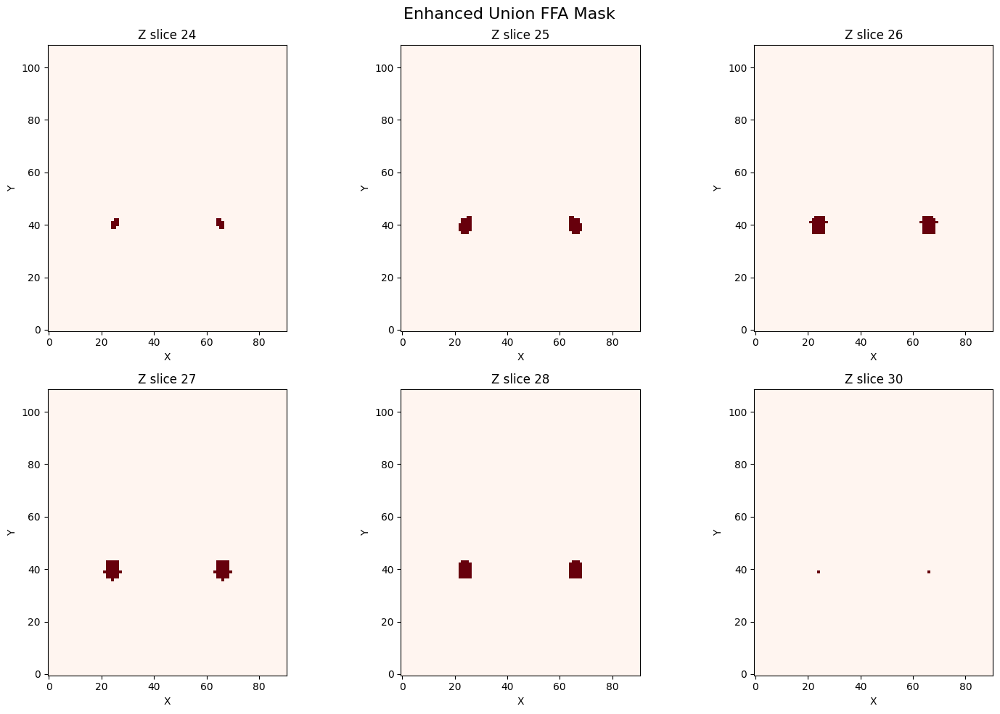

FFA mask statistics:
  Total voxels in mask: 334
  Percentage of brain: 0.04%
  Z-slices with FFA voxels: 7 (range: 24-30)
Computing baseline performance with no perturbation...
Start testing:
### Testing decoder on inputs of shape ['TR', 4609] over 1 videos/slices ###
input_tensor shape: torch.Size([10, 4609]), dtype: torch.float32
label_tensor shape: torch.Size([10, 3, 112, 112, 32]), dtype: torch.float32



 ALRIGHT ZONES = 4 




=== DEBUG INFO ===
Predictions dictionary contains 1 keys: ['combined']
Videos dictionary contains 1 keys: ['combined']
Using metric: tv
Baseline predictions provided: False
Using 4×4 grid zones (16 total zones)
Common keys in both dictionaries: ['combined']
Key mapping from prediction keys to video keys: {'combined': 'combined'}
Prediction combined shape: (10, 3, 112, 112)
Video combined shape: (10, 3, 112, 112)

Average TV Loss for combined by zone:
  - grid_0_0: 0.0537
  - grid_0_1: 0.0457
  - grid_0_2: 0.0650
  - grid_0_3: 0.0550
  - grid_1_0: 0.0508
 

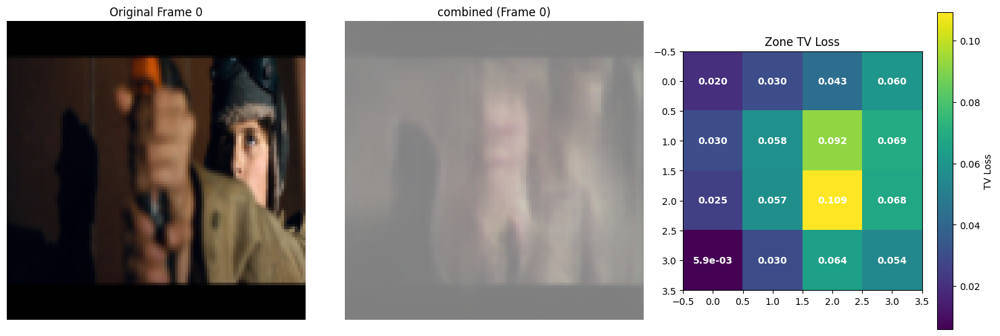

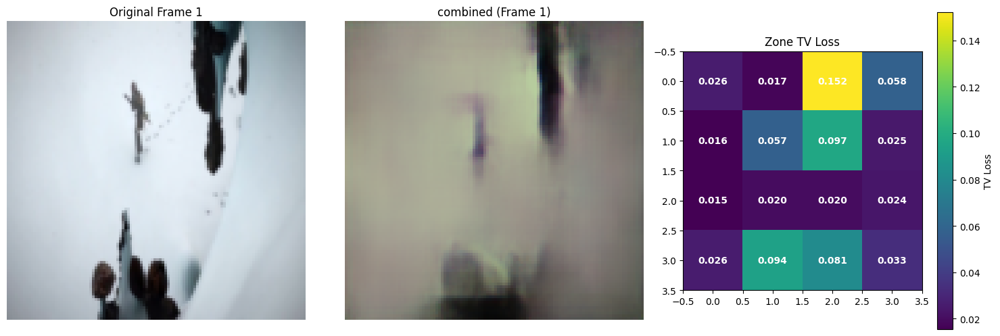

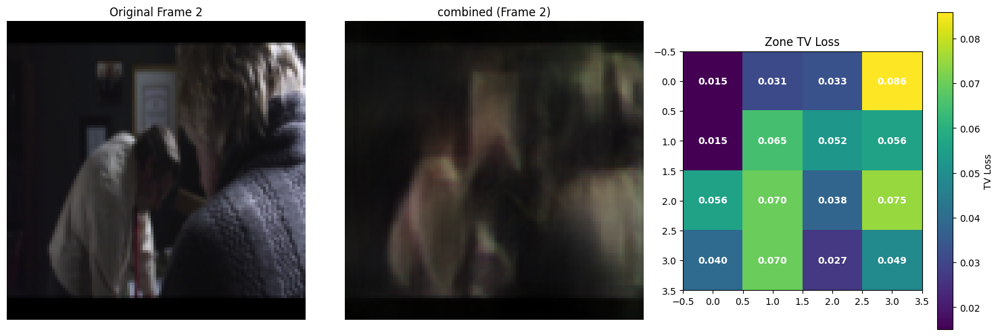

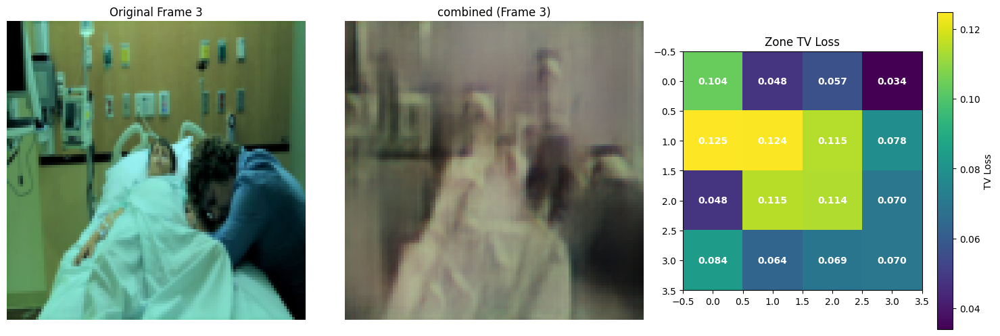

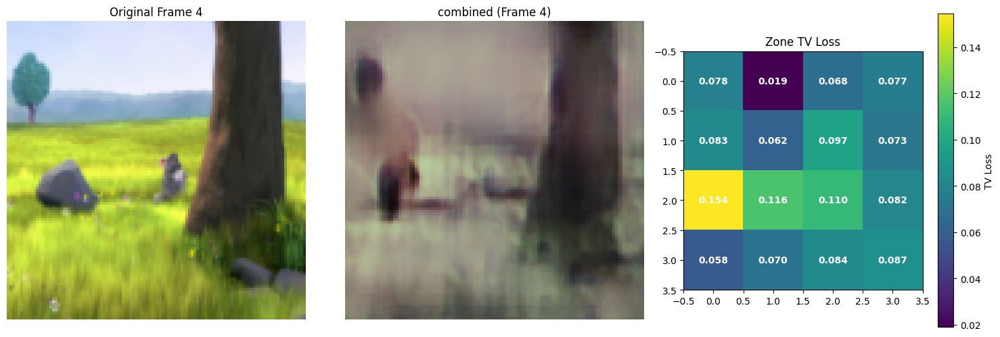

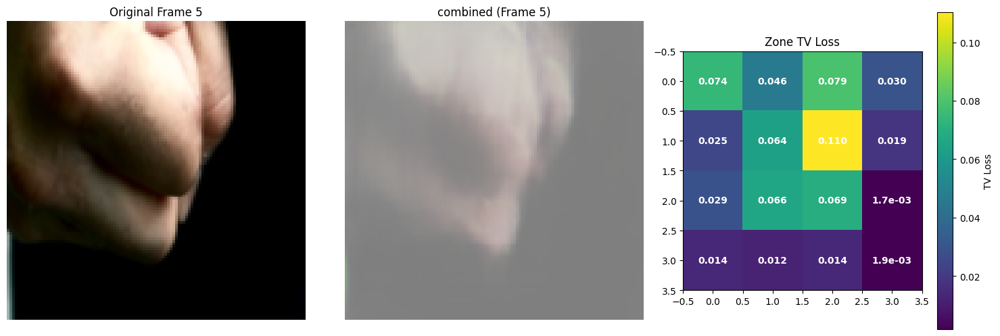

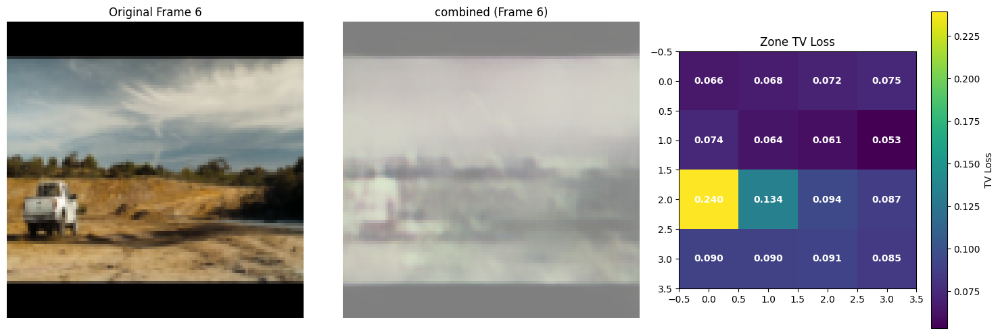

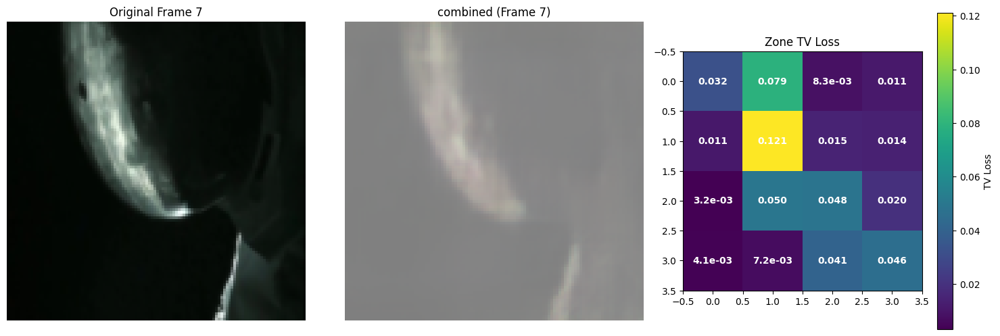

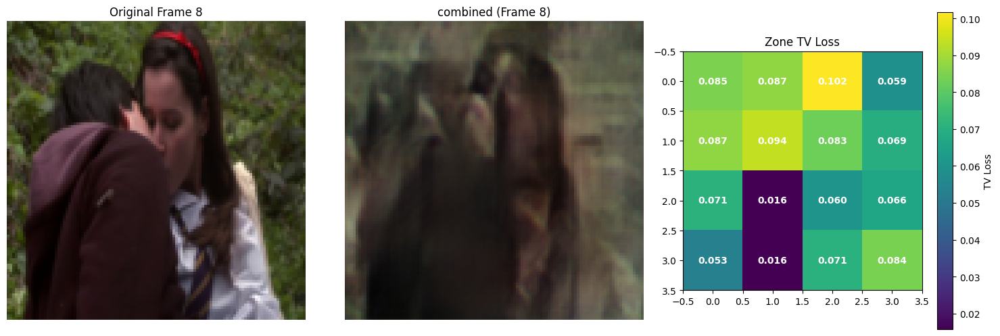

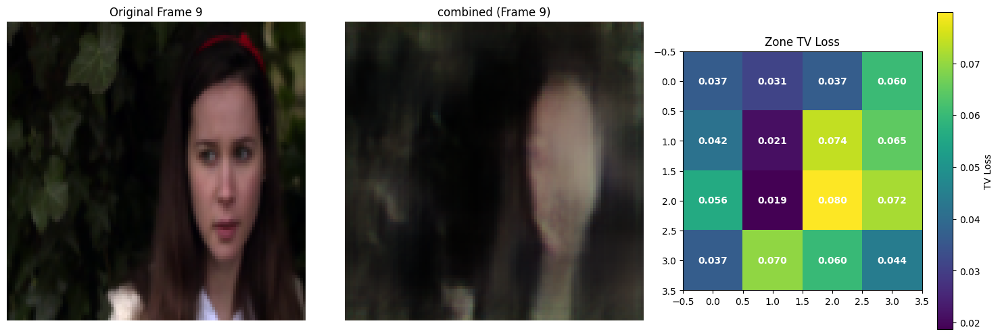

using new function
Testing completed. Total time: 0.08 minutes
---
Baseline performance saved to baseline_ffa_decoder_4609_350_tv_zones4.pkl
Baseline performance:
  mean_tv_grid_0_0_D: 0.05369
  median_tv_grid_0_0_D: 0.05140
  mean_tv_grid_0_1_D: 0.04572
  median_tv_grid_0_1_D: 0.03882
  mean_tv_grid_0_2_D: 0.06504
  median_tv_grid_0_2_D: 0.06222
  mean_tv_grid_0_3_D: 0.05499
  median_tv_grid_0_3_D: 0.05951
  mean_tv_grid_1_0_D: 0.05079
  median_tv_grid_1_0_D: 0.03608
  mean_tv_grid_1_1_D: 0.07296
  median_tv_grid_1_1_D: 0.06372
  mean_tv_grid_1_2_D: 0.07966
  median_tv_grid_1_2_D: 0.08756
  mean_tv_grid_1_3_D: 0.05206
  median_tv_grid_1_3_D: 0.06028
  mean_tv_grid_2_0_D: 0.06982
  median_tv_grid_2_0_D: 0.05193
  mean_tv_grid_2_1_D: 0.06630
  median_tv_grid_2_1_D: 0.06168
  mean_tv_grid_2_2_D: 0.07438
  median_tv_grid_2_2_D: 0.07460
  mean_tv_grid_2_3_D: 0.05651
  median_tv_grid_2_3_D: 0.06894
  mean_tv_grid_3_0_D: 0.04113
  median_tv_grid_3_0_D: 0.03825
  mean_tv_grid_3_1_D: 0.05225
 

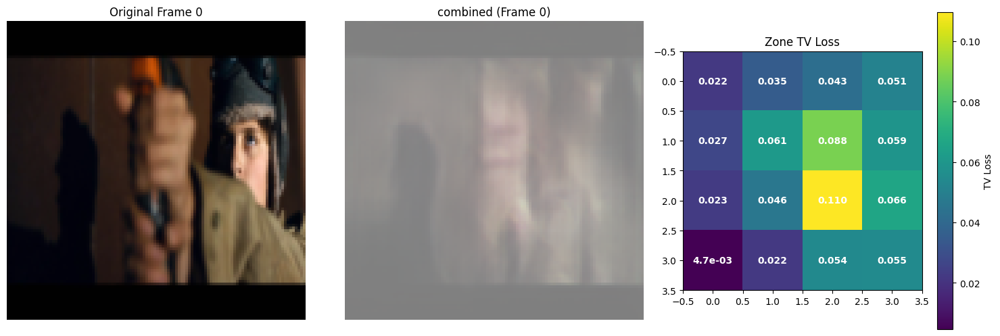

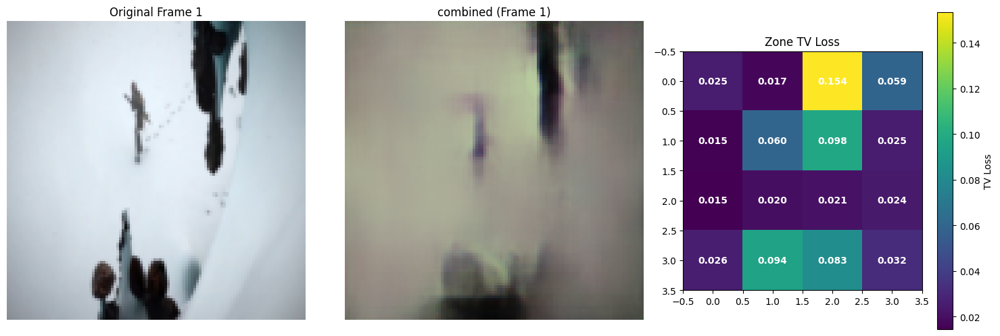

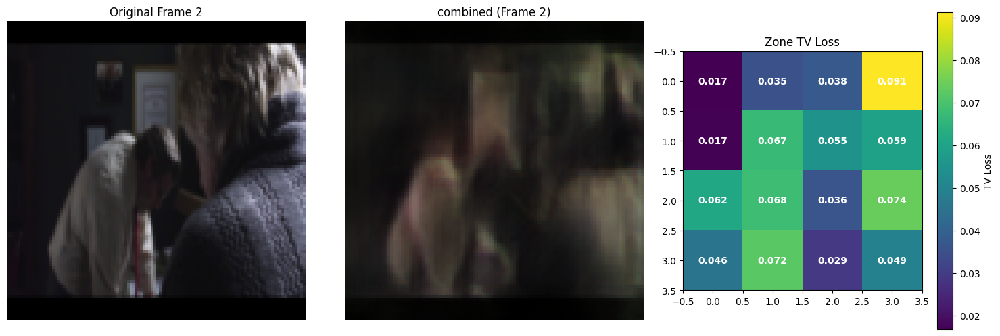

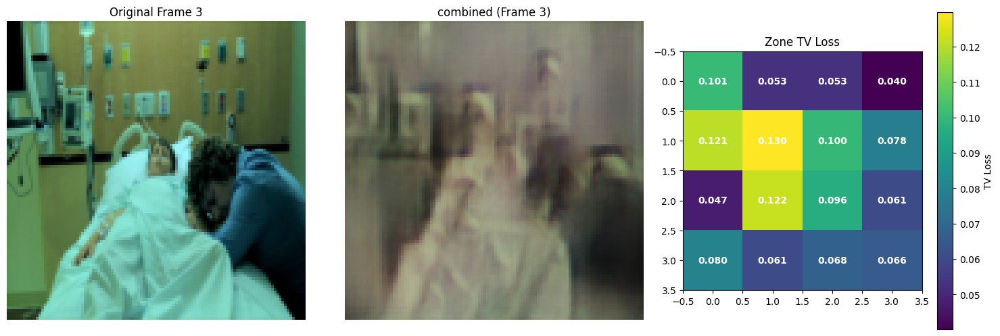

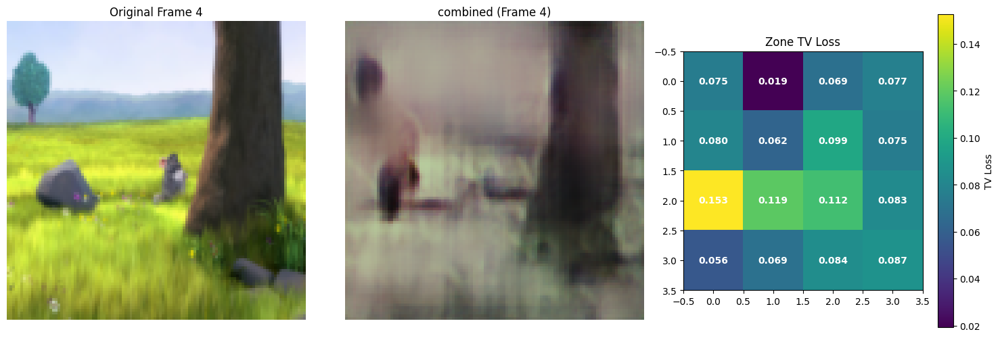

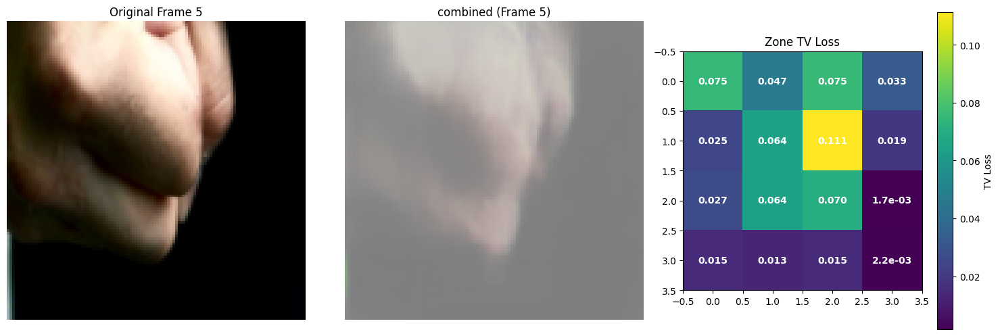

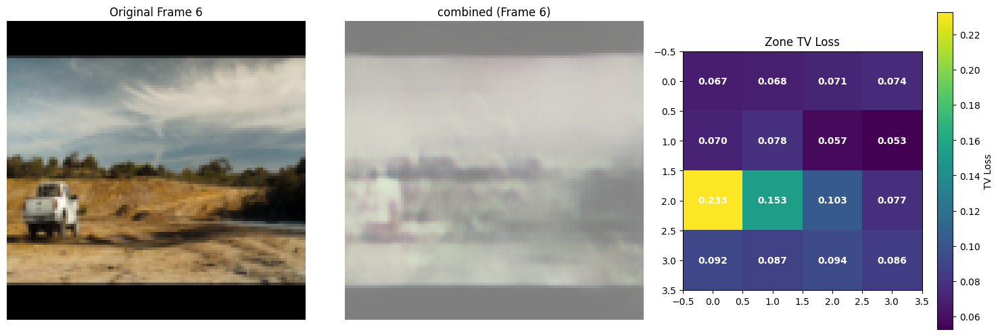

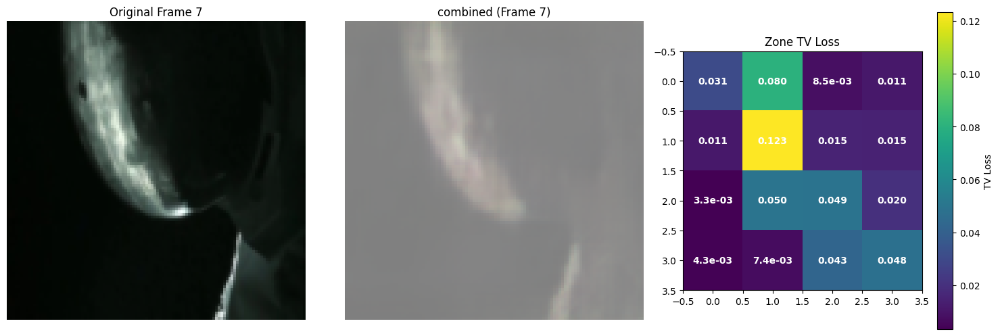

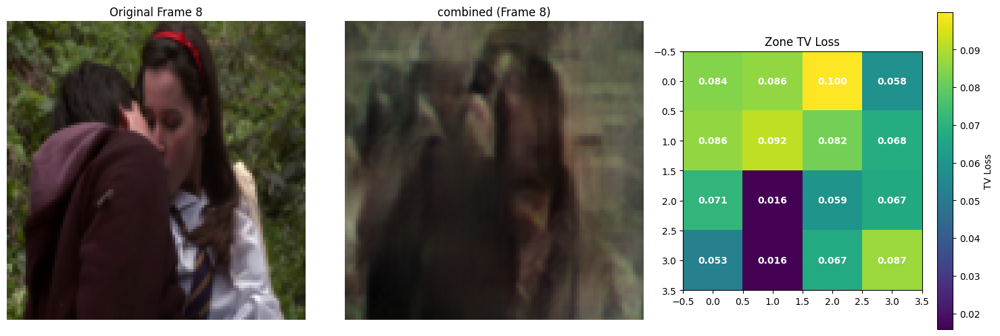

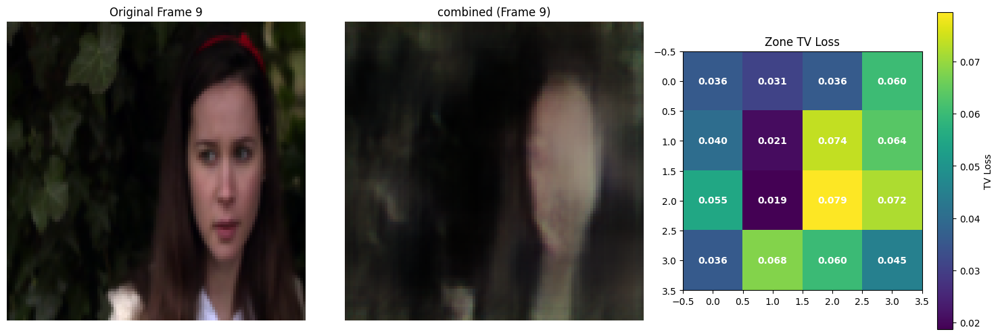

using new function
Testing completed. Total time: 0.08 minutes
---

COMPARISON WITH BASELINE:
Main metric (mean_tv_D):
  Baseline: 0.05944
  FFA OFF:  0.05924
  Difference: -0.00019 (-0.32%)
  -> Performance INCREASED when FFA was turned off

Zone-specific comparisons:
  mean_tv_grid_0_0_D: 0.05324 (baseline: 0.05369, diff: -0.00045, -0.83%)
  mean_tv_grid_0_1_D: 0.04714 (baseline: 0.04572, diff: +0.00143, +3.12%)
  mean_tv_grid_0_2_D: 0.06465 (baseline: 0.06504, diff: -0.00038, -0.59%)
  mean_tv_grid_0_3_D: 0.05563 (baseline: 0.05499, diff: +0.00063, +1.15%)
  mean_tv_grid_1_0_D: 0.04933 (baseline: 0.05079, diff: -0.00146, -2.87%)
  mean_tv_grid_1_1_D: 0.07584 (baseline: 0.07296, diff: +0.00288, +3.95%)
  mean_tv_grid_1_2_D: 0.07797 (baseline: 0.07966, diff: -0.00169, -2.13%)
  mean_tv_grid_1_3_D: 0.05150 (baseline: 0.05206, diff: -0.00056, -1.08%)
  mean_tv_grid_2_0_D: 0.06877 (baseline: 0.06982, diff: -0.00104, -1.49%)
  mean_tv_grid_2_1_D: 0.06776 (baseline: 0.06630, diff: +0.00146

In [ ]:
#nevermind this cell


#tag blocks original vs perturbed reconstruction

def plot_all_predictions7(predictions, videos, performance_dict=None, display_plots=True, save_plots=False, 
                 save_path_prefix=None, model_name="", device="cuda" if torch.cuda.is_available() else "cpu",
                 metric="ssim", mean_flag=False, zone_type="quadrants", max_frames=None, baseline_predictions=None):
    """
    Display comparison plots between original videos and predictions.
    Shows: Original image, baseline reconstruction, perturbed reconstruction, and difference heatmap.
    
    Parameters:
    -----------
    predictions : dict
        Dictionary of prediction arrays (perturbed reconstructions)
    videos : dict
        Dictionary of ground truth video arrays
    performance_dict : dict, optional
        Dictionary to store performance metrics
    display_plots : bool
        Whether to display the plots
    save_plots : bool
        Whether to save the plots
    save_path_prefix : str, optional
        Path prefix for saving plots
    model_name : str
        Name of the model for saving plots
    device : str
        Device to use for computations
    metric : str
        Metric to use for evaluation: "ssim" or "tv" (Total Variation)
    mean_flag : bool
        Whether to return mean metrics or not
    zone_type : str or int
        Type of zones: 
        - "quadrants" for 2×2 grid
        - "center_bg" for center and background
        - integer n for n×n grid (e.g., 4 creates a 4×4 grid with 16 zones)
    max_frames : int, optional
        Maximum number of frames to plot. If None, all frames will be plotted.
    baseline_predictions : dict, optional
        Dictionary of baseline prediction arrays (without perturbation)
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import torch
    import os
    from matplotlib.patches import Rectangle
    from matplotlib.colors import LinearSegmentedColormap, Normalize
    
    # Create output directory if it doesn't exist
    if save_plots and save_path_prefix:
        os.makedirs(save_path_prefix, exist_ok=True)

    # Debug information about inputs
    print("\n=== DEBUG INFO ===")
    print(f"Predictions dictionary contains {len(predictions)} keys: {list(predictions.keys())}")
    print(f"Videos dictionary contains {len(videos)} keys: {list(videos.keys())}")
    print(f"Using metric: {metric}")
    print(f"Baseline predictions provided: {baseline_predictions is not None}")
    
    if isinstance(zone_type, int):
        print(f"Using {zone_type}×{zone_type} grid zones ({zone_type*zone_type} total zones)")
    else:
        print(f"Using zone type: {zone_type}")
    
    # Find the overlapping keys between predictions and videos
    common_keys = [key for key in predictions.keys() if key in videos]
    print(f"Common keys in both dictionaries: {common_keys}")
    
    # Create key mapping between predictions and videos
    if not common_keys and len(videos) > 0:
        print("No common keys found. Trying to match prediction keys to video keys.")
        ref_video_key = list(videos.keys())[0]
        print(f"Using {ref_video_key} as reference video for all predictions")
        key_mapping = {pred_key: ref_video_key for pred_key in predictions.keys()}
    else:
        key_mapping = {}
        for pred_key in predictions.keys():
            if pred_key in videos:
                key_mapping[pred_key] = pred_key
            else:
                matched = False
                for video_key in videos.keys():
                    if video_key in pred_key:
                        key_mapping[pred_key] = video_key
                        matched = True
                        break
                if not matched and len(videos) > 0:
                    key_mapping[pred_key] = list(videos.keys())[0]
    
    print(f"Key mapping from prediction keys to video keys: {key_mapping}")
    
    # Helper function to split frame into zones
    def split_into_zones(frame, zone_type="quadrants", center_ratio=0.5):
        """
        Split a frame into zones.
        """
        if isinstance(frame, torch.Tensor):
            C, H, W = frame.shape
        else:
            C, H, W = frame.shape
            
        zones = {}
        
        if zone_type == "quadrants":
            # Split into 4 quadrants (2×2 grid)
            h_mid = H // 2
            w_mid = W // 2
            
            zones["top_left"] = (slice(None), slice(0, h_mid), slice(0, w_mid))
            zones["top_right"] = (slice(None), slice(0, h_mid), slice(w_mid, W))
            zones["bottom_left"] = (slice(None), slice(h_mid, H), slice(0, w_mid))
            zones["bottom_right"] = (slice(None), slice(h_mid, H), slice(w_mid, W))
            
        elif zone_type == "center_bg":
            # Split into center and background
            h_center = int(H * center_ratio)
            w_center = int(W * center_ratio)
            
            h_start = (H - h_center) // 2
            h_end = h_start + h_center
            w_start = (W - w_center) // 2
            w_end = w_start + w_center
            
            zones["center"] = (slice(None), slice(h_start, h_end), slice(w_start, w_end))
            
            # Background is everything except the center
            center_mask = np.zeros((H, W), dtype=bool)
            center_mask[h_start:h_end, w_start:w_end] = True
            
            zones["background"] = {"mask": ~center_mask, 
                                   "bounds": (h_start, h_end, w_start, w_end)}
            
        elif isinstance(zone_type, int) and zone_type > 0:
            # Create an n×n grid where n = zone_type
            n = zone_type
            
            # Calculate heights of each section
            h_sections = [i * H // n for i in range(n+1)]
            w_sections = [i * W // n for i in range(n+1)]
            
            # Create zones for each grid cell
            for i in range(n):
                for j in range(n):
                    zone_name = f"grid_{i}_{j}"  # Row_Column naming
                    zones[zone_name] = (
                        slice(None),
                        slice(h_sections[i], h_sections[i+1]),
                        slice(w_sections[j], w_sections[j+1])
                    )
                    
        else:
            raise ValueError(f"Unknown zone type: {zone_type}")
            
        return zones
    
    # Helper function to calculate zone metrics
    def calculate_zone_metrics(orig_frame, pred_frame, baseline_frame=None, zones=None, metric="ssim", device=device):
        """
        Calculate metrics for each zone.
        If baseline_frame is provided, calculate the difference: baseline_metrics - pred_metrics
        """
        from pytorch_msssim import ssim
        
        # If zones not provided, calculate them
        if zones is None:
            zones = split_into_zones(orig_frame, zone_type=zone_type)
        
        zone_metrics = {}
        
        # Convert to torch tensors if needed
        if not isinstance(orig_frame, torch.Tensor):
            orig_tensor = torch.from_numpy(orig_frame).unsqueeze(0)
        else:
            orig_tensor = orig_frame.unsqueeze(0)
            
        if not isinstance(pred_frame, torch.Tensor):
            pred_tensor = torch.from_numpy(pred_frame).unsqueeze(0)
        else:
            pred_tensor = pred_frame.unsqueeze(0)
        
        # Process baseline frame if provided    
        if baseline_frame is not None:
            if not isinstance(baseline_frame, torch.Tensor):
                baseline_tensor = torch.from_numpy(baseline_frame).unsqueeze(0)
            else:
                baseline_tensor = baseline_frame.unsqueeze(0)
        
        # Calculate metrics for each zone
        for zone_name, zone_slice in zones.items():
            # Special handling for background in center_bg mode
            if isinstance(zone_slice, dict):  # Background in center_bg mode
                mask = zone_slice["mask"]
                
                orig_zone = orig_tensor.clone()
                pred_zone = pred_tensor.clone()
                
                # Apply mask to all channels
                for c in range(orig_zone.shape[1]):  # For each channel
                    orig_zone[0, c][~mask] = 0
                    pred_zone[0, c][~mask] = 0
                
                # Calculate metric for prediction
                if metric == "ssim":
                    pred_metric = ssim(orig_zone, pred_zone, data_range=1, size_average=True).item()
                else:
                    # TV Loss calculation for masked region
                    tv_loss = torch.abs(pred_zone[:,:,1:,:] - pred_zone[:,:,:-1,:]).sum() + \
                              torch.abs(pred_zone[:,:,:,1:] - pred_zone[:,:,:,:-1]).sum()
                    # Normalize by number of pixels in the zone
                    pred_metric = tv_loss.item() / mask.sum()
                
                # If baseline provided, calculate baseline metric and difference
                if baseline_frame is not None:
                    baseline_zone = baseline_tensor.clone()
                    for c in range(baseline_zone.shape[1]):
                        baseline_zone[0, c][~mask] = 0
                        
                    if metric == "ssim":
                        base_metric = ssim(orig_zone, baseline_zone, data_range=1, size_average=True).item()
                        # For SSIM, higher is better, so baseline - perturbed shows how much we lost
                        # (negative value means perturbation improved SSIM)
                        zone_metrics[zone_name] = base_metric - pred_metric
                    else:
                        # TV Loss
                        tv_loss = torch.abs(baseline_zone[:,:,1:,:] - baseline_zone[:,:,:-1,:]).sum() + \
                                 torch.abs(baseline_zone[:,:,:,1:] - baseline_zone[:,:,:,:-1]).sum()
                        base_metric = tv_loss.item() / mask.sum()
                        # For TV loss, lower is better, so perturbed - baseline shows how much we lost
                        # (positive value means perturbation worsened TV loss)
                        zone_metrics[zone_name] = pred_metric - base_metric
                else:
                    # No baseline, just use the prediction metric
                    zone_metrics[zone_name] = pred_metric
                
            else:  # Normal zones
                # Get the zone data
                orig_zone = orig_tensor[0][zone_slice].unsqueeze(0)
                pred_zone = pred_tensor[0][zone_slice].unsqueeze(0)
                
                # Calculate metric for prediction
                if metric == "ssim":
                    pred_metric = ssim(orig_zone, pred_zone, data_range=1, size_average=True).item()
                else:
                    # TV Loss calculation
                    tv_loss = torch.abs(pred_zone[:,:,1:,:] - pred_zone[:,:,:-1,:]).sum() + \
                              torch.abs(pred_zone[:,:,:,1:] - pred_zone[:,:,:,:-1]).sum()
                    # Normalize by number of pixels in the zone
                    pred_metric = tv_loss.item() / (orig_zone.shape[2] * orig_zone.shape[3])
                
                # If baseline provided, calculate baseline metric and difference
                if baseline_frame is not None:
                    baseline_zone = baseline_tensor[0][zone_slice].unsqueeze(0)
                    
                    if metric == "ssim":
                        base_metric = ssim(orig_zone, baseline_zone, data_range=1, size_average=True).item()
                        # For SSIM, higher is better, so baseline - perturbed shows how much we lost
                        zone_metrics[zone_name] = base_metric - pred_metric
                    else:
                        # TV Loss
                        tv_loss = torch.abs(baseline_zone[:,:,1:,:] - baseline_zone[:,:,:-1,:]).sum() + \
                                 torch.abs(baseline_zone[:,:,:,1:] - baseline_zone[:,:,:,:-1]).sum()
                        base_metric = tv_loss.item() / (baseline_zone.shape[2] * baseline_zone.shape[3])
                        # For TV loss, lower is better, so perturbed - baseline shows how much we lost
                        # (positive value means perturbation worsened TV loss)
                        zone_metrics[zone_name] = pred_metric - base_metric
                else:
                    # No baseline, just use the prediction metric
                    zone_metrics[zone_name] = pred_metric
        
        return zone_metrics
    


    # Helper function for normalizing images for display
    def normalize(img):
        """Normalize image for display"""
        if isinstance(img, torch.Tensor):
            img = img.detach().cpu().numpy()
        
        img = img.copy()
        if img.min() < 0:
            img = (img + 1) / 2  # [-1, 1] -> [0, 1]
        return np.clip(img, 0, 1)
    
    # Initialize metrics
    all_zone_metrics = {}  # Will store metrics for each prediction key
    
    # Get appropriate metric name
    if baseline_predictions is not None:
        metric_description = "Difference from Baseline" 
        if metric == "ssim":
            metric_name = "SSIM Difference"
        else:
            metric_name = "TV Loss Difference"
    else:
        metric_name = "SSIM" if metric == "ssim" else "TV Loss"
        metric_description = metric_name
    
    # Create a TV loss calculator if needed
    if metric == "tv":
        tv_calculator = TotalVariation().to(device)
    


    # ===== PART 1: Calculate zone metrics for each prediction =====
    for pred_key, video_key in key_mapping.items():
        prediction = predictions[pred_key]
        video = videos[video_key][..., 15]  # Middle frame
        
        # Get baseline prediction if available
        baseline_pred = None
        if baseline_predictions is not None:
            # Find the appropriate key in baseline predictions
            baseline_keys = list(baseline_predictions.keys())
            if pred_key in baseline_predictions:
                baseline_pred = baseline_predictions[pred_key]
            elif len(baseline_keys) > 0:
                # If exact key not found, use first available baseline key
                baseline_pred = baseline_predictions[baseline_keys[0]]
                print(f"Using {baseline_keys[0]} as baseline for {pred_key}")
        
        # Check shapes
        print(f"Prediction {pred_key} shape: {prediction.shape}")
        print(f"Video {video_key} shape: {video.shape}")
        if baseline_pred is not None:
            print(f"Baseline prediction shape: {baseline_pred.shape}")
        
        # Ensure prediction and video have compatible shapes
        if prediction.shape[0] != video.shape[0]:
            print(f"Warning: Shape mismatch for {pred_key} vs {video_key}. Skipping.")
            continue
        
        # If baseline exists, ensure it has compatible shape
        if baseline_pred is not None and baseline_pred.shape[0] != prediction.shape[0]:
            print(f"Warning: Baseline shape {baseline_pred.shape} doesn't match prediction shape {prediction.shape}. Ignoring baseline.")
            baseline_pred = None
        
        N = video.shape[0]
        
        # Store metrics for all frames in this prediction
        pred_metrics = []
        
        # Calculate metrics for each frame
        for i in range(N):
            # Get zones for this frame
            zones = split_into_zones(video[i], zone_type=zone_type)
            
            # Calculate metrics for each zone
            try:
                # If baseline exists, calculate difference metrics
                if baseline_pred is not None:
                    zone_metrics = calculate_zone_metrics(
                        video[i], prediction[i], baseline_frame=baseline_pred[i], zones=zones, metric=metric
                    )
                else:
                    zone_metrics = calculate_zone_metrics(
                        video[i], prediction[i], zones=zones, metric=metric
                    )
                pred_metrics.append(zone_metrics)
            except Exception as e:
                print(f"Error calculating zone metrics for {pred_key}, frame {i}: {e}")
                # Create empty metrics
                if zone_type == "quadrants":
                    pred_metrics.append({
                        "top_left": 0, "top_right": 0, 
                        "bottom_left": 0, "bottom_right": 0
                    })
                elif zone_type == "center_bg":
                    pred_metrics.append({"center": 0, "background": 0})
                elif isinstance(zone_type, int):
                    empty_metrics = {}
                    for ii in range(zone_type):
                        for jj in range(zone_type):
                            empty_metrics[f"grid_{ii}_{jj}"] = 0
                    pred_metrics.append(empty_metrics)
        
        # Store metrics for this prediction
        all_zone_metrics[pred_key] = pred_metrics
        
        # Print average metrics for this prediction
        print(f"\nAverage {metric_description} for {pred_key} by zone:")
        
        # Calculate and print mean metrics across frames for each zone
        if len(pred_metrics) > 0:
            zone_names = list(pred_metrics[0].keys())
            
            for zone in zone_names:
                zone_values = [metrics[zone] for metrics in pred_metrics]
                mean_zone = np.mean(zone_values)
                print(f"  - {zone}: {mean_zone:.4f}")
    

    # ===== PART 2: Plot the original image, baseline, reconstruction, and heatmap side by side =====
    if display_plots and len(key_mapping) > 0:
        # Get a reference video key and shape
        ref_video_key = list(videos.keys())[0]
        ref_video = videos[ref_video_key][..., 15]
        N = ref_video.shape[0]
        
        # Determine the frames to plot
        if max_frames is not None and max_frames < N:
            # Evenly sample frames if max_frames is specified
            indices = np.linspace(0, N-1, max_frames, dtype=int)
        else:
            # Plot all frames
            indices = np.arange(N)
        
        # Determine number of panels based on whether baseline is available
        if baseline_predictions is not None:
            num_panels = 4  # Original, Baseline, Perturbed, Difference
            print(f"\nPlotting {len(indices)} frames with Original, Baseline, Perturbed, and Difference")
        else:
            num_panels = 3  # Original, Reconstruction, Heatmap
            print(f"\nPlotting {len(indices)} frames with Original, Reconstruction, and Heatmap")
        
        # REORDERING: Create an ordered list of prediction keys with "original_combined" first
        ordered_keys = []
        for key in key_mapping.keys():
            if key != "original_combined":
                ordered_keys.append(key)
        
        # If "original_combined" exists, insert it at the beginning of the list
        if "original_combined" in key_mapping:
            ordered_keys.insert(0, "original_combined")
        
        # For each frame index
        for frame_idx in indices:
            # Plot original reference frame
            ref_frame = ref_video[frame_idx]
            
            # For each prediction
            for pred_key in ordered_keys:
                try:
                    video_key = key_mapping[pred_key]
                    perturbed_frame = predictions[pred_key][frame_idx]
                    
                    # Get baseline frame if available
                    baseline_frame = None
                    if baseline_predictions is not None:
                        if pred_key in baseline_predictions:
                            baseline_frame = baseline_predictions[pred_key][frame_idx]
                        elif len(baseline_predictions) > 0:
                            # Use first available baseline prediction
                            first_key = list(baseline_predictions.keys())[0]
                            baseline_frame = baseline_predictions[first_key][frame_idx]
                    
                    # Get zone metrics for this prediction
                    zone_metrics = all_zone_metrics[pred_key][frame_idx]
                    
                    # Determine if we're showing differences or absolute values
                    is_difference = baseline_frame is not None
                    
                    # Create a figure with the appropriate number of subplots
                    fig, axes = plt.subplots(1, num_panels, figsize=(5 * num_panels, 5))
                    
                    # 1. Original Frame (leftmost)
                    axes[0].imshow(np.transpose(normalize(ref_frame), (1, 2, 0)))
                    axes[0].set_title(f"Original Frame {frame_idx}")
                    axes[0].axis('off')
                    
                    # Panel index for reconstruction and heatmap depends on whether baseline exists
                    recon_idx = 2 if is_difference else 1
                    heatmap_idx = 3 if is_difference else 2
                    
                    # 2. Baseline Reconstruction (if available)
                    if is_difference:
                        axes[1].imshow(np.transpose(normalize(baseline_frame), (1, 2, 0)))
                        axes[1].set_title(f"Baseline Reconstruction")
                        axes[1].axis('off')
                    
                    # 3. Perturbed Reconstruction 
                    axes[recon_idx].imshow(np.transpose(normalize(perturbed_frame), (1, 2, 0)))
                    if is_difference:
                        axes[recon_idx].set_title(f"Perturbed Reconstruction")
                    else:
                        axes[recon_idx].set_title(f"{pred_key} (Frame {frame_idx})")
                    axes[recon_idx].axis('off')
                    
                    # 4. Heatmap of metrics (rightmost)
                    # Determine colormap based on if we're showing differences
                    cmap_name = 'coolwarm' if is_difference else 'viridis'
                    
                    # Also determine normalization based on if we're showing differences
                    if is_difference:
                        # For differences, use symmetric normalization around zero
                        values = list(zone_metrics.values())
                        max_abs = max(abs(min(values)), abs(max(values))) if values else 1.0
                        norm = Normalize(vmin=-max_abs, vmax=max_abs)
                    else:
                        # For absolute values, use standard normalization
                        norm = None  # Let matplotlib handle it
                    
                    if isinstance(zone_type, int):
                        # For n×n grid, create a grid to display metrics
                        grid_values = np.zeros((zone_type, zone_type))
                        
                        for i in range(zone_type):
                            for j in range(zone_type):
                                zone_name = f"grid_{i}_{j}"
                                grid_values[i, j] = zone_metrics.get(zone_name, 0)
                        
                        # Show the heatmap
                        im = axes[heatmap_idx].imshow(grid_values, cmap=cmap_name, interpolation='nearest', norm=norm)
                        
                        # Add text labels with adjustable font size
                        fontsize = max(6, min(10, 16 - zone_type))  # Scale font size based on grid density
                        for i in range(zone_type):
                            for j in range(zone_type):
                                # Format the value based on magnitude
                                val = grid_values[i, j]
                                if abs(val) >= 0.01:
                                    text = f"{val:.3f}"
                                else:
                                    text = f"{val:.1e}"
                                    
                                axes[heatmap_idx].text(j, i, text,
                                           ha="center", va="center", color="white",
                                           fontsize=fontsize, fontweight='bold')
                        
                        # Add colorbar
                        cbar = plt.colorbar(im, ax=axes[heatmap_idx])
                        cbar.set_label(metric_name)
                        
                        axes[heatmap_idx].set_title(f"Zone {metric_description}")
                        
                    elif zone_type == "quadrants":
                        # For quadrants, create a 2×2 heatmap
                        quadrant_values = np.zeros((2, 2))
                        quadrant_values[0, 0] = zone_metrics.get("top_left", 0)
                        quadrant_values[0, 1] = zone_metrics.get("top_right", 0)
                        quadrant_values[1, 0] = zone_metrics.get("bottom_left", 0)
                        quadrant_values[1, 1] = zone_metrics.get("bottom_right", 0)
                        
                        # Show the heatmap
                        im = axes[heatmap_idx].imshow(quadrant_values, cmap=cmap_name, interpolation='nearest', norm=norm)
                        
                        # Add text labels
                        for i, j in [(0,0), (0,1), (1,0), (1,1)]:
                            val = quadrant_values[i, j]
                            if abs(val) >= 0.01:
                                text = f"{val:.3f}"
                            else:
                                text = f"{val:.1e}"
                            axes[heatmap_idx].text(j, i, text, ha="center", va="center", color="white", fontsize=10)
                        
                        # Add colorbar
                        cbar = plt.colorbar(im, ax=axes[heatmap_idx])
                        cbar.set_label(metric_name)
                        
                        axes[heatmap_idx].set_title(f"Quadrant {metric_description}")
                        
                    elif zone_type == "center_bg":
                        # For center/background, special visualization
                        center_val = zone_metrics.get("center", 0)
                        bg_val = zone_metrics.get("background", 0)
                        
                        # Create a mask-based visualization
                        mask = np.zeros((3, 3), dtype=bool)
                        mask[1, 1] = True  # Center is True, background is False
                        
                        # Create values array where center has one value, background another
                        values = np.ones((3, 3)) * bg_val
                        values[1, 1] = center_val
                        
                        # Show the heatmap
                        im = axes[heatmap_idx].imshow(values, cmap=cmap_name, interpolation='nearest', norm=norm)
                        
                        # Format values for display
                        if abs(center_val) >= 0.01:
                            center_text = f"Center\n{center_val:.3f}"
                        else:
                            center_text = f"Center\n{center_val:.1e}"
                            
                        if abs(bg_val) >= 0.01:
                            bg_text = f"BG\n{bg_val:.3f}"
                        else:
                            bg_text = f"BG\n{bg_val:.1e}"
                        
                        # Add text labels
                        axes[heatmap_idx].text(1, 1, center_text, ha="center", va="center", color="white", fontsize=10)
                        axes[heatmap_idx].text(0, 0, bg_text, ha="center", va="center", color="white", fontsize=10)
                        
                        # Add colorbar
                        cbar = plt.colorbar(im, ax=axes[heatmap_idx])
                        cbar.set_label(metric_name)
                        
                        axes[heatmap_idx].set_title(f"Center/Background {metric_description}")
                    
                    plt.tight_layout()
                    
                    # Save figure if requested
                    if save_plots and save_path_prefix:
                        zone_type_str = zone_type if isinstance(zone_type, str) else f"grid{zone_type}x{zone_type}"
                        type_str = "diff" if is_difference else "abs"
                        fig_path = f"{save_path_prefix}{pred_key}_frame{frame_idx}_{metric}_{zone_type_str}_{type_str}.png"
                        plt.savefig(fig_path, bbox_inches='tight', dpi=300)
                    
                    plt.show()
                    
                except Exception as e:
                    print(f"Error creating visualization for {pred_key} (Frame {frame_idx}): {e}")
    
    # Calculate overall mean metric
    overall_mean = 0
    if len(all_zone_metrics) > 0:
        # Average across all predictions and all zones
        all_values = []
        for pred_metrics in all_zone_metrics.values():
            for metrics in pred_metrics:
                all_values.extend(list(metrics.values()))
        
        if all_values:
            overall_mean = np.mean(all_values)
    
    # Update performance dictionary if provided
    if performance_dict is not None:
        try:
            # Calculate overall metrics across all zones
            for pred_key, pred_metrics in all_zone_metrics.items():
                if len(pred_metrics) > 0:
                    zone_names = list(pred_metrics[0].keys())
                    
                    for zone in zone_names:
                        zone_values = [metrics[zone] for metrics in pred_metrics]
                        zone_mean = np.mean(zone_values)
                        zone_median = np.median(zone_values)
                        
                        # Add to performance dict
                        if baseline_predictions is not None:
                            # This is a difference metric
                            if metric == "ssim":
                                performance_dict[f'diff_ssim_{zone}_D'] = zone_mean
                                performance_dict[f'median_diff_ssim_{zone}_D'] = zone_median
                            else:
                                performance_dict[f'diff_tv_{zone}_D'] = zone_mean
                                performance_dict[f'median_diff_tv_{zone}_D'] = zone_median
                        else:
                            # This is an absolute metric
                            if metric == "ssim":
                                performance_dict[f'mean_ssim_{zone}_D'] = zone_mean
                                performance_dict[f'median_ssim_{zone}_D'] = zone_median
                            else:
                                performance_dict[f'mean_tv_{zone}_D'] = zone_mean
                                performance_dict[f'median_tv_{zone}_D'] = zone_median
            
            # Add overall mean metric
            if baseline_predictions is not None:
                # This is a difference metric
                if metric == "ssim":
                    performance_dict['diff_ssim_D'] = overall_mean
                else:
                    performance_dict['diff_tv_D'] = overall_mean
            else:
                # This is an absolute metric
                if metric == "ssim":
                    performance_dict['mean_ssim_D'] = overall_mean
                else:
                    performance_dict['mean_tv_D'] = overall_mean
                
        except Exception as e:
            print(f"Error updating performance dictionary: {e}")
    
    if mean_flag:
        return overall_mean
    
    return performance_dict








def test_model_all(inputs_dict, labels_dict, model, criterion, device, pretrained_decoder=None, model_to_test=None, 
               statistical_testing=False, display_plots=True, save_plots=False, model_name="", metric="ssim", 
               mean_flag=False, zones=None, baseline_predictions=None):
    """
    Test the pretrained model on the provided dataset.

    Arguments:
        inputs_dict (dict): Dictionary of input data. Keys are movie names or slice identifiers. 
                           If model_to_test is 'encoder' or 'encoder_decoder', then elements have a shape of (TR, 3, 112, 112, 32). 
                           Else, shape of (TR, mask_size).
        labels_dict (dict): Dictionary of labels. Keys are movie names. 
                           If model_to_test is 'encoder' or 'encoder_decoder', then elements have a shape of (TR, mask_size). 
                           Else, shape of (TR, 3, 112, 112, 32).
        model (nn.Module): The pretrained neural network model to be tested.
        criterion (nn.Module): Loss function for testing.
        device (torch.device): Device to test the model on (CPU or GPU).
        pretrained_decoder (str, optional): Path to a pretrained decoder model. Default is None.
        model_to_test (str): Specifies which part of the model to test. Options are 'encoder', 'decoder', or 'encoder_decoder'.
        statistical_testing (bool, optional): Whether to perform statistical testing. Default is False.
        display_plots (bool, optional): Whether to display plots. Default is True.
        save_plots (bool, optional): Whether to save plots. Default is False.
        model_name (str, optional): Name of the model for saving plots. Default is "".
        zones (str or int, optional): Zones to consider for testing. Default is "quadrants", can also be "center_bg".
                                      If it is an integer, the function will analyze a number of zones = that integer squared.
                                      For example, if zones = 4, the function will analyze 16 zones (4x4).
        baseline_predictions (dict, optional): Dictionary of baseline predictions for comparison.

    Returns:
        results (dict): Dictionary containing test results including model predictions and losses.
    """
    print('Start testing:')
    tic = time.time()

    # Create outputs directory if it doesn't exist
    if save_plots:
        import os
        os.makedirs('outputs', exist_ok=True)

    model_type = ['encoder', 'decoder', 'encoder_decoder']
    if model_to_test not in model_type:
        print(f'model_to_test: {model_to_test} not recognized. Must be one of {model_type}')
        return None, None

    # Get list of input keys (movie names or slice identifiers)
    videos = list(inputs_dict.keys())
    inputs_shape = list(inputs_dict[videos[0]].shape)
    inputs_shape[0] = 'TR'
    print(f'### Testing {model_to_test} on inputs of shape {inputs_shape} over {len(videos)} videos/slices ###')
    
    if baseline_predictions is not None:
        print(f'### Using baseline predictions for comparison ###')

    criterion = criterion.to(device)
    # Set model in testing phase
    model.to(device)
    model.eval()

    # Load and set pretrained decoder if specified
    if pretrained_decoder:
        decoder = Decoder(labels_dict[next(iter(labels_dict))].shape[1])  # Assuming shape is consistent across labels
        state_dict = torch.load(pretrained_decoder)
        decoder.load_state_dict(state_dict)
        decoder.to(device)
        for param in decoder.parameters():
            param.requires_grad = False
        decoder.eval()

        print(f'Also using pretrained decoder {pretrained_decoder}')

    if model_to_test != 'encoder_decoder' and pretrained_decoder is None:
        results = {
            model_to_test + '_predictions': {},
            'total_losses': {}
        }
    else:
        results = {
            'encoder_predictions': {},
            'decoder_predictions': {},
            'total_losses': {}
        }

        decoder_saliency = np.zeros(labels_dict[list(labels_dict.keys())[0]].shape[1])

    results['test_performance'] = {}
    
    # Process each item in the inputs and labels dictionaries
    for key in inputs_dict.keys():
        input_tensor = torch.from_numpy(inputs_dict[key].astype('float32'))
        
        # Get the corresponding label - if it's a slice name, extract the original movie name
        if key in labels_dict:
            label_key = key
        else:
            # Extract the movie name from the key (assumed to be after the last underscore)
            # For keys like "slice_0_Payload", this will extract "Payload"
            if '_' in key:
                extracted_movie = key.split('_')[-1]
                if extracted_movie in labels_dict:
                    label_key = extracted_movie
                    print(f"Input key '{key}' not found in labels. Extracted and using '{label_key}' for labels.")
                else:
                    # If extracted name not found, use first available label
                    label_key = list(labels_dict.keys())[0]
                    print(f"Input key '{key}' and extracted movie '{extracted_movie}' not found in labels. Using '{label_key}' for labels.")
            else:
                # If no underscore in key, use first available label
                label_key = list(labels_dict.keys())[0]
                print(f"Input key '{key}' not found in labels and no movie name could be extracted. Using '{label_key}' for labels.")
        
        label_tensor = torch.from_numpy(labels_dict[label_key].astype('float32'))

        # Debug info about tensors but without using print_dict_tree
        print(f"input_tensor shape: {input_tensor.shape}, dtype: {input_tensor.dtype}")
        print(f"label_tensor shape: {label_tensor.shape}, dtype: {label_tensor.dtype}")
        
        test_set = torch.utils.data.TensorDataset(input_tensor, label_tensor)
        test_loader = torch.utils.data.DataLoader(
            test_set,
            batch_size=16,
            shuffle=False,
            pin_memory=torch.cuda.is_available(),
            num_workers=4
        )

        model_outputs, decoder_outputs, total_losses = [], [], []
        with torch.no_grad():
            for input, label in test_loader:
                input, label = input.to(device), label.to(device)
            
                decoder_output = None
                if model_to_test == 'encoder_decoder':
                    model_output, decoder_output = model(input.float())
                elif pretrained_decoder:
                    model_output = model(input.float()).to(device)
                    decoder_output = decoder(model_output.float())
                else:
                    model_output = model(input.float())
                        
                model_outputs.append(model_output.detach().cpu())
                if decoder_output is not None:
                    decoder_outputs.append(decoder_output.detach().cpu())
            
                # Apply the appropriate criterion based on the presence of decoder outputs
                if model_to_test == 'decoder':
                    *loss_metrics, total_loss, metrics_names = criterion(model_output, label[..., 15])          #--> middle frame
                elif decoder_output is None:
                    *loss_metrics, total_loss, metrics_names = criterion(model_output, label)
                else:
                    *loss_metrics, total_loss, metrics_names = criterion(model_output, label, decoder_output, input[..., 15])
                
                total_losses.append(total_loss.item())

        # Store the outputs in results
        if model_to_test != 'encoder_decoder' and pretrained_decoder is None:
            results[model_to_test + '_predictions'][key] = torch.cat(model_outputs, dim=0).numpy()
        else:
            results['encoder_predictions'][key] = torch.cat(model_outputs, dim=0).numpy()
            results['decoder_predictions'][key] = torch.cat(decoder_outputs, dim=0).numpy()
        
        results['total_losses'][key] = np.asarray(total_losses)

        if model_to_test != 'decoder':
            encoded = results['encoder_predictions'][key]
            labels = labels_dict[label_key] if key not in labels_dict else labels_dict[key]
            plot_metrics(labels, encoded, key, plot_TR=False, performance_dict=None, 
                        display_plots=display_plots,
                        save_plots=save_plots,
                        save_path=f'outputs/{key}_{model_name}.png' if save_plots else None)

    if model_to_test != 'decoder':
        all_encoded = results['encoder_predictions']
        all_labels = labels_dict
        # Using the last processed key for display
        results['test_performance'] = plot_metrics(labels, encoded, key, plot_TR=False, performance_dict=None, 
                        display_plots=display_plots,
                        save_plots=save_plots,
                        save_path=f'outputs/{key}_{model_name}.png' if save_plots else None)

        if statistical_testing:
            all_labels, all_predictions = [], []
            for key in labels_dict.keys():
                if key in results['encoder_predictions']:
                    all_predictions.append(results['encoder_predictions'][key])
                    all_labels.append(labels_dict[key])
            all_predictions = np.concatenate(all_predictions, axis=0)
            all_labels = np.concatenate(all_labels, axis=0)
            one_sample_permutation_test(all_labels, all_predictions)

    if model_to_test != 'encoder' or pretrained_decoder is not None:
        if model_to_test == 'decoder':
            print("\n\n\n ALRIGHT ZONES =", zones, "\n\n\n")
            
            # Check if we have baseline predictions to use
            if baseline_predictions is not None:
                # Use the modified plot_all_predictions7 with baseline comparison
                results['test_performance'] = plot_all_predictions7(
                    results['decoder_predictions'], 
                    labels_dict, 
                    results['test_performance'], 
                    display_plots,
                    save_plots=save_plots,
                    save_path_prefix='outputs/' if save_plots else None,
                    model_name=model_name, 
                    metric=metric, 
                    mean_flag=mean_flag,
                    zone_type=zones,
                    baseline_predictions=baseline_predictions
                )
            else:
                # Use the regular plot_all_predictions7 without baseline
                if zones is None:
                    results['test_performance'] = plot_all_predictions5(
                        results['decoder_predictions'], 
                        labels_dict, 
                        results['test_performance'], 
                        display_plots,
                        save_plots=save_plots,
                        save_path_prefix='outputs/' if save_plots else None,
                        model_name=model_name, 
                        metric=metric, 
                        mean_flag=mean_flag
                    )
                else:
                    results['test_performance'] = plot_all_predictions7(
                        results['decoder_predictions'], 
                        labels_dict, 
                        results['test_performance'], 
                        display_plots,
                        save_plots=save_plots,
                        save_path_prefix='outputs/' if save_plots else None,
                        model_name=model_name, 
                        metric=metric, 
                        mean_flag=mean_flag,
                        zone_type=zones
                    )

        else:
            # For encoder or encoder_decoder, use inputs_dict for ground truth
            if baseline_predictions is not None:
                results['test_performance'] = plot_all_predictions7(
                    results['decoder_predictions'], 
                    inputs_dict, 
                    results['test_performance'], 
                    display_plots,
                    save_plots=save_plots,
                    save_path_prefix='outputs/' if save_plots else None,
                    model_name=model_name, 
                    metric=metric, 
                    baseline_predictions=baseline_predictions
                )
            else:
                results['test_performance'] = plot_all_predictions5(
                    results['decoder_predictions'], 
                    inputs_dict, 
                    results['test_performance'], 
                    display_plots,
                    save_plots=save_plots,
                    save_path_prefix='outputs/' if save_plots else None,
                    model_name=model_name, 
                    metric=metric
                )
    print("using new function")
        
    if model_to_test == 'encoder_decoder':
        with torch.enable_grad():
            for key in inputs_dict.keys():
                predicted_fMRIs = torch.from_numpy(results['encoder_predictions'][key])
                # Get corresponding input for ground truth
                if key in inputs_dict:
                    input_key = key
                else:
                    # Use first input if key not found
                    input_key = list(inputs_dict.keys())[0]
                
                ground_truth_frames = torch.from_numpy(inputs_dict[input_key][..., 15])
                for i in range(predicted_fMRIs.shape[0]):
                    decoder_saliency += compute_saliency(model.decoder, predicted_fMRIs[i:i+1], ground_truth_frames[i:i+1], device)

        if display_plots:
            plot_saliency_distribution(decoder_saliency)
        results['decoder_saliency'] = decoder_saliency

    print("Testing completed. Total time: {:.2f} minutes".format((time.time() - tic) / 60))
    print('---')
    return results








def calculate_baseline_losses(model_name='decoder_4609_350', test_input=None, test_label=None, 
                           all_frames=True, save_plots=False, metric="tv", zones=4):
    """
    Calculate baseline reconstruction losses without any perturbation
    
    Parameters:
    -----------
    model_name : str
        Name of the model file to be used
    test_input : dict
        Dictionary with fMRIs for testing
    test_label : dict
        Dictionary with films
    all_frames : bool
        If True, runs test_model_all, otherwise runs test_model
    save_plots : bool
        If True, saves plots
    metric : str
        Metric to use for evaluation: "ssim" or "tv" (Total Variation)
    zones : str or int
        Zone configuration for analysis
        
    Returns:
    --------
    dict
        Dictionary with baseline losses for each zone
    """
    import numpy as np
    
    print("Calculating baseline losses with no perturbation")
    
    # Load the model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Testing parameters
    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder = None
    model_to_test = 'decoder'
    statistical_testing = False
    display_plots = True
    
    # Run test_model_all without perturbation to get baseline performance
    if all_frames:
        baseline_results = test_model_all(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + '_baseline', 
            metric=metric, 
            mean_flag=False,
            zones=zones
        )
        print("Baseline test completed")
        return baseline_results['test_performance']
    else:
        test_model(
            test_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + '_baseline'
        )
        return None



def turn_off_ffa_voxels(fmri_2d, flat_mask, ffa_mask_3d):
    """
    Turn off voxels specified by the FFA mask in fMRI data
    
    Parameters:
    -----------
    fmri_2d : numpy.ndarray
        2D array of fMRI data (samples x voxels)
    flat_mask : numpy.ndarray
        Flattened mask indicating which voxels in 3D space are used in fMRI data
    ffa_mask_3d : numpy.ndarray
        3D mask indicating which voxels to turn off (FFA region)
        
    Returns:
    --------
    numpy.ndarray
        Modified fMRI data with FFA voxels turned off
    """
    # Get the original 3D shape
    original_shape = (91, 109, 91)  # Adjust if your shape is different
    
    # Reshape flat_mask to 3D
    mask_3d = flat_mask.reshape(original_shape)
    
    # Create a mask that includes only voxels that are both in the original mask AND in the FFA region
    ffa_region_mask_3d = mask_3d.copy()
    ffa_region_mask_3d = ffa_region_mask_3d * ffa_mask_3d  # Element-wise multiplication
    
    # Flatten the FFA region mask
    flat_ffa_mask = ffa_region_mask_3d.flatten()
    
    # Get non-zero indices in the original mask
    original_non_zero = np.nonzero(flat_mask)[0]
    
    # Get non-zero indices in the FFA mask
    ffa_non_zero = np.nonzero(flat_ffa_mask)[0]
    
    # Find where these FFA indices appear in the original non-zero indices
    indices_to_turn_off = np.where(np.isin(original_non_zero, ffa_non_zero))[0]
    
    # Calculate statistics before turning off
    zeros_before = (fmri_2d == 0).sum()
    total_values = fmri_2d.size
    percent_zeros_before = (zeros_before / total_values) * 100
    print(f"Before turning off FFA voxels - Zeros: {zeros_before}/{total_values} ({percent_zeros_before:.2f}%)")
    print(f"FFA region contains {len(indices_to_turn_off)} voxels out of 4609 total non-zero voxels")
    
    # Create a copy of the fMRI data
    fmri_modified = fmri_2d.copy()
    
    # Turn off the FFA voxels
    if len(indices_to_turn_off) > 0:
        fmri_modified[:, indices_to_turn_off] = 0
    
    # Calculate statistics after turning off
    zeros_after = (fmri_modified == 0).sum()
    percent_zeros_after = (zeros_after / total_values) * 100
    new_zeros = zeros_after - zeros_before
    percent_increase = (new_zeros / total_values) * 100
    
    print(f"After turning off FFA voxels - Zeros: {zeros_after}/{total_values} ({percent_zeros_after:.2f}%)")
    print(f"Values turned off: {new_zeros}/{total_values} ({percent_increase:.2f}%)")
    
    return fmri_modified


def visualize_ffa_mask(ffa_mask_3d, title="FFA Mask Visualization"):
    """
    Visualize the FFA mask in 3D brain space
    
    Parameters:
    -----------
    ffa_mask_3d : numpy.ndarray
        3D mask indicating FFA voxels
    title : str
        Title for the visualization
    """
    import matplotlib.pyplot as plt
    
    # Find non-zero slices
    non_zero_slices = np.where(np.any(ffa_mask_3d, axis=(0, 1)))[0]
    
    if len(non_zero_slices) == 0:
        print("No non-zero voxels found in FFA mask!")
        return
    
    # Show a few representative slices
    num_slices_to_show = min(6, len(non_zero_slices))
    slice_indices = np.linspace(0, len(non_zero_slices)-1, num_slices_to_show, dtype=int)
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()
    
    for i, slice_idx in enumerate(slice_indices):
        z = non_zero_slices[slice_idx]
        slice_data = ffa_mask_3d[:, :, z]
        
        axes[i].imshow(slice_data.T, cmap='Reds', origin='lower')
        axes[i].set_title(f'Z slice {z}')
        axes[i].set_xlabel('X')
        axes[i].set_ylabel('Y')
    
    # Hide unused subplots
    for i in range(num_slices_to_show, len(axes)):
        axes[i].axis('off')
    
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()
    
    # Print statistics
    total_voxels = np.prod(ffa_mask_3d.shape)
    ffa_voxels = np.sum(ffa_mask_3d > 0)
    print(f"FFA mask statistics:")
    print(f"  Total voxels in mask: {ffa_voxels}")
    print(f"  Percentage of brain: {100 * ffa_voxels / total_voxels:.2f}%")
    print(f"  Z-slices with FFA voxels: {len(non_zero_slices)} (range: {non_zero_slices[0]}-{non_zero_slices[-1]})")


def test_ffa_perturbation(real=True, model_name='decoder_4609_1650', test_on_train=False, 
                         test_input=testset['fMRIs'], test_label=testset['videos'], 
                         add_name='_ffa', save_plots=False, all_frames=False,
                         metric="ssim", zones=None, compare_to_baseline=True, 
                         ffa_mask_file='enhanced_union_FFA.npy'):
    """
    Test decoder with FFA region perturbation
    
    Parameters:
    -----------
    All previous parameters from test_new_decoder, plus:
    ffa_mask_file : str
        Path to the FFA mask file (.npy)
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import pickle
    import os

    print(f"zones = {zones}")
    print(f"FFA mask file = {ffa_mask_file}")
    
    # Load the model
    model = Decoder(mask_size)
    state_dict = torch.load(model_name)
    model.load_state_dict(state_dict)
    
    # Testing parameters
    criterion = D_Loss()
    device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    pretrained_decoder = None
    model_to_test = 'decoder'
    statistical_testing = False
    display_plots = True
    
    # Handle special case for training data
    if test_on_train:
        num_samples = trainset["fMRIs"].shape[0]
        random_indices = np.random.choice(num_samples, size=30, replace=False)
        testset2 = {
            "fMRIs": {
                "test": trainset["fMRIs"][random_indices]
            },
            "videos": {
                "test": trainset["videos"][random_indices]
            }
        }
        test_input = testset2['fMRIs']
        test_label = testset2['videos']
    
    # Load the FFA mask
    try:
        ffa_mask_3d = np.load(ffa_mask_file)
        print(f"Successfully loaded FFA mask from {ffa_mask_file}")
        print(f"FFA mask shape: {ffa_mask_3d.shape}")
        print(f"FFA mask contains {np.sum(ffa_mask_3d > 0)} non-zero voxels")
    except FileNotFoundError:
        print(f"ERROR: Could not find FFA mask file: {ffa_mask_file}")
        return None
    except Exception as e:
        print(f"ERROR loading FFA mask: {e}")
        return None
    
    # Visualize the FFA mask
    visualize_ffa_mask(ffa_mask_3d, "Enhanced Union FFA Mask")
    
    # Load the brain mask for voxel mapping
    mask4609 = np.load('mask_schaefer1000_4609.npy')
    flat_mask = mask4609.flatten()
    
    # First, compute baseline performance if requested
    baseline_performance = None
    if compare_to_baseline:
        print("Computing baseline performance with no perturbation...")
        if all_frames:
            baseline_results = test_model_all(
                test_input, 
                test_label, 
                model, 
                criterion, 
                device, 
                pretrained_decoder, 
                model_to_test, 
                statistical_testing, 
                display_plots, 
                save_plots, 
                model_name=model_name + '_baseline_ffa', 
                metric=metric,
                mean_flag=False,
                zones=zones
            )
            baseline_performance = baseline_results['test_performance']
            
            # Save baseline performance
            baseline_file = f'baseline_ffa_{model_name}_{metric}_zones{zones}.pkl'
            with open(baseline_file, 'wb') as f:
                pickle.dump(baseline_performance, f)
            print(f"Baseline performance saved to {baseline_file}")
            
            print("Baseline performance:")
            for k, v in baseline_performance.items():
                if isinstance(v, (int, float)):
                    print(f"  {k}: {v:.5f}")
        else:
            # For single-frame mode, just note that baseline isn't computed
            print("Baseline performance not computed for single-frame mode")
    
    # Now test with FFA region turned off
    print("\nTesting with FFA region turned off...")
    modified_input = {}
    
    for video_name in test_input.keys():
        print(f"Turning off FFA voxels for video {video_name}")
        modified_data = turn_off_ffa_voxels(test_input[video_name], flat_mask, ffa_mask_3d)
        modified_input[video_name] = modified_data
    
    # Run the test with FFA voxels turned off
    if all_frames:
        results = test_model_all(
            modified_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + add_name, 
            metric=metric,
            mean_flag=False,
            zones=zones
        )
        
        ffa_performance = results['test_performance']
        
        # Compare with baseline if available
        if baseline_performance is not None:
            print("\n" + "="*50)
            print("COMPARISON WITH BASELINE:")
            print("="*50)
            
            # Get the main metric based on metric type
            main_metric_key = f'mean_{metric}_D'
            
            if main_metric_key in baseline_performance and main_metric_key in ffa_performance:
                baseline_val = baseline_performance[main_metric_key]
                ffa_val = ffa_performance[main_metric_key]
                diff = ffa_val - baseline_val
                percent_change = (diff / baseline_val) * 100 if baseline_val != 0 else 0
                
                print(f"Main metric ({main_metric_key}):")
                print(f"  Baseline: {baseline_val:.5f}")
                print(f"  FFA OFF:  {ffa_val:.5f}")
                print(f"  Difference: {diff:.5f} ({percent_change:+.2f}%)")
                
                if diff > 0:
                    print(f"  -> Performance DECREASED when FFA was turned off")
                else:
                    print(f"  -> Performance INCREASED when FFA was turned off")
            
            print("\nZone-specific comparisons:")
            # Compare zone-specific metrics
            for k in sorted(baseline_performance.keys()):
                if k.startswith('mean_') and k != main_metric_key and k in ffa_performance:
                    baseline_val = baseline_performance[k]
                    ffa_val = ffa_performance[k]
                    diff = ffa_val - baseline_val
                    percent_change = (diff / baseline_val) * 100 if baseline_val != 0 else 0
                    print(f"  {k}: {ffa_val:.5f} (baseline: {baseline_val:.5f}, diff: {diff:+.5f}, {percent_change:+.2f}%)")
        
        # Save results
        results_data = {
            'ffa_performance': ffa_performance,
            'baseline_performance': baseline_performance,
            'ffa_mask_file': ffa_mask_file,
            'model_name': model_name,
            'metric': metric,
            'zones': zones
        }
        
        results_file = f'ffa_analysis_{model_name}_{metric}_zones{zones}.pkl'
        with open(results_file, 'wb') as f:
            pickle.dump(results_data, f)
        print(f"Results saved to {results_file}")
        
        return results_data
        
    else:
        # Single-frame mode
        test_model(
            modified_input, 
            test_label, 
            model, 
            criterion, 
            device, 
            pretrained_decoder, 
            model_to_test, 
            statistical_testing, 
            display_plots, 
            save_plots, 
            model_name=model_name + add_name
        )
        return None


def run_ffa_test_debug():
    """
    Run FFA perturbation test with extensive debugging
    """
    print("=== FFA PERTURBATION TEST WITH DEBUGGING ===")
    
    # Parameters
    model_name = 'decoder_4609_350'
    test_input = filtered_trainset['fMRIs']
    test_label = filtered_trainset['videos']
    metric = "tv"
    zones = 4
    ffa_mask_file = 'enhanced_union_FFA.npy'
    
    # Run the FFA perturbation test
    results = test_ffa_perturbation(
        real=True,
        model_name=model_name,
        test_on_train=False,  # Use training data subset
        test_input=test_input,
        test_label=test_label,
        add_name='_ffa_debug',
        save_plots=False,
        all_frames=True,
        metric=metric,
        zones=zones,
        compare_to_baseline=True,
        ffa_mask_file=ffa_mask_file
    )
    
    return results


# Example usage:
# Run FFA perturbation analysis
ffa_results = run_ffa_test_debug()